In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
os.chdir("/disk/u/gio/retrieval")

import json
import sys

sys.path.append("../")

##################################################################
os.environ["TOKENIZERS_PARALLELISM"] = "false"
os.environ["CUDA_VISIBLE_DEVICES"] = "0,1,2,3,4,5,6,7"
##################################################################

import logging
from src.utils import logging_utils
from src.utils import env_utils

logger = logging.getLogger(__name__)

logging.basicConfig(
    level=logging.DEBUG,
    format=logging_utils.DEFAULT_FORMAT,
    datefmt=logging_utils.DEFAULT_DATEFMT,
    stream=sys.stdout,
)

import torch
import transformers

logger.info(f"{torch.__version__=}, {torch.version.cuda=}")
logger.info(
    f"{torch.cuda.is_available()=}, {torch.cuda.device_count()=}, {torch.cuda.get_device_name()=}"
)
logger.info(f"{transformers.__version__=}")

from src.utils.training_utils import get_device_map

model_key = "meta-llama/Llama-3.3-70B-Instruct"

device_map = get_device_map(model_key, 32, n_gpus=8)
print(device_map)

os.chdir("/disk/u/gio/mechinterp")
print(os.getcwd())

from src.models import ModelandTokenizer

mt = ModelandTokenizer(
    model_key=model_key,
    torch_dtype=torch.bfloat16,
    device_map=device_map,
)



/disk/u/gio/.conda/envs/retrieval2/lib/python3.11/site-packages/transformers/utils/hub.py:111: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


2025-09-09 11:35:00 __main__ INFO     torch.__version__='2.8.0+cu128', torch.version.cuda='12.8'
2025-09-09 11:35:00 __main__ INFO     torch.cuda.is_available()=True, torch.cuda.device_count()=8, torch.cuda.get_device_name()='NVIDIA A100 80GB PCIe'
2025-09-09 11:35:00 __main__ INFO     transformers.__version__='4.54.1'
2025-09-09 11:35:03 git.cmd DEBUG    Popen(['git', 'version'], cwd=/disk/u/gio/retrieval, stdin=None, shell=False, universal_newlines=False)
2025-09-09 11:35:03 git.cmd DEBUG    Popen(['git', 'version'], cwd=/disk/u/gio/retrieval, stdin=None, shell=False, universal_newlines=False)
{'model.embed_tokens': 7, 'model.norm': 7, 'model.rotary_emb': 7, 'lm_head': 7, 'model.layers.0': 0, 'model.layers.1': 1, 'model.layers.2': 2, 'model.layers.3': 3, 'model.layers.4': 4, 'model.layers.5': 5, 'model.layers.6': 6, 'model.layers.7': 7, 'model.layers.8': 0, 'model.layers.9': 1, 'model.layers.10': 2, 'model.layers.11': 3, 'model.layers.12': 4, 'model.layers.13': 5, 'model.layers.14': 

Loading checkpoint shards:   0%|          | 0/30 [00:00<?, ?it/s]

2025-09-09 11:35:53 src.models INFO     loaded model <models/meta-llama/Llama-3.3-70B-Instruct> | size: 134570.516 MB | dtype: torch.bfloat16 | device: cuda:7


2025-09-09 11:35:53 matplotlib DEBUG    matplotlib data path: /disk/u/gio/.conda/envs/retrieval2/lib/python3.11/site-packages/matplotlib/mpl-data
2025-09-09 11:35:53 matplotlib DEBUG    CONFIGDIR=/disk/u/gio/.config/matplotlib
2025-09-09 11:35:53 matplotlib DEBUG    interactive is False
2025-09-09 11:35:53 matplotlib DEBUG    platform is linux
2025-09-09 11:35:53 matplotlib DEBUG    CACHEDIR=/disk/u/gio/.cache/matplotlib
2025-09-09 11:35:53 matplotlib.font_manager DEBUG    Using fontManager instance from /disk/u/gio/.cache/matplotlib/fontlist-v390.json
2025-09-09 11:35:54 matplotlib.pyplot DEBUG    Loaded backend module://matplotlib_inline.backend_inline version unknown.
2025-09-09 11:35:54 matplotlib.pyplot DEBUG    Loaded backend module://matplotlib_inline.backend_inline version unknown.
2025-09-09 11:35:54 matplotlib.font_manager DEBUG    findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
2025-09-09 11:35:54 matplotlib.font_manager DEB

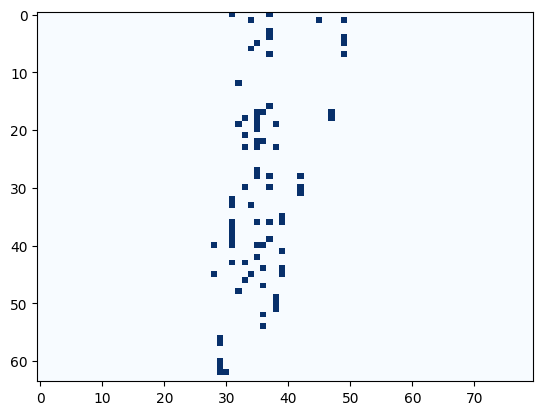

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from src.selection.data import SelectOneTask

optimized_path = os.path.join(
    "/disk/u/arnab/Codes/Projects/retrieval/results/"
    "selection/optimized_heads",
    mt.name.split("/")[-1],
    "distinct_options",
    "select_one",
    "epoch_10.npz"
)
optimization_results = np.load(optimized_path, allow_pickle=True)
optimal_head_mask = torch.tensor(optimization_results['optimal_mask']).to(torch.float32)
optimal_head_mask[50:, :] = 0.0

plt.imshow(
    optimal_head_mask.T.numpy(),
    cmap="Blues",
    aspect="auto",
    vmin=0,
    vmax=1,
)

heads_selected = torch.nonzero(optimal_head_mask > 0.5, as_tuple=False).tolist()
heads_selected = [
    (layer_idx, head_idx) for layer_idx, head_idx in heads_selected
]
print(len(heads_selected))


In [4]:
import copy
import random
from src.selection.utils import KeyedSet, get_first_token_id, verify_correct_option
from src.selection.data import SelectionSample
from src.functional import predict_next_token
from src.tokens import prepare_input

######################################################################
N_DISTRACTORS = 5
######################################################################


@torch.inference_mode()
def get_counterfactual_samples_within_task(
    task,
    patch_category: str | None = None,
    clean_category: str | None = None,
    shuffle_clean_options: bool = False,
    clean_prompt_template_idx=2,
    patch_prompt_template_idx=2,
    clean_option_style="single_line",
    patch_option_style="single_line",
    filter_by_lm_prediction: bool = True,
    distinct_options: bool = False,
    n_distractors: int = N_DISTRACTORS,
):
    categories = list(task.category_wise_examples.keys())
    if patch_category is None:
        patch_category = random.choice(categories)

    patch_subj, patch_obj = random.sample(
        task.category_wise_examples[patch_category], 2
    )
    logger.info(
        f"Patch category: {patch_category}, subject: {patch_subj}, object: {patch_obj}"
    )

    if clean_category is None:
        clean_category = random.choice(list(set(categories) - {patch_category}))

    clean_options = task.category_wise_examples[clean_category]
    random.shuffle(clean_options)

    clean_subj, clean_obj = random.sample(
        (
            KeyedSet(clean_options, mt.tokenizer) - KeyedSet([patch_obj], mt.tokenizer)
        ).values,
        2,
    )
    logger.info(
        f"Clean category: {clean_category}, subject: {clean_subj}, object: {clean_obj}"
    )

    if distinct_options is False:
        patch_type_obj = patch_obj
        clean_type_obj = clean_obj
    else:
        patch_type_obj = random.choice(
            (
                KeyedSet(task.category_wise_examples[patch_category], mt.tokenizer)
                - KeyedSet([patch_obj], mt.tokenizer)
            ).values
        )
        clean_type_obj = random.choice(
            (
                KeyedSet(task.category_wise_examples[clean_category], mt.tokenizer)
                - KeyedSet([clean_obj], mt.tokenizer)
            ).values
        )

    patch_must_have_options = [patch_obj, clean_type_obj]
    clean_must_have_options = [clean_obj, patch_type_obj]

    logger.info(f"{patch_must_have_options=}")
    logger.info(f"{clean_must_have_options=}")
    logger.info(f"{clean_type_obj=}")
    logger.info(f"{patch_type_obj=}")

    patch_distractors = []
    other_categories = random.sample(
        list(set(categories) - {patch_category, clean_category}),
        k=n_distractors - (len(patch_must_have_options)) + 1,
    )

    for other_category in other_categories:
        other_examples = task.category_wise_examples[other_category]
        random.shuffle(other_examples)
        other_examples = KeyedSet(other_examples, mt.tokenizer)
        patch_distractors.append(
            random.choice(
                (
                    other_examples
                    - KeyedSet(
                        patch_must_have_options + patch_distractors,
                        tokenizer=mt.tokenizer,
                    )
                ).values
            )
        )

    patch_options = patch_must_have_options + patch_distractors
    random.shuffle(patch_options)
    patch_obj_idx = patch_options.index(patch_obj)
    logger.info(f"{patch_obj_idx=} | {patch_options}")

    if distinct_options is not True:
        clean_options = copy.deepcopy(patch_options)
        if shuffle_clean_options:
            # Useful for the pointer experiments
            while (
                clean_options.index(clean_obj) == patch_obj_idx
                or clean_options.index(patch_type_obj) == patch_obj_idx
            ):
                random.shuffle(clean_options)
        clean_obj_idx = clean_options.index(clean_obj)

    else:
        other_categories = random.sample(
            list(set(categories) - {patch_category, clean_category}),
            k=N_DISTRACTORS - (len(clean_must_have_options)) + 1,
        )
        clean_distractors = []
        for other_category in other_categories:
            other_examples = task.category_wise_examples[other_category]
            random.shuffle(other_examples)
            other_examples = KeyedSet(other_examples, mt.tokenizer)
            clean_distractors.append(
                random.choice(
                    (
                        other_examples
                        - KeyedSet(
                            clean_must_have_options + clean_distractors,
                            tokenizer=mt.tokenizer,
                        )
                    ).values
                )
            )
        clean_options = clean_must_have_options + clean_distractors
        random.shuffle(clean_options)
        while clean_options.index(clean_obj) == patch_obj_idx:
            random.shuffle(clean_options)
        clean_obj_idx = clean_options.index(clean_obj)

    logger.info(f"{clean_obj_idx=} | {clean_options}")

    print(f"{type(task)=}")
    if isinstance(task, SelectOneTask):
        patch_metadata = {
            "track_category": clean_category,
            "track_type_obj": clean_type_obj,
            "track_type_obj_idx": patch_options.index(clean_type_obj),
            "track_type_obj_token_id": get_first_token_id(
                clean_type_obj, mt.tokenizer, prefix=" "
            ),
        }
        clean_metadata = {
            "track_category": patch_category,
            "track_type_obj": patch_type_obj,
            "track_type_obj_idx": clean_options.index(patch_type_obj),
            "track_type_obj_token_id": get_first_token_id(
                patch_type_obj, mt.tokenizer, prefix=" "
            ),
        }
    else:
        raise NotImplementedError(f"Unsupported task type: {type(task)}")

    patch_sample = SelectionSample(
        subj=patch_subj,
        obj=patch_obj,
        answer=patch_obj,
        obj_idx=patch_obj_idx,
        ans_token_id=get_first_token_id(patch_obj, mt.tokenizer, prefix=" "),
        options=patch_options,
        category=patch_category,
        metadata=patch_metadata,
        prompt_template = task.prompt_templates[patch_prompt_template_idx],
        default_option_style=patch_option_style,
    )
    clean_sample = SelectionSample(
        subj=clean_subj,
        obj=clean_obj,
        answer=clean_obj,
        obj_idx=clean_obj_idx,
        ans_token_id=get_first_token_id(clean_obj, mt.tokenizer, prefix=" "),
        options=clean_options,
        category=clean_category,
        metadata=clean_metadata,
        prompt_template = task.prompt_templates[clean_prompt_template_idx],
        default_option_style=clean_option_style,
    )

    if filter_by_lm_prediction:
        test_samples = [patch_sample, clean_sample]
        if distinct_options is True:
            clean_sample_2 = copy.deepcopy(patch_sample)
            clean_sample_2.options = clean_options
            clean_sample_2.obj = clean_sample.metadata["track_type_obj"]
            clean_sample_2.obj_idx = clean_sample.metadata["track_type_obj_idx"]
            clean_sample_2.ans_token_id = clean_sample.metadata[
                "track_type_obj_token_id"
            ]
            test_samples.append(clean_sample_2)

        for sample in test_samples:
            tokenized = prepare_input(tokenizer=mt, prompts=sample.prompt())
            is_correct, predictions, track_options = verify_correct_option(
                mt=mt, target=sample.obj, options=sample.options, input=tokenized
            )
            sample.metadata["tokenized"] = tokenized.data
            logger.info(sample.prompt())
            logger.info(
                f"{sample.subj} | {sample.category} -> {sample.obj} | pred={[str(p) for p in predictions]}"
            )
            if not is_correct:
                logger.error(
                    f'Prediction mismatch: {track_options[list(track_options.keys())[0]]}["{mt.tokenizer.decode(predictions[0].token_id)}"] != {sample.ans_token_id}["{mt.tokenizer.decode(sample.ans_token_id)}"]'
                )
                return get_counterfactual_samples_within_task(
                    task=task,
                    patch_category=patch_category,
                    clean_category=clean_category,
                    shuffle_clean_options=shuffle_clean_options,
                    clean_prompt_template_idx=clean_prompt_template_idx,
                    patch_prompt_template_idx=patch_prompt_template_idx,
                    clean_option_style=clean_option_style,
                    patch_option_style=patch_option_style,
                    filter_by_lm_prediction=filter_by_lm_prediction,
                    distinct_options=distinct_options,
                    n_distractors=n_distractors,
                )
            sample.prediction = predictions

    return patch_sample, clean_sample

In [7]:
TASK_CLS = SelectOneTask
N_DISTRACTORS = 5
prompt_template_idx = 3
OPTION_STYLE = "single_line"

select_task = TASK_CLS.load(
    path="/disk/u/gio/retrieval/data_save/selection/objects.json"
)

print(select_task.task_name)

select_one


## Question: before -> after & after -> before

In [ ]:
validation_set = []
validation_limit = 100

while len(validation_set) < validation_limit:
    patch, clean = get_counterfactual_samples_within_task(
        task=select_task,
        clean_prompt_template_idx=3,
        patch_prompt_template_idx=2,
        filter_by_lm_prediction=True,
        distinct_options=True,
        n_distractors=N_DISTRACTORS
    )
    validation_set.append((clean, patch))

In [ ]:
from tqdm import tqdm
from src.tokens import find_token_range
from src.selection.optimization import validate_q_proj_ie_on_sample_pair

validation_results = []
for clean_sample, patch_sample in tqdm(validation_set):

    patch_ques = (
        find_token_range(
            tokenizer=mt.tokenizer,
            string=patch_sample.prompt(),
            substring="?",
            occurrence=-1,
        )[1]
        - 1
    )
    clean_ques = (
        find_token_range(
            tokenizer=mt.tokenizer,
            string=clean_sample.prompt(),
            substring="?",
            occurrence=-1,
        )[1]
        - 1
    )
    logger.debug(
        f"{patch_ques=} | \"{mt.tokenizer.decode(patch_sample.metadata['tokenized']['input_ids'][0][patch_ques])}\""
    )
    logger.debug(
        f"{clean_ques=} | \"{mt.tokenizer.decode(clean_sample.metadata['tokenized']['input_ids'][0][clean_ques])}\""
    )

    result = validate_q_proj_ie_on_sample_pair(
        mt=mt,
        clean_sample=clean_sample,
        patch_sample=patch_sample,
        heads=heads_selected,
        query_indices={
            #patch_ques: clean_ques,
            -3:-3,
            -2:-2,
            -1:-1
        },
        verify_head_behavior_on=None,
        ablate_possible_ans_info_from_options=True,
    )
    validation_results.append(result)
    print("=" * 80)

In [45]:
counter_patch_type_top_option = 0
failed_cases = []
all_cases = []

for intervention_result in tqdm(validation_results):
    clean_sample = intervention_result["clean_sample"]
    patch_sample = intervention_result["patch_sample"]
    int_track = intervention_result["int_track"]
    clean_track = intervention_result["clean_track"]

    clean_obj = clean_sample.ans_token_id
    target_obj = clean_sample.metadata["track_type_obj_token_id"]

    clean_logit_before = clean_track[clean_obj][1].logit
    clean_logit_after = int_track[clean_obj][1].logit

    target_logit_before = clean_track[target_obj][1].logit
    target_logit_after = int_track[target_obj][1].logit

    clean_logit_delta = clean_logit_after - clean_logit_before
    target_logit_delta = target_logit_after - target_logit_before

    if (
        int_track[list(int_track.keys())[0]][1].token_id
        == clean_sample.metadata["track_type_obj_token_id"]
    ):
        counter_patch_type_top_option += 1
        failed = False
    else:
        failed_cases.append(
            {
                "clean_sample": clean_sample,
                "patch_sample": patch_sample,
                "int_track": int_track,
                "clean_track": clean_track
            }
        )
        failed = True
    all_cases.append(
            {
                "clean_sample": clean_sample,
                "patch_sample": patch_sample,
                "int_track": int_track,
                "clean_track": clean_track,
                "clean_logit_delta": clean_logit_delta,
                "target_logit_delta": target_logit_delta,
                "failed": failed
            }
    )

top_1_accuracy = counter_patch_type_top_option / len(validation_results)

print(
    f"Counterfactual patching accuracy: {top_1_accuracy:.4f}",
    f"({counter_patch_type_top_option}/{len(validation_results)})"
)

print(f"Average clean logit delta: {sum(case['clean_logit_delta'] for case in all_cases) / len(all_cases)}")
print(f"Average target logit delta: {sum(case['target_logit_delta'] for case in all_cases) / len(all_cases)}")

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 45003.26it/s]

Counterfactual patching accuracy: 0.1300 (13/100)
Average clean logit delta: -4.1675
Average target logit delta: 1.6921875


In [10]:
from src.selection.data import SelectOrderTask

@torch.inference_mode()
def get_counterfactual_samples_within_task(
    task: SelectOneTask | SelectOrderTask = select_task,
    patch_category: str | None = None,
    clean_category: str | None = None,
    shuffle_clean_options: bool = False,
    clean_prompt_template_idx=2,
    patch_prompt_template_idx=3,
    clean_option_style="numbered",
    patch_option_style="single_line",
    filter_by_lm_prediction: bool = True,
    distinct_options: bool = False,
    n_distractors: int = N_DISTRACTORS,
):
    categories = list(task.category_wise_examples.keys())
    if patch_category is None:
        patch_category = random.choice(categories)

    patch_subj, patch_obj = random.sample(
        task.category_wise_examples[patch_category], 2
    )
    logger.info(
        f"Patch category: {patch_category}, subject: {patch_subj}, object: {patch_obj}"
    )

    if clean_category is None:
        clean_category = random.choice(list(set(categories) - {patch_category}))

    clean_options = task.category_wise_examples[clean_category]
    random.shuffle(clean_options)

    clean_subj, clean_obj = random.sample(
        (
            KeyedSet(clean_options, mt.tokenizer) - KeyedSet([patch_obj], mt.tokenizer)
        ).values,
        2,
    )
    logger.info(
        f"Clean category: {clean_category}, subject: {clean_subj}, object: {clean_obj}"
    )

    if distinct_options is False:
        patch_type_obj = patch_obj
        clean_type_obj = clean_obj
    else:
        patch_type_obj = random.choice(
            (
                KeyedSet(task.category_wise_examples[patch_category], mt.tokenizer)
                - KeyedSet([patch_obj], mt.tokenizer)
            ).values
        )
        clean_type_obj = random.choice(
            (
                KeyedSet(task.category_wise_examples[clean_category], mt.tokenizer)
                - KeyedSet([clean_obj], mt.tokenizer)
            ).values
        )

    patch_must_have_options = [patch_obj, clean_type_obj]
    clean_must_have_options = [clean_obj, patch_type_obj]

    logger.info(f"{patch_must_have_options=}")
    logger.info(f"{clean_must_have_options=}")
    logger.info(f"{clean_type_obj=}")
    logger.info(f"{patch_type_obj=}")

    patch_distractors = []
    other_categories = random.sample(
        list(set(categories) - {patch_category, clean_category}),
        k=n_distractors - (len(patch_must_have_options)) + 1,
    )

    for other_category in other_categories:
        other_examples = task.category_wise_examples[other_category]
        random.shuffle(other_examples)
        other_examples = KeyedSet(other_examples, mt.tokenizer)
        patch_distractors.append(
            random.choice(
                (
                    other_examples
                    - KeyedSet(
                        patch_must_have_options + patch_distractors,
                        tokenizer=mt.tokenizer,
                    )
                ).values
            )
        )

    patch_options = patch_must_have_options + patch_distractors
    random.shuffle(patch_options)
    patch_obj_idx = patch_options.index(patch_obj)
    logger.info(f"{patch_obj_idx=} | {patch_options}")

    if distinct_options is not True:
        clean_options = copy.deepcopy(patch_options)
        if shuffle_clean_options:
            # Useful for the pointer experiments
            while (
                clean_options.index(clean_obj) == patch_obj_idx
                or clean_options.index(patch_type_obj) == patch_obj_idx
            ):
                random.shuffle(clean_options)
        clean_obj_idx = clean_options.index(clean_obj)

    else:
        other_categories = random.sample(
            list(set(categories) - {patch_category, clean_category}),
            k=N_DISTRACTORS - (len(clean_must_have_options)) + 1,
        )
        clean_distractors = []
        for other_category in other_categories:
            other_examples = task.category_wise_examples[other_category]
            random.shuffle(other_examples)
            other_examples = KeyedSet(other_examples, mt.tokenizer)
            clean_distractors.append(
                random.choice(
                    (
                        other_examples
                        - KeyedSet(
                            clean_must_have_options + clean_distractors,
                            tokenizer=mt.tokenizer,
                        )
                    ).values
                )
            )
        clean_options = clean_must_have_options + clean_distractors
        random.shuffle(clean_options)
        while clean_options.index(clean_obj) == patch_obj_idx:
            random.shuffle(clean_options)
        clean_obj_idx = clean_options.index(clean_obj)

    logger.info(f"{clean_obj_idx=} | {clean_options}")

    print(f"{type(task)=}")
    if isinstance(task, SelectOrderTask):
        patch_metadata = {
            "track_type_obj_idx": clean_obj_idx,
            "track_type_obj": patch_options[clean_obj_idx],
            "track_type_obj_token_id": get_first_token_id(
                patch_options[clean_obj_idx], mt.tokenizer, prefix=" "
            ),
        }
        clean_metadata = {
            "track_type_obj_idx": patch_obj_idx,
            "track_type_obj": clean_options[patch_obj_idx],
            "track_type_obj_token_id": get_first_token_id(
                clean_options[patch_obj_idx], mt.tokenizer, prefix=" "
            ),
        }
    elif isinstance(task, SelectOneTask):
        patch_metadata = {
            "track_category": clean_category,
            "track_type_obj": clean_type_obj,
            "track_type_obj_idx": patch_options.index(clean_type_obj),
            "track_type_obj_token_id": get_first_token_id(
                clean_type_obj, mt.tokenizer, prefix=" "
            ),
        }
        clean_metadata = {
            "track_category": patch_category,
            "track_type_obj": patch_type_obj,
            "track_type_obj_idx": clean_options.index(patch_type_obj),
            "track_type_obj_token_id": get_first_token_id(
                patch_type_obj, mt.tokenizer, prefix=" "
            ),
        }
    else:
        raise NotImplementedError(f"Unsupported task type: {type(task)}")

    patch_sample = SelectionSample(
        subj=patch_subj,
        obj=patch_obj,
        answer=patch_obj,
        obj_idx=patch_obj_idx,
        ans_token_id=get_first_token_id(patch_obj, mt.tokenizer, prefix=" "),
        options=patch_options,
        category=patch_category,
        metadata=patch_metadata,
        prompt_template = task.prompt_templates[patch_prompt_template_idx],
        default_option_style=patch_option_style,
    )
    clean_sample = SelectionSample(
        subj=clean_subj,
        obj=clean_obj,
        answer=clean_obj,
        obj_idx=clean_obj_idx,
        ans_token_id=get_first_token_id(clean_obj, mt.tokenizer, prefix=" "),
        options=clean_options,
        category=clean_category,
        metadata=clean_metadata,
        prompt_template = task.prompt_templates[clean_prompt_template_idx],
        default_option_style=clean_option_style,
    )

    if filter_by_lm_prediction:
        test_samples = [patch_sample, clean_sample]
        if distinct_options is True:
            clean_sample_2 = copy.deepcopy(patch_sample)
            clean_sample_2.options = clean_options
            clean_sample_2.obj = clean_sample.metadata["track_type_obj"]
            clean_sample_2.obj_idx = clean_sample.metadata["track_type_obj_idx"]
            clean_sample_2.ans_token_id = clean_sample.metadata[
                "track_type_obj_token_id"
            ]
            test_samples.append(clean_sample_2)

        for sample in test_samples:
            tokenized = prepare_input(tokenizer=mt, prompts=sample.prompt())
            is_correct, predictions, track_options = verify_correct_option(
                mt=mt, target=sample.obj, options=sample.options, input=tokenized
            )
            sample.metadata["tokenized"] = tokenized.data
            logger.info(sample.prompt())
            logger.info(
                f"{sample.subj} | {sample.category} -> {sample.obj} | pred={[str(p) for p in predictions]}"
            )
            if not is_correct:
                logger.error(
                    f'Prediction mismatch: {track_options[list(track_options.keys())[0]]}["{mt.tokenizer.decode(predictions[0].token_id)}"] != {sample.ans_token_id}["{mt.tokenizer.decode(sample.ans_token_id)}"]'
                )
                return get_counterfactual_samples_within_task(
                    task=task,
                    patch_category=patch_category,
                    clean_category=clean_category,
                    shuffle_clean_options=shuffle_clean_options,
                    clean_prompt_template_idx=clean_prompt_template_idx,
                    patch_prompt_template_idx=patch_prompt_template_idx,
                    clean_option_style=clean_option_style,
                    patch_option_style=patch_option_style,
                    filter_by_lm_prediction=filter_by_lm_prediction,
                    distinct_options=distinct_options,
                    n_distractors=n_distractors,
                )
            sample.prediction = predictions

    return patch_sample, clean_sample

In [ ]:
from src.functional import free_gpu_cache
free_gpu_cache()
validation_set = []
validation_limit = 10

while len(validation_set) < validation_limit:
    patch, clean = get_counterfactual_samples_within_task(
        filter_by_lm_prediction=True,
        distinct_options=True,
        n_distractors=N_DISTRACTORS,
        clean_prompt_template_idx=3,
        patch_prompt_template_idx=2,
        clean_option_style="single_line",
        patch_option_style="single_line",
    )
    validation_set.append((clean, patch))

In [38]:
from tqdm.auto import tqdm

validation_results = []
for clean_sample, patch_sample in tqdm(validation_set):
    patch_ques = (
        find_token_range(
            tokenizer=mt.tokenizer,
            string=patch_sample.prompt(),
            substring="?",
            occurrence=-1,
        )[1]
        - 1
    )
    clean_ques = (
        find_token_range(
            tokenizer=mt.tokenizer,
            string=clean_sample.prompt(),
            substring="?",
            occurrence=-1,
        )[1]
        - 1
    )
    logger.debug(
        f"{patch_ques=} | \"{mt.tokenizer.decode(patch_sample.metadata['tokenized']['input_ids'][0][patch_ques])}\""
    )
    logger.debug(
        f"{clean_ques=} | \"{mt.tokenizer.decode(clean_sample.metadata['tokenized']['input_ids'][0][clean_ques])}\""
    )

    result = validate_q_proj_ie_on_sample_pair(
        mt=mt,
        clean_sample=clean_sample,
        patch_sample=patch_sample,
        # heads=HEADS,
        heads = heads_selected,
        query_indices={
            #patch_ques: clean_ques,
            -3: -3,
            -2: -2,
            -1: -1
        },
        verify_head_behavior_on=None,
    )
    validation_results.append(result)
    print("=" * 80)

  0%|          | 0/10 [00:00<?, ?it/s]

2025-09-09 10:56:32 __main__ DEBUG    patch_ques=10 | "?
"
2025-09-09 10:56:32 __main__ DEBUG    clean_ques=27 | "?
"
2025-09-09 10:56:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 10:56:32 src.selection.optimization INFO     patch_prediction=['" Water"[10164] (p=0.793, logit=21.875)', '" The"[578] (p=0.156, logit=20.250)', '" A"[362] (p=0.019, logit=18.125)', '" "[220] (p=0.003, logit=16.375)', '" Fruit"[44187] (p=0.003, logit=16.250)', '" Only"[8442] (p=0.002, logit=16.000)', '" water"[3090] (p=0.002, logit=15.812)', '" Among"[22395] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.438)', '" From"[5659] (p=0.001, logit=15.375)', '" WATER"[76347] (p=0.001, logit=15.312)', '" ("[320] (p=0.001, logit=15.188)', '"Water"[29353] (p=0.001, logit=15.062)', '" Of"[5046] (p=0.001, logit=14.938)', '" Let"[6914] (p=0.001, logit=14.750)', '" F"[435] (p=0.000, logit=14.500)', '" the"[279] (p=0.000, logit=14.438)', '" Since"[8876] (p=0.000, lo

2025-09-09 10:56:32 src.selection.optimization INFO     clean_prediction=['" Sc"[2522] (p=0.855, logit=20.625)', '" None"[2290] (p=0.048, logit=17.750)', '" The"[578] (p=0.020, logit=16.875)', '" Among"[22395] (p=0.014, logit=16.500)', '"Sc"[3407] (p=0.006, logit=15.625)']
2025-09-09 10:56:32 src.selection.optimization INFO     clean_track=OrderedDict([(2522, (1, PredictedToken(token=' Sc', prob=0.85546875, logit=20.625, token_id=2522, metadata=None))), (40759, (11, PredictedToken(token=' Harmon', prob=0.0025634765625, logit=14.8125, token_id=40759, metadata=None))), (80629, (18, PredictedToken(token=' Grape', prob=0.000782012939453125, logit=13.625, token_id=80629, metadata=None))), (36895, (64, PredictedToken(token=' Eagle', prob=0.00010585784912109375, logit=11.625, token_id=36895, metadata=None))), (78703, (82, PredictedToken(token=' Potato', prob=8.249282836914062e-05, logit=11.375, token_id=78703, metadata=None))), (87213, (941, PredictedToken(token=' Oven', prob=1.25169754028320

In [40]:
counter_patch_type_top_option = 0
failed_cases = []
all_cases = []

for intervention_result in tqdm(validation_results):
    clean_sample = intervention_result["clean_sample"]
    patch_sample = intervention_result["patch_sample"]
    int_track = intervention_result["int_track"]
    clean_track = intervention_result["clean_track"]

    clean_obj = clean_sample.ans_token_id
    target_obj = clean_sample.metadata["track_type_obj_token_id"]

    clean_logit_before = clean_track[clean_obj][1].logit
    clean_logit_after = int_track[clean_obj][1].logit

    target_logit_before = clean_track[target_obj][1].logit
    target_logit_after = int_track[target_obj][1].logit

    clean_logit_delta = clean_logit_after - clean_logit_before
    target_logit_delta = target_logit_after - target_logit_before

    if (
        int_track[list(int_track.keys())[0]][1].token_id
        == clean_sample.metadata["track_type_obj_token_id"] # In the updated data this will actually have the position token id rather than the pexisitng
    ):
        counter_patch_type_top_option += 1
        failed = False
    else:
        failed_cases.append(
            {
                "clean_sample": clean_sample,
                "patch_sample": patch_sample,
                "int_track": int_track,
                "clean_track": clean_track
            }
        )
        failed = True
    all_cases.append(
            {
                "clean_sample": clean_sample,
                "patch_sample": patch_sample,
                "int_track": int_track,
                "clean_track": clean_track,
                "clean_logit_delta": clean_logit_delta,
                "target_logit_delta": target_logit_delta,
                "failed": failed
            }
    )

top_1_accuracy = counter_patch_type_top_option / len(validation_results)

print(
    f"Counterfactual patching accuracy: {top_1_accuracy:.4f}",
    f"({counter_patch_type_top_option}/{len(validation_results)})"
)

print(f"Average clean logit delta: {sum(case['clean_logit_delta'] for case in all_cases) / len(all_cases)}")
print(f"Average target logit delta: {sum(case['target_logit_delta'] for case in all_cases) / len(all_cases)}")

  0%|          | 0/10 [00:00<?, ?it/s]

Counterfactual patching accuracy: 0.2000 (2/10)
Average clean logit delta: -7.09375
Average target logit delta: 4.125


## Options: single line -> lettered & lettered -> single line

In [8]:
validation_set = []
validation_limit = 1024

while len(validation_set) < validation_limit:
    patch, clean = get_counterfactual_samples_within_task(
        task=select_task,
        clean_prompt_template_idx=3,
        patch_prompt_template_idx=3,
        filter_by_lm_prediction=True,
        distinct_options=True,
        clean_option_style="numbered",
        patch_option_style="single_line",
        n_distractors=N_DISTRACTORS
    )
    validation_set.append((clean, patch))

2025-09-09 11:36:25 __main__ INFO     Patch category: tree, subject: Bamboo, object: Willow
2025-09-09 11:36:25 __main__ INFO     Clean category: bathroom item, subject: Shower, object: Mirror
2025-09-09 11:36:25 __main__ INFO     patch_must_have_options=['Willow', 'Bathtub']
2025-09-09 11:36:25 __main__ INFO     clean_must_have_options=['Mirror', 'Ash']
2025-09-09 11:36:25 __main__ INFO     clean_type_obj='Bathtub'
2025-09-09 11:36:25 __main__ INFO     patch_type_obj='Ash'
2025-09-09 11:36:25 __main__ INFO     patch_obj_idx=5 | ['Peony', 'Bathtub', 'Mixer', 'Dress', 'Ottoman', 'Willow']
2025-09-09 11:36:25 __main__ INFO     clean_obj_idx=1 | ['Phone', 'Mirror', 'Highlighter', 'Church', 'Watermelon', 'Ash']


type(task)=<class 'src.selection.data.SelectOneTask'>
2025-09-09 11:36:26 __main__ INFO     Options: Peony, Bathtub, Mixer, Dress, Ottoman, Willow.
Which among these objects mentioned above is a tree?
Answer:
2025-09-09 11:36:26 __main__ INFO     Bamboo | tree -> Willow | pred=['" Willow"[65449] (p=0.836, logit=21.625)', '" The"[578] (p=0.061, logit=19.000)', '" Among"[22395] (p=0.042, logit=18.625)', '" A"[362] (p=0.015, logit=17.625)', '" Pe"[5250] (p=0.009, logit=17.125)']
2025-09-09 11:36:26 __main__ INFO     a. Phone
b. Mirror
c. Highlighter
d. Church
e. Watermelon
f. Ash
Which among these objects mentioned above is a bathroom item?
Answer:
2025-09-09 11:36:26 __main__ INFO     Shower | bathroom item -> Mirror | pred=['" b"[293] (p=0.809, logit=21.375)', '" ("[320] (p=0.085, logit=19.125)', '" The"[578] (p=0.024, logit=17.875)', '" B"[426] (p=0.015, logit=17.375)', '" Mirror"[34954] (p=0.010, logit=17.000)']
2025-09-09 11:36:26 __main__ INFO     Options: Phone, Mirror, Highlighter

In [9]:
from tqdm import tqdm
from src.tokens import find_token_range
from src.selection.optimization import validate_q_proj_ie_on_sample_pair

validation_results = []
for clean_sample, patch_sample in tqdm(validation_set):

    # patch_ques = (
    #     find_token_range(
    #         tokenizer=mt.tokenizer,
    #         string=patch_sample.prompt(),
    #         substring="?",
    #         occurrence=-1,
    #     )[1]
    #     - 1
    # )
    # clean_ques = (
    #     find_token_range(
    #         tokenizer=mt.tokenizer,
    #         string=clean_sample.prompt(),
    #         substring="?",
    #         occurrence=-1,
    #     )[1]
    #     - 1
    # )
    # logger.debug(
    #     f"{patch_ques=} | \"{mt.tokenizer.decode(patch_sample.metadata['tokenized']['input_ids'][0][patch_ques])}\""
    # )
    # logger.debug(
    #     f"{clean_ques=} | \"{mt.tokenizer.decode(clean_sample.metadata['tokenized']['input_ids'][0][clean_ques])}\""
    # )

    result = validate_q_proj_ie_on_sample_pair(
        mt=mt,
        clean_sample=clean_sample,
        patch_sample=patch_sample,
        heads=heads_selected,
        query_indices={
            #patch_ques: clean_ques,
            -3:-3,
            -2:-2,
            -1:-1
        },
        verify_head_behavior_on=None,
        #ablate_possible_ans_info_from_options=True,
    )
    validation_results.append(result)
    print("=" * 80)

  0%|                                                                                                                                                                         | 0/1024 [00:00<?, ?it/s]

2025-09-09 11:45:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:10 src.selection.optimization INFO     patch_prediction=['" Willow"[65449] (p=0.836, logit=21.625)', '" The"[578] (p=0.061, logit=19.000)', '" Among"[22395] (p=0.042, logit=18.625)', '" A"[362] (p=0.015, logit=17.625)', '" Pe"[5250] (p=0.009, logit=17.125)', '" will"[690] (p=0.003, logit=16.125)', '" Option"[7104] (p=0.003, logit=16.125)', '" It"[1102] (p=0.003, logit=15.938)', '" Will"[4946] (p=0.003, logit=15.812)', '" There"[2684] (p=0.002, logit=15.500)', '" ("[320] (p=0.002, logit=15.375)', '" W"[468] (p=0.001, logit=15.250)', '" "[220] (p=0.001, logit=15.125)', '" None"[2290] (p=0.001, logit=14.875)', '" Only"[8442] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.562)', '" Answer"[22559] (p=0.001, logit=14.375)', '" a"[264] (p=0.000, logit=14.188)', '" ""[330] (p=0.000, logit=14.188)', '" This"[1115] (p=0.000, logit=14.188)', '" One"[3861] (p=0.000, logit=1

  0%|▏                                                                                                                                                                | 1/1024 [00:00<07:44,  2.20it/s]

2025-09-09 11:45:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:10 src.selection.optimization INFO     patch_prediction=['" Rose"[16344] (p=0.793, logit=21.750)', '" The"[578] (p=0.074, logit=19.375)', '" A"[362] (p=0.040, logit=18.750)', '" Among"[22395] (p=0.031, logit=18.500)', '" rose"[16392] (p=0.011, logit=17.500)', '" Option"[7104] (p=0.007, logit=17.000)', '" ("[320] (p=0.005, logit=16.750)', '" It"[1102] (p=0.005, logit=16.750)', '" RO"[12076] (p=0.004, logit=16.375)', '" “"[1054] (p=0.003, logit=16.125)', '" d"[294] (p=0.002, logit=15.562)', '" In"[763] (p=0.002, logit=15.562)', '"Rose"[58524] (p=0.002, logit=15.562)', '" ""[330] (p=0.002, logit=15.500)', '" "[220] (p=0.001, logit=15.375)', '" ‘"[3451] (p=0.001, logit=15.375)', '" c"[272] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=14.938)', '" Flower"[43786] (p=0.001, logit=14.812)', '" b"[293] (p=0.001, logit=14.750)', '" Roses"[81470] (p=0.001, logit=14.750)'

  0%|▎                                                                                                                                                                | 2/1024 [00:00<07:46,  2.19it/s]

2025-09-09 11:45:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:11 src.selection.optimization INFO     patch_prediction=['" Gir"[48035] (p=0.707, logit=21.500)', '" The"[578] (p=0.123, logit=19.750)', '" A"[362] (p=0.075, logit=19.250)', '" Among"[22395] (p=0.045, logit=18.750)', '" "[220] (p=0.006, logit=16.750)', '" R"[432] (p=0.005, logit=16.625)', '" It"[1102] (p=0.002, logit=15.812)', '" An"[1556] (p=0.002, logit=15.812)', '" Option"[7104] (p=0.002, logit=15.812)', '" \n"[720] (p=0.002, logit=15.750)', '" Out"[4470] (p=0.002, logit=15.750)', '" ("[320] (p=0.002, logit=15.625)', '" G"[480] (p=0.002, logit=15.500)', '"G"[38] (p=0.002, logit=15.375)', '" Animal"[21995] (p=0.001, logit=15.250)', '" a"[264] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=15.125)', '" gir"[41389] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=14.875)', '" Only"[8442] (p=0.001, logit=14.875)', '" ""

  0%|▍                                                                                                                                                                | 3/1024 [00:01<07:48,  2.18it/s]

2025-09-09 11:45:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:11 src.selection.optimization INFO     patch_prediction=['" E"[469] (p=0.652, logit=21.875)', '" An"[1556] (p=0.187, logit=20.625)', '" The"[578] (p=0.078, logit=19.750)', '" Among"[22395] (p=0.042, logit=19.125)', '" e"[384] (p=0.012, logit=17.875)', '" It"[1102] (p=0.006, logit=17.250)', '" Only"[8442] (p=0.003, logit=16.375)', '" "[220] (p=0.002, logit=16.250)', '" an"[459] (p=0.002, logit=15.938)', '" ("[320] (p=0.001, logit=15.438)', '" A"[362] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.125)', '" Option"[7104] (p=0.001, logit=15.125)', '" Since"[8876] (p=0.001, logit=15.125)', '" Jewelry"[62968] (p=0.001, logit=15.062)', '" Out"[4470] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=15.000)', '" In"[763] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.812)', '" This"[1115] (p=0.000, logit=14.62

  0%|▋                                                                                                                                                                | 4/1024 [00:01<07:51,  2.16it/s]

2025-09-09 11:45:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:12 src.selection.optimization INFO     patch_prediction=['" Lac"[55141] (p=0.750, logit=20.875)', '" The"[578] (p=0.070, logit=18.500)', '" Among"[22395] (p=0.070, logit=18.500)', '" A"[362] (p=0.042, logit=18.000)', '" It"[1102] (p=0.007, logit=16.250)', '" Chain"[29625] (p=0.007, logit=16.250)', '" lac"[44979] (p=0.005, logit=15.812)', '" ("[320] (p=0.004, logit=15.688)', '" "[220] (p=0.003, logit=15.438)', '" School"[6150] (p=0.003, logit=15.312)', '" Out"[4470] (p=0.002, logit=15.062)', '" Option"[7104] (p=0.002, logit=15.000)', '" L"[445] (p=0.002, logit=14.875)', '" There"[2684] (p=0.002, logit=14.812)', '" We"[1226] (p=0.002, logit=14.688)', '" Fl"[3061] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.375)', '" Only"[8442] (p=0.001, logit=14.312)', '" a"[264] (p=0.001, logit=14.250)', '" This"[1115] (p=0.001, logit=14.250)', '" One"[3861] (p=0.001, logit=14

  0%|▊                                                                                                                                                                | 5/1024 [00:02<07:56,  2.14it/s]

2025-09-09 11:45:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:12 src.selection.optimization INFO     patch_prediction=['" Sh"[1443] (p=0.820, logit=20.875)', '" Among"[22395] (p=0.052, logit=18.125)', '" The"[578] (p=0.046, logit=18.000)', '" SH"[6570] (p=0.008, logit=16.250)', '" Out"[4470] (p=0.007, logit=16.125)', '" Honey"[40715] (p=0.006, logit=15.875)', '" A"[362] (p=0.005, logit=15.688)', '" Option"[7104] (p=0.004, logit=15.438)', '" It"[1102] (p=0.003, logit=15.312)', '" ("[320] (p=0.003, logit=15.188)', '" "[220] (p=0.002, logit=15.000)', '" Amb"[20423] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.002, logit=14.938)', '"Sh"[2059] (p=0.002, logit=14.812)', '" One"[3861] (p=0.002, logit=14.688)', '" From"[5659] (p=0.002, logit=14.688)', '" shampoo"[63032] (p=0.002, logit=14.688)', '" An"[1556] (p=0.002, logit=14.625)', '" We"[1226] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.3

  1%|▉                                                                                                                                                                | 6/1024 [00:02<07:55,  2.14it/s]

2025-09-09 11:45:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:13 src.selection.optimization INFO     patch_prediction=['" Night"[13120] (p=0.820, logit=22.250)', '" A"[362] (p=0.067, logit=19.750)', '" The"[578] (p=0.060, logit=19.625)', '" Among"[22395] (p=0.025, logit=18.750)', '" "[220] (p=0.002, logit=16.375)', '" It"[1102] (p=0.002, logit=16.375)', '" night"[3814] (p=0.002, logit=16.375)', '" Only"[8442] (p=0.002, logit=16.125)', '" NIGHT"[76131] (p=0.002, logit=16.125)', '" ("[320] (p=0.001, logit=15.875)', '" a"[264] (p=0.001, logit=15.812)', '" One"[3861] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=15.250)', '" Out"[4470] (p=0.001, logit=15.250)', '" There"[2684] (p=0.001, logit=14.938)', '" \n"[720] (p=0.001, logit=14.875)', '" Option"[7104] (p=0.000, logit=14.812)', '" “"[1054] (p=0.000, logit=14.688)', '" We"[1226] (p=0.000, logit=14.688)', '" In"[763] (p=0.000, logit=14.562)', '" This"[1115] (p=0.000, logit=14.43

  1%|█                                                                                                                                                                | 7/1024 [00:03<07:49,  2.17it/s]

2025-09-09 11:45:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:13 src.selection.optimization INFO     patch_prediction=['" Bench"[36358] (p=0.719, logit=21.000)', '" The"[578] (p=0.086, logit=18.875)', '" Among"[22395] (p=0.052, logit=18.375)', '" B"[426] (p=0.036, logit=18.000)', '" A"[362] (p=0.032, logit=17.875)', '" ("[320] (p=0.009, logit=16.625)', '" It"[1102] (p=0.009, logit=16.625)', '" b"[293] (p=0.005, logit=15.938)', '" bench"[13731] (p=0.004, logit=15.812)', '" Option"[7104] (p=0.004, logit=15.750)', '" “"[1054] (p=0.003, logit=15.500)', '" There"[2684] (p=0.003, logit=15.438)', '" "[220] (p=0.002, logit=15.250)', '" Out"[4470] (p=0.002, logit=15.125)', '" d"[294] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.002, logit=15.000)', '" a"[264] (p=0.002, logit=14.875)', '" ""[330] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.625)', '" Its"[11699] (p=0.001, logit=14.500)', '" T

  1%|█▎                                                                                                                                                               | 8/1024 [00:03<07:47,  2.17it/s]

2025-09-09 11:45:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:14 src.selection.optimization INFO     patch_prediction=['" Sc"[2522] (p=0.848, logit=20.750)', '" None"[2290] (p=0.042, logit=17.750)', '" The"[578] (p=0.020, logit=17.000)', '" Among"[22395] (p=0.016, logit=16.750)', '" Micro"[18654] (p=0.006, logit=15.750)', '" Bear"[24941] (p=0.005, logit=15.688)', '" A"[362] (p=0.005, logit=15.562)', '"Sc"[3407] (p=0.004, logit=15.500)', '" Stap"[63606] (p=0.004, logit=15.500)', '" It"[1102] (p=0.003, logit=15.125)', '" Only"[8442] (p=0.003, logit=15.125)', '" There"[2684] (p=0.003, logit=15.062)', '" scissors"[72724] (p=0.003, logit=15.062)', '" "[220] (p=0.002, logit=14.812)', '" Out"[4470] (p=0.001, logit=14.312)', '" ("[320] (p=0.001, logit=14.250)', '" Answer"[22559] (p=0.001, logit=14.250)', '" Caul"[90538] (p=0.001, logit=14.188)', '" none"[7000] (p=0.001, logit=14.125)', '" Paper"[18343] (p=0.001, logit=14.125)', '" Since"[887

  1%|█▍                                                                                                                                                               | 9/1024 [00:04<07:44,  2.18it/s]

2025-09-09 11:45:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:14 src.selection.optimization INFO     patch_prediction=['" Lion"[33199] (p=0.758, logit=21.375)', '" The"[578] (p=0.090, logit=19.250)', '" Among"[22395] (p=0.055, logit=18.750)', '" A"[362] (p=0.038, logit=18.375)', '" L"[445] (p=0.012, logit=17.250)', '" Option"[7104] (p=0.007, logit=16.625)', '" ("[320] (p=0.004, logit=16.125)', '" It"[1102] (p=0.003, logit=15.938)', '" Out"[4470] (p=0.003, logit=15.938)', '" "[220] (p=0.003, logit=15.812)', '" “"[1054] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.002, logit=15.250)', '" lion"[40132] (p=0.002, logit=15.250)', '" K"[735] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.875)', '" the"[279] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.562)', '" a"[264] (p=0.001, logit=14.500)', '" An"[1556] (p=0.001, logit=14.438)', '" From"[5659] (p=0.001, logit=14.375)', '" Animal"[21995] (p=0.001, logit=14.312)

  1%|█▌                                                                                                                                                              | 10/1024 [00:04<07:43,  2.19it/s]

2025-09-09 11:45:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:15 src.selection.optimization INFO     patch_prediction=['" Birch"[88088] (p=0.711, logit=20.875)', '" The"[578] (p=0.096, logit=18.875)', '" Among"[22395] (p=0.085, logit=18.750)', '" Har"[5340] (p=0.019, logit=17.250)', '" A"[362] (p=0.012, logit=16.750)', '" B"[426] (p=0.012, logit=16.750)', '" It"[1102] (p=0.008, logit=16.375)', '" There"[2684] (p=0.005, logit=15.938)', '" Bir"[37919] (p=0.005, logit=15.875)', '" ("[320] (p=0.004, logit=15.625)', '" Option"[7104] (p=0.004, logit=15.625)', '" "[220] (p=0.003, logit=15.500)', '" bir"[15606] (p=0.003, logit=15.500)', '" We"[1226] (p=0.002, logit=14.938)', '" In"[763] (p=0.001, logit=14.438)', '" None"[2290] (p=0.001, logit=14.375)', '" Out"[4470] (p=0.001, logit=14.375)', '" From"[5659] (p=0.001, logit=14.375)', '" One"[3861] (p=0.001, logit=14.250)', '" Answer"[22559] (p=0.001, logit=14.250)', '" This"[1115] (p=0.001, lo

  1%|█▋                                                                                                                                                              | 11/1024 [00:05<07:41,  2.19it/s]

2025-09-09 11:45:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:15 src.selection.optimization INFO     patch_prediction=['" Boys"[30857] (p=0.895, logit=22.375)', '" The"[578] (p=0.045, logit=19.375)', '" Among"[22395] (p=0.027, logit=18.875)', '" A"[362] (p=0.010, logit=17.875)', '" "[220] (p=0.002, logit=16.250)', '" It"[1102] (p=0.001, logit=15.938)', '" boys"[13305] (p=0.001, logit=15.938)', '" ("[320] (p=0.001, logit=15.875)', '" None"[2290] (p=0.001, logit=15.750)', '" BO"[7967] (p=0.001, logit=15.500)', '" Only"[8442] (p=0.001, logit=15.438)', '" B"[426] (p=0.001, logit=15.375)', '"Bo"[1255] (p=0.001, logit=15.312)', '" Fruit"[44187] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.125)', '" Option"[7104] (p=0.001, logit=15.125)', '" Boy"[16576] (p=0.001, logit=15.125)', '" F"[435] (p=0.001, logit=15.062)', '" There"[2684] (p=0.000, logit=14.875)', '" Out"[4470] (p=0.000, logit=14.875)', '" “"[1054] (p=0.000, logit=14.688

  1%|█▉                                                                                                                                                              | 12/1024 [00:05<07:45,  2.17it/s]

2025-09-09 11:45:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:16 src.selection.optimization INFO     patch_prediction=['" Football"[21424] (p=0.840, logit=21.375)', '" None"[2290] (p=0.069, logit=18.875)', '" Hair"[26781] (p=0.015, logit=17.375)', '" The"[578] (p=0.014, logit=17.250)', '" Among"[22395] (p=0.014, logit=17.250)', '" A"[362] (p=0.006, logit=16.500)', '" S"[328] (p=0.006, logit=16.375)', '" There"[2684] (p=0.003, logit=15.875)', '" Table"[6771] (p=0.003, logit=15.875)', '" football"[9141] (p=0.003, logit=15.750)', '" Refriger"[75258] (p=0.003, logit=15.625)', '" ("[320] (p=0.002, logit=15.312)', '" It"[1102] (p=0.002, logit=15.125)', '" none"[7000] (p=0.002, logit=15.125)', '" "[220] (p=0.001, logit=14.688)', '" Option"[7104] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.438)', '" Not"[2876] (p=0.001, logit=14.438)', '" Stadium"[23462] (p=0.001, logit=14.438)', '" This

  1%|██                                                                                                                                                              | 13/1024 [00:05<07:47,  2.16it/s]

2025-09-09 11:45:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:16 src.selection.optimization INFO     patch_prediction=['" Table"[6771] (p=0.801, logit=22.875)', '" The"[578] (p=0.084, logit=20.625)', '" A"[362] (p=0.075, logit=20.500)', '" Among"[22395] (p=0.013, logit=18.750)', '" It"[1102] (p=0.005, logit=17.750)', '" Only"[8442] (p=0.003, logit=17.250)', '" ("[320] (p=0.003, logit=17.125)', '" "[220] (p=0.002, logit=16.625)', '" TABLE"[14700] (p=0.001, logit=16.375)', '" “"[1054] (p=0.001, logit=16.250)', '" table"[2007] (p=0.001, logit=16.250)', '" There"[2684] (p=0.001, logit=16.125)', '" Out"[4470] (p=0.001, logit=16.000)', '" ""[330] (p=0.001, logit=15.812)', '"Table"[2620] (p=0.001, logit=15.750)', '" None"[2290] (p=0.001, logit=15.688)', '" Its"[11699] (p=0.001, logit=15.562)', '" a"[264] (p=0.000, logit=15.375)', '" In"[763] (p=0.000, logit=15.188)', '" This"[1115] (p=0.000, logit=15.125)', '" the"[279] (p=0.000, logit=14.8

  1%|██▏                                                                                                                                                             | 14/1024 [00:06<07:48,  2.15it/s]

2025-09-09 11:45:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:16 src.selection.optimization INFO     patch_prediction=['" Oven"[87213] (p=0.621, logit=20.750)', '" An"[1556] (p=0.157, logit=19.375)', '" The"[578] (p=0.108, logit=19.000)', '" Among"[22395] (p=0.035, logit=17.875)', '" Option"[7104] (p=0.011, logit=16.750)', '" It"[1102] (p=0.005, logit=16.000)', '" O"[507] (p=0.005, logit=15.875)', '" “"[1054] (p=0.004, logit=15.750)', '" ("[320] (p=0.004, logit=15.625)', '" Only"[8442] (p=0.004, logit=15.625)', '" ""[330] (p=0.003, logit=15.562)', '" an"[459] (p=0.003, logit=15.438)', '" oven"[24276] (p=0.003, logit=15.375)', '" A"[362] (p=0.002, logit=15.125)', '" One"[3861] (p=0.002, logit=15.125)', '" "[220] (p=0.002, logit=15.062)', '" Out"[4470] (p=0.002, logit=14.750)', '"O"[46] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.375)', '" In"[763] (p=0.001, logit=14.188)', '" the

  1%|██▎                                                                                                                                                             | 15/1024 [00:06<07:45,  2.17it/s]

2025-09-09 11:45:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:17 src.selection.optimization INFO     patch_prediction=['" Car"[3341] (p=0.613, logit=21.750)', '" The"[578] (p=0.176, logit=20.500)', '" A"[362] (p=0.107, logit=20.000)', '" Among"[22395] (p=0.051, logit=19.250)', '" It"[1102] (p=0.008, logit=17.375)', '" Option"[7104] (p=0.005, logit=16.875)', '" "[220] (p=0.003, logit=16.500)', '" Out"[4470] (p=0.003, logit=16.500)', '" ("[320] (p=0.003, logit=16.250)', '" CAR"[28876] (p=0.003, logit=16.250)', '" C"[356] (p=0.001, logit=15.688)', '" Vehicle"[25736] (p=0.001, logit=15.688)', '" ""[330] (p=0.001, logit=15.625)', '" J"[622] (p=0.001, logit=15.625)', '" car"[1841] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.562)', '" In"[763] (p=0.001, logit=15.312)', '" the"[279] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.062)', '"

  2%|██▌                                                                                                                                                             | 16/1024 [00:07<07:44,  2.17it/s]

2025-09-09 11:45:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:17 src.selection.optimization INFO     patch_prediction=['" Apartment"[53889] (p=0.836, logit=22.750)', '" An"[1556] (p=0.061, logit=20.125)', '" The"[578] (p=0.042, logit=19.750)', '" Among"[22395] (p=0.037, logit=19.625)', '" None"[2290] (p=0.003, logit=17.250)', '" A"[362] (p=0.003, logit=17.125)', '" It"[1102] (p=0.002, logit=16.625)', '" Only"[8442] (p=0.001, logit=16.125)', '" Apt"[98087] (p=0.001, logit=16.125)', '" "[220] (p=0.001, logit=15.875)', '" There"[2684] (p=0.001, logit=15.875)', '" apartment"[13455] (p=0.001, logit=15.875)', '" an"[459] (p=0.001, logit=15.750)', '" ("[320] (p=0.001, logit=15.562)', '" Option"[7104] (p=0.001, logit=15.562)', '" Building"[17283] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.438)', '" Apart"[35802] (p=0.001, logit=15.438)', '" This"[1115] (p=0.000, logit=15.250)', '" Since"[8876] (p=0.000, logit=15.125)', '" We"

  2%|██▋                                                                                                                                                             | 17/1024 [00:07<07:42,  2.18it/s]

2025-09-09 11:45:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:18 src.selection.optimization INFO     patch_prediction=['" Cel"[47643] (p=0.875, logit=21.875)', '" The"[578] (p=0.049, logit=19.000)', '" Among"[22395] (p=0.049, logit=19.000)', '" Option"[7104] (p=0.002, logit=15.875)', '" It"[1102] (p=0.002, logit=15.750)', '" Out"[4470] (p=0.002, logit=15.750)', '" A"[362] (p=0.002, logit=15.688)', '" "[220] (p=0.002, logit=15.562)', '" C"[356] (p=0.001, logit=15.062)', '" From"[5659] (p=0.001, logit=14.750)', '" CEL"[91521] (p=0.001, logit=14.750)', '" ("[320] (p=0.001, logit=14.688)', '" Answer"[22559] (p=0.001, logit=14.562)', '" Only"[8442] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.438)', '" We"[1226] (p=0.000, logit=14.375)', '" In"[763] (p=0.000, logit=14.312)', '" This"[1115] (p=0.000, logit=14.312)', '" None"[2290] (p=0.000, logit=14.312)', '" As"[1666] (p=0.000, logit=14.188)', '" ""[330] (p=0.000, logit=14

  2%|██▊                                                                                                                                                             | 18/1024 [00:08<07:39,  2.19it/s]

2025-09-09 11:45:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:18 src.selection.optimization INFO     patch_prediction=['" Night"[13120] (p=0.793, logit=22.250)', '" The"[578] (p=0.065, logit=19.750)', '" A"[362] (p=0.058, logit=19.625)', '" Among"[22395] (p=0.051, logit=19.500)', '" night"[3814] (p=0.003, logit=16.625)', '" "[220] (p=0.003, logit=16.500)', '" ("[320] (p=0.003, logit=16.500)', '" It"[1102] (p=0.003, logit=16.500)', '" F"[435] (p=0.002, logit=16.375)', '" Only"[8442] (p=0.001, logit=15.938)', '" There"[2684] (p=0.001, logit=15.875)', '" a"[264] (p=0.001, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.562)', '" \n"[720] (p=0.001, logit=15.438)', '" Option"[7104] (p=0.001, logit=15.438)', '" d"[294] (p=0.001, logit=14.938)', '" Answer"[22559] (p=0.001, logit=14.938)', '" NIGHT"[76131] (p=0.000, logit=14.875)', '" In"[763] (p=0.000, logit=14.812)', '" Furniture"[30339] (p=0.000, logit=14.812)', '" ""[330] (p=0.000, logi

  2%|██▉                                                                                                                                                             | 19/1024 [00:08<07:35,  2.21it/s]

2025-09-09 11:45:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:19 src.selection.optimization INFO     patch_prediction=['" Ch"[921] (p=0.859, logit=21.875)', '" The"[578] (p=0.055, logit=19.125)', '" Among"[22395] (p=0.033, logit=18.625)', '" A"[362] (p=0.018, logit=18.000)', '" ("[320] (p=0.005, logit=16.750)', '" "[220] (p=0.002, logit=15.812)', '" It"[1102] (p=0.002, logit=15.812)', '" ch"[523] (p=0.002, logit=15.625)', '" There"[2684] (p=0.001, logit=15.500)', '" Option"[7104] (p=0.001, logit=15.438)', '" C"[356] (p=0.001, logit=15.312)', '" As"[1666] (p=0.001, logit=15.125)', '" Flower"[43786] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.688)', '" a"[264] (p=0.001, logit=14.625)', '" Out"[4470] (p=0.001, logit=14.625)', '"Ch"[1163] (p=0.001, logit=14.562)', '" We"[1226] (p=0.001, logit=14.562)', '" CH"[6969] (p=0.001, logit=14.500)', '" *"[353] (p=0.000, logit=14.375)', '" CHR"[62676] (p=0.000, logit=14.375)', '" “

  2%|███▏                                                                                                                                                            | 20/1024 [00:09<07:42,  2.17it/s]

2025-09-09 11:45:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:19 src.selection.optimization INFO     patch_prediction=['" Sco"[50159] (p=0.773, logit=21.875)', '" A"[362] (p=0.072, logit=19.500)', '" The"[578] (p=0.072, logit=19.500)', '" Among"[22395] (p=0.050, logit=19.125)', '" scooter"[76140] (p=0.005, logit=16.875)', '" ("[320] (p=0.003, logit=16.375)', '" Option"[7104] (p=0.003, logit=16.375)', '" It"[1102] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.003, logit=16.250)', '" "[220] (p=0.001, logit=15.375)', '" a"[264] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=14.812)', '" From"[5659] (p=0.001, logit=14.750)', '" the"[279] (p=0.001, logit=14.688)', '" K"[735] (p=0.001, logit=14.625)', '" out"[704] (p=0.001, logit=14.562)', '" Only"[8442] (p=0.001, logit=14.562)', '" ""[330] (p=0.000, logit=14.250)', '" We"[1226] (p=0.000, logit=14.250)', '" D"[423] (p=0.000, logit=14.188)', '" among"[4315] (p=0.000, logit=14.188)', '

  2%|███▎                                                                                                                                                            | 21/1024 [00:09<07:40,  2.18it/s]

2025-09-09 11:45:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:20 src.selection.optimization INFO     patch_prediction=['" Viol"[30555] (p=0.824, logit=22.375)', '" The"[578] (p=0.098, logit=20.250)', '" Among"[22395] (p=0.022, logit=18.750)', '" A"[362] (p=0.019, logit=18.625)', '" It"[1102] (p=0.006, logit=17.375)', '" violin"[63137] (p=0.005, logit=17.250)', '" Option"[7104] (p=0.002, logit=16.500)', '" VI"[30768] (p=0.002, logit=16.500)', '" ("[320] (p=0.002, logit=16.375)', '" “"[1054] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.250)', '" ""[330] (p=0.001, logit=15.938)', '" "[220] (p=0.001, logit=15.812)', '" Only"[8442] (p=0.001, logit=15.750)', '" Vi"[11655] (p=0.001, logit=15.375)', '"Viol"[50817] (p=0.001, logit=15.250)', '" Its"[11699] (p=0.001, logit=15.188)', '" the"[279] (p=0.001, logit=15.000)', '" ‘"[3451] (p=0.001, logit=15.000)', '" There"[2684] (p=0.000, logit=14.812)', '" a"[264] (p=0.000, logit=14.7

  2%|███▍                                                                                                                                                            | 22/1024 [00:10<07:37,  2.19it/s]

2025-09-09 11:45:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:20 src.selection.optimization INFO     patch_prediction=['" Acc"[11683] (p=0.766, logit=22.125)', '" The"[578] (p=0.091, logit=20.000)', '" An"[1556] (p=0.071, logit=19.750)', '" Among"[22395] (p=0.034, logit=19.000)', '" It"[1102] (p=0.007, logit=17.375)', '" Accord"[80657] (p=0.004, logit=16.750)', '" "[220] (p=0.002, logit=16.125)', '" ACC"[26925] (p=0.002, logit=16.125)', '" ""[330] (p=0.002, logit=16.000)', '" A"[362] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.001, logit=15.812)', '" ("[320] (p=0.001, logit=15.750)', '" “"[1054] (p=0.001, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.750)', '" Its"[11699] (p=0.001, logit=15.500)', '" an"[459] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.438)', '" Option"[7104] (p=0.001, logit=15.438)', '" In"[763] (p=0.001, logit=14.938)', '" the"[279] (p=0.000, logit=14.750)', '" From"[5659] (p=0.000, logit=14.6

  2%|███▌                                                                                                                                                            | 23/1024 [00:10<07:35,  2.20it/s]

2025-09-09 11:45:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:21 src.selection.optimization INFO     patch_prediction=['" Grape"[80629] (p=0.559, logit=19.375)', '" None"[2290] (p=0.110, logit=17.750)', '" Orch"[55405] (p=0.067, logit=17.250)', '" The"[578] (p=0.041, logit=16.750)', '" Among"[22395] (p=0.041, logit=16.750)', '" There"[2684] (p=0.022, logit=16.125)', '" Spr"[15883] (p=0.022, logit=16.125)', '" Only"[8442] (p=0.010, logit=15.375)', '" Gr"[2895] (p=0.009, logit=15.250)', '" Options"[14908] (p=0.009, logit=15.250)', '" Option"[7104] (p=0.008, logit=15.062)', '" ("[320] (p=0.006, logit=14.875)', '" none"[7000] (p=0.006, logit=14.812)', '" Stap"[63606] (p=0.005, logit=14.688)', '" A"[362] (p=0.005, logit=14.625)', '" "[220] (p=0.004, logit=14.500)', '" We"[1226] (p=0.003, logit=14.250)', '" Since"[8876] (p=0.003, logit=14.062)', '" Orchard"[84252] (p=0.003, logit=14.062)', '" grape"[52252] (p=0.003, logit=14.000)', '" It"[

  2%|███▊                                                                                                                                                            | 24/1024 [00:11<07:36,  2.19it/s]

2025-09-09 11:45:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:21 src.selection.optimization INFO     patch_prediction=['" Rice"[30616] (p=0.668, logit=21.375)', '" The"[578] (p=0.116, logit=19.625)', '" A"[362] (p=0.090, logit=19.375)', '" Among"[22395] (p=0.080, logit=19.250)', '" It"[1102] (p=0.006, logit=16.625)', '" Out"[4470] (p=0.003, logit=15.938)', '" "[220] (p=0.003, logit=15.875)', '" ("[320] (p=0.002, logit=15.562)', '" From"[5659] (p=0.002, logit=15.562)', '" Sk"[4923] (p=0.002, logit=15.500)', '" a"[264] (p=0.002, logit=15.312)', '" We"[1226] (p=0.001, logit=15.188)', '" Option"[7104] (p=0.001, logit=15.188)', '" rice"[20228] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.125)', '" In"[763] (p=0.001, logit=14.625)', '" Answer"[22559] (p=0.001, logit=14.625)', '" One"[3861] (p=0.001, logit=14.562)', '" \n"[720] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.500)', '" R"[432] (p=0.001, logit=14.

  2%|███▉                                                                                                                                                            | 25/1024 [00:11<07:32,  2.21it/s]

2025-09-09 11:45:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:21 src.selection.optimization INFO     patch_prediction=['" Horse"[34392] (p=0.805, logit=21.875)', '" The"[578] (p=0.066, logit=19.375)', '" A"[362] (p=0.051, logit=19.125)', '" Among"[22395] (p=0.035, logit=18.750)', '" horse"[15580] (p=0.004, logit=16.625)', '" "[220] (p=0.004, logit=16.500)', '" Only"[8442] (p=0.003, logit=16.375)', '" It"[1102] (p=0.003, logit=16.250)', '" None"[2290] (p=0.003, logit=16.250)', '" H"[473] (p=0.003, logit=16.125)', '" There"[2684] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.812)', '" “"[1054] (p=0.001, logit=15.562)', '" ("[320] (p=0.001, logit=15.438)', '" Option"[7104] (p=0.001, logit=15.312)', '" From"[5659] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.125)', '" Animal"[21995] (p=0.001, logit=15.125)', '" \n"[720] (p=0.001, logit=14.938)', '" As"[1666] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14

  3%|████                                                                                                                                                            | 26/1024 [00:11<07:31,  2.21it/s]

2025-09-09 11:45:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:22 src.selection.optimization INFO     patch_prediction=['" Er"[9939] (p=0.738, logit=21.125)', '" An"[1556] (p=0.113, logit=19.250)', '" The"[578] (p=0.053, logit=18.500)', '" Among"[22395] (p=0.042, logit=18.250)', '" It"[1102] (p=0.006, logit=16.250)', '" "[220] (p=0.004, logit=15.812)', '" er"[2781] (p=0.003, logit=15.750)', '" Out"[4470] (p=0.003, logit=15.750)', '" an"[459] (p=0.002, logit=15.375)', '" Answer"[22559] (p=0.002, logit=15.312)', '"Er"[20027] (p=0.002, logit=15.188)', '" A"[362] (p=0.002, logit=15.125)', '" ("[320] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.002, logit=14.938)', '" ER"[27590] (p=0.002, logit=14.938)', '" Harmon"[40759] (p=0.002, logit=14.938)', '" From"[5659] (p=0.001, logit=14.875)', '" Office"[8410] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.438)', '" “"[1054] (p=0.001, logit=14.438)', '" E"[469] (p=0.001, logit=14.312)

  3%|████▏                                                                                                                                                           | 27/1024 [00:12<07:35,  2.19it/s]

2025-09-09 11:45:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:22 src.selection.optimization INFO     patch_prediction=['" D"[423] (p=0.805, logit=22.000)', '" The"[578] (p=0.096, logit=19.875)', '" A"[362] (p=0.040, logit=19.000)', '" Among"[22395] (p=0.021, logit=18.375)', '" d"[294] (p=0.007, logit=17.250)', '" DA"[25561] (p=0.007, logit=17.250)', '" It"[1102] (p=0.004, logit=16.625)', '" "[220] (p=0.002, logit=15.875)', '" Option"[7104] (p=0.001, logit=15.500)', '" ("[320] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.250)', '" Flower"[43786] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=14.875)', '" ‘"[3451] (p=0.001, logit=14.688)', '" the"[279] (p=0.001, logit=14.625)', '" Out"[4470] (p=0.001, logit=14.625)', '" In"[763] (p=0.000, logit=14.500)', '" This"[1115] (p=0.000, logit=14.438)', '" As"[1666] (p=0.000, logit=14.188)', '" *"[35

  3%|████▍                                                                                                                                                           | 28/1024 [00:12<07:33,  2.20it/s]

2025-09-09 11:45:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:23 src.selection.optimization INFO     patch_prediction=['" Onion"[87035] (p=0.875, logit=21.500)', '" The"[578] (p=0.034, logit=18.250)', '" An"[1556] (p=0.026, logit=18.000)', '" None"[2290] (p=0.018, logit=17.625)', '" There"[2684] (p=0.008, logit=16.750)', '" On"[1952] (p=0.005, logit=16.250)', '" Among"[22395] (p=0.003, logit=15.812)', '" Only"[8442] (p=0.002, logit=15.625)', '" It"[1102] (p=0.002, logit=15.438)', '" "[220] (p=0.002, logit=15.312)', '" ON"[6328] (p=0.002, logit=15.188)', '" onion"[38427] (p=0.001, logit=15.062)', '" an"[459] (p=0.001, logit=14.688)', '" Option"[7104] (p=0.001, logit=14.375)', '" Answer"[22559] (p=0.001, logit=14.375)', '" One"[3861] (p=0.001, logit=14.312)', '" No"[2360] (p=0.001, logit=14.250)', '" A"[362] (p=0.001, logit=14.125)', '" We"[1226] (p=0.001, logit=14.125)', '" This"[1115] (p=0.000, logit=14.000)', '" Since"[8876] (p=0.00

  3%|████▌                                                                                                                                                           | 29/1024 [00:13<07:33,  2.19it/s]

2025-09-09 11:45:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:23 src.selection.optimization INFO     patch_prediction=['" Trom"[94467] (p=0.578, logit=21.000)', '" The"[578] (p=0.273, logit=20.250)', '" Among"[22395] (p=0.054, logit=18.625)', '" A"[362] (p=0.042, logit=18.375)', '" It"[1102] (p=0.011, logit=17.000)', '" "[220] (p=0.004, logit=16.125)', '" ("[320] (p=0.004, logit=16.000)', '" T"[350] (p=0.003, logit=15.875)', '" Option"[7104] (p=0.003, logit=15.688)', '" ""[330] (p=0.002, logit=15.438)', '" Out"[4470] (p=0.002, logit=15.438)', '" “"[1054] (p=0.001, logit=14.875)', '" the"[279] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.375)', '" Only"[8442] (p=0.001, logit=14.375)', '" trom"[65636] (p=0.001, logit=14.312)', '" a"[264] (p=0.001, logit=14.062)', '" \n"[720] (p=0.001, logit=14.062)', '" One"[3861] (p=0.001, logit=14.062)', '" Its"[11699] (p=0.001, logit=14.000)', '" In"[763] (p=0.000, logit=13.938)', '"

  3%|████▋                                                                                                                                                           | 30/1024 [00:13<07:32,  2.20it/s]

2025-09-09 11:45:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:24 src.selection.optimization INFO     patch_prediction=['" Ring"[22249] (p=0.699, logit=22.000)', '" The"[578] (p=0.107, logit=20.125)', '" A"[362] (p=0.083, logit=19.875)', '" Among"[22395] (p=0.065, logit=19.625)', '" It"[1102] (p=0.008, logit=17.500)', '" R"[432] (p=0.007, logit=17.375)', '" ring"[10264] (p=0.004, logit=16.750)', '" ("[320] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=16.125)', '" "[220] (p=0.002, logit=15.938)', '" Only"[8442] (p=0.001, logit=15.750)', '" ""[330] (p=0.001, logit=15.500)', '" Option"[7104] (p=0.001, logit=15.438)', '" d"[294] (p=0.001, logit=15.312)', '" Jewelry"[62968] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.812)', '" out"[704] (p=0.000, logit=14.750)', '"Ring"[44566] (p=0.000, logit=14.688)', '" Rings"[47380] (p=0.000, logit=14.

  3%|████▊                                                                                                                                                           | 31/1024 [00:14<07:32,  2.20it/s]

2025-09-09 11:45:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:24 src.selection.optimization INFO     patch_prediction=['" Blue"[8868] (p=0.812, logit=22.125)', '" The"[578] (p=0.097, logit=20.000)', '" Among"[22395] (p=0.041, logit=19.125)', '" A"[362] (p=0.022, logit=18.500)', '" Fruit"[44187] (p=0.004, logit=16.750)', '" "[220] (p=0.002, logit=16.250)', '" blue"[6437] (p=0.002, logit=16.000)', '" BLUE"[56992] (p=0.001, logit=15.812)', '" ("[320] (p=0.001, logit=15.688)', '" It"[1102] (p=0.001, logit=15.688)', '" Out"[4470] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.562)', '" B"[426] (p=0.001, logit=15.438)', '" Option"[7104] (p=0.001, logit=15.375)', '" From"[5659] (p=0.001, logit=15.000)', '"Blue"[10544] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=14.875)', '" Carn"[32749] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.750)', '" In"[763] (p=0.000, logit=14.688)', '" We"[1226] (p=0.000, logi

  3%|█████                                                                                                                                                           | 32/1024 [00:14<07:31,  2.20it/s]

2025-09-09 11:45:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:25 src.selection.optimization INFO     patch_prediction=['" Desk"[39794] (p=0.801, logit=21.875)', '" The"[578] (p=0.058, logit=19.250)', '" A"[362] (p=0.045, logit=19.000)', '" Among"[22395] (p=0.027, logit=18.500)', '" C"[356] (p=0.009, logit=17.375)', '" c"[272] (p=0.007, logit=17.125)', '" It"[1102] (p=0.005, logit=16.875)', '" Monitor"[24423] (p=0.005, logit=16.750)', '" ("[320] (p=0.003, logit=16.375)', '" Option"[7104] (p=0.003, logit=16.375)', '" "[220] (p=0.003, logit=16.125)', '" “"[1054] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.938)', '" d"[294] (p=0.002, logit=15.812)', '" There"[2684] (p=0.002, logit=15.750)', '" Only"[8442] (p=0.002, logit=15.750)', '" D"[423] (p=0.002, logit=15.688)', '" desk"[18496] (p=0.001, logit=15.562)', '" a"[264] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=15.375)', '" In"[763] (p=0.001, logit=15.375)', '" D

  3%|█████▏                                                                                                                                                          | 33/1024 [00:15<07:31,  2.19it/s]

2025-09-09 11:45:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:25 src.selection.optimization INFO     patch_prediction=['" Bat"[16488] (p=0.781, logit=22.500)', '" A"[362] (p=0.082, logit=20.250)', '" The"[578] (p=0.082, logit=20.250)', '" Among"[22395] (p=0.030, logit=19.250)', '" Bath"[19710] (p=0.004, logit=17.125)', '" It"[1102] (p=0.003, logit=16.875)', '" BAT"[79081] (p=0.003, logit=16.875)', '" Out"[4470] (p=0.001, logit=16.000)', '" \n"[720] (p=0.001, logit=15.875)', '" "[220] (p=0.001, logit=15.812)', '" ("[320] (p=0.001, logit=15.688)', '" Only"[8442] (p=0.001, logit=15.438)', '" ""[330] (p=0.000, logit=15.125)', '"Bat"[59500] (p=0.000, logit=15.125)', '" We"[1226] (p=0.000, logit=15.062)', '" Tub"[40640] (p=0.000, logit=15.062)', '" This"[1115] (p=0.000, logit=15.000)', '" B"[426] (p=0.000, logit=14.938)', '" One"[3861] (p=0.000, logit=14.875)', '" From"[5659] (p=0.000, logit=14.875)', '" Answer"[22559] (p=0.000, logit=14.7

  3%|█████▎                                                                                                                                                          | 34/1024 [00:15<07:32,  2.19it/s]

2025-09-09 11:45:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:26 src.selection.optimization INFO     patch_prediction=['" Hat"[22050] (p=0.469, logit=20.375)', '" A"[362] (p=0.134, logit=19.125)', '" The"[578] (p=0.119, logit=19.000)', '" Among"[22395] (p=0.092, logit=18.750)', '" Bro"[6031] (p=0.063, logit=18.375)', '" Hick"[79028] (p=0.018, logit=17.125)', '" There"[2684] (p=0.014, logit=16.875)', '" hat"[9072] (p=0.009, logit=16.375)', '" ("[320] (p=0.008, logit=16.250)', '" H"[473] (p=0.007, logit=16.125)', '" "[220] (p=0.006, logit=16.000)', '" L"[445] (p=0.004, logit=15.500)', '" \n"[720] (p=0.004, logit=15.500)', '" Two"[9220] (p=0.004, logit=15.500)', '" Only"[8442] (p=0.003, logit=15.438)', '" It"[1102] (p=0.003, logit=15.312)', '" Hats"[91315] (p=0.003, logit=15.250)', '" a"[264] (p=0.003, logit=15.188)', '" We"[1226] (p=0.002, logit=14.812)', '" Option"[7104] (p=0.002, logit=14.750)', '" Out"[4470] (p=0.002, logit=14.688)'

  3%|█████▍                                                                                                                                                          | 35/1024 [00:16<07:41,  2.14it/s]

2025-09-09 11:45:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:26 src.selection.optimization INFO     patch_prediction=['" Boys"[30857] (p=0.930, logit=22.375)', '" The"[578] (p=0.022, logit=18.625)', '" Among"[22395] (p=0.017, logit=18.375)', '" A"[362] (p=0.004, logit=16.875)', '" Night"[13120] (p=0.003, logit=16.750)', '" Spr"[15883] (p=0.002, logit=16.375)', '" "[220] (p=0.002, logit=16.250)', '" Rad"[21254] (p=0.001, logit=15.938)', '" There"[2684] (p=0.001, logit=15.875)', '" boys"[13305] (p=0.001, logit=15.875)', '" None"[2290] (p=0.001, logit=15.625)', '" BO"[7967] (p=0.001, logit=15.438)', '" It"[1102] (p=0.001, logit=15.250)', '"Bo"[1255] (p=0.001, logit=15.125)', '" Boy"[16576] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=15.062)', '" ("[320] (p=0.000, logit=14.688)', '" \n"[720] (p=0.000, logit=14.500)', '" B"[426] (p=0.000, logit=14.438)', '" We"[1226] (p=0.000, logit=14.375)', '" ""[330] (p=0.000, logit=14.18

  4%|█████▋                                                                                                                                                          | 36/1024 [00:16<07:33,  2.18it/s]

2025-09-09 11:45:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:27 src.selection.optimization INFO     patch_prediction=['" Trom"[94467] (p=0.695, logit=20.875)', '" The"[578] (p=0.155, logit=19.375)', '" Among"[22395] (p=0.050, logit=18.250)', '" A"[362] (p=0.044, logit=18.125)', '" It"[1102] (p=0.010, logit=16.625)', '" Option"[7104] (p=0.007, logit=16.250)', '" ("[320] (p=0.004, logit=15.688)', '" "[220] (p=0.003, logit=15.500)', '" Out"[4470] (p=0.003, logit=15.312)', '" T"[350] (p=0.002, logit=14.812)', '" ""[330] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.562)', '" An"[1556] (p=0.001, logit=14.562)', '" the"[279] (p=0.001, logit=14.188)', '" trom"[65636] (p=0.001, logit=14.188)', '" Music"[10948] (p=0.001, logit=14.062)', '" In"[763] (p=0.001, logit=13.875)', '" Its"[11699] (p=0.001, logit=13.875)', '" a"[264] (p=0.001, logit=13.750)', '" There"[2684] (p=0.001, logit=13.750)', '" Answer"[22559] (p=0.001, logit=13.75

  4%|█████▊                                                                                                                                                          | 37/1024 [00:16<07:30,  2.19it/s]

2025-09-09 11:45:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:27 src.selection.optimization INFO     patch_prediction=['" Football"[21424] (p=0.887, logit=21.625)', '" The"[578] (p=0.044, logit=18.625)', '" A"[362] (p=0.013, logit=17.375)', '" Among"[22395] (p=0.011, logit=17.250)', '" R"[432] (p=0.007, logit=16.750)', '" It"[1102] (p=0.005, logit=16.375)', '" Option"[7104] (p=0.004, logit=16.125)', '" football"[9141] (p=0.003, logit=16.000)', '" ("[320] (p=0.003, logit=15.812)', '" Only"[8442] (p=0.002, logit=15.312)', '" Foot"[15819] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=14.938)', '" "[220] (p=0.001, logit=14.875)', '" This"[1115] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.750)', '" None"[2290] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.688)', '" Out"[4470] (p=0.001, logit=14.688)', '"Football"[87423] (p=0.001, logit=14.375)', '" There"[2684] (p=0.001, logit=14.312)', '" a"[264] (p=0.000, 

  4%|█████▉                                                                                                                                                          | 38/1024 [00:17<07:27,  2.20it/s]

2025-09-09 11:45:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:27 src.selection.optimization INFO     patch_prediction=['" C"[356] (p=0.719, logit=22.375)', '" The"[578] (p=0.097, logit=20.375)', '" A"[362] (p=0.086, logit=20.250)', '" Among"[22395] (p=0.067, logit=20.000)', '" It"[1102] (p=0.005, logit=17.500)', '" Option"[7104] (p=0.002, logit=16.625)', '" "[220] (p=0.002, logit=16.500)', '" Out"[4470] (p=0.002, logit=16.500)', '" Acc"[11683] (p=0.002, logit=16.500)', '" cuff"[75523] (p=0.002, logit=16.250)', '" ("[320] (p=0.001, logit=16.125)', '" Only"[8442] (p=0.001, logit=15.938)', '" From"[5659] (p=0.001, logit=15.500)', '" \n"[720] (p=0.001, logit=15.312)', '" a"[264] (p=0.001, logit=15.250)', '" Answer"[22559] (p=0.001, logit=15.250)', '" Jewelry"[62968] (p=0.001, logit=15.250)', '" the"[279] (p=0.001, logit=15.188)', '" In"[763] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.125)', '" Since"[8876] (p=0.000, log

  4%|██████                                                                                                                                                          | 39/1024 [00:17<07:24,  2.21it/s]

2025-09-09 11:45:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:28 src.selection.optimization INFO     patch_prediction=['" Oak"[18787] (p=0.785, logit=21.375)', '" The"[578] (p=0.073, logit=19.000)', '" Among"[22395] (p=0.039, logit=18.375)', '" Option"[7104] (p=0.024, logit=17.875)', '" An"[1556] (p=0.021, logit=17.750)', '" ("[320] (p=0.008, logit=16.750)', '" It"[1102] (p=0.006, logit=16.500)', '" Orch"[55405] (p=0.004, logit=16.125)', '" A"[362] (p=0.004, logit=16.000)', '" oak"[38971] (p=0.004, logit=16.000)', '" “"[1054] (p=0.002, logit=15.438)', '" "[220] (p=0.002, logit=15.375)', '" Only"[8442] (p=0.002, logit=15.125)', '"Oak"[86939] (p=0.002, logit=15.125)', '" Options"[14908] (p=0.001, logit=15.062)', '" In"[763] (p=0.001, logit=14.812)', '" ‘"[3451] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.688)', '" d"[294] (p=0.001, logit=14.625)', '" Oaks"[75356] (p=0.001, logit=14.

  4%|██████▎                                                                                                                                                         | 40/1024 [00:18<07:23,  2.22it/s]

2025-09-09 11:45:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:28 src.selection.optimization INFO     patch_prediction=['" Coffee"[27171] (p=0.777, logit=21.875)', '" The"[578] (p=0.082, logit=19.625)', '" Among"[22395] (p=0.050, logit=19.125)', '" A"[362] (p=0.027, logit=18.500)', '" Spr"[15883] (p=0.016, logit=18.000)', '" It"[1102] (p=0.005, logit=16.875)', '" Coff"[76233] (p=0.005, logit=16.875)', '" "[220] (p=0.003, logit=16.375)', '" Only"[8442] (p=0.003, logit=16.375)', '" ("[320] (p=0.003, logit=16.250)', '" There"[2684] (p=0.002, logit=15.875)', '" Out"[4470] (p=0.002, logit=15.875)', '" coffee"[11033] (p=0.002, logit=15.688)', '" Option"[7104] (p=0.001, logit=15.438)', '" In"[763] (p=0.001, logit=15.250)', '" c"[272] (p=0.001, logit=15.188)', '" C"[356] (p=0.001, logit=15.188)', '" CO"[7432] (p=0.001, logit=15.125)', '" d"[294] (p=0.001, logit=15.062)', '" a"[264] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.812)

  4%|██████▍                                                                                                                                                         | 41/1024 [00:18<07:24,  2.21it/s]

2025-09-09 11:45:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:29 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.762, logit=21.750)', '" The"[578] (p=0.091, logit=19.625)', '" Among"[22395] (p=0.091, logit=19.625)', '" A"[362] (p=0.023, logit=18.250)', '" socks"[40086] (p=0.005, logit=16.750)', '" ("[320] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.003, logit=16.125)', '" It"[1102] (p=0.002, logit=16.000)', '" “"[1054] (p=0.002, logit=15.688)', '" ""[330] (p=0.001, logit=15.500)', '" "[220] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.438)', '" SOCK"[35651] (p=0.001, logit=15.375)', '" From"[5659] (p=0.001, logit=15.312)', '" One"[3861] (p=0.001, logit=14.875)', '" sock"[11334] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.500)', '" a"[264] (p=0.000, logit=14.312)', '" the"[279] (p=0.000, logit=14.312)', '" out"[704] (p=0.000, logit=14.250)', '" This"[1115] (p=0.000, logit=14.250)'

  4%|██████▌                                                                                                                                                         | 42/1024 [00:19<07:26,  2.20it/s]

2025-09-09 11:45:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:29 src.selection.optimization INFO     patch_prediction=['" Tennis"[58251] (p=0.547, logit=19.875)', '" The"[578] (p=0.138, logit=18.500)', '" Among"[22395] (p=0.122, logit=18.375)', '" A"[362] (p=0.058, logit=17.625)', '" Bike"[38930] (p=0.019, logit=16.500)', '" ("[320] (p=0.011, logit=16.000)', '" Micro"[18654] (p=0.011, logit=16.000)', '" Option"[7104] (p=0.011, logit=15.938)', '" It"[1102] (p=0.008, logit=15.625)', '" "[220] (p=0.005, logit=15.188)', '" There"[2684] (p=0.004, logit=15.000)', '" In"[763] (p=0.003, logit=14.625)', '" a"[264] (p=0.003, logit=14.500)', '" d"[294] (p=0.002, logit=14.375)', '" ""[330] (p=0.002, logit=14.375)', '" B"[426] (p=0.002, logit=14.375)', '" Only"[8442] (p=0.002, logit=14.375)', '" We"[1226] (p=0.002, logit=14.312)', '" Out"[4470] (p=0.002, logit=14.312)', '" “"[1054] (p=0.002, logit=14.250)', '" tennis"[32515] (p=0.002, logit=14.06

  4%|██████▋                                                                                                                                                         | 43/1024 [00:19<07:26,  2.20it/s]

2025-09-09 11:45:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:30 src.selection.optimization INFO     patch_prediction=['" Onion"[87035] (p=0.914, logit=21.750)', '" An"[1556] (p=0.019, logit=17.875)', '" The"[578] (p=0.017, logit=17.750)', '" On"[1952] (p=0.007, logit=16.875)', '" Among"[22395] (p=0.007, logit=16.875)', '" None"[2290] (p=0.005, logit=16.500)', '" There"[2684] (p=0.003, logit=16.000)', '" onion"[38427] (p=0.003, logit=16.000)', '" Only"[8442] (p=0.003, logit=15.938)', '" It"[1102] (p=0.002, logit=15.688)', '" Bed"[13394] (p=0.001, logit=15.062)', '" "[220] (p=0.001, logit=15.000)', '" an"[459] (p=0.001, logit=14.938)', '" Option"[7104] (p=0.001, logit=14.812)', '"On"[1966] (p=0.001, logit=14.562)', '" ON"[6328] (p=0.001, logit=14.500)', '" Answer"[22559] (p=0.001, logit=14.500)', '" ("[320] (p=0.001, logit=14.438)', '" A"[362] (p=0.001, logit=14.312)', '"An"[2127] (p=0.001, logit=14.312)', '" We"[1226] (p=0.001, logit

  4%|██████▉                                                                                                                                                         | 44/1024 [00:20<07:26,  2.20it/s]

2025-09-09 11:45:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:30 src.selection.optimization INFO     patch_prediction=['" Stap"[63606] (p=0.719, logit=20.500)', '" The"[578] (p=0.097, logit=18.500)', '" A"[362] (p=0.067, logit=18.125)', '" Among"[22395] (p=0.046, logit=17.750)', '" stap"[36114] (p=0.012, logit=16.375)', '" It"[1102] (p=0.006, logit=15.688)', '" "[220] (p=0.005, logit=15.562)', '" a"[264] (p=0.003, logit=15.000)', '" Out"[4470] (p=0.003, logit=14.938)', '" Option"[7104] (p=0.003, logit=14.938)', '" ("[320] (p=0.002, logit=14.688)', '" the"[279] (p=0.002, logit=14.438)', '" ST"[4015] (p=0.002, logit=14.438)', '" Only"[8442] (p=0.002, logit=14.438)', '" Office"[8410] (p=0.002, logit=14.375)', '"St"[626] (p=0.001, logit=14.188)', '" Answer"[22559] (p=0.001, logit=14.062)', '" This"[1115] (p=0.001, logit=13.938)', '" One"[3861] (p=0.001, logit=13.938)', '" Staples"[92498] (p=0.001, logit=13.875)', '" In"[763] (p=0.001, lo

  4%|███████                                                                                                                                                         | 45/1024 [00:20<07:26,  2.19it/s]

2025-09-09 11:45:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:31 src.selection.optimization INFO     patch_prediction=['" Sc"[2522] (p=0.773, logit=20.500)', '" None"[2290] (p=0.135, logit=18.750)', '" The"[578] (p=0.018, logit=16.750)', '" Among"[22395] (p=0.010, logit=16.125)', '" There"[2684] (p=0.006, logit=15.562)', '" A"[362] (p=0.004, logit=15.188)', '" It"[1102] (p=0.004, logit=15.188)', '"Sc"[3407] (p=0.003, logit=15.000)', '" "[220] (p=0.003, logit=14.938)', '" Only"[8442] (p=0.003, logit=14.812)', '" none"[7000] (p=0.002, logit=14.750)', '" scissors"[72724] (p=0.001, logit=14.188)', '" Sheep"[84008] (p=0.001, logit=14.188)', '" Not"[2876] (p=0.001, logit=14.062)', '" Out"[4470] (p=0.001, logit=14.062)', '" Swe"[37326] (p=0.001, logit=14.062)', '" She"[3005] (p=0.001, logit=14.000)', '" This"[1115] (p=0.001, logit=13.938)', '" No"[2360] (p=0.001, logit=13.875)', '" Bro"[6031] (p=0.001, logit=13.750)', '" ("[320] (p=0.001, l

  4%|███████▏                                                                                                                                                        | 46/1024 [00:21<07:26,  2.19it/s]

2025-09-09 11:45:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:31 src.selection.optimization INFO     patch_prediction=['" Ottoman"[70110] (p=0.715, logit=21.375)', '" The"[578] (p=0.097, logit=19.375)', '" An"[1556] (p=0.097, logit=19.375)', '" Among"[22395] (p=0.040, logit=18.500)', '" It"[1102] (p=0.008, logit=16.875)', '" ("[320] (p=0.006, logit=16.625)', '" an"[459] (p=0.004, logit=16.125)', '" A"[362] (p=0.003, logit=15.875)', '" "[220] (p=0.003, logit=15.812)', '" Out"[4470] (p=0.003, logit=15.750)', '" Furniture"[30339] (p=0.002, logit=15.312)', '" ott"[54022] (p=0.002, logit=15.312)', '" OT"[8775] (p=0.002, logit=15.250)', '" O"[507] (p=0.001, logit=15.062)', '" Only"[8442] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=14.812)', '" Ott"[24881] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.438)', '" the"[279] (p=0.001, logit=14.312)', '" ""[330] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.25

  5%|███████▎                                                                                                                                                        | 47/1024 [00:21<07:25,  2.19it/s]

2025-09-09 11:45:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:32 src.selection.optimization INFO     patch_prediction=['" Uk"[60413] (p=0.820, logit=21.625)', '" The"[578] (p=0.076, logit=19.250)', '" Among"[22395] (p=0.041, logit=18.625)', '" A"[362] (p=0.019, logit=17.875)', '" U"[549] (p=0.006, logit=16.750)', '" It"[1102] (p=0.004, logit=16.250)', '" UK"[6560] (p=0.003, logit=16.125)', '" uk"[15012] (p=0.003, logit=16.125)', '" ("[320] (p=0.002, logit=15.750)', '" Option"[7104] (p=0.002, logit=15.750)', '" "[220] (p=0.002, logit=15.688)', '" “"[1054] (p=0.002, logit=15.438)', '" Out"[4470] (p=0.002, logit=15.438)', '" An"[1556] (p=0.001, logit=15.000)', '"U"[52] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.375)', '" the"[279] (p=0.001, logit=14.250)', '" We"[1226] (p=0.001, logit=14.250)', '" ‘"[3451] (p=0.000, logit=14.188)', '" Only"[8442

  5%|███████▌                                                                                                                                                        | 48/1024 [00:21<07:25,  2.19it/s]

2025-09-09 11:45:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:32 src.selection.optimization INFO     patch_prediction=['" Chair"[16478] (p=0.758, logit=22.000)', '" The"[578] (p=0.091, logit=19.875)', '" A"[362] (p=0.062, logit=19.500)', '" Among"[22395] (p=0.049, logit=19.250)', '" It"[1102] (p=0.005, logit=16.875)', '" chair"[10716] (p=0.005, logit=16.875)', '" CH"[6969] (p=0.004, logit=16.625)', '" ("[320] (p=0.002, logit=16.250)', '" Only"[8442] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=15.938)', '" "[220] (p=0.002, logit=15.875)', '" “"[1054] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.312)', '" Option"[7104] (p=0.001, logit=15.188)', '"Chair"[85295] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.750)', '" the"[279] (p=0.001, logit=14.688)', '" We"[1226] (p=0.001, logit=14.688)', '" Bike"[38930] (p=0.001, logit=14.6

  5%|███████▋                                                                                                                                                        | 49/1024 [00:22<07:24,  2.20it/s]

2025-09-09 11:45:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:32 src.selection.optimization INFO     patch_prediction=['" Chair"[16478] (p=0.754, logit=21.875)', '" The"[578] (p=0.080, logit=19.625)', '" A"[362] (p=0.048, logit=19.125)', '" Spr"[15883] (p=0.038, logit=18.875)', '" Among"[22395] (p=0.038, logit=18.875)', '" chair"[10716] (p=0.007, logit=17.125)', '" It"[1102] (p=0.006, logit=17.000)', '" ("[320] (p=0.004, logit=16.625)', '" "[220] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.812)', '" CH"[6969] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.312)', '" c"[272] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.125)', '"Chair"[85295] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=14.875)', '" d"[294] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.812)',

  5%|███████▊                                                                                                                                                        | 50/1024 [00:22<07:38,  2.13it/s]

2025-09-09 11:45:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:33 src.selection.optimization INFO     patch_prediction=['" Hockey"[41342] (p=0.801, logit=21.250)', '" The"[578] (p=0.075, logit=18.875)', '" A"[362] (p=0.035, logit=18.125)', '" Among"[22395] (p=0.035, logit=18.125)', '" ("[320] (p=0.006, logit=16.375)', '" Option"[7104] (p=0.006, logit=16.375)', '" It"[1102] (p=0.005, logit=16.250)', '" hockey"[28051] (p=0.003, logit=15.688)', '" Eagle"[36895] (p=0.003, logit=15.625)', '" "[220] (p=0.002, logit=15.438)', '" Honey"[40715] (p=0.002, logit=15.312)', '" Out"[4470] (p=0.002, logit=15.000)', '" a"[264] (p=0.001, logit=14.938)', '" H"[473] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.750)', '" An"[1556] (p=0.001, logit=14.750)', '" d"[294] (p=0.001, logit=14.500)', '" Only"[8442] (p=0.001, logit=14.375)', '" There"[2684] (p=0.001, logit=14.312)', '" From"[5659] (p=0.001, logit=14.312)', '" “"[1054] (p=0.001, logit=1

  5%|███████▉                                                                                                                                                        | 51/1024 [00:23<07:29,  2.17it/s]

2025-09-09 11:45:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:33 src.selection.optimization INFO     patch_prediction=['" K"[735] (p=0.738, logit=21.500)', '" A"[362] (p=0.078, logit=19.250)', '" The"[578] (p=0.078, logit=19.250)', '" Among"[22395] (p=0.061, logit=19.000)', '" ("[320] (p=0.004, logit=16.250)', '" Option"[7104] (p=0.004, logit=16.250)', '" kettle"[73418] (p=0.003, logit=16.000)', '" It"[1102] (p=0.003, logit=15.938)', '" "[220] (p=0.002, logit=15.312)', '" Out"[4470] (p=0.002, logit=15.312)', '" From"[5659] (p=0.001, logit=15.250)', '" We"[1226] (p=0.001, logit=15.188)', '" Ash"[14937] (p=0.001, logit=15.188)', '" Speaker"[30173] (p=0.001, logit=15.188)', '" Answer"[22559] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.938)', '" Kitchen"[19915] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.750)', '" k"[597] (p=0.001, logit=14.688)', '" An"[1556] (p=0.001, logit

  5%|████████▏                                                                                                                                                       | 52/1024 [00:23<07:22,  2.20it/s]

2025-09-09 11:45:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:34 src.selection.optimization INFO     patch_prediction=['" Sofa"[61948] (p=0.617, logit=21.000)', '" The"[578] (p=0.138, logit=19.500)', '" A"[362] (p=0.121, logit=19.375)', '" Among"[22395] (p=0.031, logit=18.000)', '" Option"[7104] (p=0.011, logit=17.000)', '" SO"[5745] (p=0.009, logit=16.750)', '" It"[1102] (p=0.008, logit=16.625)', '" sofa"[32169] (p=0.008, logit=16.625)', '" “"[1054] (p=0.005, logit=16.250)', '" ("[320] (p=0.005, logit=16.125)', '" Out"[4470] (p=0.005, logit=16.125)', '" a"[264] (p=0.004, logit=15.938)', '" Sof"[36647] (p=0.004, logit=15.938)', '" d"[294] (p=0.004, logit=15.875)', '" Only"[8442] (p=0.003, logit=15.750)', '" "[220] (p=0.003, logit=15.625)', '" Furniture"[30339] (p=0.002, logit=15.438)', '" ""[330] (p=0.002, logit=15.000)', '" ‘"[3451] (p=0.002, logit=15.000)', '" c"[272] (p=0.001, logit=14.500)', '" the"[279] (p=0.001, logit=14.438)',

  5%|████████▎                                                                                                                                                       | 53/1024 [00:24<07:17,  2.22it/s]

2025-09-09 11:45:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:34 src.selection.optimization INFO     patch_prediction=['" R"[432] (p=0.820, logit=21.125)', '" The"[578] (p=0.052, logit=18.375)', '" A"[362] (p=0.032, logit=17.875)', '" None"[2290] (p=0.025, logit=17.625)', '" Among"[22395] (p=0.010, logit=16.750)', '" Tennis"[58251] (p=0.007, logit=16.375)', '" C"[356] (p=0.006, logit=16.250)', '" Only"[8442] (p=0.004, logit=15.875)', '" It"[1102] (p=0.004, logit=15.812)', '" "[220] (p=0.003, logit=15.438)', '" There"[2684] (p=0.003, logit=15.438)', '" We"[1226] (p=0.002, logit=14.938)', '" Rac"[56806] (p=0.002, logit=14.875)', '" racket"[82612] (p=0.001, logit=14.812)', '" This"[1115] (p=0.001, logit=14.625)', '" ("[320] (p=0.001, logit=14.562)', '" none"[7000] (p=0.001, logit=14.562)', '"R"[49] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.438)', '" Not"[2876] (p=0.001, logit=14.312)', '" One"[3861] (p=0.001, logit=14.312

  5%|████████▍                                                                                                                                                       | 54/1024 [00:24<07:15,  2.23it/s]

2025-09-09 11:45:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:35 src.selection.optimization INFO     patch_prediction=['" Elder"[39669] (p=0.898, logit=21.750)', '" The"[578] (p=0.031, logit=18.375)', '" Among"[22395] (p=0.027, logit=18.250)', '" Tow"[41493] (p=0.011, logit=17.375)', '" An"[1556] (p=0.005, logit=16.625)', '" None"[2290] (p=0.003, logit=16.125)', '" "[220] (p=0.002, logit=15.750)', '" It"[1102] (p=0.002, logit=15.688)', '" There"[2684] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.001, logit=14.938)', '" Option"[7104] (p=0.001, logit=14.812)', '" elder"[22916] (p=0.001, logit=14.750)', '" ("[320] (p=0.001, logit=14.688)', '" A"[362] (p=0.001, logit=14.375)', '" Eld"[27965] (p=0.001, logit=14.312)', '" EL"[17705] (p=0.000, logit=14.188)', '" ""[330] (p=0.000, logit=14.125)', '" “"[1054] (p=0.000, logit=14.125)', '" We"[1226] (p=0.000, logit=14.125)', '" Acc"[11683] (p=0.000, logit=14.000)', '" Fruit"[44187] (p=0.000, l

  5%|████████▌                                                                                                                                                       | 55/1024 [00:25<07:15,  2.22it/s]

2025-09-09 11:45:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:35 src.selection.optimization INFO     patch_prediction=['" Sax"[68027] (p=0.555, logit=20.750)', '" The"[578] (p=0.230, logit=19.875)', '" Among"[22395] (p=0.075, logit=18.750)', '" A"[362] (p=0.066, logit=18.625)', '" It"[1102] (p=0.017, logit=17.250)', '" Option"[7104] (p=0.007, logit=16.375)', '" SAX"[75326] (p=0.005, logit=16.125)', '" ("[320] (p=0.005, logit=16.000)', '" "[220] (p=0.003, logit=15.562)', '" Out"[4470] (p=0.003, logit=15.562)', '" S"[328] (p=0.003, logit=15.500)', '" E"[469] (p=0.002, logit=15.125)', '" sax"[64108] (p=0.002, logit=15.125)', '" the"[279] (p=0.002, logit=14.938)', '" “"[1054] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.688)', '" Its"[11699] (p=0.001, logit=14.562)', '" An"[1556] (p=0.001, logit=14.312)', '" out"[704] (p=0.001, logit=14.125)', '" There"[2684] (p=0.001, logit=14.062)', '" am

  5%|████████▊                                                                                                                                                       | 56/1024 [00:25<07:14,  2.23it/s]

2025-09-09 11:45:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:36 src.selection.optimization INFO     patch_prediction=['" Dress"[29318] (p=0.672, logit=21.625)', '" A"[362] (p=0.132, logit=20.000)', '" The"[578] (p=0.117, logit=19.875)', '" Among"[22395] (p=0.043, logit=18.875)', '" It"[1102] (p=0.005, logit=16.750)', '" "[220] (p=0.003, logit=16.250)', '" ("[320] (p=0.002, logit=15.938)', '" Only"[8442] (p=0.002, logit=15.875)', '" There"[2684] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.562)', '" Furniture"[30339] (p=0.001, logit=15.438)', '" D"[423] (p=0.001, logit=15.250)', '" E"[469] (p=0.001, logit=15.250)', '" a"[264] (p=0.001, logit=15.188)', '" dresser"[96637] (p=0.001, logit=15.188)', '" Option"[7104] (p=0.001, logit=15.125)', '" \n"[720] (p=0.001, logit=14.750)', '" One"[3861] (p=0.001, logit=14.750)', '" Answer"[22559] (p=0.001, logit=14.750)', '" Drawer"[49360] (p=0.001, logit=14.750)', '" In"[763] (p=0.00

  6%|████████▉                                                                                                                                                       | 57/1024 [00:26<07:16,  2.21it/s]

2025-09-09 11:45:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:36 src.selection.optimization INFO     patch_prediction=['" Rabbit"[49431] (p=0.551, logit=20.750)', '" The"[578] (p=0.179, logit=19.625)', '" A"[362] (p=0.108, logit=19.125)', '" Among"[22395] (p=0.074, logit=18.750)', '" "[220] (p=0.007, logit=16.375)', '" It"[1102] (p=0.006, logit=16.250)', '" Out"[4470] (p=0.006, logit=16.250)', '" Only"[8442] (p=0.006, logit=16.250)', '" Option"[7104] (p=0.005, logit=16.125)', '" rabbit"[39824] (p=0.005, logit=16.125)', '" ("[320] (p=0.004, logit=15.875)', '" R"[432] (p=0.003, logit=15.688)', '" “"[1054] (p=0.003, logit=15.562)', '"R"[49] (p=0.003, logit=15.500)', '" a"[264] (p=0.003, logit=15.500)', '" ""[330] (p=0.003, logit=15.500)', '" Animal"[21995] (p=0.003, logit=15.500)', '" An"[1556] (p=0.002, logit=15.312)', '" Rab"[36824] (p=0.002, logit=15.062)', '" the"[279] (p=0.001, logit=14.625)', '" Since"[8876] (p=0.001, logit=14.562

  6%|█████████                                                                                                                                                       | 58/1024 [00:26<07:20,  2.19it/s]

2025-09-09 11:45:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:37 src.selection.optimization INFO     patch_prediction=['" Tul"[43316] (p=0.785, logit=21.125)', '" The"[578] (p=0.083, logit=18.875)', '" Among"[22395] (p=0.064, logit=18.625)', '" A"[362] (p=0.011, logit=16.875)', '" Option"[7104] (p=0.010, logit=16.750)', '" ("[320] (p=0.006, logit=16.250)', '" tul"[62036] (p=0.003, logit=15.688)', '" It"[1102] (p=0.003, logit=15.625)', '" T"[350] (p=0.002, logit=15.312)', '" There"[2684] (p=0.002, logit=15.312)', '" We"[1226] (p=0.002, logit=15.062)', '" "[220] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.688)', '" From"[5659] (p=0.001, logit=14.500)', '" Options"[14908] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.438)', '" “"[1054] (p=0.001, logit=14.438)', '" Out"[4470] (p=0.001, logit=14.438)', '" Bro"[6031] (p=0.001, logit=14.375)', '" Answer"[22559] (p=0.001, logit=14.375)', '" option"[3072] (p=0.001, 

  6%|█████████▏                                                                                                                                                      | 59/1024 [00:26<07:20,  2.19it/s]

2025-09-09 11:45:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:37 src.selection.optimization INFO     patch_prediction=['" Beet"[75049] (p=0.848, logit=21.625)', '" The"[578] (p=0.061, logit=19.000)', '" A"[362] (p=0.033, logit=18.375)', '" Among"[22395] (p=0.020, logit=17.875)', '" BE"[7354] (p=0.009, logit=17.125)', '" It"[1102] (p=0.004, logit=16.250)', '" Beetle"[92796] (p=0.002, logit=15.562)', '" ""[330] (p=0.001, logit=15.188)', '" beet"[49112] (p=0.001, logit=15.188)', '" "[220] (p=0.001, logit=15.000)', '" B"[426] (p=0.001, logit=15.000)', '" Option"[7104] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.625)', '" Out"[4470] (p=0.001, logit=14.562)', '" ("[320] (p=0.001, logit=14.500)', '" Be"[2893] (p=0.001, logit=14.500)', '" a"[264] (p=0.001, logit=14.312)', '" “"[1054] (p=0.001, logit=14.250)', '" We"[1226] (p=0.001, logit=14.250)', '" the"[279] (p=0.000, logit=14.188)', '"Be"[3513] (p=0.000, logit=14.125)', '

  6%|█████████▍                                                                                                                                                      | 60/1024 [00:27<07:19,  2.19it/s]

2025-09-09 11:45:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:37 src.selection.optimization INFO     patch_prediction=['" Horse"[34392] (p=0.781, logit=21.750)', '" The"[578] (p=0.073, logit=19.375)', '" A"[362] (p=0.064, logit=19.250)', '" Among"[22395] (p=0.030, logit=18.500)', '" ("[320] (p=0.005, logit=16.750)', '" "[220] (p=0.005, logit=16.625)', '" horse"[15580] (p=0.005, logit=16.625)', '" Option"[7104] (p=0.004, logit=16.375)', '" H"[473] (p=0.003, logit=16.250)', '" It"[1102] (p=0.003, logit=16.125)', '" d"[294] (p=0.002, logit=15.812)', '" “"[1054] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.625)', '" Animal"[21995] (p=0.002, logit=15.625)', '" b"[293] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=15.062)', '" D"[423] (p=0.001, logit=14.875)', '" From"[5659] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.812)', '" E"[469] (p=0.001, logit=14.750)', '" A

  6%|█████████▌                                                                                                                                                      | 61/1024 [00:27<07:18,  2.19it/s]

2025-09-09 11:45:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:38 src.selection.optimization INFO     patch_prediction=['" Lily"[48390] (p=0.770, logit=21.750)', '" The"[578] (p=0.118, logit=19.875)', '" Among"[22395] (p=0.049, logit=19.000)', '" A"[362] (p=0.021, logit=18.125)', '" L"[445] (p=0.006, logit=16.875)', '" l"[326] (p=0.005, logit=16.750)', '" It"[1102] (p=0.004, logit=16.500)', '" Option"[7104] (p=0.003, logit=16.250)', '" Flower"[43786] (p=0.002, logit=16.000)', '" ("[320] (p=0.002, logit=15.875)', '" "[220] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.625)', '" “"[1054] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=15.312)', '" Lilly"[82934] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=14.688)', '" Lil"[41578] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.562)', '" ‘"[3451] (p=0.001, logit=14.500)', '" We"[1226] (p=0.000, logit=14.375)', '" Only"[8442] (p=0.000, logit=14.375

  6%|█████████▋                                                                                                                                                      | 62/1024 [00:28<07:19,  2.19it/s]

2025-09-09 11:45:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:38 src.selection.optimization INFO     patch_prediction=['" C"[356] (p=0.746, logit=21.625)', '" Among"[22395] (p=0.079, logit=19.375)', '" A"[362] (p=0.061, logit=19.125)', '" The"[578] (p=0.061, logit=19.125)', '" cuff"[75523] (p=0.006, logit=16.875)', '" R"[432] (p=0.006, logit=16.750)', '" It"[1102] (p=0.004, logit=16.500)', '" Option"[7104] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.003, logit=16.125)', '" "[220] (p=0.002, logit=15.812)', '" ("[320] (p=0.002, logit=15.562)', '" From"[5659] (p=0.002, logit=15.500)', '" Only"[8442] (p=0.002, logit=15.438)', '" Answer"[22559] (p=0.001, logit=15.312)', '" Since"[8876] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=15.000)', '" c"[272] (p=0.001, logit=14.938)', '" “"[1054] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.812)', '" We"[1226] (p=0.001, logit=14.625)',

  6%|█████████▊                                                                                                                                                      | 63/1024 [00:28<07:17,  2.20it/s]

2025-09-09 11:45:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:39 src.selection.optimization INFO     patch_prediction=['" Harmon"[40759] (p=0.812, logit=21.750)', '" The"[578] (p=0.067, logit=19.250)', '" A"[362] (p=0.059, logit=19.125)', '" Among"[22395] (p=0.025, logit=18.250)', '" It"[1102] (p=0.007, logit=17.000)', '" "[220] (p=0.002, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.688)', '" harmon"[18249] (p=0.002, logit=15.562)', '" H"[473] (p=0.001, logit=15.375)', '" ("[320] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.188)', '" Out"[4470] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.062)', '"Har"[27588] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.750)', '" Har"[5340] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.562)', '" Its"[11699] (p=0.001, logit=14.562)', '" the"[279] (p=0.001, logit=14.375)', '" In"[763] (p=0.001, logit=14.375

  6%|██████████                                                                                                                                                      | 64/1024 [00:29<07:16,  2.20it/s]

2025-09-09 11:45:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:39 src.selection.optimization INFO     patch_prediction=['" Coffee"[27171] (p=0.672, logit=21.250)', '" The"[578] (p=0.132, logit=19.625)', '" Among"[22395] (p=0.062, logit=18.875)', '" A"[362] (p=0.043, logit=18.500)', '" Coff"[76233] (p=0.008, logit=16.875)', '" c"[272] (p=0.007, logit=16.625)', '" ("[320] (p=0.007, logit=16.625)', '" C"[356] (p=0.007, logit=16.625)', '" Only"[8442] (p=0.006, logit=16.500)', '" X"[1630] (p=0.005, logit=16.375)', '" Out"[4470] (p=0.005, logit=16.250)', '" Option"[7104] (p=0.005, logit=16.250)', '" “"[1054] (p=0.004, logit=16.125)', '" CO"[7432] (p=0.003, logit=15.938)', '" "[220] (p=0.003, logit=15.812)', '" d"[294] (p=0.003, logit=15.750)', '" It"[1102] (p=0.002, logit=15.625)', '" coffee"[11033] (p=0.002, logit=15.562)', '" There"[2684] (p=0.002, logit=15.312)', '" a"[264] (p=0.002, logit=15.188)', '" ""[330] (p=0.001, logit=15.000)', '

  6%|██████████▏                                                                                                                                                     | 65/1024 [00:29<07:19,  2.18it/s]

2025-09-09 11:45:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:40 src.selection.optimization INFO     patch_prediction=['" C"[356] (p=0.844, logit=21.625)', '" The"[578] (p=0.079, logit=19.250)', '" Among"[22395] (p=0.037, logit=18.500)', '" A"[362] (p=0.011, logit=17.250)', '" It"[1102] (p=0.004, logit=16.250)', '" "[220] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.062)', '" Option"[7104] (p=0.001, logit=15.000)', '" cabbage"[74873] (p=0.001, logit=14.688)', '" ("[320] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.562)', '" “"[1054] (p=0.001, logit=14.500)', '" the"[279] (p=0.001, logit=14.375)', '" An"[1556] (p=0.001, logit=14.375)', '" This"[1115] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.250)', '" There"[2684] (p=0.000, logit=14.125)', '" Its"[11699] (p=0.000, logit=14.125)', '" Vegetable"[95392] (p=0.000, logit=

  6%|██████████▎                                                                                                                                                     | 66/1024 [00:30<07:27,  2.14it/s]

2025-09-09 11:45:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:40 src.selection.optimization INFO     patch_prediction=['" Pressure"[40090] (p=0.836, logit=22.000)', '" The"[578] (p=0.047, logit=19.125)', '" Among"[22395] (p=0.042, logit=19.000)', '" A"[362] (p=0.037, logit=18.875)', '" Shower"[48471] (p=0.007, logit=17.250)', '" pressure"[7410] (p=0.006, logit=17.000)', '" ("[320] (p=0.004, logit=16.750)', '" It"[1102] (p=0.004, logit=16.625)', '" Option"[7104] (p=0.002, logit=16.000)', '" From"[5659] (p=0.001, logit=15.500)', '" "[220] (p=0.001, logit=15.438)', '" Out"[4470] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.812)', '" Answer"[22559] (p=0.001, logit=14.812)', '" One"[3861] (p=0.000, logit=14.562)', '" C"[356] (p=0.000, logit=14.500)', '" In"[763] (p=0.000, logit=14.500)', '" Only"[8442] (p=0.000, logit=14.500)', '" ""[330] (p=0.000, logit=14.375)', '" a"[264] (p=0.000, logit=14.312)', '" “"[1054] (p=0.000, 

  7%|██████████▍                                                                                                                                                     | 67/1024 [00:30<07:19,  2.18it/s]

2025-09-09 11:45:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:41 src.selection.optimization INFO     patch_prediction=['" Brace"[70306] (p=0.789, logit=22.250)', '" The"[578] (p=0.073, logit=19.875)', '" A"[362] (p=0.064, logit=19.750)', '" Among"[22395] (p=0.044, logit=19.375)', '" It"[1102] (p=0.004, logit=16.875)', '" Acc"[11683] (p=0.004, logit=16.875)', '" "[220] (p=0.002, logit=16.000)', '" B"[426] (p=0.001, logit=15.938)', '" An"[1556] (p=0.001, logit=15.875)', '" bracelet"[59519] (p=0.001, logit=15.688)', '" Out"[4470] (p=0.001, logit=15.500)', '" ("[320] (p=0.001, logit=15.250)', '" There"[2684] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.188)', '" From"[5659] (p=0.001, logit=15.125)', '" BR"[19333] (p=0.001, logit=15.125)', '" b"[293] (p=0.001, logit=15.062)', '" a"[264] (p=0.001, logit=14.938)', '" \n"[720] (p=0.000, logit=14.750)', '"Br"[6971] (p=0.000, logit=14.750)', '" One"[3861] (p=0.000, logit=14.688)

  7%|██████████▋                                                                                                                                                     | 68/1024 [00:31<07:16,  2.19it/s]

2025-09-09 11:45:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:41 src.selection.optimization INFO     patch_prediction=['" Let"[6914] (p=0.820, logit=21.875)', '" The"[578] (p=0.086, logit=19.625)', '" Among"[22395] (p=0.059, logit=19.250)', '" It"[1102] (p=0.006, logit=16.875)', '" LET"[36757] (p=0.003, logit=16.250)', '" A"[362] (p=0.003, logit=16.125)', '" "[220] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.812)', '" Option"[7104] (p=0.001, logit=15.188)', '" ("[320] (p=0.001, logit=15.125)', '" #"[674] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=14.875)', '" Only"[8442] (p=0.001, logit=14.812)', '" lettuce"[71655] (p=0.001, logit=14.812)', '" Re"[1050] (p=0.001, logit=14.562)', '" “"[1054] (p=0.001, logit=14.562)', '" This"[1115] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=14.562)', '" \n"[720] (p=0.000, logit=14.375)', '" We"[1226] (p=0.000, logit=14.312)', '" In"[763] (p=0.000, logit=14.250)',

  7%|██████████▊                                                                                                                                                     | 69/1024 [00:31<07:12,  2.21it/s]

2025-09-09 11:45:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:42 src.selection.optimization INFO     patch_prediction=['" Library"[11896] (p=0.820, logit=22.875)', '" A"[362] (p=0.067, logit=20.375)', '" The"[578] (p=0.059, logit=20.250)', '" Among"[22395] (p=0.028, logit=19.500)', '" It"[1102] (p=0.004, logit=17.625)', '" ("[320] (p=0.003, logit=17.125)', '" Option"[7104] (p=0.002, logit=16.875)', '" Only"[8442] (p=0.002, logit=16.625)', '" library"[6875] (p=0.001, logit=16.375)', '" "[220] (p=0.001, logit=16.250)', '" Out"[4470] (p=0.001, logit=16.125)', '" Building"[17283] (p=0.001, logit=16.125)', '" “"[1054] (p=0.001, logit=15.938)', '" None"[2290] (p=0.001, logit=15.562)', '" There"[2684] (p=0.001, logit=15.500)', '" An"[1556] (p=0.000, logit=15.438)', '" One"[3861] (p=0.000, logit=15.438)', '" ""[330] (p=0.000, logit=15.375)', '" We"[1226] (p=0.000, logit=15.312)', '" Since"[8876] (p=0.000, logit=15.188)', '" LIB"[31371] (p=0.

  7%|██████████▉                                                                                                                                                     | 70/1024 [00:31<07:10,  2.22it/s]

2025-09-09 11:45:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:42 src.selection.optimization INFO     patch_prediction=['" Jacket"[55870] (p=0.902, logit=22.375)', '" The"[578] (p=0.027, logit=18.875)', '" A"[362] (p=0.024, logit=18.750)', '" Among"[22395] (p=0.021, logit=18.625)', '" jacket"[27300] (p=0.005, logit=17.125)', '" Option"[7104] (p=0.002, logit=16.250)', '" ("[320] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=16.000)', '" There"[2684] (p=0.001, logit=15.875)', '" “"[1054] (p=0.001, logit=15.438)', '" "[220] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.375)', '" It"[1102] (p=0.001, logit=15.250)', '" J"[622] (p=0.001, logit=15.062)', '" a"[264] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=15.000)', '" We"[1226] (p=0.001, logit=15.000)', '" d"[294] (p=0.001, logit=14.938)', '" Jackets"[86664] (p=0.000, logit=14.812)', '" Ward"[27738] (p=0.000, logit=14.688)', '"J"[41] (p=0.000, logit=14.250

  7%|███████████                                                                                                                                                     | 71/1024 [00:32<07:07,  2.23it/s]

2025-09-09 11:45:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:42 src.selection.optimization INFO     patch_prediction=['" Grape"[80629] (p=0.730, logit=20.125)', '" The"[578] (p=0.053, logit=17.500)', '" Among"[22395] (p=0.047, logit=17.375)', '" Gr"[2895] (p=0.032, logit=17.000)', '" A"[362] (p=0.013, logit=16.125)', '" Bamboo"[98028] (p=0.013, logit=16.125)', '" GRA"[65120] (p=0.010, logit=15.875)', '" Only"[8442] (p=0.008, logit=15.625)', '" Option"[7104] (p=0.007, logit=15.500)', '" There"[2684] (p=0.007, logit=15.438)', '" "[220] (p=0.004, logit=15.000)', '" ("[320] (p=0.004, logit=14.938)', '" grape"[52252] (p=0.004, logit=14.875)', '" It"[1102] (p=0.004, logit=14.812)', '" “"[1054] (p=0.003, logit=14.688)', '" We"[1226] (p=0.003, logit=14.625)', '" Let"[6914] (p=0.003, logit=14.625)', '" None"[2290] (p=0.003, logit=14.562)', '"G"[38] (p=0.002, logit=14.375)', '" ""[330] (p=0.002, logit=14.125)', '" Two"[9220] (p=0.002, logit=1

  7%|███████████▎                                                                                                                                                    | 72/1024 [00:32<07:05,  2.24it/s]

2025-09-09 11:45:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:43 src.selection.optimization INFO     patch_prediction=['" School"[6150] (p=0.785, logit=21.625)', '" None"[2290] (p=0.073, logit=19.250)', '" The"[578] (p=0.039, logit=18.625)', '" Among"[22395] (p=0.027, logit=18.250)', '" A"[362] (p=0.018, logit=17.875)', '" It"[1102] (p=0.011, logit=17.375)', '" There"[2684] (p=0.007, logit=16.875)', '" Only"[8442] (p=0.004, logit=16.375)', '" Sco"[50159] (p=0.003, logit=16.000)', '" school"[2978] (p=0.003, logit=15.875)', '" Out"[4470] (p=0.002, logit=15.688)', '" No"[2360] (p=0.002, logit=15.562)', '" Building"[17283] (p=0.002, logit=15.562)', '" "[220] (p=0.002, logit=15.500)', '" This"[1115] (p=0.002, logit=15.500)', '" Not"[2876] (p=0.001, logit=14.938)', '" “"[1054] (p=0.001, logit=14.750)', '" none"[7000] (p=0.001, logit=14.750)', '" One"[3861] (p=0.001, logit=14.688)', '" ""[330] (p=0.001, logit=14.562)', '"School"[33849] (p=0

  7%|███████████▍                                                                                                                                                    | 73/1024 [00:33<07:04,  2.24it/s]

2025-09-09 11:45:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:43 src.selection.optimization INFO     patch_prediction=['" Oak"[18787] (p=0.812, logit=21.750)', '" The"[578] (p=0.059, logit=19.125)', '" Among"[22395] (p=0.052, logit=19.000)', '" An"[1556] (p=0.028, logit=18.375)', '" Option"[7104] (p=0.008, logit=17.125)', '" ("[320] (p=0.005, logit=16.750)', '" A"[362] (p=0.005, logit=16.750)', '" It"[1102] (p=0.003, logit=16.250)', '" "[220] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.002, logit=15.562)', '" oak"[38971] (p=0.002, logit=15.500)', '" There"[2684] (p=0.001, logit=15.375)', '" Answer"[22559] (p=0.001, logit=15.188)', '" Car"[3341] (p=0.001, logit=15.062)', '" Out"[4470] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.812)', '" O"[507] (p=0.001, logit=14.688)', '"Oak"[86939] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.500)', '" One"[3861] (p=0.001, logit=14.438

  7%|███████████▌                                                                                                                                                    | 74/1024 [00:33<07:11,  2.20it/s]

2025-09-09 11:45:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:44 src.selection.optimization INFO     patch_prediction=['" Book"[6017] (p=0.812, logit=22.375)', '" The"[578] (p=0.076, logit=20.000)', '" Among"[22395] (p=0.041, logit=19.375)', '" A"[362] (p=0.036, logit=19.250)', '" It"[1102] (p=0.005, logit=17.375)', '" ("[320] (p=0.003, logit=16.875)', '" book"[2363] (p=0.002, logit=16.500)', '" "[220] (p=0.001, logit=15.938)', '" Out"[4470] (p=0.001, logit=15.938)', '" Only"[8442] (p=0.001, logit=15.938)', '" Option"[7104] (p=0.001, logit=15.812)', '" Furniture"[30339] (p=0.001, logit=15.625)', '" a"[264] (p=0.001, logit=15.500)', '" B"[426] (p=0.001, logit=15.500)', '"Book"[7280] (p=0.001, logit=15.500)', '" d"[294] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.375)', '" Answer"[22559] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.188)', '" c"[272] (p=0.001, logit=15.125)', '" In"[763] (p=0.001, logit=15.1

  7%|███████████▋                                                                                                                                                    | 75/1024 [00:34<07:12,  2.19it/s]

2025-09-09 11:45:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:44 src.selection.optimization INFO     patch_prediction=['" Oven"[87213] (p=0.715, logit=21.125)', '" The"[578] (p=0.085, logit=19.000)', '" An"[1556] (p=0.066, logit=18.750)', '" Among"[22395] (p=0.059, logit=18.625)', '" ("[320] (p=0.008, logit=16.625)', '" O"[507] (p=0.008, logit=16.625)', '" Option"[7104] (p=0.007, logit=16.500)', '" A"[362] (p=0.006, logit=16.375)', '" It"[1102] (p=0.004, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.375)', '" oven"[24276] (p=0.002, logit=15.375)', '" "[220] (p=0.002, logit=15.250)', '" d"[294] (p=0.002, logit=15.062)', '" ""[330] (p=0.002, logit=15.000)', '" “"[1054] (p=0.002, logit=15.000)', '" Answer"[22559] (p=0.002, logit=15.000)', '" There"[2684] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.938)', '" an"[459] (p=0.001, logit=14.812)', '" We"[1226] (p=0.001, logit=14.688)', '" Turn"[12268] (p=0.001, logit=14.688

  7%|███████████▉                                                                                                                                                    | 76/1024 [00:34<07:11,  2.20it/s]

2025-09-09 11:45:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:45 src.selection.optimization INFO     patch_prediction=['" L"[445] (p=0.660, logit=21.750)', '" A"[362] (p=0.102, logit=19.875)', '" The"[578] (p=0.102, logit=19.875)', '" Among"[22395] (p=0.070, logit=19.500)', '" It"[1102] (p=0.018, logit=18.125)', '" lo"[781] (p=0.011, logit=17.625)', '" Out"[4470] (p=0.003, logit=16.500)', '" LO"[5125] (p=0.003, logit=16.500)', '" Option"[7104] (p=0.003, logit=16.500)', '" "[220] (p=0.002, logit=16.000)', '" ("[320] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.562)', '" From"[5659] (p=0.001, logit=15.438)', '" Its"[11699] (p=0.001, logit=15.188)', '" Since"[8876] (p=0.001, logit=15.062)', '" Jewelry"[62968] (p=0.001, logit=15.062)', '" a"[264] (p=0.001, logit=15.000)', '" the"[279] (p=0.001, logit=15.000)', '" \n"[720] (p=0.001, logit=15.000)', '" In"[763] (p=0.001, logit=14.938)', 

  8%|████████████                                                                                                                                                    | 77/1024 [00:35<07:10,  2.20it/s]

2025-09-09 11:45:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:45 src.selection.optimization INFO     patch_prediction=['" Potato"[78703] (p=0.773, logit=20.875)', '" None"[2290] (p=0.063, logit=18.375)', '" The"[578] (p=0.030, logit=17.625)', '" A"[362] (p=0.026, logit=17.500)', '" Among"[22395] (p=0.023, logit=17.375)', '" F"[435] (p=0.014, logit=16.875)', '" There"[2684] (p=0.014, logit=16.875)', '" Pot"[14020] (p=0.005, logit=15.875)', '" It"[1102] (p=0.004, logit=15.625)', '" "[220] (p=0.003, logit=15.188)', '" potato"[39834] (p=0.002, logit=15.125)', '" We"[1226] (p=0.002, logit=15.062)', '" Cant"[42931] (p=0.002, logit=15.062)', '" Only"[8442] (p=0.002, logit=14.938)', '" ("[320] (p=0.002, logit=14.875)', '" Since"[8876] (p=0.002, logit=14.750)', '" POT"[62602] (p=0.002, logit=14.750)', '" This"[1115] (p=0.001, logit=14.562)', '" Not"[2876] (p=0.001, logit=14.562)', '" No"[2360] (p=0.001, logit=14.500)', '" none"[7000] (p=0.001

  8%|████████████▏                                                                                                                                                   | 78/1024 [00:35<07:11,  2.19it/s]

2025-09-09 11:45:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:46 src.selection.optimization INFO     patch_prediction=['" Strawberry"[89077] (p=0.590, logit=21.125)', '" The"[578] (p=0.191, logit=20.000)', '" A"[362] (p=0.090, logit=19.250)', '" Among"[22395] (p=0.080, logit=19.125)', '" STR"[12428] (p=0.005, logit=16.375)', '" "[220] (p=0.004, logit=16.250)', '" strawberry"[73700] (p=0.004, logit=16.125)', '" It"[1102] (p=0.003, logit=16.000)', '" ("[320] (p=0.003, logit=15.688)', '" Out"[4470] (p=0.002, logit=15.625)', '" C"[356] (p=0.002, logit=15.500)', '" Fruit"[44187] (p=0.002, logit=15.312)', '" Straw"[57944] (p=0.001, logit=15.125)', '" Option"[7104] (p=0.001, logit=15.062)', '" Only"[8442] (p=0.001, logit=14.938)', '" the"[279] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.500)', '" Highlight"[57094] (p=0.001, logit=14.438)', '" a"[264] (p=0.001, logit=14.375)', '" ""[330] (p=0.001, logit=14.375)', '" \n"[720]

  8%|████████████▎                                                                                                                                                   | 79/1024 [00:36<07:12,  2.18it/s]

2025-09-09 11:45:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:46 src.selection.optimization INFO     patch_prediction=['" Elephant"[79189] (p=0.828, logit=21.625)', '" An"[1556] (p=0.041, logit=18.625)', '" Among"[22395] (p=0.028, logit=18.250)', '" None"[2290] (p=0.025, logit=18.125)', '" The"[578] (p=0.019, logit=17.875)', '" There"[2684] (p=0.009, logit=17.125)', '" Table"[6771] (p=0.005, logit=16.500)', '" Option"[7104] (p=0.005, logit=16.500)', '" "[220] (p=0.003, logit=15.938)', '" ("[320] (p=0.003, logit=15.875)', '" Rad"[21254] (p=0.003, logit=15.875)', '" Only"[8442] (p=0.002, logit=15.750)', '" It"[1102] (p=0.002, logit=15.688)', '" Ele"[27039] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.562)', '" elephant"[46840] (p=0.002, logit=15.562)', '" an"[459] (p=0.001, logit=15.062)', '" In"[763] (p=0.001, logit=15.000)', '" Animal"[21995] (p=0.001, logit=15.000)', '" E"[469] (p=0.001, logit=14.875)', '" “"[1054] (p=

  8%|████████████▌                                                                                                                                                   | 80/1024 [00:36<07:11,  2.19it/s]

2025-09-09 11:45:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:47 src.selection.optimization INFO     patch_prediction=['" Razor"[74968] (p=0.867, logit=21.250)', '" A"[362] (p=0.030, logit=17.875)', '" The"[578] (p=0.030, logit=17.875)', '" Among"[22395] (p=0.018, logit=17.375)', '" R"[432] (p=0.006, logit=16.250)', '" Ring"[22249] (p=0.005, logit=16.125)', '" Raz"[77919] (p=0.003, logit=15.688)', '" It"[1102] (p=0.002, logit=15.375)', '" Option"[7104] (p=0.002, logit=15.312)', '" Sh"[1443] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.002, logit=15.250)', '" D"[423] (p=0.002, logit=15.125)', '" None"[2290] (p=0.002, logit=15.000)', '" Out"[4470] (p=0.002, logit=15.000)', '" "[220] (p=0.001, logit=14.875)', '" ("[320] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.438)', '"R"[49] (p=0.001, logit=14.312)', '" ""[330] (p=0.001, logit=14.312)', '" 

  8%|████████████▋                                                                                                                                                   | 81/1024 [00:36<07:10,  2.19it/s]

2025-09-09 11:45:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:47 src.selection.optimization INFO     patch_prediction=['" Laptop"[57225] (p=0.332, logit=19.500)', '" Hair"[26781] (p=0.293, logit=19.375)', '" The"[578] (p=0.108, logit=18.375)', '" Among"[22395] (p=0.108, logit=18.375)', '" A"[362] (p=0.040, logit=17.375)', '" Factory"[17367] (p=0.015, logit=16.375)', '" There"[2684] (p=0.011, logit=16.125)', '" "[220] (p=0.007, logit=15.688)', '" hair"[7013] (p=0.006, logit=15.562)', '" Out"[4470] (p=0.006, logit=15.438)', '" ("[320] (p=0.005, logit=15.250)', '" L"[445] (p=0.005, logit=15.250)', '" It"[1102] (p=0.004, logit=15.125)', '" Two"[9220] (p=0.004, logit=15.000)', '" From"[5659] (p=0.003, logit=14.812)', '" laptop"[21288] (p=0.003, logit=14.812)', '" In"[763] (p=0.003, logit=14.688)', '" We"[1226] (p=0.003, logit=14.625)', '" Electronics"[38784] (p=0.003, logit=14.625)', '" Only"[8442] (p=0.002, logit=14.312)', '" Tape"[58586

  8%|████████████▊                                                                                                                                                   | 82/1024 [00:37<07:14,  2.17it/s]

2025-09-09 11:45:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:47 src.selection.optimization INFO     patch_prediction=['" Necklace"[86460] (p=0.750, logit=21.750)', '" A"[362] (p=0.090, logit=19.625)', '" The"[578] (p=0.090, logit=19.625)', '" Among"[22395] (p=0.033, logit=18.625)', '" It"[1102] (p=0.004, logit=16.500)', '" Only"[8442] (p=0.003, logit=16.250)', '" necklace"[55547] (p=0.003, logit=16.250)', '" "[220] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.002, logit=15.875)', '" Jewelry"[62968] (p=0.002, logit=15.750)', '" Option"[7104] (p=0.001, logit=15.438)', '" ("[320] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.188)', '" NE"[8014] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.875)', '" Neck"[44055] (p=0.001, logit=14.812)', '" Since"[8876] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.562)', '" As"[1666] (p=0.000, logit=14.438)', '" This"[1115] (p=0.000, logit=14.312)', '" There"[2684] (p=0.

  8%|████████████▉                                                                                                                                                   | 83/1024 [00:37<07:18,  2.15it/s]

2025-09-09 11:45:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:48 src.selection.optimization INFO     patch_prediction=['" Pants"[67553] (p=0.641, logit=21.250)', '" Among"[22395] (p=0.162, logit=19.875)', '" The"[578] (p=0.143, logit=19.750)', '" P"[393] (p=0.005, logit=16.375)', '" Pant"[54222] (p=0.005, logit=16.375)', '" pants"[25567] (p=0.004, logit=16.250)', '" It"[1102] (p=0.004, logit=16.125)', '" Out"[4470] (p=0.004, logit=16.125)', '" "[220] (p=0.003, logit=15.750)', '" A"[362] (p=0.003, logit=15.750)', '" ("[320] (p=0.002, logit=15.688)', '" ""[330] (p=0.002, logit=15.375)', '" “"[1054] (p=0.002, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.125)', '" From"[5659] (p=0.001, logit=15.062)', '" among"[4315] (p=0.001, logit=14.625)', '" the"[279] (p=0.001, logit=14.562)', '" Amb"[20423] (p=0.001, logit=14.562)', '" One"[3861] (p=0.001, logit=14.438)', '" Only"[8442] (p=0.001, logit=14.375)', '" There"[2684] (p=0.001, logi

  8%|█████████████▏                                                                                                                                                  | 84/1024 [00:38<07:12,  2.18it/s]

2025-09-09 11:45:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:48 src.selection.optimization INFO     patch_prediction=['" Project"[5907] (p=0.879, logit=21.625)', '" The"[578] (p=0.039, logit=18.500)', '" A"[362] (p=0.023, logit=18.000)', '" Among"[22395] (p=0.018, logit=17.750)', '" It"[1102] (p=0.004, logit=16.250)', '" projector"[69085] (p=0.004, logit=16.250)', '" ("[320] (p=0.002, logit=15.750)', '" Option"[7104] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.002, logit=15.375)', '" “"[1054] (p=0.001, logit=15.188)', '" project"[2447] (p=0.001, logit=15.188)', '" "[220] (p=0.001, logit=15.000)', '" a"[264] (p=0.001, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.938)', '" d"[294] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.812)', '"Project"[8006] (p=0.001, logit=14.812)', '" From"[5659] (p=0.001, logit=14.688)', '" Projection"[70415] (p=0.001, logit=14.500)', '" Sun"[8219] 

  8%|█████████████▎                                                                                                                                                  | 85/1024 [00:38<07:06,  2.20it/s]

2025-09-09 11:45:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:49 src.selection.optimization INFO     patch_prediction=['" Spin"[41785] (p=0.926, logit=22.625)', '" Among"[22395] (p=0.036, logit=19.375)', '" The"[578] (p=0.025, logit=19.000)', '" Out"[4470] (p=0.002, logit=16.625)', '" Option"[7104] (p=0.001, logit=15.938)', '" SP"[9440] (p=0.001, logit=15.750)', '" ("[320] (p=0.001, logit=15.562)', '" It"[1102] (p=0.001, logit=15.562)', '" "[220] (p=0.001, logit=15.500)', '" A"[362] (p=0.001, logit=15.500)', '" spinach"[68798] (p=0.001, logit=15.312)', '" From"[5659] (p=0.000, logit=14.875)', '" Sp"[3165] (p=0.000, logit=14.812)', '" In"[763] (p=0.000, logit=14.688)', '" Only"[8442] (p=0.000, logit=14.688)', '"Spin"[42838] (p=0.000, logit=14.562)', '" ""[330] (p=0.000, logit=14.312)', '" There"[2684] (p=0.000, logit=14.250)', '" C"[356] (p=0.000, logit=14.188)', '" None"[2290] (p=0.000, logit=14.125)', '" S"[328] (p=0.000, logit=14.0

  8%|█████████████▍                                                                                                                                                  | 86/1024 [00:39<07:04,  2.21it/s]

2025-09-09 11:45:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:49 src.selection.optimization INFO     patch_prediction=['" Eagle"[36895] (p=0.637, logit=21.250)', '" An"[1556] (p=0.183, logit=20.000)', '" The"[578] (p=0.086, logit=19.250)', '" Among"[22395] (p=0.036, logit=18.375)', '" E"[469] (p=0.013, logit=17.375)', '" "[220] (p=0.004, logit=16.250)', '" Only"[8442] (p=0.004, logit=16.250)', '" an"[459] (p=0.003, logit=15.938)', '" It"[1102] (p=0.003, logit=15.938)', '" Option"[7104] (p=0.003, logit=15.750)', '" There"[2684] (p=0.002, logit=15.500)', '" Answer"[22559] (p=0.002, logit=15.438)', '" ("[320] (p=0.001, logit=15.125)', '" eagle"[60989] (p=0.001, logit=14.938)', '" Animal"[21995] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.688)', '" Let"[6914] (p=0.001, logit=14.562)', '" Out"[4470] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.438)', '" \n"[720] (p=0.001, logit=14.375)', '" the"[279] (p=0.001, 

  8%|█████████████▌                                                                                                                                                  | 87/1024 [00:39<07:03,  2.21it/s]

2025-09-09 11:45:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:50 src.selection.optimization INFO     patch_prediction=['" Pin"[17929] (p=0.887, logit=22.000)', '" A"[362] (p=0.044, logit=19.000)', '" The"[578] (p=0.027, logit=18.500)', '" PIN"[28228] (p=0.009, logit=17.375)', '" pin"[9160] (p=0.005, logit=16.750)', '" Among"[22395] (p=0.005, logit=16.750)', '" It"[1102] (p=0.003, logit=16.250)', '"Pin"[20452] (p=0.002, logit=15.938)', '" Only"[8442] (p=0.002, logit=15.750)', '" "[220] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=15.000)', '" ("[320] (p=0.001, logit=14.938)', '" None"[2290] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.812)', '" We"[1226] (p=0.001, logit=14.750)', '" “"[1054] (p=0.000, logit=14.500)', '" This"[1115] (p=0.000, logit=14.438)', '" Pins"[70350] (p=0.000, logit=14.438)', '" ""[330] (p=0.000, logit=14.375)', '" Out"[4470] (p=0.000, logit=14.375)', '" Since"[8876] (p=0.000, logit=14.25

  9%|█████████████▊                                                                                                                                                  | 88/1024 [00:40<07:00,  2.22it/s]

2025-09-09 11:45:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:50 src.selection.optimization INFO     patch_prediction=['" Oak"[18787] (p=0.828, logit=20.875)', '" None"[2290] (p=0.047, logit=18.000)', '" The"[578] (p=0.028, logit=17.500)', '" There"[2684] (p=0.013, logit=16.750)', '" Pe"[5250] (p=0.012, logit=16.625)', '" Among"[22395] (p=0.010, logit=16.500)', '" An"[1556] (p=0.005, logit=15.812)', '" Option"[7104] (p=0.005, logit=15.812)', '" ("[320] (p=0.004, logit=15.500)', '" A"[362] (p=0.004, logit=15.500)', '" It"[1102] (p=0.004, logit=15.438)', '" Mirror"[34954] (p=0.003, logit=15.375)', '" oak"[38971] (p=0.002, logit=15.062)', '" Not"[2876] (p=0.002, logit=14.938)', '" "[220] (p=0.002, logit=14.875)', '" none"[7000] (p=0.002, logit=14.750)', '" X"[1630] (p=0.002, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.438)', '" This"[1115] (p=0.001, logit=14.188)', '" We"[1226] (p=0.001, logit=14.188)', '" No"[2360] (p=0.001, log

  9%|█████████████▉                                                                                                                                                  | 89/1024 [00:40<07:03,  2.21it/s]

2025-09-09 11:45:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:51 src.selection.optimization INFO     patch_prediction=['" Pants"[67553] (p=0.797, logit=21.125)', '" The"[578] (p=0.084, logit=18.875)', '" Among"[22395] (p=0.058, logit=18.500)', '" Pant"[54222] (p=0.009, logit=16.625)', '" pants"[25567] (p=0.007, logit=16.375)', '" P"[393] (p=0.003, logit=15.688)', '" It"[1102] (p=0.003, logit=15.562)', '" ("[320] (p=0.003, logit=15.500)', '" A"[362] (p=0.003, logit=15.375)', '" "[220] (p=0.002, logit=15.312)', '" F"[435] (p=0.002, logit=15.312)', '" “"[1054] (p=0.002, logit=15.188)', '" Out"[4470] (p=0.002, logit=15.188)', '" There"[2684] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.562)', '" Option"[7104] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=14.188)', '" We"[1226] (p=0.001, logit=14.125)', '" the"[279] (p=0.001, logit=14.062)', '" In"[763] (p=0.001, logit=14.062)

  9%|██████████████                                                                                                                                                  | 90/1024 [00:41<07:04,  2.20it/s]

2025-09-09 11:45:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:51 src.selection.optimization INFO     patch_prediction=['" Shirt"[55807] (p=0.594, logit=21.875)', '" The"[578] (p=0.170, logit=20.625)', '" A"[362] (p=0.133, logit=20.375)', '" Among"[22395] (p=0.071, logit=19.750)', '" Out"[4470] (p=0.004, logit=16.750)', '" SH"[6570] (p=0.003, logit=16.625)', '" "[220] (p=0.002, logit=16.375)', '" ("[320] (p=0.002, logit=15.938)', '" \n"[720] (p=0.001, logit=15.812)', '" shirt"[15845] (p=0.001, logit=15.688)', '" It"[1102] (p=0.001, logit=15.438)', '" Option"[7104] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.250)', '" Since"[8876] (p=0.001, logit=15.250)', '" There"[2684] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=14.938)', '" Bear"[24941] (p=0.001, logit=14.938)', '" Sh"[1443] (p=0.001, logit=14.812)', '" From"[5659] (p=0.001, logit=14.812)', '" We"[1226] (p=0.000, logit=

  9%|██████████████▏                                                                                                                                                 | 91/1024 [00:41<07:05,  2.19it/s]

2025-09-09 11:45:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:52 src.selection.optimization INFO     patch_prediction=['" Necklace"[86460] (p=0.836, logit=22.625)', '" The"[578] (p=0.061, logit=20.000)', '" A"[362] (p=0.053, logit=19.875)', '" Among"[22395] (p=0.029, logit=19.250)', '" It"[1102] (p=0.002, logit=16.750)', '" necklace"[55547] (p=0.002, logit=16.625)', '" Out"[4470] (p=0.001, logit=16.125)', '" Option"[7104] (p=0.001, logit=16.000)', '" "[220] (p=0.001, logit=15.875)', '" ("[320] (p=0.001, logit=15.438)', '" NE"[8014] (p=0.001, logit=15.438)', '" Neck"[44055] (p=0.001, logit=15.375)', '" ""[330] (p=0.000, logit=15.062)', '" BE"[7354] (p=0.000, logit=15.062)', '" Be"[2893] (p=0.000, logit=14.938)', '" Jewelry"[62968] (p=0.000, logit=14.938)', '" From"[5659] (p=0.000, logit=14.750)', '" Since"[8876] (p=0.000, logit=14.750)', '" “"[1054] (p=0.000, logit=14.688)', '" Only"[8442] (p=0.000, logit=14.625)', '" a"[264] (p=0.000

  9%|██████████████▍                                                                                                                                                 | 92/1024 [00:41<07:06,  2.19it/s]

2025-09-09 11:45:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:52 src.selection.optimization INFO     patch_prediction=['" Rabbit"[49431] (p=0.602, logit=20.750)', '" The"[578] (p=0.135, logit=19.250)', '" A"[362] (p=0.092, logit=18.875)', '" Among"[22395] (p=0.092, logit=18.875)', '" "[220] (p=0.006, logit=16.125)', '" ("[320] (p=0.006, logit=16.125)', '" Out"[4470] (p=0.006, logit=16.125)', '" rabbit"[39824] (p=0.005, logit=15.875)', '" R"[432] (p=0.004, logit=15.750)', '" Option"[7104] (p=0.004, logit=15.750)', '" It"[1102] (p=0.004, logit=15.688)', '"R"[49] (p=0.003, logit=15.312)', '" “"[1054] (p=0.002, logit=15.250)', '" ""[330] (p=0.002, logit=15.062)', '" Animal"[21995] (p=0.002, logit=15.062)', '" a"[264] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.002, logit=14.938)', '" There"[2684] (p=0.001, logit=14.625)', '" out"[704] (p=0.001, logit=14.562)', '" An"[1556] (p=0.001, logit=14.562)', '" Rab"[36824] (p=0.001, logit=14.562

  9%|██████████████▌                                                                                                                                                 | 93/1024 [00:42<07:06,  2.18it/s]

2025-09-09 11:45:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:52 src.selection.optimization INFO     patch_prediction=['" Slow"[39247] (p=0.742, logit=21.375)', '" The"[578] (p=0.078, logit=19.125)', '" A"[362] (p=0.069, logit=19.000)', '" Among"[22395] (p=0.054, logit=18.750)', '" Highlight"[57094] (p=0.007, logit=16.750)', '" slow"[6435] (p=0.006, logit=16.625)', '" There"[2684] (p=0.003, logit=16.000)', '" "[220] (p=0.003, logit=15.938)', '" It"[1102] (p=0.003, logit=15.812)', '" ("[320] (p=0.003, logit=15.750)', '" S"[328] (p=0.002, logit=15.625)', '" Option"[7104] (p=0.002, logit=15.500)', '" a"[264] (p=0.002, logit=15.312)', '" Only"[8442] (p=0.001, logit=14.938)', '" Re"[1050] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.875)', '" From"[5659] (p=0.001, logit=14.750)', '" Two"[9220] (p=0.001, logit=14.750)', '" Answer"[22559] (p=0.001, logit=14.625)', '" Strawberry"[89077] (p=0.001, logit=14.625)', '" We"[1226] (p

  9%|██████████████▋                                                                                                                                                 | 94/1024 [00:42<07:04,  2.19it/s]

2025-09-09 11:45:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:53 src.selection.optimization INFO     patch_prediction=['" Palm"[33578] (p=0.891, logit=21.250)', '" Among"[22395] (p=0.030, logit=17.875)', '" The"[578] (p=0.024, logit=17.625)', '" A"[362] (p=0.008, logit=16.500)', '" There"[2684] (p=0.004, logit=15.750)', '" Option"[7104] (p=0.004, logit=15.750)', '" Jasmine"[82452] (p=0.003, logit=15.500)', '" It"[1102] (p=0.003, logit=15.375)', '" None"[2290] (p=0.003, logit=15.375)', '" PAL"[52569] (p=0.002, logit=15.188)', '" "[220] (p=0.002, logit=15.125)', '" We"[1226] (p=0.002, logit=15.000)', '" palm"[33552] (p=0.002, logit=14.938)', '" ("[320] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.562)', '" Soap"[61731] (p=0.001, logit=14.562)', '" Pal"[11165] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.312)', '" This"[1115] (p=0.001, logit=14.250)', '" Out"[4470] (p=0.001, logit=14.188)', '" Only"[8442] (p=

  9%|██████████████▊                                                                                                                                                 | 95/1024 [00:43<07:03,  2.19it/s]

2025-09-09 11:45:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:53 src.selection.optimization INFO     patch_prediction=['" Dolphin"[96096] (p=0.836, logit=21.500)', '" The"[578] (p=0.053, logit=18.750)', '" Among"[22395] (p=0.037, logit=18.375)', '" A"[362] (p=0.022, logit=17.875)', '" Iris"[66821] (p=0.006, logit=16.625)', '" An"[1556] (p=0.004, logit=16.250)', '" Option"[7104] (p=0.004, logit=16.125)', '" dolphin"[99269] (p=0.003, logit=16.000)', '" D"[423] (p=0.003, logit=15.812)', '" "[220] (p=0.002, logit=15.625)', '" ("[320] (p=0.002, logit=15.625)', '" It"[1102] (p=0.002, logit=15.500)', '" d"[294] (p=0.002, logit=15.375)', '" “"[1054] (p=0.002, logit=15.312)', '" Out"[4470] (p=0.001, logit=14.750)', '" Dolphins"[54812] (p=0.001, logit=14.625)', '" Dol"[25227] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.438)', '" Answer"[22559] (p=0.001, logit=14.438)', '" Only"[8442] (p=0.001, logit=14.375)', '" From"[5659] (p

  9%|███████████████                                                                                                                                                 | 96/1024 [00:43<07:06,  2.18it/s]

2025-09-09 11:45:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:54 src.selection.optimization INFO     patch_prediction=['" Red"[3816] (p=0.766, logit=21.500)', '" The"[578] (p=0.081, logit=19.250)', '" Among"[22395] (p=0.071, logit=19.125)', '" A"[362] (p=0.038, logit=18.500)', '" Option"[7104] (p=0.007, logit=16.750)', '" ("[320] (p=0.004, logit=16.250)', '" It"[1102] (p=0.004, logit=16.125)', '" RED"[26895] (p=0.003, logit=15.875)', '" "[220] (p=0.002, logit=15.500)', '" Answer"[22559] (p=0.002, logit=15.375)', '"Red"[6161] (p=0.001, logit=15.188)', '" Caul"[90538] (p=0.001, logit=15.062)', '" red"[2579] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.812)', '" Out"[4470] (p=0.001, logit=14.562)', '" Tree"[9119] (p=0.001, logit=14.375)', '" ""[330] (p=0.001, logit=14.188)', '" “"[1054] (p=0.001, logit=14.188)', '" This"[1115] (p=0.001, logit=14.188)', '" One"[3861] (p=0.001, logi

  9%|███████████████▏                                                                                                                                                | 97/1024 [00:44<07:10,  2.15it/s]

2025-09-09 11:45:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:54 src.selection.optimization INFO     patch_prediction=['" Folder"[36943] (p=0.727, logit=20.625)', '" The"[578] (p=0.087, logit=18.500)', '" A"[362] (p=0.077, logit=18.375)', '" Among"[22395] (p=0.028, logit=17.375)', '" It"[1102] (p=0.012, logit=16.500)', '" F"[435] (p=0.005, logit=15.688)', '" "[220] (p=0.004, logit=15.375)', '" None"[2290] (p=0.003, logit=15.188)', '" Only"[8442] (p=0.003, logit=15.188)', '" folder"[8695] (p=0.003, logit=15.125)', '"Folder"[13996] (p=0.003, logit=15.062)', '" There"[2684] (p=0.003, logit=15.000)', '" Out"[4470] (p=0.002, logit=14.938)', '" “"[1054] (p=0.002, logit=14.812)', '" ("[320] (p=0.002, logit=14.750)', '" Lily"[48390] (p=0.002, logit=14.750)', '" This"[1115] (p=0.002, logit=14.500)', '" In"[763] (p=0.001, logit=14.438)', '" One"[3861] (p=0.001, logit=14.438)', '" a"[264] (p=0.001, logit=14.375)', '" We"[1226] (p=0.001, logit=1

 10%|███████████████▎                                                                                                                                                | 98/1024 [00:44<07:10,  2.15it/s]

2025-09-09 11:45:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:55 src.selection.optimization INFO     patch_prediction=['" Chair"[16478] (p=0.758, logit=22.375)', '" The"[578] (p=0.103, logit=20.375)', '" A"[362] (p=0.070, logit=20.000)', '" Among"[22395] (p=0.038, logit=19.375)', '" C"[356] (p=0.003, logit=16.875)', '" It"[1102] (p=0.003, logit=16.875)', '" ("[320] (p=0.003, logit=16.750)', '" chair"[10716] (p=0.002, logit=16.500)', '" "[220] (p=0.002, logit=16.250)', '" CH"[6969] (p=0.001, logit=16.125)', '" Out"[4470] (p=0.001, logit=15.812)', '" a"[264] (p=0.001, logit=15.688)', '" Option"[7104] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.562)', '" Head"[11452] (p=0.001, logit=15.562)', '" ""[330] (p=0.001, logit=15.500)', '" c"[272] (p=0.001, logit=15.438)', '"Chair"[85295] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.250)', '" the"[279] (p=0.001, logit=15.188)', '" d"[294] (p=0.001, logit=15.188)', '"

 10%|███████████████▍                                                                                                                                                | 99/1024 [00:45<07:05,  2.18it/s]

2025-09-09 11:45:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:55 src.selection.optimization INFO     patch_prediction=['" X"[1630] (p=0.535, logit=22.000)', '" The"[578] (p=0.224, logit=21.125)', '" A"[362] (p=0.093, logit=20.250)', '" Among"[22395] (p=0.093, logit=20.250)', '" It"[1102] (p=0.013, logit=18.250)', '" An"[1556] (p=0.011, logit=18.125)', '" "[220] (p=0.003, logit=16.750)', '" Out"[4470] (p=0.003, logit=16.750)', '" Z"[1901] (p=0.002, logit=16.500)', '" Option"[7104] (p=0.002, logit=16.250)', '" ("[320] (p=0.002, logit=16.125)', '" XY"[58419] (p=0.002, logit=16.125)', '" xy"[31884] (p=0.001, logit=16.000)', '" There"[2684] (p=0.001, logit=15.812)', '" One"[3861] (p=0.001, logit=15.688)', '" the"[279] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.562)', '" Its"[11699] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.375)', '" Answer"[22559] (p=0.001, logit=15.312)', '" From"[5659] (p=0.001, logit=15.0

 10%|███████████████▌                                                                                                                                               | 100/1024 [00:45<07:00,  2.20it/s]

2025-09-09 11:45:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:56 src.selection.optimization INFO     patch_prediction=['" Eagle"[36895] (p=0.711, logit=21.375)', '" An"[1556] (p=0.158, logit=19.875)', '" The"[578] (p=0.066, logit=19.000)', '" Among"[22395] (p=0.019, logit=17.750)', '" E"[469] (p=0.011, logit=17.250)', '" "[220] (p=0.003, logit=16.000)', '" It"[1102] (p=0.003, logit=16.000)', '" Option"[7104] (p=0.003, logit=15.875)', '" Only"[8442] (p=0.003, logit=15.875)', '" an"[459] (p=0.002, logit=15.562)', '" ""[330] (p=0.001, logit=15.188)', '" ("[320] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=14.938)', '" A"[362] (p=0.001, logit=14.750)', '" Out"[4470] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.500)', '"An"[2127] (p=0.001, logit=14.500)', '" Animal"[21995] (p=0.001, logit=14.438)', '" eagle"[60989] (p=0.001, logit=14.375)', '" There"[2684] (p=0.001, logit=14.312)', '" Since"[8876] (p=0.001, logi

 10%|███████████████▋                                                                                                                                               | 101/1024 [00:46<06:58,  2.21it/s]

2025-09-09 11:45:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:56 src.selection.optimization INFO     patch_prediction=['" Z"[1901] (p=0.770, logit=22.125)', '" A"[362] (p=0.081, logit=19.875)', '" The"[578] (p=0.081, logit=19.875)', '" Among"[22395] (p=0.030, logit=18.875)', '" "[220] (p=0.005, logit=17.125)', '" z"[1167] (p=0.005, logit=17.125)', '" D"[423] (p=0.002, logit=16.375)', '"Z"[57] (p=0.002, logit=16.250)', '" It"[1102] (p=0.002, logit=16.000)', '" Out"[4470] (p=0.002, logit=16.000)', '" Option"[7104] (p=0.002, logit=16.000)', '" “"[1054] (p=0.001, logit=15.812)', '" ""[330] (p=0.001, logit=15.688)', '" ("[320] (p=0.001, logit=15.625)', '" Animal"[21995] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.562)', '" An"[1556] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=15.062)', '" Ze"[10120] (p=0.001, logit=15.062)', '" the"[279] (p=0.001, logit=15.000)', '" \n"[72

 10%|███████████████▊                                                                                                                                               | 102/1024 [00:46<06:56,  2.22it/s]

2025-09-09 11:45:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:57 src.selection.optimization INFO     patch_prediction=['" Honey"[40715] (p=0.914, logit=21.875)', '" The"[578] (p=0.024, logit=18.250)', '" Among"[22395] (p=0.024, logit=18.250)', '" Re"[1050] (p=0.005, logit=16.750)', '" A"[362] (p=0.003, logit=16.250)', '" H"[473] (p=0.002, logit=15.812)', '" Option"[7104] (p=0.002, logit=15.812)', '" honey"[26828] (p=0.002, logit=15.688)', '" None"[2290] (p=0.002, logit=15.562)', '" "[220] (p=0.002, logit=15.500)', '" ("[320] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.812)', '" It"[1102] (p=0.001, logit=14.750)', '" Mel"[11220] (p=0.001, logit=14.625)', '" Out"[4470] (p=0.001, logit=14.562)', '" ‘"[3451] (p=0.001, logit=14.500)', '" We"[1226] (p=0.000, logit=14.188)', '" In"[763] (p=0.000, logit=13.938)

 10%|███████████████▉                                                                                                                                               | 103/1024 [00:47<06:57,  2.21it/s]

2025-09-09 11:45:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:57 src.selection.optimization INFO     patch_prediction=['" School"[6150] (p=0.715, logit=20.875)', '" Red"[3816] (p=0.109, logit=19.000)', '" The"[578] (p=0.040, logit=18.000)', '" None"[2290] (p=0.035, logit=17.875)', '" A"[362] (p=0.028, logit=17.625)', '" Among"[22395] (p=0.021, logit=17.375)', '" It"[1102] (p=0.006, logit=16.125)', '" There"[2684] (p=0.005, logit=16.000)', '" Only"[8442] (p=0.003, logit=15.312)', '" school"[2978] (p=0.002, logit=15.188)', '" "[220] (p=0.002, logit=14.938)', '" This"[1115] (p=0.002, logit=14.812)', '" One"[3861] (p=0.001, logit=14.688)', '" ""[330] (p=0.001, logit=14.625)', '" Since"[8876] (p=0.001, logit=14.500)', '" “"[1054] (p=0.001, logit=14.438)', '" No"[2360] (p=0.001, logit=14.438)', '" ("[320] (p=0.001, logit=14.312)', '" Not"[2876] (p=0.001, logit=14.312)', '" We"[1226] (p=0.001, logit=14.125)', '" *"[353] (p=0.001, logit=14.0

 10%|████████████████▏                                                                                                                                              | 104/1024 [00:47<06:58,  2.20it/s]

2025-09-09 11:45:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:57 src.selection.optimization INFO     patch_prediction=['" Bus"[19111] (p=0.695, logit=22.125)', '" The"[578] (p=0.137, logit=20.500)', '" A"[362] (p=0.073, logit=19.875)', '" Among"[22395] (p=0.057, logit=19.625)', '" It"[1102] (p=0.007, logit=17.500)', '" bus"[5951] (p=0.003, logit=16.625)', '" ("[320] (p=0.003, logit=16.500)', '" Option"[7104] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.250)', '" BUS"[23504] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=16.125)', '" B"[426] (p=0.002, logit=16.125)', '" J"[622] (p=0.001, logit=15.562)', '" From"[5659] (p=0.001, logit=15.500)', '" b"[293] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=15.000)', '"Bus"[15423] (p=0.001, logit=14.938)', '" “"[1054] (p=0.000, logit=14.875)', '" a"[264] (p=0.000, logit=14.812)', '" Vehicle"[25736] (p=0.000, logit=14.812)', '

 10%|████████████████▎                                                                                                                                              | 105/1024 [00:47<06:59,  2.19it/s]

2025-09-09 11:45:58 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:58 src.selection.optimization INFO     patch_prediction=['" Trump"[3420] (p=0.742, logit=22.375)', '" The"[578] (p=0.165, logit=20.875)', '" A"[362] (p=0.042, logit=19.500)', '" Among"[22395] (p=0.025, logit=19.000)', '" It"[1102] (p=0.004, logit=17.250)', '" TR"[5091] (p=0.003, logit=16.875)', '" "[220] (p=0.002, logit=16.625)', '"Trump"[16509] (p=0.002, logit=16.250)', '" Tr"[1183] (p=0.001, logit=16.000)', '" Out"[4470] (p=0.001, logit=15.938)', '" trumpet"[92359] (p=0.001, logit=15.875)', '" ("[320] (p=0.001, logit=15.812)', '" Option"[7104] (p=0.001, logit=15.312)', '" \n"[720] (p=0.001, logit=15.250)', '" There"[2684] (p=0.000, logit=15.062)', '" Only"[8442] (p=0.000, logit=14.938)', '" the"[279] (p=0.000, logit=14.812)', '" ""[330] (p=0.000, logit=14.812)', '" a"[264] (p=0.000, logit=14.625)', '" In"[763] (p=0.000, logit=14.562)', '" “"[1054] (p=0.000, logit=14.500)

 10%|████████████████▍                                                                                                                                              | 106/1024 [00:48<06:58,  2.20it/s]

2025-09-09 11:45:58 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:58 src.selection.optimization INFO     patch_prediction=['" Carn"[32749] (p=0.863, logit=22.500)', '" The"[578] (p=0.055, logit=19.750)', '" A"[362] (p=0.043, logit=19.500)', '" Among"[22395] (p=0.016, logit=18.500)', '" It"[1102] (p=0.003, logit=16.875)', '" C"[356] (p=0.003, logit=16.750)', '" carn"[39438] (p=0.003, logit=16.750)', '" "[220] (p=0.001, logit=16.125)', '" ("[320] (p=0.001, logit=16.125)', '" Flower"[43786] (p=0.001, logit=15.812)', '" a"[264] (p=0.001, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.062)', '" the"[279] (p=0.000, logit=14.875)', '" ""[330] (p=0.000, logit=14.812)', '" Out"[4470] (p=0.000, logit=14.562)', '" Only"[8442] (p=0.000, logit=14.250)', '" In"[763] (p=0.000, logit=14.188)', '" J"[622] (p=0.000, logit=14.000)', '" among"[4315] (p=0.000, logit=14.000)', '" flower"[23153] (p=0.000, logit=14.000)', '" “"[1054] (p=0.000, logit=13.938

 10%|████████████████▌                                                                                                                                              | 107/1024 [00:48<06:58,  2.19it/s]

2025-09-09 11:45:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:59 src.selection.optimization INFO     patch_prediction=['" Air"[6690] (p=0.734, logit=21.250)', '" The"[578] (p=0.078, logit=19.000)', '" Among"[22395] (p=0.078, logit=19.000)', '" An"[1556] (p=0.042, logit=18.375)', '" ("[320] (p=0.013, logit=17.250)', '" S"[328] (p=0.005, logit=16.250)', '" A"[362] (p=0.004, logit=16.125)', '" Option"[7104] (p=0.003, logit=15.750)', '" air"[3805] (p=0.003, logit=15.688)', '" It"[1102] (p=0.003, logit=15.625)', '" "[220] (p=0.002, logit=15.438)', '" an"[459] (p=0.002, logit=15.438)', '" Answer"[22559] (p=0.002, logit=15.375)', '" Fl"[3061] (p=0.002, logit=15.312)', '" There"[2684] (p=0.002, logit=15.250)', '" “"[1054] (p=0.002, logit=15.188)', '" Two"[9220] (p=0.002, logit=15.188)', '" d"[294] (p=0.002, logit=15.125)', '" Out"[4470] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.812)', '" D"[423] (p=0.001, logit=14.750)', '"

 11%|████████████████▊                                                                                                                                              | 108/1024 [00:49<06:59,  2.18it/s]

2025-09-09 11:45:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:45:59 src.selection.optimization INFO     patch_prediction=['" Golf"[28131] (p=0.762, logit=21.750)', '" The"[578] (p=0.091, logit=19.625)', '" A"[362] (p=0.080, logit=19.500)', '" Among"[22395] (p=0.029, logit=18.500)', '" It"[1102] (p=0.005, logit=16.625)', '" ("[320] (p=0.004, logit=16.375)', '" Option"[7104] (p=0.003, logit=16.250)', '" golf"[19665] (p=0.002, logit=15.938)', '" C"[356] (p=0.002, logit=15.875)', '" Only"[8442] (p=0.002, logit=15.875)', '" "[220] (p=0.002, logit=15.750)', '" a"[264] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.312)', '" Smart"[16147] (p=0.001, logit=15.250)', '" There"[2684] (p=0.001, logit=15.125)', '" One"[3861] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.688)', '" We"[1226] (p=0.001, logit=14.688)', '" As"[1666] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.625)',

 11%|████████████████▉                                                                                                                                              | 109/1024 [00:49<06:57,  2.19it/s]

2025-09-09 11:46:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:00 src.selection.optimization INFO     patch_prediction=['" Toilet"[82994] (p=0.840, logit=21.500)', '" The"[578] (p=0.061, logit=18.875)', '" Among"[22395] (p=0.037, logit=18.375)', '" A"[362] (p=0.017, logit=17.625)', '" Option"[7104] (p=0.005, logit=16.375)', '" TO"[5257] (p=0.004, logit=16.125)', '" toilet"[27306] (p=0.003, logit=16.000)', '" Out"[4470] (p=0.003, logit=15.812)', '" It"[1102] (p=0.002, logit=15.438)', '" "[220] (p=0.001, logit=15.000)', '" ("[320] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.875)', '" From"[5659] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.562)', '" To"[2057] (p=0.001, logit=14.375)', '" the"[279] (p=0.001, logit=14.250)', '" D"[423] (p=0.001, logit=14.

 11%|█████████████████                                                                                                                                              | 110/1024 [00:50<06:56,  2.20it/s]

2025-09-09 11:46:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:00 src.selection.optimization INFO     patch_prediction=['" B"[426] (p=0.742, logit=22.250)', '" A"[362] (p=0.078, logit=20.000)', '" The"[578] (p=0.078, logit=20.000)', '" Among"[22395] (p=0.047, logit=19.500)', '" b"[293] (p=0.017, logit=18.500)', '" It"[1102] (p=0.011, logit=18.000)', '" Out"[4470] (p=0.003, logit=16.625)', '" Option"[7104] (p=0.002, logit=16.500)', '" “"[1054] (p=0.001, logit=16.000)', '" Bang"[17343] (p=0.001, logit=15.938)', '" ("[320] (p=0.001, logit=15.875)', '" "[220] (p=0.001, logit=15.562)', '" ‘"[3451] (p=0.001, logit=15.562)', '" Micro"[18654] (p=0.001, logit=15.562)', '" In"[763] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=15.188)', '" Turn"[12268] (p=0.001, logit=15.188)', '" Answer"[22559] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.125)', '" From"[5659] (p=0.001, logit=15.062)', '" Its"[11699] (p=0.001, logit=15.000)',

 11%|█████████████████▏                                                                                                                                             | 111/1024 [00:50<06:56,  2.19it/s]

2025-09-09 11:46:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:01 src.selection.optimization INFO     patch_prediction=['" Rabbit"[49431] (p=0.586, logit=21.250)', '" The"[578] (p=0.168, logit=20.000)', '" A"[362] (p=0.102, logit=19.500)', '" Among"[22395] (p=0.080, logit=19.250)', '" "[220] (p=0.007, logit=16.875)', '" Out"[4470] (p=0.006, logit=16.625)', '" ("[320] (p=0.004, logit=16.375)', '" It"[1102] (p=0.003, logit=16.125)', '" Option"[7104] (p=0.003, logit=16.125)', '"R"[49] (p=0.002, logit=15.750)', '" rabbit"[39824] (p=0.002, logit=15.750)', '" Animal"[21995] (p=0.002, logit=15.688)', '" ""[330] (p=0.002, logit=15.500)', '" Only"[8442] (p=0.002, logit=15.500)', '" R"[432] (p=0.002, logit=15.375)', '" a"[264] (p=0.001, logit=15.188)', '" Rab"[36824] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.000)', '" An"[1556] (p=0.001, logit=15.000)', '" \n"[720] (p=0.001, logit=14.938)', '" Since"[8876] (p=0.001, logit=14.938)

 11%|█████████████████▍                                                                                                                                             | 112/1024 [00:51<07:01,  2.16it/s]

2025-09-09 11:46:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:01 src.selection.optimization INFO     patch_prediction=['" Refriger"[75258] (p=0.766, logit=21.625)', '" The"[578] (p=0.081, logit=19.375)', '" A"[362] (p=0.055, logit=19.000)', '" Among"[22395] (p=0.043, logit=18.750)', '" F"[435] (p=0.011, logit=17.375)', '" Option"[7104] (p=0.006, logit=16.750)', '" ("[320] (p=0.003, logit=16.125)', '" It"[1102] (p=0.003, logit=16.125)', '" Ref"[8718] (p=0.003, logit=16.125)', '" Z"[1901] (p=0.003, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.875)', '" "[220] (p=0.002, logit=15.438)', '" refrigerator"[46044] (p=0.001, logit=15.250)', '" An"[1556] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.875)', '" Answer"[22559] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.750)', '" From"[5659] (p=0.001, logit=14.750)', '" out"[704] (p=0.001, logit=14.688)', '" a"[264] (p=0.001

 11%|█████████████████▌                                                                                                                                             | 113/1024 [00:51<07:00,  2.17it/s]

2025-09-09 11:46:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:02 src.selection.optimization INFO     patch_prediction=['" Mar"[2947] (p=0.844, logit=21.750)', '" The"[578] (p=0.061, logit=19.125)', '" Among"[22395] (p=0.037, logit=18.625)', '" A"[362] (p=0.015, logit=17.750)', '" MAR"[38599] (p=0.007, logit=17.000)', '" "[220] (p=0.003, logit=16.250)', '" It"[1102] (p=0.003, logit=15.938)', '" mar"[3678] (p=0.002, logit=15.812)', '" Slow"[39247] (p=0.002, logit=15.750)', '" There"[2684] (p=0.002, logit=15.625)', '" ("[320] (p=0.002, logit=15.562)', '" Option"[7104] (p=0.001, logit=15.250)', '"Mar"[12331] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=15.062)', '" Only"[8442] (p=0.001, logit=15.000)', '" \n"[720] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.500)', '" This"[1115] (p=0.001, logit=14.438)', '" Flower"[43786] (p=0.001, logit=14.438)', '" None"[2290] (p=0.001, logit=

 11%|█████████████████▋                                                                                                                                             | 114/1024 [00:52<06:56,  2.19it/s]

2025-09-09 11:46:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:02 src.selection.optimization INFO     patch_prediction=['" Hat"[22050] (p=0.613, logit=21.375)', '" The"[578] (p=0.155, logit=20.000)', '" A"[362] (p=0.094, logit=19.500)', '" Among"[22395] (p=0.083, logit=19.375)', '" It"[1102] (p=0.004, logit=16.375)', '" hat"[9072] (p=0.004, logit=16.375)', '" "[220] (p=0.004, logit=16.250)', '" ("[320] (p=0.004, logit=16.250)', '" Out"[4470] (p=0.003, logit=16.000)', '" Amb"[20423] (p=0.003, logit=15.938)', '" H"[473] (p=0.002, logit=15.688)', '" Option"[7104] (p=0.002, logit=15.688)', '" Only"[8442] (p=0.002, logit=15.562)', '" ""[330] (p=0.002, logit=15.438)', '" Hats"[91315] (p=0.002, logit=15.375)', '" There"[2684] (p=0.001, logit=15.188)', '"Hat"[73387] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=14.938)', '" \n"[720] (p=0.001, logit=14.812)', '" An"[1556] (p=0.001, logit=14.750)', '

 11%|█████████████████▊                                                                                                                                             | 115/1024 [00:52<06:52,  2.21it/s]

2025-09-09 11:46:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:03 src.selection.optimization INFO     patch_prediction=['" Sh"[1443] (p=0.730, logit=20.750)', '" The"[578] (p=0.099, logit=18.750)', '" Among"[22395] (p=0.099, logit=18.750)', '" Out"[4470] (p=0.008, logit=16.250)', '" A"[362] (p=0.006, logit=16.000)', '" It"[1102] (p=0.004, logit=15.500)', '" "[220] (p=0.004, logit=15.438)', '" From"[5659] (p=0.004, logit=15.438)', '" SH"[6570] (p=0.003, logit=15.188)', '" Option"[7104] (p=0.002, logit=15.062)', '"Sh"[2059] (p=0.002, logit=14.875)', '" Only"[8442] (p=0.002, logit=14.875)', '" shampoo"[63032] (p=0.002, logit=14.812)', '" ("[320] (p=0.002, logit=14.750)', '" Orch"[55405] (p=0.002, logit=14.688)', '" ""[330] (p=0.002, logit=14.562)', '" In"[763] (p=0.002, logit=14.562)', '" “"[1054] (p=0.002, logit=14.562)', '" An"[1556] (p=0.001, logit=14.438)', '" Since"[8876] (p=0.001, logit=14.250)', '" We"[1226] (p=0.001, logit=14.188

 11%|██████████████████                                                                                                                                             | 116/1024 [00:52<06:48,  2.22it/s]

2025-09-09 11:46:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:03 src.selection.optimization INFO     patch_prediction=['" Hat"[22050] (p=0.789, logit=21.500)', '" The"[578] (p=0.073, logit=19.125)', '" A"[362] (p=0.039, logit=18.500)', '" Among"[22395] (p=0.039, logit=18.500)', '" ("[320] (p=0.005, logit=16.375)', '" hat"[9072] (p=0.005, logit=16.375)', '" H"[473] (p=0.003, logit=15.875)', '" ""[330] (p=0.003, logit=15.812)', '" Boat"[45332] (p=0.003, logit=15.812)', '" Highlight"[57094] (p=0.003, logit=15.812)', '" There"[2684] (p=0.003, logit=15.750)', '" "[220] (p=0.002, logit=15.688)', '" “"[1054] (p=0.002, logit=15.625)', '" It"[1102] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.002, logit=15.625)', '" Option"[7104] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.002, logit=15.500)', '" None"[2290] (p=0.001, logit=15.062)', '"Hat"[73387] (p=0.001, logit=15.062)', '" Hats"[91315] (p=0.001, logit=15.000)', '" a"[264] (p=0.001, logit

 11%|██████████████████▏                                                                                                                                            | 117/1024 [00:53<06:47,  2.23it/s]

2025-09-09 11:46:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:03 src.selection.optimization INFO     patch_prediction=['" Jasmine"[82452] (p=0.762, logit=20.875)', '" None"[2290] (p=0.071, logit=18.500)', '" Spin"[41785] (p=0.055, logit=18.250)', '" There"[2684] (p=0.023, logit=17.375)', '" The"[578] (p=0.018, logit=17.125)', '" Among"[22395] (p=0.007, logit=16.250)', '" Comb"[23262] (p=0.007, logit=16.125)', '" jasmine"[66909] (p=0.005, logit=15.938)', '" Jas"[86216] (p=0.005, logit=15.875)', '" Table"[6771] (p=0.004, logit=15.688)', '" Not"[2876] (p=0.004, logit=15.625)', '" none"[7000] (p=0.004, logit=15.500)', '" ("[320] (p=0.003, logit=15.438)', '" "[220] (p=0.001, logit=14.625)', '" No"[2360] (p=0.001, logit=14.625)', '" A"[362] (p=0.001, logit=14.500)', '" Option"[7104] (p=0.001, logit=14.500)', '" It"[1102] (p=0.001, logit=14.375)', '" This"[1115] (p=0.001, logit=14.375)', '" We"[1226] (p=0.001, logit=14.375)', '" In"[763] (p

 12%|██████████████████▎                                                                                                                                            | 118/1024 [00:53<06:44,  2.24it/s]

2025-09-09 11:46:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:04 src.selection.optimization INFO     patch_prediction=['" Baseball"[38258] (p=0.781, logit=21.500)', '" The"[578] (p=0.083, logit=19.250)', '" A"[362] (p=0.044, logit=18.625)', '" Among"[22395] (p=0.044, logit=18.625)', '" It"[1102] (p=0.005, logit=16.500)', '" baseball"[20075] (p=0.004, logit=16.250)', '" Option"[7104] (p=0.003, logit=15.812)', '" "[220] (p=0.002, logit=15.750)', '" ("[320] (p=0.002, logit=15.562)', '" d"[294] (p=0.002, logit=15.375)', '" Only"[8442] (p=0.002, logit=15.312)', '" Out"[4470] (p=0.002, logit=15.250)', '" Base"[5464] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.750)', '" D"[423] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.688)', '" B"[426] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.500)', '" BASE"[22984] (p=0.001, logit=14.500)', '" One"[3861] (p=0.001, logit=14.

 12%|██████████████████▍                                                                                                                                            | 119/1024 [00:54<06:46,  2.23it/s]

2025-09-09 11:46:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:04 src.selection.optimization INFO     patch_prediction=['" Food"[12369] (p=0.236, logit=18.750)', '" Drone"[74581] (p=0.236, logit=18.750)', '" The"[578] (p=0.144, logit=18.250)', '" Among"[22395] (p=0.127, logit=18.125)', '" A"[362] (p=0.053, logit=17.250)', '" Pen"[13597] (p=0.028, logit=16.625)', '" D"[423] (p=0.025, logit=16.500)', '" There"[2684] (p=0.019, logit=16.250)', '" ("[320] (p=0.013, logit=15.875)', '" Out"[4470] (p=0.010, logit=15.625)', '" "[220] (p=0.009, logit=15.500)', '" It"[1102] (p=0.009, logit=15.438)', '" Only"[8442] (p=0.006, logit=15.000)', '" From"[5659] (p=0.005, logit=14.812)', '" food"[3691] (p=0.004, logit=14.688)', '" drone"[27811] (p=0.004, logit=14.562)', '" In"[763] (p=0.003, logit=14.438)', '" Electronics"[38784] (p=0.003, logit=14.375)', '" out"[704] (p=0.002, logit=14.188)', '" Two"[9220] (p=0.002, logit=14.188)', '" a"[264] (p=0.002,

 12%|██████████████████▋                                                                                                                                            | 120/1024 [00:54<06:49,  2.21it/s]

2025-09-09 11:46:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:05 src.selection.optimization INFO     patch_prediction=['" Bed"[13394] (p=0.844, logit=21.750)', '" The"[578] (p=0.042, logit=18.750)', '" Among"[22395] (p=0.029, logit=18.375)', '" A"[362] (p=0.018, logit=17.875)', '" Comb"[23262] (p=0.008, logit=17.125)', '" Bus"[19111] (p=0.006, logit=16.875)', '" It"[1102] (p=0.006, logit=16.750)', '" BED"[83364] (p=0.005, logit=16.625)', '" bed"[4950] (p=0.004, logit=16.500)', '" ""[330] (p=0.003, logit=16.000)', '" “"[1054] (p=0.002, logit=15.875)', '" "[220] (p=0.002, logit=15.750)', '" There"[2684] (p=0.002, logit=15.750)', '" ("[320] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.375)', '" Answer"[22559] (p=0.001, logit=15.188)', '" We"[1226] (p=0.001, logit=15.125)', '" One"[3861] (p=0.001, logit=15.000)', '" In"[763] (p=0.001, logit=14.938)', '"Bed"[16061] (p=0.001, logit=14.

 12%|██████████████████▊                                                                                                                                            | 121/1024 [00:55<06:50,  2.20it/s]

2025-09-09 11:46:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:05 src.selection.optimization INFO     patch_prediction=['" Sax"[68027] (p=0.562, logit=21.000)', '" The"[578] (p=0.266, logit=20.250)', '" A"[362] (p=0.067, logit=18.875)', '" Among"[22395] (p=0.052, logit=18.625)', '" It"[1102] (p=0.012, logit=17.125)', '" ("[320] (p=0.007, logit=16.625)', '" "[220] (p=0.004, logit=16.125)', '" Option"[7104] (p=0.004, logit=16.125)', '" Out"[4470] (p=0.002, logit=15.562)', '" SAX"[75326] (p=0.002, logit=15.562)', '" the"[279] (p=0.002, logit=15.188)', '" sax"[64108] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.688)', '" Its"[11699] (p=0.001, logit=14.562)', '" S"[328] (p=0.001, logit=14.500)', '" ""[330] (p=0.001, logit=14.438)', '" There"[2684] (p=0.001, logit=14.438)', '" “"[1054] (p=0.001, logit=14.375)', '" In"[763] (p=0.001, logit=14.188)', '" Only"[8442] (p=0.001, logit=14.188)', '" out"[704] (p=0.001, logit=14.000)', '"

 12%|██████████████████▉                                                                                                                                            | 122/1024 [00:55<06:50,  2.20it/s]

2025-09-09 11:46:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:06 src.selection.optimization INFO     patch_prediction=['" Monkey"[58937] (p=0.777, logit=21.750)', '" The"[578] (p=0.072, logit=19.375)', '" Among"[22395] (p=0.064, logit=19.250)', '" A"[362] (p=0.044, logit=18.875)', '" Out"[4470] (p=0.004, logit=16.375)', '" "[220] (p=0.003, logit=16.250)', '" MON"[29637] (p=0.003, logit=16.250)', '" ("[320] (p=0.002, logit=16.000)', '" “"[1054] (p=0.002, logit=16.000)', '" Only"[8442] (p=0.002, logit=15.750)', '" monkey"[39803] (p=0.002, logit=15.750)', '" It"[1102] (p=0.002, logit=15.688)', '" Animal"[21995] (p=0.002, logit=15.500)', '" ""[330] (p=0.001, logit=15.250)', '"Monkey"[97938] (p=0.001, logit=15.188)', '" As"[1666] (p=0.001, logit=15.125)', '" Option"[7104] (p=0.001, logit=15.125)', '" ‘"[3451] (p=0.001, logit=15.062)', '" An"[1556] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, log

 12%|███████████████████                                                                                                                                            | 123/1024 [00:56<06:49,  2.20it/s]

2025-09-09 11:46:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:06 src.selection.optimization INFO     patch_prediction=['" Dress"[29318] (p=0.887, logit=22.125)', '" The"[578] (p=0.039, logit=19.000)', '" A"[362] (p=0.027, logit=18.625)', '" Among"[22395] (p=0.014, logit=18.000)', '" dresser"[96637] (p=0.006, logit=17.125)', '" It"[1102] (p=0.002, logit=16.125)', '" D"[423] (p=0.002, logit=15.938)', '" "[220] (p=0.002, logit=15.875)', '" dress"[8679] (p=0.002, logit=15.750)', '" ("[320] (p=0.001, logit=15.688)', '" There"[2684] (p=0.001, logit=15.688)', '" Comb"[23262] (p=0.001, logit=15.688)', '" Answer"[22559] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.500)', '" Out"[4470] (p=0.001, logit=15.125)', '" Option"[7104] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.688)', '" In"[763] (p=0.000, logit=14.625)', '" We"[1226] (p=0.000, logit

 12%|███████████████████▎                                                                                                                                           | 124/1024 [00:56<06:48,  2.20it/s]

2025-09-09 11:46:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:07 src.selection.optimization INFO     patch_prediction=['" Let"[6914] (p=0.848, logit=21.375)', '" The"[578] (p=0.069, logit=18.875)', '" Among"[22395] (p=0.026, logit=17.875)', '" Ring"[22249] (p=0.006, logit=16.500)', '" It"[1102] (p=0.006, logit=16.375)', '" A"[362] (p=0.004, logit=16.000)', '" There"[2684] (p=0.004, logit=16.000)', '" "[220] (p=0.003, logit=15.750)', '" None"[2290] (p=0.003, logit=15.688)', '" Only"[8442] (p=0.003, logit=15.625)', '" LET"[36757] (p=0.002, logit=15.375)', '" ("[320] (p=0.002, logit=15.125)', '" Out"[4470] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.750)', '" lettuce"[71655] (p=0.001, logit=14.688)', '" We"[1226] (p=0.001, logit=14.625)', '" C"[356] (p=0.001, logit=14.562)', '" This"[1115] (p=0.001, logit=14.438)', '" One"[3861] (p=0.001, logit=14.375)', '" Option"[7104] (p=0.001, logit=14.312)', '" L"[445] (p=0.001, logit=1

 12%|███████████████████▍                                                                                                                                           | 125/1024 [00:57<06:50,  2.19it/s]

2025-09-09 11:46:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:07 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.805, logit=21.875)', '" The"[578] (p=0.085, logit=19.625)', '" Among"[22395] (p=0.045, logit=19.000)', '" A"[362] (p=0.024, logit=18.375)', '" Option"[7104] (p=0.004, logit=16.625)', '" ("[320] (p=0.003, logit=16.375)', '" s"[274] (p=0.003, logit=16.250)', '" It"[1102] (p=0.003, logit=16.250)', '" Sy"[5837] (p=0.003, logit=16.250)', '" Pe"[5250] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.812)', '" SY"[16466] (p=0.001, logit=15.562)', '" There"[2684] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=14.812)', '" Lion"[33199] (p=0.001, logit=14.750)', '" We"[1226] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.562)', '" Tree"[9119] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.500)', '" ""[330] (p=0.000, logit=14.438)', 

 12%|███████████████████▌                                                                                                                                           | 126/1024 [00:57<06:50,  2.19it/s]

2025-09-09 11:46:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:08 src.selection.optimization INFO     patch_prediction=['" Apartment"[53889] (p=0.859, logit=22.000)', '" Among"[22395] (p=0.038, logit=18.875)', '" An"[1556] (p=0.026, logit=18.500)', '" The"[578] (p=0.020, logit=18.250)', '" Ward"[27738] (p=0.012, logit=17.750)', '" None"[2290] (p=0.008, logit=17.375)', '" A"[362] (p=0.005, logit=16.875)', '" Only"[8442] (p=0.003, logit=16.250)', '" It"[1102] (p=0.002, logit=15.812)', '" There"[2684] (p=0.002, logit=15.750)', '" apartment"[13455] (p=0.002, logit=15.750)', '" Out"[4470] (p=0.001, logit=15.625)', '" ("[320] (p=0.001, logit=15.438)', '" Apart"[35802] (p=0.001, logit=15.438)', '" "[220] (p=0.001, logit=15.250)', '" Apt"[98087] (p=0.001, logit=15.250)', '" Flat"[24492] (p=0.001, logit=15.125)', '" Since"[8876] (p=0.001, logit=15.062)', '" This"[1115] (p=0.001, logit=14.938)', '" Option"[7104] (p=0.001, logit=14.875)', '" We"

 12%|███████████████████▋                                                                                                                                           | 127/1024 [00:57<06:52,  2.17it/s]

2025-09-09 11:46:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:08 src.selection.optimization INFO     patch_prediction=['" Folder"[36943] (p=0.520, logit=20.375)', '" The"[578] (p=0.169, logit=19.250)', '" A"[362] (p=0.149, logit=19.125)', '" Among"[22395] (p=0.062, logit=18.250)', '" It"[1102] (p=0.012, logit=16.625)', '" F"[435] (p=0.010, logit=16.375)', '" "[220] (p=0.007, logit=16.125)', '" Brace"[70306] (p=0.004, logit=15.500)', '" Only"[8442] (p=0.003, logit=15.312)', '" a"[264] (p=0.003, logit=15.188)', '" An"[1556] (p=0.003, logit=15.125)', '" folder"[8695] (p=0.003, logit=15.125)', '" ("[320] (p=0.002, logit=15.000)', '" Since"[8876] (p=0.002, logit=14.875)', '" There"[2684] (p=0.002, logit=14.812)', '" One"[3861] (p=0.002, logit=14.812)', '" Out"[4470] (p=0.002, logit=14.812)', '" Answer"[22559] (p=0.002, logit=14.812)', '" This"[1115] (p=0.002, logit=14.688)', '"Folder"[13996] (p=0.002, logit=14.688)', '" In"[763] (p=0.002,

 12%|███████████████████▉                                                                                                                                           | 128/1024 [00:58<06:57,  2.15it/s]

2025-09-09 11:46:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:08 src.selection.optimization INFO     patch_prediction=['" Tape"[58586] (p=0.855, logit=21.375)', '" The"[578] (p=0.062, logit=18.750)', '" Among"[22395] (p=0.023, logit=17.750)', '" A"[362] (p=0.018, logit=17.500)', '" "[220] (p=0.004, logit=16.125)', '" Only"[8442] (p=0.003, logit=15.625)', '" tape"[17401] (p=0.002, logit=15.438)', '" TA"[39991] (p=0.002, logit=15.312)', '" It"[1102] (p=0.002, logit=15.250)', '" Out"[4470] (p=0.002, logit=15.188)', '" None"[2290] (p=0.002, logit=15.062)', '" ""[330] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.938)', '" \n"[720] (p=0.001, logit=14.625)', '" One"[3861] (p=0.001, logit=14.562)', '" Answer"[22559] (p=0.001, logit=14.562)', '" ("[320] (p=0.001, logit=14.438)', '" “"[1054] (p=0.001, logit=14.312)', '" This"[1115] (p=0.001, logit=14.312)', '" T"[350] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.125

 13%|████████████████████                                                                                                                                           | 129/1024 [00:58<06:54,  2.16it/s]

2025-09-09 11:46:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:09 src.selection.optimization INFO     patch_prediction=['" Viol"[30555] (p=0.746, logit=22.625)', '" The"[578] (p=0.166, logit=21.125)', '" Among"[22395] (p=0.033, logit=19.500)', '" A"[362] (p=0.029, logit=19.375)', '" It"[1102] (p=0.006, logit=17.750)', '" ("[320] (p=0.002, logit=16.875)', '" violin"[63137] (p=0.002, logit=16.750)', '" "[220] (p=0.002, logit=16.500)', '" Option"[7104] (p=0.002, logit=16.500)', '" VI"[30768] (p=0.002, logit=16.500)', '" Out"[4470] (p=0.001, logit=16.000)', '" Vi"[11655] (p=0.001, logit=15.750)', '" the"[279] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.375)', '"Viol"[50817] (p=0.000, logit=15.312)', '" “"[1054] (p=0.000, logit=15.250)', '" Answer"[22559] (p=0.000, logit=15.125)', '" Its"[11699] (p=0.000, logit=15.062)', '" An"[1556] (p=0.000, logit=14.875)', '" \n"[720] (p=0.000, logit=14.750)', '" Only"[8442] (p=0.000, logit=

 13%|████████████████████▏                                                                                                                                          | 130/1024 [00:59<06:50,  2.18it/s]

2025-09-09 11:46:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:09 src.selection.optimization INFO     patch_prediction=['" Lion"[33199] (p=0.719, logit=21.625)', '" The"[578] (p=0.125, logit=19.875)', '" A"[362] (p=0.076, logit=19.375)', '" Among"[22395] (p=0.041, logit=18.750)', '" Option"[7104] (p=0.005, logit=16.625)', '" "[220] (p=0.004, logit=16.375)', '" ("[320] (p=0.004, logit=16.375)', '" L"[445] (p=0.004, logit=16.375)', '" It"[1102] (p=0.004, logit=16.375)', '" Out"[4470] (p=0.002, logit=15.938)', '" a"[264] (p=0.001, logit=15.250)', '" lion"[40132] (p=0.001, logit=15.062)', '" the"[279] (p=0.001, logit=15.000)', '" Animal"[21995] (p=0.001, logit=14.938)', '" “"[1054] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.750)', '" An"[1556] (p=0.001, logit=14.750)', '" out"[704] (p=0.000, logit=14.312)', '" \n"[720] (p=0.000, logit=14.312)', '" Its"[11699] (p=0.000, logit=14.312)', '" Only"[8442] (p=0.000, logit=14.188)', 

 13%|████████████████████▎                                                                                                                                          | 131/1024 [00:59<06:46,  2.19it/s]

2025-09-09 11:46:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:10 src.selection.optimization INFO     patch_prediction=['" Violet"[74574] (p=0.926, logit=22.000)', '" The"[578] (p=0.028, logit=18.500)', '" Among"[22395] (p=0.017, logit=18.000)', '" A"[362] (p=0.005, logit=16.750)', '" violet"[80836] (p=0.003, logit=16.125)', '" V"[650] (p=0.002, logit=16.000)', '" None"[2290] (p=0.002, logit=15.688)', '" It"[1102] (p=0.002, logit=15.625)', '" Option"[7104] (p=0.001, logit=15.562)', '" There"[2684] (p=0.001, logit=15.125)', '"V"[53] (p=0.001, logit=15.062)', '" "[220] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.562)', '" ("[320] (p=0.001, logit=14.500)', '" Flower"[43786] (p=0.000, logit=14.438)', '" Answer"[22559] (p=0.000, logit=14.188)', '" This"[1115] (p=0.000, logit=14.062)', '" Out"[4470] (p=0.000, logit=14.000)', '" Viol"[30555] (p=0.000, 

 13%|████████████████████▍                                                                                                                                          | 132/1024 [01:00<06:42,  2.22it/s]

2025-09-09 11:46:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:10 src.selection.optimization INFO     patch_prediction=['" Ward"[27738] (p=0.883, logit=22.125)', '" The"[578] (p=0.039, logit=19.000)', '" A"[362] (p=0.034, logit=18.875)', '" Among"[22395] (p=0.018, logit=18.250)', '" It"[1102] (p=0.002, logit=16.125)', '" "[220] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.938)', '" ("[320] (p=0.002, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.688)', '" wardrobe"[46846] (p=0.001, logit=15.625)', '" Option"[7104] (p=0.001, logit=15.500)', '" Furniture"[30339] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.812)', '" In"[763] (p=0.000, logit=14.562)', '"W"[54] (p=0.000, logit=14.500)', '" d"[294] (p=0.000, logit=14.250)', '" “"[1054] (p=0.000, logit=14.250)', '" We"[1226] (p=0.000, logit=14.250)', '" Answer"[22559] (p=0.000, logit=14.188)', '" c"[272] (p=0.000, logit=1

 13%|████████████████████▋                                                                                                                                          | 133/1024 [01:00<06:39,  2.23it/s]

2025-09-09 11:46:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:11 src.selection.optimization INFO     patch_prediction=['" Sofa"[61948] (p=0.668, logit=21.250)', '" The"[578] (p=0.132, logit=19.625)', '" A"[362] (p=0.070, logit=19.000)', '" Among"[22395] (p=0.049, logit=18.625)', '" SO"[5745] (p=0.011, logit=17.125)', '" Option"[7104] (p=0.010, logit=17.000)', '" Sof"[36647] (p=0.007, logit=16.750)', '" It"[1102] (p=0.007, logit=16.625)', '" Out"[4470] (p=0.005, logit=16.375)', '" sofa"[32169] (p=0.005, logit=16.375)', '" ("[320] (p=0.003, logit=15.938)', '" "[220] (p=0.002, logit=15.625)', '" “"[1054] (p=0.002, logit=15.312)', '" d"[294] (p=0.001, logit=15.062)', '" a"[264] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.938)', '" the"[279] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.812)', '" Answer"[22559] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.688)', '" Its"[11699] (p=0.001, logit=14.5

 13%|████████████████████▊                                                                                                                                          | 134/1024 [01:01<06:38,  2.23it/s]

2025-09-09 11:46:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:11 src.selection.optimization INFO     patch_prediction=['" Shower"[48471] (p=0.711, logit=20.875)', '" The"[578] (p=0.109, logit=19.000)', '" Among"[22395] (p=0.075, logit=18.625)', '" A"[362] (p=0.027, logit=17.625)', '" SH"[6570] (p=0.010, logit=16.625)', '" Option"[7104] (p=0.009, logit=16.500)', '" Out"[4470] (p=0.004, logit=15.812)', '" ("[320] (p=0.003, logit=15.500)', '" It"[1102] (p=0.003, logit=15.500)', '" "[220] (p=0.003, logit=15.250)', '" ""[330] (p=0.003, logit=15.250)', '" “"[1054] (p=0.002, logit=15.125)', '" Only"[8442] (p=0.002, logit=15.000)', '" shower"[17639] (p=0.002, logit=15.000)', '"Sh"[2059] (p=0.002, logit=14.875)', '" Since"[8876] (p=0.002, logit=14.750)', '" From"[5659] (p=0.001, logit=14.688)', '" We"[1226] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.500)', '" D"[423] (p=0.001, logit=14.375)', '" An"[1556] (p=0.001, logit=14.

 13%|████████████████████▉                                                                                                                                          | 135/1024 [01:01<06:42,  2.21it/s]

2025-09-09 11:46:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:12 src.selection.optimization INFO     patch_prediction=['" Elephant"[79189] (p=0.758, logit=21.750)', '" An"[1556] (p=0.103, logit=19.750)', '" The"[578] (p=0.071, logit=19.375)', '" Among"[22395] (p=0.029, logit=18.500)', '" "[220] (p=0.004, logit=16.500)', '" It"[1102] (p=0.003, logit=16.125)', '" ("[320] (p=0.002, logit=16.000)', '" Animal"[21995] (p=0.002, logit=16.000)', '" an"[459] (p=0.002, logit=15.750)', '" Option"[7104] (p=0.002, logit=15.750)', '" elephant"[46840] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.500)', '" E"[469] (p=0.001, logit=15.438)', '" Ele"[27039] (p=0.001, logit=15.438)', '"Ele"[46439] (p=0.001, logit=15.312)', '" A"[362] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.750)', '" As"[1666] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, lo

 13%|█████████████████████                                                                                                                                          | 136/1024 [01:02<06:44,  2.19it/s]

2025-09-09 11:46:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:12 src.selection.optimization INFO     patch_prediction=['" Tennis"[58251] (p=0.754, logit=20.500)', '" The"[578] (p=0.079, logit=18.250)', '" A"[362] (p=0.042, logit=17.625)', '" Among"[22395] (p=0.042, logit=17.625)', '" Option"[7104] (p=0.012, logit=16.375)', '" ("[320] (p=0.005, logit=15.562)', '" It"[1102] (p=0.004, logit=15.375)', '" "[220] (p=0.004, logit=15.250)', '" “"[1054] (p=0.003, logit=15.125)', '" ""[330] (p=0.003, logit=15.000)', '" tennis"[32515] (p=0.003, logit=14.938)', '" Table"[6771] (p=0.003, logit=14.875)', '" Spin"[41785] (p=0.003, logit=14.812)', '" In"[763] (p=0.002, logit=14.688)', '" d"[294] (p=0.002, logit=14.500)', '" Only"[8442] (p=0.002, logit=14.438)', '" There"[2684] (p=0.002, logit=14.375)', '" Out"[4470] (p=0.002, logit=14.375)', '" a"[264] (p=0.001, logit=14.250)', '" Truck"[34785] (p=0.001, logit=14.250)', '" Options"[14908] (p=0.001, 

 13%|█████████████████████▎                                                                                                                                         | 137/1024 [01:02<06:46,  2.18it/s]

2025-09-09 11:46:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:13 src.selection.optimization INFO     patch_prediction=['" Helmet"[67629] (p=0.719, logit=20.875)', '" The"[578] (p=0.110, logit=19.000)', '" A"[362] (p=0.059, logit=18.375)', '" Among"[22395] (p=0.041, logit=18.000)', '" HEL"[38757] (p=0.013, logit=16.875)', '" It"[1102] (p=0.005, logit=16.000)', '" "[220] (p=0.004, logit=15.750)', '" Only"[8442] (p=0.003, logit=15.500)', '" helmet"[32635] (p=0.003, logit=15.438)', '" Out"[4470] (p=0.002, logit=15.188)', '" Re"[1050] (p=0.002, logit=15.125)', '" Helm"[63142] (p=0.002, logit=15.125)', '" ("[320] (p=0.002, logit=15.000)', '" Option"[7104] (p=0.002, logit=15.000)', '" None"[2290] (p=0.002, logit=14.875)', '" Hel"[16183] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.312)', '" a"[264] (p=0.001, logit=14.250)', '" One"[3861] (p=0.001, logit=14.250)', '" ""[330] (p=0.001, logit=14.062)', '" We"[1226] (p=0.001, logit=

 13%|█████████████████████▍                                                                                                                                         | 138/1024 [01:02<06:44,  2.19it/s]

2025-09-09 11:46:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:13 src.selection.optimization INFO     patch_prediction=['" Hockey"[41342] (p=0.848, logit=21.250)', '" The"[578] (p=0.048, logit=18.375)', '" Among"[22395] (p=0.037, logit=18.125)', '" A"[362] (p=0.026, logit=17.750)', '" Option"[7104] (p=0.005, logit=16.125)', '" hockey"[28051] (p=0.005, logit=16.125)', '" It"[1102] (p=0.004, logit=16.000)', '" ("[320] (p=0.003, logit=15.688)', '" “"[1054] (p=0.002, logit=15.000)', '" "[220] (p=0.001, logit=14.875)', '" H"[473] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.750)', '" Out"[4470] (p=0.001, logit=14.688)', '" a"[264] (p=0.001, logit=14.125)', '" There"[2684] (p=0.001, logit=14.000)', '" From"[5659] (p=0.001, logit=14.000)', '" Pendant"[81501] (p=0.001, logit=13.938)', '" d"[294] (p=0.001, logit=13.875)', '" Answer"[22559] (p=0.001, logit=13.875)', '" ‘"[3451] (p=0.000, logit=13.812)', '" P"[393] (p=0.000, logit=13.

 14%|█████████████████████▌                                                                                                                                         | 139/1024 [01:03<06:44,  2.19it/s]

2025-09-09 11:46:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:13 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.797, logit=22.000)', '" The"[578] (p=0.084, logit=19.750)', '" Among"[22395] (p=0.045, logit=19.125)', '" A"[362] (p=0.040, logit=19.000)', '" It"[1102] (p=0.007, logit=17.250)', '" Option"[7104] (p=0.003, logit=16.250)', '" ("[320] (p=0.002, logit=16.125)', '" "[220] (p=0.002, logit=16.000)', '" s"[274] (p=0.002, logit=16.000)', '" Sy"[5837] (p=0.002, logit=15.812)', '" SY"[16466] (p=0.002, logit=15.812)', '" Tree"[9119] (p=0.001, logit=15.438)', '" Sub"[3804] (p=0.001, logit=15.250)', '" Out"[4470] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.812)', '" ‘"[3451] (p=0.000, logit=14.500)', '" Answer"[22559] (p=0.000, logit=14.500)', '" a"[264] (p=0.000, logit=14.438)', '" the"[279] (p=0.000, logit=14.438)', '" Si

 14%|█████████████████████▋                                                                                                                                         | 140/1024 [01:03<06:42,  2.20it/s]

2025-09-09 11:46:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:14 src.selection.optimization INFO     patch_prediction=['" Smart"[16147] (p=0.836, logit=21.250)', '" The"[578] (p=0.053, logit=18.500)', '" Among"[22395] (p=0.037, logit=18.125)', '" A"[362] (p=0.017, logit=17.375)', '" Sk"[4923] (p=0.007, logit=16.500)', '" smart"[7941] (p=0.007, logit=16.500)', '" Option"[7104] (p=0.004, logit=16.000)', '" It"[1102] (p=0.004, logit=15.938)', '" ("[320] (p=0.004, logit=15.875)', '" Only"[8442] (p=0.004, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.250)', '"Smart"[34917] (p=0.002, logit=15.250)', '" "[220] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.625)', '" Folder"[36943] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=14.500)', '" Smartphone"[75037] (p=0.001, logit=14.438)', '" the"[279] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.250)', '" a"[264] (p=0.0

 14%|█████████████████████▉                                                                                                                                         | 141/1024 [01:04<06:43,  2.19it/s]

2025-09-09 11:46:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:14 src.selection.optimization INFO     patch_prediction=['" Dolphin"[96096] (p=0.863, logit=21.250)', '" The"[578] (p=0.049, logit=18.375)', '" Among"[22395] (p=0.023, logit=17.625)', '" A"[362] (p=0.018, logit=17.375)', '" D"[423] (p=0.006, logit=16.250)', '" dolphin"[99269] (p=0.006, logit=16.250)', '" Option"[7104] (p=0.005, logit=16.000)', '" ("[320] (p=0.003, logit=15.562)', '" "[220] (p=0.003, logit=15.438)', '" Pen"[13597] (p=0.002, logit=15.375)', '" d"[294] (p=0.002, logit=15.250)', '" “"[1054] (p=0.002, logit=14.938)', '" It"[1102] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.438)', '" Out"[4470] (p=0.001, logit=14.438)', '" Only"[8442] (p=0.001, logit=14.375)', '" Dol"[25227] (p=0.001, logit=14.375)', '" There"[2684] (p=0.001, logit=14.312)', '" Dolphins"[54812] (p=0.001, logit=14.188)', '" a"[264] (p=0.001, logit=14.000)', '" In"[763] (p=0.001, logit

 14%|██████████████████████                                                                                                                                         | 142/1024 [01:04<06:41,  2.20it/s]

2025-09-09 11:46:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:15 src.selection.optimization INFO     patch_prediction=['" Dolphin"[96096] (p=0.777, logit=21.500)', '" The"[578] (p=0.093, logit=19.375)', '" A"[362] (p=0.050, logit=18.750)', '" Among"[22395] (p=0.044, logit=18.625)', '" "[220] (p=0.005, logit=16.375)', '" D"[423] (p=0.004, logit=16.125)', '" dolphin"[99269] (p=0.003, logit=15.938)', '" It"[1102] (p=0.002, logit=15.688)', '" Only"[8442] (p=0.002, logit=15.438)', '" Option"[7104] (p=0.002, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.000)', '" Dolphins"[54812] (p=0.001, logit=15.000)', '" ("[320] (p=0.001, logit=14.875)', '" Dol"[25227] (p=0.001, logit=14.750)', '" the"[279] (p=0.001, logit=14.438)', '" There"[2684] (p=0.001, logit=14.438)', '" \n"[720] (p=0.001, logit=14.375)', '" a"[264] (p=0.001, logit=14.250)', '" From"[5659] (p=0.001, logit=14.250)', '" Animal"[21995] (p=0.001, logit=14.188)', '" ""[330] (p=0.00

 14%|██████████████████████▏                                                                                                                                        | 143/1024 [01:05<06:43,  2.18it/s]

2025-09-09 11:46:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:15 src.selection.optimization INFO     patch_prediction=['" Boat"[45332] (p=0.789, logit=21.875)', '" None"[2290] (p=0.057, logit=19.250)', '" A"[362] (p=0.051, logit=19.125)', '" The"[578] (p=0.039, logit=18.875)', '" Among"[22395] (p=0.021, logit=18.250)', '" There"[2684] (p=0.008, logit=17.250)', '" It"[1102] (p=0.005, logit=16.750)', '" Only"[8442] (p=0.004, logit=16.625)', '" ("[320] (p=0.001, logit=15.562)', '" BO"[7967] (p=0.001, logit=15.562)', '" “"[1054] (p=0.001, logit=15.438)', '" boat"[15688] (p=0.001, logit=15.438)', '" No"[2360] (p=0.001, logit=15.250)', '" Bo"[2577] (p=0.001, logit=15.250)', '" Since"[8876] (p=0.001, logit=15.250)', '" "[220] (p=0.001, logit=15.188)', '" Out"[4470] (p=0.001, logit=15.000)', '" We"[1226] (p=0.001, logit=14.812)', '" As"[1666] (p=0.001, logit=14.750)', '"Bo"[1255] (p=0.001, logit=14.688)', '" Not"[2876] (p=0.001, logit=14.688

 14%|██████████████████████▎                                                                                                                                        | 144/1024 [01:05<06:49,  2.15it/s]

2025-09-09 11:46:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:16 src.selection.optimization INFO     patch_prediction=['" Basketball"[47589] (p=0.824, logit=21.875)', '" The"[578] (p=0.077, logit=19.500)', '" Among"[22395] (p=0.041, logit=18.875)', '" A"[362] (p=0.019, logit=18.125)', '" Basket"[34217] (p=0.004, logit=16.625)', '" It"[1102] (p=0.003, logit=16.375)', '" B"[426] (p=0.003, logit=16.125)', '" ("[320] (p=0.002, logit=15.938)', '" Acc"[11683] (p=0.002, logit=15.750)', '" basketball"[19794] (p=0.002, logit=15.750)', '" "[220] (p=0.002, logit=15.688)', '" Option"[7104] (p=0.001, logit=15.375)', '" An"[1556] (p=0.001, logit=15.250)', '" b"[293] (p=0.001, logit=15.000)', '" d"[294] (p=0.001, logit=14.938)', '" One"[3861] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.875)', '" \n"[720] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14

 14%|██████████████████████▌                                                                                                                                        | 145/1024 [01:06<06:42,  2.18it/s]

2025-09-09 11:46:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:16 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.867, logit=22.375)', '" The"[578] (p=0.049, logit=19.500)', '" Among"[22395] (p=0.043, logit=19.375)', '" A"[362] (p=0.007, logit=17.500)', '" Re"[1050] (p=0.004, logit=17.000)', '" socks"[40086] (p=0.004, logit=17.000)', '" Out"[4470] (p=0.002, logit=16.500)', '" "[220] (p=0.002, logit=16.125)', '" ("[320] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.002, logit=16.125)', '" It"[1102] (p=0.001, logit=16.000)', '" “"[1054] (p=0.001, logit=15.875)', '" SOCK"[35651] (p=0.001, logit=15.875)', '" ""[330] (p=0.001, logit=15.812)', '" Only"[8442] (p=0.001, logit=15.125)', '" There"[2684] (p=0.000, logit=14.875)', '" From"[5659] (p=0.000, logit=14.875)', '" out"[704] (p=0.000, logit=14.812)', '" ‘"[3451] (p=0.000, logit=14.750)', '" Since"[8876] (p=0.000, logit=14.750)', '" *"[353] (p=0.000, logit=14.500)'

 14%|██████████████████████▋                                                                                                                                        | 146/1024 [01:06<06:38,  2.20it/s]

2025-09-09 11:46:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:17 src.selection.optimization INFO     patch_prediction=['" Amb"[20423] (p=0.621, logit=22.000)', '" An"[1556] (p=0.178, logit=20.750)', '" Among"[22395] (p=0.095, logit=20.125)', '" The"[578] (p=0.074, logit=19.875)', '" It"[1102] (p=0.005, logit=17.250)', '" Option"[7104] (p=0.004, logit=17.000)', '" ("[320] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=16.125)', '" A"[362] (p=0.002, logit=16.125)', '" an"[459] (p=0.001, logit=15.500)', '" Only"[8442] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.125)', '" ambulance"[51632] (p=0.001, logit=15.125)', '"Amb"[55132] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=15.000)', '" From"[5659] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=15.000)', '" We"[1226] (p=0.001, logit=14.938)', '" Vehicle"[25736] (p=0.001

 14%|██████████████████████▊                                                                                                                                        | 147/1024 [01:07<06:35,  2.22it/s]

2025-09-09 11:46:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:17 src.selection.optimization INFO     patch_prediction=['" Mosque"[100031] (p=0.832, logit=21.875)', '" A"[362] (p=0.077, logit=19.500)', '" The"[578] (p=0.053, logit=19.125)', '" Among"[22395] (p=0.013, logit=17.750)', '" MOS"[74174] (p=0.006, logit=16.875)', '" It"[1102] (p=0.002, logit=16.000)', '" Only"[8442] (p=0.002, logit=15.750)', '" "[220] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.188)', '" Mos"[12847] (p=0.001, logit=15.188)', '" ("[320] (p=0.001, logit=15.062)', '" We"[1226] (p=0.001, logit=14.562)', '" mosque"[51112] (p=0.001, logit=14.562)', '" “"[1054] (p=0.001, logit=14.500)', '" There"[2684] (p=0.000, logit=14.375)', '" a"[264] (p=0.000, logit=14.312)', '" None"[2290] (p=0.000, logit=14.250)', '" the"[279] (p=0.000, logit=14.062)', '" Since"[8876] (p=0.000, logit=14.062)', '" This"[1115] (p=0.000, logit=13.812)', '" Building"[17283] (p=0.0

 14%|██████████████████████▉                                                                                                                                        | 148/1024 [01:07<06:33,  2.23it/s]

2025-09-09 11:46:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:18 src.selection.optimization INFO     patch_prediction=['" Ash"[14937] (p=0.531, logit=20.375)', '" None"[2290] (p=0.322, logit=19.875)', '" There"[2684] (p=0.056, logit=18.125)', '" The"[578] (p=0.026, logit=17.375)', '" An"[1556] (p=0.007, logit=16.000)', '" It"[1102] (p=0.004, logit=15.562)', '" A"[362] (p=0.004, logit=15.438)', '" Tr"[1183] (p=0.003, logit=15.125)', '" Not"[2876] (p=0.003, logit=15.062)', '" none"[7000] (p=0.002, logit=14.938)', '" Among"[22395] (p=0.002, logit=14.812)', '" Tree"[9119] (p=0.002, logit=14.625)', '" Bro"[6031] (p=0.002, logit=14.562)', '" Tablet"[58403] (p=0.002, logit=14.562)', '" "[220] (p=0.001, logit=14.438)', '" No"[2360] (p=0.001, logit=14.250)', '" “"[1054] (p=0.001, logit=14.188)', '" This"[1115] (p=0.001, logit=14.062)', '" As"[1666] (p=0.001, logit=14.062)', '" You"[1472] (p=0.001, logit=14.000)', '" All"[2052] (p=0.001, logit

 15%|███████████████████████▏                                                                                                                                       | 149/1024 [01:07<06:31,  2.24it/s]

2025-09-09 11:46:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:18 src.selection.optimization INFO     patch_prediction=['" Orch"[55405] (p=0.797, logit=21.375)', '" An"[1556] (p=0.065, logit=18.875)', '" The"[578] (p=0.051, logit=18.625)', '" Among"[22395] (p=0.027, logit=18.000)', '" ("[320] (p=0.008, logit=16.750)', '" It"[1102] (p=0.007, logit=16.625)', '" Option"[7104] (p=0.005, logit=16.375)', '" orch"[41245] (p=0.005, logit=16.250)', '" d"[294] (p=0.003, logit=15.875)', '" an"[459] (p=0.003, logit=15.812)', '" c"[272] (p=0.002, logit=15.312)', '" "[220] (p=0.002, logit=15.250)', '" OR"[2794] (p=0.001, logit=15.062)', '"An"[2127] (p=0.001, logit=14.875)', '" b"[293] (p=0.001, logit=14.625)', '" Flower"[43786] (p=0.001, logit=14.625)', '" D"[423] (p=0.001, logit=14.500)', '" Orchard"[84252] (p=0.001, logit=14.500)', '" A"[362] (p=0.001, logit=14.375)', '" “"[1054] (p=0.001, logit=14.250)', '" Out"[4470] (p=0.001, logit=14.250)', '

 15%|███████████████████████▎                                                                                                                                       | 150/1024 [01:08<06:33,  2.22it/s]

2025-09-09 11:46:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:18 src.selection.optimization INFO     patch_prediction=['" Suit"[33711] (p=0.906, logit=23.250)', '" The"[578] (p=0.035, logit=20.000)', '" A"[362] (p=0.024, logit=19.625)', '" Among"[22395] (p=0.017, logit=19.250)', '" ("[320] (p=0.003, logit=17.375)', '" suit"[7937] (p=0.003, logit=17.375)', '" Only"[8442] (p=0.001, logit=16.750)', '" S"[328] (p=0.001, logit=16.625)', '" “"[1054] (p=0.001, logit=16.375)', '" Out"[4470] (p=0.001, logit=16.375)', '" SU"[15857] (p=0.001, logit=16.375)', '" Option"[7104] (p=0.001, logit=16.125)', '" It"[1102] (p=0.001, logit=16.000)', '" "[220] (p=0.001, logit=15.812)', '" There"[2684] (p=0.000, logit=15.750)', '" Su"[17360] (p=0.000, logit=15.688)', '" ""[330] (p=0.000, logit=15.312)', '" None"[2290] (p=0.000, logit=15.312)', '" a"[264] (p=0.000, logit=15.188)', '" We"[1226] (p=0.000, logit=15.125)', '" ‘"[3451] (p=0.000, logit=15.000)', '

 15%|███████████████████████▍                                                                                                                                       | 151/1024 [01:08<06:37,  2.20it/s]

2025-09-09 11:46:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:19 src.selection.optimization INFO     patch_prediction=['" Drum"[46506] (p=0.734, logit=21.625)', '" The"[578] (p=0.099, logit=19.625)', '" A"[362] (p=0.077, logit=19.375)', '" Among"[22395] (p=0.047, logit=18.875)', '" It"[1102] (p=0.006, logit=16.750)', '" DR"[14644] (p=0.005, logit=16.625)', '" D"[423] (p=0.003, logit=16.250)', '" Option"[7104] (p=0.003, logit=16.125)', '" ("[320] (p=0.002, logit=15.938)', '" ""[330] (p=0.002, logit=15.875)', '" "[220] (p=0.002, logit=15.688)', '" Out"[4470] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.312)', '" d"[294] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.812)', '" drum"[24074] (p=0.001, logit=14.812)', '" Dr"[2999] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.562)', '" a"[264] (p=0.000, logit=14.250)', '" the"[279] (p=0.000, logit=14.250)', '" \n"[720] (p=0.000, logit=14.250)', '" In

 15%|███████████████████████▌                                                                                                                                       | 152/1024 [01:09<06:39,  2.18it/s]

2025-09-09 11:46:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:19 src.selection.optimization INFO     patch_prediction=['" Football"[21424] (p=0.883, logit=22.125)', '" The"[578] (p=0.039, logit=19.000)', '" A"[362] (p=0.021, logit=18.375)', '" Among"[22395] (p=0.013, logit=17.875)', '" Boat"[45332] (p=0.010, logit=17.625)', '" Option"[7104] (p=0.003, logit=16.500)', '" d"[294] (p=0.002, logit=16.250)', '" ("[320] (p=0.002, logit=16.250)', '" It"[1102] (p=0.002, logit=16.125)', '" football"[9141] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.500)', '" “"[1054] (p=0.001, logit=15.375)', '" As"[1666] (p=0.001, logit=15.375)', '" Foot"[15819] (p=0.001, logit=15.250)', '" Out"[4470] (p=0.001, logit=15.188)', '" D"[423] (p=0.001, logit=15.062)', '" FOOT"[81137] (p=0.001, logit=15.062)', '" B"[426] (p=0.001, logit=15.000)', '" c"[272] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit

 15%|███████████████████████▊                                                                                                                                       | 153/1024 [01:09<06:38,  2.19it/s]

2025-09-09 11:46:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:20 src.selection.optimization INFO     patch_prediction=['" Raspberry"[48665] (p=0.793, logit=21.375)', '" The"[578] (p=0.083, logit=19.125)', '" Among"[22395] (p=0.051, logit=18.625)', '" A"[362] (p=0.016, logit=17.500)', '" R"[432] (p=0.009, logit=16.875)', '" Ras"[59130] (p=0.005, logit=16.375)', '" It"[1102] (p=0.003, logit=15.812)', '" ("[320] (p=0.003, logit=15.750)', '" "[220] (p=0.003, logit=15.688)', '" raspberry"[94802] (p=0.003, logit=15.688)', '" Out"[4470] (p=0.002, logit=15.562)', '" Acc"[11683] (p=0.002, logit=15.188)', '"R"[49] (p=0.002, logit=15.125)', '" Only"[8442] (p=0.002, logit=15.125)', '" Fruit"[44187] (p=0.002, logit=15.125)', '" Option"[7104] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.688)', '" An"[1556] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14.438)', '" We"[1226] (p=0.001, log

 15%|███████████████████████▉                                                                                                                                       | 154/1024 [01:10<06:36,  2.19it/s]

2025-09-09 11:46:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:20 src.selection.optimization INFO     patch_prediction=['" Gloves"[68554] (p=0.875, logit=21.625)', '" The"[578] (p=0.056, logit=18.875)', '" Among"[22395] (p=0.034, logit=18.375)', '" Glo"[25372] (p=0.005, logit=16.375)', '" A"[362] (p=0.002, logit=15.625)', '" It"[1102] (p=0.002, logit=15.500)', '" G"[480] (p=0.002, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.250)', '" "[220] (p=0.001, logit=15.188)', '" gloves"[36516] (p=0.001, logit=15.125)', '" ("[320] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.812)', '" Option"[7104] (p=0.001, logit=14.750)', '" Chain"[29625] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.625)', '" None"[2290] (p=0.001, logit=14.500)', '"G"[38] (p=0.001, logit=14.375)', '" One"[3861] (p=0.001, logit=14.312)', '" Only"[8442] (p=0.001, logit=14.312)', '" Since"[8876] (p=0.001, logit

 15%|████████████████████████                                                                                                                                       | 155/1024 [01:10<06:36,  2.19it/s]

2025-09-09 11:46:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:21 src.selection.optimization INFO     patch_prediction=['" Jeans"[82507] (p=0.816, logit=21.750)', '" The"[578] (p=0.067, logit=19.250)', '" Among"[22395] (p=0.059, logit=19.125)', '" JE"[71430] (p=0.012, logit=17.500)', '" A"[362] (p=0.007, logit=17.000)', '" ""[330] (p=0.003, logit=16.125)', '" Jean"[20263] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.875)', '" "[220] (p=0.002, logit=15.750)', '" “"[1054] (p=0.002, logit=15.750)', '" It"[1102] (p=0.002, logit=15.625)', '" Option"[7104] (p=0.002, logit=15.625)', '" jeans"[34389] (p=0.002, logit=15.562)', '" ("[320] (p=0.001, logit=15.375)', '" From"[5659] (p=0.001, logit=15.250)', '" Je"[14465] (p=0.001, logit=14.875)', '" One"[3861] (p=0.001, logit=14.750)', '" out"[704] (p=0.001, logit=14.625)', '" among"[4315] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.438)', '"Je"[30854] (p=0.001, logi

 15%|████████████████████████▏                                                                                                                                      | 156/1024 [01:11<06:34,  2.20it/s]

2025-09-09 11:46:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:21 src.selection.optimization INFO     patch_prediction=['" Sub"[3804] (p=0.664, logit=22.000)', '" A"[362] (p=0.148, logit=20.500)', '" The"[578] (p=0.102, logit=20.125)', '" Among"[22395] (p=0.054, logit=19.500)', '" It"[1102] (p=0.004, logit=16.875)', '" ("[320] (p=0.003, logit=16.625)', '" Out"[4470] (p=0.002, logit=16.250)', '" Only"[8442] (p=0.002, logit=16.250)', '" submarine"[58629] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.938)', '" “"[1054] (p=0.001, logit=15.688)', '"Sub"[3214] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.188)', '" Option"[7104] (p=0.001, logit=15.062)', '" This"[1115] (p=0.001, logit=14.938)', '" Since"[8876] (p=0.001, logit=14.812)', '" There"[2684] (p=0.000, logit=14.750)', '" From"[5659] (p=0.000, logit=14.750)', '" As"[1666] (p=0.000, logit=14.688)', '" Vehicle"[25736] (p=0.000, l

 15%|████████████████████████▍                                                                                                                                      | 157/1024 [01:11<06:34,  2.20it/s]

2025-09-09 11:46:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:22 src.selection.optimization INFO     patch_prediction=['" Tooth"[83499] (p=0.809, logit=21.000)', '" The"[578] (p=0.052, logit=18.250)', '" A"[362] (p=0.036, logit=17.875)', '" Among"[22395] (p=0.036, logit=17.875)', '" TO"[5257] (p=0.005, logit=16.000)', '" tooth"[26588] (p=0.005, logit=15.875)', '" ("[320] (p=0.003, logit=15.500)', '" It"[1102] (p=0.003, logit=15.438)', '" Tie"[59825] (p=0.003, logit=15.312)', '" Out"[4470] (p=0.002, logit=15.188)', '" Toilet"[82994] (p=0.002, logit=15.125)', '" "[220] (p=0.002, logit=15.062)', '" Er"[9939] (p=0.002, logit=15.000)', '" From"[5659] (p=0.002, logit=14.938)', '" Option"[7104] (p=0.002, logit=14.875)', '" In"[763] (p=0.002, logit=14.812)', '" There"[2684] (p=0.002, logit=14.812)', '" ""[330] (p=0.001, logit=14.562)', '" To"[2057] (p=0.001, logit=14.562)', '" Only"[8442] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, l

 15%|████████████████████████▌                                                                                                                                      | 158/1024 [01:12<06:37,  2.18it/s]

2025-09-09 11:46:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:22 src.selection.optimization INFO     patch_prediction=['" Gir"[48035] (p=0.566, logit=21.125)', '" A"[362] (p=0.162, logit=19.875)', '" The"[578] (p=0.162, logit=19.875)', '" Among"[22395] (p=0.060, logit=18.875)', '" "[220] (p=0.008, logit=16.875)', '" It"[1102] (p=0.003, logit=16.000)', '" Option"[7104] (p=0.003, logit=16.000)', '" ("[320] (p=0.002, logit=15.688)', '" \n"[720] (p=0.002, logit=15.688)', '" Out"[4470] (p=0.002, logit=15.625)', '" Animal"[21995] (p=0.002, logit=15.375)', '"G"[38] (p=0.002, logit=15.312)', '" a"[264] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=15.062)', '" An"[1556] (p=0.001, logit=15.000)', '" G"[480] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.688)', '" gir"[41389] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.562)', '" “"[1054] (p=0.001, logit=14.375)', '" In

 16%|████████████████████████▋                                                                                                                                      | 159/1024 [01:12<06:44,  2.14it/s]

2025-09-09 11:46:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:23 src.selection.optimization INFO     patch_prediction=['" Turn"[12268] (p=0.852, logit=22.375)', '" The"[578] (p=0.070, logit=19.875)', '" A"[362] (p=0.033, logit=19.125)', '" Among"[22395] (p=0.026, logit=18.875)', '" It"[1102] (p=0.003, logit=16.750)', '" turn"[2543] (p=0.002, logit=16.125)', '" TURN"[83469] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=15.875)', '" ("[320] (p=0.001, logit=15.750)', '"Turn"[19952] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=15.062)', '" Answer"[22559] (p=0.001, logit=15.000)', '" Option"[7104] (p=0.000, logit=14.938)', '" Vegetable"[95392] (p=0.000, logit=14.875)', '" There"[2684] (p=0.000, logit=14.750)', '" T"[350] (p=0.000, logit=14.625)', '" ""[330] (p=0.000, logit=14.438)', '" Out"[4470] (p=0.000, logit=14.438)', '" \n"[720] (p=0.000, logit=14.375)', '" This"[1115] (p=0.000, 

 16%|████████████████████████▊                                                                                                                                      | 160/1024 [01:13<06:37,  2.17it/s]

2025-09-09 11:46:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:23 src.selection.optimization INFO     patch_prediction=['" Cant"[42931] (p=0.664, logit=21.000)', '" The"[578] (p=0.131, logit=19.375)', '" Among"[22395] (p=0.115, logit=19.250)', '" A"[362] (p=0.037, logit=18.125)', '" "[220] (p=0.005, logit=16.125)', '" Fruit"[44187] (p=0.005, logit=16.125)', '" cant"[16869] (p=0.004, logit=15.938)', '" C"[356] (p=0.003, logit=15.750)', '" ("[320] (p=0.003, logit=15.688)', '" Option"[7104] (p=0.003, logit=15.625)', '" It"[1102] (p=0.003, logit=15.500)', '" Out"[4470] (p=0.002, logit=15.312)', '" Only"[8442] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.812)', '" From"[5659] (p=0.001, logit=14.500)', '" among"[4315] (p=0.001, logit=14.438)', '" \n"[720] (p=0.001, logit=14.375)', '" a"[264] (p=0.001, logit=14.250)', '" “"[1054] (p=0.001, logit=14.250)', '" the"[279] (p=0.001, logit=14.062)', '" In"[763] (p=0.001, logit=13.938)',

 16%|████████████████████████▉                                                                                                                                      | 161/1024 [01:13<06:32,  2.20it/s]

2025-09-09 11:46:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:23 src.selection.optimization INFO     patch_prediction=['" Theater"[38571] (p=0.852, logit=21.500)', '" The"[578] (p=0.054, logit=18.750)', '" A"[362] (p=0.018, logit=17.625)', '" Among"[22395] (p=0.016, logit=17.500)', '" Theatre"[27315] (p=0.009, logit=17.000)', '" None"[2290] (p=0.004, logit=16.250)', '" Only"[8442] (p=0.004, logit=16.250)', '" It"[1102] (p=0.004, logit=16.125)', '" Sub"[3804] (p=0.003, logit=16.000)', '" Option"[7104] (p=0.003, logit=16.000)', '" theater"[27803] (p=0.003, logit=15.812)', '" There"[2684] (p=0.003, logit=15.688)', '" ("[320] (p=0.002, logit=15.500)', '" "[220] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=15.062)', '" Out"[4470] (p=0.001, logit=14.938)', '" We"[1226] (p=0.001, logit=14.875)', '" One"[3861] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.625)', '" Since"[8876] (p=0.001, logit=14.562)', '" As"[1666] (p=0.0

 16%|█████████████████████████▏                                                                                                                                     | 162/1024 [01:13<06:29,  2.22it/s]

2025-09-09 11:46:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:24 src.selection.optimization INFO     patch_prediction=['" Guitar"[47759] (p=0.656, logit=21.000)', '" The"[578] (p=0.146, logit=19.500)', '" A"[362] (p=0.069, logit=18.750)', '" Among"[22395] (p=0.047, logit=18.375)', '" It"[1102] (p=0.014, logit=17.125)', '" Option"[7104] (p=0.014, logit=17.125)', '" G"[480] (p=0.012, logit=17.000)', '" ("[320] (p=0.004, logit=15.938)', '" guitar"[17418] (p=0.003, logit=15.688)', '" Out"[4470] (p=0.003, logit=15.500)', '" "[220] (p=0.002, logit=15.375)', '" “"[1054] (p=0.002, logit=15.188)', '" ""[330] (p=0.002, logit=15.125)', '"G"[38] (p=0.001, logit=14.875)', '" Only"[8442] (p=0.001, logit=14.812)', '" Its"[11699] (p=0.001, logit=14.812)', '" d"[294] (p=0.001, logit=14.625)', '" out"[704] (p=0.001, logit=14.375)', '" option"[3072] (p=0.001, logit=14.375)', '" In"[763] (p=0.001, logit=14.312)', '" ‘"[3451] (p=0.001, logit=14.312)', '"

 16%|█████████████████████████▎                                                                                                                                     | 163/1024 [01:14<06:26,  2.23it/s]

2025-09-09 11:46:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:24 src.selection.optimization INFO     patch_prediction=['" Football"[21424] (p=0.895, logit=21.500)', '" The"[578] (p=0.027, logit=18.000)', '" Sco"[50159] (p=0.016, logit=17.500)', '" Among"[22395] (p=0.013, logit=17.250)', '" A"[362] (p=0.010, logit=17.000)', '" football"[9141] (p=0.004, logit=16.000)', '" ("[320] (p=0.003, logit=15.875)', '" None"[2290] (p=0.002, logit=15.375)', '" Option"[7104] (p=0.002, logit=15.312)', '" It"[1102] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.002, logit=15.188)', '" Mirror"[34954] (p=0.001, logit=15.000)', '" "[220] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.875)', '" Binder"[91263] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.750)', '" Foot"[15819] (p=0.001, logit=14.750)', '" Soccer"[38633] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.438)', '" In"[76

 16%|█████████████████████████▍                                                                                                                                     | 164/1024 [01:14<06:25,  2.23it/s]

2025-09-09 11:46:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:25 src.selection.optimization INFO     patch_prediction=['" Rice"[30616] (p=0.633, logit=21.000)', '" The"[578] (p=0.125, logit=19.375)', '" A"[362] (p=0.110, logit=19.250)', '" Among"[22395] (p=0.076, logit=18.875)', '" Stap"[63606] (p=0.006, logit=16.375)', '" It"[1102] (p=0.005, logit=16.250)', '" "[220] (p=0.003, logit=15.750)', '" Out"[4470] (p=0.003, logit=15.562)', '" ("[320] (p=0.003, logit=15.500)', '" a"[264] (p=0.002, logit=15.312)', '" rice"[20228] (p=0.002, logit=15.188)', '" Only"[8442] (p=0.002, logit=15.000)', '" ""[330] (p=0.001, logit=14.875)', '" Option"[7104] (p=0.001, logit=14.875)', '" R"[432] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.625)', '" One"[3861] (p=0.001, logit=14.625)', '" From"[5659] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.500)', '" Answer"[22559] (p=0.001, logit=14.375)', '" In"[763] (p=0.001, logit=14

 16%|█████████████████████████▌                                                                                                                                     | 165/1024 [01:15<06:26,  2.22it/s]

2025-09-09 11:46:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:25 src.selection.optimization INFO     patch_prediction=['" Cran"[67530] (p=0.832, logit=20.875)', '" The"[578] (p=0.053, logit=18.125)', '" Among"[22395] (p=0.032, logit=17.625)', '" A"[362] (p=0.010, logit=16.500)', '" ("[320] (p=0.009, logit=16.375)', '" Option"[7104] (p=0.006, logit=16.000)', '" cran"[70637] (p=0.006, logit=16.000)', '" Only"[8442] (p=0.004, logit=15.625)', '" "[220] (p=0.004, logit=15.438)', '" CR"[12904] (p=0.003, logit=15.375)', '" Fruit"[44187] (p=0.003, logit=15.375)', '" C"[356] (p=0.003, logit=15.188)', '" It"[1102] (p=0.003, logit=15.125)', '" “"[1054] (p=0.002, logit=14.938)', '" a"[264] (p=0.002, logit=14.875)', '" ""[330] (p=0.001, logit=14.438)', '" d"[294] (p=0.001, logit=14.375)', '" Out"[4470] (p=0.001, logit=14.375)', '" c"[272] (p=0.001, logit=14.250)', '" There"[2684] (p=0.001, logit=14.125)', '" ‘"[3451] (p=0.001, logit=14.125)', '" 

 16%|█████████████████████████▊                                                                                                                                     | 166/1024 [01:15<06:28,  2.21it/s]

2025-09-09 11:46:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:26 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.871, logit=22.250)', '" The"[578] (p=0.056, logit=19.500)', '" Among"[22395] (p=0.043, logit=19.250)', '" socks"[40086] (p=0.005, logit=17.125)', '" Out"[4470] (p=0.003, logit=16.500)', '" “"[1054] (p=0.001, logit=15.875)', '" ("[320] (p=0.001, logit=15.812)', '" A"[362] (p=0.001, logit=15.812)', '" It"[1102] (p=0.001, logit=15.750)', '" SOCK"[35651] (p=0.001, logit=15.625)', '" "[220] (p=0.001, logit=15.562)', '" ""[330] (p=0.001, logit=15.438)', '" From"[5659] (p=0.001, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.938)', '" Iris"[66821] (p=0.001, logit=14.812)', '" ‘"[3451] (p=0.000, logit=14.688)', '" Football"[21424] (p=0.000, logit=14.688)', '" One"[3861] (p=0.000, logit=14.625)', '" out"[704] (p=0.000, logi

 16%|█████████████████████████▉                                                                                                                                     | 167/1024 [01:16<06:28,  2.21it/s]

2025-09-09 11:46:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:26 src.selection.optimization INFO     patch_prediction=['" Smart"[16147] (p=0.801, logit=21.750)', '" The"[578] (p=0.058, logit=19.125)', '" A"[362] (p=0.045, logit=18.875)', '" Among"[22395] (p=0.040, logit=18.750)', '" Shot"[33447] (p=0.015, logit=17.750)', '" smart"[7941] (p=0.007, logit=17.000)', '" It"[1102] (p=0.005, logit=16.750)', '" "[220] (p=0.003, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.812)', '" Option"[7104] (p=0.002, logit=15.750)', '" ("[320] (p=0.002, logit=15.625)', '"Smart"[34917] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.250)', '" Electronics"[38784] (p=0.001, logit=15.250)', '" a"[264] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=14.812)', '" the"[279] (p=0.001, logit=14.750)', '" \n"[720] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.500)', '" Its"[11699] (p=0.

 16%|██████████████████████████                                                                                                                                     | 168/1024 [01:16<06:30,  2.19it/s]

2025-09-09 11:46:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:27 src.selection.optimization INFO     patch_prediction=['" Binder"[91263] (p=0.887, logit=21.625)', '" The"[578] (p=0.034, logit=18.375)', '" A"[362] (p=0.024, logit=18.000)', '" Among"[22395] (p=0.024, logit=18.000)', '" It"[1102] (p=0.003, logit=16.000)', '" "[220] (p=0.002, logit=15.562)', '" B"[426] (p=0.002, logit=15.375)', '" binder"[55114] (p=0.002, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.125)', '" ("[320] (p=0.001, logit=15.062)', '" Only"[8442] (p=0.001, logit=15.062)', '" Pendant"[81501] (p=0.001, logit=14.875)', '"Binder"[45155] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.625)', '" One"[3861] (p=0.001, logit=14.500)', '" None"[2290] (p=0.001, logit=14.438)', '" Option"[7104] (p=0.001, logit=14.375)', '" In"[763] (p=0.000, logit=14.000)', '" the"[279] (p=0.000, logit=13.938)', '" This"[1115] (p=0.000

 17%|██████████████████████████▏                                                                                                                                    | 169/1024 [01:17<06:28,  2.20it/s]

2025-09-09 11:46:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:27 src.selection.optimization INFO     patch_prediction=['" Sheep"[84008] (p=0.684, logit=20.750)', '" The"[578] (p=0.105, logit=18.875)', '" Among"[22395] (p=0.063, logit=18.375)', '" A"[362] (p=0.044, logit=18.000)', '" sheep"[33012] (p=0.021, logit=17.250)', '" Option"[7104] (p=0.009, logit=16.375)', '" ("[320] (p=0.007, logit=16.125)', '" She"[3005] (p=0.007, logit=16.125)', '" "[220] (p=0.006, logit=15.938)', '" SHE"[54695] (p=0.006, logit=15.938)', '" “"[1054] (p=0.005, logit=15.812)', '" Out"[4470] (p=0.004, logit=15.688)', '" It"[1102] (p=0.003, logit=15.312)', '" the"[279] (p=0.002, logit=14.812)', '" a"[264] (p=0.002, logit=14.750)', '" ""[330] (p=0.002, logit=14.750)', '" Animal"[21995] (p=0.002, logit=14.750)', '" B"[426] (p=0.001, logit=14.500)', '" An"[1556] (p=0.001, logit=14.500)', '" Only"[8442] (p=0.001, logit=14.500)', '" out"[704] (p=0.001, logit=14.375

 17%|██████████████████████████▍                                                                                                                                    | 170/1024 [01:17<06:27,  2.20it/s]

2025-09-09 11:46:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:28 src.selection.optimization INFO     patch_prediction=['" Razor"[74968] (p=0.848, logit=20.875)', '" The"[578] (p=0.029, logit=17.500)', '" Er"[9939] (p=0.020, logit=17.125)', '" Among"[22395] (p=0.020, logit=17.125)', '" A"[362] (p=0.016, logit=16.875)', '" None"[2290] (p=0.005, logit=15.750)', '" Raz"[77919] (p=0.005, logit=15.750)', '" Only"[8442] (p=0.003, logit=15.375)', '" It"[1102] (p=0.003, logit=15.312)', '" ("[320] (p=0.003, logit=15.188)', '" Out"[4470] (p=0.003, logit=15.188)', '" Option"[7104] (p=0.003, logit=15.188)', '" Sh"[1443] (p=0.003, logit=15.125)', '" R"[432] (p=0.002, logit=14.875)', '" An"[1556] (p=0.002, logit=14.750)', '" "[220] (p=0.002, logit=14.625)', '" There"[2684] (p=0.002, logit=14.625)', '" “"[1054] (p=0.002, logit=14.562)', '" D"[423] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.250)', '" We"[1226] (p=0.001, logit=14.125)', 

 17%|██████████████████████████▌                                                                                                                                    | 171/1024 [01:17<06:25,  2.21it/s]

2025-09-09 11:46:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:28 src.selection.optimization INFO     patch_prediction=['" Har"[5340] (p=0.594, logit=20.500)', '" Pin"[17929] (p=0.103, logit=18.750)', '" The"[578] (p=0.091, logit=18.625)', '" R"[432] (p=0.049, logit=18.000)', '" Among"[22395] (p=0.049, logit=18.000)', '" A"[362] (p=0.023, logit=17.250)', '" There"[2684] (p=0.012, logit=16.625)', '" It"[1102] (p=0.010, logit=16.375)', '" har"[4960] (p=0.007, logit=16.000)', '" ("[320] (p=0.005, logit=15.750)', '" Out"[4470] (p=0.005, logit=15.750)', '" Two"[9220] (p=0.004, logit=15.562)', '" Both"[11995] (p=0.004, logit=15.562)', '" Option"[7104] (p=0.004, logit=15.438)', '" "[220] (p=0.004, logit=15.375)', '" We"[1226] (p=0.003, logit=15.250)', '" Options"[14908] (p=0.002, logit=14.688)', '" H"[473] (p=0.002, logit=14.625)', '" In"[763] (p=0.001, logit=14.500)', '" From"[5659] (p=0.001, logit=14.500)', '" “"[1054] (p=0.001, logit=14.3

 17%|██████████████████████████▋                                                                                                                                    | 172/1024 [01:18<06:25,  2.21it/s]

2025-09-09 11:46:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:28 src.selection.optimization INFO     patch_prediction=['" Drum"[46506] (p=0.777, logit=21.500)', '" The"[578] (p=0.082, logit=19.250)', '" A"[362] (p=0.050, logit=18.750)', '" Among"[22395] (p=0.030, logit=18.250)', '" It"[1102] (p=0.011, logit=17.250)', '" Option"[7104] (p=0.005, logit=16.375)', '" ("[320] (p=0.004, logit=16.250)', '" D"[423] (p=0.004, logit=16.125)', '" Sc"[2522] (p=0.004, logit=16.125)', '" DR"[14644] (p=0.002, logit=15.750)', '" "[220] (p=0.002, logit=15.500)', '" “"[1054] (p=0.002, logit=15.500)', '" Out"[4470] (p=0.002, logit=15.500)', '" drum"[24074] (p=0.002, logit=15.500)', '" d"[294] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.000)', '" Dr"[2999] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.625)', '" Its"[11699] (p=0.001, logit=14.625)', '

 17%|██████████████████████████▊                                                                                                                                    | 173/1024 [01:18<06:26,  2.20it/s]

2025-09-09 11:46:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:29 src.selection.optimization INFO     patch_prediction=['" As"[1666] (p=0.836, logit=22.500)', '" Among"[22395] (p=0.078, logit=20.125)', '" The"[578] (p=0.061, logit=19.875)', '" It"[1102] (p=0.004, logit=17.125)', '" as"[439] (p=0.003, logit=16.750)', '" "[220] (p=0.002, logit=16.250)', '" A"[362] (p=0.001, logit=15.875)', '" Out"[4470] (p=0.001, logit=15.750)', '" ("[320] (p=0.001, logit=15.562)', '" An"[1556] (p=0.001, logit=15.375)', '" From"[5659] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.312)', '" Vegetable"[95392] (p=0.001, logit=15.188)', '" among"[4315] (p=0.001, logit=15.125)', '" Option"[7104] (p=0.001, logit=15.125)', '" ""[330] (p=0.000, logit=15.062)', '"As"[2170] (p=0.000, logit=15.062)', '" the"[279] (p=0.000, logit=14.875)', '" “"[1054] (p=0.000, logit=14.812)', '" This"[1115] (p=0.000, logit=14.750)', '" There"[2684] (p=0.000, logit=14

 17%|███████████████████████████                                                                                                                                    | 174/1024 [01:19<06:28,  2.19it/s]

2025-09-09 11:46:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:29 src.selection.optimization INFO     patch_prediction=['" Red"[3816] (p=0.750, logit=21.375)', '" The"[578] (p=0.079, logit=19.125)', '" A"[362] (p=0.062, logit=18.875)', '" Among"[22395] (p=0.062, logit=18.875)', '" It"[1102] (p=0.007, logit=16.750)', '" Option"[7104] (p=0.003, logit=15.875)', '" "[220] (p=0.003, logit=15.750)', '" RED"[26895] (p=0.003, logit=15.688)', '" None"[2290] (p=0.002, logit=15.375)', '"Red"[6161] (p=0.002, logit=15.375)', '" ("[320] (p=0.002, logit=15.312)', '" There"[2684] (p=0.002, logit=15.250)', '" Answer"[22559] (p=0.001, logit=15.125)', '" red"[2579] (p=0.001, logit=14.938)', '" This"[1115] (p=0.001, logit=14.562)', '" Tree"[9119] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14.438)', '" One"[3861] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.375)', '" Tr"[1183] (p=0.001, logit=14.375)', '" Out"[4470] (p=0.001, logit=1

 17%|███████████████████████████▏                                                                                                                                   | 175/1024 [01:19<06:30,  2.17it/s]

2025-09-09 11:46:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:30 src.selection.optimization INFO     patch_prediction=['" Maple"[44570] (p=0.910, logit=21.750)', '" The"[578] (p=0.024, logit=18.125)', '" Among"[22395] (p=0.019, logit=17.875)', '" J"[622] (p=0.006, logit=16.750)', '" There"[2684] (p=0.004, logit=16.375)', '" A"[362] (p=0.003, logit=16.125)', '" Option"[7104] (p=0.002, logit=15.812)', '" It"[1102] (p=0.002, logit=15.750)', '" MAP"[28322] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.002, logit=15.562)', '" ("[320] (p=0.002, logit=15.500)', '" "[220] (p=0.001, logit=15.312)', '" We"[1226] (p=0.001, logit=15.312)', '" None"[2290] (p=0.001, logit=15.125)', '" Map"[5135] (p=0.001, logit=15.000)', '" maple"[55480] (p=0.001, logit=14.938)', '" Answer"[22559] (p=0.001, logit=14.688)', '" Since"[8876] (p=0.001, logit=14.375)', '" This"[1115] (p=0.001, logit=14.312)', '" One"[3861] (p=0.001, logit=14.250)', '" Not"[2876] (p=0.0

 17%|███████████████████████████▎                                                                                                                                   | 176/1024 [01:20<06:26,  2.19it/s]

2025-09-09 11:46:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:30 src.selection.optimization INFO     patch_prediction=['" Jeans"[82507] (p=0.793, logit=22.125)', '" The"[578] (p=0.107, logit=20.125)', '" Among"[22395] (p=0.057, logit=19.500)', '" JE"[71430] (p=0.010, logit=17.750)', '" A"[362] (p=0.004, logit=16.750)', '" "[220] (p=0.003, logit=16.375)', '" Option"[7104] (p=0.002, logit=16.250)', '" Jean"[20263] (p=0.002, logit=16.125)', '" ""[330] (p=0.002, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.875)', '" It"[1102] (p=0.001, logit=15.688)', '" ("[320] (p=0.001, logit=15.562)', '" “"[1054] (p=0.001, logit=15.438)', '" From"[5659] (p=0.001, logit=15.250)', '" jeans"[34389] (p=0.001, logit=15.125)', '" Je"[14465] (p=0.001, logit=14.938)', '" Answer"[22559] (p=0.000, logit=14.688)', '"Je"[30854] (p=0.000, logit=14.562)', '" the"[279] (p=0.000, logit=14.500)', '" One"[3861] (p=0.000, logit=14.500)', '" \n"[720] (p=0.000, logit=

 17%|███████████████████████████▍                                                                                                                                   | 177/1024 [01:20<06:22,  2.21it/s]

2025-09-09 11:46:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:31 src.selection.optimization INFO     patch_prediction=['" Eagle"[36895] (p=0.766, logit=21.250)', '" An"[1556] (p=0.091, logit=19.125)', '" The"[578] (p=0.049, logit=18.500)', '" Among"[22395] (p=0.038, logit=18.250)', '" E"[469] (p=0.011, logit=17.000)', '" It"[1102] (p=0.003, logit=15.812)', '" C"[356] (p=0.003, logit=15.688)', '" "[220] (p=0.003, logit=15.625)', '" Option"[7104] (p=0.003, logit=15.625)', '" ("[320] (p=0.002, logit=15.500)', '" Only"[8442] (p=0.002, logit=15.500)', '" Answer"[22559] (p=0.002, logit=15.375)', '" an"[459] (p=0.002, logit=15.312)', '" Out"[4470] (p=0.002, logit=15.125)', '" There"[2684] (p=0.002, logit=15.062)', '" “"[1054] (p=0.001, logit=14.875)', '" eagle"[60989] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.625)', '" Animal"[21995] (p=0.001, logit=14.625)', '" None"[2290] (p=0.001, logit=14.188)', '" In"[763] (p=0.001, logit

 17%|███████████████████████████▋                                                                                                                                   | 178/1024 [01:21<06:21,  2.22it/s]

2025-09-09 11:46:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:31 src.selection.optimization INFO     patch_prediction=['" Factory"[17367] (p=0.809, logit=21.375)', '" The"[578] (p=0.052, logit=18.625)', '" A"[362] (p=0.046, logit=18.500)', '" Among"[22395] (p=0.022, logit=17.750)', '" None"[2290] (p=0.017, logit=17.500)', '" It"[1102] (p=0.005, logit=16.375)', '" Jacket"[55870] (p=0.005, logit=16.375)', '" Only"[8442] (p=0.003, logit=15.750)', '" "[220] (p=0.003, logit=15.688)', '" There"[2684] (p=0.002, logit=15.562)', '" Drum"[46506] (p=0.002, logit=15.500)', '" FACT"[59643] (p=0.002, logit=15.188)', '" This"[1115] (p=0.001, logit=15.000)', '" factory"[8803] (p=0.001, logit=15.000)', '" Since"[8876] (p=0.001, logit=15.000)', '" Option"[7104] (p=0.001, logit=14.875)', '" We"[1226] (p=0.001, logit=14.812)', '" ("[320] (p=0.001, logit=14.750)', '" One"[3861] (p=0.001, logit=14.625)', '" Fact"[37812] (p=0.001, logit=14.625)', '" *"[353

 17%|███████████████████████████▊                                                                                                                                   | 179/1024 [01:21<06:19,  2.23it/s]

2025-09-09 11:46:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:32 src.selection.optimization INFO     patch_prediction=['" To"[2057] (p=0.711, logit=21.750)', '" A"[362] (p=0.097, logit=19.750)', '" The"[578] (p=0.097, logit=19.750)', '" Among"[22395] (p=0.052, logit=19.125)', '" It"[1102] (p=0.005, logit=16.875)', '" toaster"[90918] (p=0.005, logit=16.750)', '" TO"[5257] (p=0.004, logit=16.625)', '" ("[320] (p=0.002, logit=15.938)', '" "[220] (p=0.002, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.750)', '" ""[330] (p=0.001, logit=15.438)', '" From"[5659] (p=0.001, logit=15.312)', '" Toast"[9806] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.188)', '"To"[1271] (p=0.001, logit=15.062)', '" Har"[5340] (p=0.001, logit=14.938)', '" Kitchen"[19915] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.688)', '" a"[264] (p=0.001, logit=14.625)', '" Since"[8876] (p=0.001, logit=14.

 18%|███████████████████████████▉                                                                                                                                   | 180/1024 [01:22<06:21,  2.21it/s]

2025-09-09 11:46:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:32 src.selection.optimization INFO     patch_prediction=['" Tooth"[83499] (p=0.875, logit=21.500)', '" Among"[22395] (p=0.044, logit=18.500)', '" The"[578] (p=0.030, logit=18.125)', '" Smart"[16147] (p=0.010, logit=17.000)', '" ("[320] (p=0.004, logit=16.000)', '" Out"[4470] (p=0.003, logit=15.812)', '" A"[362] (p=0.003, logit=15.750)', '" tooth"[26588] (p=0.002, logit=15.375)', '" Toilet"[82994] (p=0.002, logit=15.375)', '" "[220] (p=0.002, logit=15.250)', '" It"[1102] (p=0.002, logit=15.188)', '" TO"[5257] (p=0.001, logit=15.125)', '" From"[5659] (p=0.001, logit=14.875)', '" Option"[7104] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.375)', '" One"[3861] (p=0.001, logit=14.375)', '" We"[1226] (p=0.001, logit=14.188)', '" To"[2057] (p=0.001, logit=14.188)', '" Answer"[22559] (p=0.001, logit=14.188)', '" There"[2684] (p=0.001, logit=14.125)', '" Since"[8876] (p=

 18%|████████████████████████████                                                                                                                                   | 181/1024 [01:22<06:23,  2.20it/s]

2025-09-09 11:46:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:33 src.selection.optimization INFO     patch_prediction=['" Tape"[58586] (p=0.848, logit=20.625)', '" None"[2290] (p=0.062, logit=18.000)', '" The"[578] (p=0.026, logit=17.125)', '" Among"[22395] (p=0.011, logit=16.250)', '" Gloves"[68554] (p=0.007, logit=15.875)', '" There"[2684] (p=0.004, logit=15.188)', '" "[220] (p=0.003, logit=15.000)', '" A"[362] (p=0.003, logit=14.875)', '" tape"[17401] (p=0.002, logit=14.625)', '" It"[1102] (p=0.002, logit=14.500)', '" Only"[8442] (p=0.002, logit=14.375)', '" Not"[2876] (p=0.001, logit=14.188)', '" ("[320] (p=0.001, logit=14.062)', '" none"[7000] (p=0.001, logit=14.062)', '" No"[2360] (p=0.001, logit=14.000)', '" Glo"[25372] (p=0.001, logit=14.000)', '" Out"[4470] (p=0.001, logit=13.875)', '" Answer"[22559] (p=0.001, logit=13.688)', '" ""[330] (p=0.001, logit=13.625)', '" “"[1054] (p=0.001, logit=13.438)', '" T"[350] (p=0.001, logi

 18%|████████████████████████████▎                                                                                                                                  | 182/1024 [01:22<06:24,  2.19it/s]

2025-09-09 11:46:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:33 src.selection.optimization INFO     patch_prediction=['" Router"[10777] (p=0.416, logit=19.500)', '" Among"[22395] (p=0.196, logit=18.750)', '" The"[578] (p=0.119, logit=18.250)', '" Stap"[63606] (p=0.082, logit=17.875)', '" A"[362] (p=0.044, logit=17.250)', '" Night"[13120] (p=0.021, logit=16.500)', '" There"[2684] (p=0.018, logit=16.375)', '" ("[320] (p=0.008, logit=15.500)', '" "[220] (p=0.007, logit=15.438)', '" It"[1102] (p=0.006, logit=15.312)', '" router"[9457] (p=0.005, logit=15.062)', '" Out"[4470] (p=0.004, logit=14.938)', '" Two"[9220] (p=0.004, logit=14.938)', '" \n"[720] (p=0.003, logit=14.625)', '" From"[5659] (p=0.003, logit=14.625)', '" Only"[8442] (p=0.003, logit=14.625)', '" a"[264] (p=0.003, logit=14.438)', '" We"[1226] (p=0.003, logit=14.438)', '" Pine"[42609] (p=0.002, logit=14.250)', '" Option"[7104] (p=0.002, logit=14.125)', '" among"[4315] (p=0.0

 18%|████████████████████████████▍                                                                                                                                  | 183/1024 [01:23<06:24,  2.19it/s]

2025-09-09 11:46:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:33 src.selection.optimization INFO     patch_prediction=['" Theater"[38571] (p=0.785, logit=21.250)', '" The"[578] (p=0.073, logit=18.875)', '" A"[362] (p=0.050, logit=18.500)', '" Among"[22395] (p=0.027, logit=17.875)', '" None"[2290] (p=0.010, logit=16.875)', '" Only"[8442] (p=0.007, logit=16.500)', '" Theatre"[27315] (p=0.007, logit=16.500)', '" It"[1102] (p=0.005, logit=16.125)', '" There"[2684] (p=0.005, logit=16.125)', '" theater"[27803] (p=0.003, logit=15.625)', '" "[220] (p=0.003, logit=15.500)', '" One"[3861] (p=0.002, logit=15.000)', '" ("[320] (p=0.001, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.938)', '" Option"[7104] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.500)', '" This"[1115] (p=0.001, logit=14.438)', '" Since"[8876] (p=0.001, logit=14.312)', '" Highlight"[57094] (p=0.001, logit=14.188)', '" a"[264]

 18%|████████████████████████████▌                                                                                                                                  | 184/1024 [01:23<06:24,  2.19it/s]

2025-09-09 11:46:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:34 src.selection.optimization INFO     patch_prediction=['" Ch"[921] (p=0.840, logit=22.125)', '" The"[578] (p=0.078, logit=19.750)', '" Among"[22395] (p=0.032, logit=18.875)', '" A"[362] (p=0.025, logit=18.625)', '" It"[1102] (p=0.003, logit=16.625)', '" ch"[523] (p=0.002, logit=16.250)', '" ("[320] (p=0.002, logit=16.125)', '" Flower"[43786] (p=0.002, logit=16.125)', '" "[220] (p=0.002, logit=15.875)', '" Option"[7104] (p=0.001, logit=15.500)', '" CH"[6969] (p=0.001, logit=15.125)', '" C"[356] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.750)', '" the"[279] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.750)', '"Ch"[1163] (p=0.000, logit=14.625)', '" Out"[4470] (p=0.000, logit=14.500)', '" #"[674] (p=0.000, logit=14.375)', '" Only"[8442] (p=0.000, logit=14.375)', '" \n"[720] (p=0.000, logit=14.312)', '" This"[1115

 18%|████████████████████████████▋                                                                                                                                  | 185/1024 [01:24<06:23,  2.19it/s]

2025-09-09 11:46:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:34 src.selection.optimization INFO     patch_prediction=['" Smart"[16147] (p=0.633, logit=20.375)', '" The"[578] (p=0.110, logit=18.625)', '" Among"[22395] (p=0.086, logit=18.375)', '" A"[362] (p=0.052, logit=17.875)', '" Ju"[22410] (p=0.031, logit=17.375)', '" smart"[7941] (p=0.015, logit=16.625)', '" There"[2684] (p=0.007, logit=15.875)', '" It"[1102] (p=0.005, logit=15.625)', '" "[220] (p=0.005, logit=15.500)', '" ("[320] (p=0.004, logit=15.375)', '" Two"[9220] (p=0.004, logit=15.250)', '" Out"[4470] (p=0.002, logit=14.812)', '" Only"[8442] (p=0.002, logit=14.625)', '" We"[1226] (p=0.002, logit=14.562)', '" a"[264] (p=0.002, logit=14.500)', '" \n"[720] (p=0.002, logit=14.500)', '" From"[5659] (p=0.002, logit=14.438)', '"Smart"[34917] (p=0.002, logit=14.375)', '" Option"[7104] (p=0.001, logit=14.312)', '" the"[279] (p=0.001, logit=14.188)', '" In"[763] (p=0.001, logit=14

 18%|████████████████████████████▉                                                                                                                                  | 186/1024 [01:24<06:22,  2.19it/s]

2025-09-09 11:46:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:35 src.selection.optimization INFO     patch_prediction=['" Tow"[41493] (p=0.875, logit=21.375)', '" The"[578] (p=0.039, logit=18.250)', '" A"[362] (p=0.030, logit=18.000)', '" Among"[22395] (p=0.023, logit=17.750)', '" ("[320] (p=0.003, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.375)', '" It"[1102] (p=0.002, logit=15.250)', '" Option"[7104] (p=0.002, logit=15.188)', '" “"[1054] (p=0.002, logit=15.125)', '" T"[350] (p=0.002, logit=15.062)', '" "[220] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.500)', '" From"[5659] (p=0.001, logit=14.250)', '" towel"[43713] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.125)', '" Only"[8442] (p=0.001, logit=14.062)', '" a"[264] (p=0.001, logit=13.938)', '" B"[426] (p=0.000, logit=13.875)', '" There"[2684] (p=0.000, logit=13.750)', '" This"[1115] (p=0.000, logit=13.625)', '" We"[1226] (p=0.000, logit=13.625)', '"

 18%|█████████████████████████████                                                                                                                                  | 187/1024 [01:25<06:22,  2.19it/s]

2025-09-09 11:46:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:35 src.selection.optimization INFO     patch_prediction=['" Baseball"[38258] (p=0.715, logit=21.250)', '" The"[578] (p=0.124, logit=19.500)', '" A"[362] (p=0.066, logit=18.875)', '" Among"[22395] (p=0.046, logit=18.500)', '" It"[1102] (p=0.005, logit=16.250)', '" Only"[8442] (p=0.003, logit=15.875)', '" baseball"[20075] (p=0.003, logit=15.688)', '" "[220] (p=0.003, logit=15.625)', '" Option"[7104] (p=0.002, logit=15.375)', '" ("[320] (p=0.002, logit=15.188)', '" There"[2684] (p=0.002, logit=15.125)', '" Red"[3816] (p=0.002, logit=15.125)', '" Out"[4470] (p=0.002, logit=15.125)', '" a"[264] (p=0.001, logit=14.875)', '" One"[3861] (p=0.001, logit=14.625)', '" Base"[5464] (p=0.001, logit=14.625)', '" Based"[20817] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.500)', '" BASE"[22984] (p=0.

 18%|█████████████████████████████▏                                                                                                                                 | 188/1024 [01:25<06:21,  2.19it/s]

2025-09-09 11:46:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:36 src.selection.optimization INFO     patch_prediction=['" Eagle"[36895] (p=0.785, logit=21.500)', '" An"[1556] (p=0.073, logit=19.125)', '" The"[578] (p=0.050, logit=18.750)', '" Among"[22395] (p=0.031, logit=18.250)', '" Only"[8442] (p=0.010, logit=17.125)', '" E"[469] (p=0.008, logit=16.875)', '" None"[2290] (p=0.004, logit=16.250)', '" Option"[7104] (p=0.003, logit=15.938)', '" "[220] (p=0.003, logit=15.875)', '" It"[1102] (p=0.003, logit=15.812)', '" There"[2684] (p=0.003, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.438)', '" ("[320] (p=0.002, logit=15.312)', '" an"[459] (p=0.002, logit=15.312)', '" eagle"[60989] (p=0.002, logit=15.312)', '" “"[1054] (p=0.002, logit=15.250)', '" Answer"[22559] (p=0.001, logit=15.000)', '" Animal"[21995] (p=0.001, logit=14.688)', '" ""[330] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=14.500)', '" As"[1666] (p=0.001, 

 18%|█████████████████████████████▎                                                                                                                                 | 189/1024 [01:26<06:24,  2.17it/s]

2025-09-09 11:46:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:36 src.selection.optimization INFO     patch_prediction=['" Sofa"[61948] (p=0.637, logit=20.625)', '" The"[578] (p=0.111, logit=18.875)', '" A"[362] (p=0.076, logit=18.500)', '" Among"[22395] (p=0.041, logit=17.875)', '" Sink"[57551] (p=0.041, logit=17.875)', '" SO"[5745] (p=0.017, logit=17.000)', '" Option"[7104] (p=0.008, logit=16.250)', '" Sof"[36647] (p=0.006, logit=15.938)', '" sofa"[32169] (p=0.005, logit=15.812)', '" ("[320] (p=0.004, logit=15.625)', '" It"[1102] (p=0.004, logit=15.562)', '" "[220] (p=0.004, logit=15.438)', '" a"[264] (p=0.003, logit=15.375)', '" There"[2684] (p=0.003, logit=15.125)', '" Theater"[38571] (p=0.002, logit=15.062)', '" Answer"[22559] (p=0.002, logit=14.875)', '" Out"[4470] (p=0.002, logit=14.750)', '" “"[1054] (p=0.002, logit=14.688)', '" Only"[8442] (p=0.002, logit=14.688)', '" d"[294] (p=0.001, logit=14.375)', '" Two"[9220] (p=0.001, 

 19%|█████████████████████████████▌                                                                                                                                 | 190/1024 [01:26<06:27,  2.15it/s]

2025-09-09 11:46:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:37 src.selection.optimization INFO     patch_prediction=['" Library"[11896] (p=0.836, logit=21.750)', '" None"[2290] (p=0.100, logit=19.625)', '" A"[362] (p=0.015, logit=17.750)', '" The"[578] (p=0.013, logit=17.625)', '" There"[2684] (p=0.006, logit=16.750)', '" Harmon"[40759] (p=0.004, logit=16.500)', '" Only"[8442] (p=0.003, logit=16.000)', '" It"[1102] (p=0.002, logit=15.812)', '" Among"[22395] (p=0.002, logit=15.688)', '" none"[7000] (p=0.002, logit=15.438)', '" No"[2360] (p=0.001, logit=15.000)', '" "[220] (p=0.001, logit=14.938)', '" library"[6875] (p=0.001, logit=14.875)', '"Library"[17344] (p=0.001, logit=14.875)', '" Pin"[17929] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.375)', '" “"[1054] (p=0.000, logit=14.312)', '" This"[1115] (p=0.000, logit=14.312)', '" Not"[2876] (p=0.000, logit=14.312)', '" LIB"[31371] (p=0.000, logit=14.312)', '" All"[2052]

 19%|█████████████████████████████▋                                                                                                                                 | 191/1024 [01:27<06:20,  2.19it/s]

2025-09-09 11:46:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:37 src.selection.optimization INFO     patch_prediction=['" Train"[27217] (p=0.527, logit=21.250)', '" Horse"[34392] (p=0.151, logit=20.000)', '" A"[362] (p=0.118, logit=19.750)', '" The"[578] (p=0.104, logit=19.625)', '" Among"[22395] (p=0.055, logit=19.000)', '" ("[320] (p=0.007, logit=16.875)', '" It"[1102] (p=0.005, logit=16.500)', '" There"[2684] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.002, logit=15.812)', '" "[220] (p=0.002, logit=15.562)', '" train"[5542] (p=0.001, logit=15.312)', '" Option"[7104] (p=0.001, logit=15.312)', '" a"[264] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.188)', '" H"[473] (p=0.001, logit=15.000)', '"Train"[35713] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.812)', '" From"[5659] (p=0.001, logit=14.812)', '" We"[1226] (p=0.001, logit=14.7

 19%|█████████████████████████████▊                                                                                                                                 | 192/1024 [01:27<06:14,  2.22it/s]

2025-09-09 11:46:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:38 src.selection.optimization INFO     patch_prediction=['" Tul"[43316] (p=0.781, logit=21.125)', '" The"[578] (p=0.082, logit=18.875)', '" Among"[22395] (p=0.050, logit=18.375)', '" A"[362] (p=0.039, logit=18.125)', '" ("[320] (p=0.006, logit=16.250)', '" Option"[7104] (p=0.005, logit=16.125)', '" It"[1102] (p=0.004, logit=15.875)', '" Caul"[90538] (p=0.002, logit=15.312)', '" "[220] (p=0.002, logit=15.188)', '" T"[350] (p=0.002, logit=15.062)', '" ""[330] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.688)', '" tul"[62036] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.562)', '" Out"[4470] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.375)', '" a"[264] (p=0.001, logit=14.312)', '" Flower"[43786] (p=0.001, logit=14.188)', '" the"[279] (p=0.001, logit=14.062)', '" d"[294] (p=0.001, logit=14.062)', '" *"[353] (p=0.001, logit=14.062)', '

 19%|█████████████████████████████▉                                                                                                                                 | 193/1024 [01:27<06:12,  2.23it/s]

2025-09-09 11:46:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:38 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.828, logit=22.125)', '" The"[578] (p=0.087, logit=19.875)', '" Among"[22395] (p=0.053, logit=19.375)', '" socks"[40086] (p=0.004, logit=16.875)', '" A"[362] (p=0.003, logit=16.625)', '" ("[320] (p=0.002, logit=16.250)', '" Out"[4470] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=16.125)', '" ""[330] (p=0.001, logit=15.500)', '" It"[1102] (p=0.001, logit=15.438)', '" SOCK"[35651] (p=0.001, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.188)', '" From"[5659] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.750)', '" Answer"[22559] (p=0.001, logit=14.750)', '" Since"[8876] (p=0.000, logit=14.688)', '" SO"[5745] (p=0.000, logit=14.625)', '" One"[3861] (p=0.000, logit=14.562)', '" the"[279] (p=0.000, logit

 19%|██████████████████████████████                                                                                                                                 | 194/1024 [01:28<06:11,  2.23it/s]

2025-09-09 11:46:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:38 src.selection.optimization INFO     patch_prediction=['" Hockey"[41342] (p=0.793, logit=21.000)', '" The"[578] (p=0.065, logit=18.500)', '" A"[362] (p=0.035, logit=17.875)', '" Among"[22395] (p=0.035, logit=17.875)', '" Option"[7104] (p=0.010, logit=16.625)', '" ("[320] (p=0.009, logit=16.500)', '" d"[294] (p=0.005, logit=15.938)', '" hockey"[28051] (p=0.004, logit=15.625)', '" E"[469] (p=0.003, logit=15.562)', '" It"[1102] (p=0.003, logit=15.375)', '" c"[272] (p=0.003, logit=15.250)', '" D"[423] (p=0.002, logit=15.188)', '" H"[473] (p=0.002, logit=15.062)', '" a"[264] (p=0.002, logit=15.000)', '" "[220] (p=0.002, logit=14.938)', '" b"[293] (p=0.002, logit=14.938)', '" ""[330] (p=0.002, logit=14.938)', '" Viol"[30555] (p=0.002, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.688)', '" An"[1556] (p=0.001, logit=14.625)', '" Answer"[22559] (p=0.001, logit=14.625)', '" “"

 19%|██████████████████████████████▎                                                                                                                                | 195/1024 [01:28<06:10,  2.24it/s]

2025-09-09 11:46:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:39 src.selection.optimization INFO     patch_prediction=['" E"[469] (p=0.590, logit=22.125)', '" An"[1556] (p=0.218, logit=21.125)', '" The"[578] (p=0.103, logit=20.375)', '" Among"[22395] (p=0.038, logit=19.375)', '" e"[384] (p=0.018, logit=18.625)', '" It"[1102] (p=0.010, logit=18.000)', '" an"[459] (p=0.002, logit=16.500)', '" Only"[8442] (p=0.002, logit=16.375)', '" "[220] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.002, logit=16.250)', '" Answer"[22559] (p=0.001, logit=15.875)', '" ("[320] (p=0.001, logit=15.688)', '" A"[362] (p=0.001, logit=15.688)', '" Since"[8876] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.250)', '" Jewelry"[62968] (p=0.001, logit=15.250)', '" In"[763] (p=0.001, logit=15.125)', '" \n"[720] (p=0.000, logit=14.875)', '" Its"[11699] (p=0.000, logit=14.812)',

 19%|██████████████████████████████▍                                                                                                                                | 196/1024 [01:29<06:09,  2.24it/s]

2025-09-09 11:46:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:39 src.selection.optimization INFO     patch_prediction=['" Spin"[41785] (p=0.895, logit=22.250)', '" Among"[22395] (p=0.051, logit=19.375)', '" The"[578] (p=0.027, logit=18.750)', '" It"[1102] (p=0.002, logit=16.000)', '" Out"[4470] (p=0.002, logit=16.000)', '" There"[2684] (p=0.002, logit=15.938)', '" None"[2290] (p=0.001, logit=15.812)', '" Only"[8442] (p=0.001, logit=15.812)', '" Stap"[63606] (p=0.001, logit=15.750)', '" Option"[7104] (p=0.001, logit=15.625)', '" SP"[9440] (p=0.001, logit=15.625)', '" "[220] (p=0.001, logit=15.562)', '" A"[362] (p=0.001, logit=15.562)', '" Ju"[22410] (p=0.001, logit=15.375)', '" ("[320] (p=0.001, logit=15.312)', '" In"[763] (p=0.001, logit=15.000)', '" spinach"[68798] (p=0.001, logit=14.938)', '" From"[5659] (p=0.001, logit=14.875)', '" Sp"[3165] (p=0.001, logit=14.812)', '" We"[1226] (p=0.000, logit=14.688)', '" Answer"[22559] (p=0.00

 19%|██████████████████████████████▌                                                                                                                                | 197/1024 [01:29<06:09,  2.24it/s]

2025-09-09 11:46:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:40 src.selection.optimization INFO     patch_prediction=['" Tooth"[83499] (p=0.758, logit=21.250)', '" A"[362] (p=0.090, logit=19.125)', '" The"[578] (p=0.080, logit=19.000)', '" Among"[22395] (p=0.026, logit=17.875)', '" ("[320] (p=0.005, logit=16.125)', '" It"[1102] (p=0.005, logit=16.125)', '" Out"[4470] (p=0.004, logit=15.875)', '" tooth"[26588] (p=0.003, logit=15.688)', '" "[220] (p=0.002, logit=15.500)', '" Only"[8442] (p=0.002, logit=15.375)', '" Option"[7104] (p=0.002, logit=15.188)', '" TO"[5257] (p=0.001, logit=15.000)', '" Toilet"[82994] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.625)', '" a"[264] (p=0.001, logit=14.562)', '" B"[426] (p=0.001, logit=14.375)', '" In"[763] (p=0.001, logit=14.375)', '" Shot"[33447] (p=0.001, logit=14.375)', '" To"[2057] (p=0.001, logit=14.312)', '" This"[1115] (p=0.001, logit=14.250)', '" From"[5659] (p=0.001, logit=1

 19%|██████████████████████████████▋                                                                                                                                | 198/1024 [01:30<06:11,  2.22it/s]

2025-09-09 11:46:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:40 src.selection.optimization INFO     patch_prediction=['" Food"[12369] (p=0.652, logit=21.875)', '" A"[362] (p=0.165, logit=20.500)', '" The"[578] (p=0.113, logit=20.125)', '" Among"[22395] (p=0.029, logit=18.750)', '" It"[1102] (p=0.005, logit=17.000)', '" ("[320] (p=0.004, logit=16.750)', '" "[220] (p=0.003, logit=16.625)', '" food"[3691] (p=0.003, logit=16.500)', '" a"[264] (p=0.002, logit=16.000)', '" Option"[7104] (p=0.002, logit=16.000)', '" FOOD"[88227] (p=0.002, logit=16.000)', '" Kitchen"[19915] (p=0.001, logit=15.750)', '" ""[330] (p=0.001, logit=15.688)', '" “"[1054] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.375)', '" Answer"[22559] (p=0.001, logit=15.188)', '" D"[423] (p=0.001, logit=15.125)', '" This"[1115] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.750)', '" One"[3861] (p=0.000, logit=1

 19%|██████████████████████████████▉                                                                                                                                | 199/1024 [01:30<06:13,  2.21it/s]

2025-09-09 11:46:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:41 src.selection.optimization INFO     patch_prediction=['" Re"[1050] (p=0.797, logit=21.750)', '" The"[578] (p=0.065, logit=19.250)', '" Among"[22395] (p=0.045, logit=18.875)', '" A"[362] (p=0.040, logit=18.750)', '" Willow"[65449] (p=0.005, logit=16.750)', '" It"[1102] (p=0.005, logit=16.625)', '" ("[320] (p=0.004, logit=16.500)', '" There"[2684] (p=0.003, logit=16.250)', '" Option"[7104] (p=0.003, logit=16.250)', '" "[220] (p=0.002, logit=15.938)', '" ""[330] (p=0.002, logit=15.625)', '" “"[1054] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.562)', '" Ju"[22410] (p=0.001, logit=15.438)', '" Suit"[33711] (p=0.001, logit=15.438)', '" Answer"[22559] (p=0.001, logit=15.312)', '"Re"[697] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=15.062)', '" We"[1226] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.562

 20%|███████████████████████████████                                                                                                                                | 200/1024 [01:31<06:15,  2.19it/s]

2025-09-09 11:46:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:41 src.selection.optimization INFO     patch_prediction=['" Pen"[13597] (p=0.711, logit=21.750)', '" The"[578] (p=0.109, logit=19.875)', '" A"[362] (p=0.085, logit=19.625)', '" Among"[22395] (p=0.045, logit=19.000)', '" PEN"[81770] (p=0.008, logit=17.250)', '" It"[1102] (p=0.007, logit=17.125)', '" "[220] (p=0.004, logit=16.625)', '" pen"[5869] (p=0.003, logit=16.125)', '" C"[356] (p=0.002, logit=15.812)', '" Only"[8442] (p=0.002, logit=15.688)', '" Out"[4470] (p=0.002, logit=15.625)', '" There"[2684] (p=0.001, logit=15.375)', '" a"[264] (p=0.001, logit=15.250)', '" \n"[720] (p=0.001, logit=15.188)', '"Pen"[29305] (p=0.001, logit=15.188)', '" ("[320] (p=0.001, logit=15.062)', '" the"[279] (p=0.001, logit=14.938)', '" This"[1115] (p=0.001, logit=14.875)', '" From"[5659] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.688)', '" One"[3861] (p=0.001, logit=14.500)', '

 20%|███████████████████████████████▏                                                                                                                               | 201/1024 [01:31<06:17,  2.18it/s]

2025-09-09 11:46:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:42 src.selection.optimization INFO     patch_prediction=['" Er"[9939] (p=0.691, logit=21.125)', '" An"[1556] (p=0.137, logit=19.500)', '" The"[578] (p=0.073, logit=18.875)', '" Among"[22395] (p=0.044, logit=18.375)', '" "[220] (p=0.004, logit=16.000)', '" It"[1102] (p=0.004, logit=16.000)', '" er"[2781] (p=0.004, logit=15.938)', '" Out"[4470] (p=0.003, logit=15.750)', '" an"[459] (p=0.003, logit=15.625)', '" Only"[8442] (p=0.003, logit=15.562)', '" ("[320] (p=0.002, logit=15.250)', '" ER"[27590] (p=0.002, logit=15.250)', '" A"[362] (p=0.002, logit=15.188)', '" Office"[8410] (p=0.001, logit=14.938)', '" Option"[7104] (p=0.001, logit=14.875)', '"Er"[20027] (p=0.001, logit=14.875)', '" Answer"[22559] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.688)', '" From"[5659] (p=0.001, logit=14.500)', '" the"[279] (p=0.001, logit=14.438)

 20%|███████████████████████████████▎                                                                                                                               | 202/1024 [01:32<06:15,  2.19it/s]

2025-09-09 11:46:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:42 src.selection.optimization INFO     patch_prediction=['" Camera"[14669] (p=0.789, logit=21.125)', '" The"[578] (p=0.065, logit=18.625)', '" Among"[22395] (p=0.027, logit=17.750)', '" A"[362] (p=0.024, logit=17.625)', '" Chain"[29625] (p=0.013, logit=17.000)', '" It"[1102] (p=0.007, logit=16.375)', '" camera"[6382] (p=0.007, logit=16.375)', '" ("[320] (p=0.005, logit=16.125)', '" d"[294] (p=0.004, logit=15.938)', '" "[220] (p=0.004, logit=15.812)', '" Only"[8442] (p=0.004, logit=15.812)', '" c"[272] (p=0.004, logit=15.750)', '" There"[2684] (p=0.003, logit=15.688)', '" Option"[7104] (p=0.003, logit=15.625)', '" None"[2290] (p=0.003, logit=15.438)', '" Answer"[22559] (p=0.002, logit=15.250)', '" Out"[4470] (p=0.002, logit=15.188)', '" In"[763] (p=0.002, logit=15.125)', '" a"[264] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.688)', '" We"[1226] (p=0.001, logit=

 20%|███████████████████████████████▌                                                                                                                               | 203/1024 [01:32<06:14,  2.19it/s]

2025-09-09 11:46:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:43 src.selection.optimization INFO     patch_prediction=['" Car"[3341] (p=0.504, logit=22.375)', '" The"[578] (p=0.238, logit=21.625)', '" A"[362] (p=0.164, logit=21.250)', '" Among"[22395] (p=0.053, logit=20.125)', '" It"[1102] (p=0.006, logit=18.000)', '" ("[320] (p=0.004, logit=17.625)', '" "[220] (p=0.003, logit=17.375)', '" CAR"[28876] (p=0.002, logit=17.000)', '" Out"[4470] (p=0.002, logit=16.875)', '" Option"[7104] (p=0.002, logit=16.875)', '" Vehicle"[25736] (p=0.002, logit=16.875)', '" ""[330] (p=0.002, logit=16.625)', '" \n"[720] (p=0.001, logit=16.500)', '" C"[356] (p=0.001, logit=16.375)', '" a"[264] (p=0.001, logit=16.000)', '" “"[1054] (p=0.001, logit=16.000)', '" car"[1841] (p=0.001, logit=16.000)', '" the"[279] (p=0.001, logit=15.750)', '" In"[763] (p=0.001, logit=15.688)', '" c"[272] (p=0.001, logit=15.500)', '" D"[423] (p=0.000, logit=15.312)', '" From"[5

 20%|███████████████████████████████▋                                                                                                                               | 204/1024 [01:32<06:12,  2.20it/s]

2025-09-09 11:46:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:43 src.selection.optimization INFO     patch_prediction=['" Game"[4140] (p=0.371, logit=18.750)', '" To"[2057] (p=0.154, logit=17.875)', '" Among"[22395] (p=0.106, logit=17.500)', '" The"[578] (p=0.083, logit=17.250)', '" A"[362] (p=0.064, logit=17.000)', '" Motorcycle"[70762] (p=0.050, logit=16.750)', '" There"[2684] (p=0.027, logit=16.125)', '" Stap"[63606] (p=0.027, logit=16.125)', '" "[220] (p=0.010, logit=15.188)', '" ("[320] (p=0.005, logit=14.438)', '" It"[1102] (p=0.004, logit=14.312)', '" Out"[4470] (p=0.004, logit=14.312)', '" We"[1226] (p=0.004, logit=14.250)', '" Only"[8442] (p=0.004, logit=14.250)', '" Some"[4427] (p=0.003, logit=14.062)', '" All"[2052] (p=0.003, logit=13.938)', '" Four"[13625] (p=0.003, logit=13.875)', '" In"[763] (p=0.003, logit=13.812)', '" Two"[9220] (p=0.003, logit=13.750)', '" game"[1847] (p=0.002, logit=13.688)', '" a"[264] (p=0.002, lo

 20%|███████████████████████████████▊                                                                                                                               | 205/1024 [01:33<06:11,  2.21it/s]

2025-09-09 11:46:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:43 src.selection.optimization INFO     patch_prediction=['" Dress"[29318] (p=0.695, logit=22.500)', '" The"[578] (p=0.155, logit=21.000)', '" A"[362] (p=0.094, logit=20.500)', '" Among"[22395] (p=0.035, logit=19.500)', '" It"[1102] (p=0.002, logit=16.625)', '" "[220] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.375)', '" ("[320] (p=0.001, logit=16.125)', '" D"[423] (p=0.001, logit=16.000)', '" Option"[7104] (p=0.001, logit=16.000)', '" Answer"[22559] (p=0.001, logit=15.812)', '" There"[2684] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.625)', '" \n"[720] (p=0.001, logit=15.375)', '" a"[264] (p=0.001, logit=15.312)', '" One"[3861] (p=0.001, logit=15.312)', '" Furniture"[30339] (p=0.001, logit=15.312)', '" dresser"[96637] (p=0.000, logit=15.250)', '" the"[279] (p=0.000, logit=15.062)', '" We"[1226] (p=0.000, logit=15.062)', '" An"[1556] (p=0.000,

 20%|███████████████████████████████▉                                                                                                                               | 206/1024 [01:33<06:13,  2.19it/s]

2025-09-09 11:46:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:44 src.selection.optimization INFO     patch_prediction=['" Elm"[65329] (p=0.781, logit=21.375)', '" The"[578] (p=0.083, logit=19.125)', '" Among"[22395] (p=0.057, logit=18.750)', '" An"[1556] (p=0.030, logit=18.125)', '" Option"[7104] (p=0.005, logit=16.375)', '" A"[362] (p=0.005, logit=16.250)', '" It"[1102] (p=0.005, logit=16.250)', '" E"[469] (p=0.003, logit=15.938)', '" ("[320] (p=0.003, logit=15.875)', '" "[220] (p=0.003, logit=15.750)', '" elm"[43305] (p=0.002, logit=15.562)', '" ""[330] (p=0.002, logit=15.188)', '" There"[2684] (p=0.001, logit=14.938)', '" Answer"[22559] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.625)', '" an"[459] (p=0.001, logit=14.562)', '" Only"[8442] (p=0.001, logit=14.500)', '" Tree"[9119] (p=0.001, logit=14.375)', '" among"[4315] (p=0.001, logit=14.250)', '" EL"[17705] (p=0.001, logit=14.188)', '" the"[279] (p=0.001, logit=14.1

 20%|████████████████████████████████▏                                                                                                                              | 207/1024 [01:34<06:14,  2.18it/s]

2025-09-09 11:46:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:44 src.selection.optimization INFO     patch_prediction=['" Ank"[57915] (p=0.938, logit=22.875)', '" An"[1556] (p=0.020, logit=19.000)', '" The"[578] (p=0.012, logit=18.500)', '" Among"[22395] (p=0.010, logit=18.375)', '" ank"[71572] (p=0.007, logit=18.000)', '" It"[1102] (p=0.001, logit=16.250)', '" A"[362] (p=0.001, logit=16.125)', '" an"[459] (p=0.001, logit=15.750)', '" "[220] (p=0.001, logit=15.625)', '" Ans"[39553] (p=0.001, logit=15.562)', '" Option"[7104] (p=0.001, logit=15.438)', '"An"[2127] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.000, logit=15.250)', '" ("[320] (p=0.000, logit=15.188)', '" Only"[8442] (p=0.000, logit=15.125)', '" We"[1226] (p=0.000, logit=14.688)', '" AN"[2147] (p=0.000, logit=14.688)', '" There"[2684] (p=0.000, logit=14.625)', '" Since"[8876] (p=0.000, logit=14.625)', '" “"[1054] (p=0.000, logit=14.312)', '" From"[5659] (p=0.000, logit=14.3

 20%|████████████████████████████████▎                                                                                                                              | 208/1024 [01:34<06:18,  2.16it/s]

2025-09-09 11:46:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:45 src.selection.optimization INFO     patch_prediction=['" Elm"[65329] (p=0.848, logit=21.500)', '" The"[578] (p=0.054, logit=18.750)', '" Among"[22395] (p=0.033, logit=18.250)', '" An"[1556] (p=0.018, logit=17.625)', '" ("[320] (p=0.006, logit=16.625)', '" Option"[7104] (p=0.006, logit=16.500)', '" It"[1102] (p=0.003, logit=15.938)', '" A"[362] (p=0.003, logit=15.875)', '" E"[469] (p=0.003, logit=15.750)', '" elm"[43305] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.375)', '" Answer"[22559] (p=0.002, logit=15.375)', '" Spin"[41785] (p=0.002, logit=15.250)', '" “"[1054] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.562)', '" Ans"[39553] (p=0.001, logit=14.375)', '" Ank"[57915] (p=0.001, logit=14.375)', '" We"[1226] (p=0.001, logit=14.312)', '" ""[330] (p=0.001, logit=14.250)', '" an"[459] (p=0.001, logit=14.250)', '" Only"[8442] (p=0.001, logit=14.

 20%|████████████████████████████████▍                                                                                                                              | 209/1024 [01:35<06:11,  2.19it/s]

2025-09-09 11:46:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:45 src.selection.optimization INFO     patch_prediction=['" Let"[6914] (p=0.875, logit=21.625)', '" The"[578] (p=0.043, logit=18.625)', '" Among"[22395] (p=0.038, logit=18.500)', '" It"[1102] (p=0.004, logit=16.250)', '" LET"[36757] (p=0.003, logit=15.875)', '" None"[2290] (p=0.003, logit=15.812)', '" "[220] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.002, logit=15.625)', '" There"[2684] (p=0.002, logit=15.562)', '" St"[800] (p=0.002, logit=15.500)', '" ("[320] (p=0.002, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.188)', '" lettuce"[71655] (p=0.001, logit=15.125)', '" Out"[4470] (p=0.001, logit=15.062)', '" A"[362] (p=0.001, logit=14.938)', '" Sk"[4923] (p=0.001, logit=14.875)', '" We"[1226] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.500)', '" ""[330] (p=0.001, logit=14.438)', '" From"[5659] (p=0.001, logit=14.438)', '" Answer"[22559] (p=0.001, logi

 21%|████████████████████████████████▌                                                                                                                              | 210/1024 [01:35<06:08,  2.21it/s]

2025-09-09 11:46:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:46 src.selection.optimization INFO     patch_prediction=['" Shot"[33447] (p=0.938, logit=22.000)', '" The"[578] (p=0.017, logit=18.000)', '" Among"[22395] (p=0.013, logit=17.750)', '" shot"[6689] (p=0.008, logit=17.250)', '" A"[362] (p=0.003, logit=16.375)', '" ("[320] (p=0.002, logit=15.750)', '" It"[1102] (p=0.002, logit=15.625)', '" Option"[7104] (p=0.002, logit=15.562)', '" D"[423] (p=0.001, logit=15.250)', '"Shot"[37502] (p=0.001, logit=15.250)', '" "[220] (p=0.001, logit=15.000)', '" d"[294] (p=0.001, logit=14.688)', '" None"[2290] (p=0.001, logit=14.625)', '" In"[763] (p=0.000, logit=14.312)', '" There"[2684] (p=0.000, logit=14.250)', '" ""[330] (p=0.000, logit=14.188)', '" Only"[8442] (p=0.000, logit=14.188)', '" We"[1226] (p=0.000, logit=14.125)', '" Put"[10435] (p=0.000, logit=14.125)', '" “"[1054] (p=0.000, logit=13.938)', '" This"[1115] (p=0.000, logit=13.875)'

 21%|████████████████████████████████▊                                                                                                                              | 211/1024 [01:36<06:06,  2.22it/s]

2025-09-09 11:46:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:46 src.selection.optimization INFO     patch_prediction=['" Hat"[22050] (p=0.582, logit=21.750)', '" A"[362] (p=0.146, logit=20.375)', '" The"[578] (p=0.146, logit=20.375)', '" Among"[22395] (p=0.079, logit=19.750)', '" It"[1102] (p=0.005, logit=17.000)', '" "[220] (p=0.004, logit=16.875)', '" H"[473] (p=0.003, logit=16.500)', '" hat"[9072] (p=0.003, logit=16.500)', '" \n"[720] (p=0.003, logit=16.375)', '" ("[320] (p=0.002, logit=16.250)', '" Out"[4470] (p=0.002, logit=16.250)', '" There"[2684] (p=0.002, logit=16.000)', '" Option"[7104] (p=0.002, logit=15.875)', '" ""[330] (p=0.002, logit=15.812)', '" Only"[8442] (p=0.001, logit=15.750)', '" Hats"[91315] (p=0.001, logit=15.625)', '" a"[264] (p=0.001, logit=15.500)', '" “"[1054] (p=0.001, logit=15.250)', '" Since"[8876] (p=0.001, logit=15.125)', '" We"[1226] (p=0.001, logit=15.062)', '" Soap"[61731] (p=0.001, logit=15.000)'

 21%|████████████████████████████████▉                                                                                                                              | 212/1024 [01:36<06:05,  2.22it/s]

2025-09-09 11:46:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:47 src.selection.optimization INFO     patch_prediction=['" Swe"[37326] (p=0.840, logit=22.125)', '" The"[578] (p=0.069, logit=19.625)', '" A"[362] (p=0.037, logit=19.000)', '" Among"[22395] (p=0.029, logit=18.750)', '" sweater"[61221] (p=0.005, logit=17.000)', '" Out"[4470] (p=0.002, logit=16.125)', '" ("[320] (p=0.002, logit=16.000)', '" It"[1102] (p=0.002, logit=15.938)', '" Option"[7104] (p=0.002, logit=15.938)', '" Amb"[20423] (p=0.001, logit=15.750)', '" swe"[10769] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.188)', '" "[220] (p=0.001, logit=15.125)', '" From"[5659] (p=0.001, logit=15.000)', '" S"[328] (p=0.001, logit=14.750)', '" a"[264] (p=0.000, logit=14.688)', '" An"[1556] (p=0.000, logit=14.688)', '" Sweat"[87060] (p=0.000, logit=14.625)', '" We"[1226] (p=0.000, logit=14.375)', '" ‘"[3451] (p=0.000, logit=14.375)', '" ""[330] (p=0.000, logit=14.250)

 21%|█████████████████████████████████                                                                                                                              | 213/1024 [01:37<06:05,  2.22it/s]

2025-09-09 11:46:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:47 src.selection.optimization INFO     patch_prediction=['" Spr"[15883] (p=0.852, logit=22.500)', '" The"[578] (p=0.062, logit=19.875)', '" Among"[22395] (p=0.048, logit=19.625)', '" A"[362] (p=0.012, logit=18.250)', '" It"[1102] (p=0.003, logit=17.000)', '" ("[320] (p=0.003, logit=16.875)', '" Option"[7104] (p=0.003, logit=16.875)', '" spr"[8314] (p=0.003, logit=16.750)', '" As"[1666] (p=0.001, logit=16.125)', '" "[220] (p=0.001, logit=15.875)', '" SPR"[52367] (p=0.001, logit=15.812)', '"Spr"[64505] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.125)', '" the"[279] (p=0.000, logit=15.062)', '" among"[4315] (p=0.000, logit=14.875)', '" S"[328] (p=0.000, logit=14.688)', '" “"[1054] (p=0.000, logit=14.562)', '" option"[3072] (p=0.000, logit=14.562)', '" This"[1115] (p=0.000, logit=14.438)', '" We"[1226] (p=0.000, logit=14

 21%|█████████████████████████████████▏                                                                                                                             | 214/1024 [01:37<06:03,  2.23it/s]

2025-09-09 11:46:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:47 src.selection.optimization INFO     patch_prediction=['" Hockey"[41342] (p=0.754, logit=21.500)', '" The"[578] (p=0.090, logit=19.375)', '" A"[362] (p=0.080, logit=19.250)', '" Among"[22395] (p=0.033, logit=18.375)', '" ("[320] (p=0.008, logit=17.000)', '" Option"[7104] (p=0.005, logit=16.500)', '" It"[1102] (p=0.004, logit=16.250)', '" hockey"[28051] (p=0.004, logit=16.250)', '" Out"[4470] (p=0.002, logit=15.562)', '" "[220] (p=0.002, logit=15.438)', '" a"[264] (p=0.001, logit=15.188)', '" H"[473] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.812)', '" d"[294] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.312)', '" Ice"[20534] (p=0.001, logit=14.188)', '" ‘"[3451] (p=0.000, logit=14.000)', '" D"[423] (p=0.000, logit=13.938)', '" Its"[11699] (p=0.000, logit=13.938)', '" Answer"[22559] (p=0.000, logit=13.938)'

 21%|█████████████████████████████████▍                                                                                                                             | 215/1024 [01:37<06:06,  2.21it/s]

2025-09-09 11:46:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:48 src.selection.optimization INFO     patch_prediction=['" Gloves"[68554] (p=0.812, logit=21.625)', '" The"[578] (p=0.085, logit=19.375)', '" Among"[22395] (p=0.052, logit=18.875)', '" Glo"[25372] (p=0.009, logit=17.125)', '" A"[362] (p=0.005, logit=16.500)', '" Out"[4470] (p=0.003, logit=16.125)', '" It"[1102] (p=0.003, logit=16.000)', '" ("[320] (p=0.003, logit=15.938)', '" "[220] (p=0.002, logit=15.688)', '" As"[1666] (p=0.002, logit=15.500)', '" G"[480] (p=0.002, logit=15.375)', '" Option"[7104] (p=0.002, logit=15.375)', '" gloves"[36516] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.688)', '" From"[5659] (p=0.001, logit=14.625)', '" None"[2290] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.500)', '" One"[3861] (p=0.001, logit=14.500)', '"G"[38] (p=0.001, logit=14.438)', '" out"[704] (p=0.001, logit=14.250

 21%|█████████████████████████████████▌                                                                                                                             | 216/1024 [01:38<06:07,  2.20it/s]

2025-09-09 11:46:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:48 src.selection.optimization INFO     patch_prediction=['" Smart"[16147] (p=0.773, logit=21.500)', '" The"[578] (p=0.082, logit=19.250)', '" A"[362] (p=0.049, logit=18.750)', '" Among"[22395] (p=0.039, logit=18.500)', '" smart"[7941] (p=0.010, logit=17.125)', '" It"[1102] (p=0.006, logit=16.625)', '" ("[320] (p=0.004, logit=16.250)', '" Out"[4470] (p=0.003, logit=15.938)', '" "[220] (p=0.003, logit=15.812)', '" Option"[7104] (p=0.003, logit=15.812)', '" Only"[8442] (p=0.002, logit=15.500)', '" There"[2684] (p=0.002, logit=15.438)', '"Smart"[34917] (p=0.002, logit=15.312)', '" a"[264] (p=0.001, logit=15.000)', '" In"[763] (p=0.001, logit=14.938)', '" From"[5659] (p=0.001, logit=14.938)', '" S"[328] (p=0.001, logit=14.875)', '" Electronics"[38784] (p=0.001, logit=14.812)', '" the"[279] (p=0.001, logit=14.688)', '" C"[356] (p=0.001, logit=14.625)', '" Yoga"[38673] (p=0.001, 

 21%|█████████████████████████████████▋                                                                                                                             | 217/1024 [01:38<06:07,  2.19it/s]

2025-09-09 11:46:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:49 src.selection.optimization INFO     patch_prediction=['" Warehouse"[52466] (p=0.891, logit=22.875)', '" A"[362] (p=0.039, logit=19.750)', '" The"[578] (p=0.035, logit=19.625)', '" Among"[22395] (p=0.010, logit=18.375)', '" ("[320] (p=0.003, logit=17.000)', '" Option"[7104] (p=0.003, logit=17.000)', '" warehouse"[31212] (p=0.002, logit=16.875)', '" None"[2290] (p=0.002, logit=16.625)', '" Only"[8442] (p=0.002, logit=16.500)', '" Ware"[69834] (p=0.001, logit=16.375)', '"Warehouse"[98167] (p=0.001, logit=16.250)', '" "[220] (p=0.001, logit=16.125)', '" R"[432] (p=0.001, logit=16.125)', '" It"[1102] (p=0.001, logit=16.125)', '" Out"[4470] (p=0.001, logit=15.625)', '" There"[2684] (p=0.001, logit=15.562)', '" One"[3861] (p=0.000, logit=15.188)', '" Building"[17283] (p=0.000, logit=15.188)', '" We"[1226] (p=0.000, logit=15.062)', '" “"[1054] (p=0.000, logit=15.000)', '" d"[29

 21%|█████████████████████████████████▊                                                                                                                             | 218/1024 [01:39<06:06,  2.20it/s]

2025-09-09 11:46:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:49 src.selection.optimization INFO     patch_prediction=['" Bamboo"[98028] (p=0.883, logit=21.125)', '" The"[578] (p=0.027, logit=17.625)', '" None"[2290] (p=0.021, logit=17.375)', '" There"[2684] (p=0.006, logit=16.125)', '" Among"[22395] (p=0.006, logit=16.125)', '" bamboo"[59982] (p=0.006, logit=16.125)', '" BAM"[93227] (p=0.005, logit=15.938)', '" A"[362] (p=0.004, logit=15.750)', '" Option"[7104] (p=0.003, logit=15.562)', '" Boys"[30857] (p=0.002, logit=15.250)', '" Bam"[56107] (p=0.002, logit=15.188)', '" Only"[8442] (p=0.002, logit=15.125)', '" It"[1102] (p=0.002, logit=15.062)', '" ("[320] (p=0.002, logit=14.938)', '" No"[2360] (p=0.002, logit=14.812)', '" Daisy"[71264] (p=0.002, logit=14.812)', '" "[220] (p=0.002, logit=14.750)', '" Not"[2876] (p=0.002, logit=14.750)', '" Car"[3341] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.312)', '" Since"[8876] (

 21%|██████████████████████████████████                                                                                                                             | 219/1024 [01:39<06:06,  2.19it/s]

2025-09-09 11:46:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:50 src.selection.optimization INFO     patch_prediction=['" Sc"[2522] (p=0.824, logit=20.500)', '" None"[2290] (p=0.041, logit=17.500)', '" The"[578] (p=0.032, logit=17.250)', '" Among"[22395] (p=0.022, logit=16.875)', '" Ash"[14937] (p=0.009, logit=16.000)', '" A"[362] (p=0.005, logit=15.375)', '" ("[320] (p=0.005, logit=15.312)', '" Only"[8442] (p=0.004, logit=15.250)', '" "[220] (p=0.004, logit=15.125)', '" There"[2684] (p=0.004, logit=15.125)', '" scissors"[72724] (p=0.003, logit=14.938)', '" It"[1102] (p=0.003, logit=14.812)', '"Sc"[3407] (p=0.002, logit=14.312)', '" Cant"[42931] (p=0.002, logit=14.312)', '" Paper"[18343] (p=0.002, logit=14.250)', '" Stap"[63606] (p=0.002, logit=14.250)', '" none"[7000] (p=0.001, logit=14.188)', '" Tul"[43316] (p=0.001, logit=14.062)', '" ""[330] (p=0.001, logit=14.000)', '" This"[1115] (p=0.001, logit=14.000)', '" Pen"[13597] (p=0.00

 21%|██████████████████████████████████▏                                                                                                                            | 220/1024 [01:40<06:06,  2.19it/s]

2025-09-09 11:46:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:50 src.selection.optimization INFO     patch_prediction=['" Elder"[39669] (p=0.879, logit=21.750)', '" Among"[22395] (p=0.039, logit=18.625)', '" The"[578] (p=0.030, logit=18.375)', '" An"[1556] (p=0.013, logit=17.500)', '" E"[469] (p=0.008, logit=17.000)', '" None"[2290] (p=0.003, logit=16.125)', '" There"[2684] (p=0.003, logit=16.000)', '" "[220] (p=0.002, logit=15.625)', '" ("[320] (p=0.002, logit=15.500)', '" It"[1102] (p=0.002, logit=15.500)', '" elder"[22916] (p=0.002, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.188)', '" Option"[7104] (p=0.001, logit=14.938)', '" We"[1226] (p=0.001, logit=14.812)', '" Since"[8876] (p=0.001, logit=14.688)', '" A"[362] (p=0.001, logit=14.500)', '" an"[459] (p=0.000, logit=14.250)', '" EL"[17705] (p=0.000, logit=14.188)', '" Eld"[27965] (p=0.000, logit=14.188)', '" Out"[4470] (p=0.000, logit=14.000)', '" F"[435] (p=0.000, logit=1

 22%|██████████████████████████████████▎                                                                                                                            | 221/1024 [01:40<06:06,  2.19it/s]

2025-09-09 11:46:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:51 src.selection.optimization INFO     patch_prediction=['" Shot"[33447] (p=0.949, logit=22.625)', '" The"[578] (p=0.020, logit=18.750)', '" Among"[22395] (p=0.011, logit=18.125)', '" A"[362] (p=0.004, logit=17.250)', '" shot"[6689] (p=0.003, logit=16.875)', '" Option"[7104] (p=0.001, logit=15.812)', '"Shot"[37502] (p=0.001, logit=15.750)', '" It"[1102] (p=0.001, logit=15.625)', '" Hel"[16183] (p=0.001, logit=15.562)', '" "[220] (p=0.001, logit=15.375)', '" SH"[6570] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.000, logit=14.938)', '" Tape"[58586] (p=0.000, logit=14.938)', '" Out"[4470] (p=0.000, logit=14.875)', '" ("[320] (p=0.000, logit=14.812)', '" ""[330] (p=0.000, logit=14.625)', '" “"[1054] (p=0.000, logit=14.562)', '" In"[763] (p=0.000, logit=14.500)', '" We"[1226] (p=0.000, logit=14.500)', '" D"[423] (p=0.000, logit=14.438)', '" Answer"[22559] (p=0.000, logit=14.1

 22%|██████████████████████████████████▍                                                                                                                            | 222/1024 [01:41<06:06,  2.19it/s]

2025-09-09 11:46:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:51 src.selection.optimization INFO     patch_prediction=['" Z"[1901] (p=0.723, logit=22.125)', '" A"[362] (p=0.098, logit=20.125)', '" The"[578] (p=0.098, logit=20.125)', '" Among"[22395] (p=0.046, logit=19.375)', '" "[220] (p=0.007, logit=17.500)', '" It"[1102] (p=0.003, logit=16.500)', '" z"[1167] (p=0.002, logit=16.375)', '"Z"[57] (p=0.002, logit=16.125)', '" \n"[720] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.001, logit=15.875)', '" There"[2684] (p=0.001, logit=15.812)', '" ("[320] (p=0.001, logit=15.750)', '" ""[330] (p=0.001, logit=15.688)', '" Only"[8442] (p=0.001, logit=15.625)', '" None"[2290] (p=0.001, logit=15.438)', '" Animal"[21995] (p=0.001, logit=15.438)', '" From"[5659] (p=0.001, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.250)', '" a"[264] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=15.062)', '" In

 22%|██████████████████████████████████▋                                                                                                                            | 223/1024 [01:41<06:05,  2.19it/s]

2025-09-09 11:46:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:52 src.selection.optimization INFO     patch_prediction=['" Birch"[88088] (p=0.738, logit=21.125)', '" The"[578] (p=0.100, logit=19.125)', '" Among"[22395] (p=0.078, logit=18.875)', '" A"[362] (p=0.022, logit=17.625)', '" B"[426] (p=0.015, logit=17.250)', '" It"[1102] (p=0.008, logit=16.625)', '" Option"[7104] (p=0.004, logit=16.000)', '" "[220] (p=0.003, logit=15.625)', '" ("[320] (p=0.002, logit=15.250)', '" There"[2684] (p=0.001, logit=14.812)', '" Bir"[37919] (p=0.001, logit=14.812)', '" bir"[15606] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.562)', '" Answer"[22559] (p=0.001, logit=14.312)', '" the"[279] (p=0.001, logit=14.250)', '" “"[1054] (p=0.001, logit=14.250)', '" One"[3861] (p=0.001, logit=14.250)', '" This"[1115] (p=0.001, logit=14.125)', '" among"[4315] (p=0.001, logit=14.125)', '" Out"[4470] (p=0.001, logit=

 22%|██████████████████████████████████▊                                                                                                                            | 224/1024 [01:42<06:07,  2.18it/s]

2025-09-09 11:46:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:52 src.selection.optimization INFO     patch_prediction=['" Acc"[11683] (p=0.832, logit=22.250)', '" The"[578] (p=0.078, logit=19.875)', '" An"[1556] (p=0.037, logit=19.125)', '" Among"[22395] (p=0.022, logit=18.625)', '" It"[1102] (p=0.005, logit=17.125)', '" Accord"[80657] (p=0.003, logit=16.625)', '" A"[362] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=15.812)', '" Option"[7104] (p=0.001, logit=15.812)', '" ("[320] (p=0.001, logit=15.750)', '" ACC"[26925] (p=0.001, logit=15.625)', '" ""[330] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.312)', '" Answer"[22559] (p=0.001, logit=15.312)', '" an"[459] (p=0.001, logit=15.250)', '" Out"[4470] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=14.938)', '" the"[279] (p=0.000, logit=14.812)', '" d"[294] (p=0.000, logit=14.688)', '" Its"[11699] (p=0.000, logit=14

 22%|██████████████████████████████████▉                                                                                                                            | 225/1024 [01:42<06:10,  2.16it/s]

2025-09-09 11:46:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:53 src.selection.optimization INFO     patch_prediction=['" Let"[6914] (p=0.934, logit=22.000)', '" The"[578] (p=0.022, logit=18.250)', '" Among"[22395] (p=0.009, logit=17.375)', '" C"[356] (p=0.004, logit=16.500)', '" It"[1102] (p=0.003, logit=16.250)', '" None"[2290] (p=0.003, logit=16.125)', '" Option"[7104] (p=0.002, logit=15.938)', '" ("[320] (p=0.002, logit=15.875)', '" Only"[8442] (p=0.002, logit=15.812)', '" "[220] (p=0.002, logit=15.625)', '" A"[362] (p=0.001, logit=15.438)', '" Banana"[76924] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.062)', '" Out"[4470] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=14.875)', '" LET"[36757] (p=0.001, logit=14.812)', '" lettuce"[71655] (p=0.001, logit=14.562)', '" This"[1115] (p=0.001, logit=14.500)', '" In"[763] (p=0.000, logit=14.438)', '" “"[1054] (p=0.000, logit=14.312)', '" One"[3861] (p=0.000

 22%|███████████████████████████████████                                                                                                                            | 226/1024 [01:42<06:04,  2.19it/s]

2025-09-09 11:46:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:53 src.selection.optimization INFO     patch_prediction=['" Rad"[21254] (p=0.945, logit=22.875)', '" The"[578] (p=0.015, logit=18.750)', '" Among"[22395] (p=0.015, logit=18.750)', '" A"[362] (p=0.007, logit=18.000)', '" RAD"[75250] (p=0.003, logit=17.125)', '" rad"[9038] (p=0.002, logit=16.625)', '"Rad"[43031] (p=0.002, logit=16.625)', '" Option"[7104] (p=0.001, logit=16.375)', '" R"[432] (p=0.001, logit=15.812)', '" It"[1102] (p=0.001, logit=15.812)', '" ("[320] (p=0.001, logit=15.750)', '" Out"[4470] (p=0.001, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.625)', '" "[220] (p=0.001, logit=15.562)', '" Strawberry"[89077] (p=0.000, logit=15.062)', '" There"[2684] (p=0.000, logit=14.938)', '" ""[330] (p=0.000, logit=14.625)', '" We"[1226] (p=0.000, logit=14.500)', '" “"[1054] (p=0.000, logit=14.438)', '" C"[356] (p=0.000, logit=14.250)', '" Answer"[22559] (p=0.000, logit

 22%|███████████████████████████████████▏                                                                                                                           | 227/1024 [01:43<06:00,  2.21it/s]

2025-09-09 11:46:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:53 src.selection.optimization INFO     patch_prediction=['" Mar"[2947] (p=0.797, logit=21.750)', '" The"[578] (p=0.084, logit=19.500)', '" Among"[22395] (p=0.040, logit=18.750)', '" Pin"[17929] (p=0.021, logit=18.125)', '" A"[362] (p=0.009, logit=17.250)', '" Option"[7104] (p=0.005, logit=16.750)', '" MAR"[38599] (p=0.005, logit=16.750)', '" ("[320] (p=0.004, logit=16.500)', '" It"[1102] (p=0.004, logit=16.500)', '" mar"[3678] (p=0.004, logit=16.375)', '" "[220] (p=0.003, logit=16.000)', '"Mar"[12331] (p=0.003, logit=16.000)', '" “"[1054] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.002, logit=15.500)', '" ‘"[3451] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=14.812)', '" d"[294] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.750)', '" Flower"[43786] (p=0.001, logit=14.688)', '" As"[1666] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.500)',

 22%|███████████████████████████████████▍                                                                                                                           | 228/1024 [01:43<05:57,  2.23it/s]

2025-09-09 11:46:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:54 src.selection.optimization INFO     patch_prediction=['" Cabinet"[34046] (p=0.824, logit=20.875)', '" The"[578] (p=0.047, logit=18.000)', '" Among"[22395] (p=0.032, logit=17.625)', '" A"[362] (p=0.025, logit=17.375)', '" ("[320] (p=0.008, logit=16.250)', '" cabinet"[22685] (p=0.006, logit=15.938)', '" Folder"[36943] (p=0.004, logit=15.438)', '" "[220] (p=0.003, logit=15.250)', '" a"[264] (p=0.003, logit=15.250)', '" It"[1102] (p=0.003, logit=15.188)', '" There"[2684] (p=0.003, logit=15.188)', '" Option"[7104] (p=0.002, logit=15.000)', '" Pe"[5250] (p=0.002, logit=14.812)', '" CAB"[81217] (p=0.002, logit=14.812)', '" “"[1054] (p=0.002, logit=14.750)', '" D"[423] (p=0.001, logit=14.500)', '" Out"[4470] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.438)', '" Cabin"[25796] (p=0.001, logit=14.375)', '" Only"[8442] (p=0.001, logit=14.250)', '" d"[294] (p=0.001, lo

 22%|███████████████████████████████████▌                                                                                                                           | 229/1024 [01:44<05:54,  2.24it/s]

2025-09-09 11:46:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:54 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.883, logit=22.000)', '" The"[578] (p=0.050, logit=19.125)', '" Among"[22395] (p=0.034, logit=18.750)', '" socks"[40086] (p=0.003, logit=16.375)', '" A"[362] (p=0.003, logit=16.250)', '" SOCK"[35651] (p=0.003, logit=16.250)', '" "[220] (p=0.002, logit=16.000)', '" Out"[4470] (p=0.001, logit=15.438)', '" ("[320] (p=0.001, logit=15.250)', '" It"[1102] (p=0.001, logit=15.125)', '" SO"[5745] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=14.938)', '" “"[1054] (p=0.001, logit=14.875)', '" Van"[13000] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.812)', '" Pendant"[81501] (p=0.001, logit=14.812)', '" One"[3861] (p=0.001, logit=14.688)', '" Since"[8876] (p=0.001, logit=14.688)', '" Option"[7104] (p=0.000, logit=14.500)', '" *"[353] (p=0.000, logit=

 22%|███████████████████████████████████▋                                                                                                                           | 230/1024 [01:44<05:53,  2.25it/s]

2025-09-09 11:46:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:55 src.selection.optimization INFO     patch_prediction=['" Tr"[1183] (p=0.816, logit=22.000)', '" The"[578] (p=0.076, logit=19.625)', '" A"[362] (p=0.041, logit=19.000)', '" Among"[22395] (p=0.028, logit=18.625)', '" It"[1102] (p=0.004, logit=16.750)', '" tractor"[59785] (p=0.003, logit=16.375)', '" ("[320] (p=0.003, logit=16.250)', '" "[220] (p=0.002, logit=16.125)', '"Tr"[1305] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.002, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.938)', '" There"[2684] (p=0.001, logit=15.688)', '" Only"[8442] (p=0.001, logit=15.375)', '" None"[2290] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=15.062)', '" From"[5659] (p=0.001, logit=14.938)', '" TR"[5091] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.750)', '" We"[1226] (p=0.001, logit=14.750)', '" Vehicle"[25736] (p=0.001, logit=1

 23%|███████████████████████████████████▊                                                                                                                           | 231/1024 [01:45<05:53,  2.25it/s]

2025-09-09 11:46:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:55 src.selection.optimization INFO     patch_prediction=['" Cant"[42931] (p=0.637, logit=21.750)', '" The"[578] (p=0.161, logit=20.375)', '" Among"[22395] (p=0.111, logit=20.000)', '" A"[362] (p=0.046, logit=19.125)', '" C"[356] (p=0.004, logit=16.750)', '" ("[320] (p=0.004, logit=16.625)', '" Option"[7104] (p=0.004, logit=16.625)', '" "[220] (p=0.003, logit=16.500)', '" It"[1102] (p=0.003, logit=16.375)', '" Out"[4470] (p=0.003, logit=16.375)', '" cant"[16869] (p=0.002, logit=16.000)', '" Fruit"[44187] (p=0.002, logit=16.000)', '" Mel"[11220] (p=0.002, logit=15.750)', '" To"[2057] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.938)', '" From"[5659] (p=0.001, logit=14.875)', '" among"[4315] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.688)', '" \n"[720] (p=0.001, logit=14.625)', '" In"[763] (p=0.000, logit=14.37

 23%|████████████████████████████████████                                                                                                                           | 232/1024 [01:45<05:55,  2.23it/s]

2025-09-09 11:46:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:56 src.selection.optimization INFO     patch_prediction=['" Pin"[17929] (p=0.777, logit=21.625)', '" A"[362] (p=0.072, logit=19.250)', '" The"[578] (p=0.056, logit=19.000)', '" Among"[22395] (p=0.044, logit=18.750)', '" PIN"[28228] (p=0.008, logit=17.000)', '" It"[1102] (p=0.006, logit=16.750)', '" Only"[8442] (p=0.003, logit=16.125)', '" pin"[9160] (p=0.003, logit=16.125)', '" "[220] (p=0.003, logit=16.000)', '" There"[2684] (p=0.002, logit=15.625)', '" None"[2290] (p=0.002, logit=15.375)', '"Pin"[20452] (p=0.001, logit=15.250)', '" We"[1226] (p=0.001, logit=14.938)', '" Option"[7104] (p=0.001, logit=14.938)', '" Scar"[30760] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.875)', '" ("[320] (p=0.001, logit=14.812)', '" Since"[8876] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.688)', '" Answer"[22559] (p=0.001, log

 23%|████████████████████████████████████▏                                                                                                                          | 233/1024 [01:46<05:59,  2.20it/s]

2025-09-09 11:46:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:56 src.selection.optimization INFO     patch_prediction=['" E"[469] (p=0.660, logit=22.000)', '" An"[1556] (p=0.167, logit=20.625)', '" The"[578] (p=0.069, logit=19.750)', '" Among"[22395] (p=0.037, logit=19.125)', '" e"[384] (p=0.033, logit=19.000)', '" It"[1102] (p=0.006, logit=17.250)', '" ("[320] (p=0.002, logit=16.375)', '" A"[362] (p=0.002, logit=16.125)', '" R"[432] (p=0.002, logit=16.125)', '" Y"[816] (p=0.002, logit=16.125)', '" an"[459] (p=0.002, logit=15.938)', '" Option"[7104] (p=0.002, logit=15.938)', '" Answer"[22559] (p=0.002, logit=15.938)', '" Only"[8442] (p=0.001, logit=15.500)', '" In"[763] (p=0.001, logit=15.438)', '" "[220] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.375)', '" From"[5659] (p=0.001, logit=15.188)', '" Jewelry"[62968] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.875)', '" Since"[8876] (p=0.001, logit=14.875

 23%|████████████████████████████████████▎                                                                                                                          | 234/1024 [01:46<05:59,  2.20it/s]

2025-09-09 11:46:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:57 src.selection.optimization INFO     patch_prediction=['" Necklace"[86460] (p=0.875, logit=22.500)', '" The"[578] (p=0.050, logit=19.625)', '" A"[362] (p=0.026, logit=19.000)', '" Among"[22395] (p=0.018, logit=18.625)', '" Comb"[23262] (p=0.007, logit=17.625)', '" necklace"[55547] (p=0.002, logit=16.500)', '" It"[1102] (p=0.002, logit=16.375)', '" ("[320] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.002, logit=16.250)', '" "[220] (p=0.001, logit=15.875)', '" Har"[5340] (p=0.001, logit=15.500)', '" Out"[4470] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=15.250)', '" Neck"[44055] (p=0.001, logit=15.250)', '" NE"[8014] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.000, logit=15.000)', '" We"[1226] (p=0.000, logit=14.750)', '" a"[264] (p=0.000, logit=14.688)', '" An"[1556] (p=0.000, logit=14.688)', '" Answer"[22559] (p=0.000, logit=14.688)', '" In"[763] (p=0.

 23%|████████████████████████████████████▍                                                                                                                          | 235/1024 [01:47<05:59,  2.19it/s]

2025-09-09 11:46:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:57 src.selection.optimization INFO     patch_prediction=['" Toilet"[82994] (p=0.789, logit=21.125)', '" The"[578] (p=0.083, logit=18.875)', '" Among"[22395] (p=0.065, logit=18.625)', '" toilet"[27306] (p=0.005, logit=16.000)', '" Out"[4470] (p=0.004, logit=15.875)', '" E"[469] (p=0.003, logit=15.625)', '" Option"[7104] (p=0.003, logit=15.562)', '" Spr"[15883] (p=0.003, logit=15.562)', '" TO"[5257] (p=0.003, logit=15.500)', '" ("[320] (p=0.003, logit=15.375)', '" A"[362] (p=0.003, logit=15.375)', '" It"[1102] (p=0.002, logit=15.312)', '" "[220] (p=0.002, logit=15.188)', '" From"[5659] (p=0.002, logit=14.875)', '" D"[423] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.688)', '" among"[4315] (p=0.001, logit=14.625)', '" C"[356] (p=0.001, logit=14.500)', '" the"[279] (p=0.001, logit=14.438)', '" Bathroom"[37932] (p=0.001, logit=14.438)', '" B"[426] (p=0.001, logit

 23%|████████████████████████████████████▋                                                                                                                          | 236/1024 [01:47<06:00,  2.19it/s]

2025-09-09 11:46:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:58 src.selection.optimization INFO     patch_prediction=['" Ch"[921] (p=0.840, logit=22.125)', '" The"[578] (p=0.061, logit=19.500)', '" Among"[22395] (p=0.037, logit=19.000)', '" A"[362] (p=0.025, logit=18.625)', '" ("[320] (p=0.003, logit=16.625)', '" ch"[523] (p=0.003, logit=16.375)', '" There"[2684] (p=0.003, logit=16.375)', '" It"[1102] (p=0.002, logit=16.250)', '" C"[356] (p=0.002, logit=16.125)', '" K"[735] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.812)', '" a"[264] (p=0.001, logit=15.375)', '" Flower"[43786] (p=0.001, logit=15.375)', '" We"[1226] (p=0.001, logit=15.188)', '" Spin"[41785] (p=0.001, logit=15.188)', '" Two"[9220] (p=0.001, logit=15.125)', '" \n"[720] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.812)', '" Out"[4470] (p=0.001, logit=14.750)', '" c"[272] (p=0.000, logit=14.688)', '" D"[4

 23%|████████████████████████████████████▊                                                                                                                          | 237/1024 [01:47<06:00,  2.18it/s]

2025-09-09 11:46:58 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:58 src.selection.optimization INFO     patch_prediction=['" Raspberry"[48665] (p=0.742, logit=21.375)', '" The"[578] (p=0.088, logit=19.250)', '" Among"[22395] (p=0.078, logit=19.125)', '" R"[432] (p=0.029, logit=18.125)', '" A"[362] (p=0.012, logit=17.250)', '" Ras"[59130] (p=0.006, logit=16.500)', '" Out"[4470] (p=0.004, logit=16.125)', '" ("[320] (p=0.003, logit=16.000)', '" Option"[7104] (p=0.003, logit=16.000)', '" It"[1102] (p=0.003, logit=15.938)', '" "[220] (p=0.003, logit=15.750)', '" raspberry"[94802] (p=0.002, logit=15.625)', '" Fruit"[44187] (p=0.002, logit=15.562)', '"R"[49] (p=0.002, logit=15.500)', '" “"[1054] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.625)', '" An"[1556] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logi

 23%|████████████████████████████████████▉                                                                                                                          | 238/1024 [01:48<05:58,  2.19it/s]

2025-09-09 11:46:58 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:58 src.selection.optimization INFO     patch_prediction=['" Rad"[21254] (p=0.922, logit=22.500)', '" The"[578] (p=0.025, logit=18.875)', '" Among"[22395] (p=0.019, logit=18.625)', '" A"[362] (p=0.012, logit=18.125)', '" RAD"[75250] (p=0.003, logit=16.625)', '" rad"[9038] (p=0.002, logit=16.375)', '" Option"[7104] (p=0.002, logit=16.250)', '"Rad"[43031] (p=0.002, logit=16.125)', '" ("[320] (p=0.001, logit=15.875)', '" It"[1102] (p=0.001, logit=15.875)', '" Only"[8442] (p=0.001, logit=15.875)', '" "[220] (p=0.001, logit=15.625)', '" There"[2684] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.125)', '" R"[432] (p=0.001, logit=15.062)', '" None"[2290] (p=0.001, logit=15.062)', '" C"[356] (p=0.000, logit=14.562)', '" We"[1226] (p=0.000, logit=14.375)', '" Cant"[42931] (p=0.000, logit=14.250)', '" a"[264] (p=0.000, logit=14.125)', '" Since"[8876] (p=0.000, logit=14.1

 23%|█████████████████████████████████████                                                                                                                          | 239/1024 [01:48<05:57,  2.19it/s]

2025-09-09 11:46:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:59 src.selection.optimization INFO     patch_prediction=['" Trump"[3420] (p=0.793, logit=22.375)', '" The"[578] (p=0.107, logit=20.375)', '" A"[362] (p=0.040, logit=19.375)', '" Among"[22395] (p=0.031, logit=19.125)', '" It"[1102] (p=0.006, logit=17.500)', '"Trump"[16509] (p=0.002, logit=16.500)', '" TR"[5091] (p=0.002, logit=16.375)', '" "[220] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.002, logit=16.125)', '" ("[320] (p=0.001, logit=16.000)', '" trumpet"[92359] (p=0.001, logit=16.000)', '" “"[1054] (p=0.001, logit=15.750)', '" ""[330] (p=0.001, logit=15.625)', '" There"[2684] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.062)', '" Its"[11699] (p=0.001, logit=15.062)', '" In"[763] (p=0.000, logit=15.000)', '" the"[279] (p=0.000, logit=14.750)', '" a"[264] (p=0.000, logit=14.625)', '" From"[5659] (p=0.000, logit=14

 23%|█████████████████████████████████████▎                                                                                                                         | 240/1024 [01:49<05:59,  2.18it/s]

2025-09-09 11:46:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:46:59 src.selection.optimization INFO     patch_prediction=['" Camera"[14669] (p=0.758, logit=21.500)', '" The"[578] (p=0.091, logit=19.375)', '" Among"[22395] (p=0.049, logit=18.750)', '" A"[362] (p=0.043, logit=18.625)', '" It"[1102] (p=0.010, logit=17.125)', '" camera"[6382] (p=0.004, logit=16.250)', '" "[220] (p=0.004, logit=16.125)', '" Out"[4470] (p=0.004, logit=16.125)', '" ("[320] (p=0.003, logit=16.000)', '" Only"[8442] (p=0.003, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.688)', '" There"[2684] (p=0.002, logit=15.438)', '" Its"[11699] (p=0.001, logit=15.188)', '" Electronics"[38784] (p=0.001, logit=15.188)', '" In"[763] (p=0.001, logit=15.125)', '" An"[1556] (p=0.001, logit=14.938)', '" out"[704] (p=0.001, logit=14.875)', '" We"[1226] (p=0.001, logit=14.750)', '" From"[5659] (p=0.001, logit=14.750)', '" As"[1666] (p=0.001, logit=14.688)', '" Since"[8876] (p=

 24%|█████████████████████████████████████▍                                                                                                                         | 241/1024 [01:49<05:59,  2.18it/s]

2025-09-09 11:47:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:00 src.selection.optimization INFO     patch_prediction=['" Tooth"[83499] (p=0.848, logit=21.375)', '" The"[578] (p=0.054, logit=18.625)', '" A"[362] (p=0.029, logit=18.000)', '" Among"[22395] (p=0.020, logit=17.625)', '" Option"[7104] (p=0.006, logit=16.375)', '" tooth"[26588] (p=0.004, logit=16.125)', '" Out"[4470] (p=0.003, logit=15.750)', '" ("[320] (p=0.002, logit=15.312)', '" TO"[5257] (p=0.002, logit=15.312)', '" An"[1556] (p=0.002, logit=15.125)', '" It"[1102] (p=0.002, logit=15.062)', '" "[220] (p=0.001, logit=14.938)', '" From"[5659] (p=0.001, logit=14.875)', '" Ank"[57915] (p=0.001, logit=14.875)', '" Toilet"[82994] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.500)', '" a"[264] (p=0.001, logit=14.438)', '" B"[426] (p=0.001, logit=14.312)', '" Answer"[22559] (p=0.001, logit=14.250)', '" c"[272] (p=0.001, logit=

 24%|█████████████████████████████████████▌                                                                                                                         | 242/1024 [01:50<06:01,  2.16it/s]

2025-09-09 11:47:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:00 src.selection.optimization INFO     patch_prediction=['" Cabinet"[34046] (p=0.805, logit=21.625)', '" The"[578] (p=0.066, logit=19.125)', '" A"[362] (p=0.045, logit=18.750)', '" Among"[22395] (p=0.035, logit=18.500)', '" There"[2684] (p=0.005, logit=16.625)', '" It"[1102] (p=0.003, logit=16.125)', '" "[220] (p=0.003, logit=15.938)', '" ("[320] (p=0.003, logit=15.875)', '" a"[264] (p=0.002, logit=15.812)', '" cabinet"[22685] (p=0.002, logit=15.812)', '" CAB"[81217] (p=0.002, logit=15.812)', '" Trump"[3420] (p=0.002, logit=15.750)', '" Only"[8442] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.188)', '" Two"[9220] (p=0.001, logit=15.188)', '" Hat"[22050] (p=0.001, logit=15.000)', '" Dish"[49268] (p=0.001, logit=15.000)', '" Cabin"[25796] (p=0.001, logit=14.750)', '" None"[2290] (p=0.001, logit=14.688)', '" We"[1226] (p=0.001, logit=14.625)', '" Option"[7104] (

 24%|█████████████████████████████████████▋                                                                                                                         | 243/1024 [01:50<05:57,  2.19it/s]

2025-09-09 11:47:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:01 src.selection.optimization INFO     patch_prediction=['" Chain"[29625] (p=0.926, logit=22.750)', '" A"[362] (p=0.017, logit=18.750)', '" None"[2290] (p=0.017, logit=18.750)', '" The"[578] (p=0.015, logit=18.625)', '" Micro"[18654] (p=0.004, logit=17.250)', '" Among"[22395] (p=0.004, logit=17.250)', '" It"[1102] (p=0.002, logit=16.500)', '" There"[2684] (p=0.002, logit=16.375)', '" Necklace"[86460] (p=0.001, logit=16.250)', '" chain"[8957] (p=0.001, logit=16.000)', '"Chain"[19368] (p=0.001, logit=15.688)', '" "[220] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.438)', '" We"[1226] (p=0.000, logit=15.062)', '" ("[320] (p=0.000, logit=15.000)', '" This"[1115] (p=0.000, logit=14.938)', '" Since"[8876] (p=0.000, logit=14.812)', '" ""[330] (p=0.000, logit=14.750)', '" “"[1054] (p=0.000, logit=14.750)', '" You"[1472] (p=0.000, logit=14.688)', '" none"[7000] (p=0.

 24%|█████████████████████████████████████▉                                                                                                                         | 244/1024 [01:51<05:54,  2.20it/s]

2025-09-09 11:47:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:01 src.selection.optimization INFO     patch_prediction=['" Speaker"[30173] (p=0.703, logit=21.125)', '" The"[578] (p=0.122, logit=19.375)', '" A"[362] (p=0.074, logit=18.875)', '" Among"[22395] (p=0.040, logit=18.250)', '" It"[1102] (p=0.010, logit=16.875)', '" speaker"[19114] (p=0.005, logit=16.250)', '" "[220] (p=0.004, logit=16.000)', '" Only"[8442] (p=0.004, logit=16.000)', '" Speakers"[81196] (p=0.003, logit=15.500)', '" Out"[4470] (p=0.002, logit=15.438)', '" There"[2684] (p=0.002, logit=15.250)', '" a"[264] (p=0.002, logit=15.000)', '" SPE"[68835] (p=0.001, logit=14.938)', '" the"[279] (p=0.001, logit=14.875)', '" None"[2290] (p=0.001, logit=14.875)', '" Its"[11699] (p=0.001, logit=14.875)', '" ("[320] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.750)', '"Speaker"[83136] (p=0.001, logit=14.750)', '" We"[1226] (p=0.001, logit=14.625)', '" ""[330] (p=0.00

 24%|██████████████████████████████████████                                                                                                                         | 245/1024 [01:51<05:51,  2.22it/s]

2025-09-09 11:47:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:02 src.selection.optimization INFO     patch_prediction=['" Binder"[91263] (p=0.859, logit=21.750)', '" The"[578] (p=0.055, logit=19.000)', '" Among"[22395] (p=0.029, logit=18.375)', '" A"[362] (p=0.020, logit=18.000)', '" Option"[7104] (p=0.004, logit=16.250)', '" "[220] (p=0.002, logit=15.688)', '" ("[320] (p=0.002, logit=15.688)', '" E"[469] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.438)', '" B"[426] (p=0.001, logit=15.375)', '" It"[1102] (p=0.001, logit=15.312)', '" binder"[55114] (p=0.001, logit=15.250)', '"Binder"[45155] (p=0.001, logit=15.125)', '" An"[1556] (p=0.001, logit=15.062)', '" Jasmine"[82452] (p=0.001, logit=14.875)', '" the"[279] (p=0.001, logit=14.562)', '" Only"[8442] (p=0.001, logit=14.500)', '" ""[330] (p=0.001, logit=14.438)', '" \n"[720] (p=0.001, logit=14.438)', '" Answer"[22559] (p=0.001, logit=14.438)', '" “"[1054] (p=0.001, logi

 24%|██████████████████████████████████████▏                                                                                                                        | 246/1024 [01:52<05:49,  2.23it/s]

2025-09-09 11:47:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:02 src.selection.optimization INFO     patch_prediction=['" Air"[6690] (p=0.613, logit=21.500)', '" The"[578] (p=0.107, logit=19.750)', '" An"[1556] (p=0.094, logit=19.625)', '" Among"[22395] (p=0.094, logit=19.625)', '" Spr"[15883] (p=0.051, logit=19.000)', '" ("[320] (p=0.004, logit=16.500)', '" It"[1102] (p=0.003, logit=16.125)', '" A"[362] (p=0.003, logit=16.000)', '" "[220] (p=0.002, logit=15.688)', '" airplane"[44024] (p=0.002, logit=15.688)', '" AIR"[46994] (p=0.002, logit=15.688)', '" Aircraft"[59945] (p=0.002, logit=15.688)', '" There"[2684] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.500)', '" an"[459] (p=0.001, logit=15.125)', '" From"[5659] (p=0.001, logit=15.000)', '" Option"[7104] (p=0.001, logit=14.875)', '" Suit"[33711] (p=0.001, logit=14.875)', '" Only"[8442] (p=0.001, logit=14.812)', '" One"[3861] (p=0.001, logit=14.688)', '" Answer"[22559]

 24%|██████████████████████████████████████▎                                                                                                                        | 247/1024 [01:52<05:49,  2.23it/s]

2025-09-09 11:47:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:03 src.selection.optimization INFO     patch_prediction=['" Acc"[11683] (p=0.805, logit=22.375)', '" The"[578] (p=0.096, logit=20.250)', '" An"[1556] (p=0.035, logit=19.250)', '" Among"[22395] (p=0.031, logit=19.125)', '" It"[1102] (p=0.007, logit=17.625)', '" Accord"[80657] (p=0.004, logit=17.125)', '" A"[362] (p=0.002, logit=16.375)', '" ("[320] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=16.000)', '" Option"[7104] (p=0.001, logit=16.000)', '" Answer"[22559] (p=0.001, logit=15.875)', '" ACC"[26925] (p=0.001, logit=15.688)', '" Out"[4470] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.250)', '" Its"[11699] (p=0.001, logit=15.250)', '" an"[459] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.062)', '" Piano"[56491] (p=0.000, logit=14.812)', '" the"[279] (p=0.000, lo

 24%|██████████████████████████████████████▌                                                                                                                        | 248/1024 [01:52<05:54,  2.19it/s]

2025-09-09 11:47:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:03 src.selection.optimization INFO     patch_prediction=['" Tul"[43316] (p=0.715, logit=21.375)', '" The"[578] (p=0.124, logit=19.625)', '" Among"[22395] (p=0.075, logit=19.125)', '" A"[362] (p=0.046, logit=18.625)', '" It"[1102] (p=0.005, logit=16.500)', '" Option"[7104] (p=0.004, logit=16.250)', '" ("[320] (p=0.004, logit=16.125)', '" T"[350] (p=0.002, logit=15.688)', '" "[220] (p=0.002, logit=15.562)', '" tul"[62036] (p=0.002, logit=15.250)', '" ""[330] (p=0.001, logit=15.188)', '" Out"[4470] (p=0.001, logit=15.188)', '" Flower"[43786] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.062)', '" From"[5659] (p=0.001, logit=14.562)', '" Lion"[33199] (p=0.001, logit=14.438)', '" ‘"[3451] (p=0.001, logit=14.375)', '" Only"[8442] (p=0.001, logit=14.375)', '" the"[279] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.188)', '" As"[1666] (p=0.001, logit=14.125)'

 24%|██████████████████████████████████████▋                                                                                                                        | 249/1024 [01:53<05:55,  2.18it/s]

2025-09-09 11:47:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:03 src.selection.optimization INFO     patch_prediction=['" Elephant"[79189] (p=0.738, logit=21.875)', '" An"[1556] (p=0.128, logit=20.125)', '" The"[578] (p=0.068, logit=19.500)', '" Among"[22395] (p=0.032, logit=18.750)', '" "[220] (p=0.003, logit=16.500)', '" E"[469] (p=0.003, logit=16.375)', '" an"[459] (p=0.002, logit=16.000)', '" ("[320] (p=0.002, logit=15.938)', '" It"[1102] (p=0.002, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.875)', '" elephant"[46840] (p=0.002, logit=15.875)', '" Animal"[21995] (p=0.002, logit=15.750)', '" Ele"[27039] (p=0.001, logit=15.375)', '" \n"[720] (p=0.001, logit=15.250)', '" Out"[4470] (p=0.001, logit=15.188)', '"Ele"[46439] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=15.062)', '" Answer"[22559] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=15.000)', '"An"[2127] (p=0.001, logit=14.750)', '" ""[330] (p=0.0

 24%|██████████████████████████████████████▊                                                                                                                        | 250/1024 [01:53<05:55,  2.18it/s]

2025-09-09 11:47:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:04 src.selection.optimization INFO     patch_prediction=['" Red"[3816] (p=0.785, logit=21.375)', '" The"[578] (p=0.073, logit=19.000)', '" Among"[22395] (p=0.057, logit=18.750)', '" A"[362] (p=0.034, logit=18.250)', '" It"[1102] (p=0.008, logit=16.750)', '" RED"[26895] (p=0.004, logit=16.125)', '" Option"[7104] (p=0.003, logit=15.812)', '" Toilet"[82994] (p=0.003, logit=15.812)', '" None"[2290] (p=0.002, logit=15.438)', '" "[220] (p=0.002, logit=15.375)', '" There"[2684] (p=0.002, logit=15.375)', '" ("[320] (p=0.002, logit=15.312)', '"Red"[6161] (p=0.002, logit=15.312)', '" “"[1054] (p=0.001, logit=14.812)', '" Tree"[9119] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.688)', '" red"[2579] (p=0.001, logit=14.688)', '" Answer"[22559] (p=0.001, logit=14.562)', '" the"[279] (p=0.001, logit=14.375)', '" In"[763] (p=0.001, logit=14.375)', '" One"[3861] (p=0.001, logit=

 25%|██████████████████████████████████████▉                                                                                                                        | 251/1024 [01:54<05:54,  2.18it/s]

2025-09-09 11:47:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:04 src.selection.optimization INFO     patch_prediction=['" Necklace"[86460] (p=0.719, logit=22.375)', '" The"[578] (p=0.142, logit=20.750)', '" A"[362] (p=0.076, logit=20.125)', '" Among"[22395] (p=0.036, logit=19.375)', '" It"[1102] (p=0.005, logit=17.500)', '" necklace"[55547] (p=0.002, logit=16.625)', '" Jewelry"[62968] (p=0.002, logit=16.500)', '" "[220] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.001, logit=16.125)', '" NE"[8014] (p=0.001, logit=16.000)', '" Only"[8442] (p=0.001, logit=15.750)', '" Option"[7104] (p=0.001, logit=15.625)', '" Neck"[44055] (p=0.001, logit=15.188)', '" ("[320] (p=0.001, logit=15.125)', '" Since"[8876] (p=0.000, logit=15.062)', '" a"[264] (p=0.000, logit=14.812)', '" There"[2684] (p=0.000, logit=14.812)', '" Answer"[22559] (p=0.000, logit=14.750)', '" the"[279] (p=0.000, logit=14.688)', '" From"[5659] (p=0.000, logit=14.625)', '" \n"[720

 25%|███████████████████████████████████████▏                                                                                                                       | 252/1024 [01:54<05:54,  2.18it/s]

2025-09-09 11:47:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:05 src.selection.optimization INFO     patch_prediction=['" None"[2290] (p=0.520, logit=19.000)', '" Highlight"[57094] (p=0.314, logit=18.500)', '" The"[578] (p=0.023, logit=15.875)', '" There"[2684] (p=0.023, logit=15.875)', '" A"[362] (p=0.013, logit=15.312)', '" Sh"[1443] (p=0.013, logit=15.312)', '" X"[1630] (p=0.010, logit=15.062)', '" Among"[22395] (p=0.009, logit=14.938)', '" Bamboo"[98028] (p=0.004, logit=14.250)', '" none"[7000] (p=0.004, logit=14.125)', '" Lac"[55141] (p=0.003, logit=14.000)', '" Not"[2876] (p=0.003, logit=13.938)', '" NONE"[43969] (p=0.003, logit=13.812)', '" Only"[8442] (p=0.003, logit=13.688)', '" "[220] (p=0.002, logit=13.625)', '" It"[1102] (p=0.002, logit=13.500)', '" Stap"[63606] (p=0.002, logit=13.500)', '" All"[2052] (p=0.002, logit=13.438)', '"None"[4155] (p=0.002, logit=13.375)', '" ("[320] (p=0.002, logit=13.312)', '" This"[1115] (p=0

 25%|███████████████████████████████████████▎                                                                                                                       | 253/1024 [01:55<05:52,  2.19it/s]

2025-09-09 11:47:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:05 src.selection.optimization INFO     patch_prediction=['" Harmon"[40759] (p=0.820, logit=22.125)', '" The"[578] (p=0.076, logit=19.750)', '" A"[362] (p=0.046, logit=19.250)', '" Among"[22395] (p=0.028, logit=18.750)', '" It"[1102] (p=0.006, logit=17.125)', '" "[220] (p=0.002, logit=16.000)', '" ("[320] (p=0.001, logit=15.812)', '" Option"[7104] (p=0.001, logit=15.812)', '" harmon"[18249] (p=0.001, logit=15.625)', '" H"[473] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.250)', '" Har"[5340] (p=0.001, logit=15.125)', '"Har"[27588] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.875)', '" the"[279] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.812)', '" Its"[11699] (p=0.000, logit=14.625)', '" a"[264] (p=0.000, logit=14.562)', '" In"[763] (p=0.000, logit=14.375

 25%|███████████████████████████████████████▍                                                                                                                       | 254/1024 [01:55<05:53,  2.18it/s]

2025-09-09 11:47:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:06 src.selection.optimization INFO     patch_prediction=['" Jacket"[55870] (p=0.855, logit=22.375)', '" The"[578] (p=0.062, logit=19.750)', '" Among"[22395] (p=0.033, logit=19.125)', '" A"[362] (p=0.026, logit=18.875)', '" jacket"[27300] (p=0.003, logit=16.750)', '" An"[1556] (p=0.002, logit=16.250)', '" Out"[4470] (p=0.002, logit=16.125)', '" Binder"[91263] (p=0.001, logit=16.000)', '" Option"[7104] (p=0.001, logit=15.938)', '" "[220] (p=0.001, logit=15.688)', '" ("[320] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.250)', '" J"[622] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.125)', '" Jackets"[86664] (p=0.001, logit=15.062)', '" “"[1054] (p=0.000, logit=14.812)', '" Amb"[20423] (p=0.000, logit=14.750)', '" a"[264] (p=0.000, logit=14.688)', '" It"[1102] (p=0.000, logit=14.688)', '" We"[1226] (p=0.000, logit=14.562)', '"J"[41] (p=0.000, logit=14

 25%|███████████████████████████████████████▌                                                                                                                       | 255/1024 [01:56<05:51,  2.19it/s]

2025-09-09 11:47:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:06 src.selection.optimization INFO     patch_prediction=['" Banana"[76924] (p=0.781, logit=22.125)', '" The"[578] (p=0.105, logit=20.125)', '" Among"[22395] (p=0.050, logit=19.375)', '" A"[362] (p=0.021, logit=18.500)', '" Fl"[3061] (p=0.008, logit=17.500)', '" B"[426] (p=0.005, logit=17.125)', '" ("[320] (p=0.003, logit=16.625)', '" Out"[4470] (p=0.003, logit=16.500)', '" "[220] (p=0.002, logit=16.125)', '" Ban"[23565] (p=0.002, logit=16.125)', '" banana"[44196] (p=0.002, logit=16.000)', '" It"[1102] (p=0.002, logit=15.938)', '" “"[1054] (p=0.001, logit=15.812)', '" Option"[7104] (p=0.001, logit=15.750)', '" Fruit"[44187] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.188)', '" In"[763] (p=0.000, logit=14.750)', '" We"[1226] (p=0.000, logit=14.750)', '" ‘"[3451] (p=0.000, logit=14.

 25%|███████████████████████████████████████▊                                                                                                                       | 256/1024 [01:56<05:50,  2.19it/s]

2025-09-09 11:47:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:07 src.selection.optimization INFO     patch_prediction=['" Charm"[58600] (p=0.684, logit=20.625)', '" A"[362] (p=0.092, logit=18.625)', '" The"[578] (p=0.092, logit=18.625)', '" Among"[22395] (p=0.044, logit=17.875)', '" It"[1102] (p=0.011, logit=16.500)', '" Char"[4969] (p=0.008, logit=16.125)', '" CH"[6969] (p=0.008, logit=16.125)', '" Only"[8442] (p=0.006, logit=15.812)', '" ("[320] (p=0.003, logit=15.250)', '" charm"[32353] (p=0.003, logit=15.125)', '" "[220] (p=0.003, logit=15.062)', '" Option"[7104] (p=0.002, logit=15.000)', '" a"[264] (p=0.002, logit=14.875)', '" c"[272] (p=0.002, logit=14.688)', '" ""[330] (p=0.002, logit=14.688)', '" CHAR"[24954] (p=0.002, logit=14.688)', '" There"[2684] (p=0.002, logit=14.625)', '" “"[1054] (p=0.001, logit=14.500)', '" Out"[4470] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.375)', '" d"[294] (p=0.001, logit=14.25

 25%|███████████████████████████████████████▉                                                                                                                       | 257/1024 [01:57<05:56,  2.15it/s]

2025-09-09 11:47:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:07 src.selection.optimization INFO     patch_prediction=['" Microwave"[98641] (p=0.863, logit=22.625)', '" The"[578] (p=0.055, logit=19.875)', '" A"[362] (p=0.033, logit=19.375)', '" Among"[22395] (p=0.026, logit=19.125)', '" Option"[7104] (p=0.004, logit=17.250)', '" It"[1102] (p=0.002, logit=16.375)', '" ("[320] (p=0.001, logit=16.250)', '" Mic"[28095] (p=0.001, logit=16.125)', '" Out"[4470] (p=0.001, logit=15.875)', '" MIC"[45841] (p=0.001, logit=15.812)', '" "[220] (p=0.001, logit=15.688)', '" microwave"[42374] (p=0.001, logit=15.438)', '" “"[1054] (p=0.000, logit=15.062)', '" From"[5659] (p=0.000, logit=14.938)', '" Sub"[3804] (p=0.000, logit=14.875)', '" ""[330] (p=0.000, logit=14.812)', '" Answer"[22559] (p=0.000, logit=14.688)', '" a"[264] (p=0.000, logit=14.562)', '" In"[763] (p=0.000, logit=14.562)', '" Only"[8442] (p=0.000, logit=14.500)', '" D"[423] (p=0.000, l

 25%|████████████████████████████████████████                                                                                                                       | 258/1024 [01:57<05:51,  2.18it/s]

2025-09-09 11:47:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:08 src.selection.optimization INFO     patch_prediction=['" Stadium"[23462] (p=0.707, logit=20.875)', '" A"[362] (p=0.084, logit=18.750)', '" The"[578] (p=0.074, logit=18.625)', '" Among"[22395] (p=0.051, logit=18.250)', '" Ward"[27738] (p=0.024, logit=17.500)', '" Option"[7104] (p=0.006, logit=16.125)', '" It"[1102] (p=0.005, logit=16.000)', '" Only"[8442] (p=0.004, logit=15.812)', '" ("[320] (p=0.004, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.188)', '" None"[2290] (p=0.002, logit=15.062)', '" There"[2684] (p=0.002, logit=14.938)', '" Since"[8876] (p=0.002, logit=14.875)', '" "[220] (p=0.002, logit=14.750)', '" An"[1556] (p=0.002, logit=14.750)', '" a"[264] (p=0.001, logit=14.625)', '" stadium"[24833] (p=0.001, logit=14.562)', '" We"[1226] (p=0.001, logit=14.438)', '" One"[3861] (p=0.001, logit=14.438)', '" This"[1115] (p=0.001, logit=14.375)', '" ST"[4015] (p=0.00

 25%|████████████████████████████████████████▏                                                                                                                      | 259/1024 [01:57<05:47,  2.20it/s]

2025-09-09 11:47:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:08 src.selection.optimization INFO     patch_prediction=['" Pants"[67553] (p=0.660, logit=21.375)', '" The"[578] (p=0.167, logit=20.000)', '" Among"[22395] (p=0.115, logit=19.625)', '" P"[393] (p=0.014, logit=17.500)', '" Pant"[54222] (p=0.006, logit=16.625)', '" A"[362] (p=0.004, logit=16.375)', '" It"[1102] (p=0.003, logit=16.125)', '" "[220] (p=0.003, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.688)', '" pants"[25567] (p=0.002, logit=15.562)', '" ("[320] (p=0.002, logit=15.375)', '" ""[330] (p=0.001, logit=15.062)', '" \n"[720] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=14.938)', '" the"[279] (p=0.001, logit=14.875)', '" One"[3861] (p=0.001, logit=14.812)', '" E"[469] (p=0.001, logit=14.625)', '" Only"[8442] (p=0.001, logit=14.625)', '" among"[4315] (p=0.001, logit=14.562)', '" Option"[7104] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.43

 25%|████████████████████████████████████████▎                                                                                                                      | 260/1024 [01:58<05:42,  2.23it/s]

2025-09-09 11:47:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:08 src.selection.optimization INFO     patch_prediction=['" Tr"[1183] (p=0.820, logit=21.875)', '" A"[362] (p=0.046, logit=19.000)', '" The"[578] (p=0.046, logit=19.000)', '" Among"[22395] (p=0.036, logit=18.750)', '" None"[2290] (p=0.015, logit=17.875)', '" There"[2684] (p=0.004, logit=16.500)', '" ("[320] (p=0.003, logit=16.250)', '"Tr"[1305] (p=0.003, logit=16.250)', '" It"[1102] (p=0.003, logit=16.125)', '" "[220] (p=0.002, logit=15.875)', '" tractor"[59785] (p=0.002, logit=15.625)', '" Caul"[90538] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.562)', '" Option"[7104] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=14.750)', '" From"[5659] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.562)', '" TR"[5091] (p=0.001, logit=14.562)', '" Not"[2876] (p=0.001, logit=14

 25%|████████████████████████████████████████▌                                                                                                                      | 261/1024 [01:58<05:40,  2.24it/s]

2025-09-09 11:47:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:09 src.selection.optimization INFO     patch_prediction=['" Marker"[40975] (p=0.805, logit=21.875)', '" The"[578] (p=0.066, logit=19.375)', '" A"[362] (p=0.051, logit=19.125)', '" Among"[22395] (p=0.045, logit=19.000)', '" "[220] (p=0.003, logit=16.375)', '" It"[1102] (p=0.003, logit=16.375)', '" marker"[11381] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.002, logit=15.812)', '" Only"[8442] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=15.250)', '" MARK"[18505] (p=0.001, logit=15.125)', '" An"[1556] (p=0.001, logit=15.062)', '"Marker"[21262] (p=0.001, logit=15.062)', '" Mark"[4488] (p=0.001, logit=15.000)', '" \n"[720] (p=0.001, logit=14.938)', '" Office"[8410] (p=0.001, logit=14.750)', '" Since"[8876] (p=0.001, logit=14.750)', '" ("[320] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.688)', '" From"[5659] (p=0.001, logit=14.625)', '" a"[264] (p=0.000

 26%|████████████████████████████████████████▋                                                                                                                      | 262/1024 [01:59<05:39,  2.25it/s]

2025-09-09 11:47:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:09 src.selection.optimization INFO     patch_prediction=['" Baseball"[38258] (p=0.852, logit=21.000)', '" The"[578] (p=0.048, logit=18.125)', '" Among"[22395] (p=0.029, logit=17.625)', '" A"[362] (p=0.011, logit=16.625)', '" Trump"[3420] (p=0.007, logit=16.125)', '" baseball"[20075] (p=0.006, logit=16.000)', '" Boat"[45332] (p=0.003, logit=15.438)', '" None"[2290] (p=0.003, logit=15.312)', '" It"[1102] (p=0.003, logit=15.250)', '" Only"[8442] (p=0.003, logit=15.250)', '" "[220] (p=0.002, logit=15.125)', '" Bat"[16488] (p=0.002, logit=15.062)', '" There"[2684] (p=0.002, logit=15.000)', '" ("[320] (p=0.002, logit=14.812)', '" Base"[5464] (p=0.002, logit=14.688)', '" Option"[7104] (p=0.001, logit=14.500)', '" One"[3861] (p=0.001, logit=14.438)', '" ""[330] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.125)', '" Basketball"[47589] (p=0.001, logit=14.125)', '" “"[105

 26%|████████████████████████████████████████▊                                                                                                                      | 263/1024 [01:59<05:38,  2.25it/s]

2025-09-09 11:47:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:10 src.selection.optimization INFO     patch_prediction=['" Hockey"[41342] (p=0.688, logit=21.125)', '" The"[578] (p=0.136, logit=19.500)', '" A"[362] (p=0.064, logit=18.750)', '" Among"[22395] (p=0.056, logit=18.625)', '" It"[1102] (p=0.009, logit=16.750)', '" Option"[7104] (p=0.005, logit=16.125)', '" "[220] (p=0.003, logit=15.812)', '" ("[320] (p=0.003, logit=15.562)', '" An"[1556] (p=0.002, logit=15.500)', '" Air"[6690] (p=0.002, logit=15.312)', '" H"[473] (p=0.002, logit=15.250)', '" Out"[4470] (p=0.002, logit=15.125)', '" ""[330] (p=0.001, logit=14.938)', '" From"[5659] (p=0.001, logit=14.875)', '" hockey"[28051] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.750)', '" Tow"[41493] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.375)', '" Its"[11699] (p=0.001, logit=14.375)', '" the"[279] (p=0.001, logit=14.3

 26%|████████████████████████████████████████▉                                                                                                                      | 264/1024 [02:00<05:41,  2.23it/s]

2025-09-09 11:47:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:10 src.selection.optimization INFO     patch_prediction=['" Paper"[18343] (p=0.836, logit=21.500)', '" The"[578] (p=0.047, logit=18.625)', '" A"[362] (p=0.037, logit=18.375)', '" Among"[22395] (p=0.032, logit=18.250)', '" Tow"[41493] (p=0.006, logit=16.625)', '" paper"[5684] (p=0.005, logit=16.375)', '" It"[1102] (p=0.004, logit=16.250)', '" "[220] (p=0.003, logit=15.875)', '" Out"[4470] (p=0.002, logit=15.375)', '" Ring"[22249] (p=0.002, logit=15.188)', '" a"[264] (p=0.001, logit=14.875)', '" P"[393] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.688)', '" ("[320] (p=0.001, logit=14.625)', '" One"[3861] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.500)', '" From"[5659] (p=0.001, logit=14.500)', '" Office"[8410] (p=0.001, logit=14.438)', '" Answer"[22559] (p=0.001, logit=14.375)', '" ""[330] (p=0.001, logit

 26%|█████████████████████████████████████████▏                                                                                                                     | 265/1024 [02:00<05:42,  2.22it/s]

2025-09-09 11:47:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:11 src.selection.optimization INFO     patch_prediction=['" Comb"[23262] (p=0.809, logit=21.625)', '" A"[362] (p=0.059, logit=19.000)', '" The"[578] (p=0.046, logit=18.750)', '" Among"[22395] (p=0.036, logit=18.500)', '" It"[1102] (p=0.008, logit=17.000)', '" Out"[4470] (p=0.003, logit=16.125)', '" "[220] (p=0.002, logit=15.750)', '" Option"[7104] (p=0.002, logit=15.750)', '" From"[5659] (p=0.002, logit=15.625)', '" ("[320] (p=0.002, logit=15.500)', '" Only"[8442] (p=0.001, logit=15.312)', '" In"[763] (p=0.001, logit=15.188)', '"Comb"[37292] (p=0.001, logit=15.188)', '" Tie"[59825] (p=0.001, logit=15.188)', '" Since"[8876] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=15.000)', '" This"[1115] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.938)', '" C"[356] (p=0.001, logit=14.812)', '" As"[1666] (p=0.001, logit=14.812)', '" comb"[3698] (p=0.001, logit=14.75

 26%|█████████████████████████████████████████▎                                                                                                                     | 266/1024 [02:01<05:45,  2.20it/s]

2025-09-09 11:47:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:11 src.selection.optimization INFO     patch_prediction=['" X"[1630] (p=0.648, logit=21.625)', '" The"[578] (p=0.164, logit=20.250)', '" Among"[22395] (p=0.068, logit=19.375)', '" A"[362] (p=0.053, logit=19.125)', '" An"[1556] (p=0.013, logit=17.750)', '" It"[1102] (p=0.012, logit=17.625)', '" Option"[7104] (p=0.006, logit=16.875)', '" Out"[4470] (p=0.003, logit=16.375)', '" "[220] (p=0.003, logit=16.250)', '" ("[320] (p=0.002, logit=16.000)', '" xy"[31884] (p=0.002, logit=15.938)', '" E"[469] (p=0.002, logit=15.688)', '" XY"[58419] (p=0.002, logit=15.625)', '" “"[1054] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.312)', '" Music"[10948] (p=0.001, logit=15.062)', '" the"[279] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.875)', '" Its"[11699] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.688)', '" One"[3861] (p=0.001, logit=14.688)'

 26%|█████████████████████████████████████████▍                                                                                                                     | 267/1024 [02:01<05:44,  2.20it/s]

2025-09-09 11:47:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:12 src.selection.optimization INFO     patch_prediction=['" Printer"[47033] (p=0.812, logit=21.500)', '" The"[578] (p=0.059, logit=18.875)', '" Among"[22395] (p=0.041, logit=18.500)', '" A"[362] (p=0.031, logit=18.250)', '" printer"[23185] (p=0.010, logit=17.125)', '" There"[2684] (p=0.004, logit=16.250)', '" "[220] (p=0.003, logit=16.000)', '" It"[1102] (p=0.003, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.688)', '"Printer"[46760] (p=0.002, logit=15.375)', '" ("[320] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.188)', '" Two"[9220] (p=0.001, logit=15.125)', '" Ju"[22410] (p=0.001, logit=15.062)', '" Cat"[17810] (p=0.001, logit=15.000)', '" School"[6150] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.750)', '" Print"[8377] (p=0.001, logit=14.750)', '" \n"[720] (p=0.001, logit=14.625)', '" From"[5659] (p=0.001, logit=14.625)', '" One"[3861] (p=0

 26%|█████████████████████████████████████████▌                                                                                                                     | 268/1024 [02:02<05:45,  2.19it/s]

2025-09-09 11:47:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:12 src.selection.optimization INFO     patch_prediction=['" Amb"[20423] (p=0.605, logit=22.375)', '" An"[1556] (p=0.174, logit=21.125)', '" The"[578] (p=0.093, logit=20.500)', '" Among"[22395] (p=0.093, logit=20.500)', '" It"[1102] (p=0.004, logit=17.375)', '" Option"[7104] (p=0.003, logit=17.125)', '" Car"[3341] (p=0.003, logit=17.000)', '" Only"[8442] (p=0.002, logit=16.875)', '" ("[320] (p=0.002, logit=16.750)', '" Out"[4470] (p=0.002, logit=16.750)', '" "[220] (p=0.002, logit=16.500)', '" A"[362] (p=0.001, logit=16.250)', '" There"[2684] (p=0.001, logit=15.875)', '" an"[459] (p=0.001, logit=15.438)', '"Amb"[55132] (p=0.001, logit=15.438)', '" We"[1226] (p=0.000, logit=15.250)', '" From"[5659] (p=0.000, logit=15.250)', '" Answer"[22559] (p=0.000, logit=15.250)', '" ""[330] (p=0.000, logit=15.062)', '" In"[763] (p=0.000, logit=15.062)', '" “"[1054] (p=0.000, logit=15.062

 26%|█████████████████████████████████████████▊                                                                                                                     | 269/1024 [02:02<05:45,  2.19it/s]

2025-09-09 11:47:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:13 src.selection.optimization INFO     patch_prediction=['" Yoga"[38673] (p=0.641, logit=19.125)', '" None"[2290] (p=0.067, logit=16.875)', '" The"[578] (p=0.059, logit=16.750)', '" Mixer"[72392] (p=0.036, logit=16.250)', '" Among"[22395] (p=0.026, logit=15.938)', '" Palm"[33578] (p=0.017, logit=15.500)', '" Sk"[4923] (p=0.016, logit=15.438)', '" A"[362] (p=0.014, logit=15.312)', '" Grape"[80629] (p=0.011, logit=15.062)', '" There"[2684] (p=0.007, logit=14.562)', '" Only"[8442] (p=0.006, logit=14.438)', '" ("[320] (p=0.005, logit=14.312)', '" Option"[7104] (p=0.005, logit=14.188)', '" It"[1102] (p=0.004, logit=14.125)', '" "[220] (p=0.004, logit=14.000)', '" yoga"[27102] (p=0.004, logit=14.000)', '" Golf"[28131] (p=0.004, logit=14.000)', '"Y"[56] (p=0.004, logit=13.938)', '" none"[7000] (p=0.003, logit=13.688)', '" Since"[8876] (p=0.002, logit=13.500)', '" Sax"[68027] (p=0

 26%|█████████████████████████████████████████▉                                                                                                                     | 270/1024 [02:02<05:44,  2.19it/s]

2025-09-09 11:47:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:13 src.selection.optimization INFO     patch_prediction=['" Blue"[8868] (p=0.770, logit=22.000)', '" The"[578] (p=0.104, logit=20.000)', '" Among"[22395] (p=0.056, logit=19.375)', '" A"[362] (p=0.034, logit=18.875)', '" Fruit"[44187] (p=0.004, logit=16.625)', '" BLUE"[56992] (p=0.003, logit=16.500)', '" It"[1102] (p=0.003, logit=16.375)', '" "[220] (p=0.002, logit=16.250)', '" blue"[6437] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=15.812)', '" ("[320] (p=0.001, logit=15.562)', '" Option"[7104] (p=0.001, logit=15.500)', '" B"[426] (p=0.001, logit=15.438)', '" From"[5659] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.188)', '"Blue"[10544] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.875)', '" F"[435] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.812)', '" In"[763] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.812)', 

 26%|██████████████████████████████████████████                                                                                                                     | 271/1024 [02:03<05:45,  2.18it/s]

2025-09-09 11:47:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:13 src.selection.optimization INFO     patch_prediction=['" Refriger"[75258] (p=0.535, logit=20.750)', '" The"[578] (p=0.153, logit=19.500)', '" A"[362] (p=0.136, logit=19.375)', '" Among"[22395] (p=0.105, logit=19.125)', '" F"[435] (p=0.009, logit=16.625)', '" It"[1102] (p=0.005, logit=16.125)', '" Out"[4470] (p=0.004, logit=15.812)', '" "[220] (p=0.003, logit=15.688)', '" Ref"[8718] (p=0.003, logit=15.688)', '" ("[320] (p=0.003, logit=15.438)', '" Option"[7104] (p=0.003, logit=15.438)', '" Only"[8442] (p=0.002, logit=15.375)', '" There"[2684] (p=0.002, logit=15.188)', '" From"[5659] (p=0.002, logit=15.062)', '" ""[330] (p=0.002, logit=14.938)', '" None"[2290] (p=0.002, logit=14.875)', '" One"[3861] (p=0.002, logit=14.875)', '" a"[264] (p=0.001, logit=14.625)', '" refrigerator"[46044] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, lo

 27%|██████████████████████████████████████████▏                                                                                                                    | 272/1024 [02:03<05:44,  2.19it/s]

2025-09-09 11:47:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:14 src.selection.optimization INFO     patch_prediction=['" Train"[27217] (p=0.648, logit=22.000)', '" The"[578] (p=0.146, logit=20.500)', '" Among"[22395] (p=0.100, logit=20.125)', '" A"[362] (p=0.068, logit=19.750)', '" It"[1102] (p=0.005, logit=17.125)', '" ("[320] (p=0.004, logit=16.875)', '" Out"[4470] (p=0.002, logit=16.250)', '" C"[356] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.002, logit=15.938)', '" train"[5542] (p=0.001, logit=15.875)', '" "[220] (p=0.001, logit=15.750)', '" From"[5659] (p=0.001, logit=15.625)', '"Train"[35713] (p=0.001, logit=15.625)', '" There"[2684] (p=0.001, logit=15.500)', '" Vehicle"[25736] (p=0.001, logit=15.188)', '" D"[423] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=15.062)', '" TRAIN"[68609] (p=0.001, logit=14.875)', '" ""[330] (p=0.000, logit=14.812)', '" One"[3861] (p=0.000, logit=

 27%|██████████████████████████████████████████▍                                                                                                                    | 273/1024 [02:04<05:46,  2.17it/s]

2025-09-09 11:47:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:14 src.selection.optimization INFO     patch_prediction=['" R"[432] (p=0.879, logit=21.250)', '" The"[578] (p=0.039, logit=18.125)', '" Among"[22395] (p=0.021, logit=17.500)', '" A"[362] (p=0.016, logit=17.250)', '" Option"[7104] (p=0.003, logit=15.688)', '" racket"[82612] (p=0.003, logit=15.625)', '" It"[1102] (p=0.003, logit=15.438)', '" ("[320] (p=0.002, logit=15.250)', '" "[220] (p=0.002, logit=15.062)', '" ""[330] (p=0.002, logit=15.000)', '" “"[1054] (p=0.002, logit=14.938)', '" Tennis"[58251] (p=0.001, logit=14.750)', '"R"[49] (p=0.001, logit=14.688)', '" Out"[4470] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.562)', '" ‘"[3451] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.438)', '" D"[423] (p=0.001, logit=14.375)', '" Rac"[56806] (p=0.001, logit=14.375)', '" We"[1226] (p=0.001, logit=14.250)', '" Only"[8442] (p=0.001, logit=14.250)', '" 

 27%|██████████████████████████████████████████▌                                                                                                                    | 274/1024 [02:04<05:46,  2.16it/s]

2025-09-09 11:47:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:15 src.selection.optimization INFO     patch_prediction=['" X"[1630] (p=0.598, logit=21.625)', '" The"[578] (p=0.194, logit=20.500)', '" Among"[22395] (p=0.081, logit=19.625)', '" A"[362] (p=0.072, logit=19.500)', '" It"[1102] (p=0.011, logit=17.625)', '" Out"[4470] (p=0.005, logit=16.750)', '" Option"[7104] (p=0.005, logit=16.750)', '" ("[320] (p=0.003, logit=16.375)', '" "[220] (p=0.003, logit=16.250)', '" xy"[31884] (p=0.003, logit=16.250)', '" An"[1556] (p=0.002, logit=16.125)', '" “"[1054] (p=0.002, logit=15.750)', '" XY"[58419] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.250)', '" From"[5659] (p=0.001, logit=15.250)', '" Its"[11699] (p=0.001, logit=15.125)', '" In"[763] (p=0.001, logit=15.000)', '" Music"[10948] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.875)', '" ‘"[3451] (p=0.001, logit=14.875)'

 27%|██████████████████████████████████████████▋                                                                                                                    | 275/1024 [02:05<05:43,  2.18it/s]

2025-09-09 11:47:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:15 src.selection.optimization INFO     patch_prediction=['" Tennis"[58251] (p=0.672, logit=20.375)', '" The"[578] (p=0.080, logit=18.250)', '" Chain"[29625] (p=0.049, logit=17.750)', '" A"[362] (p=0.043, logit=17.625)', '" Tow"[41493] (p=0.043, logit=17.625)', '" Among"[22395] (p=0.033, logit=17.375)', '" Option"[7104] (p=0.007, logit=15.875)', '" It"[1102] (p=0.004, logit=15.250)', '" "[220] (p=0.004, logit=15.188)', '" ("[320] (p=0.004, logit=15.125)', '" As"[1666] (p=0.003, logit=15.000)', '" Only"[8442] (p=0.003, logit=15.000)', '" d"[294] (p=0.003, logit=14.875)', '" There"[2684] (p=0.003, logit=14.875)', '" tennis"[32515] (p=0.002, logit=14.750)', '" a"[264] (p=0.002, logit=14.688)', '" ""[330] (p=0.002, logit=14.562)', '" “"[1054] (p=0.002, logit=14.500)', '" In"[763] (p=0.002, logit=14.375)', '" c"[272] (p=0.001, logit=14.188)', '" b"[293] (p=0.001, logit=14.188)',

 27%|██████████████████████████████████████████▊                                                                                                                    | 276/1024 [02:05<05:40,  2.20it/s]

2025-09-09 11:47:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:16 src.selection.optimization INFO     patch_prediction=['" Water"[10164] (p=0.914, logit=22.375)', '" The"[578] (p=0.031, logit=19.000)', '" Among"[22395] (p=0.021, logit=18.625)', '" A"[362] (p=0.009, logit=17.750)', '" water"[3090] (p=0.005, logit=17.250)', '" Option"[7104] (p=0.002, logit=16.125)', '" ("[320] (p=0.001, logit=15.938)', '" "[220] (p=0.001, logit=15.875)', '" It"[1102] (p=0.001, logit=15.812)', '" Fruit"[44187] (p=0.001, logit=15.812)', '"Water"[29353] (p=0.001, logit=15.750)', '" WATER"[76347] (p=0.001, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.125)', '" There"[2684] (p=0.000, logit=14.812)', '" Sub"[3804] (p=0.000, logit=14.812)', '" “"[1054] (p=0.000, logit=14.750)', '" F"[435] (p=0.000, logit=14.625)', '" We"[1226] (p=0.000, logit=14.500)', '" In"[763] (p=0.000, logit=14.250)', '" From"[5659] (p=0.000, l

 27%|███████████████████████████████████████████                                                                                                                    | 277/1024 [02:06<05:38,  2.21it/s]

2025-09-09 11:47:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:16 src.selection.optimization INFO     patch_prediction=['" Micro"[18654] (p=0.711, logit=21.250)', '" The"[578] (p=0.097, logit=19.250)', '" A"[362] (p=0.066, logit=18.875)', '" Among"[22395] (p=0.059, logit=18.750)', '" It"[1102] (p=0.007, logit=16.625)', '" Only"[8442] (p=0.005, logit=16.375)', '" "[220] (p=0.005, logit=16.250)', '" Mic"[28095] (p=0.004, logit=16.125)', '" ("[320] (p=0.003, logit=15.875)', '" Out"[4470] (p=0.003, logit=15.750)', '" Bus"[19111] (p=0.003, logit=15.688)', '" Option"[7104] (p=0.002, logit=15.375)', '" microphone"[43495] (p=0.002, logit=15.312)', '" There"[2684] (p=0.002, logit=15.250)', '" “"[1054] (p=0.001, logit=15.000)', '" a"[264] (p=0.001, logit=14.812)', '" \n"[720] (p=0.001, logit=14.812)', '" In"[763] (p=0.001, logit=14.812)', '" the"[279] (p=0.001, logit=14.688)', '" Its"[11699] (p=0.001, logit=14.688)', '"Micro"[35709] (p=0.001, l

 27%|███████████████████████████████████████████▏                                                                                                                   | 278/1024 [02:06<05:36,  2.22it/s]

2025-09-09 11:47:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:17 src.selection.optimization INFO     patch_prediction=['" Cabinet"[34046] (p=0.848, logit=21.500)', '" The"[578] (p=0.048, logit=18.625)', '" A"[362] (p=0.033, logit=18.250)', '" Among"[22395] (p=0.023, logit=17.875)', '" Brace"[70306] (p=0.007, logit=16.750)', '" ("[320] (p=0.004, logit=16.125)', '" cabinet"[22685] (p=0.003, logit=15.875)', '" a"[264] (p=0.002, logit=15.562)', '" It"[1102] (p=0.002, logit=15.562)', '" Sub"[3804] (p=0.002, logit=15.562)', '" Option"[7104] (p=0.002, logit=15.500)', '" CAB"[81217] (p=0.002, logit=15.500)', '" d"[294] (p=0.002, logit=15.438)', '" "[220] (p=0.002, logit=15.188)', '" There"[2684] (p=0.002, logit=15.188)', '" “"[1054] (p=0.001, logit=14.938)', '" c"[272] (p=0.001, logit=14.812)', '" Out"[4470] (p=0.001, logit=14.750)', '" Cabin"[25796] (p=0.001, logit=14.750)', '" Cab"[27200] (p=0.001, logit=14.750)', '" C"[356] (p=0.001, logi

 27%|███████████████████████████████████████████▎                                                                                                                   | 279/1024 [02:07<05:34,  2.23it/s]

2025-09-09 11:47:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:17 src.selection.optimization INFO     patch_prediction=['" Harmon"[40759] (p=0.746, logit=21.625)', '" The"[578] (p=0.101, logit=19.625)', '" A"[362] (p=0.061, logit=19.125)', '" Among"[22395] (p=0.048, logit=18.875)', '" It"[1102] (p=0.011, logit=17.375)', '" ("[320] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.002, logit=15.812)', '" Option"[7104] (p=0.002, logit=15.812)', '" "[220] (p=0.002, logit=15.750)', '" H"[473] (p=0.002, logit=15.625)', '" harmon"[18249] (p=0.002, logit=15.438)', '" d"[294] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.000)', '" c"[272] (p=0.001, logit=14.875)', '" Har"[5340] (p=0.001, logit=14.875)', '" Its"[11699] (p=0.001, logit=14.750)', '"Har"[27588] (p=0.001, logit=14.750)', '" C"[356] (p=0.001, logit=14.625)', '" a"[264] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.438)', '" From

 27%|███████████████████████████████████████████▍                                                                                                                   | 280/1024 [02:07<05:39,  2.19it/s]

2025-09-09 11:47:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:18 src.selection.optimization INFO     patch_prediction=['" Chain"[29625] (p=0.941, logit=22.625)', '" The"[578] (p=0.015, logit=18.500)', '" A"[362] (p=0.012, logit=18.250)', '" None"[2290] (p=0.009, logit=18.000)', '" Sk"[4923] (p=0.004, logit=17.250)', '" Among"[22395] (p=0.003, logit=17.000)', '" It"[1102] (p=0.001, logit=16.125)', '" chain"[8957] (p=0.001, logit=16.125)', '" There"[2684] (p=0.001, logit=16.000)', '"Chain"[19368] (p=0.001, logit=15.562)', '" Necklace"[86460] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.188)', '" "[220] (p=0.001, logit=15.125)', '" Ring"[22249] (p=0.001, logit=15.125)', '" No"[2360] (p=0.000, logit=14.812)', '" This"[1115] (p=0.000, logit=14.750)', '" ("[320] (p=0.000, logit=14.688)', '" We"[1226] (p=0.000, logit=14.688)', '" Since"[8876] (p=0.000, logit=14.625)', '" ""[330] (p=0.000, logit=14.438)', '" Not"[2876] (p=0.00

 27%|███████████████████████████████████████████▋                                                                                                                   | 281/1024 [02:07<05:39,  2.19it/s]

2025-09-09 11:47:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:18 src.selection.optimization INFO     patch_prediction=['" Tie"[59825] (p=0.770, logit=20.625)', '" Among"[22395] (p=0.056, logit=18.000)', '" The"[578] (p=0.049, logit=17.875)', '" A"[362] (p=0.018, logit=16.875)', '" There"[2684] (p=0.016, logit=16.750)', '" Ank"[57915] (p=0.014, logit=16.625)', '" "[220] (p=0.006, logit=15.812)', '" An"[1556] (p=0.006, logit=15.750)', '" Two"[9220] (p=0.005, logit=15.562)', '" ("[320] (p=0.005, logit=15.500)', '" Option"[7104] (p=0.004, logit=15.438)', '" Oak"[18787] (p=0.003, logit=14.938)', '" T"[350] (p=0.002, logit=14.875)', '" Only"[8442] (p=0.002, logit=14.875)', '" We"[1226] (p=0.002, logit=14.750)', '" tie"[18623] (p=0.002, logit=14.688)', '" Out"[4470] (p=0.002, logit=14.625)', '" It"[1102] (p=0.002, logit=14.438)', '" Since"[8876] (p=0.002, logit=14.438)', '" Three"[14853] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit

 28%|███████████████████████████████████████████▊                                                                                                                   | 282/1024 [02:08<05:37,  2.20it/s]

2025-09-09 11:47:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:18 src.selection.optimization INFO     patch_prediction=['" Bamboo"[98028] (p=0.770, logit=20.250)', '" None"[2290] (p=0.063, logit=17.750)', '" The"[578] (p=0.043, logit=17.375)', '" Among"[22395] (p=0.023, logit=16.750)', '" There"[2684] (p=0.014, logit=16.250)', '" A"[362] (p=0.007, logit=15.562)', '" It"[1102] (p=0.007, logit=15.562)', '" bamboo"[59982] (p=0.007, logit=15.500)', '" Option"[7104] (p=0.004, logit=15.062)', '" B"[426] (p=0.004, logit=15.000)', '" Mos"[12847] (p=0.004, logit=14.938)', '" Violet"[74574] (p=0.004, logit=14.875)', '" Bam"[56107] (p=0.003, logit=14.812)', '" "[220] (p=0.003, logit=14.688)', '" Only"[8442] (p=0.002, logit=14.500)', '" We"[1226] (p=0.002, logit=14.312)', '" Not"[2876] (p=0.002, logit=14.125)', '" BAM"[93227] (p=0.002, logit=14.062)', '" none"[7000] (p=0.001, logit=13.938)', '" Since"[8876] (p=0.001, logit=13.938)', '" ("[320] (p

 28%|███████████████████████████████████████████▉                                                                                                                   | 283/1024 [02:08<05:37,  2.20it/s]

2025-09-09 11:47:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:19 src.selection.optimization INFO     patch_prediction=['" Trump"[3420] (p=0.727, logit=22.125)', '" The"[578] (p=0.162, logit=20.625)', '" A"[362] (p=0.036, logit=19.125)', '" Among"[22395] (p=0.036, logit=19.125)', '" It"[1102] (p=0.008, logit=17.625)', '" Option"[7104] (p=0.003, logit=16.750)', '" ("[320] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.125)', '"Trump"[16509] (p=0.002, logit=16.125)', '" trumpet"[92359] (p=0.002, logit=16.000)', '" "[220] (p=0.001, logit=15.750)', '" “"[1054] (p=0.001, logit=15.750)', '" TR"[5091] (p=0.001, logit=15.688)', '" ""[330] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.250)', '" the"[279] (p=0.001, logit=15.000)', '" d"[294] (p=0.001, logit=14.875)', '" a"[264] (p=0.000, logit=14.812)', '" There"[2684] (p=0.000, logit=14.812)', '" Its"[11699] (p=0.000, logit=14.812)', '" out"[704] (p=0.000, logit=14.68

 28%|████████████████████████████████████████████                                                                                                                   | 284/1024 [02:09<05:35,  2.20it/s]

2025-09-09 11:47:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:19 src.selection.optimization INFO     patch_prediction=['" E"[469] (p=0.625, logit=20.000)', '" D"[423] (p=0.066, logit=17.750)', '" The"[578] (p=0.058, logit=17.625)', '" None"[2290] (p=0.058, logit=17.625)', '" Boys"[30857] (p=0.045, logit=17.375)', '" Among"[22395] (p=0.035, logit=17.125)', '" There"[2684] (p=0.017, logit=16.375)', '" A"[362] (p=0.013, logit=16.125)', '" ("[320] (p=0.007, logit=15.562)', '" It"[1102] (p=0.007, logit=15.438)', '" Only"[8442] (p=0.005, logit=15.188)', '" "[220] (p=0.004, logit=15.062)', '" Tow"[41493] (p=0.004, logit=15.000)', '" Option"[7104] (p=0.004, logit=14.938)', '" We"[1226] (p=0.003, logit=14.625)', '" Since"[8876] (p=0.003, logit=14.500)', '" This"[1115] (p=0.002, logit=14.375)', '" Not"[2876] (p=0.002, logit=14.312)', '" Two"[9220] (p=0.002, logit=14.312)', '" e"[384] (p=0.002, logit=14.250)', '" Answer"[22559] (p=0.002, logit=

 28%|████████████████████████████████████████████▎                                                                                                                  | 285/1024 [02:09<05:35,  2.20it/s]

2025-09-09 11:47:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:20 src.selection.optimization INFO     patch_prediction=['" Onion"[87035] (p=0.750, logit=20.750)', '" An"[1556] (p=0.079, logit=18.500)', '" None"[2290] (p=0.054, logit=18.125)', '" The"[578] (p=0.033, logit=17.625)', '" Ash"[14937] (p=0.012, logit=16.625)', '" There"[2684] (p=0.009, logit=16.375)', '" Among"[22395] (p=0.009, logit=16.375)', '" On"[1952] (p=0.005, logit=15.812)', '" It"[1102] (p=0.004, logit=15.500)', '" "[220] (p=0.003, logit=15.125)', '" Only"[8442] (p=0.002, logit=14.938)', '" ("[320] (p=0.002, logit=14.875)', '" Answer"[22559] (p=0.002, logit=14.812)', '" ON"[6328] (p=0.001, logit=14.438)', '" A"[362] (p=0.001, logit=14.312)', '" an"[459] (p=0.001, logit=14.312)', '" Not"[2876] (p=0.001, logit=14.250)', '" No"[2360] (p=0.001, logit=14.188)', '" onion"[38427] (p=0.001, logit=14.188)', '" We"[1226] (p=0.001, logit=14.125)', '" none"[7000] (p=0.001, logi

 28%|████████████████████████████████████████████▍                                                                                                                  | 286/1024 [02:10<05:35,  2.20it/s]

2025-09-09 11:47:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:20 src.selection.optimization INFO     patch_prediction=['" E"[469] (p=0.867, logit=21.250)', '" The"[578] (p=0.038, logit=18.125)', '" Among"[22395] (p=0.023, logit=17.625)', '" A"[362] (p=0.010, logit=16.750)', '" Option"[7104] (p=0.009, logit=16.625)', '" e"[384] (p=0.007, logit=16.375)', '" ("[320] (p=0.005, logit=16.000)', '" It"[1102] (p=0.005, logit=16.000)', '" C"[356] (p=0.004, logit=15.875)', '" None"[2290] (p=0.004, logit=15.750)', '" "[220] (p=0.003, logit=15.438)', '" There"[2684] (p=0.002, logit=15.188)', '" Answer"[22559] (p=0.002, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.438)', '" This"[1115] (p=0.001, logit=14.312)', '" Tree"[9119] (p=0.001, logit=14.062)', '" One"[3861] (p=0.001, logit=14.000)', '" ""[330] (p=0.001, logit=13.938)', '" *"[353] (p=0.001, logit=13.938)', '" In"[763] (p=0.001, logit=13.875)', '" 

 28%|████████████████████████████████████████████▌                                                                                                                  | 287/1024 [02:10<05:35,  2.20it/s]

2025-09-09 11:47:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:21 src.selection.optimization INFO     patch_prediction=['" Laptop"[57225] (p=0.844, logit=21.750)', '" The"[578] (p=0.054, logit=19.000)', '" Among"[22395] (p=0.033, logit=18.500)', '" A"[362] (p=0.026, logit=18.250)', '" laptop"[21288] (p=0.006, logit=16.750)', '" It"[1102] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.003, logit=16.125)', '" Hair"[26781] (p=0.003, logit=16.125)', '" Only"[8442] (p=0.003, logit=16.000)', '" "[220] (p=0.003, logit=15.938)', '" L"[445] (p=0.002, logit=15.750)', '" LAP"[72428] (p=0.002, logit=15.500)', '" ("[320] (p=0.001, logit=15.375)', '" From"[5659] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.062)', '" Electronics"[38784] (p=0.001, logit=15.062)', '" In"[763] (p=0.001, logit=14.938)', '" Option"[7104] (p=0.001, logit=14.562)', '" out"[704] (p=0.001, logit=14.500)', '" a"[264] (p=0.000, logit=14.312)', '" “"[1054] (p=0.00

 28%|████████████████████████████████████████████▋                                                                                                                  | 288/1024 [02:11<05:37,  2.18it/s]

2025-09-09 11:47:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:21 src.selection.optimization INFO     patch_prediction=['" Dolphin"[96096] (p=0.535, logit=20.000)', '" None"[2290] (p=0.324, logit=19.500)', '" There"[2684] (p=0.030, logit=17.125)', '" Hair"[26781] (p=0.021, logit=16.750)', '" A"[362] (p=0.014, logit=16.375)', '" The"[578] (p=0.014, logit=16.375)', '" Among"[22395] (p=0.006, logit=15.562)', '" Shot"[33447] (p=0.005, logit=15.250)', '" No"[2360] (p=0.004, logit=15.188)', '" none"[7000] (p=0.004, logit=15.125)', '" "[220] (p=0.003, logit=14.750)', '" Only"[8442] (p=0.002, logit=14.250)', '" Dolphins"[54812] (p=0.002, logit=14.188)', '" It"[1102] (p=0.002, logit=14.125)', '" Not"[2876] (p=0.002, logit=14.125)', '" Since"[8876] (p=0.001, logit=13.938)', '" Folder"[36943] (p=0.001, logit=13.875)', '" dolphin"[99269] (p=0.001, logit=13.750)', '" As"[1666] (p=0.001, logit=13.688)', '"None"[4155] (p=0.001, logit=13.625)', '" ("

 28%|████████████████████████████████████████████▊                                                                                                                  | 289/1024 [02:11<05:41,  2.15it/s]

2025-09-09 11:47:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:22 src.selection.optimization INFO     patch_prediction=['" Strawberry"[89077] (p=0.715, logit=21.000)', '" The"[578] (p=0.109, logit=19.125)', '" Among"[22395] (p=0.085, logit=18.875)', '" A"[362] (p=0.031, logit=17.875)', '" strawberry"[73700] (p=0.009, logit=16.625)', '" ("[320] (p=0.005, logit=16.125)', '" "[220] (p=0.004, logit=15.875)', '" STR"[12428] (p=0.004, logit=15.875)', '" Out"[4470] (p=0.003, logit=15.562)', '" Option"[7104] (p=0.003, logit=15.500)', '" It"[1102] (p=0.002, logit=15.250)', '" Straw"[57944] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.750)', '" Fruit"[44187] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14.500)', '" Temple"[19176] (p=0.001, logit=14.312)', '" D"[423] (p=0.001, logit=14.062)', '" From"[5659] (p=0.001, logit=14.062)', '" the"[279

 28%|█████████████████████████████████████████████                                                                                                                  | 290/1024 [02:12<05:36,  2.18it/s]

2025-09-09 11:47:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:22 src.selection.optimization INFO     patch_prediction=['" L"[445] (p=0.875, logit=21.000)', '" Among"[22395] (p=0.034, logit=17.750)', '" The"[578] (p=0.023, logit=17.375)', '" Brace"[70306] (p=0.006, logit=16.000)', '" A"[362] (p=0.005, logit=15.750)', '" Option"[7104] (p=0.004, logit=15.562)', '" Out"[4470] (p=0.003, logit=15.438)', '" Palm"[33578] (p=0.003, logit=15.438)', '" It"[1102] (p=0.003, logit=15.375)', '" Soap"[61731] (p=0.003, logit=15.375)', '" lotion"[87942] (p=0.003, logit=15.312)', '" Lot"[22503] (p=0.003, logit=15.250)', '" ("[320] (p=0.002, logit=15.062)', '" "[220] (p=0.001, logit=14.625)', '" Only"[8442] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.562)', '" “"[1054] (p=0.001, logit=14.500)', '" None"[2290] (p=0.001, logit=14.438)', '" LOT"[54460] (p=0.001, logit=14.438)', '" From"[5659] (p=0.001, logit=14.375)', '" This"[1115] (p=0.001, 

 28%|█████████████████████████████████████████████▏                                                                                                                 | 291/1024 [02:12<05:32,  2.20it/s]

2025-09-09 11:47:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:23 src.selection.optimization INFO     patch_prediction=['" Cabinet"[34046] (p=0.832, logit=21.625)', '" The"[578] (p=0.060, logit=19.000)', '" Among"[22395] (p=0.032, logit=18.375)', '" A"[362] (p=0.022, logit=18.000)', '" ("[320] (p=0.008, logit=17.000)', '" Option"[7104] (p=0.007, logit=16.875)', '" It"[1102] (p=0.004, logit=16.375)', '" cabinet"[22685] (p=0.004, logit=16.250)', '" Out"[4470] (p=0.002, logit=15.750)', '" "[220] (p=0.002, logit=15.312)', '" “"[1054] (p=0.001, logit=15.188)', '" Cabin"[25796] (p=0.001, logit=15.188)', '" Cab"[27200] (p=0.001, logit=15.125)', '" Furniture"[30339] (p=0.001, logit=15.062)', '" C"[356] (p=0.001, logit=14.938)', '" Laptop"[57225] (p=0.001, logit=14.938)', '" CAB"[81217] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.875)', '" Only"[8442] (p=0.001, logit=14.875)', '" c"[272] (p=0.001, logit=14.812)', '" d"[294] (p=0.00

 29%|█████████████████████████████████████████████▎                                                                                                                 | 292/1024 [02:12<05:30,  2.22it/s]

2025-09-09 11:47:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:23 src.selection.optimization INFO     patch_prediction=['" Hat"[22050] (p=0.746, logit=20.875)', '" The"[578] (p=0.069, logit=18.500)', '" Among"[22395] (p=0.048, logit=18.125)', '" A"[362] (p=0.037, logit=17.875)', '" ("[320] (p=0.009, logit=16.500)', '" D"[423] (p=0.009, logit=16.500)', '" hat"[9072] (p=0.006, logit=16.125)', '" Option"[7104] (p=0.006, logit=16.000)', '" “"[1054] (p=0.004, logit=15.688)', '" There"[2684] (p=0.004, logit=15.625)', '" It"[1102] (p=0.003, logit=15.500)', '" Only"[8442] (p=0.003, logit=15.375)', '" ""[330] (p=0.003, logit=15.312)', '" L"[445] (p=0.003, logit=15.250)', '" None"[2290] (p=0.003, logit=15.250)', '" "[220] (p=0.002, logit=15.125)', '" d"[294] (p=0.002, logit=15.125)', '" H"[473] (p=0.002, logit=15.000)', '" Out"[4470] (p=0.002, logit=15.000)', '" We"[1226] (p=0.002, logit=14.812)', '" ‘"[3451] (p=0.002, logit=14.750)', '" Hats"[

 29%|█████████████████████████████████████████████▍                                                                                                                 | 293/1024 [02:13<05:28,  2.23it/s]

2025-09-09 11:47:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:23 src.selection.optimization INFO     patch_prediction=['" Blender"[88668] (p=0.875, logit=22.375)', '" The"[578] (p=0.044, logit=19.375)', '" Among"[22395] (p=0.026, logit=18.875)', '" A"[362] (p=0.023, logit=18.750)', '" Clar"[31181] (p=0.005, logit=17.250)', '" blender"[62895] (p=0.002, logit=16.500)', '" ("[320] (p=0.002, logit=16.375)', '" It"[1102] (p=0.002, logit=16.125)', '" There"[2684] (p=0.001, logit=16.000)', '" Cat"[17810] (p=0.001, logit=15.875)', '" "[220] (p=0.001, logit=15.688)', '" Two"[9220] (p=0.001, logit=15.688)', '" From"[5659] (p=0.001, logit=15.500)', '" Option"[7104] (p=0.001, logit=15.500)', '" Chain"[29625] (p=0.001, logit=15.500)', '" Out"[4470] (p=0.001, logit=15.438)', '" Blend"[55248] (p=0.001, logit=15.062)', '" BLE"[52818] (p=0.001, logit=15.000)', '" We"[1226] (p=0.000, logit=14.875)', '" a"[264] (p=0.000, logit=14.812)', '" Both"[11995]

 29%|█████████████████████████████████████████████▋                                                                                                                 | 294/1024 [02:13<05:26,  2.23it/s]

2025-09-09 11:47:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:24 src.selection.optimization INFO     patch_prediction=['" Bat"[16488] (p=0.895, logit=21.375)', '" Among"[22395] (p=0.027, logit=17.875)', '" The"[578] (p=0.024, logit=17.750)', '" A"[362] (p=0.011, logit=17.000)', '" BAT"[79081] (p=0.008, logit=16.625)', '" Bath"[19710] (p=0.006, logit=16.375)', '" Option"[7104] (p=0.002, logit=15.250)', '" Tub"[40640] (p=0.002, logit=15.125)', '" ("[320] (p=0.002, logit=15.062)', '" B"[426] (p=0.002, logit=15.062)', '" It"[1102] (p=0.002, logit=15.000)', '" Out"[4470] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.625)', '" bathtub"[81188] (p=0.001, logit=14.500)', '" "[220] (p=0.001, logit=14.438)', '" Only"[8442] (p=0.001, logit=14.250)', '" From"[5659] (p=0.001, logit=14.125)', '" “"[1054] (p=0.001, logit=14.000)', '"Bat"[59500] (p=0.001, logit=14.000)', '" We"[1226] (p=0.001, logit=13.938)', '" Answer"[22559] (p=0.000, log

 29%|█████████████████████████████████████████████▊                                                                                                                 | 295/1024 [02:14<05:25,  2.24it/s]

2025-09-09 11:47:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:24 src.selection.optimization INFO     patch_prediction=['" Spr"[15883] (p=0.867, logit=21.750)', '" The"[578] (p=0.049, logit=18.875)', '" Among"[22395] (p=0.038, logit=18.625)', '" A"[362] (p=0.011, logit=17.375)', '" Tr"[1183] (p=0.005, logit=16.625)', '" It"[1102] (p=0.004, logit=16.375)', '" spr"[8314] (p=0.003, logit=16.125)', '" ("[320] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.438)', '" SPR"[52367] (p=0.002, logit=15.438)', '" Stap"[63606] (p=0.001, logit=15.250)', '"Spr"[64505] (p=0.001, logit=15.125)', '" Option"[7104] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=14.688)', '" None"[2290] (p=0.001, logit=14.500)', '" Out"[4470] (p=0.001, logit=14.500)', '" Tree"[9119] (p=0.001, logit=14.312)', '" ""[330] (p=0.000, logit=14.188)', '" Only"[8442] (p=0.000, logit=14.188)', '" among"[4315] (p=0.000, logit=14.125)', '" the"[279] (p=0.000, logi

 29%|█████████████████████████████████████████████▉                                                                                                                 | 296/1024 [02:14<05:24,  2.24it/s]

2025-09-09 11:47:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:25 src.selection.optimization INFO     patch_prediction=['" Food"[12369] (p=0.691, logit=21.750)', '" A"[362] (p=0.106, logit=19.875)', '" The"[578] (p=0.106, logit=19.875)', '" Among"[22395] (p=0.050, logit=19.125)', '" It"[1102] (p=0.010, logit=17.500)', '" food"[3691] (p=0.004, logit=16.625)', '" ("[320] (p=0.003, logit=16.375)', '" "[220] (p=0.003, logit=16.250)', '" Option"[7104] (p=0.002, logit=16.125)', '" Kitchen"[19915] (p=0.002, logit=16.125)', '" C"[356] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.001, logit=15.500)', '" From"[5659] (p=0.001, logit=15.438)', '" FOOD"[88227] (p=0.001, logit=15.375)', '" a"[264] (p=0.001, logit=15.250)', '" In"[763] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=15.000)', '" c"[272] (p=0.001, logit=14.562)', '" d"[294] (p=0.001, logit=14.562)'

 29%|██████████████████████████████████████████████                                                                                                                 | 297/1024 [02:15<05:26,  2.22it/s]

2025-09-09 11:47:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:25 src.selection.optimization INFO     patch_prediction=['" Mixer"[72392] (p=0.672, logit=20.000)', '" A"[362] (p=0.091, logit=18.000)', '" The"[578] (p=0.091, logit=18.000)', '" Among"[22395] (p=0.043, logit=17.250)', '" MIX"[81309] (p=0.008, logit=15.625)', '" ("[320] (p=0.007, logit=15.375)', '" It"[1102] (p=0.006, logit=15.312)', '" Option"[7104] (p=0.005, logit=15.188)', '" There"[2684] (p=0.005, logit=15.125)', '" "[220] (p=0.004, logit=14.750)', '" Hick"[79028] (p=0.003, logit=14.688)', '" Boat"[45332] (p=0.003, logit=14.562)', '" Mix"[19771] (p=0.003, logit=14.438)', '" mixer"[38878] (p=0.003, logit=14.438)', '" Out"[4470] (p=0.002, logit=14.375)', '" Only"[8442] (p=0.002, logit=14.312)', '" Printer"[47033] (p=0.002, logit=14.250)', '" “"[1054] (p=0.002, logit=14.062)', '" ""[330] (p=0.002, logit=14.000)', '" Since"[8876] (p=0.002, logit=14.000)', '" Answer"[22559]

 29%|██████████████████████████████████████████████▎                                                                                                                | 298/1024 [02:15<05:29,  2.20it/s]

2025-09-09 11:47:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:26 src.selection.optimization INFO     patch_prediction=['" C"[356] (p=0.805, logit=21.750)', '" The"[578] (p=0.058, logit=19.125)', '" A"[362] (p=0.045, logit=18.875)', '" Among"[22395] (p=0.045, logit=18.875)', '" cuff"[75523] (p=0.005, logit=16.750)', '" It"[1102] (p=0.005, logit=16.625)', '" Only"[8442] (p=0.003, logit=16.250)', '" ("[320] (p=0.003, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.938)', '" Option"[7104] (p=0.002, logit=15.938)', '" "[220] (p=0.002, logit=15.812)', '" Answer"[22559] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.188)', '" In"[763] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=15.062)', '" c"[272] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.875)', '" From"[5659] (p=0.001, logit=14.875)', '" Since"[8876] (p=0.001, logit=14.750)', '" the"[279] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.500)',

 29%|██████████████████████████████████████████████▍                                                                                                                | 299/1024 [02:16<05:31,  2.19it/s]

2025-09-09 11:47:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:26 src.selection.optimization INFO     patch_prediction=['" Dog"[14588] (p=0.719, logit=22.125)', '" The"[578] (p=0.125, logit=20.375)', '" A"[362] (p=0.086, logit=20.000)', '" Among"[22395] (p=0.031, logit=19.000)', '" "[220] (p=0.005, logit=17.125)', '" It"[1102] (p=0.004, logit=17.000)', '"Dog"[50040] (p=0.003, logit=16.500)', '" dog"[5679] (p=0.002, logit=16.375)', '" Only"[8442] (p=0.002, logit=16.250)', '" ("[320] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=16.000)', '" DO"[9503] (p=0.001, logit=15.938)', '" ""[330] (p=0.001, logit=15.750)', '" “"[1054] (p=0.001, logit=15.750)', '" D"[423] (p=0.001, logit=15.562)', '" \n"[720] (p=0.001, logit=15.375)', '" Animal"[21995] (p=0.001, logit=15.375)', '" the"[279] (p=0.001, logit=15.250)', '" Option"[7104] (p=0.001, logit=15.250)', '" a"[264] (p=0.001, logit=15.188)', '" As"[1666] (p=0.000, logit=14.812)', '" S

 29%|██████████████████████████████████████████████▌                                                                                                                | 300/1024 [02:16<05:30,  2.19it/s]

2025-09-09 11:47:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:27 src.selection.optimization INFO     patch_prediction=['" Chain"[29625] (p=0.844, logit=21.750)', '" The"[578] (p=0.048, logit=18.875)', '" A"[362] (p=0.037, logit=18.625)', '" Among"[22395] (p=0.025, logit=18.250)', '" It"[1102] (p=0.006, logit=16.750)', '" chain"[8957] (p=0.005, logit=16.625)', '" ("[320] (p=0.002, logit=15.812)', '" J"[622] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.812)', '" Option"[7104] (p=0.002, logit=15.625)', '" d"[294] (p=0.001, logit=15.312)', '" "[220] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.125)', '"Chain"[19368] (p=0.001, logit=15.125)', '" Swe"[37326] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.000)', '" c"[272] (p=0.001, logit=14.938)', '" We"[1226] (p=0.001, logit=14.938)', '" b"[293] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.812)', 

 29%|██████████████████████████████████████████████▋                                                                                                                | 301/1024 [02:17<05:29,  2.19it/s]

2025-09-09 11:47:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:27 src.selection.optimization INFO     patch_prediction=['" Z"[1901] (p=0.840, logit=22.375)', '" The"[578] (p=0.061, logit=19.750)', '" A"[362] (p=0.042, logit=19.375)', '" Among"[22395] (p=0.022, logit=18.750)', '" z"[1167] (p=0.004, logit=17.125)', '" Only"[8442] (p=0.004, logit=17.000)', '" "[220] (p=0.003, logit=16.875)', '"Z"[57] (p=0.003, logit=16.750)', '" Option"[7104] (p=0.002, logit=16.250)', '" Animal"[21995] (p=0.002, logit=16.125)', '" ("[320] (p=0.001, logit=16.000)', '" Out"[4470] (p=0.001, logit=16.000)', '" It"[1102] (p=0.001, logit=15.812)', '" An"[1556] (p=0.001, logit=15.750)', '" “"[1054] (p=0.001, logit=15.625)', '" ""[330] (p=0.001, logit=15.500)', '" a"[264] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=15.062)', '" \n"[720] (p=0.001, logit=15.062)', '" In"[763] (p=0.001, logit=15.062)', '" Since"[

 29%|██████████████████████████████████████████████▉                                                                                                                | 302/1024 [02:17<05:29,  2.19it/s]

2025-09-09 11:47:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:28 src.selection.optimization INFO     patch_prediction=['" Bro"[6031] (p=0.836, logit=22.500)', '" The"[578] (p=0.069, logit=20.000)', '" Among"[22395] (p=0.069, logit=20.000)', '" It"[1102] (p=0.004, logit=17.250)', '" BRO"[78687] (p=0.002, logit=16.500)', '" Out"[4470] (p=0.002, logit=16.250)', '" Vegetable"[95392] (p=0.002, logit=16.250)', '" "[220] (p=0.001, logit=16.125)', '" Option"[7104] (p=0.001, logit=15.875)', '" A"[362] (p=0.001, logit=15.750)', '" Veget"[43800] (p=0.001, logit=15.688)', '" B"[426] (p=0.001, logit=15.500)', '" From"[5659] (p=0.001, logit=15.375)', '" broccoli"[79276] (p=0.001, logit=15.250)', '" ("[320] (p=0.000, logit=15.062)', '" Its"[11699] (p=0.000, logit=14.938)', '"Bro"[27368] (p=0.000, logit=14.875)', '" In"[763] (p=0.000, logit=14.812)', '" Only"[8442] (p=0.000, logit=14.688)', '" We"[1226] (p=0.000, logit=14.562)', '" As"[1666] (p=0.00

 30%|███████████████████████████████████████████████                                                                                                                | 303/1024 [02:17<05:30,  2.18it/s]

2025-09-09 11:47:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:28 src.selection.optimization INFO     patch_prediction=['" Router"[10777] (p=0.531, logit=19.750)', '" Among"[22395] (p=0.105, logit=18.125)', '" The"[578] (p=0.072, logit=17.750)', '" A"[362] (p=0.044, logit=17.250)', '" Viol"[30555] (p=0.039, logit=17.125)', '" Highlight"[57094] (p=0.039, logit=17.125)', '" Pin"[17929] (p=0.034, logit=17.000)', '" There"[2684] (p=0.026, logit=16.750)', '" router"[9457] (p=0.014, logit=16.125)', '" "[220] (p=0.008, logit=15.500)', '" ("[320] (p=0.007, logit=15.438)', '" It"[1102] (p=0.005, logit=15.000)', '" a"[264] (p=0.004, logit=14.812)', '" Only"[8442] (p=0.004, logit=14.750)', '" Out"[4470] (p=0.003, logit=14.625)', '" In"[763] (p=0.002, logit=14.312)', '" All"[2052] (p=0.002, logit=14.312)', '" Option"[7104] (p=0.002, logit=14.125)', '" Library"[11896] (p=0.002, logit=14.125)', '" Answer"[22559] (p=0.002, logit=14.062)', '" Two"[92

 30%|███████████████████████████████████████████████▏                                                                                                               | 304/1024 [02:18<05:29,  2.19it/s]

2025-09-09 11:47:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:28 src.selection.optimization INFO     patch_prediction=['" Helmet"[67629] (p=0.781, logit=20.250)', '" The"[578] (p=0.064, logit=17.750)', '" None"[2290] (p=0.039, logit=17.250)', '" Among"[22395] (p=0.021, logit=16.625)', '" A"[362] (p=0.016, logit=16.375)', '" HEL"[38757] (p=0.006, logit=15.438)', '" Pendant"[81501] (p=0.005, logit=15.188)', '" There"[2684] (p=0.005, logit=15.125)', '" helmet"[32635] (p=0.004, logit=14.875)', '" "[220] (p=0.003, logit=14.688)', '" As"[1666] (p=0.003, logit=14.562)', '" Only"[8442] (p=0.003, logit=14.562)', '" none"[7000] (p=0.002, logit=14.500)', '" Helm"[63142] (p=0.002, logit=14.375)', '" It"[1102] (p=0.002, logit=14.312)', '" No"[2360] (p=0.002, logit=14.188)', '" Since"[8876] (p=0.002, logit=14.125)', '" ("[320] (p=0.001, logit=13.938)', '" I"[358] (p=0.001, logit=13.875)', '" Hel"[16183] (p=0.001, logit=13.812)', '" Palm"[33578] (p

 30%|███████████████████████████████████████████████▎                                                                                                               | 305/1024 [02:18<05:29,  2.18it/s]

2025-09-09 11:47:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:29 src.selection.optimization INFO     patch_prediction=['" Ward"[27738] (p=0.879, logit=21.875)', '" The"[578] (p=0.039, logit=18.750)', '" Among"[22395] (p=0.026, logit=18.375)', '" A"[362] (p=0.014, logit=17.750)', '" Option"[7104] (p=0.005, logit=16.750)', '" ("[320] (p=0.004, logit=16.500)', '" It"[1102] (p=0.004, logit=16.500)', '" Shot"[33447] (p=0.004, logit=16.500)', '" "[220] (p=0.002, logit=15.875)', '" Out"[4470] (p=0.002, logit=15.812)', '" Only"[8442] (p=0.002, logit=15.562)', '" wardrobe"[46846] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.062)', '" Jacket"[55870] (p=0.001, logit=14.938)', '" c"[272] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.875)', '" d"[294] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.625)', '" Answer"[22559] (p=0.001, logit=14.625)', '" As"[1666] (p=0.001, logit=14.500)', '" Furniture"[30339] (p=

 30%|███████████████████████████████████████████████▌                                                                                                               | 306/1024 [02:19<05:33,  2.15it/s]

2025-09-09 11:47:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:29 src.selection.optimization INFO     patch_prediction=['" Apartment"[53889] (p=0.848, logit=22.125)', '" An"[1556] (p=0.037, logit=19.000)', '" None"[2290] (p=0.037, logit=19.000)', '" The"[578] (p=0.020, logit=18.375)', '" Among"[22395] (p=0.020, logit=18.375)', '" It"[1102] (p=0.004, logit=16.750)', '" Table"[6771] (p=0.004, logit=16.750)', '" A"[362] (p=0.003, logit=16.625)', '" There"[2684] (p=0.003, logit=16.500)', '" Only"[8442] (p=0.001, logit=15.750)', '" "[220] (p=0.001, logit=15.625)', '" none"[7000] (p=0.001, logit=15.375)', '" This"[1115] (p=0.001, logit=15.312)', '" Building"[17283] (p=0.001, logit=15.312)', '" Apt"[98087] (p=0.001, logit=15.188)', '" an"[459] (p=0.001, logit=15.125)', '" apartment"[13455] (p=0.001, logit=15.125)', '" Apart"[35802] (p=0.001, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.875)', '" ("[320] (p=0.001, logit=14.750)', '" Since

 30%|███████████████████████████████████████████████▋                                                                                                               | 307/1024 [02:19<05:28,  2.18it/s]

2025-09-09 11:47:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:30 src.selection.optimization INFO     patch_prediction=['" Onion"[87035] (p=0.723, logit=21.500)', '" The"[578] (p=0.111, logit=19.625)', '" An"[1556] (p=0.086, logit=19.375)', '" Among"[22395] (p=0.046, logit=18.750)', '" It"[1102] (p=0.007, logit=16.875)', '" On"[1952] (p=0.002, logit=15.812)', '" "[220] (p=0.002, logit=15.562)', '" A"[362] (p=0.002, logit=15.562)', '" an"[459] (p=0.001, logit=15.312)', '"An"[2127] (p=0.001, logit=15.312)', '" onion"[38427] (p=0.001, logit=15.312)', '" ON"[6328] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.625)', '" Option"[7104] (p=0.001, logit=14.625)', '" Out"[4470] (p=0.001, logit=14.562)', '" ("[320] (p=0.001, logit=14.500)', '" the"[279] (p=0.001, logit=14.312)', '" ""[330] (p=0.001, logit=14.250)', '" In"[763] (p=0.000, logit=14.188)', '" Its"[11699] (p=0.000, logit=14.125)', '" Vegetable"[95392] (p=0.000, logit=1

 30%|███████████████████████████████████████████████▊                                                                                                               | 308/1024 [02:20<05:25,  2.20it/s]

2025-09-09 11:47:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:30 src.selection.optimization INFO     patch_prediction=['" Mall"[32498] (p=0.832, logit=21.750)', '" The"[578] (p=0.060, logit=19.125)', '" Among"[22395] (p=0.042, logit=18.750)', '" A"[362] (p=0.028, logit=18.375)', '" None"[2290] (p=0.004, logit=16.375)', '" Only"[8442] (p=0.004, logit=16.375)', '" It"[1102] (p=0.003, logit=16.125)', '" Option"[7104] (p=0.002, logit=15.812)', '" "[220] (p=0.002, logit=15.625)', '" ("[320] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=15.062)', '" Since"[8876] (p=0.001, logit=15.062)', '" M"[386] (p=0.001, logit=14.875)', '" mall"[34353] (p=0.001, logit=14.875)', '" One"[3861] (p=0.001, logit=14.625)', '" the"[279] (p=0.001, logit=14.438)', '" Orch"[55405] (p=0.001, logit=14.438)', '" among"[4315] (p=0.001, logit=14.375)', '" An"[1556] (p=0.000, logi

 30%|███████████████████████████████████████████████▉                                                                                                               | 309/1024 [02:20<05:22,  2.22it/s]

2025-09-09 11:47:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:31 src.selection.optimization INFO     patch_prediction=['" Hair"[26781] (p=0.859, logit=21.750)', '" A"[362] (p=0.038, logit=18.625)', '" The"[578] (p=0.033, logit=18.500)', '" Among"[22395] (p=0.023, logit=18.125)', '" ("[320] (p=0.006, logit=16.750)', '" hair"[7013] (p=0.004, logit=16.250)', '" None"[2290] (p=0.003, logit=16.000)', '" Marker"[40975] (p=0.003, logit=16.000)', '" It"[1102] (p=0.002, logit=15.750)', '" "[220] (p=0.002, logit=15.500)', '" Helmet"[67629] (p=0.002, logit=15.500)', '" Out"[4470] (p=0.001, logit=15.375)', '" Answer"[22559] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.250)', '" Bus"[19111] (p=0.001, logit=15.250)', '" There"[2684] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.688)', '" Option"[7104] (p=0.001, logit=14.688)', '" HA"[42416] (p=0.001, logit=14.625)', '" d"[294] (p=0.001, logit=14.438)', '" D"[423] (p=0.001

 30%|████████████████████████████████████████████████▏                                                                                                              | 310/1024 [02:21<05:19,  2.23it/s]

2025-09-09 11:47:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:31 src.selection.optimization INFO     patch_prediction=['" Har"[5340] (p=0.824, logit=22.125)', '" The"[578] (p=0.099, logit=20.000)', '" Among"[22395] (p=0.019, logit=18.375)', '" A"[362] (p=0.017, logit=18.250)', '" It"[1102] (p=0.009, logit=17.625)', '" har"[4960] (p=0.004, logit=16.750)', '" H"[473] (p=0.003, logit=16.625)', '" ("[320] (p=0.003, logit=16.375)', '" "[220] (p=0.002, logit=16.000)', '" Option"[7104] (p=0.002, logit=15.875)', '" HAR"[87588] (p=0.001, logit=15.688)', '" Its"[11699] (p=0.001, logit=15.625)', '" ""[330] (p=0.001, logit=15.562)', '" the"[279] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.938)', '" ‘"[3451] (p=0.000, logit=14.375)', '" Answer"[22559] (p=0.000, logit=14.312)', '" a"[264] (p=0.000, logit=14.250)',

 30%|████████████████████████████████████████████████▎                                                                                                              | 311/1024 [02:21<05:18,  2.24it/s]

2025-09-09 11:47:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:32 src.selection.optimization INFO     patch_prediction=['" Turn"[12268] (p=0.770, logit=21.750)', '" The"[578] (p=0.092, logit=19.625)', '" A"[362] (p=0.056, logit=19.125)', '" Among"[22395] (p=0.049, logit=19.000)', '" It"[1102] (p=0.005, logit=16.750)', '" turn"[2543] (p=0.003, logit=16.125)', '" TURN"[83469] (p=0.003, logit=16.125)', '" "[220] (p=0.002, logit=15.938)', '" a"[264] (p=0.001, logit=15.062)', '" ("[320] (p=0.001, logit=14.938)', '" \n"[720] (p=0.001, logit=14.938)', '"Turn"[19952] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.812)', '" T"[350] (p=0.001, logit=14.688)', '" C"[356] (p=0.001, logit=14.625)', '" among"[4315] (p=0.001, logit=14.500)', '" Out"[4470] (p=0.001, logit=14.500)', '" Only"[8442] (p=0.001, logit=14.438)', '" Pine"[42609] (p=0.001, logit=14.438)', '" This"[1115] (p=0.000, logit=14.375)', '" the"[279] (p=0.000, logit=14.31

 30%|████████████████████████████████████████████████▍                                                                                                              | 312/1024 [02:22<05:18,  2.24it/s]

2025-09-09 11:47:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:32 src.selection.optimization INFO     patch_prediction=['" Iris"[66821] (p=0.789, logit=21.250)', '" The"[578] (p=0.074, logit=18.875)', '" Among"[22395] (p=0.051, logit=18.500)', '" An"[1556] (p=0.027, logit=17.875)', '" It"[1102] (p=0.007, logit=16.500)', '" ("[320] (p=0.005, logit=16.125)', '" There"[2684] (p=0.004, logit=15.938)', '" IR"[16646] (p=0.004, logit=15.938)', '" iris"[65042] (p=0.003, logit=15.750)', '" A"[362] (p=0.003, logit=15.688)', '" "[220] (p=0.003, logit=15.562)', '" Option"[7104] (p=0.002, logit=15.125)', '" d"[294] (p=0.002, logit=15.062)', '" ""[330] (p=0.002, logit=15.000)', '" Flower"[43786] (p=0.001, logit=14.875)', '" an"[459] (p=0.001, logit=14.812)', '" Cel"[47643] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.562)', '" Answer"[22559] (p=0.001, logit=14.562)', '" I"[358] (p=0.001, logit=14.500)', '" Ir"[12227] (p=0.001, logit=

 31%|████████████████████████████████████████████████▌                                                                                                              | 313/1024 [02:22<05:19,  2.23it/s]

2025-09-09 11:47:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:33 src.selection.optimization INFO     patch_prediction=['" B"[426] (p=0.816, logit=22.000)', '" b"[293] (p=0.059, logit=19.375)', '" The"[578] (p=0.041, logit=19.000)', '" A"[362] (p=0.025, logit=18.500)', '" Among"[22395] (p=0.025, logit=18.500)', '" It"[1102] (p=0.005, logit=17.000)', '" Option"[7104] (p=0.004, logit=16.625)', '" ("[320] (p=0.003, logit=16.375)', '" Mirror"[34954] (p=0.002, logit=16.125)', '" “"[1054] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.001, logit=15.688)', '" Answer"[22559] (p=0.001, logit=15.562)', '" "[220] (p=0.001, logit=15.312)', '" In"[763] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.188)', '" ‘"[3451] (p=0.001, logit=15.125)', '" D"[423] (p=0.001, logit=15.062)', '" Bang"[17343] (p=0.001, logit=15.062)', '" We"[1226] (p=0.001, logit=14.875)', '" d"[294] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.688)', 

 31%|████████████████████████████████████████████████▊                                                                                                              | 314/1024 [02:22<05:21,  2.21it/s]

2025-09-09 11:47:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:33 src.selection.optimization INFO     patch_prediction=['" Coat"[68867] (p=0.703, logit=22.000)', '" The"[578] (p=0.122, logit=20.250)', '" A"[362] (p=0.074, logit=19.750)', '" Among"[22395] (p=0.058, logit=19.500)', '" C"[356] (p=0.010, logit=17.750)', '" ("[320] (p=0.003, logit=16.625)', '" Out"[4470] (p=0.003, logit=16.500)', '" coat"[23724] (p=0.002, logit=16.250)', '" ""[330] (p=0.002, logit=16.125)', '" “"[1054] (p=0.002, logit=16.125)', '" It"[1102] (p=0.002, logit=16.000)', '" Option"[7104] (p=0.002, logit=16.000)', '" CO"[7432] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.875)', '" c"[272] (p=0.001, logit=15.750)', '" Co"[3623] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.312)', '" a"[264] (p=0.001, logit=15.250)', '" From"[5659] (p=0.001, logit=14.875)', '" In"[763] (p=0.000, logit=14.625)', '" An"[1556] (p=0.000, logit=14.562)', '" This

 31%|████████████████████████████████████████████████▉                                                                                                              | 315/1024 [02:23<05:22,  2.20it/s]

2025-09-09 11:47:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:33 src.selection.optimization INFO     patch_prediction=['" Tablet"[58403] (p=0.820, logit=20.625)', '" The"[578] (p=0.041, logit=17.625)', '" A"[362] (p=0.022, logit=17.000)', '" Among"[22395] (p=0.019, logit=16.875)', '" None"[2290] (p=0.012, logit=16.375)', '" Only"[8442] (p=0.007, logit=15.875)', '" It"[1102] (p=0.006, logit=15.688)', '" tablet"[21354] (p=0.006, logit=15.625)', '" Table"[6771] (p=0.005, logit=15.438)', '" There"[2684] (p=0.004, logit=15.250)', '" “"[1054] (p=0.003, logit=15.062)', '" "[220] (p=0.003, logit=14.938)', '" Out"[4470] (p=0.003, logit=14.938)', '" ("[320] (p=0.003, logit=14.875)', '" TABLE"[14700] (p=0.003, logit=14.875)', '" Option"[7104] (p=0.002, logit=14.625)', '" Tablets"[85482] (p=0.002, logit=14.625)', '" In"[763] (p=0.002, logit=14.562)', '" Computer"[17863] (p=0.002, logit=14.375)', '" As"[1666] (p=0.001, logit=14.312)', '"Table"[26

 31%|█████████████████████████████████████████████████                                                                                                              | 316/1024 [02:23<05:21,  2.20it/s]

2025-09-09 11:47:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:34 src.selection.optimization INFO     patch_prediction=['" Cran"[67530] (p=0.883, logit=21.500)', '" The"[578] (p=0.044, logit=18.500)', '" Among"[22395] (p=0.027, logit=18.000)', '" A"[362] (p=0.007, logit=16.625)', '" "[220] (p=0.003, logit=15.938)', '" cran"[70637] (p=0.003, logit=15.812)', '" None"[2290] (p=0.003, logit=15.750)', '" CR"[12904] (p=0.002, logit=15.500)', '" It"[1102] (p=0.002, logit=15.438)', '" There"[2684] (p=0.002, logit=15.312)', '" ("[320] (p=0.002, logit=15.250)', '" Option"[7104] (p=0.002, logit=15.250)', '" “"[1054] (p=0.001, logit=14.750)', '" Out"[4470] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.688)', '" ""[330] (p=0.001, logit=14.625)', '" C"[356] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.062)', '" ‘"[3451] (p=0.000, logit=14.000)', '" Fruit"[44187] (p=0.000, logit=13.875)', '" Since"[8876] (p=0.000, logit=13

 31%|█████████████████████████████████████████████████▏                                                                                                             | 317/1024 [02:24<05:20,  2.20it/s]

2025-09-09 11:47:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:34 src.selection.optimization INFO     patch_prediction=['" Car"[3341] (p=0.832, logit=22.125)', '" The"[578] (p=0.068, logit=19.625)', '" Among"[22395] (p=0.041, logit=19.125)', '" A"[362] (p=0.032, logit=18.875)', '" ("[320] (p=0.003, logit=16.500)', '" It"[1102] (p=0.003, logit=16.500)', '" Option"[7104] (p=0.002, logit=16.125)', '" "[220] (p=0.002, logit=15.875)', '" CAR"[28876] (p=0.001, logit=15.688)', '" Out"[4470] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.125)', '" In"[763] (p=0.001, logit=15.062)', '" C"[356] (p=0.001, logit=15.000)', '"Car"[9028] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.875)', '" From"[5659] (p=0.001, logit=14.750)', '" \n"[720] (p=0.000, logit=14.688)', '" carrot"[75294] (p=0.000, logit=14.688)', '" We"[1226] (p=0.000, logit=14.625)', '" the"[279] (p=0.000, logit=14.500)'

 31%|█████████████████████████████████████████████████▍                                                                                                             | 318/1024 [02:24<05:20,  2.20it/s]

2025-09-09 11:47:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:35 src.selection.optimization INFO     patch_prediction=['" Let"[6914] (p=0.859, logit=22.000)', '" The"[578] (p=0.055, logit=19.250)', '" Among"[22395] (p=0.029, logit=18.625)', '" A"[362] (p=0.007, logit=17.125)', '" Only"[8442] (p=0.006, logit=17.000)', '" ("[320] (p=0.004, logit=16.625)', '" It"[1102] (p=0.004, logit=16.625)', '" P"[393] (p=0.004, logit=16.500)', '" There"[2684] (p=0.003, logit=16.250)', '" Option"[7104] (p=0.002, logit=16.125)', '" "[220] (p=0.002, logit=16.000)', '" LET"[36757] (p=0.002, logit=15.938)', '" E"[469] (p=0.002, logit=15.688)', '" Out"[4470] (p=0.001, logit=15.438)', '" We"[1226] (p=0.001, logit=15.250)', '" None"[2290] (p=0.001, logit=15.250)', '" This"[1115] (p=0.001, logit=15.125)', '" Two"[9220] (p=0.001, logit=15.125)', '" lettuce"[71655] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.062)', '" Sh"[1443] (p=0.001, logit=15.

 31%|█████████████████████████████████████████████████▌                                                                                                             | 319/1024 [02:25<05:19,  2.21it/s]

2025-09-09 11:47:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:35 src.selection.optimization INFO     patch_prediction=['" L"[445] (p=0.594, logit=21.500)', '" A"[362] (p=0.132, logit=20.000)', '" The"[578] (p=0.132, logit=20.000)', '" Among"[22395] (p=0.071, logit=19.375)', '" It"[1102] (p=0.018, logit=18.000)', '" lo"[781] (p=0.012, logit=17.625)', '" ("[320] (p=0.005, logit=16.625)', '" LO"[5125] (p=0.004, logit=16.375)', '" Out"[4470] (p=0.003, logit=16.125)', '" "[220] (p=0.002, logit=15.938)', '" Lac"[55141] (p=0.002, logit=15.875)', '" Option"[7104] (p=0.001, logit=15.500)', '" Its"[11699] (p=0.001, logit=15.500)', '" From"[5659] (p=0.001, logit=15.375)', '" a"[264] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.250)', '" the"[279] (p=0.001, logit=15.062)', '" \n"[720] (p=0.001, logit=15.062)', '" Lock"[16076] (p=0.001, logit=15.000)', '" In"[763] (p=0.001, logit=14.812)', '" Since"[8876] (p=0.001, logit=14.750)', 

 31%|█████████████████████████████████████████████████▋                                                                                                             | 320/1024 [02:25<05:18,  2.21it/s]

2025-09-09 11:47:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:36 src.selection.optimization INFO     patch_prediction=['" Shower"[48471] (p=0.664, logit=20.750)', '" The"[578] (p=0.131, logit=19.125)', '" Among"[22395] (p=0.062, logit=18.375)', '" A"[362] (p=0.055, logit=18.250)', '" SH"[6570] (p=0.014, logit=16.875)', '" Option"[7104] (p=0.007, logit=16.250)', '" It"[1102] (p=0.004, logit=15.625)', '" Out"[4470] (p=0.004, logit=15.562)', '" "[220] (p=0.003, logit=15.188)', '" ("[320] (p=0.003, logit=15.188)', '" ""[330] (p=0.003, logit=15.188)', '" Answer"[22559] (p=0.003, logit=15.188)', '" #"[674] (p=0.002, logit=15.125)', '" shower"[17639] (p=0.002, logit=15.000)', '" Sc"[2522] (p=0.002, logit=14.938)', '" Only"[8442] (p=0.002, logit=14.938)', '" “"[1054] (p=0.002, logit=14.750)', '" Since"[8876] (p=0.001, logit=14.625)', '" D"[423] (p=0.001, logit=14.562)', '"Sh"[2059] (p=0.001, logit=14.500)', '" From"[5659] (p=0.001, logit=14.

 31%|█████████████████████████████████████████████████▊                                                                                                             | 321/1024 [02:26<05:19,  2.20it/s]

2025-09-09 11:47:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:36 src.selection.optimization INFO     patch_prediction=['" Caul"[90538] (p=0.977, logit=23.250)', '" Among"[22395] (p=0.005, logit=18.000)', '" The"[578] (p=0.005, logit=17.875)', '" C"[356] (p=0.002, logit=17.125)', '" None"[2290] (p=0.001, logit=16.375)', '" Cant"[42931] (p=0.001, logit=16.375)', '" There"[2684] (p=0.001, logit=15.875)', '" ("[320] (p=0.001, logit=15.750)', '" A"[362] (p=0.001, logit=15.750)', '" Option"[7104] (p=0.001, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.688)', '" cauliflower"[96970] (p=0.000, logit=15.375)', '" S"[328] (p=0.000, logit=15.312)', '" CA"[9362] (p=0.000, logit=15.250)', '" "[220] (p=0.000, logit=15.188)', '" It"[1102] (p=0.000, logit=15.000)', '" Out"[4470] (p=0.000, logit=14.875)', '" Answer"[22559] (p=0.000, logit=14.875)', '" We"[1226] (p=0.000, logit=14.625)', '" Tape"[58586] (p=0.000, logit=14.438)', '" In"[763] (p=0.00

 31%|█████████████████████████████████████████████████▉                                                                                                             | 322/1024 [02:26<05:23,  2.17it/s]

2025-09-09 11:47:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:37 src.selection.optimization INFO     patch_prediction=['" Sofa"[61948] (p=0.734, logit=21.375)', '" The"[578] (p=0.112, logit=19.500)', '" A"[362] (p=0.041, logit=18.500)', '" Among"[22395] (p=0.041, logit=18.500)', '" SO"[5745] (p=0.010, logit=17.125)', '" Option"[7104] (p=0.008, logit=16.875)', '" It"[1102] (p=0.006, logit=16.500)', '" sofa"[32169] (p=0.004, logit=16.125)', '" ("[320] (p=0.003, logit=16.000)', '" Sof"[36647] (p=0.003, logit=16.000)', '" Microwave"[98641] (p=0.003, logit=15.875)', '" "[220] (p=0.003, logit=15.750)', '" Out"[4470] (p=0.002, logit=15.562)', '" d"[294] (p=0.002, logit=15.375)', '" Only"[8442] (p=0.002, logit=15.188)', '" a"[264] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.125)', '" Answer"[22559] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.938)', '" C"[356] (p=0.001, logit=14.750)', '" the"[279] (p=0.001, logi

 32%|██████████████████████████████████████████████████▏                                                                                                            | 323/1024 [02:27<05:23,  2.17it/s]

2025-09-09 11:47:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:37 src.selection.optimization INFO     patch_prediction=['" Blue"[8868] (p=0.793, logit=21.750)', '" The"[578] (p=0.095, logit=19.625)', '" Among"[22395] (p=0.045, logit=18.875)', '" A"[362] (p=0.024, logit=18.250)', '" Fruit"[44187] (p=0.006, logit=16.875)', '" Only"[8442] (p=0.003, logit=16.250)', '" BLUE"[56992] (p=0.003, logit=16.250)', '" It"[1102] (p=0.003, logit=16.125)', '" blue"[6437] (p=0.003, logit=16.125)', '" "[220] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.562)', '" Bat"[16488] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.188)', '" F"[435] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=15.000)', '" From"[5659] (p=0.001, logit=15.000)', '" ("[320] (p=0.001, logit=14.812)', '" We"[1226] (p=0.001, logit=14.812)', '" B"[426] (p=0.001, logit=14.688)', '" Option"[7104] (p=0.001, logit=14.6

 32%|██████████████████████████████████████████████████▎                                                                                                            | 324/1024 [02:27<05:18,  2.20it/s]

2025-09-09 11:47:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:38 src.selection.optimization INFO     patch_prediction=['" Mall"[32498] (p=0.770, logit=20.875)', '" The"[578] (p=0.071, logit=18.500)', '" Among"[22395] (p=0.043, logit=18.000)', '" A"[362] (p=0.034, logit=17.750)', '" None"[2290] (p=0.018, logit=17.125)', '" Only"[8442] (p=0.006, logit=16.000)', '" It"[1102] (p=0.005, logit=15.812)', '" Option"[7104] (p=0.004, logit=15.688)', '" ("[320] (p=0.004, logit=15.625)', '" There"[2684] (p=0.004, logit=15.625)', '" "[220] (p=0.004, logit=15.562)', '" Bus"[19111] (p=0.003, logit=15.438)', '" Out"[4470] (p=0.002, logit=15.125)', '" Since"[8876] (p=0.002, logit=14.688)', '" Printer"[47033] (p=0.001, logit=14.500)', '" a"[264] (p=0.001, logit=14.312)', '" “"[1054] (p=0.001, logit=14.312)', '" One"[3861] (p=0.001, logit=14.312)', '" ""[330] (p=0.001, logit=14.250)', '" mall"[34353] (p=0.001, logit=14.250)', '" M"[386] (p=0.001, logit

 32%|██████████████████████████████████████████████████▍                                                                                                            | 325/1024 [02:27<05:14,  2.22it/s]

2025-09-09 11:47:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:38 src.selection.optimization INFO     patch_prediction=['" Helmet"[67629] (p=0.703, logit=20.125)', '" The"[578] (p=0.108, logit=18.250)', '" Among"[22395] (p=0.058, logit=17.625)', '" A"[362] (p=0.031, logit=17.000)', '" HEL"[38757] (p=0.008, logit=15.625)', '" Harmon"[40759] (p=0.008, logit=15.625)', '" It"[1102] (p=0.005, logit=15.188)', '" helmet"[32635] (p=0.005, logit=15.125)', '" "[220] (p=0.004, logit=15.000)', '" As"[1666] (p=0.004, logit=14.938)', '" Option"[7104] (p=0.004, logit=14.938)', '" Helm"[63142] (p=0.004, logit=14.875)', '" ("[320] (p=0.003, logit=14.750)', '" Only"[8442] (p=0.003, logit=14.750)', '" Out"[4470] (p=0.002, logit=14.375)', '" None"[2290] (p=0.002, logit=14.188)', '" There"[2684] (p=0.002, logit=14.188)', '" In"[763] (p=0.002, logit=14.062)', '" Mirror"[34954] (p=0.002, logit=14.000)', '" “"[1054] (p=0.001, logit=13.875)', '" Since"[8876] 

 32%|██████████████████████████████████████████████████▌                                                                                                            | 326/1024 [02:28<05:12,  2.23it/s]

2025-09-09 11:47:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:38 src.selection.optimization INFO     patch_prediction=['" Ring"[22249] (p=0.875, logit=22.125)', '" A"[362] (p=0.038, logit=19.000)', '" The"[578] (p=0.034, logit=18.875)', '" Among"[22395] (p=0.013, logit=17.875)', '" It"[1102] (p=0.008, logit=17.375)', '" R"[432] (p=0.004, logit=16.625)', '" Only"[8442] (p=0.003, logit=16.500)', '" ring"[10264] (p=0.002, logit=15.875)', '" There"[2684] (p=0.001, logit=15.750)', '" Option"[7104] (p=0.001, logit=15.750)', '" "[220] (p=0.001, logit=15.562)', '" d"[294] (p=0.001, logit=15.500)', '" Tow"[41493] (p=0.001, logit=15.438)', '" D"[423] (p=0.001, logit=15.312)', '" We"[1226] (p=0.001, logit=15.312)', '" Since"[8876] (p=0.001, logit=15.250)', '" ("[320] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.062)', '" a"[264] (p=0.001, logit=14.875)', '" None"[2290] (p=0.001, logit=14.750)', '

 32%|██████████████████████████████████████████████████▊                                                                                                            | 327/1024 [02:28<05:11,  2.24it/s]

2025-09-09 11:47:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:39 src.selection.optimization INFO     patch_prediction=['" Grape"[80629] (p=0.805, logit=21.750)', '" A"[362] (p=0.058, logit=19.125)', '" The"[578] (p=0.058, logit=19.125)', '" Among"[22395] (p=0.040, logit=18.750)', '" GRA"[65120] (p=0.004, logit=16.500)', '" Gr"[2895] (p=0.003, logit=16.250)', '" Option"[7104] (p=0.003, logit=16.125)', '" "[220] (p=0.002, logit=15.938)', '" It"[1102] (p=0.002, logit=15.812)', '" Fruit"[44187] (p=0.002, logit=15.562)', '" There"[2684] (p=0.002, logit=15.500)', '" None"[2290] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.438)', '" ("[320] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.375)', '" grape"[52252] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.750)', '" GR"[15116] (p=0.001, logit=14.625)', '"G"[38] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.

 32%|██████████████████████████████████████████████████▉                                                                                                            | 328/1024 [02:29<05:09,  2.25it/s]

2025-09-09 11:47:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:39 src.selection.optimization INFO     patch_prediction=['" Pen"[13597] (p=0.762, logit=21.500)', '" A"[362] (p=0.091, logit=19.375)', '" The"[578] (p=0.062, logit=19.000)', '" Among"[22395] (p=0.026, logit=18.125)', '" PEN"[81770] (p=0.012, logit=17.375)', '" It"[1102] (p=0.007, logit=16.875)', '" pen"[5869] (p=0.004, logit=16.250)', '" "[220] (p=0.004, logit=16.125)', '" Only"[8442] (p=0.003, logit=15.938)', '" ("[320] (p=0.002, logit=15.688)', '" a"[264] (p=0.002, logit=15.375)', '" Out"[4470] (p=0.002, logit=15.375)', '"Pen"[29305] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.188)', '" This"[1115] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=14.750)', '" One"[3861] (p=0.001, logit=14.750)', '" P"[393] (p=0.001, logit=14.688)', '" the"[279] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.438)', '" It

 32%|███████████████████████████████████████████████████                                                                                                            | 329/1024 [02:29<05:08,  2.25it/s]

2025-09-09 11:47:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:40 src.selection.optimization INFO     patch_prediction=['" Shower"[48471] (p=0.475, logit=20.125)', '" Spr"[15883] (p=0.225, logit=19.375)', '" The"[578] (p=0.106, logit=18.625)', '" Among"[22395] (p=0.057, logit=18.000)', '" A"[362] (p=0.050, logit=17.875)', '" It"[1102] (p=0.008, logit=16.000)', '" Option"[7104] (p=0.006, logit=15.812)', '" SH"[6570] (p=0.005, logit=15.562)', '" Spray"[61661] (p=0.005, logit=15.562)', '" Out"[4470] (p=0.005, logit=15.500)', '" ("[320] (p=0.004, logit=15.438)', '" ""[330] (p=0.004, logit=15.375)', '" "[220] (p=0.003, logit=15.125)', '" “"[1054] (p=0.003, logit=15.125)', '" shower"[17639] (p=0.003, logit=15.000)', '" Only"[8442] (p=0.002, logit=14.688)', '"Sh"[2059] (p=0.002, logit=14.438)', '" There"[2684] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.188)', '" From"[5659] (p=0.001, logit=14.188)', '" Since"[8876] (p=0.001, lo

 32%|███████████████████████████████████████████████████▏                                                                                                           | 330/1024 [02:30<05:11,  2.23it/s]

2025-09-09 11:47:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:40 src.selection.optimization INFO     patch_prediction=['" Piano"[56491] (p=0.785, logit=21.750)', '" The"[578] (p=0.073, logit=19.375)', '" A"[362] (p=0.050, logit=19.000)', '" Among"[22395] (p=0.039, logit=18.750)', '" P"[393] (p=0.009, logit=17.250)', '" Option"[7104] (p=0.009, logit=17.250)', '" It"[1102] (p=0.008, logit=17.125)', '" ("[320] (p=0.004, logit=16.375)', '" piano"[27374] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.002, logit=15.688)', '" "[220] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=14.875)', '" Only"[8442] (p=0.001, logit=14.875)', '" Its"[11699] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.812)', '" d"[294] (p=0.001, logit=14.625)', '" D"[423] (p=0.000, logit=14.312)', '" option"[3072] (p=0.000, logit=14.250)', '" a"[264] (p=0.000, logit=14.125)', '" ‘"[3451] (p=0.000, logit=14.062)', '" the"[279] (p=0.000, logit=14.000)', '" 

 32%|███████████████████████████████████████████████████▍                                                                                                           | 331/1024 [02:30<05:12,  2.22it/s]

2025-09-09 11:47:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:41 src.selection.optimization INFO     patch_prediction=['" Jasmine"[82452] (p=0.773, logit=20.500)', '" None"[2290] (p=0.072, logit=18.125)', '" The"[578] (p=0.030, logit=17.250)', '" There"[2684] (p=0.023, logit=17.000)', '" Ring"[22249] (p=0.018, logit=16.750)', '" Among"[22395] (p=0.008, logit=15.875)', '" jasmine"[66909] (p=0.007, logit=15.812)', '" Jas"[86216] (p=0.007, logit=15.750)', '" Not"[2876] (p=0.005, logit=15.375)', '" A"[362] (p=0.004, logit=15.312)', '" none"[7000] (p=0.004, logit=15.125)', '" St"[800] (p=0.002, logit=14.750)', '" We"[1226] (p=0.002, logit=14.625)', '" No"[2360] (p=0.002, logit=14.562)', '" It"[1102] (p=0.002, logit=14.500)', '" "[220] (p=0.002, logit=14.438)', '" Pressure"[40090] (p=0.002, logit=14.375)', '"J"[41] (p=0.001, logit=14.188)', '" ("[320] (p=0.001, logit=14.062)', '" This"[1115] (p=0.001, logit=14.062)', '" J"[622] (p=0.001, l

 32%|███████████████████████████████████████████████████▌                                                                                                           | 332/1024 [02:31<05:12,  2.21it/s]

2025-09-09 11:47:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:41 src.selection.optimization INFO     patch_prediction=['" Night"[13120] (p=0.828, logit=22.125)', '" The"[578] (p=0.053, logit=19.375)', '" Among"[22395] (p=0.041, logit=19.125)', '" A"[362] (p=0.036, logit=19.000)', '" Spr"[15883] (p=0.012, logit=17.875)', '" night"[3814] (p=0.004, logit=16.875)', '" It"[1102] (p=0.003, logit=16.625)', '" "[220] (p=0.002, logit=16.125)', '" There"[2684] (p=0.002, logit=15.938)', '" ("[320] (p=0.001, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.375)', '" NIGHT"[76131] (p=0.001, logit=15.125)', '" Out"[4470] (p=0.001, logit=15.062)', '" Option"[7104] (p=0.001, logit=15.000)', '" We"[1226] (p=0.000, logit=14.688)', '" Two"[9220] (p=0.000, logit=14.688)', '" One"[3861] (p=0.000, logit=14.625)', '" Mall"[32498] (p=0.000, logit=14.562)', '" among"[4315] (p=0.000, logit=14.500)', '" \n"[720] (p=0.000, 

 33%|███████████████████████████████████████████████████▋                                                                                                           | 333/1024 [02:31<05:12,  2.21it/s]

2025-09-09 11:47:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:42 src.selection.optimization INFO     patch_prediction=['" Strawberry"[89077] (p=0.691, logit=20.625)', '" The"[578] (p=0.120, logit=18.875)', '" Among"[22395] (p=0.083, logit=18.500)', '" A"[362] (p=0.016, logit=16.875)', '" Sco"[50159] (p=0.016, logit=16.875)', '" strawberry"[73700] (p=0.013, logit=16.625)', '" ("[320] (p=0.005, logit=15.750)', '" Option"[7104] (p=0.005, logit=15.750)', '" It"[1102] (p=0.005, logit=15.625)', '" "[220] (p=0.003, logit=15.250)', '" “"[1054] (p=0.003, logit=15.188)', '" Out"[4470] (p=0.003, logit=15.125)', '" ""[330] (p=0.002, logit=14.938)', '" Straw"[57944] (p=0.002, logit=14.688)', '" Only"[8442] (p=0.002, logit=14.625)', '" STR"[12428] (p=0.002, logit=14.625)', '" There"[2684] (p=0.001, logit=14.250)', '" ‘"[3451] (p=0.001, logit=14.062)', '" Fruit"[44187] (p=0.001, logit=14.062)', '" In"[763] (p=0.001, logit=13.938)', '" From"[5659] (

 33%|███████████████████████████████████████████████████▊                                                                                                           | 334/1024 [02:31<05:12,  2.20it/s]

2025-09-09 11:47:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:42 src.selection.optimization INFO     patch_prediction=['" Cat"[17810] (p=0.754, logit=21.625)', '" The"[578] (p=0.102, logit=19.625)', '" A"[362] (p=0.043, logit=18.750)', '" Among"[22395] (p=0.043, logit=18.750)', '" cat"[8415] (p=0.010, logit=17.250)', '" "[220] (p=0.005, logit=16.625)', '" CAT"[45081] (p=0.005, logit=16.625)', '" ("[320] (p=0.004, logit=16.500)', '" It"[1102] (p=0.002, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.688)', '" Out"[4470] (p=0.002, logit=15.562)', '" a"[264] (p=0.002, logit=15.438)', '" \n"[720] (p=0.002, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.312)', '" the"[279] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=15.000)', '"Cat"[27899] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=14.688)', '" d"[294] (p=0.001, logit=14.625)', '" C"[356] (p=0.001, logit=14.625)', '" Since"[8876] (p=0.001, logit=14.625)', '"

 33%|████████████████████████████████████████████████████                                                                                                           | 335/1024 [02:32<05:11,  2.21it/s]

2025-09-09 11:47:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:42 src.selection.optimization INFO     patch_prediction=['" Dog"[14588] (p=0.754, logit=21.625)', '" A"[362] (p=0.079, logit=19.375)', '" The"[578] (p=0.079, logit=19.375)', '" Among"[22395] (p=0.037, logit=18.625)', '" It"[1102] (p=0.006, logit=16.750)', '" dog"[5679] (p=0.004, logit=16.375)', '" "[220] (p=0.003, logit=16.250)', '" D"[423] (p=0.003, logit=16.250)', '" Option"[7104] (p=0.003, logit=15.938)', '"Dog"[50040] (p=0.003, logit=15.938)', '" DO"[9503] (p=0.002, logit=15.875)', '" ("[320] (p=0.002, logit=15.812)', '" d"[294] (p=0.002, logit=15.750)', '" Out"[4470] (p=0.002, logit=15.625)', '" Animal"[21995] (p=0.002, logit=15.500)', '" ""[330] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.000)', '" From"[5659] (p=0.001, logit=14.938)', '" As"[1666] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.500)', '" Dogs"[39525] (p=0.001, logit=14.500)', '

 33%|████████████████████████████████████████████████████▏                                                                                                          | 336/1024 [02:32<05:11,  2.21it/s]

2025-09-09 11:47:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:43 src.selection.optimization INFO     patch_prediction=['" Ti"[23126] (p=0.633, logit=21.875)', '" A"[362] (p=0.142, logit=20.375)', '" The"[578] (p=0.142, logit=20.375)', '" Among"[22395] (p=0.046, logit=19.250)', '" It"[1102] (p=0.007, logit=17.375)', '" TI"[39237] (p=0.004, logit=16.750)', '" "[220] (p=0.003, logit=16.625)', '" Only"[8442] (p=0.003, logit=16.375)', '" ("[320] (p=0.002, logit=15.875)', '" a"[264] (p=0.001, logit=15.438)', '" T"[350] (p=0.001, logit=15.438)', '" Option"[7104] (p=0.001, logit=15.438)', '" \n"[720] (p=0.001, logit=15.125)', '" Out"[4470] (p=0.001, logit=15.125)', '" Since"[8876] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=15.000)', '" ti"[9165] (p=0.001, logit=15.000)', '"Ti"[46451] (p=0.001, logit=15.000)', '" the"[279] (p=0.001, logit=14.938)', '" This"[1115] (p=0.001, logit=14.812)', '" Jewelry"[62968] (p=0.001, logit=14.8

 33%|████████████████████████████████████████████████████▎                                                                                                          | 337/1024 [02:33<05:10,  2.21it/s]

2025-09-09 11:47:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:43 src.selection.optimization INFO     patch_prediction=['" Strawberry"[89077] (p=0.617, logit=21.500)', '" The"[578] (p=0.177, logit=20.250)', '" A"[362] (p=0.083, logit=19.500)', '" Among"[22395] (p=0.074, logit=19.375)', '" STR"[12428] (p=0.008, logit=17.125)', '" strawberry"[73700] (p=0.005, logit=16.625)', '" ("[320] (p=0.003, logit=16.250)', '" "[220] (p=0.003, logit=16.125)', '" It"[1102] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.002, logit=15.938)', '" Pine"[42609] (p=0.002, logit=15.688)', '" Fruit"[44187] (p=0.002, logit=15.562)', '" Straw"[57944] (p=0.001, logit=15.438)', '" Option"[7104] (p=0.001, logit=15.312)', '" C"[356] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.500)', '" D"[423] (p=0.001, logit=14.438)', '" “"[1054] (p=0.000, logit=14.375)', '" An"[1556] (p=0

 33%|████████████████████████████████████████████████████▍                                                                                                          | 338/1024 [02:33<05:13,  2.19it/s]

2025-09-09 11:47:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:44 src.selection.optimization INFO     patch_prediction=['" Museum"[16730] (p=0.812, logit=22.125)', '" A"[362] (p=0.085, logit=19.875)', '" The"[578] (p=0.052, logit=19.375)', '" Among"[22395] (p=0.017, logit=18.250)', '" None"[2290] (p=0.008, logit=17.500)', '" It"[1102] (p=0.005, logit=17.000)', '" Only"[8442] (p=0.004, logit=16.750)', '" "[220] (p=0.002, logit=15.938)', '" There"[2684] (p=0.001, logit=15.750)', '" M"[386] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.250)', '" This"[1115] (p=0.001, logit=15.188)', '" An"[1556] (p=0.001, logit=15.125)', '" ("[320] (p=0.001, logit=15.000)', '" museum"[24925] (p=0.001, logit=15.000)', '" One"[3861] (p=0.001, logit=14.875)', '" a"[264] (p=0.000, logit=14.688)', '" Out"[4470] (p=0.000, logit=14.688)', '" Since"[8876] (p=0.000, logit=14.688)', '" *"[353] (p=0.000, logit=14.625)', '" We"[1226] (p=0.000, logit=14.62

 33%|████████████████████████████████████████████████████▋                                                                                                          | 339/1024 [02:34<05:14,  2.18it/s]

2025-09-09 11:47:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:44 src.selection.optimization INFO     patch_prediction=['" Bro"[6031] (p=0.859, logit=22.625)', '" Among"[22395] (p=0.062, logit=20.000)', '" The"[578] (p=0.055, logit=19.875)', '" It"[1102] (p=0.003, logit=17.000)', '" BRO"[78687] (p=0.002, logit=16.625)', '" A"[362] (p=0.001, logit=16.250)', '" Out"[4470] (p=0.001, logit=16.125)', '" Option"[7104] (p=0.001, logit=16.125)', '" "[220] (p=0.001, logit=15.938)', '" ("[320] (p=0.001, logit=15.688)', '" broccoli"[79276] (p=0.001, logit=15.625)', '" From"[5659] (p=0.001, logit=15.562)', '" Vegetable"[95392] (p=0.001, logit=15.562)', '" B"[426] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.000, logit=15.125)', '"Bro"[27368] (p=0.000, logit=15.000)', '" Veget"[43800] (p=0.000, logit=15.000)', '" In"[763] (p=0.000, logit=14.688)', '" There"[2684] (p=0.000, logit=14.625)', '" “"[1054] (p=0.000, logit=14.562)', '" Its"[11699] (p=0.

 33%|████████████████████████████████████████████████████▊                                                                                                          | 340/1024 [02:34<05:18,  2.15it/s]

2025-09-09 11:47:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:45 src.selection.optimization INFO     patch_prediction=['" Wrestling"[62668] (p=0.562, logit=20.125)', '" The"[578] (p=0.126, logit=18.625)', '" Among"[22395] (p=0.111, logit=18.500)', '" A"[362] (p=0.076, logit=18.125)', '" It"[1102] (p=0.010, logit=16.125)', '" Wrest"[46037] (p=0.008, logit=15.875)', '" "[220] (p=0.007, logit=15.750)', '" Mat"[7011] (p=0.007, logit=15.688)', '" Option"[7104] (p=0.006, logit=15.625)', '" Highlight"[57094] (p=0.006, logit=15.562)', '" Out"[4470] (p=0.005, logit=15.375)', '" ("[320] (p=0.005, logit=15.312)', '" wrestling"[36540] (p=0.005, logit=15.312)', '" W"[468] (p=0.004, logit=15.062)', '" None"[2290] (p=0.003, logit=15.000)', '" Answer"[22559] (p=0.003, logit=14.750)', '" a"[264] (p=0.002, logit=14.625)', '" ""[330] (p=0.002, logit=14.625)', '" One"[3861] (p=0.002, logit=14.562)', '" Ju"[22410] (p=0.002, logit=14.562)', '" There"[2684

 33%|████████████████████████████████████████████████████▉                                                                                                          | 341/1024 [02:35<05:11,  2.19it/s]

2025-09-09 11:47:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:45 src.selection.optimization INFO     patch_prediction=['" Router"[10777] (p=0.703, logit=20.625)', '" The"[578] (p=0.108, logit=18.750)', '" Among"[22395] (p=0.065, logit=18.250)', '" A"[362] (p=0.040, logit=17.750)', '" It"[1102] (p=0.009, logit=16.250)', '" ("[320] (p=0.007, logit=16.000)', '" router"[9457] (p=0.006, logit=15.938)', '" Option"[7104] (p=0.005, logit=15.625)', '" There"[2684] (p=0.004, logit=15.500)', '" "[220] (p=0.003, logit=15.250)', '" Out"[4470] (p=0.003, logit=15.125)', '" Only"[8442] (p=0.003, logit=15.125)', '" An"[1556] (p=0.002, logit=14.875)', '" Ank"[57915] (p=0.002, logit=14.750)', '" In"[763] (p=0.002, logit=14.688)', '" d"[294] (p=0.002, logit=14.562)', '" out"[704] (p=0.002, logit=14.562)', '" Answer"[22559] (p=0.002, logit=14.500)', '" a"[264] (p=0.001, logit=14.375)', '"Router"[9713] (p=0.001, logit=14.312)', '" From"[5659] (p=0.001, lo

 33%|█████████████████████████████████████████████████████                                                                                                          | 342/1024 [02:35<05:08,  2.21it/s]

2025-09-09 11:47:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:46 src.selection.optimization INFO     patch_prediction=['" Monkey"[58937] (p=0.758, logit=21.625)', '" The"[578] (p=0.080, logit=19.375)', '" Among"[22395] (p=0.062, logit=19.125)', '" A"[362] (p=0.055, logit=19.000)', '" MON"[29637] (p=0.006, logit=16.750)', '" "[220] (p=0.005, logit=16.500)', '" ("[320] (p=0.004, logit=16.250)', '" monkey"[39803] (p=0.003, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.812)', '" Only"[8442] (p=0.001, logit=15.188)', '" \n"[720] (p=0.001, logit=15.125)', '" It"[1102] (p=0.001, logit=15.125)', '" An"[1556] (p=0.001, logit=15.125)', '" Animal"[21995] (p=0.001, logit=15.125)', '" Option"[7104] (p=0.001, logit=15.062)', '" Since"[8876] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.750)', '"Monkey"[97938] (p=0.001, logit=14.688)', '" a"[264] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.562)', '" “"[1054] (p=0.001, 

 33%|█████████████████████████████████████████████████████▎                                                                                                         | 343/1024 [02:36<05:07,  2.22it/s]

2025-09-09 11:47:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:46 src.selection.optimization INFO     patch_prediction=['" House"[4783] (p=0.863, logit=22.875)', '" A"[362] (p=0.049, logit=20.000)', '" The"[578] (p=0.043, logit=19.875)', '" Among"[22395] (p=0.020, logit=19.125)', '" It"[1102] (p=0.003, logit=17.250)', '" house"[3838] (p=0.003, logit=17.125)', '" Option"[7104] (p=0.002, logit=16.875)', '" HOUSE"[69461] (p=0.002, logit=16.875)', '" Building"[17283] (p=0.001, logit=16.500)', '"House"[29707] (p=0.001, logit=16.250)', '" ("[320] (p=0.001, logit=16.000)', '" E"[469] (p=0.001, logit=16.000)', '" "[220] (p=0.001, logit=15.875)', '" Out"[4470] (p=0.001, logit=15.875)', '" Only"[8442] (p=0.001, logit=15.688)', '" “"[1054] (p=0.001, logit=15.625)', '" None"[2290] (p=0.001, logit=15.625)', '" d"[294] (p=0.001, logit=15.562)', '" There"[2684] (p=0.001, logit=15.562)', '" H"[473] (p=0.000, logit=15.250)', '" a"[264] (p=0.000, logit

 34%|█████████████████████████████████████████████████████▍                                                                                                         | 344/1024 [02:36<05:05,  2.23it/s]

2025-09-09 11:47:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:47 src.selection.optimization INFO     patch_prediction=['" Daisy"[71264] (p=0.645, logit=21.000)', '" The"[578] (p=0.144, logit=19.500)', '" Among"[22395] (p=0.068, logit=18.750)', '" A"[362] (p=0.060, logit=18.625)', '" d"[294] (p=0.022, logit=17.625)', '" It"[1102] (p=0.007, logit=16.500)', '" Hel"[16183] (p=0.007, logit=16.500)', '" D"[423] (p=0.005, logit=16.125)', '" DA"[25561] (p=0.004, logit=16.000)', '" Option"[7104] (p=0.004, logit=15.812)', '" ("[320] (p=0.003, logit=15.625)', '" ""[330] (p=0.002, logit=15.312)', '" "[220] (p=0.002, logit=15.188)', '" There"[2684] (p=0.002, logit=15.188)', '" In"[763] (p=0.002, logit=15.125)', '" Only"[8442] (p=0.002, logit=15.000)', '" “"[1054] (p=0.001, logit=14.812)', '" Flower"[43786] (p=0.001, logit=14.688)', '" Out"[4470] (p=0.001, logit=14.500)', '" the"[279] (p=0.001, logit=14.188)', '" a"[264] (p=0.001, logit=14.125)', 

 34%|█████████████████████████████████████████████████████▌                                                                                                         | 345/1024 [02:36<05:04,  2.23it/s]

2025-09-09 11:47:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:47 src.selection.optimization INFO     patch_prediction=['" Lav"[43950] (p=0.809, logit=21.500)', '" The"[578] (p=0.096, logit=19.375)', '" Among"[22395] (p=0.045, logit=18.625)', '" Ti"[23126] (p=0.005, logit=16.500)', '" A"[362] (p=0.004, logit=16.250)', '" lavender"[81460] (p=0.004, logit=16.250)', '" "[220] (p=0.004, logit=16.125)', '" It"[1102] (p=0.004, logit=16.125)', '" L"[445] (p=0.003, logit=15.812)', '" Only"[8442] (p=0.002, logit=15.625)', '" Option"[7104] (p=0.002, logit=15.438)', '" ("[320] (p=0.002, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.000)', '" Flower"[43786] (p=0.001, logit=14.875)', '" We"[1226] (p=0.001, logit=14.688)', '" Answer"[22559] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.312)', '" None"[2290] (p=0.001, logit=14.312)', '" the"[279] (p=0.001, logit=14.125)', '" As"[1666] (p=0.000,

 34%|█████████████████████████████████████████████████████▋                                                                                                         | 346/1024 [02:37<05:03,  2.24it/s]

2025-09-09 11:47:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:47 src.selection.optimization INFO     patch_prediction=['" Apartment"[53889] (p=0.859, logit=22.500)', '" An"[1556] (p=0.049, logit=19.625)', '" The"[578] (p=0.029, logit=19.125)', '" Among"[22395] (p=0.029, logit=19.125)', '" None"[2290] (p=0.007, logit=17.750)', '" A"[362] (p=0.003, logit=16.750)', '" It"[1102] (p=0.002, logit=16.625)', '" Apt"[98087] (p=0.002, logit=16.375)', '" apartment"[13455] (p=0.001, logit=16.000)', '" an"[459] (p=0.001, logit=15.688)', '" There"[2684] (p=0.001, logit=15.688)', '" ("[320] (p=0.001, logit=15.562)', '" S"[328] (p=0.001, logit=15.562)', '" Apart"[35802] (p=0.001, logit=15.500)', '" "[220] (p=0.001, logit=15.438)', '" This"[1115] (p=0.001, logit=15.250)', '" Out"[4470] (p=0.001, logit=15.188)', '" Building"[17283] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.125)', '" none"[7000] (p=0.001, logit=15.062)', '" We"[1226] 

 34%|█████████████████████████████████████████████████████▉                                                                                                         | 347/1024 [02:37<05:02,  2.24it/s]

2025-09-09 11:47:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:48 src.selection.optimization INFO     patch_prediction=['" Viol"[30555] (p=0.797, logit=22.250)', '" The"[578] (p=0.108, logit=20.250)', '" A"[362] (p=0.031, logit=19.000)', '" Among"[22395] (p=0.021, logit=18.625)', '" It"[1102] (p=0.008, logit=17.625)', '" Option"[7104] (p=0.005, logit=17.250)', '" violin"[63137] (p=0.005, logit=17.250)', '" VI"[30768] (p=0.003, logit=16.625)', '" ("[320] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=16.125)', '" Vi"[11655] (p=0.001, logit=15.812)', '" "[220] (p=0.001, logit=15.750)', '" C"[356] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.625)', '" ""[330] (p=0.001, logit=15.500)', '" Its"[11699] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.062)', '" d"[294] (p=0.001, logit=15.000)', '" B"[426] (p=0.001, logit=15.000)', '"Viol"[50817] (p=0.001, logit=14.938)', '" c"[272] (p=0.000, logit=14.812)', '"

 34%|██████████████████████████████████████████████████████                                                                                                         | 348/1024 [02:38<05:03,  2.23it/s]

2025-09-09 11:47:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:48 src.selection.optimization INFO     patch_prediction=['" D"[423] (p=0.816, logit=22.375)', '" The"[578] (p=0.086, logit=20.125)', '" Among"[22395] (p=0.031, logit=19.125)', '" A"[362] (p=0.028, logit=19.000)', '" d"[294] (p=0.017, logit=18.500)', '" ("[320] (p=0.004, logit=17.000)', '" It"[1102] (p=0.003, logit=16.750)', '" Option"[7104] (p=0.003, logit=16.625)', '" DA"[25561] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=15.938)', '" ""[330] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.125)', '" Flower"[43786] (p=0.001, logit=15.125)', '" a"[264] (p=0.000, logit=14.875)', '" the"[279] (p=0.000, logit=14.812)', '" In"[763] (p=0.000, logit=14.750)', '" ‘"[3451] (p=0.000, logit=14.688)', '" Answer"[22559] (p=0.000, logit=14.625)', '" Only"[8442] (p=0.000, logit=14.562)', '" \'"[364] (p=0.000, logit=14.500)', '" Fro

 34%|██████████████████████████████████████████████████████▏                                                                                                        | 349/1024 [02:38<05:04,  2.22it/s]

2025-09-09 11:47:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:49 src.selection.optimization INFO     patch_prediction=['" Drum"[46506] (p=0.754, logit=21.500)', '" The"[578] (p=0.102, logit=19.500)', '" A"[362] (p=0.055, logit=18.875)', '" Among"[22395] (p=0.042, logit=18.625)', '" It"[1102] (p=0.011, logit=17.250)', '" ("[320] (p=0.003, logit=16.000)', '" Option"[7104] (p=0.003, logit=15.875)', '" D"[423] (p=0.002, logit=15.750)', '" DR"[14644] (p=0.002, logit=15.688)', '" Out"[4470] (p=0.002, logit=15.438)', '" "[220] (p=0.002, logit=15.375)', '" “"[1054] (p=0.002, logit=15.375)', '" ""[330] (p=0.001, logit=15.125)', '" Dr"[2999] (p=0.001, logit=15.062)', '" Only"[8442] (p=0.001, logit=15.000)', '" drum"[24074] (p=0.001, logit=15.000)', '" the"[279] (p=0.001, logit=14.500)', '" d"[294] (p=0.001, logit=14.438)', '" Its"[11699] (p=0.001, logit=14.438)', '" There"[2684] (p=0.001, logit=14.375)', '" In"[763] (p=0.000, logit=14.125)', '

 34%|██████████████████████████████████████████████████████▎                                                                                                        | 350/1024 [02:39<05:03,  2.22it/s]

2025-09-09 11:47:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:49 src.selection.optimization INFO     patch_prediction=['" Pendant"[81501] (p=0.824, logit=21.875)', '" The"[578] (p=0.068, logit=19.375)', '" Among"[22395] (p=0.053, logit=19.125)', '" A"[362] (p=0.028, logit=18.500)', '" It"[1102] (p=0.004, logit=16.500)', '" Rose"[16344] (p=0.002, logit=15.938)', '" ("[320] (p=0.001, logit=15.375)', '" P"[393] (p=0.001, logit=15.250)', '" "[220] (p=0.001, logit=15.188)', '" Pend"[63500] (p=0.001, logit=15.125)', '" d"[294] (p=0.001, logit=15.062)', '" pendant"[42844] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=14.812)', '" Out"[4470] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.688)', '" Option"[7104] (p=0.001, logit=14.562)', '" Uk"[60413] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.500)', '" Only"[8442] (p=0.000, logit=14.438)', '" One"[3861] (p=0.000, logit=14.312)', '" Necklace"[86460] (p=0

 34%|██████████████████████████████████████████████████████▌                                                                                                        | 351/1024 [02:39<05:03,  2.21it/s]

2025-09-09 11:47:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:50 src.selection.optimization INFO     patch_prediction=['" Turn"[12268] (p=0.848, logit=21.750)', '" The"[578] (p=0.061, logit=19.125)', '" Among"[22395] (p=0.037, logit=18.625)', '" A"[362] (p=0.014, logit=17.625)', '" Option"[7104] (p=0.005, logit=16.625)', '" ("[320] (p=0.004, logit=16.500)', '" turn"[2543] (p=0.004, logit=16.375)', '" It"[1102] (p=0.003, logit=16.250)', '" "[220] (p=0.002, logit=15.438)', '" Sh"[1443] (p=0.001, logit=15.250)', '" Shot"[33447] (p=0.001, logit=15.250)', '" Out"[4470] (p=0.001, logit=15.188)', '"Turn"[19952] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=14.938)', '" From"[5659] (p=0.001, logit=14.938)', '" C"[356] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.688)', '" Vegetable"[95392] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.438)', '" Answer"[22559] (p=0.001, 

 34%|██████████████████████████████████████████████████████▋                                                                                                        | 352/1024 [02:40<05:05,  2.20it/s]

2025-09-09 11:47:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:50 src.selection.optimization INFO     patch_prediction=['" Beet"[75049] (p=0.828, logit=21.125)', '" The"[578] (p=0.032, logit=17.875)', '" None"[2290] (p=0.022, logit=17.500)', '" A"[362] (p=0.017, logit=17.250)', '" There"[2684] (p=0.015, logit=17.125)', '" Among"[22395] (p=0.010, logit=16.750)', '" Marker"[40975] (p=0.008, logit=16.500)', '" Tow"[41493] (p=0.008, logit=16.500)', '" BE"[7354] (p=0.004, logit=15.812)', '" It"[1102] (p=0.003, logit=15.562)', '" We"[1226] (p=0.003, logit=15.562)', '" "[220] (p=0.002, logit=15.250)', '" ("[320] (p=0.002, logit=15.250)', '" Horse"[34392] (p=0.002, logit=15.250)', '" Option"[7104] (p=0.002, logit=15.188)', '" Be"[2893] (p=0.002, logit=15.125)', '" beet"[49112] (p=0.002, logit=15.125)', '" Since"[8876] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.002, logit=14.938)', '" Beetle"[92796] (p=0.001, logit=14.688)', '" Answer"[2255

 34%|██████████████████████████████████████████████████████▊                                                                                                        | 353/1024 [02:40<05:04,  2.20it/s]

2025-09-09 11:47:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:51 src.selection.optimization INFO     patch_prediction=['" Micro"[18654] (p=0.680, logit=20.250)', '" Among"[22395] (p=0.104, logit=18.375)', '" The"[578] (p=0.081, logit=18.125)', '" A"[362] (p=0.023, logit=16.875)', '" It"[1102] (p=0.009, logit=15.875)', '" None"[2290] (p=0.007, logit=15.625)', '" ("[320] (p=0.006, logit=15.562)', '" There"[2684] (p=0.006, logit=15.562)', '" Mic"[28095] (p=0.006, logit=15.500)', '" Out"[4470] (p=0.006, logit=15.438)', '" "[220] (p=0.005, logit=15.375)', '" Only"[8442] (p=0.005, logit=15.250)', '" Option"[7104] (p=0.004, logit=15.188)', '" microphone"[43495] (p=0.004, logit=15.000)', '" From"[5659] (p=0.003, logit=14.688)', '" In"[763] (p=0.002, logit=14.438)', '" As"[1666] (p=0.002, logit=14.312)', '" the"[279] (p=0.002, logit=14.250)', '" out"[704] (p=0.002, logit=14.250)', '" E"[469] (p=0.002, logit=14.188)', '" We"[1226] (p=0.002, lo

 35%|██████████████████████████████████████████████████████▉                                                                                                        | 354/1024 [02:41<05:06,  2.19it/s]

2025-09-09 11:47:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:51 src.selection.optimization INFO     patch_prediction=['" J"[622] (p=0.902, logit=21.500)', '" The"[578] (p=0.045, logit=18.500)', '" Among"[22395] (p=0.013, logit=17.250)', '" A"[362] (p=0.008, logit=16.750)', '" Option"[7104] (p=0.003, logit=15.750)', '" It"[1102] (p=0.002, logit=15.500)', '" Only"[8442] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.438)', '" None"[2290] (p=0.002, logit=15.438)', '"J"[41] (p=0.001, logit=15.000)', '" jav"[1281] (p=0.001, logit=15.000)', '" ("[320] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.562)', '" Out"[4470] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14.438)', '" “"[1054] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.250)', '" Black"[5348] (p=0.001, logit=14.125)', '" a"[264] (p=0.000, logit=13.938)', '" This"[1115] (p=0.000, logit=13.938)', '" One"[3861] (p=0.000, logit=13.875)', '" th

 35%|███████████████████████████████████████████████████████                                                                                                        | 355/1024 [02:41<05:06,  2.18it/s]

2025-09-09 11:47:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:52 src.selection.optimization INFO     patch_prediction=['" Car"[3341] (p=0.777, logit=22.625)', '" The"[578] (p=0.082, logit=20.375)', '" A"[362] (p=0.064, logit=20.125)', '" Among"[22395] (p=0.056, logit=20.000)', '" ("[320] (p=0.002, logit=16.625)', '" It"[1102] (p=0.002, logit=16.625)', '" CAR"[28876] (p=0.002, logit=16.500)', '" "[220] (p=0.001, logit=16.250)', '" Out"[4470] (p=0.001, logit=16.250)', '" From"[5659] (p=0.001, logit=15.938)', '" Option"[7104] (p=0.001, logit=15.875)', '" Only"[8442] (p=0.001, logit=15.500)', '" carrot"[75294] (p=0.001, logit=15.312)', '" a"[264] (p=0.000, logit=15.250)', '"Car"[9028] (p=0.000, logit=15.250)', '" Vegetable"[95392] (p=0.000, logit=15.250)', '" In"[763] (p=0.000, logit=15.062)', '" There"[2684] (p=0.000, logit=15.000)', '" We"[1226] (p=0.000, logit=14.875)', '" C"[356] (p=0.000, logit=14.688)', '" \n"[720] (p=0.000, logit=

 35%|███████████████████████████████████████████████████████▎                                                                                                       | 356/1024 [02:41<05:05,  2.18it/s]

2025-09-09 11:47:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:52 src.selection.optimization INFO     patch_prediction=['" Iris"[66821] (p=0.832, logit=21.000)', '" The"[578] (p=0.053, logit=18.250)', '" Among"[22395] (p=0.028, logit=17.625)', '" K"[735] (p=0.007, logit=16.250)', '" There"[2684] (p=0.007, logit=16.250)', '" IR"[16646] (p=0.007, logit=16.250)', '" Rad"[21254] (p=0.006, logit=16.125)', '" An"[1556] (p=0.006, logit=16.000)', '" None"[2290] (p=0.004, logit=15.562)', '" It"[1102] (p=0.003, logit=15.438)', '" A"[362] (p=0.003, logit=15.375)', '" "[220] (p=0.003, logit=15.312)', '" ("[320] (p=0.003, logit=15.312)', '" I"[358] (p=0.002, logit=15.188)', '" Option"[7104] (p=0.002, logit=15.125)', '" iris"[65042] (p=0.002, logit=15.062)', '" Only"[8442] (p=0.002, logit=15.000)', '" We"[1226] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14.438)', '" “"[1054] (p=0.001, logit=14.438)', '" Cran"[67530] (p=0.001, logit=14.312

 35%|███████████████████████████████████████████████████████▍                                                                                                       | 357/1024 [02:42<05:07,  2.17it/s]

2025-09-09 11:47:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:52 src.selection.optimization INFO     patch_prediction=['" Pine"[42609] (p=0.625, logit=21.500)', '" The"[578] (p=0.180, logit=20.250)', '" A"[362] (p=0.096, logit=19.625)', '" Among"[22395] (p=0.066, logit=19.250)', '" It"[1102] (p=0.004, logit=16.375)', '" "[220] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.002, logit=15.938)', '" ("[320] (p=0.002, logit=15.688)', '" Fruit"[44187] (p=0.002, logit=15.688)', '" Option"[7104] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.125)', '" P"[393] (p=0.001, logit=14.812)', '" pineapple"[78182] (p=0.001, logit=14.625)', '" a"[264] (p=0.001, logit=14.438)', '" From"[5659] (p=0.001, logit=14.438)', '" ""[330] (p=0.000, logit=14.312)', '" F"[435] (p=0.000, logit=14.312)', '" “"[1054] (p=0.000, logit=14.312)', '" There"[2684] (p=0.000, logit=14.312)', '" Since"[8876] (p=0.000, logit=14.312)', '" Answer"[22559] (p=0.000, lo

 35%|███████████████████████████████████████████████████████▌                                                                                                       | 358/1024 [02:42<05:09,  2.15it/s]

2025-09-09 11:47:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:53 src.selection.optimization INFO     patch_prediction=['" Soap"[61731] (p=0.898, logit=21.375)', '" Among"[22395] (p=0.027, logit=17.875)', '" The"[578] (p=0.021, logit=17.625)', '" F"[435] (p=0.007, logit=16.500)', '" SOAP"[64332] (p=0.007, logit=16.500)', '" ("[320] (p=0.004, logit=15.938)', '" A"[362] (p=0.003, logit=15.812)', '" Fo"[32757] (p=0.003, logit=15.688)', '" soap"[27883] (p=0.003, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.438)', '" It"[1102] (p=0.002, logit=15.250)', '" "[220] (p=0.002, logit=15.188)', '" Only"[8442] (p=0.001, logit=14.938)', '" None"[2290] (p=0.001, logit=14.688)', '" D"[423] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.250)', '" Option"[7104] (p=0.001, logit=14.250)', '" From"[5659] (p=0.001, logit=14.062)', '" There"[2684] (p=0.001, logit=14.000)', '" “"[1054] (p=0.001, logit=13.938)', '" We"[1226] (p=0.000, logit=13.8

 35%|███████████████████████████████████████████████████████▋                                                                                                       | 359/1024 [02:43<05:04,  2.18it/s]

2025-09-09 11:47:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:53 src.selection.optimization INFO     patch_prediction=['" Pendant"[81501] (p=0.914, logit=22.625)', '" The"[578] (p=0.028, logit=19.125)', '" Among"[22395] (p=0.028, logit=19.125)', '" A"[362] (p=0.019, logit=18.750)', '" It"[1102] (p=0.002, logit=16.375)', '" Pend"[63500] (p=0.001, logit=15.688)', '" Option"[7104] (p=0.001, logit=15.625)', '" ("[320] (p=0.001, logit=15.500)', '" "[220] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.312)', '" P"[393] (p=0.000, logit=14.875)', '" Only"[8442] (p=0.000, logit=14.875)', '" pendant"[42844] (p=0.000, logit=14.875)', '" d"[294] (p=0.000, logit=14.812)', '" a"[264] (p=0.000, logit=14.750)', '" There"[2684] (p=0.000, logit=14.312)', '" From"[5659] (p=0.000, logit=14.250)', '" the"[279] (p=0.000, logit=14.188)', '" “"[1054] (p=0.000, logit=14.062)', '" In"[763] (p=0.000, logit=14.000)', '" Since"[8876] (p=0.000, logit=

 35%|███████████████████████████████████████████████████████▉                                                                                                       | 360/1024 [02:43<05:00,  2.21it/s]

2025-09-09 11:47:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:54 src.selection.optimization INFO     patch_prediction=['" Drum"[46506] (p=0.766, logit=21.125)', '" The"[578] (p=0.091, logit=19.000)', '" A"[362] (p=0.055, logit=18.500)', '" Among"[22395] (p=0.030, logit=17.875)', '" It"[1102] (p=0.010, logit=16.750)', '" DR"[14644] (p=0.008, logit=16.625)', '" D"[423] (p=0.003, logit=15.688)', '" ("[320] (p=0.003, logit=15.438)', '" "[220] (p=0.002, logit=15.375)', '" ""[330] (p=0.002, logit=15.312)', '" Option"[7104] (p=0.002, logit=15.188)', '" drum"[24074] (p=0.002, logit=15.000)', '" “"[1054] (p=0.002, logit=14.938)', '" d"[294] (p=0.001, logit=14.812)', '" Out"[4470] (p=0.001, logit=14.812)', '" Dr"[2999] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.062)', '" the"[279] (p=0.001, logit=13.875)', '" Its"[11699] (p=0.001, logit=13.875)', '

 35%|████████████████████████████████████████████████████████                                                                                                       | 361/1024 [02:44<04:58,  2.22it/s]

2025-09-09 11:47:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:54 src.selection.optimization INFO     patch_prediction=['" Stadium"[23462] (p=0.641, logit=20.500)', '" The"[578] (p=0.098, logit=18.625)', '" A"[362] (p=0.067, logit=18.250)', '" Among"[22395] (p=0.060, logit=18.125)', '" None"[2290] (p=0.036, logit=17.625)', '" Spr"[15883] (p=0.019, logit=17.000)', '" Only"[8442] (p=0.012, logit=16.500)', '" It"[1102] (p=0.005, logit=15.625)', '" There"[2684] (p=0.004, logit=15.500)', '" "[220] (p=0.004, logit=15.375)', '" ("[320] (p=0.004, logit=15.375)', '" One"[3861] (p=0.003, logit=15.188)', '" ST"[4015] (p=0.003, logit=15.062)', '" Out"[4470] (p=0.002, logit=14.938)', '" Option"[7104] (p=0.002, logit=14.875)', '" “"[1054] (p=0.002, logit=14.750)', '" This"[1115] (p=0.002, logit=14.750)', '" stadium"[24833] (p=0.002, logit=14.688)', '" We"[1226] (p=0.002, logit=14.625)', '" ""[330] (p=0.002, logit=14.562)', '" Van"[13000] (p=0.001, 

 35%|████████████████████████████████████████████████████████▏                                                                                                      | 362/1024 [02:44<04:56,  2.24it/s]

2025-09-09 11:47:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:55 src.selection.optimization INFO     patch_prediction=['" Van"[13000] (p=0.668, logit=22.250)', '" The"[578] (p=0.148, logit=20.750)', '" A"[362] (p=0.102, logit=20.375)', '" Among"[22395] (p=0.042, logit=19.500)', '" VAN"[97753] (p=0.010, logit=18.000)', '" It"[1102] (p=0.005, logit=17.375)', '" "[220] (p=0.003, logit=17.000)', '" van"[5355] (p=0.002, logit=16.625)', '" Out"[4470] (p=0.002, logit=16.375)', '" ("[320] (p=0.001, logit=16.000)', '" a"[264] (p=0.001, logit=15.688)', '" There"[2684] (p=0.001, logit=15.625)', '" Option"[7104] (p=0.001, logit=15.562)', '" \n"[720] (p=0.001, logit=15.500)', '"Van"[46324] (p=0.001, logit=15.500)', '" Vehicle"[25736] (p=0.001, logit=15.438)', '" the"[279] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.250)', '" among"[4315] (p=0.001, logit=15.062)', '" Since"[8876] (p=0.000, logit=15.000)', '" ""[330] (p=0.000, logit

 35%|████████████████████████████████████████████████████████▎                                                                                                      | 363/1024 [02:45<04:55,  2.24it/s]

2025-09-09 11:47:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:55 src.selection.optimization INFO     patch_prediction=['" Sink"[57551] (p=0.844, logit=21.375)', '" The"[578] (p=0.048, logit=18.500)', '" Among"[22395] (p=0.037, logit=18.250)', '" A"[362] (p=0.022, logit=17.750)', '" ("[320] (p=0.005, logit=16.250)', '" Option"[7104] (p=0.005, logit=16.250)', '" S"[328] (p=0.003, logit=15.750)', '" Out"[4470] (p=0.003, logit=15.688)', '" sink"[19868] (p=0.002, logit=15.312)', '" ""[330] (p=0.002, logit=15.250)', '" C"[356] (p=0.002, logit=15.188)', '" It"[1102] (p=0.002, logit=15.188)', '" Only"[8442] (p=0.002, logit=15.125)', '" Marker"[40975] (p=0.002, logit=15.062)', '" “"[1054] (p=0.001, logit=15.000)', '" "[220] (p=0.001, logit=14.938)', '" c"[272] (p=0.001, logit=14.688)', '" Since"[8876] (p=0.001, logit=14.500)', '" B"[426] (p=0.001, logit=14.438)', '" None"[2290] (p=0.001, logit=14.438)', '" D"[423] (p=0.001, logit=14.250)', '"

 36%|████████████████████████████████████████████████████████▌                                                                                                      | 364/1024 [02:45<04:54,  2.24it/s]

2025-09-09 11:47:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:56 src.selection.optimization INFO     patch_prediction=['" Gir"[48035] (p=0.684, logit=21.375)', '" The"[578] (p=0.135, logit=19.750)', '" A"[362] (p=0.082, logit=19.250)', '" Among"[22395] (p=0.050, logit=18.750)', '" "[220] (p=0.008, logit=16.875)', '" ("[320] (p=0.007, logit=16.750)', '" Option"[7104] (p=0.004, logit=16.250)', '" \n"[720] (p=0.003, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.438)', '"G"[38] (p=0.001, logit=15.250)', '" It"[1102] (p=0.001, logit=15.250)', '" Animal"[21995] (p=0.001, logit=15.188)', '" An"[1556] (p=0.001, logit=15.125)', '" None"[2290] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=15.062)', '" G"[480] (p=0.001, logit=14.938)', '" GIR"[86109] (p=0.001, logit=14.938)', '" gir"[41389] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.812)', '" the"[279] (p=0.001, logit=14.688)'

 36%|████████████████████████████████████████████████████████▋                                                                                                      | 365/1024 [02:46<04:56,  2.23it/s]

2025-09-09 11:47:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:56 src.selection.optimization INFO     patch_prediction=['" Paper"[18343] (p=0.824, logit=21.875)', '" The"[578] (p=0.060, logit=19.250)', '" A"[362] (p=0.047, logit=19.000)', '" Among"[22395] (p=0.036, logit=18.750)', '" It"[1102] (p=0.004, logit=16.625)', '" paper"[5684] (p=0.004, logit=16.500)', '" "[220] (p=0.002, logit=15.938)', '" Only"[8442] (p=0.002, logit=15.812)', '" P"[393] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.250)', '" Office"[8410] (p=0.001, logit=15.250)', '" Out"[4470] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.062)', '" ("[320] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.562)', '" the"[279] (p=0.001, logit=14.500)', '" From"[5659] (p=0.001, logit=14.500)', '"Paper"[31998] (p=0.000, logit=14.438)', '" There"[2684] (p=0.000, logit=14.375)', '" One"[3861] (p=0.000, logit=14.375)', '" \n"[720] (p=0.000, logit=14.250)

 36%|████████████████████████████████████████████████████████▊                                                                                                      | 366/1024 [02:46<04:56,  2.22it/s]

2025-09-09 11:47:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:57 src.selection.optimization INFO     patch_prediction=['" Shirt"[55807] (p=0.719, logit=22.000)', '" The"[578] (p=0.110, logit=20.125)', '" A"[362] (p=0.076, logit=19.750)', '" Among"[22395] (p=0.059, logit=19.500)', '" Out"[4470] (p=0.004, logit=16.875)', '" SH"[6570] (p=0.003, logit=16.375)', '" shirt"[15845] (p=0.002, logit=16.250)', '" “"[1054] (p=0.002, logit=16.125)', '" It"[1102] (p=0.002, logit=16.125)', '" ""[330] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.938)', '" ("[320] (p=0.002, logit=15.938)', '" Option"[7104] (p=0.001, logit=15.688)', '" Only"[8442] (p=0.001, logit=15.688)', '" Sh"[1443] (p=0.001, logit=15.500)', '" From"[5659] (p=0.001, logit=15.375)', '"Sh"[2059] (p=0.001, logit=15.125)', '" Sk"[4923] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=14.812)', '" One"[3861] (p=0.000, logit=14.625)', '" In"[763] (p=0.000, logit=14.562)', '

 36%|████████████████████████████████████████████████████████▉                                                                                                      | 367/1024 [02:46<04:58,  2.20it/s]

2025-09-09 11:47:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:57 src.selection.optimization INFO     patch_prediction=['" Blender"[88668] (p=0.867, logit=22.625)', '" The"[578] (p=0.055, logit=19.875)', '" A"[362] (p=0.034, logit=19.375)', '" Among"[22395] (p=0.023, logit=19.000)', '" It"[1102] (p=0.003, logit=16.875)', '" ("[320] (p=0.001, logit=16.125)', '" Out"[4470] (p=0.001, logit=16.125)', '" blender"[62895] (p=0.001, logit=16.125)', '" "[220] (p=0.001, logit=15.688)', '" Option"[7104] (p=0.001, logit=15.500)', '" BLE"[52818] (p=0.001, logit=15.375)', '" From"[5659] (p=0.001, logit=15.312)', '" Sub"[3804] (p=0.001, logit=15.250)', '" out"[704] (p=0.000, logit=15.000)', '" a"[264] (p=0.000, logit=14.938)', '" Tooth"[83499] (p=0.000, logit=14.938)', '" “"[1054] (p=0.000, logit=14.875)', '" Bl"[2563] (p=0.000, logit=14.875)', '" the"[279] (p=0.000, logit=14.812)', '" Only"[8442] (p=0.000, logit=14.812)', '" ""[330] (p=0.000, logit

 36%|█████████████████████████████████████████████████████████▏                                                                                                     | 368/1024 [02:47<04:57,  2.20it/s]

2025-09-09 11:47:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:57 src.selection.optimization INFO     patch_prediction=['" Binder"[91263] (p=0.793, logit=21.000)', '" The"[578] (p=0.074, logit=18.625)', '" A"[362] (p=0.057, logit=18.375)', '" Among"[22395] (p=0.024, logit=17.500)', '" It"[1102] (p=0.004, logit=15.688)', '" B"[426] (p=0.004, logit=15.625)', '" Razor"[74968] (p=0.004, logit=15.625)', '" "[220] (p=0.003, logit=15.500)', '" binder"[55114] (p=0.003, logit=15.312)', '" a"[264] (p=0.002, logit=14.875)', '" There"[2684] (p=0.002, logit=14.875)', '" ("[320] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.625)', '" One"[3861] (p=0.001, logit=14.438)', '" ""[330] (p=0.001, logit=14.312)', '" Out"[4470] (p=0.001, logit=14.312)', '" This"[1115] (p=0.001, logit=14.250)', '" None"[2290] (p=0.001, logit=14.250)', '" Answer"[22559] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.062)', '" We"[1226] (p=0.001, logit

 36%|█████████████████████████████████████████████████████████▎                                                                                                     | 369/1024 [02:47<04:59,  2.18it/s]

2025-09-09 11:47:58 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:58 src.selection.optimization INFO     patch_prediction=['" Bus"[19111] (p=0.758, logit=21.500)', '" A"[362] (p=0.062, logit=19.000)', '" The"[578] (p=0.062, logit=19.000)', '" Among"[22395] (p=0.055, logit=18.875)', '" None"[2290] (p=0.018, logit=17.750)', '" BUS"[23504] (p=0.005, logit=16.500)', '" It"[1102] (p=0.004, logit=16.250)', '" There"[2684] (p=0.004, logit=16.250)', '" bus"[5951] (p=0.004, logit=16.250)', '" ("[320] (p=0.002, logit=15.750)', '" Out"[4470] (p=0.002, logit=15.562)', '" B"[426] (p=0.002, logit=15.438)', '" "[220] (p=0.002, logit=15.312)', '" Only"[8442] (p=0.002, logit=15.312)', '" From"[5659] (p=0.001, logit=14.938)', '" Option"[7104] (p=0.001, logit=14.812)', '"Bus"[15423] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.562)', '" “"[1054] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14.438)', '" We"[1226] (p=0.001, logit=14.438)'

 36%|█████████████████████████████████████████████████████████▍                                                                                                     | 370/1024 [02:48<06:04,  1.79it/s]

2025-09-09 11:47:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:59 src.selection.optimization INFO     patch_prediction=['" Guitar"[47759] (p=0.625, logit=20.875)', '" The"[578] (p=0.179, logit=19.625)', '" A"[362] (p=0.066, logit=18.625)', '" Among"[22395] (p=0.045, logit=18.250)', '" It"[1102] (p=0.017, logit=17.250)', '" G"[480] (p=0.010, logit=16.750)', '" Option"[7104] (p=0.009, logit=16.625)', '" ("[320] (p=0.007, logit=16.375)', '" Out"[4470] (p=0.003, logit=15.625)', '" "[220] (p=0.003, logit=15.438)', '" “"[1054] (p=0.003, logit=15.438)', '" Its"[11699] (p=0.002, logit=15.250)', '" guitar"[17418] (p=0.002, logit=15.188)', '" ""[330] (p=0.002, logit=15.000)', '" In"[763] (p=0.002, logit=14.875)', '"G"[38] (p=0.001, logit=14.812)', '" c"[272] (p=0.001, logit=14.500)', '" d"[294] (p=0.001, logit=14.438)', '" There"[2684] (p=0.001, logit=14.250)', '" ‘"[3451] (p=0.001, logit=14.250)', '" out"[704] (p=0.001, logit=14.188)', '" the"

 36%|█████████████████████████████████████████████████████████▌                                                                                                     | 371/1024 [02:49<05:44,  1.90it/s]

2025-09-09 11:47:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:47:59 src.selection.optimization INFO     patch_prediction=['" Viol"[30555] (p=0.543, logit=21.375)', '" Micro"[18654] (p=0.177, logit=20.250)', '" The"[578] (p=0.138, logit=20.000)', '" Among"[22395] (p=0.051, logit=19.000)', '" A"[362] (p=0.039, logit=18.750)', '" It"[1102] (p=0.007, logit=17.000)', '" ("[320] (p=0.005, logit=16.625)', '" Option"[7104] (p=0.004, logit=16.500)', '" violin"[63137] (p=0.004, logit=16.375)', '" VI"[30768] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.003, logit=16.000)', '" "[220] (p=0.002, logit=15.562)', '" ""[330] (p=0.002, logit=15.562)', '" Mic"[28095] (p=0.001, logit=15.438)', '" “"[1054] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.000)', '" the"[279] (p=0.001, logit=14.938)', '" From"[5659] (p=0.001, logit=14.875)', '" Vi"[11655] (p=0.001, logit=14.875)', '" Only"[8442] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit

 36%|█████████████████████████████████████████████████████████▊                                                                                                     | 372/1024 [02:49<05:28,  1.98it/s]

2025-09-09 11:47:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:00 src.selection.optimization INFO     patch_prediction=['" Elephant"[79189] (p=0.754, logit=21.875)', '" An"[1556] (p=0.080, logit=19.625)', '" The"[578] (p=0.062, logit=19.375)', '" Among"[22395] (p=0.055, logit=19.250)', '" St"[800] (p=0.011, logit=17.625)', '" "[220] (p=0.004, logit=16.750)', '" E"[469] (p=0.002, logit=15.938)', '" None"[2290] (p=0.002, logit=15.938)', '" It"[1102] (p=0.002, logit=15.875)', '" There"[2684] (p=0.002, logit=15.875)', '" ("[320] (p=0.002, logit=15.688)', '" Out"[4470] (p=0.001, logit=15.625)', '" elephant"[46840] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.500)', '" Ele"[27039] (p=0.001, logit=15.500)', '" an"[459] (p=0.001, logit=15.438)', '"Ele"[46439] (p=0.001, logit=15.188)', '" \n"[720] (p=0.001, logit=15.000)', '" Since"[8876] (p=0.001, logit=15.000)', '" Animal"[21995] (p=0.001, logit=15.000)', '" In"[763] (p=0.001,

 36%|█████████████████████████████████████████████████████████▉                                                                                                     | 373/1024 [02:50<05:20,  2.03it/s]

2025-09-09 11:48:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:00 src.selection.optimization INFO     patch_prediction=['" Strawberry"[89077] (p=0.676, logit=21.375)', '" The"[578] (p=0.171, logit=20.000)', '" Among"[22395] (p=0.071, logit=19.125)', '" A"[362] (p=0.034, logit=18.375)', '" STR"[12428] (p=0.010, logit=17.125)', '" strawberry"[73700] (p=0.004, logit=16.250)', '" "[220] (p=0.003, logit=16.000)', '" Fruit"[44187] (p=0.003, logit=15.875)', '" ("[320] (p=0.002, logit=15.625)', '" It"[1102] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.500)', '" Straw"[57944] (p=0.002, logit=15.375)', '" ""[330] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.062)', '" Option"[7104] (p=0.001, logit=15.062)', '" F"[435] (p=0.001, logit=14.375)', '" a"[264] (p=0.001, logit=14.188)', '" the"[279] (p=0.001, logit=14.188)', '" This"[1115] (p=0.000, logit=14.062)', '" There"[2684] (p=0.

 37%|██████████████████████████████████████████████████████████                                                                                                     | 374/1024 [02:50<05:18,  2.04it/s]

2025-09-09 11:48:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:01 src.selection.optimization INFO     patch_prediction=['" Truck"[34785] (p=0.676, logit=21.500)', '" A"[362] (p=0.117, logit=19.750)', '" The"[578] (p=0.117, logit=19.750)', '" Among"[22395] (p=0.043, logit=18.750)', '" TR"[5091] (p=0.007, logit=16.875)', '" ("[320] (p=0.004, logit=16.250)', '" It"[1102] (p=0.004, logit=16.250)', '" "[220] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.003, logit=16.000)', '" “"[1054] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.002, logit=15.625)', '" a"[264] (p=0.002, logit=15.500)', '" truck"[11092] (p=0.002, logit=15.500)', '" Option"[7104] (p=0.002, logit=15.438)', '" ""[330] (p=0.001, logit=15.188)', '"Tr"[1305] (p=0.001, logit=15.000)', '" the"[279] (p=0.001, logit=14.500)', '" One"[3861] (p=0.001, logit=14.500)', '" \n"[720] (p=0.001, logit=14.438)', '" There"[2684] (p=0.001, logit=14.438)', '" ‘"[3451] (p=0.001, logit=14.312)', '

 37%|██████████████████████████████████████████████████████████▏                                                                                                    | 375/1024 [02:50<05:09,  2.10it/s]

2025-09-09 11:48:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:01 src.selection.optimization INFO     patch_prediction=['" Cedar"[57748] (p=0.703, logit=20.500)', '" None"[2290] (p=0.139, logit=18.875)', '" The"[578] (p=0.040, logit=17.625)', '" There"[2684] (p=0.024, logit=17.125)', '" Among"[22395] (p=0.010, logit=16.250)', '" ("[320] (p=0.009, logit=16.125)', '" Mar"[2947] (p=0.007, logit=15.938)', '" A"[362] (p=0.006, logit=15.812)', '" Option"[7104] (p=0.005, logit=15.562)', '" It"[1102] (p=0.004, logit=15.375)', '" Phone"[14642] (p=0.004, logit=15.375)', '" none"[7000] (p=0.004, logit=15.250)', '" cedar"[76396] (p=0.004, logit=15.250)', '" "[220] (p=0.003, logit=15.125)', '" Only"[8442] (p=0.003, logit=15.000)', '" Monkey"[58937] (p=0.002, logit=14.625)', '" This"[1115] (p=0.002, logit=14.562)', '" Ced"[79613] (p=0.002, logit=14.500)', '" Not"[2876] (p=0.002, logit=14.375)', '" C"[356] (p=0.001, logit=14.250)', '" We"[1226] (p=0

 37%|██████████████████████████████████████████████████████████▍                                                                                                    | 376/1024 [02:51<05:02,  2.14it/s]

2025-09-09 11:48:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:01 src.selection.optimization INFO     patch_prediction=['" Cow"[22607] (p=0.852, logit=22.000)', '" A"[362] (p=0.037, logit=18.875)', '" The"[578] (p=0.033, logit=18.750)', '" Among"[22395] (p=0.026, logit=18.500)', '" cow"[19923] (p=0.009, logit=17.500)', '" C"[356] (p=0.006, logit=17.000)', '" "[220] (p=0.003, logit=16.500)', '" Drum"[46506] (p=0.003, logit=16.375)', '" It"[1102] (p=0.003, logit=16.250)', '" Option"[7104] (p=0.003, logit=16.250)', '" None"[2290] (p=0.002, logit=16.125)', '" ("[320] (p=0.002, logit=16.000)', '" There"[2684] (p=0.002, logit=15.812)', '" “"[1054] (p=0.002, logit=15.688)', '" Only"[8442] (p=0.001, logit=15.625)', '" ""[330] (p=0.001, logit=15.500)', '" In"[763] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.125)', '" Animal"[21995] (p=0.001, logit=14.750)', '" From"[5659] (p=0.001, logit=14.6

 37%|██████████████████████████████████████████████████████████▌                                                                                                    | 377/1024 [02:51<04:59,  2.16it/s]

2025-09-09 11:48:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:02 src.selection.optimization INFO     patch_prediction=['" Mushroom"[91297] (p=0.812, logit=20.500)', '" A"[362] (p=0.041, logit=17.500)', '" The"[578] (p=0.036, logit=17.375)', '" None"[2290] (p=0.036, logit=17.375)', '" There"[2684] (p=0.010, logit=16.125)', '" Mush"[59205] (p=0.008, logit=15.875)', '" Birch"[88088] (p=0.005, logit=15.375)', '" It"[1102] (p=0.004, logit=15.062)', '" Among"[22395] (p=0.004, logit=15.062)', '" mushroom"[58466] (p=0.004, logit=15.062)', '" Only"[8442] (p=0.003, logit=14.812)', '" "[220] (p=0.002, logit=14.375)', '" All"[2052] (p=0.002, logit=14.250)', '" No"[2360] (p=0.001, logit=14.188)', '" Not"[2876] (p=0.001, logit=14.062)', '" We"[1226] (p=0.001, logit=13.938)', '" Harmon"[40759] (p=0.001, logit=13.938)', '" Since"[8876] (p=0.001, logit=13.750)', '" This"[1115] (p=0.001, logit=13.625)', '" Car"[3341] (p=0.001, logit=13.625)', '" ("[32

 37%|██████████████████████████████████████████████████████████▋                                                                                                    | 378/1024 [02:52<04:56,  2.18it/s]

2025-09-09 11:48:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:02 src.selection.optimization INFO     patch_prediction=['" Trom"[94467] (p=0.617, logit=20.375)', '" The"[578] (p=0.177, logit=19.125)', '" Among"[22395] (p=0.074, logit=18.250)', '" A"[362] (p=0.040, logit=17.625)', '" It"[1102] (p=0.027, logit=17.250)', '" Option"[7104] (p=0.006, logit=15.750)', '" ("[320] (p=0.005, logit=15.500)', '" "[220] (p=0.004, logit=15.375)', '" Out"[4470] (p=0.004, logit=15.250)', '" R"[432] (p=0.003, logit=14.875)', '" “"[1054] (p=0.003, logit=14.875)', '" There"[2684] (p=0.002, logit=14.812)', '" T"[350] (p=0.002, logit=14.750)', '" ""[330] (p=0.002, logit=14.688)', '" Its"[11699] (p=0.002, logit=14.438)', '" Phone"[14642] (p=0.002, logit=14.375)', '" Only"[8442] (p=0.001, logit=14.312)', '" trom"[65636] (p=0.001, logit=14.000)', '" Answer"[22559] (p=0.001, logit=13.812)', '" One"[3861] (p=0.001, logit=13.750)', '" a"[264] (p=0.001, logit=13.

 37%|██████████████████████████████████████████████████████████▊                                                                                                    | 379/1024 [02:52<04:55,  2.18it/s]

2025-09-09 11:48:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:03 src.selection.optimization INFO     patch_prediction=['" Palm"[33578] (p=0.566, logit=20.375)', '" None"[2290] (p=0.144, logit=19.000)', '" Sun"[8219] (p=0.111, logit=18.750)', '" A"[362] (p=0.041, logit=17.750)', '" The"[578] (p=0.036, logit=17.625)', '" There"[2684] (p=0.022, logit=17.125)', '" Among"[22395] (p=0.022, logit=17.125)', '" It"[1102] (p=0.006, logit=15.812)', '" "[220] (p=0.003, logit=15.125)', '" This"[1115] (p=0.003, logit=15.000)', '" Only"[8442] (p=0.003, logit=15.000)', '" Since"[8876] (p=0.002, logit=14.938)', '" We"[1226] (p=0.002, logit=14.562)', '" ("[320] (p=0.002, logit=14.500)', '" Not"[2876] (p=0.001, logit=14.438)', '" palm"[33552] (p=0.001, logit=14.438)', '" No"[2360] (p=0.001, logit=14.312)', '" none"[7000] (p=0.001, logit=14.125)', '" Option"[7104] (p=0.001, logit=14.000)', '" Although"[10541] (p=0.001, logit=14.000)', '" All"[2052] (p=0

 37%|███████████████████████████████████████████████████████████                                                                                                    | 380/1024 [02:53<04:55,  2.18it/s]

2025-09-09 11:48:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:03 src.selection.optimization INFO     patch_prediction=['" Orch"[55405] (p=0.844, logit=21.750)', '" The"[578] (p=0.048, logit=18.875)', '" An"[1556] (p=0.048, logit=18.875)', '" Among"[22395] (p=0.029, logit=18.375)', '" orch"[41245] (p=0.003, logit=16.250)', '" It"[1102] (p=0.003, logit=16.125)', '" OR"[2794] (p=0.003, logit=15.938)', '" Option"[7104] (p=0.003, logit=15.938)', '" ("[320] (p=0.002, logit=15.562)', '" an"[459] (p=0.002, logit=15.500)', '" "[220] (p=0.001, logit=15.188)', '" A"[362] (p=0.001, logit=15.125)', '" Flower"[43786] (p=0.001, logit=15.000)', '" Orchard"[84252] (p=0.001, logit=14.875)', '"An"[2127] (p=0.001, logit=14.812)', '" Out"[4470] (p=0.001, logit=14.750)', '" d"[294] (p=0.001, logit=14.500)', '" ""[330] (p=0.001, logit=14.500)', '" “"[1054] (p=0.000, logit=14.312)', '" We"[1226] (p=0.000, logit=14.312)', '" the"[279] (p=0.000, logit=14.062)

 37%|███████████████████████████████████████████████████████████▏                                                                                                   | 381/1024 [02:53<04:55,  2.17it/s]

2025-09-09 11:48:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:04 src.selection.optimization INFO     patch_prediction=['" Router"[10777] (p=0.648, logit=20.500)', '" The"[578] (p=0.113, logit=18.750)', '" Among"[22395] (p=0.078, logit=18.375)', '" A"[362] (p=0.068, logit=18.250)', '" It"[1102] (p=0.008, logit=16.125)', '" router"[9457] (p=0.006, logit=15.875)', '" "[220] (p=0.006, logit=15.750)', '" ("[320] (p=0.006, logit=15.750)', '" There"[2684] (p=0.006, logit=15.750)', '" Out"[4470] (p=0.003, logit=15.250)', '" L"[445] (p=0.003, logit=15.062)', '" Marker"[40975] (p=0.003, logit=15.062)', '" Only"[8442] (p=0.003, logit=15.000)', '" Dish"[49268] (p=0.003, logit=15.000)', '" In"[763] (p=0.002, logit=14.625)', '" out"[704] (p=0.002, logit=14.562)', '" Option"[7104] (p=0.002, logit=14.562)', '" ROUT"[54281] (p=0.002, logit=14.562)', '" a"[264] (p=0.002, logit=14.500)', '" \n"[720] (p=0.002, logit=14.438)', '" R"[432] (p=0.001, logit=

 37%|███████████████████████████████████████████████████████████▎                                                                                                   | 382/1024 [02:54<04:54,  2.18it/s]

2025-09-09 11:48:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:04 src.selection.optimization INFO     patch_prediction=['" Sub"[3804] (p=0.711, logit=22.250)', '" A"[362] (p=0.140, logit=20.625)', '" The"[578] (p=0.075, logit=20.000)', '" Among"[22395] (p=0.045, logit=19.500)', '" It"[1102] (p=0.003, logit=16.875)', '" Out"[4470] (p=0.002, logit=16.500)', '" Only"[8442] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=16.000)', '" Re"[1050] (p=0.001, logit=15.938)', '" ("[320] (p=0.001, logit=15.875)', '" Option"[7104] (p=0.001, logit=15.562)', '" submarine"[58629] (p=0.001, logit=15.562)', '"Sub"[3214] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=15.312)', '" Since"[8876] (p=0.001, logit=15.312)', '" We"[1226] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.125)', '" From"[5659] (p=0.001, logit=15.000)', '" S"[328] (p=0.000, logit=14.93

 37%|███████████████████████████████████████████████████████████▍                                                                                                   | 383/1024 [02:54<04:51,  2.20it/s]

2025-09-09 11:48:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:05 src.selection.optimization INFO     patch_prediction=['" Temple"[19176] (p=0.875, logit=21.250)', '" The"[578] (p=0.034, logit=18.000)', '" None"[2290] (p=0.026, logit=17.750)', '" Bro"[6031] (p=0.010, logit=16.750)', '" A"[362] (p=0.009, logit=16.625)', '" Har"[5340] (p=0.009, logit=16.625)', '" There"[2684] (p=0.004, logit=15.750)', '" Among"[22395] (p=0.003, logit=15.625)', '" Speaker"[30173] (p=0.003, logit=15.500)', '" It"[1102] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.002, logit=14.938)', '" Elephant"[79189] (p=0.001, logit=14.625)', '" TEM"[76770] (p=0.001, logit=14.562)', '" temple"[27850] (p=0.001, logit=14.500)', '" "[220] (p=0.001, logit=14.438)', '" ("[320] (p=0.001, logit=14.312)', '" “"[1054] (p=0.001, logit=14.250)', '" none"[7000] (p=0.001, logit=14.250)', '" This"[1115] (p=0.001, logit=14.188)', '" Not"[2876] (p=0.001, logit=14.125)', '" No"[2360] 

 38%|███████████████████████████████████████████████████████████▋                                                                                                   | 384/1024 [02:55<04:52,  2.19it/s]

2025-09-09 11:48:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:05 src.selection.optimization INFO     patch_prediction=['" Comb"[23262] (p=0.840, logit=21.375)', '" A"[362] (p=0.061, logit=18.750)', '" The"[578] (p=0.037, logit=18.250)', '" Among"[22395] (p=0.025, logit=17.875)', '" ("[320] (p=0.003, logit=15.875)', '" It"[1102] (p=0.002, logit=15.375)', '" "[220] (p=0.002, logit=15.250)', '" Option"[7104] (p=0.002, logit=15.250)', '" ""[330] (p=0.002, logit=15.062)', '" COM"[7837] (p=0.001, logit=14.875)', '"Comb"[37292] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.750)', '" Out"[4470] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.562)', '" None"[2290] (p=0.001, logit=14.562)', '" comb"[3698] (p=0.001, logit=14.562)', '" C"[356] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.312)', '" Ward"[27738] (p=0.001, logit=14.312)', '" There"[2684] (p=0.001, logit=14.062)

 38%|███████████████████████████████████████████████████████████▊                                                                                                   | 385/1024 [02:55<04:50,  2.20it/s]

2025-09-09 11:48:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:06 src.selection.optimization INFO     patch_prediction=['" Ti"[23126] (p=0.754, logit=21.500)', '" The"[578] (p=0.070, logit=19.125)', '" A"[362] (p=0.062, logit=19.000)', '" Among"[22395] (p=0.054, logit=18.875)', '" TI"[39237] (p=0.009, logit=17.125)', '" It"[1102] (p=0.007, logit=16.875)', '" Rose"[16344] (p=0.003, logit=16.125)', '" J"[622] (p=0.003, logit=16.000)', '" Har"[5340] (p=0.003, logit=16.000)', '" Option"[7104] (p=0.003, logit=16.000)', '" "[220] (p=0.002, logit=15.688)', '" ("[320] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.002, logit=15.500)', '"Ti"[46451] (p=0.002, logit=15.312)', '" ti"[9165] (p=0.001, logit=15.188)', '" Out"[4470] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.875)', '" T"[350] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.562)', '" A

 38%|███████████████████████████████████████████████████████████▉                                                                                                   | 386/1024 [02:55<04:50,  2.20it/s]

2025-09-09 11:48:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:06 src.selection.optimization INFO     patch_prediction=['" Wrestling"[62668] (p=0.535, logit=20.500)', '" A"[362] (p=0.174, logit=19.375)', '" The"[578] (p=0.153, logit=19.250)', '" Among"[22395] (p=0.044, logit=18.000)', '" ("[320] (p=0.011, logit=16.625)', '" It"[1102] (p=0.008, logit=16.250)', '" Wrest"[46037] (p=0.007, logit=16.125)', '" Option"[7104] (p=0.006, logit=16.000)', '" a"[264] (p=0.006, logit=15.938)', '" Mat"[7011] (p=0.005, logit=15.875)', '" "[220] (p=0.005, logit=15.812)', '" Only"[8442] (p=0.003, logit=15.438)', '" wrestling"[36540] (p=0.003, logit=15.375)', '" Out"[4470] (p=0.003, logit=15.312)', '" d"[294] (p=0.002, logit=14.750)', '" W"[468] (p=0.002, logit=14.688)', '" One"[3861] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.438)', '" This"[1115] (p=0.001, logit=14.375)', '" None"[2290] (p=0.001, logit=14.312)', '" Answer"[22559] (p=0.0

 38%|████████████████████████████████████████████████████████████                                                                                                   | 387/1024 [02:56<04:50,  2.19it/s]

2025-09-09 11:48:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:06 src.selection.optimization INFO     patch_prediction=['" L"[445] (p=0.781, logit=21.000)', '" Among"[22395] (p=0.083, logit=18.750)', '" The"[578] (p=0.057, logit=18.375)', '" A"[362] (p=0.007, logit=16.250)', '" lotion"[87942] (p=0.007, logit=16.250)', '" Slow"[39247] (p=0.006, logit=16.125)', '" Lot"[22503] (p=0.005, logit=15.938)', '" It"[1102] (p=0.004, logit=15.688)', '" LOT"[54460] (p=0.004, logit=15.688)', '" Out"[4470] (p=0.003, logit=15.500)', '" From"[5659] (p=0.002, logit=15.188)', '" "[220] (p=0.002, logit=15.125)', '" Option"[7104] (p=0.002, logit=15.125)', '" Only"[8442] (p=0.002, logit=15.062)', '" #"[674] (p=0.002, logit=14.938)', '" \n"[720] (p=0.002, logit=14.750)', '" This"[1115] (p=0.001, logit=14.688)', '" None"[2290] (p=0.001, logit=14.688)', '" Since"[8876] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.500)', '" One"[3861] (p=0.001, log

 38%|████████████████████████████████████████████████████████████▏                                                                                                  | 388/1024 [02:56<04:50,  2.19it/s]

2025-09-09 11:48:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:07 src.selection.optimization INFO     patch_prediction=['" Ju"[22410] (p=0.500, logit=20.625)', '" A"[362] (p=0.184, logit=19.625)', '" The"[578] (p=0.144, logit=19.375)', '" Among"[22395] (p=0.098, logit=19.000)', '" It"[1102] (p=0.008, logit=16.500)', '" ("[320] (p=0.006, logit=16.250)', '" "[220] (p=0.006, logit=16.125)', '" J"[622] (p=0.005, logit=15.938)', '" Juice"[66851] (p=0.003, logit=15.562)', '" From"[5659] (p=0.003, logit=15.500)', '" Out"[4470] (p=0.003, logit=15.438)', '" Option"[7104] (p=0.003, logit=15.438)', '" ""[330] (p=0.002, logit=15.250)', '" a"[264] (p=0.002, logit=15.125)', '" “"[1054] (p=0.002, logit=15.062)', '" Answer"[22559] (p=0.002, logit=14.938)', '" ju"[10479] (p=0.002, logit=14.875)', '" We"[1226] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.750)', '" Head"[11452] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.500)

 38%|████████████████████████████████████████████████████████████▍                                                                                                  | 389/1024 [02:57<04:56,  2.14it/s]

2025-09-09 11:48:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:07 src.selection.optimization INFO     patch_prediction=['" Harmon"[40759] (p=0.805, logit=22.250)', '" The"[578] (p=0.096, logit=20.125)', '" A"[362] (p=0.035, logit=19.125)', '" Among"[22395] (p=0.031, logit=19.000)', '" It"[1102] (p=0.009, logit=17.750)', '" Option"[7104] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=16.000)', '" ("[320] (p=0.001, logit=15.938)', '" Out"[4470] (p=0.001, logit=15.750)', '" H"[473] (p=0.001, logit=15.688)', '" ""[330] (p=0.001, logit=15.625)', '" harmon"[18249] (p=0.001, logit=15.438)', '" Har"[5340] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.250)', '"Har"[27588] (p=0.001, logit=15.250)', '" Its"[11699] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=14.938)', '" the"[279] (p=0.001, logit=14.875)', '" An"[1556] (p=0.000, logit=14.625)', '" a"[264] (p=0.000, logit=14.438)', '" There"[2684] (p=0.000, logit=14.43

 38%|████████████████████████████████████████████████████████████▌                                                                                                  | 390/1024 [02:57<04:51,  2.17it/s]

2025-09-09 11:48:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:08 src.selection.optimization INFO     patch_prediction=['" Elder"[39669] (p=0.770, logit=20.625)', '" Among"[22395] (p=0.081, logit=18.375)', '" The"[578] (p=0.056, logit=18.000)', '" There"[2684] (p=0.012, logit=16.500)', '" Beet"[75049] (p=0.011, logit=16.375)', '" ("[320] (p=0.008, logit=16.000)', '" An"[1556] (p=0.005, logit=15.625)', '" elder"[22916] (p=0.005, logit=15.625)', '" "[220] (p=0.003, logit=15.188)', '" Only"[8442] (p=0.003, logit=15.062)', '" Two"[9220] (p=0.003, logit=14.938)', '" Both"[11995] (p=0.002, logit=14.875)', '" We"[1226] (p=0.002, logit=14.688)', '" A"[362] (p=0.002, logit=14.625)', '" Option"[7104] (p=0.002, logit=14.562)', '" It"[1102] (p=0.002, logit=14.500)', '" Suit"[33711] (p=0.001, logit=14.375)', '" Since"[8876] (p=0.001, logit=14.250)', '" Options"[14908] (p=0.001, logit=14.188)', '" Fruit"[44187] (p=0.001, logit=14.188)', '" Out"[447

 38%|████████████████████████████████████████████████████████████▋                                                                                                  | 391/1024 [02:58<04:47,  2.20it/s]

2025-09-09 11:48:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:08 src.selection.optimization INFO     patch_prediction=['" Stadium"[23462] (p=0.625, logit=20.625)', '" A"[362] (p=0.096, logit=18.750)', '" The"[578] (p=0.096, logit=18.750)', '" None"[2290] (p=0.058, logit=18.250)', '" Among"[22395] (p=0.051, logit=18.125)', '" It"[1102] (p=0.009, logit=16.375)', '" Only"[8442] (p=0.008, logit=16.250)', '" There"[2684] (p=0.005, logit=15.812)', '" "[220] (p=0.003, logit=15.438)', '" ("[320] (p=0.003, logit=15.312)', '" Out"[4470] (p=0.003, logit=15.312)', '" ST"[4015] (p=0.003, logit=15.250)', '" One"[3861] (p=0.002, logit=14.938)', '" This"[1115] (p=0.002, logit=14.750)', '" We"[1226] (p=0.002, logit=14.750)', '" “"[1054] (p=0.002, logit=14.688)', '" ""[330] (p=0.002, logit=14.625)', '" An"[1556] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.500)', '" Option"[7104] (p=0.001, logit=14.438)', '" No"[2360] (p=0.001, logit=1

 38%|████████████████████████████████████████████████████████████▊                                                                                                  | 392/1024 [02:58<04:44,  2.22it/s]

2025-09-09 11:48:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:09 src.selection.optimization INFO     patch_prediction=['" Ju"[22410] (p=0.578, logit=20.500)', '" The"[578] (p=0.129, logit=19.000)', '" Among"[22395] (p=0.129, logit=19.000)', '" A"[362] (p=0.079, logit=18.500)', '" It"[1102] (p=0.007, logit=16.125)', '" Option"[7104] (p=0.005, logit=15.750)', '" From"[5659] (p=0.005, logit=15.688)', '" "[220] (p=0.004, logit=15.562)', '" ("[320] (p=0.004, logit=15.562)', '" Out"[4470] (p=0.004, logit=15.438)', '" J"[622] (p=0.003, logit=15.375)', '" Black"[5348] (p=0.003, logit=15.375)', '" “"[1054] (p=0.003, logit=15.312)', '" Juice"[66851] (p=0.003, logit=15.312)', '" ""[330] (p=0.003, logit=15.188)', '" Only"[8442] (p=0.002, logit=15.000)', '" In"[763] (p=0.002, logit=14.750)', '" We"[1226] (p=0.002, logit=14.688)', '" ju"[10479] (p=0.002, logit=14.625)', '" Kitchen"[19915] (p=0.002, logit=14.625)', '"Ju"[63704] (p=0.001, logit=14.4

 38%|█████████████████████████████████████████████████████████████                                                                                                  | 393/1024 [02:59<04:42,  2.23it/s]

2025-09-09 11:48:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:09 src.selection.optimization INFO     patch_prediction=['" Caul"[90538] (p=0.941, logit=22.875)', '" The"[578] (p=0.028, logit=19.375)', '" Among"[22395] (p=0.017, logit=18.875)', '" A"[362] (p=0.002, logit=16.750)', '" It"[1102] (p=0.002, logit=16.500)', '" CA"[9362] (p=0.001, logit=16.000)', '" "[220] (p=0.001, logit=15.688)', '" Out"[4470] (p=0.000, logit=15.312)', '" cauliflower"[96970] (p=0.000, logit=15.188)', '" C"[356] (p=0.000, logit=14.938)', '" Option"[7104] (p=0.000, logit=14.750)', '" ("[320] (p=0.000, logit=14.562)', '" Only"[8442] (p=0.000, logit=14.562)', '" There"[2684] (p=0.000, logit=14.375)', '" the"[279] (p=0.000, logit=14.125)', '" Vegetable"[95392] (p=0.000, logit=14.062)', '" “"[1054] (p=0.000, logit=14.000)', '" In"[763] (p=0.000, logit=13.938)', '" As"[1666] (p=0.000, logit=13.938)', '" Of"[5046] (p=0.000, logit=13.938)', '" ""[330] (p=0.000, log

 38%|█████████████████████████████████████████████████████████████▏                                                                                                 | 394/1024 [02:59<04:41,  2.24it/s]

2025-09-09 11:48:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:10 src.selection.optimization INFO     patch_prediction=['" Smart"[16147] (p=0.766, logit=20.875)', '" The"[578] (p=0.063, logit=18.375)', '" Among"[22395] (p=0.043, logit=18.000)', '" A"[362] (p=0.034, logit=17.750)', '" Desk"[39794] (p=0.014, logit=16.875)', '" smart"[7941] (p=0.012, logit=16.750)', '" It"[1102] (p=0.007, logit=16.125)', '" There"[2684] (p=0.005, logit=15.938)', '" "[220] (p=0.004, logit=15.625)', '" Dish"[49268] (p=0.004, logit=15.500)', '" ("[320] (p=0.003, logit=15.375)', '" Out"[4470] (p=0.003, logit=15.312)', '" Two"[9220] (p=0.003, logit=15.312)', '" Only"[8442] (p=0.002, logit=15.125)', '" Option"[7104] (p=0.002, logit=15.062)', '" P"[393] (p=0.002, logit=14.875)', '"Smart"[34917] (p=0.002, logit=14.812)', '" Both"[11995] (p=0.001, logit=14.500)', '" a"[264] (p=0.001, logit=14.438)', '" From"[5659] (p=0.001, logit=14.438)', '" Smartphone"[75037] (

 39%|█████████████████████████████████████████████████████████████▎                                                                                                 | 395/1024 [03:00<04:41,  2.23it/s]

2025-09-09 11:48:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:10 src.selection.optimization INFO     patch_prediction=['" Cel"[47643] (p=0.867, logit=22.500)', '" The"[578] (p=0.063, logit=19.875)', '" Among"[22395] (p=0.049, logit=19.625)', '" It"[1102] (p=0.003, logit=16.875)', '" "[220] (p=0.001, logit=16.125)', '" CEL"[91521] (p=0.001, logit=16.125)', '" A"[362] (p=0.001, logit=16.000)', '" Option"[7104] (p=0.001, logit=15.875)', '" Out"[4470] (p=0.001, logit=15.625)', '" C"[356] (p=0.001, logit=15.562)', '" There"[2684] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.062)', '" This"[1115] (p=0.000, logit=14.938)', '" None"[2290] (p=0.000, logit=14.812)', '" ("[320] (p=0.000, logit=14.688)', '" \n"[720] (p=0.000, logit=14.625)', '" celery"[70121] (p=0.000, logit=14.625)', '" ""[330] (p=0.000, logit=14.562)', '" In"[763] (p=0.000, logit=14.500)', '" We"[1226] (p=0.000, logit=14.500)', '" Answer"[22559] (p=0.000, logit=

 39%|█████████████████████████████████████████████████████████████▍                                                                                                 | 396/1024 [03:00<04:44,  2.21it/s]

2025-09-09 11:48:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:11 src.selection.optimization INFO     patch_prediction=['" Daisy"[71264] (p=0.711, logit=20.250)', '" The"[578] (p=0.096, logit=18.250)', '" A"[362] (p=0.040, logit=17.375)', '" Among"[22395] (p=0.031, logit=17.125)', '" d"[294] (p=0.024, logit=16.875)', '" DA"[25561] (p=0.015, logit=16.375)', '" D"[423] (p=0.011, logit=16.125)', '" There"[2684] (p=0.007, logit=15.625)', '" It"[1102] (p=0.006, logit=15.500)', '" Pine"[42609] (p=0.005, logit=15.250)', '" "[220] (p=0.004, logit=15.000)', '" ("[320] (p=0.003, logit=14.875)', '" Option"[7104] (p=0.002, logit=14.500)', '" In"[763] (p=0.002, logit=14.438)', '" F"[435] (p=0.002, logit=14.250)', '" Sub"[3804] (p=0.002, logit=14.188)', '" Answer"[22559] (p=0.001, logit=14.062)', '" We"[1226] (p=0.001, logit=14.000)', '" “"[1054] (p=0.001, logit=13.875)', '" Flower"[43786] (p=0.001, logit=13.812)', '" a"[264] (p=0.001, logit=13.625

 39%|█████████████████████████████████████████████████████████████▋                                                                                                 | 397/1024 [03:00<04:44,  2.20it/s]

2025-09-09 11:48:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:11 src.selection.optimization INFO     patch_prediction=['" Birch"[88088] (p=0.805, logit=21.375)', '" The"[578] (p=0.066, logit=18.875)', '" Among"[22395] (p=0.066, logit=18.875)', '" A"[362] (p=0.010, logit=17.000)', '" B"[426] (p=0.008, logit=16.750)', '" Option"[7104] (p=0.007, logit=16.625)', '" ("[320] (p=0.006, logit=16.500)', '" It"[1102] (p=0.003, logit=15.938)', '" There"[2684] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.375)', '" Bir"[37919] (p=0.001, logit=15.000)', '" bir"[15606] (p=0.001, logit=14.938)', '" Answer"[22559] (p=0.001, logit=14.938)', '" We"[1226] (p=0.001, logit=14.875)', '" Harmon"[40759] (p=0.001, logit=14.438)', '" ""[330] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.312)', '" “"[1054] (p=0.001, logit=14.312)', '" option"[3072] (p=0.001, logit=14.312)', '" Only"[8442] (p=0.001, logit=14.250)', '" One"[3861] (p=0.001, lo

 39%|█████████████████████████████████████████████████████████████▊                                                                                                 | 398/1024 [03:01<04:43,  2.21it/s]

2025-09-09 11:48:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:11 src.selection.optimization INFO     patch_prediction=['" Bus"[19111] (p=0.699, logit=21.625)', '" The"[578] (p=0.122, logit=19.875)', '" A"[362] (p=0.057, logit=19.125)', '" Among"[22395] (p=0.051, logit=19.000)', '" It"[1102] (p=0.010, logit=17.375)', '" bus"[5951] (p=0.009, logit=17.250)', '" ("[320] (p=0.006, logit=16.875)', '" b"[293] (p=0.004, logit=16.500)', '" B"[426] (p=0.004, logit=16.500)', '" BUS"[23504] (p=0.004, logit=16.500)', '" d"[294] (p=0.003, logit=16.250)', '" F"[435] (p=0.003, logit=16.125)', '" c"[272] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.812)', '" Option"[7104] (p=0.002, logit=15.812)', '" D"[423] (p=0.002, logit=15.500)', '" "[220] (p=0.001, logit=15.438)', '" “"[1054] (p=0.001, logit=15.375)', '" From"[5659] (p=0.001, logit=15.062)', '" Only"[8442] (p=0.001, logit=15.062)', '" We"[1226] (p=0.001, logit=14.938)', '" There"[2

 39%|█████████████████████████████████████████████████████████████▉                                                                                                 | 399/1024 [03:01<04:45,  2.19it/s]

2025-09-09 11:48:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:12 src.selection.optimization INFO     patch_prediction=['" Sax"[68027] (p=0.574, logit=20.875)', '" The"[578] (p=0.238, logit=20.000)', '" Among"[22395] (p=0.068, logit=18.750)', '" A"[362] (p=0.060, logit=18.625)', '" It"[1102] (p=0.017, logit=17.375)', '" Option"[7104] (p=0.004, logit=16.000)', '" Out"[4470] (p=0.004, logit=15.812)', '" "[220] (p=0.003, logit=15.500)', '" ("[320] (p=0.003, logit=15.500)', '" SAX"[75326] (p=0.002, logit=15.375)', '" the"[279] (p=0.002, logit=15.000)', '" sax"[64108] (p=0.001, logit=14.750)', '" S"[328] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.625)', '" Only"[8442] (p=0.001, logit=14.562)', '" a"[264] (p=0.001, logit=14.438)', '" ""[330] (p=0.001, logit=14.250)', '" “"[1054] (p=0.001, logit=14.250)', '" One"[3861] (p=0.001, logit=14.250)', '" Its"[11699] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.188)', '

 39%|██████████████████████████████████████████████████████████████                                                                                                 | 400/1024 [03:02<04:43,  2.20it/s]

2025-09-09 11:48:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:12 src.selection.optimization INFO     patch_prediction=['" Folder"[36943] (p=0.664, logit=20.250)', '" A"[362] (p=0.102, logit=18.375)', '" The"[578] (p=0.102, logit=18.375)', '" Among"[22395] (p=0.018, logit=16.625)', '" Ju"[22410] (p=0.012, logit=16.250)', '" F"[435] (p=0.008, logit=15.812)', '" It"[1102] (p=0.008, logit=15.812)', '" "[220] (p=0.005, logit=15.438)', '" Stap"[63606] (p=0.004, logit=15.125)', '" ""[330] (p=0.003, logit=15.000)', '" ("[320] (p=0.003, logit=14.938)', '" None"[2290] (p=0.003, logit=14.938)', '" “"[1054] (p=0.003, logit=14.812)', '" There"[2684] (p=0.003, logit=14.812)', '" folder"[8695] (p=0.003, logit=14.812)', '"Folder"[13996] (p=0.003, logit=14.812)', '" Only"[8442] (p=0.003, logit=14.750)', '" One"[3861] (p=0.003, logit=14.688)', '" An"[1556] (p=0.002, logit=14.562)', '" a"[264] (p=0.002, logit=14.438)', '" In"[763] (p=0.002, logit=14.43

 39%|██████████████████████████████████████████████████████████████▎                                                                                                | 401/1024 [03:02<04:43,  2.20it/s]

2025-09-09 11:48:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:13 src.selection.optimization INFO     patch_prediction=['" St"[800] (p=0.848, logit=22.500)', '" A"[362] (p=0.054, logit=19.750)', '" The"[578] (p=0.054, logit=19.750)', '" Among"[22395] (p=0.023, logit=18.875)', '" "[220] (p=0.002, logit=16.500)', '" It"[1102] (p=0.002, logit=16.500)', '" stool"[64172] (p=0.002, logit=16.375)', '" ("[320] (p=0.001, logit=16.125)', '" Out"[4470] (p=0.001, logit=16.125)', '" ST"[4015] (p=0.001, logit=15.562)', '" “"[1054] (p=0.001, logit=15.438)', '" R"[432] (p=0.001, logit=15.375)', '" a"[264] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=15.250)', '"St"[626] (p=0.001, logit=15.125)', '" Option"[7104] (p=0.000, logit=15.062)', '" the"[279] (p=0.000, logit=14.875)', '" \n"[720] (p=0.000, logit=14.875)', '" In"[763] (p=0.000, logit=14.750)', '" We"[122

 39%|██████████████████████████████████████████████████████████████▍                                                                                                | 402/1024 [03:03<04:42,  2.20it/s]

2025-09-09 11:48:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:13 src.selection.optimization INFO     patch_prediction=['" Jasmine"[82452] (p=0.883, logit=21.875)', '" The"[578] (p=0.039, logit=18.750)', '" Among"[22395] (p=0.039, logit=18.750)', '" jasmine"[66909] (p=0.009, logit=17.250)', '" Option"[7104] (p=0.003, logit=16.250)', '" Jas"[86216] (p=0.002, logit=16.000)', '" J"[622] (p=0.002, logit=15.625)', '" "[220] (p=0.002, logit=15.562)', '" ("[320] (p=0.001, logit=15.312)', '" A"[362] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.188)', '" It"[1102] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=15.000)', '"J"[41] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.938)', '" d"[294] (p=0.001, logit=14.625)', '" Only"[8442] (p=0.001, logit=14.500)', '" ‘"[3451] (p=0.001, logit=14.438)', '" We"[1226] (p=0.000, logit=14.375)', '" Flower"[43786] (p=0.000, logit=14.31

 39%|██████████████████████████████████████████████████████████████▌                                                                                                | 403/1024 [03:03<04:42,  2.20it/s]

2025-09-09 11:48:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:14 src.selection.optimization INFO     patch_prediction=['" Basketball"[47589] (p=0.871, logit=22.000)', '" The"[578] (p=0.056, logit=19.250)', '" Among"[22395] (p=0.021, logit=18.250)', '" A"[362] (p=0.018, logit=18.125)', '" Basket"[34217] (p=0.005, logit=16.750)', '" It"[1102] (p=0.003, logit=16.375)', '" B"[426] (p=0.002, logit=16.125)', '" basketball"[19794] (p=0.002, logit=16.125)', '" "[220] (p=0.002, logit=15.812)', '" Only"[8442] (p=0.002, logit=15.688)', '" ("[320] (p=0.001, logit=15.625)', '" Option"[7104] (p=0.001, logit=15.625)', '" C"[356] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=15.062)', '" D"[423] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.625)', '" This"[1115] (p=0.001, logit=14.625)', '" d"[294] (p=0.000, logit=14.500)', '" Out"[4470] (p=0.000, logit=14.500)', '" In"[763] (p=0.000, logit=14.4

 39%|██████████████████████████████████████████████████████████████▋                                                                                                | 404/1024 [03:04<04:45,  2.18it/s]

2025-09-09 11:48:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:14 src.selection.optimization INFO     patch_prediction=['" C"[356] (p=0.770, logit=22.250)', '" A"[362] (p=0.071, logit=19.875)', '" The"[578] (p=0.071, logit=19.875)', '" Among"[22395] (p=0.056, logit=19.625)', '" Only"[8442] (p=0.005, logit=17.125)', '" It"[1102] (p=0.004, logit=16.875)', '" Out"[4470] (p=0.002, logit=16.500)', '" cuff"[75523] (p=0.002, logit=16.375)', '" "[220] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.001, logit=15.750)', '" ("[320] (p=0.001, logit=15.500)', '" From"[5659] (p=0.001, logit=15.500)', '" Jewelry"[62968] (p=0.001, logit=15.500)', '" “"[1054] (p=0.001, logit=15.250)', '" There"[2684] (p=0.001, logit=15.250)', '" In"[763] (p=0.001, logit=15.188)', '" One"[3861] (p=0.001, logit=15.188)', '" Since"[8876] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.125)', '" This"[1115] (p=0.001, logit=15.125)', '" As"[1666] (p=0.001, logit=1

 40%|██████████████████████████████████████████████████████████████▉                                                                                                | 405/1024 [03:04<04:45,  2.17it/s]

2025-09-09 11:48:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:15 src.selection.optimization INFO     patch_prediction=['" E"[469] (p=0.648, logit=21.875)', '" An"[1556] (p=0.164, logit=20.500)', '" The"[578] (p=0.068, logit=19.625)', '" e"[384] (p=0.053, logit=19.375)', '" Among"[22395] (p=0.032, logit=18.875)', '" It"[1102] (p=0.006, logit=17.250)', '" ("[320] (p=0.003, logit=16.625)', '" Option"[7104] (p=0.003, logit=16.375)', '" an"[459] (p=0.002, logit=16.250)', '" Answer"[22559] (p=0.002, logit=16.000)', '" A"[362] (p=0.002, logit=15.812)', '" "[220] (p=0.001, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.562)', '" Jewelry"[62968] (p=0.001, logit=15.438)', '" Carn"[32749] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.188)', '" Out"[4470] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.062)', '" In"[763] (p=0.001, logit=14.938)', '" Since"[8876] (p=0.001, logit=14.812)', '" Bus"[19111] (p=0.000, logit=14.56

 40%|███████████████████████████████████████████████████████████████                                                                                                | 406/1024 [03:05<04:39,  2.21it/s]

2025-09-09 11:48:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:15 src.selection.optimization INFO     patch_prediction=['" Charm"[58600] (p=0.895, logit=20.875)', '" None"[2290] (p=0.024, logit=17.250)', '" The"[578] (p=0.013, logit=16.625)', '" A"[362] (p=0.005, logit=15.625)', '" Oak"[18787] (p=0.004, logit=15.438)', '" Amb"[20423] (p=0.004, logit=15.438)', '" Ottoman"[70110] (p=0.004, logit=15.438)', '" Among"[22395] (p=0.003, logit=15.062)', '" There"[2684] (p=0.002, logit=14.938)', '" CH"[6969] (p=0.002, logit=14.938)', '" Amber"[47764] (p=0.002, logit=14.750)', '" An"[1556] (p=0.002, logit=14.688)', '" Gem"[32245] (p=0.002, logit=14.625)', '" It"[1102] (p=0.002, logit=14.562)', '" none"[7000] (p=0.002, logit=14.562)', '" Only"[8442] (p=0.002, logit=14.500)', '" Chain"[29625] (p=0.002, logit=14.500)', '" Pearl"[37343] (p=0.001, logit=14.375)', '" Pendant"[81501] (p=0.001, logit=14.312)', '" ("[320] (p=0.001, logit=14.250)', '" La

 40%|███████████████████████████████████████████████████████████████▏                                                                                               | 407/1024 [03:05<04:37,  2.23it/s]

2025-09-09 11:48:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:16 src.selection.optimization INFO     patch_prediction=['" Microwave"[98641] (p=0.859, logit=21.750)', '" The"[578] (p=0.043, logit=18.750)', '" A"[362] (p=0.033, logit=18.500)', '" Among"[22395] (p=0.026, logit=18.250)', '" Option"[7104] (p=0.004, logit=16.375)', '" It"[1102] (p=0.004, logit=16.250)', '" Printer"[47033] (p=0.004, logit=16.250)', '" MIC"[45841] (p=0.003, logit=16.000)', '" ("[320] (p=0.002, logit=15.625)', '" Mic"[28095] (p=0.002, logit=15.562)', '" "[220] (p=0.002, logit=15.438)', '" Out"[4470] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.875)', '" microwave"[42374] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.562)', '" One"[3861] (p=0.001, logit=14.438)', '" a"[264] (p=0.001, logit=14.312)', '" D"[423] (p=0.001, logit=14.312)', '" In"[763] (p=0.001,

 40%|███████████████████████████████████████████████████████████████▎                                                                                               | 408/1024 [03:05<04:36,  2.23it/s]

2025-09-09 11:48:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:16 src.selection.optimization INFO     patch_prediction=['" Willow"[65449] (p=0.852, logit=22.000)', '" The"[578] (p=0.062, logit=19.375)', '" Among"[22395] (p=0.033, logit=18.750)', '" A"[362] (p=0.014, logit=17.875)', '" Option"[7104] (p=0.009, logit=17.500)', '" ("[320] (p=0.006, logit=17.000)', '" It"[1102] (p=0.003, logit=16.375)', '" will"[690] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=15.438)', '" Will"[4946] (p=0.001, logit=15.188)', '" W"[468] (p=0.001, logit=15.062)', '" option"[3072] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.812)', '" Temple"[19176] (p=0.001, logit=14.750)', '" Out"[4470] (p=0.001, logit=14.688)', '" the"[279] (p=0.001, logit=14.562)', '" Tree"[9119] (p=0.000, logit=14.375)', '" a"[264] (p=0.000, logit=14.312)', '" ""[330] (p=0.000, logit=14.312)', '" None"[2290] (p=0.000, logit=

 40%|███████████████████████████████████████████████████████████████▌                                                                                               | 409/1024 [03:06<04:35,  2.23it/s]

2025-09-09 11:48:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:16 src.selection.optimization INFO     patch_prediction=['" Refriger"[75258] (p=0.625, logit=20.750)', '" The"[578] (p=0.123, logit=19.125)', '" A"[362] (p=0.096, logit=18.875)', '" Among"[22395] (p=0.084, logit=18.750)', '" It"[1102] (p=0.007, logit=16.250)', '" Option"[7104] (p=0.006, logit=16.125)', '" Out"[4470] (p=0.004, logit=15.750)', '" "[220] (p=0.004, logit=15.625)', '" F"[435] (p=0.004, logit=15.625)', '" ("[320] (p=0.003, logit=15.562)', '" Ref"[8718] (p=0.003, logit=15.438)', '" From"[5659] (p=0.002, logit=15.125)', '" Only"[8442] (p=0.002, logit=15.125)', '" “"[1054] (p=0.002, logit=14.938)', '" There"[2684] (p=0.002, logit=14.812)', '" ""[330] (p=0.001, logit=14.688)', '" refrigerator"[46044] (p=0.001, logit=14.688)', '" One"[3861] (p=0.001, logit=14.562)', '" We"[1226] (p=0.001, logit=14.500)', '" This"[1115] (p=0.001, logit=14.438)', '" Answer"[22559] (p=0

 40%|███████████████████████████████████████████████████████████████▋                                                                                               | 410/1024 [03:06<04:34,  2.23it/s]

2025-09-09 11:48:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:17 src.selection.optimization INFO     patch_prediction=['" Tiger"[36845] (p=0.785, logit=21.375)', '" The"[578] (p=0.073, logit=19.000)', '" Among"[22395] (p=0.064, logit=18.875)', '" A"[362] (p=0.034, logit=18.250)', '" "[220] (p=0.003, logit=15.938)', '" Option"[7104] (p=0.003, logit=15.875)', '" It"[1102] (p=0.003, logit=15.812)', '" Sk"[4923] (p=0.003, logit=15.625)', '" ("[320] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.002, logit=15.438)', '" tiger"[52835] (p=0.002, logit=15.438)', '" T"[350] (p=0.002, logit=15.312)', '" “"[1054] (p=0.002, logit=15.250)', '" Animal"[21995] (p=0.002, logit=15.125)', '" An"[1556] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.688)', '" From"[5659] (p=0.001, logit=14.562)', '" Only"[8442] (p=0.001, logit=14.500)', '" Bus"[19111] (p=0.001, logit=14.312)', '" Answer"[22559] (p=0.001, logit=14.250)', '" As"[1666] (p=0.001, logi

 40%|███████████████████████████████████████████████████████████████▊                                                                                               | 411/1024 [03:07<04:37,  2.21it/s]

2025-09-09 11:48:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:17 src.selection.optimization INFO     patch_prediction=['" Highlight"[57094] (p=0.855, logit=21.500)', '" The"[578] (p=0.048, logit=18.625)', '" Among"[22395] (p=0.033, logit=18.250)', '" A"[362] (p=0.026, logit=18.000)', '" It"[1102] (p=0.004, logit=16.125)', '" "[220] (p=0.003, logit=15.750)', '" H"[473] (p=0.002, logit=15.500)', '" C"[356] (p=0.002, logit=15.375)', '" Out"[4470] (p=0.002, logit=15.312)', '" An"[1556] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.062)', '" ("[320] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.812)', '" highlight"[11415] (p=0.001, logit=14.625)', '" None"[2290] (p=0.001, logit=14.562)', '" This"[1115] (p=0.001, logit=14.438)', '" One"[3861] (p=0.001, logit=14.375)', '" Answer"[22559] (p=0.001, logit=14.375)', '" a"[264] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.250)', '" Office"[8410] (p=0.001,

 40%|███████████████████████████████████████████████████████████████▉                                                                                               | 412/1024 [03:07<04:37,  2.20it/s]

2025-09-09 11:48:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:18 src.selection.optimization INFO     patch_prediction=['" Hockey"[41342] (p=0.812, logit=21.250)', '" The"[578] (p=0.046, logit=18.375)', '" A"[362] (p=0.040, logit=18.250)', '" Among"[22395] (p=0.036, logit=18.125)', '" C"[356] (p=0.022, logit=17.625)', '" It"[1102] (p=0.005, logit=16.250)', '" Option"[7104] (p=0.005, logit=16.250)', '" c"[272] (p=0.003, logit=15.688)', '" ("[320] (p=0.002, logit=15.438)', '" hockey"[28051] (p=0.002, logit=15.438)', '" Razor"[74968] (p=0.002, logit=15.062)', '" "[220] (p=0.002, logit=15.000)', '" Out"[4470] (p=0.001, logit=14.875)', '" H"[473] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=14.562)', '" “"[1054] (p=0.001, logit=14.375)', '" In"[763] (p=0.001, logit=14.062)', '" We"[1226] (p=0.001, logit=14.000)', 

 40%|████████████████████████████████████████████████████████████████▏                                                                                              | 413/1024 [03:08<04:37,  2.20it/s]

2025-09-09 11:48:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:18 src.selection.optimization INFO     patch_prediction=['" Car"[3341] (p=0.816, logit=22.625)', '" The"[578] (p=0.076, logit=20.250)', '" A"[362] (p=0.046, logit=19.750)', '" Among"[22395] (p=0.041, logit=19.625)', '" Option"[7104] (p=0.002, logit=16.500)', '" ("[320] (p=0.002, logit=16.375)', '" It"[1102] (p=0.001, logit=16.250)', '" Out"[4470] (p=0.001, logit=16.250)', '" CAR"[28876] (p=0.001, logit=16.250)', '" "[220] (p=0.001, logit=16.125)', '" Only"[8442] (p=0.001, logit=15.688)', '" E"[469] (p=0.001, logit=15.438)', '" From"[5659] (p=0.001, logit=15.312)', '"Car"[9028] (p=0.000, logit=15.188)', '" In"[763] (p=0.000, logit=15.125)', '" carrot"[75294] (p=0.000, logit=15.125)', '" ""[330] (p=0.000, logit=15.000)', '" “"[1054] (p=0.000, logit=14.938)', '" a"[264] (p=0.000, logit=14.812)', '" \n"[720] (p=0.000, logit=14.688)', '" There"[2684] (p=0.000, logit=14.688)', '

 40%|████████████████████████████████████████████████████████████████▎                                                                                              | 414/1024 [03:08<04:38,  2.19it/s]

2025-09-09 11:48:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:19 src.selection.optimization INFO     patch_prediction=['" Phone"[14642] (p=0.672, logit=21.125)', '" The"[578] (p=0.117, logit=19.375)', '" Among"[22395] (p=0.080, logit=19.000)', '" A"[362] (p=0.049, logit=18.500)', '" It"[1102] (p=0.011, logit=17.000)', '" phone"[4641] (p=0.010, logit=16.875)', '" Only"[8442] (p=0.006, logit=16.375)', '" "[220] (p=0.004, logit=16.000)', '" Out"[4470] (p=0.004, logit=16.000)', '" There"[2684] (p=0.004, logit=15.875)', '" ("[320] (p=0.003, logit=15.688)', '" In"[763] (p=0.002, logit=15.250)', '" “"[1054] (p=0.002, logit=15.250)', '" Option"[7104] (p=0.002, logit=15.188)', '" a"[264] (p=0.002, logit=15.062)', '" the"[279] (p=0.002, logit=15.062)', '" ""[330] (p=0.001, logit=15.000)', '"Phone"[7084] (p=0.001, logit=15.000)', '" Its"[11699] (p=0.001, logit=15.000)', '" Piano"[56491] (p=0.001, logit=15.000)', '" None"[2290] (p=0.001, logit=1

 41%|████████████████████████████████████████████████████████████████▍                                                                                              | 415/1024 [03:09<04:39,  2.18it/s]

2025-09-09 11:48:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:19 src.selection.optimization INFO     patch_prediction=['" Air"[6690] (p=0.723, logit=22.500)', '" An"[1556] (p=0.143, logit=20.875)', '" The"[578] (p=0.067, logit=20.125)', '" Among"[22395] (p=0.036, logit=19.500)', '" A"[362] (p=0.004, logit=17.250)', '" It"[1102] (p=0.004, logit=17.250)', '" ("[320] (p=0.003, logit=17.000)', '" Option"[7104] (p=0.002, logit=16.750)', '" Bro"[6031] (p=0.002, logit=16.625)', '" an"[459] (p=0.002, logit=16.500)', '" air"[3805] (p=0.002, logit=16.375)', '" "[220] (p=0.001, logit=16.000)', '" “"[1054] (p=0.001, logit=15.750)', '" Out"[4470] (p=0.001, logit=15.438)', '" Answer"[22559] (p=0.001, logit=15.312)', '" AIR"[46994] (p=0.001, logit=15.250)', '" ""[330] (p=0.000, logit=15.188)', '"Air"[26777] (p=0.000, logit=15.188)', '" From"[5659] (p=0.000, logit=14.875)', '" We"[1226] (p=0.000, logit=14.750)', '" Only"[8442] (p=0.000, logit=14.750

 41%|████████████████████████████████████████████████████████████████▌                                                                                              | 416/1024 [03:09<04:37,  2.19it/s]

2025-09-09 11:48:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:20 src.selection.optimization INFO     patch_prediction=['" Palm"[33578] (p=0.840, logit=21.125)', '" None"[2290] (p=0.042, logit=18.125)', '" The"[578] (p=0.032, logit=17.875)', '" Among"[22395] (p=0.020, logit=17.375)', '" A"[362] (p=0.014, logit=17.000)', '" There"[2684] (p=0.011, logit=16.750)', '" Only"[8442] (p=0.003, logit=15.375)', '" It"[1102] (p=0.003, logit=15.312)', '" palm"[33552] (p=0.002, logit=15.125)', '" Option"[7104] (p=0.002, logit=15.062)', '" Daisy"[71264] (p=0.002, logit=15.062)', '" PAL"[52569] (p=0.002, logit=15.000)', '" "[220] (p=0.002, logit=14.812)', '" Not"[2876] (p=0.001, logit=14.688)', '" We"[1226] (p=0.001, logit=14.562)', '" none"[7000] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.438)', '" Stadium"[23462] (p=0.001, logit=14.375)', '" This"[1115] (p=0.001, logit=14.188)', '" You"[1472] (p=0.001, logit=14.000)', '" ("[320] 

 41%|████████████████████████████████████████████████████████████████▋                                                                                              | 417/1024 [03:10<04:37,  2.19it/s]

2025-09-09 11:48:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:20 src.selection.optimization INFO     patch_prediction=['" Rose"[16344] (p=0.836, logit=21.375)', '" The"[578] (p=0.053, logit=18.625)', '" A"[362] (p=0.029, logit=18.000)', '" Among"[22395] (p=0.020, logit=17.625)', '" RO"[12076] (p=0.009, logit=16.875)', '" rose"[16392] (p=0.006, logit=16.375)', '" Palm"[33578] (p=0.006, logit=16.375)', '" ("[320] (p=0.004, logit=16.125)', '" There"[2684] (p=0.003, logit=15.875)', '" Option"[7104] (p=0.003, logit=15.688)', '" It"[1102] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.312)', '"Rose"[58524] (p=0.002, logit=15.125)', '" We"[1226] (p=0.002, logit=15.062)', '" “"[1054] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.812)', '" Roses"[81470] (p=0.001, logit=14.750)', '" d"[294] (p=0.001, logit=14.688)', '" a"[264] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.25

 41%|████████████████████████████████████████████████████████████████▉                                                                                              | 418/1024 [03:10<04:35,  2.20it/s]

2025-09-09 11:48:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:21 src.selection.optimization INFO     patch_prediction=['" Boat"[45332] (p=0.812, logit=22.250)', '" A"[362] (p=0.059, logit=19.625)', '" The"[578] (p=0.059, logit=19.625)', '" Among"[22395] (p=0.036, logit=19.125)', '" It"[1102] (p=0.004, logit=17.000)', '" None"[2290] (p=0.002, logit=16.250)', '" There"[2684] (p=0.002, logit=16.250)', '" Since"[8876] (p=0.002, logit=16.000)', '" Out"[4470] (p=0.001, logit=15.938)', '" ""[330] (p=0.001, logit=15.875)', '" "[220] (p=0.001, logit=15.750)', '" BO"[7967] (p=0.001, logit=15.688)', '" “"[1054] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.562)', '" boat"[15688] (p=0.001, logit=15.562)', '" ("[320] (p=0.001, logit=15.438)', '" We"[1226] (p=0.001, logit=15.375)', '" From"[5659] (p=0.001, logit=15.312)', '" Option"[7104] (p=0.001, logit=14.875)', '"Bo"[1255] (p=0.000, logit=14.812)', '" As"[1666] (p=0.000, logit=14.

 41%|█████████████████████████████████████████████████████████████████                                                                                              | 419/1024 [03:10<04:35,  2.20it/s]

2025-09-09 11:48:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:21 src.selection.optimization INFO     patch_prediction=['" Tr"[1183] (p=0.855, logit=21.625)', '" The"[578] (p=0.048, logit=18.750)', '" A"[362] (p=0.029, logit=18.250)', '" Among"[22395] (p=0.026, logit=18.125)', '" ("[320] (p=0.003, logit=16.000)', '" It"[1102] (p=0.003, logit=15.938)', '"Tr"[1305] (p=0.003, logit=15.875)', '" TR"[5091] (p=0.003, logit=15.875)', '" tractor"[59785] (p=0.003, logit=15.875)', '" Out"[4470] (p=0.002, logit=15.562)', '" None"[2290] (p=0.002, logit=15.500)', '" There"[2684] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.438)', '" Option"[7104] (p=0.002, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.938)', '" Truck"[34785] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.562)', '" a"[264] (p=0.001, logit=14.312)', '" From"[5659] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.18

 41%|█████████████████████████████████████████████████████████████████▏                                                                                             | 420/1024 [03:11<04:36,  2.18it/s]

2025-09-09 11:48:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:21 src.selection.optimization INFO     patch_prediction=['" X"[1630] (p=0.672, logit=21.875)', '" The"[578] (p=0.149, logit=20.375)', '" A"[362] (p=0.071, logit=19.625)', '" Among"[22395] (p=0.062, logit=19.500)', '" It"[1102] (p=0.011, logit=17.750)', '" Out"[4470] (p=0.004, logit=16.625)', '" "[220] (p=0.003, logit=16.375)', '" Option"[7104] (p=0.003, logit=16.375)', '" ("[320] (p=0.002, logit=16.125)', '" Only"[8442] (p=0.002, logit=16.125)', '" XY"[58419] (p=0.002, logit=15.938)', '" “"[1054] (p=0.002, logit=15.875)', '" xy"[31884] (p=0.002, logit=15.875)', '" Its"[11699] (p=0.001, logit=15.688)', '" the"[279] (p=0.001, logit=15.375)', '" We"[1226] (p=0.001, logit=15.375)', '" a"[264] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.188)', '" ‘"[3451] (p=0.001, logit=15.000)', '" One"[3861] (p=0.001, logit=15.000)', '" From"[5659] (p=0.001, logit=14.938)', '" An

 41%|█████████████████████████████████████████████████████████████████▎                                                                                             | 421/1024 [03:11<04:39,  2.16it/s]

2025-09-09 11:48:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:22 src.selection.optimization INFO     patch_prediction=['" Temple"[19176] (p=0.844, logit=21.750)', '" The"[578] (p=0.054, logit=19.000)', '" A"[362] (p=0.037, logit=18.625)', '" Among"[22395] (p=0.020, logit=18.000)', '" None"[2290] (p=0.008, logit=17.125)', '" It"[1102] (p=0.006, logit=16.875)', '" Water"[10164] (p=0.004, logit=16.500)', '" Only"[8442] (p=0.003, logit=16.125)', '" There"[2684] (p=0.002, logit=15.750)', '" TEM"[76770] (p=0.001, logit=15.375)', '" "[220] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.250)', '" Out"[4470] (p=0.001, logit=14.875)', '" temple"[27850] (p=0.001, logit=14.750)', '" ("[320] (p=0.001, logit=14.688)', '" This"[1115] (p=0.001, logit=14.625)', '" Building"[17283] (p=0.001, logit=14.562)', '"Tem"[22759] (p=0.001, logit=14.375)', '" One"[3861] (p=0.000, logit=14.188)', '" No"[2360] (p=0.0

 41%|█████████████████████████████████████████████████████████████████▌                                                                                             | 422/1024 [03:12<04:35,  2.18it/s]

2025-09-09 11:48:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:22 src.selection.optimization INFO     patch_prediction=['" Camera"[14669] (p=0.805, logit=21.000)', '" The"[578] (p=0.035, logit=17.875)', '" A"[362] (p=0.028, logit=17.625)', '" None"[2290] (p=0.028, logit=17.625)', '" Among"[22395] (p=0.024, logit=17.500)', '" C"[356] (p=0.009, logit=16.500)', '" It"[1102] (p=0.006, logit=16.125)', '" camera"[6382] (p=0.006, logit=16.125)', '" There"[2684] (p=0.005, logit=16.000)', '" Only"[8442] (p=0.005, logit=16.000)', '" "[220] (p=0.003, logit=15.500)', '" c"[272] (p=0.003, logit=15.250)', '" Out"[4470] (p=0.002, logit=15.000)', '" ("[320] (p=0.002, logit=14.875)', '" Option"[7104] (p=0.002, logit=14.812)', '" No"[2360] (p=0.002, logit=14.750)', '" Not"[2876] (p=0.002, logit=14.750)', '" Since"[8876] (p=0.002, logit=14.750)', '" none"[7000] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.500)', '" Answer"[22559] (p=0.001, l

 41%|█████████████████████████████████████████████████████████████████▋                                                                                             | 423/1024 [03:12<04:32,  2.20it/s]

2025-09-09 11:48:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:23 src.selection.optimization INFO     patch_prediction=['" Raspberry"[48665] (p=0.840, logit=21.125)', '" The"[578] (p=0.037, logit=18.000)', '" Among"[22395] (p=0.020, logit=17.375)', '" None"[2290] (p=0.015, logit=17.125)', '" Ras"[59130] (p=0.014, logit=17.000)', '" Sk"[4923] (p=0.009, logit=16.625)', '" R"[432] (p=0.008, logit=16.500)', '" There"[2684] (p=0.006, logit=16.250)', '" A"[362] (p=0.005, logit=16.000)', '" ("[320] (p=0.004, logit=15.688)', '" "[220] (p=0.003, logit=15.438)', '" raspberry"[94802] (p=0.003, logit=15.438)', '" Option"[7104] (p=0.002, logit=15.188)', '" Only"[8442] (p=0.002, logit=15.188)', '" It"[1102] (p=0.002, logit=15.125)', '" We"[1226] (p=0.002, logit=15.125)', '"R"[49] (p=0.001, logit=14.625)', '" No"[2360] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.562)', '" Out"[4470] (p=0.001, logit=14.500)', '" ""[330] (p=0.001, log

 41%|█████████████████████████████████████████████████████████████████▊                                                                                             | 424/1024 [03:13<04:31,  2.21it/s]

2025-09-09 11:48:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:23 src.selection.optimization INFO     patch_prediction=['" Viol"[30555] (p=0.805, logit=22.000)', '" The"[578] (p=0.096, logit=19.875)', '" A"[362] (p=0.028, logit=18.625)', '" Among"[22395] (p=0.024, logit=18.500)', '" It"[1102] (p=0.009, logit=17.500)', '" violin"[63137] (p=0.005, logit=17.000)', '" Option"[7104] (p=0.003, logit=16.250)', '" VI"[30768] (p=0.003, logit=16.250)', '" “"[1054] (p=0.002, logit=15.875)', '" ("[320] (p=0.002, logit=15.750)', '" Out"[4470] (p=0.002, logit=15.750)', '" "[220] (p=0.001, logit=15.688)', '" Horse"[34392] (p=0.001, logit=15.625)', '" ""[330] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.250)', '" Vi"[11655] (p=0.001, logit=15.250)', '" the"[279] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=15.000)', '" In"[763] (p=0.001, logit=14.812)', '" ‘"[3451] (p=0.001, logit=14.812)', '" Its"[11699] (p=0.001, logit=1

 42%|█████████████████████████████████████████████████████████████████▉                                                                                             | 425/1024 [03:13<04:29,  2.22it/s]

2025-09-09 11:48:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:24 src.selection.optimization INFO     patch_prediction=['" Air"[6690] (p=0.734, logit=22.500)', '" An"[1556] (p=0.127, logit=20.750)', '" The"[578] (p=0.068, logit=20.125)', '" Among"[22395] (p=0.047, logit=19.750)', '" A"[362] (p=0.003, logit=17.000)', '" It"[1102] (p=0.003, logit=16.875)', '" ("[320] (p=0.001, logit=16.125)', '" airplane"[44024] (p=0.001, logit=16.125)', '" "[220] (p=0.001, logit=16.000)', '" Aircraft"[59945] (p=0.001, logit=16.000)', '" an"[459] (p=0.001, logit=15.812)', '" Answer"[22559] (p=0.001, logit=15.688)', '" Out"[4470] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.625)', '" Option"[7104] (p=0.001, logit=15.562)', '" There"[2684] (p=0.001, logit=15.500)', '" From"[5659] (p=0.001, logit=15.500)', '"Air"[26777] (p=0.001, logit=15.500)', '" AIR"[46994] (p=0.001, logit=15.375)', '" Vehicle"[25736] (p=0.000, logit=15.062)', '" We"[1226

 42%|██████████████████████████████████████████████████████████████████▏                                                                                            | 426/1024 [03:14<04:28,  2.23it/s]

2025-09-09 11:48:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:24 src.selection.optimization INFO     patch_prediction=['" Temple"[19176] (p=0.801, logit=21.750)', '" The"[578] (p=0.065, logit=19.250)', '" A"[362] (p=0.058, logit=19.125)', '" Among"[22395] (p=0.045, logit=18.875)', '" It"[1102] (p=0.006, logit=16.875)', '" TEM"[76770] (p=0.002, logit=15.938)', '" ("[320] (p=0.002, logit=15.688)', '" Option"[7104] (p=0.002, logit=15.625)', '" "[220] (p=0.002, logit=15.500)', '" temple"[27850] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.750)', '" Building"[17283] (p=0.001, logit=14.750)', '" This"[1115] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.688)', '"Tem"[22759] (p=0.000, logit=14.312)', '" Temp"[20539] (p=0.000, logit=14.250)', '" the"[279] (p=0.000

 42%|██████████████████████████████████████████████████████████████████▎                                                                                            | 427/1024 [03:14<04:30,  2.21it/s]

2025-09-09 11:48:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:25 src.selection.optimization INFO     patch_prediction=['" Bed"[13394] (p=0.891, logit=22.625)', '" The"[578] (p=0.031, logit=19.250)', '" Among"[22395] (p=0.027, logit=19.125)', '" A"[362] (p=0.014, logit=18.500)', '" bed"[4950] (p=0.005, logit=17.375)', '" BED"[83364] (p=0.003, logit=17.000)', '" It"[1102] (p=0.003, logit=16.875)', '" As"[1666] (p=0.003, logit=16.750)', '" “"[1054] (p=0.002, logit=16.625)', '" ("[320] (p=0.002, logit=16.500)', '" Option"[7104] (p=0.002, logit=16.375)', '" b"[293] (p=0.001, logit=16.000)', '" Out"[4470] (p=0.001, logit=16.000)', '" Only"[8442] (p=0.001, logit=16.000)', '" "[220] (p=0.001, logit=15.688)', '" ""[330] (p=0.001, logit=15.688)', '" B"[426] (p=0.001, logit=15.625)', '" ‘"[3451] (p=0.001, logit=15.625)', '"Bed"[16061] (p=0.001, logit=15.562)', '" d"[294] (p=0.001, logit=15.500)', '" There"[2684] (p=0.001, logit=15.438)', '" c"[

 42%|██████████████████████████████████████████████████████████████████▍                                                                                            | 428/1024 [03:15<04:33,  2.18it/s]

2025-09-09 11:48:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:25 src.selection.optimization INFO     patch_prediction=['" Table"[6771] (p=0.824, logit=22.250)', '" The"[578] (p=0.053, logit=19.500)', '" A"[362] (p=0.036, logit=19.125)', '" Among"[22395] (p=0.032, logit=19.000)', '" K"[735] (p=0.009, logit=17.750)', '" It"[1102] (p=0.006, logit=17.375)', '" Only"[8442] (p=0.005, logit=17.125)', '" None"[2290] (p=0.003, logit=16.750)', '" There"[2684] (p=0.003, logit=16.625)', '" "[220] (p=0.002, logit=16.375)', '" TABLE"[14700] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.250)', '" ""[330] (p=0.001, logit=15.875)', '" “"[1054] (p=0.001, logit=15.750)', '" table"[2007] (p=0.001, logit=15.500)', '" In"[763] (p=0.001, logit=15.375)', '" ("[320] (p=0.001, logit=15.250)', '"Table"[2620] (p=0.001, logit=15.250)', '" We"[1226] (p=0.001, logit=15.188)', '" Since"[8876] (p=0.001, logit=15.062)', '" One"[3861] (p=0.001, logit=15.0

 42%|██████████████████████████████████████████████████████████████████▌                                                                                            | 429/1024 [03:15<04:32,  2.18it/s]

2025-09-09 11:48:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:26 src.selection.optimization INFO     patch_prediction=['" Pin"[17929] (p=0.898, logit=22.250)', '" A"[362] (p=0.045, logit=19.250)', '" The"[578] (p=0.016, logit=18.250)', '" None"[2290] (p=0.005, logit=17.125)', '" It"[1102] (p=0.004, logit=16.875)', '" Among"[22395] (p=0.004, logit=16.875)', '" PIN"[28228] (p=0.004, logit=16.875)', '" There"[2684] (p=0.002, logit=16.000)', '"Pin"[20452] (p=0.002, logit=16.000)', '" pin"[9160] (p=0.001, logit=15.750)', '" Horse"[34392] (p=0.001, logit=15.438)', '" "[220] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.375)', '" ("[320] (p=0.001, logit=15.125)', '" We"[1226] (p=0.001, logit=15.062)', '" This"[1115] (p=0.001, logit=14.812)', '" a"[264] (p=0.000, logit=14.750)', '" “"[1054] (p=0.000, logit=14.750)', '" Note"[7181] (p=0.000, logit=14.688)', '" Since"[8876] (p=0.000, logit=14.625)', '" In"[763] (p=0.000, logit=14

 42%|██████████████████████████████████████████████████████████████████▊                                                                                            | 430/1024 [03:15<04:32,  2.18it/s]

2025-09-09 11:48:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:26 src.selection.optimization INFO     patch_prediction=['" Pin"[17929] (p=0.832, logit=21.375)', '" A"[362] (p=0.060, logit=18.750)', '" None"[2290] (p=0.028, logit=18.000)', '" The"[578] (p=0.022, logit=17.750)', '" Among"[22395] (p=0.008, logit=16.750)', '" It"[1102] (p=0.006, logit=16.500)', '" There"[2684] (p=0.004, logit=15.938)', '" PIN"[28228] (p=0.003, logit=15.750)', '" pin"[9160] (p=0.003, logit=15.625)', '" "[220] (p=0.002, logit=15.438)', '" S"[328] (p=0.002, logit=15.438)', '" Only"[8442] (p=0.002, logit=15.438)', '"Pin"[20452] (p=0.002, logit=15.438)', '" Since"[8876] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.688)', '" As"[1666] (p=0.001, logit=14.688)', '" We"[1226] (p=0.001, logit=14.625)', '" This"[1115] (p=0.001, logit=14.562)', '" No"[2360] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.500)', '" ("[320] (p=0.001, logit=14.312)'

 42%|██████████████████████████████████████████████████████████████████▉                                                                                            | 431/1024 [03:16<04:32,  2.18it/s]

2025-09-09 11:48:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:26 src.selection.optimization INFO     patch_prediction=['" D"[423] (p=0.797, logit=22.500)', '" The"[578] (p=0.084, logit=20.250)', '" A"[362] (p=0.058, logit=19.875)', '" d"[294] (p=0.024, logit=19.000)', '" Among"[22395] (p=0.019, logit=18.750)', '" Option"[7104] (p=0.003, logit=17.000)', '" ("[320] (p=0.003, logit=16.750)', '" It"[1102] (p=0.002, logit=16.250)', '" "[220] (p=0.001, logit=15.875)', '" Out"[4470] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.500)', '" DA"[25561] (p=0.001, logit=15.438)', '" Flower"[43786] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.375)', '" a"[264] (p=0.000, logit=14.938)', '" the"[279] (p=0.000, logit=14.875)', '" Answer"[22559] (p=0.000, logit=14.750)', '" In"[763] (p=0.000, logit=14.688)', '" *"[353] (p=0.000, logit=14.438)', '" ‘"[3451] (p=0.000, logit=14.438)', '" opti

 42%|███████████████████████████████████████████████████████████████████                                                                                            | 432/1024 [03:16<04:31,  2.18it/s]

2025-09-09 11:48:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:27 src.selection.optimization INFO     patch_prediction=['" Y"[816] (p=0.770, logit=21.125)', '" A"[362] (p=0.072, logit=18.750)', '" The"[578] (p=0.043, logit=18.250)', '" None"[2290] (p=0.026, logit=17.750)', '" Among"[22395] (p=0.023, logit=17.625)', '" Monitor"[24423] (p=0.008, logit=16.500)', '" There"[2684] (p=0.006, logit=16.250)', '" yacht"[73032] (p=0.005, logit=16.125)', '" It"[1102] (p=0.003, logit=15.688)', '" Only"[8442] (p=0.003, logit=15.500)', '" Boat"[45332] (p=0.003, logit=15.500)', '" ("[320] (p=0.002, logit=15.375)', '" Since"[8876] (p=0.002, logit=15.250)', '" "[220] (p=0.002, logit=15.000)', '" We"[1226] (p=0.002, logit=15.000)', '" No"[2360] (p=0.001, logit=14.812)', '" Option"[7104] (p=0.001, logit=14.812)', '" Not"[2876] (p=0.001, logit=14.625)', '"Y"[56] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14.562)', '" This"[1115] (p=0.001, logit=

 42%|███████████████████████████████████████████████████████████████████▏                                                                                           | 433/1024 [03:17<04:30,  2.19it/s]

2025-09-09 11:48:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:27 src.selection.optimization INFO     patch_prediction=['" Tr"[1183] (p=0.785, logit=21.375)', '" The"[578] (p=0.064, logit=18.875)', '" A"[362] (p=0.044, logit=18.500)', '" Among"[22395] (p=0.034, logit=18.250)', '" J"[622] (p=0.018, logit=17.625)', '" Option"[7104] (p=0.004, logit=16.125)', '" It"[1102] (p=0.004, logit=16.000)', '" There"[2684] (p=0.004, logit=16.000)', '"Tr"[1305] (p=0.003, logit=15.812)', '" E"[469] (p=0.003, logit=15.750)', '" ("[320] (p=0.003, logit=15.688)', '" "[220] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.002, logit=15.625)', '" tractor"[59785] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.002, logit=15.500)', '" TR"[5091] (p=0.001, logit=15.062)', '" None"[2290] (p=0.001, logit=15.000)', '" We"[1226] (p=0.001, logit=14.938)', '" From"[5659] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.625)', '" Since"[8876] (p=0.001, logit=14.500

 42%|███████████████████████████████████████████████████████████████████▍                                                                                           | 434/1024 [03:17<04:28,  2.20it/s]

2025-09-09 11:48:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:28 src.selection.optimization INFO     patch_prediction=['" Paper"[18343] (p=0.871, logit=21.625)', '" The"[578] (p=0.038, logit=18.500)', '" Among"[22395] (p=0.023, logit=18.000)', '" None"[2290] (p=0.010, logit=17.125)', '" X"[1630] (p=0.009, logit=17.000)', '" A"[362] (p=0.007, logit=16.750)', '" Only"[8442] (p=0.006, logit=16.625)', '" "[220] (p=0.003, logit=15.938)', '" It"[1102] (p=0.003, logit=15.875)', '" Out"[4470] (p=0.003, logit=15.875)', '" paper"[5684] (p=0.003, logit=15.812)', '" There"[2684] (p=0.002, logit=15.688)', '" ("[320] (p=0.001, logit=15.062)', '" One"[3861] (p=0.001, logit=14.875)', '" P"[393] (p=0.001, logit=14.812)', '" We"[1226] (p=0.001, logit=14.750)', '"Paper"[31998] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.562)', '" Not"[2876] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.562)', '" Papers"[45231] (p=0.001, logi

 42%|███████████████████████████████████████████████████████████████████▌                                                                                           | 435/1024 [03:18<04:30,  2.18it/s]

2025-09-09 11:48:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:28 src.selection.optimization INFO     patch_prediction=['" P"[393] (p=0.758, logit=20.750)', '" The"[578] (p=0.080, logit=18.500)', '" Among"[22395] (p=0.055, logit=18.125)', '" A"[362] (p=0.038, logit=17.750)', '" It"[1102] (p=0.008, logit=16.250)', '" "[220] (p=0.005, logit=15.625)', '" Out"[4470] (p=0.003, logit=15.250)', '" Option"[7104] (p=0.003, logit=15.250)', '" Birch"[88088] (p=0.003, logit=15.250)', '" ("[320] (p=0.003, logit=15.125)', '" pencil"[47218] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.002, logit=14.938)', '" Pen"[13597] (p=0.002, logit=14.812)', '" There"[2684] (p=0.002, logit=14.750)', '" From"[5659] (p=0.002, logit=14.750)', '" Answer"[22559] (p=0.002, logit=14.562)', '" Monitor"[24423] (p=0.001, logit=14.500)', '" a"[264] (p=0.001, logit=14.438)', '" ""[330] (p=0.001, logit=14.438)', '" “"[1054] (p=0.001, logit=14.438)', '" the"[279] (p=0.001, l

 43%|███████████████████████████████████████████████████████████████████▋                                                                                           | 436/1024 [03:18<04:32,  2.16it/s]

2025-09-09 11:48:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:29 src.selection.optimization INFO     patch_prediction=['" Spin"[41785] (p=0.871, logit=22.625)', '" Among"[22395] (p=0.063, logit=20.000)', '" The"[578] (p=0.043, logit=19.625)', '" Sp"[3165] (p=0.002, logit=16.750)', '" SP"[9440] (p=0.002, logit=16.625)', '" Out"[4470] (p=0.002, logit=16.375)', '" Option"[7104] (p=0.002, logit=16.375)', '" ("[320] (p=0.001, logit=16.250)', '" It"[1102] (p=0.001, logit=15.938)', '" "[220] (p=0.001, logit=15.750)', '" A"[362] (p=0.001, logit=15.688)', '" spinach"[68798] (p=0.001, logit=15.625)', '" From"[5659] (p=0.000, logit=15.062)', '" ""[330] (p=0.000, logit=14.750)', '" C"[356] (p=0.000, logit=14.750)', '" There"[2684] (p=0.000, logit=14.625)', '" In"[763] (p=0.000, logit=14.438)', '" among"[4315] (p=0.000, logit=14.438)', '" Only"[8442] (p=0.000, logit=14.375)', '" the"[279] (p=0.000, logit=14.312)', '" “"[1054] (p=0.000, logit=14.3

 43%|███████████████████████████████████████████████████████████████████▊                                                                                           | 437/1024 [03:19<04:27,  2.19it/s]

2025-09-09 11:48:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:29 src.selection.optimization INFO     patch_prediction=['" Monitor"[24423] (p=0.855, logit=21.125)', '" The"[578] (p=0.020, logit=17.375)', '" Among"[22395] (p=0.020, logit=17.375)', '" A"[362] (p=0.018, logit=17.250)', '" Ju"[22410] (p=0.018, logit=17.250)', '" monitor"[8891] (p=0.007, logit=16.375)', '" ("[320] (p=0.007, logit=16.250)', '" Boys"[30857] (p=0.005, logit=16.000)', '" Tie"[59825] (p=0.004, logit=15.812)', '" "[220] (p=0.003, logit=15.438)', '" There"[2684] (p=0.003, logit=15.438)', '" It"[1102] (p=0.003, logit=15.375)', '" Notebook"[69755] (p=0.002, logit=15.250)', '" None"[2290] (p=0.002, logit=15.000)', '" Option"[7104] (p=0.001, logit=14.750)', '" MON"[29637] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.625)', '" Out"[4470] (p=0.001, logit=14.562)', '" a"[264] (p=0.001, logit=14.500)', '" Computer"[17863] (p=0.001, logit=14.375)', '" Two"[

 43%|████████████████████████████████████████████████████████████████████                                                                                           | 438/1024 [03:19<04:24,  2.21it/s]

2025-09-09 11:48:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:30 src.selection.optimization INFO     patch_prediction=['" D"[423] (p=0.816, logit=22.375)', '" The"[578] (p=0.098, logit=20.250)', '" Among"[22395] (p=0.028, logit=19.000)', '" d"[294] (p=0.019, logit=18.625)', '" A"[362] (p=0.013, logit=18.250)', '" ("[320] (p=0.005, logit=17.375)', '" It"[1102] (p=0.003, logit=16.750)', '" Option"[7104] (p=0.003, logit=16.625)', '" DA"[25561] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=15.938)', '" “"[1054] (p=0.001, logit=15.438)', '" Flower"[43786] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.062)', '" Out"[4470] (p=0.001, logit=15.062)', '" the"[279] (p=0.001, logit=15.000)', '" ‘"[3451] (p=0.001, logit=15.000)', '" In"[763] (p=0.000, logit=14.812)', '" Only"[8442] (p=0.000, logit=14.812)', '" Amb"[20423] (p=0.000, logit=14.750)', '" Answer"[22559] (p=0.000, logit=14.750)', '" *"[353] (p=0.000, logit=14.562)', '" 

 43%|████████████████████████████████████████████████████████████████████▏                                                                                          | 439/1024 [03:20<04:22,  2.23it/s]

2025-09-09 11:48:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:30 src.selection.optimization INFO     patch_prediction=['" Rad"[21254] (p=0.906, logit=23.125)', '" The"[578] (p=0.031, logit=19.750)', '" Among"[22395] (p=0.031, logit=19.750)', '" A"[362] (p=0.015, logit=19.000)', '" R"[432] (p=0.002, logit=16.750)', '" It"[1102] (p=0.002, logit=16.750)', '" Option"[7104] (p=0.002, logit=16.750)', '" rad"[9038] (p=0.002, logit=16.750)', '"Rad"[43031] (p=0.001, logit=16.625)', '" ("[320] (p=0.001, logit=16.375)', '" Out"[4470] (p=0.001, logit=16.375)', '" RAD"[75250] (p=0.001, logit=16.375)', '" "[220] (p=0.001, logit=15.688)', '" Only"[8442] (p=0.000, logit=15.375)', '" “"[1054] (p=0.000, logit=15.250)', '" From"[5659] (p=0.000, logit=14.938)', '" ""[330] (p=0.000, logit=14.812)', '" ‘"[3451] (p=0.000, logit=14.812)', '" In"[763] (p=0.000, logit=14.750)', '" among"[4315] (p=0.000, logit=14.438)', '" Vegetable"[95392] (p=0.000, logit=14.

 43%|████████████████████████████████████████████████████████████████████▎                                                                                          | 440/1024 [03:20<04:23,  2.22it/s]

2025-09-09 11:48:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:31 src.selection.optimization INFO     patch_prediction=['" Bat"[16488] (p=0.840, logit=22.250)', '" The"[578] (p=0.061, logit=19.625)', '" Among"[22395] (p=0.037, logit=19.125)', '" A"[362] (p=0.029, logit=18.875)', '" Bath"[19710] (p=0.004, logit=17.000)', '" BAT"[79081] (p=0.004, logit=17.000)', '" ("[320] (p=0.003, logit=16.625)', '" Tub"[40640] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.002, logit=16.000)', '" "[220] (p=0.001, logit=15.562)', '" It"[1102] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.375)', '" B"[426] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.062)', '" b"[293] (p=0.001, logit=14.875)', '" \n"[720] (p=0.000, logit=14.750)', '" Har"[5340] (p=0.000, logit=14.750)', '"Bat"[59500] (p=0.000, logit=14.688)', '" a"[264] (p=0.000, logit=14.562)', '" We"[1226] (p=0.000, logit=14.562)', '" bathtub"[81188] (p=0.000, logit=14.56

 43%|████████████████████████████████████████████████████████████████████▍                                                                                          | 441/1024 [03:20<04:21,  2.23it/s]

2025-09-09 11:48:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:31 src.selection.optimization INFO     patch_prediction=['" Pressure"[40090] (p=0.832, logit=21.375)', '" Among"[22395] (p=0.032, logit=18.125)', '" A"[362] (p=0.028, logit=18.000)', '" The"[578] (p=0.028, logit=18.000)', '" pressure"[7410] (p=0.017, logit=17.500)', '" D"[423] (p=0.015, logit=17.375)', '" Pin"[17929] (p=0.012, logit=17.125)', '" ("[320] (p=0.006, logit=16.375)', '" It"[1102] (p=0.003, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.312)', '" d"[294] (p=0.002, logit=15.125)', '" "[220] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.562)', '" C"[356] (p=0.001, logit=14.438)', '" Only"[8442] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.188)', '" Maple"[44570] (p=0.001, logit=14.188)', '" Answer"[22559] (p=0.001, logit=14.125)', '" a"[264] (p=0.001, logit=14.062)', '" One"[3861] (p=0.001, logi

 43%|████████████████████████████████████████████████████████████████████▋                                                                                          | 442/1024 [03:21<04:22,  2.22it/s]

2025-09-09 11:48:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:31 src.selection.optimization INFO     patch_prediction=['" Toilet"[82994] (p=0.805, logit=20.875)', '" The"[578] (p=0.075, logit=18.500)', '" Among"[22395] (p=0.031, logit=17.625)', '" A"[362] (p=0.028, logit=17.500)', '" Option"[7104] (p=0.005, logit=15.875)', '" toilet"[27306] (p=0.005, logit=15.875)', '" It"[1102] (p=0.005, logit=15.750)', '" ("[320] (p=0.004, logit=15.438)', '" Out"[4470] (p=0.003, logit=15.375)', '" TO"[5257] (p=0.003, logit=15.250)', '" "[220] (p=0.002, logit=14.812)', '" ""[330] (p=0.001, logit=14.562)', '" Rabbit"[49431] (p=0.001, logit=14.438)', '" Only"[8442] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.188)', '" “"[1054] (p=0.001, logit=14.125)', '" There"[2684] (p=0.001, logit=14.125)', '" This"[1115] (p=0.001, logit=14.000)', '" Since"[8876] (p=0.001, logit=14.000)', '" To"[2057] (p=0.001, logit=13.938)', '" Answer"[22559] (p=0.00

 43%|████████████████████████████████████████████████████████████████████▊                                                                                          | 443/1024 [03:21<04:23,  2.21it/s]

2025-09-09 11:48:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:32 src.selection.optimization INFO     patch_prediction=['" Z"[1901] (p=0.777, logit=22.000)', '" The"[578] (p=0.082, logit=19.750)', '" A"[362] (p=0.064, logit=19.500)', '" Among"[22395] (p=0.030, logit=18.750)', '" J"[622] (p=0.006, logit=17.125)', '" z"[1167] (p=0.005, logit=17.000)', '" "[220] (p=0.004, logit=16.750)', '" Option"[7104] (p=0.003, logit=16.500)', '"Z"[57] (p=0.002, logit=16.250)', '" It"[1102] (p=0.002, logit=16.125)', '" Only"[8442] (p=0.002, logit=16.000)', '" ("[320] (p=0.002, logit=15.812)', '" “"[1054] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.001, logit=15.750)', '" An"[1556] (p=0.001, logit=15.500)', '" Animal"[21995] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.375)', '" a"[264] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=15.062)', '" S"[328] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.938)', '" \n"[720] (

 43%|████████████████████████████████████████████████████████████████████▉                                                                                          | 444/1024 [03:22<04:25,  2.19it/s]

2025-09-09 11:48:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:32 src.selection.optimization INFO     patch_prediction=['" K"[735] (p=0.750, logit=22.000)', '" A"[362] (p=0.090, logit=19.875)', '" The"[578] (p=0.070, logit=19.625)', '" Among"[22395] (p=0.054, logit=19.375)', '" It"[1102] (p=0.004, logit=16.875)', '" "[220] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.875)', '" From"[5659] (p=0.002, logit=15.875)', '" Only"[8442] (p=0.002, logit=15.875)', '" Kitchen"[19915] (p=0.002, logit=15.812)', '" None"[2290] (p=0.001, logit=15.688)', '" Option"[7104] (p=0.001, logit=15.688)', '" We"[1226] (p=0.001, logit=15.438)', '" Elephant"[79189] (p=0.001, logit=15.438)', '" ("[320] (p=0.001, logit=15.375)', '" In"[763] (p=0.001, logit=15.250)', '" kettle"[73418] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.062)', '" An"[1556] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, lo

 43%|█████████████████████████████████████████████████████████████████████                                                                                          | 445/1024 [03:22<04:24,  2.19it/s]

2025-09-09 11:48:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:33 src.selection.optimization INFO     patch_prediction=['" Mushroom"[91297] (p=0.875, logit=21.250)', '" The"[578] (p=0.030, logit=17.875)', '" Spr"[15883] (p=0.021, logit=17.500)', '" A"[362] (p=0.018, logit=17.375)', '" None"[2290] (p=0.013, logit=17.000)', '" Mush"[59205] (p=0.007, logit=16.375)', '" There"[2684] (p=0.004, logit=15.938)', '" It"[1102] (p=0.003, logit=15.688)', '" Among"[22395] (p=0.003, logit=15.438)', '" Only"[8442] (p=0.002, logit=15.250)', '" mushroom"[58466] (p=0.002, logit=15.188)', '" "[220] (p=0.002, logit=15.000)', '" All"[2052] (p=0.001, logit=14.125)', '" Option"[7104] (p=0.001, logit=14.125)', '" As"[1666] (p=0.001, logit=13.938)', '" “"[1054] (p=0.001, logit=13.875)', '" No"[2360] (p=0.001, logit=13.875)', '" ("[320] (p=0.001, logit=13.812)', '" You"[1472] (p=0.001, logit=13.812)', '" Since"[8876] (p=0.001, logit=13.812)', '" F"[435] (p=0.0

 44%|█████████████████████████████████████████████████████████████████████▎                                                                                         | 446/1024 [03:23<04:23,  2.19it/s]

2025-09-09 11:48:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:33 src.selection.optimization INFO     patch_prediction=['" Game"[4140] (p=0.652, logit=20.875)', '" The"[578] (p=0.146, logit=19.375)', '" A"[362] (p=0.069, logit=18.625)', '" Among"[22395] (p=0.047, logit=18.250)', '" It"[1102] (p=0.015, logit=17.125)', '" C"[356] (p=0.008, logit=16.500)', '" game"[1847] (p=0.005, logit=15.938)', '" "[220] (p=0.004, logit=15.812)', '" Option"[7104] (p=0.003, logit=15.562)', '" ("[320] (p=0.003, logit=15.500)', '" Electronics"[38784] (p=0.002, logit=15.062)', '" There"[2684] (p=0.002, logit=15.000)', '" Out"[4470] (p=0.002, logit=15.000)', '" Its"[11699] (p=0.002, logit=15.000)', '" One"[3861] (p=0.002, logit=14.938)', '" Only"[8442] (p=0.002, logit=14.938)', '" a"[264] (p=0.002, logit=14.875)', '" \n"[720] (p=0.002, logit=14.812)', '" the"[279] (p=0.001, logit=14.688)', '" This"[1115] (p=0.001, logit=14.688)', '" An"[1556] (p=0.001, logi

 44%|█████████████████████████████████████████████████████████████████████▍                                                                                         | 447/1024 [03:23<04:23,  2.19it/s]

2025-09-09 11:48:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:34 src.selection.optimization INFO     patch_prediction=['" L"[445] (p=0.738, logit=20.875)', '" A"[362] (p=0.078, logit=18.625)', '" The"[578] (p=0.061, logit=18.375)', '" Among"[22395] (p=0.047, logit=18.125)', '" lo"[781] (p=0.009, logit=16.500)', '" It"[1102] (p=0.009, logit=16.500)', '" LO"[5125] (p=0.005, logit=15.875)', '" Option"[7104] (p=0.004, logit=15.750)', '" Lock"[16076] (p=0.004, logit=15.625)', '" "[220] (p=0.003, logit=15.438)', '" ("[320] (p=0.003, logit=15.250)', '" Out"[4470] (p=0.003, logit=15.250)', '" “"[1054] (p=0.002, logit=15.000)', '" ""[330] (p=0.002, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.625)', '" a"[264] (p=0.001, logit=14.375)', '" In"[763] (p=0.001, logit=14.375)', '" There"[2684] (p=0.001, logit=14.250)', '" This"[1115] (p=0.001, logit=14.125)', '" Answer"[22559] (p=0.001, logit=14.125)', '" Since"[8876] (p=0.001, logit=14.062)'

 44%|█████████████████████████████████████████████████████████████████████▌                                                                                         | 448/1024 [03:24<04:22,  2.20it/s]

2025-09-09 11:48:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:34 src.selection.optimization INFO     patch_prediction=['" Trom"[94467] (p=0.516, logit=19.875)', '" The"[578] (p=0.215, logit=19.000)', '" Among"[22395] (p=0.102, logit=18.250)', '" A"[362] (p=0.079, logit=18.000)', '" It"[1102] (p=0.023, logit=16.750)', '" Option"[7104] (p=0.005, logit=15.312)', '" "[220] (p=0.005, logit=15.250)', '" ("[320] (p=0.004, logit=15.062)', '" Out"[4470] (p=0.004, logit=15.000)', '" ""[330] (p=0.002, logit=14.500)', '" T"[350] (p=0.002, logit=14.500)', '" “"[1054] (p=0.002, logit=14.312)', '" Only"[8442] (p=0.002, logit=14.250)', '" There"[2684] (p=0.002, logit=14.188)', '" Its"[11699] (p=0.002, logit=14.188)', '" the"[279] (p=0.001, logit=14.000)', '" One"[3861] (p=0.001, logit=14.000)', '" trom"[65636] (p=0.001, logit=13.812)', '" a"[264] (p=0.001, logit=13.750)', '" B"[426] (p=0.001, logit=13.688)', '" Bamboo"[98028] (p=0.001, logit=13.688)

 44%|█████████████████████████████████████████████████████████████████████▋                                                                                         | 449/1024 [03:24<04:21,  2.20it/s]

2025-09-09 11:48:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:35 src.selection.optimization INFO     patch_prediction=['" Maple"[44570] (p=0.930, logit=21.750)', '" The"[578] (p=0.017, logit=17.750)', '" Among"[22395] (p=0.017, logit=17.750)', '" MAP"[28322] (p=0.003, logit=16.125)', '" A"[362] (p=0.003, logit=16.000)', '" There"[2684] (p=0.003, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.688)', '" ("[320] (p=0.002, logit=15.438)', '" It"[1102] (p=0.002, logit=15.438)', '" Only"[8442] (p=0.002, logit=15.438)', '" "[220] (p=0.001, logit=15.250)', '" Map"[5135] (p=0.001, logit=15.250)', '" maple"[55480] (p=0.001, logit=14.875)', '" Violet"[74574] (p=0.001, logit=14.812)', '" Answer"[22559] (p=0.001, logit=14.688)', '" C"[356] (p=0.001, logit=14.625)', '" None"[2290] (p=0.001, logit=14.562)', '" Sk"[4923] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.375)', '" “"[1054] (p=0.000, logit=14.188)', '" This"[1115] (p=0.00

 44%|█████████████████████████████████████████████████████████████████████▊                                                                                         | 450/1024 [03:25<04:22,  2.19it/s]

2025-09-09 11:48:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:35 src.selection.optimization INFO     patch_prediction=['" Truck"[34785] (p=0.582, logit=21.125)', '" The"[578] (p=0.147, logit=19.750)', '" A"[362] (p=0.115, logit=19.500)', '" Among"[22395] (p=0.089, logit=19.250)', '" Out"[4470] (p=0.007, logit=16.625)', '" It"[1102] (p=0.005, logit=16.375)', '" ("[320] (p=0.004, logit=16.250)', '" "[220] (p=0.003, logit=16.000)', '" Option"[7104] (p=0.003, logit=15.875)', '" TR"[5091] (p=0.003, logit=15.812)', '" truck"[11092] (p=0.003, logit=15.688)', '" Vehicle"[25736] (p=0.003, logit=15.688)', '" From"[5659] (p=0.002, logit=15.312)', '" a"[264] (p=0.002, logit=15.188)', '" ""[330] (p=0.002, logit=15.188)', '" “"[1054] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.000)', '" Since"[8876] (p=0.001, logit=14.875)', '" \n"[720] (p=0.001, logit=14.812)', '"Tr"[1305] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=

 44%|██████████████████████████████████████████████████████████████████████                                                                                         | 451/1024 [03:25<04:26,  2.15it/s]

2025-09-09 11:48:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:36 src.selection.optimization INFO     patch_prediction=['" Ash"[14937] (p=0.848, logit=21.625)', '" The"[578] (p=0.054, logit=18.875)', '" An"[1556] (p=0.033, logit=18.375)', '" Among"[22395] (p=0.018, logit=17.750)', '" It"[1102] (p=0.007, logit=16.875)', '" None"[2290] (p=0.006, logit=16.625)', '" A"[362] (p=0.003, logit=16.125)', '" There"[2684] (p=0.003, logit=16.125)', '" Only"[8442] (p=0.003, logit=15.812)', '" "[220] (p=0.002, logit=15.438)', '" “"[1054] (p=0.002, logit=15.438)', '" ""[330] (p=0.002, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.125)', '" This"[1115] (p=0.001, logit=15.000)', '" We"[1226] (p=0.001, logit=14.812)', '" AS"[5871] (p=0.001, logit=14.812)', '" As"[1666] (p=0.001, logit=14.500)', '" One"[3861] (p=0.001, logit=14.500)', '" Its"[11699] (p=0.001, logit=14.375)', '" Clearly"[54504] (p=0.001, logit=14.312)', '" ("[320] (p=0.001, logit=1

 44%|██████████████████████████████████████████████████████████████████████▏                                                                                        | 452/1024 [03:25<04:22,  2.18it/s]

2025-09-09 11:48:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:36 src.selection.optimization INFO     patch_prediction=['" Ju"[22410] (p=0.482, logit=20.625)', '" The"[578] (p=0.178, logit=19.625)', '" A"[362] (p=0.139, logit=19.375)', '" Among"[22395] (p=0.139, logit=19.375)', '" It"[1102] (p=0.005, logit=16.125)', '" "[220] (p=0.004, logit=15.812)', '" ("[320] (p=0.004, logit=15.812)', '" From"[5659] (p=0.004, logit=15.750)', '" ""[330] (p=0.003, logit=15.625)', '" “"[1054] (p=0.003, logit=15.625)', '" Out"[4470] (p=0.003, logit=15.625)', '" Kitchen"[19915] (p=0.003, logit=15.562)', '" Option"[7104] (p=0.003, logit=15.500)', '" J"[622] (p=0.002, logit=15.312)', '" Juice"[66851] (p=0.002, logit=15.125)', '" Only"[8442] (p=0.001, logit=14.562)', '" a"[264] (p=0.001, logit=14.438)', '" Answer"[22559] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.375)', '" We"[1226] (p=0.001, logit=14.375)', '" the"[279] (p=0.001, logit=14.25

 44%|██████████████████████████████████████████████████████████████████████▎                                                                                        | 453/1024 [03:26<04:19,  2.20it/s]

2025-09-09 11:48:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:36 src.selection.optimization INFO     patch_prediction=['" Ash"[14937] (p=0.848, logit=21.250)', '" The"[578] (p=0.048, logit=18.375)', '" Tul"[43316] (p=0.029, logit=17.875)', '" Among"[22395] (p=0.016, logit=17.250)', '" None"[2290] (p=0.011, logit=16.875)', '" It"[1102] (p=0.007, logit=16.500)', '" There"[2684] (p=0.006, logit=16.250)', '" An"[1556] (p=0.005, logit=16.125)', '" "[220] (p=0.003, logit=15.438)', '" Only"[8442] (p=0.002, logit=15.375)', '" A"[362] (p=0.002, logit=15.312)', '" ""[330] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.625)', '" Option"[7104] (p=0.001, logit=14.625)', '" This"[1115] (p=0.001, logit=14.438)', '" As"[1666] (p=0.001, logit=14.250)', '" Pressure"[40090] (p=0.001, logit=14.250)', '" We"[1226] (p=0.001, logit=14.188)', '"Ash"[53856] (p=0.001, logit=14.125)', '" ("[320] (p=0.001, logit=14.062)', '" One"[3861] (p=0.001, logit

 44%|██████████████████████████████████████████████████████████████████████▍                                                                                        | 454/1024 [03:26<04:16,  2.22it/s]

2025-09-09 11:48:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:37 src.selection.optimization INFO     patch_prediction=['" Pin"[17929] (p=0.848, logit=22.000)', '" A"[362] (p=0.054, logit=19.250)', '" The"[578] (p=0.037, logit=18.875)', '" Among"[22395] (p=0.023, logit=18.375)', '" It"[1102] (p=0.006, logit=17.125)', '" PIN"[28228] (p=0.004, logit=16.750)', '" Only"[8442] (p=0.002, logit=15.938)', '"Pin"[20452] (p=0.002, logit=15.812)', '" pin"[9160] (p=0.002, logit=15.750)', '" "[220] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.438)', '" Out"[4470] (p=0.001, logit=15.188)', '" We"[1226] (p=0.001, logit=15.125)', '" ("[320] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=15.062)', '" None"[2290] (p=0.001, logit=15.000)', '" Since"[8876] (p=0.001, logit=14.938)', '" Tiger"[36845] (p=0.001, logit=14.938)', '" This"[1115] (p=0.001, logit=14.750)', '" ‘"[3451] (p=0.001, logit=14.688)', '" Option"[7104] (p=0.001, log

 44%|██████████████████████████████████████████████████████████████████████▋                                                                                        | 455/1024 [03:27<04:15,  2.22it/s]

2025-09-09 11:48:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:37 src.selection.optimization INFO     patch_prediction=['" Table"[6771] (p=0.859, logit=22.125)', '" The"[578] (p=0.049, logit=19.250)', '" A"[362] (p=0.029, logit=18.750)', '" Among"[22395] (p=0.020, logit=18.375)', '" It"[1102] (p=0.005, logit=17.000)', '" ("[320] (p=0.003, logit=16.500)', '" Pen"[13597] (p=0.003, logit=16.500)', '" “"[1054] (p=0.002, logit=16.250)', '" TABLE"[14700] (p=0.002, logit=16.000)', '" table"[2007] (p=0.002, logit=15.938)', '" "[220] (p=0.002, logit=15.875)', '" Out"[4470] (p=0.002, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.875)', '" There"[2684] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.625)', '" Temple"[19176] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.250)', '" In"[763] (p=0.001, logit=15.250)', '"Table"[2620] (p=0.001, logit=15.250)', '" This"[1115] (p=0.001, logit=15.062)', '" We"[1226] (p=0.001, l

 45%|██████████████████████████████████████████████████████████████████████▊                                                                                        | 456/1024 [03:27<04:15,  2.22it/s]

2025-09-09 11:48:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:38 src.selection.optimization INFO     patch_prediction=['" E"[469] (p=0.812, logit=20.625)', '" The"[578] (p=0.046, logit=17.750)', '" Among"[22395] (p=0.041, logit=17.625)', '" None"[2290] (p=0.008, logit=15.938)', '" Car"[3341] (p=0.008, logit=15.938)', '" There"[2684] (p=0.007, logit=15.875)', '" It"[1102] (p=0.006, logit=15.750)', '" Option"[7104] (p=0.006, logit=15.750)', '" Orch"[55405] (p=0.006, logit=15.750)', '" e"[384] (p=0.005, logit=15.562)', '" An"[1556] (p=0.005, logit=15.438)', '" ("[320] (p=0.004, logit=15.312)', '" A"[362] (p=0.003, logit=15.062)', '" "[220] (p=0.003, logit=15.000)', '" This"[1115] (p=0.002, logit=14.688)', '" Only"[8442] (p=0.002, logit=14.688)', '" We"[1226] (p=0.002, logit=14.500)', '" Not"[2876] (p=0.001, logit=14.312)', '" Since"[8876] (p=0.001, logit=14.250)', '" Answer"[22559] (p=0.001, logit=14.125)', '" One"[3861] (p=0.001, logit

 45%|██████████████████████████████████████████████████████████████████████▉                                                                                        | 457/1024 [03:28<04:16,  2.21it/s]

2025-09-09 11:48:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:38 src.selection.optimization INFO     patch_prediction=['" Motorcycle"[70762] (p=0.922, logit=23.125)', '" A"[362] (p=0.028, logit=19.625)', '" The"[578] (p=0.025, logit=19.500)', '" Among"[22395] (p=0.010, logit=18.625)', '" Motor"[18079] (p=0.003, logit=17.250)', '" motorcycle"[35404] (p=0.002, logit=17.000)', '" It"[1102] (p=0.001, logit=16.625)', '" "[220] (p=0.001, logit=16.375)', '" ("[320] (p=0.001, logit=16.125)', '" Out"[4470] (p=0.001, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.750)', '" Option"[7104] (p=0.001, logit=15.625)', '" Motorola"[63590] (p=0.000, logit=15.062)', '" a"[264] (p=0.000, logit=14.875)', '" “"[1054] (p=0.000, logit=14.750)', '"Motor"[34677] (p=0.000, logit=14.688)', '" There"[2684] (p=0.000, logit=14.625)', '" From"[5659] (p=0.000, logit=14.625)', '" Vehicle"[25736] (p=0.000, logit=14.500)', '" ""[330] (p=0.000, logit=14.375)', '" In"

 45%|███████████████████████████████████████████████████████████████████████                                                                                        | 458/1024 [03:28<04:17,  2.19it/s]

2025-09-09 11:48:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:39 src.selection.optimization INFO     patch_prediction=['" Piano"[56491] (p=0.812, logit=21.875)', '" The"[578] (p=0.086, logit=19.625)', '" Among"[22395] (p=0.036, logit=18.750)', '" A"[362] (p=0.028, logit=18.500)', '" P"[393] (p=0.005, logit=16.875)', '" It"[1102] (p=0.005, logit=16.875)', '" piano"[27374] (p=0.004, logit=16.500)', '" ("[320] (p=0.002, logit=15.750)', '" Only"[8442] (p=0.002, logit=15.750)', '" ""[330] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.625)', '" Option"[7104] (p=0.002, logit=15.625)', '" "[220] (p=0.001, logit=15.562)', '" “"[1054] (p=0.001, logit=15.500)', '" a"[264] (p=0.001, logit=14.688)', '" the"[279] (p=0.000, logit=14.438)', '" In"[763] (p=0.000, logit=14.375)', '" There"[2684] (p=0.000, logit=14.312)', '" Its"[11699] (p=0.000, logit=14.312)', '" We"[1226] (p=0.000, logit=14.125)', '" From"[5659] (p=0.000, logit=14.125)'

 45%|███████████████████████████████████████████████████████████████████████▎                                                                                       | 459/1024 [03:29<04:18,  2.19it/s]

2025-09-09 11:48:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:39 src.selection.optimization INFO     patch_prediction=['" J"[622] (p=0.820, logit=21.750)', '" The"[578] (p=0.086, logit=19.500)', '" A"[362] (p=0.025, logit=18.250)', '" Among"[22395] (p=0.025, logit=18.250)', '" Option"[7104] (p=0.006, logit=16.875)', '" It"[1102] (p=0.005, logit=16.625)', '" Fl"[3061] (p=0.004, logit=16.375)', '" ("[320] (p=0.003, logit=16.250)', '"J"[41] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.562)', '" Only"[8442] (p=0.002, logit=15.500)', '" “"[1054] (p=0.001, logit=15.375)', '" "[220] (p=0.001, logit=15.312)', '" a"[264] (p=0.001, logit=15.312)', '" ‘"[3451] (p=0.001, logit=15.125)', '" jav"[1281] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=14.812)', '" We"[1226] (p=0.001, logit=14.812)', '" In"[763] (p=0.001, logit=14.625)', '" This"[1115] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.500)', '" Answer"[2

 45%|███████████████████████████████████████████████████████████████████████▍                                                                                       | 460/1024 [03:29<04:17,  2.19it/s]

2025-09-09 11:48:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:40 src.selection.optimization INFO     patch_prediction=['" Rabbit"[49431] (p=0.559, logit=20.875)', '" The"[578] (p=0.182, logit=19.750)', '" A"[362] (p=0.125, logit=19.375)', '" Among"[22395] (p=0.067, logit=18.750)', '" "[220] (p=0.008, logit=16.625)', '" It"[1102] (p=0.005, logit=16.125)', '" Out"[4470] (p=0.005, logit=16.125)', '" R"[432] (p=0.004, logit=15.938)', '" Only"[8442] (p=0.004, logit=15.938)', '" rabbit"[39824] (p=0.003, logit=15.750)', '" ("[320] (p=0.003, logit=15.688)', '" ""[330] (p=0.003, logit=15.562)', '"R"[49] (p=0.002, logit=15.375)', '" Animal"[21995] (p=0.002, logit=15.375)', '" a"[264] (p=0.002, logit=15.250)', '" Option"[7104] (p=0.002, logit=15.250)', '" Rab"[36824] (p=0.002, logit=15.000)', '" “"[1054] (p=0.001, logit=14.938)', '" An"[1556] (p=0.001, logit=14.875)', '" \n"[720] (p=0.001, logit=14.812)', '" the"[279] (p=0.001, logit=14.500)', 

 45%|███████████████████████████████████████████████████████████████████████▌                                                                                       | 461/1024 [03:30<04:17,  2.18it/s]

2025-09-09 11:48:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:40 src.selection.optimization INFO     patch_prediction=['" Tiger"[36845] (p=0.867, logit=22.000)', '" The"[578] (p=0.049, logit=19.125)', '" Among"[22395] (p=0.030, logit=18.625)', '" A"[362] (p=0.016, logit=18.000)', '" Option"[7104] (p=0.006, logit=17.000)', '" ("[320] (p=0.005, logit=16.750)', '" “"[1054] (p=0.004, logit=16.500)', '" tiger"[52835] (p=0.002, logit=16.000)', '" T"[350] (p=0.001, logit=15.500)', '" It"[1102] (p=0.001, logit=15.438)', '" "[220] (p=0.001, logit=15.312)', '" ‘"[3451] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.250)', '" L"[445] (p=0.001, logit=15.000)', '" Animal"[21995] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.812)', '" d"[294] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.688)', '" An"[1556] (p=0.001, logit=14.562)', '" Answer"[22559] (p=0.000, logit=14.500)', '" c"[272] (p=0.000, logit=14.438)'

 45%|███████████████████████████████████████████████████████████████████████▋                                                                                       | 462/1024 [03:30<04:16,  2.19it/s]

2025-09-09 11:48:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:41 src.selection.optimization INFO     patch_prediction=['" Pin"[17929] (p=0.832, logit=21.750)', '" A"[362] (p=0.068, logit=19.250)', '" The"[578] (p=0.041, logit=18.750)', '" Among"[22395] (p=0.013, logit=17.625)', '" PIN"[28228] (p=0.013, logit=17.625)', '" pin"[9160] (p=0.005, logit=16.625)', '" It"[1102] (p=0.003, logit=16.125)', '" Only"[8442] (p=0.003, logit=16.000)', '" "[220] (p=0.002, logit=15.625)', '" ("[320] (p=0.002, logit=15.500)', '"Pin"[20452] (p=0.001, logit=15.375)', '" One"[3861] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.000)', '" We"[1226] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.688)', '" This"[1115] (p=0.001, logit=14.625)', '" None"[2290] (p=0.001, logit=14.500)', '" “"[1054] (p=0.001, logit=14.375)', '" Out"[4470] (p=0.000, logit=14.125)', '" Since"[8876] (p=0.000, logit=14.125)', '" Jacket"[55870] (p=0.000, logit=

 45%|███████████████████████████████████████████████████████████████████████▉                                                                                       | 463/1024 [03:30<04:15,  2.20it/s]

2025-09-09 11:48:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:41 src.selection.optimization INFO     patch_prediction=['" Hel"[16183] (p=0.738, logit=21.625)', '" A"[362] (p=0.088, logit=19.500)', '" The"[578] (p=0.078, logit=19.375)', '" Among"[22395] (p=0.053, logit=19.000)', '" It"[1102] (p=0.005, logit=16.625)', '" Option"[7104] (p=0.003, logit=16.250)', '" "[220] (p=0.003, logit=16.000)', '" Only"[8442] (p=0.003, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.875)', '" ("[320] (p=0.002, logit=15.688)', '" helicopter"[36125] (p=0.002, logit=15.688)', '" From"[5659] (p=0.002, logit=15.625)', '" There"[2684] (p=0.002, logit=15.438)', '" Vehicle"[25736] (p=0.001, logit=15.188)', '" We"[1226] (p=0.001, logit=14.750)', '"Hel"[33813] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.688)', '" a"[264] (p=0.001, logit=14.625)', '" One"[3861] (p=0.001, logit=14.562)', '" \n"[720] (p=0.001, logit=14.500)', '" This"[1115] (p=0.001,

 45%|████████████████████████████████████████████████████████████████████████                                                                                       | 464/1024 [03:31<04:14,  2.20it/s]

2025-09-09 11:48:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:41 src.selection.optimization INFO     patch_prediction=['" House"[4783] (p=0.828, logit=22.375)', '" A"[362] (p=0.068, logit=19.875)', '" The"[578] (p=0.047, logit=19.500)', '" Among"[22395] (p=0.017, logit=18.500)', '" None"[2290] (p=0.009, logit=17.875)', '" It"[1102] (p=0.004, logit=17.125)', '" Only"[8442] (p=0.003, logit=16.875)', '" There"[2684] (p=0.002, logit=16.375)', '" house"[3838] (p=0.002, logit=16.375)', '" HOUSE"[69461] (p=0.002, logit=16.375)', '" "[220] (p=0.002, logit=16.125)', '" ("[320] (p=0.001, logit=16.000)', '"House"[29707] (p=0.001, logit=15.875)', '" “"[1054] (p=0.001, logit=15.500)', '" Building"[17283] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.438)', '" Out"[4470] (p=0.001, logit=15.375)', '" One"[3861] (p=0.001, logit=15.312)', '" We"[1226] (p=0.001, logit=15.250)', '" This"[1115] (p=0.001, logit=15.188)', '" H"[473] (p=0.000, lo

 45%|████████████████████████████████████████████████████████████████████████▏                                                                                      | 465/1024 [03:31<04:15,  2.19it/s]

2025-09-09 11:48:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:42 src.selection.optimization INFO     patch_prediction=['" D"[423] (p=0.785, logit=21.250)', '" The"[578] (p=0.106, logit=19.250)', '" A"[362] (p=0.030, logit=18.000)', '" Among"[22395] (p=0.024, logit=17.750)', '" It"[1102] (p=0.007, logit=16.500)', '" dumb"[30355] (p=0.005, logit=16.250)', '" K"[735] (p=0.005, logit=16.125)', '" "[220] (p=0.004, logit=15.938)', '" Only"[8442] (p=0.004, logit=15.938)', '" There"[2684] (p=0.003, logit=15.500)', '" We"[1226] (p=0.002, logit=15.312)', '" ("[320] (p=0.002, logit=15.250)', '" Both"[11995] (p=0.002, logit=15.250)', '" Two"[9220] (p=0.002, logit=15.062)', '" \n"[720] (p=0.001, logit=14.938)', '" This"[1115] (p=0.001, logit=14.875)', '" Option"[7104] (p=0.001, logit=14.688)', '" a"[264] (p=0.001, logit=14.312)', '" As"[1666] (p=0.001, logit=14.312)', '" One"[3861] (p=0.001, logit=14.188)', '" the"[279] (p=0.001, logit=14.062)', 

 46%|████████████████████████████████████████████████████████████████████████▎                                                                                      | 466/1024 [03:32<04:18,  2.16it/s]

2025-09-09 11:48:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:42 src.selection.optimization INFO     patch_prediction=['" Tul"[43316] (p=0.594, logit=21.000)', '" The"[578] (p=0.170, logit=19.750)', '" A"[362] (p=0.132, logit=19.500)', '" Among"[22395] (p=0.055, logit=18.625)', '" It"[1102] (p=0.006, logit=16.375)', '" "[220] (p=0.005, logit=16.250)', '" ("[320] (p=0.005, logit=16.250)', '" Flower"[43786] (p=0.004, logit=16.000)', '" Option"[7104] (p=0.002, logit=15.312)', '" ""[330] (p=0.002, logit=15.188)', '" T"[350] (p=0.002, logit=15.188)', '" a"[264] (p=0.002, logit=15.062)', '" “"[1054] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.812)', '" As"[1666] (p=0.001, logit=14.438)', '" the"[279] (p=0.001, logit=14.312)', '" \n"[720] (p=0.001, logit=14.312)', '" tul"[62036] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.125)', '" This"[1115] (p=0.001, logit=14.125)', '" 

 46%|████████████████████████████████████████████████████████████████████████▌                                                                                      | 467/1024 [03:32<04:18,  2.16it/s]

2025-09-09 11:48:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:43 src.selection.optimization INFO     patch_prediction=['" Router"[10777] (p=0.758, logit=20.875)', '" The"[578] (p=0.070, logit=18.500)', '" Among"[22395] (p=0.048, logit=18.125)', '" A"[362] (p=0.043, logit=18.000)', '" It"[1102] (p=0.011, logit=16.625)', '" router"[9457] (p=0.007, logit=16.250)', '" ("[320] (p=0.005, logit=15.875)', '" R"[432] (p=0.004, logit=15.500)', '" Only"[8442] (p=0.003, logit=15.312)', '" "[220] (p=0.003, logit=15.250)', '" “"[1054] (p=0.003, logit=15.188)', '" There"[2684] (p=0.002, logit=15.062)', '" Out"[4470] (p=0.002, logit=15.000)', '" d"[294] (p=0.002, logit=14.938)', '" Option"[7104] (p=0.002, logit=14.938)', '" D"[423] (p=0.002, logit=14.750)', '"Router"[9713] (p=0.002, logit=14.750)', '" a"[264] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.625)', '" out"[704] (p=0.001, logit=14.500)', '" Its"[11699] (p=0.001, logit=14.500)'

 46%|████████████████████████████████████████████████████████████████████████▋                                                                                      | 468/1024 [03:33<04:13,  2.19it/s]

2025-09-09 11:48:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:43 src.selection.optimization INFO     patch_prediction=['" Lac"[55141] (p=0.773, logit=21.125)', '" The"[578] (p=0.082, logit=18.875)', '" A"[362] (p=0.063, logit=18.625)', '" Among"[22395] (p=0.039, logit=18.125)', '" lac"[44979] (p=0.007, logit=16.375)', '" It"[1102] (p=0.005, logit=16.125)', '" "[220] (p=0.004, logit=15.812)', '" ("[320] (p=0.002, logit=15.375)', '" Option"[7104] (p=0.002, logit=15.312)', '" Out"[4470] (p=0.002, logit=15.125)', '" a"[264] (p=0.001, logit=14.438)', '" L"[445] (p=0.001, logit=14.375)', '" Answer"[22559] (p=0.001, logit=14.312)', '" d"[294] (p=0.001, logit=14.125)', '" \n"[720] (p=0.001, logit=14.062)', '" From"[5659] (p=0.001, logit=14.000)', '" In"[763] (p=0.001, logit=13.875)', '" This"[1115] (p=0.001, logit=13.875)', '" Sport"[18707] (p=0.001, logit=13.812)', '" We"[1226] (p=0.000, logit=13.750)', '" c"[272] (p=0.000, logit=13.688)', 

 46%|████████████████████████████████████████████████████████████████████████▊                                                                                      | 469/1024 [03:33<04:12,  2.20it/s]

2025-09-09 11:48:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:44 src.selection.optimization INFO     patch_prediction=['" Caul"[90538] (p=0.957, logit=23.000)', '" Among"[22395] (p=0.017, logit=19.000)', '" The"[578] (p=0.015, logit=18.875)', '" A"[362] (p=0.001, logit=16.125)', '" ("[320] (p=0.001, logit=16.000)', '" It"[1102] (p=0.001, logit=16.000)', '" Option"[7104] (p=0.001, logit=16.000)', '" cauliflower"[96970] (p=0.001, logit=15.688)', '" There"[2684] (p=0.001, logit=15.562)', '" "[220] (p=0.001, logit=15.500)', '" Both"[11995] (p=0.000, logit=15.375)', '" Out"[4470] (p=0.000, logit=15.312)', '" Pressure"[40090] (p=0.000, logit=15.188)', '" C"[356] (p=0.000, logit=15.062)', '" From"[5659] (p=0.000, logit=14.875)', '" CA"[9362] (p=0.000, logit=14.812)', '" Answer"[22559] (p=0.000, logit=14.812)', '" Vegetable"[95392] (p=0.000, logit=14.625)', '" Between"[28232] (p=0.000, logit=14.500)', '" In"[763] (p=0.000, logit=14.438)', '"

 46%|████████████████████████████████████████████████████████████████████████▉                                                                                      | 470/1024 [03:34<04:10,  2.21it/s]

2025-09-09 11:48:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:44 src.selection.optimization INFO     patch_prediction=['" Oven"[87213] (p=0.570, logit=20.750)', '" The"[578] (p=0.144, logit=19.375)', '" An"[1556] (p=0.144, logit=19.375)', '" Among"[22395] (p=0.077, logit=18.750)', '" ("[320] (p=0.005, logit=15.938)', '" O"[507] (p=0.004, logit=15.875)', '" "[220] (p=0.003, logit=15.562)', '" It"[1102] (p=0.003, logit=15.562)', '" Option"[7104] (p=0.003, logit=15.562)', '" A"[362] (p=0.003, logit=15.500)', '" ""[330] (p=0.003, logit=15.438)', '" One"[3861] (p=0.003, logit=15.438)', '" Only"[8442] (p=0.003, logit=15.375)', '" Out"[4470] (p=0.002, logit=15.312)', '" “"[1054] (p=0.002, logit=15.250)', '" Let"[6914] (p=0.002, logit=15.250)', '" oven"[24276] (p=0.002, logit=15.250)', '" an"[459] (p=0.002, logit=15.188)', '" There"[2684] (p=0.001, logit=14.750)', '" We"[1226] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.312)', '

 46%|█████████████████████████████████████████████████████████████████████████▏                                                                                     | 471/1024 [03:34<04:07,  2.24it/s]

2025-09-09 11:48:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:45 src.selection.optimization INFO     patch_prediction=['" Grape"[80629] (p=0.832, logit=21.250)', '" The"[578] (p=0.047, logit=18.375)', '" Among"[22395] (p=0.047, logit=18.375)', '" A"[362] (p=0.009, logit=16.750)', '" GRA"[65120] (p=0.006, logit=16.375)', '" Only"[8442] (p=0.004, logit=16.000)', '" None"[2290] (p=0.004, logit=15.938)', '" There"[2684] (p=0.004, logit=15.812)', '" Gr"[2895] (p=0.004, logit=15.812)', '" Option"[7104] (p=0.003, logit=15.750)', '" grape"[52252] (p=0.002, logit=15.375)', '" ("[320] (p=0.002, logit=15.312)', '" "[220] (p=0.002, logit=15.188)', '" d"[294] (p=0.002, logit=15.000)', '" It"[1102] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.875)', '" D"[423] (p=0.001, logit=14.812)', '"G"[38] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.438)', '" GR"[15116] (p=0.001, logit=14.375)'

 46%|█████████████████████████████████████████████████████████████████████████▎                                                                                     | 472/1024 [03:35<04:06,  2.24it/s]

2025-09-09 11:48:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:45 src.selection.optimization INFO     patch_prediction=['" Pressure"[40090] (p=0.656, logit=21.000)', '" The"[578] (p=0.114, logit=19.250)', '" Among"[22395] (p=0.101, logit=19.125)', '" A"[362] (p=0.048, logit=18.375)', '" Option"[7104] (p=0.009, logit=16.750)', '" pressure"[7410] (p=0.009, logit=16.750)', '" ("[320] (p=0.007, logit=16.500)', '" It"[1102] (p=0.006, logit=16.250)', '" c"[272] (p=0.005, logit=16.125)', '" d"[294] (p=0.005, logit=16.125)', '" From"[5659] (p=0.003, logit=15.750)', '" D"[423] (p=0.002, logit=15.250)', '" “"[1054] (p=0.002, logit=15.250)', '" Out"[4470] (p=0.002, logit=15.250)', '" C"[356] (p=0.002, logit=15.188)', '" Only"[8442] (p=0.001, logit=14.875)', '" Answer"[22559] (p=0.001, logit=14.875)', '" Coffee"[27171] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.750)', '" "[220] (p=0.001, logit=14.688)', '" L"[445] (p=0.001, logit=14

 46%|█████████████████████████████████████████████████████████████████████████▍                                                                                     | 473/1024 [03:35<04:07,  2.23it/s]

2025-09-09 11:48:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:46 src.selection.optimization INFO     patch_prediction=['" Pe"[5250] (p=0.621, logit=21.125)', '" The"[578] (p=0.178, logit=19.875)', '" Among"[22395] (p=0.095, logit=19.250)', '" A"[362] (p=0.051, logit=18.625)', '" It"[1102] (p=0.006, logit=16.500)', '" PE"[22557] (p=0.004, logit=16.000)', '" "[220] (p=0.003, logit=15.938)', '" ("[320] (p=0.003, logit=15.812)', '" Ju"[22410] (p=0.003, logit=15.688)', '" pe"[1069] (p=0.003, logit=15.625)', '" Flower"[43786] (p=0.003, logit=15.625)', '" Option"[7104] (p=0.002, logit=15.438)', '" ""[330] (p=0.002, logit=15.312)', '" “"[1054] (p=0.002, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.000)', '" the"[279] (p=0.001, logit=14.875)', '"Pe"[10407] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.500)', '" ‘"[3451] (p=0.001, logit=14.438)', '" P"[393] (p=0.001, logit=14.375)', '" a"[264] (p=0.001, logit=14.312)', '" From"[

 46%|█████████████████████████████████████████████████████████████████████████▌                                                                                     | 474/1024 [03:35<04:08,  2.21it/s]

2025-09-09 11:48:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:46 src.selection.optimization INFO     patch_prediction=['" Blue"[8868] (p=0.777, logit=22.000)', '" The"[578] (p=0.119, logit=20.125)', '" Among"[22395] (p=0.050, logit=19.250)', '" A"[362] (p=0.018, logit=18.250)', '" Fruit"[44187] (p=0.006, logit=17.125)', '" blue"[6437] (p=0.003, logit=16.500)', '" BLUE"[56992] (p=0.002, logit=16.125)', '" "[220] (p=0.002, logit=16.000)', '" ""[330] (p=0.002, logit=15.938)', '" “"[1054] (p=0.002, logit=15.938)', '" It"[1102] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.001, logit=15.750)', '" ("[320] (p=0.001, logit=15.625)', '" Option"[7104] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.500)', '" F"[435] (p=0.001, logit=15.438)', '" B"[426] (p=0.001, logit=15.250)', '"Blue"[10544] (p=0.001, logit=15.000)', '" From"[5659] (p=0.001, logit=14.938)', '" the"[279] (p=0.000, logit=14.562)', '" In"[763] (p=0.000, logit=14.562)'

 46%|█████████████████████████████████████████████████████████████████████████▊                                                                                     | 475/1024 [03:36<04:09,  2.20it/s]

2025-09-09 11:48:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:46 src.selection.optimization INFO     patch_prediction=['" Charm"[58600] (p=0.738, logit=20.375)', '" A"[362] (p=0.069, logit=18.000)', '" The"[578] (p=0.069, logit=18.000)', '" Among"[22395] (p=0.020, logit=16.750)', '" None"[2290] (p=0.015, logit=16.500)', '" It"[1102] (p=0.006, logit=15.562)', '" Char"[4969] (p=0.005, logit=15.375)', '" CH"[6969] (p=0.005, logit=15.375)', '" There"[2684] (p=0.005, logit=15.312)', '" Only"[8442] (p=0.004, logit=15.250)', '" ("[320] (p=0.003, logit=14.938)', '" “"[1054] (p=0.003, logit=14.750)', '" "[220] (p=0.003, logit=14.688)', '" This"[1115] (p=0.003, logit=14.688)', '" ""[330] (p=0.002, logit=14.625)', '" Out"[4470] (p=0.002, logit=14.312)', '" charm"[32353] (p=0.002, logit=14.312)', '" As"[1666] (p=0.002, logit=14.250)', '"Ch"[1163] (p=0.002, logit=14.188)', '" Chain"[29625] (p=0.001, logit=14.125)', '" a"[264] (p=0.001, logit=14.0

 46%|█████████████████████████████████████████████████████████████████████████▉                                                                                     | 476/1024 [03:36<04:09,  2.20it/s]

2025-09-09 11:48:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:47 src.selection.optimization INFO     patch_prediction=['" Football"[21424] (p=0.867, logit=22.375)', '" The"[578] (p=0.055, logit=19.625)', '" A"[362] (p=0.034, logit=19.125)', '" Among"[22395] (p=0.018, logit=18.500)', '" It"[1102] (p=0.005, logit=17.125)', '" Option"[7104] (p=0.003, logit=16.625)', '" ("[320] (p=0.002, logit=16.250)', '" Trump"[3420] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=16.000)', '" football"[9141] (p=0.001, logit=15.812)', '" Out"[4470] (p=0.001, logit=15.250)', '" d"[294] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=14.938)', '" Foot"[15819] (p=0.000, logit=14.750)', '" In"[763] (p=0.000, logit=14.688)', '" Only"[8442] (p=0.000, logit=14.688)', '" FOOT"[81137] (p=0.000, logit=14.688)', '" c"[272] (p=0.000, logit=14.562)', '" D"[423] (p=0.000, logit=14.500)', '" This"[1115] (p=0.000, logit=14.500)', '"Football"[87423] (p=0.000, 

 47%|██████████████████████████████████████████████████████████████████████████                                                                                     | 477/1024 [03:37<04:09,  2.19it/s]

2025-09-09 11:48:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:47 src.selection.optimization INFO     patch_prediction=['" Game"[4140] (p=0.734, logit=21.125)', '" The"[578] (p=0.078, logit=18.875)', '" Mirror"[34954] (p=0.068, logit=18.750)', '" A"[362] (p=0.028, logit=17.875)', '" Among"[22395] (p=0.028, logit=17.875)', '" It"[1102] (p=0.006, logit=16.250)', '" game"[1847] (p=0.004, logit=15.812)', '" "[220] (p=0.003, logit=15.750)', '" ("[320] (p=0.003, logit=15.688)', '" There"[2684] (p=0.003, logit=15.688)', '" Only"[8442] (p=0.003, logit=15.625)', '" As"[1666] (p=0.003, logit=15.562)', '" D"[423] (p=0.003, logit=15.500)', '" Out"[4470] (p=0.002, logit=15.312)', '" Option"[7104] (p=0.002, logit=15.188)', '" d"[294] (p=0.002, logit=14.938)', '" In"[763] (p=0.001, logit=14.875)', '" An"[1556] (p=0.001, logit=14.625)', '" Console"[5390] (p=0.001, logit=14.625)', '" a"[264] (p=0.001, logit=14.562)', '" the"[279] (p=0.001, logit=14.50

 47%|██████████████████████████████████████████████████████████████████████████▏                                                                                    | 478/1024 [03:37<04:08,  2.20it/s]

2025-09-09 11:48:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:48 src.selection.optimization INFO     patch_prediction=['" Scar"[30760] (p=0.414, logit=20.750)', '" The"[578] (p=0.222, logit=20.125)', '" A"[362] (p=0.152, logit=19.750)', '" Among"[22395] (p=0.152, logit=19.750)', '" Out"[4470] (p=0.009, logit=16.875)', '" It"[1102] (p=0.005, logit=16.250)', '" scarf"[68371] (p=0.005, logit=16.250)', '" "[220] (p=0.004, logit=16.125)', '" ("[320] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.002, logit=15.625)', '" S"[328] (p=0.002, logit=15.562)', '" From"[5659] (p=0.002, logit=15.250)', '" Option"[7104] (p=0.002, logit=15.250)', '" SC"[7683] (p=0.002, logit=15.250)', '" a"[264] (p=0.002, logit=15.188)', '" out"[704] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=14.938)', '" the"[279] (p=0.001, logit=14.750)', '" Since"[8876] (p=0.001, logit=14.750)', '" \n"[720] (p=0.001, logit=14.688)

 47%|██████████████████████████████████████████████████████████████████████████▍                                                                                    | 479/1024 [03:38<04:08,  2.20it/s]

2025-09-09 11:48:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:48 src.selection.optimization INFO     patch_prediction=['" Dolphin"[96096] (p=0.879, logit=21.500)', '" The"[578] (p=0.044, logit=18.500)', '" A"[362] (p=0.023, logit=17.875)', '" Among"[22395] (p=0.016, logit=17.500)', '" D"[423] (p=0.005, logit=16.375)', '" dolphin"[99269] (p=0.005, logit=16.375)', '" ("[320] (p=0.003, logit=15.812)', '" Option"[7104] (p=0.003, logit=15.812)', '" "[220] (p=0.002, logit=15.625)', '" It"[1102] (p=0.002, logit=15.250)', '" “"[1054] (p=0.001, logit=14.875)', '" d"[294] (p=0.001, logit=14.812)', '" Dol"[25227] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.438)', '" ""[330] (p=0.001, logit=14.375)', '" Out"[4470] (p=0.001, logit=14.375)', '" Answer"[22559] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.188)', '" Dolphins"[54812] (p=0.001, logit=14.125)', '" a"[264] (p=0.001, logit=14.062)', '" There"[2684] (p=0.001, lo

 47%|██████████████████████████████████████████████████████████████████████████▌                                                                                    | 480/1024 [03:38<04:07,  2.20it/s]

2025-09-09 11:48:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:49 src.selection.optimization INFO     patch_prediction=['" Tie"[59825] (p=0.855, logit=22.000)', '" The"[578] (p=0.043, logit=19.000)', '" Among"[22395] (p=0.038, logit=18.875)', '" A"[362] (p=0.033, logit=18.750)', '" It"[1102] (p=0.003, logit=16.375)', '" ("[320] (p=0.002, logit=16.125)', '" T"[350] (p=0.002, logit=16.125)', '" “"[1054] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.938)', '" Option"[7104] (p=0.002, logit=15.938)', '" ""[330] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.375)', '" "[220] (p=0.001, logit=15.125)', '" tie"[18623] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=15.000)', '" We"[1226] (p=0.001, logit=14.750)', '" ‘"[3451] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.562)', '" One"[3861] (p=0.000, logit=14.312)', '" a"[264] (p=0.000, logit=14.250)', '" Since"[8876] (p=0.000, logit=14.125)', '" 

 47%|██████████████████████████████████████████████████████████████████████████▋                                                                                    | 481/1024 [03:39<04:07,  2.19it/s]

2025-09-09 11:48:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:49 src.selection.optimization INFO     patch_prediction=['" Desk"[39794] (p=0.812, logit=22.125)', '" The"[578] (p=0.076, logit=19.750)', '" A"[362] (p=0.031, logit=18.875)', '" Among"[22395] (p=0.031, logit=18.875)', '" It"[1102] (p=0.008, logit=17.500)', '" Ring"[22249] (p=0.007, logit=17.375)', '" ("[320] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=16.125)', '" Only"[8442] (p=0.002, logit=16.000)', '" ""[330] (p=0.001, logit=15.812)', '" Out"[4470] (p=0.001, logit=15.812)', '" desk"[18496] (p=0.001, logit=15.812)', '" There"[2684] (p=0.001, logit=15.688)', '" Des"[3959] (p=0.001, logit=15.625)', '" DES"[13022] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.500)', '" Amb"[20423] (p=0.001, logit=15.312)', '" In"[763] (p=0.001, logit=15.062)', '" Table"[6771] (p=0.001, logit=15.000)', '" One"[3861] (p=0.001, logit=14.875)', '" Option"[7104] (p=0.001, logi

 47%|██████████████████████████████████████████████████████████████████████████▊                                                                                    | 482/1024 [03:39<04:09,  2.17it/s]

2025-09-09 11:48:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:50 src.selection.optimization INFO     patch_prediction=['" Carn"[32749] (p=0.887, logit=22.500)', '" The"[578] (p=0.044, logit=19.500)', '" Among"[22395] (p=0.030, logit=19.125)', '" A"[362] (p=0.018, logit=18.625)', '" carn"[39438] (p=0.003, logit=16.875)', '" It"[1102] (p=0.002, logit=16.500)', '" ("[320] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.002, logit=16.250)', '" C"[356] (p=0.001, logit=16.000)', '" "[220] (p=0.001, logit=15.500)', '" Cat"[17810] (p=0.001, logit=15.500)', '" Flower"[43786] (p=0.001, logit=15.188)', '" c"[272] (p=0.000, logit=14.812)', '" a"[264] (p=0.000, logit=14.750)', '" d"[294] (p=0.000, logit=14.750)', '" ‘"[3451] (p=0.000, logit=14.625)', '" Out"[4470] (p=0.000, logit=14.625)', '" ""[330] (p=0.000, logit=14.438)', '" Car"[3341] (p=0.000, logit=14.438)', '" the"[279] (p=0.000, logit=14.375)', '" In"[763] (p=0.000, logit=14.375)', '" “"

 47%|██████████████████████████████████████████████████████████████████████████▉                                                                                    | 483/1024 [03:40<04:08,  2.18it/s]

2025-09-09 11:48:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:50 src.selection.optimization INFO     patch_prediction=['" Car"[3341] (p=0.785, logit=22.500)', '" The"[578] (p=0.094, logit=20.375)', '" A"[362] (p=0.057, logit=19.875)', '" Among"[22395] (p=0.039, logit=19.500)', '" It"[1102] (p=0.002, logit=16.625)', '" CAR"[28876] (p=0.002, logit=16.625)', '" Option"[7104] (p=0.002, logit=16.500)', '" Out"[4470] (p=0.002, logit=16.375)', '" "[220] (p=0.002, logit=16.250)', '" ("[320] (p=0.002, logit=16.250)', '" An"[1556] (p=0.001, logit=15.812)', '" Only"[8442] (p=0.001, logit=15.750)', '" carrot"[75294] (p=0.001, logit=15.562)', '"Car"[9028] (p=0.001, logit=15.312)', '" From"[5659] (p=0.000, logit=15.125)', '" Vegetable"[95392] (p=0.000, logit=15.125)', '" a"[264] (p=0.000, logit=15.000)', '" ""[330] (p=0.000, logit=15.000)', '" C"[356] (p=0.000, logit=15.000)', '" In"[763] (p=0.000, logit=15.000)', '" the"[279] (p=0.000, logit=14.8

 47%|███████████████████████████████████████████████████████████████████████████▏                                                                                   | 484/1024 [03:40<04:04,  2.20it/s]

2025-09-09 11:48:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:51 src.selection.optimization INFO     patch_prediction=['" Water"[10164] (p=0.887, logit=22.500)', '" The"[578] (p=0.044, logit=19.500)', '" Among"[22395] (p=0.044, logit=19.500)', '" A"[362] (p=0.004, logit=17.000)', '" water"[3090] (p=0.003, logit=16.875)', '" "[220] (p=0.002, logit=16.375)', '" ("[320] (p=0.001, logit=16.000)', '" Option"[7104] (p=0.001, logit=16.000)', '" It"[1102] (p=0.001, logit=15.688)', '" WATER"[76347] (p=0.001, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.562)', '" From"[5659] (p=0.001, logit=15.312)', '"Water"[29353] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.250)', '" Fruit"[44187] (p=0.001, logit=15.188)', '" There"[2684] (p=0.000, logit=14.938)', '" “"[1054] (p=0.000, logit=14.750)', '" In"[763] (p=0.000, logit=14.688)', '" We"[1226] (p=0.000, logit=14.562)', '" F"[435] (p=0.000, logit=14.375)', '" W"[468] (p=0.000, logi

 47%|███████████████████████████████████████████████████████████████████████████▎                                                                                   | 485/1024 [03:40<04:02,  2.22it/s]

2025-09-09 11:48:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:51 src.selection.optimization INFO     patch_prediction=['" Head"[11452] (p=0.785, logit=21.000)', '" The"[578] (p=0.073, logit=18.625)', '" Among"[22395] (p=0.050, logit=18.250)', '" headphones"[44101] (p=0.010, logit=16.625)', '" It"[1102] (p=0.006, logit=16.125)', '" “"[1054] (p=0.005, logit=16.000)', '" Only"[8442] (p=0.005, logit=16.000)', '" Option"[7104] (p=0.005, logit=15.875)', '" ("[320] (p=0.004, logit=15.812)', '" Out"[4470] (p=0.004, logit=15.812)', '" "[220] (p=0.004, logit=15.625)', '" From"[5659] (p=0.003, logit=15.500)', '" In"[763] (p=0.003, logit=15.375)', '" Fl"[3061] (p=0.003, logit=15.375)', '"Head"[12626] (p=0.002, logit=15.125)', '" A"[362] (p=0.002, logit=15.062)', '" There"[2684] (p=0.002, logit=15.062)', '" Answer"[22559] (p=0.002, logit=15.062)', '" None"[2290] (p=0.002, logit=14.812)', '" HEAD"[34180] (p=0.002, logit=14.750)', '" As"[1666] (p=0

 47%|███████████████████████████████████████████████████████████████████████████▍                                                                                   | 486/1024 [03:41<04:00,  2.23it/s]

2025-09-09 11:48:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:51 src.selection.optimization INFO     patch_prediction=['" Bro"[6031] (p=0.828, logit=22.250)', '" The"[578] (p=0.077, logit=19.875)', '" Among"[22395] (p=0.060, logit=19.625)', '" A"[362] (p=0.005, logit=17.125)', '" It"[1102] (p=0.004, logit=17.000)', '" BRO"[78687] (p=0.003, logit=16.625)', '" Out"[4470] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=16.125)', '" ("[320] (p=0.001, logit=15.812)', '" Vegetable"[95392] (p=0.001, logit=15.688)', '" Only"[8442] (p=0.001, logit=15.625)', '" Option"[7104] (p=0.001, logit=15.312)', '" broccoli"[79276] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.188)', '" B"[426] (p=0.001, logit=15.000)', '" Veget"[43800] (p=0.001, logit=14.875)', '" “"[1054] (p=0.000, logit=14.812)', '"Bro"[27368] (p=0.000, logit=14.812)', '" \n"[720] (p=0.000, logit=14.688)', '" From"[5659] (p=0.000, logit=14.688)', '" There"[2684] (p=0.000,

 48%|███████████████████████████████████████████████████████████████████████████▌                                                                                   | 487/1024 [03:41<04:00,  2.24it/s]

2025-09-09 11:48:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:52 src.selection.optimization INFO     patch_prediction=['" Boys"[30857] (p=0.938, logit=22.750)', '" The"[578] (p=0.025, logit=19.125)', '" Among"[22395] (p=0.015, logit=18.625)', '" A"[362] (p=0.006, logit=17.750)', '" None"[2290] (p=0.001, logit=16.250)', '" "[220] (p=0.001, logit=16.125)', '" It"[1102] (p=0.001, logit=15.938)', '" BO"[7967] (p=0.001, logit=15.938)', '"Bo"[1255] (p=0.001, logit=15.750)', '" ("[320] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.500)', '" boys"[13305] (p=0.001, logit=15.500)', '" Boy"[16576] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.250)', '" B"[426] (p=0.000, logit=15.188)', '" Option"[7104] (p=0.000, logit=14.938)', '" a"[264] (p=0.000, logit=14.688)', '" F"[435] (p=0.000, logit=14.625)', '" Fruit"[44187] (p=0.000, logit=14.500)', '" Out"[4470] (p=0.000, logit=14.312)', '" From"[5659] (p=0.000, logit=14.

 48%|███████████████████████████████████████████████████████████████████████████▊                                                                                   | 488/1024 [03:42<03:58,  2.25it/s]

2025-09-09 11:48:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:52 src.selection.optimization INFO     patch_prediction=['" Soap"[61731] (p=0.879, logit=21.625)', '" Among"[22395] (p=0.039, logit=18.500)', '" The"[578] (p=0.030, logit=18.250)', '" SOAP"[64332] (p=0.009, logit=17.000)', '" Option"[7104] (p=0.008, logit=16.875)', '" Out"[4470] (p=0.004, logit=16.250)', '" soap"[27883] (p=0.004, logit=16.125)', '" ("[320] (p=0.002, logit=15.625)', '" It"[1102] (p=0.002, logit=15.438)', '" A"[362] (p=0.002, logit=15.312)', '" “"[1054] (p=0.002, logit=15.312)', '" From"[5659] (p=0.001, logit=15.188)', '" Spin"[41785] (p=0.001, logit=15.125)', '" "[220] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.938)', '" Tablet"[58403] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.500)', '" Shirt"[55807] (p=0.001, logit=14.438)', '" out"[704] (p=0.001, logit=14.375)', '" We"[1226] (p=0.001, lo

 48%|███████████████████████████████████████████████████████████████████████████▉                                                                                   | 489/1024 [03:42<03:58,  2.25it/s]

2025-09-09 11:48:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:53 src.selection.optimization INFO     patch_prediction=['" Tiger"[36845] (p=0.848, logit=21.500)', '" The"[578] (p=0.061, logit=18.875)', '" A"[362] (p=0.026, logit=18.000)', '" Among"[22395] (p=0.026, logit=18.000)', '" Option"[7104] (p=0.003, logit=15.875)', '" tiger"[52835] (p=0.003, logit=15.812)', '" “"[1054] (p=0.003, logit=15.688)', '" "[220] (p=0.002, logit=15.625)', '" It"[1102] (p=0.002, logit=15.562)', '" Only"[8442] (p=0.002, logit=15.562)', '" ("[320] (p=0.002, logit=15.500)', '" Out"[4470] (p=0.002, logit=15.375)', '" ""[330] (p=0.001, logit=15.000)', '" T"[350] (p=0.001, logit=15.000)', '" An"[1556] (p=0.001, logit=14.938)', '" Animal"[21995] (p=0.001, logit=14.875)', '" Binder"[91263] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.562)', '" As"[1666] (p=0.001, logit=14.375)', '" ‘"[3451] (p=0.001, logit=14.375)', '" In"[763] (p=0.001, logit=1

 48%|████████████████████████████████████████████████████████████████████████████                                                                                   | 490/1024 [03:43<03:58,  2.24it/s]

2025-09-09 11:48:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:53 src.selection.optimization INFO     patch_prediction=['" Motorcycle"[70762] (p=0.898, logit=23.000)', '" The"[578] (p=0.045, logit=20.000)', '" A"[362] (p=0.024, logit=19.375)', '" Among"[22395] (p=0.019, logit=19.125)', '" Motor"[18079] (p=0.002, logit=16.750)', '" motorcycle"[35404] (p=0.002, logit=16.625)', '" It"[1102] (p=0.001, logit=16.250)', '" "[220] (p=0.001, logit=16.000)', '" Out"[4470] (p=0.001, logit=15.938)', '" ("[320] (p=0.000, logit=15.500)', '" One"[3861] (p=0.000, logit=15.062)', '" From"[5659] (p=0.000, logit=15.062)', '" Only"[8442] (p=0.000, logit=15.000)', '" Motorola"[63590] (p=0.000, logit=15.000)', '" There"[2684] (p=0.000, logit=14.938)', '" Option"[7104] (p=0.000, logit=14.938)', '" Uk"[60413] (p=0.000, logit=14.875)', '" \n"[720] (p=0.000, logit=14.812)', '" a"[264] (p=0.000, logit=14.688)', '" the"[279] (p=0.000, logit=14.562)', '" Since"[8

 48%|████████████████████████████████████████████████████████████████████████████▏                                                                                  | 491/1024 [03:43<03:59,  2.23it/s]

2025-09-09 11:48:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:54 src.selection.optimization INFO     patch_prediction=['" Tape"[58586] (p=0.773, logit=20.750)', '" Monitor"[24423] (p=0.104, logit=18.750)', '" The"[578] (p=0.026, logit=17.375)', '" Razor"[74968] (p=0.021, logit=17.125)', '" None"[2290] (p=0.018, logit=17.000)', '" A"[362] (p=0.009, logit=16.250)', '" Among"[22395] (p=0.008, logit=16.125)', '" Only"[8442] (p=0.003, logit=15.188)', '" It"[1102] (p=0.002, logit=14.938)', '" "[220] (p=0.002, logit=14.812)', '" There"[2684] (p=0.002, logit=14.750)', '" This"[1115] (p=0.001, logit=14.375)', '" ("[320] (p=0.001, logit=14.062)', '" ""[330] (p=0.001, logit=14.000)', '" One"[3861] (p=0.001, logit=14.000)', '" tape"[17401] (p=0.001, logit=14.000)', '" Not"[2876] (p=0.001, logit=13.938)', '" In"[763] (p=0.001, logit=13.875)', '" monitor"[8891] (p=0.001, logit=13.875)', '" “"[1054] (p=0.001, logit=13.812)', '" All"[2052] (p=0.001,

 48%|████████████████████████████████████████████████████████████████████████████▍                                                                                  | 492/1024 [03:44<03:59,  2.23it/s]

2025-09-09 11:48:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:54 src.selection.optimization INFO     patch_prediction=['" Bench"[36358] (p=0.703, logit=21.125)', '" The"[578] (p=0.084, logit=19.000)', '" Among"[22395] (p=0.074, logit=18.875)', '" A"[362] (p=0.058, logit=18.625)', '" There"[2684] (p=0.015, logit=17.250)', '" Cat"[17810] (p=0.008, logit=16.625)', '" It"[1102] (p=0.005, logit=16.125)', '" "[220] (p=0.004, logit=15.938)', '" ("[320] (p=0.004, logit=15.938)', '" B"[426] (p=0.003, logit=15.500)', '" Two"[9220] (p=0.003, logit=15.500)', '" Bat"[16488] (p=0.003, logit=15.500)', '" Acc"[11683] (p=0.002, logit=15.438)', '" bench"[13731] (p=0.002, logit=15.375)', '" We"[1226] (p=0.002, logit=15.062)', '" \n"[720] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.625)', '" a"[264] (p=0.001, logit=14.562)', '" Ben"[7505] (p=0.001, logit=14.375)', '" ""[330] (p=0.001, logit=14.312)

 48%|████████████████████████████████████████████████████████████████████████████▌                                                                                  | 493/1024 [03:44<03:59,  2.22it/s]

2025-09-09 11:48:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:55 src.selection.optimization INFO     patch_prediction=['" Dress"[29318] (p=0.719, logit=21.500)', '" The"[578] (p=0.125, logit=19.750)', '" Among"[22395] (p=0.059, logit=19.000)', '" A"[362] (p=0.041, logit=18.625)', '" D"[423] (p=0.006, logit=16.750)', '" dress"[8679] (p=0.005, logit=16.625)', '" Out"[4470] (p=0.004, logit=16.375)', '" It"[1102] (p=0.004, logit=16.250)', '" Option"[7104] (p=0.004, logit=16.250)', '" An"[1556] (p=0.003, logit=16.125)', '" ("[320] (p=0.003, logit=15.938)', '" ""[330] (p=0.002, logit=15.750)', '" "[220] (p=0.002, logit=15.562)', '" There"[2684] (p=0.002, logit=15.562)', '" “"[1054] (p=0.002, logit=15.375)', '" We"[1226] (p=0.002, logit=15.375)', '" Ank"[57915] (p=0.001, logit=14.875)', '" Bro"[6031] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.688)', '" d"[294] (p=0.001, logit=14.562)', '" a"[264] (p=0.001, logit=14.500)', '

 48%|████████████████████████████████████████████████████████████████████████████▋                                                                                  | 494/1024 [03:45<03:58,  2.22it/s]

2025-09-09 11:48:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:55 src.selection.optimization INFO     patch_prediction=['" Lion"[33199] (p=0.785, logit=21.875)', '" The"[578] (p=0.106, logit=19.875)', '" A"[362] (p=0.039, logit=18.875)', '" Among"[22395] (p=0.035, logit=18.750)', '" L"[445] (p=0.003, logit=16.375)', '" Option"[7104] (p=0.003, logit=16.375)', '" It"[1102] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.003, logit=16.250)', '" Only"[8442] (p=0.003, logit=16.250)', '" "[220] (p=0.002, logit=16.000)', '" ("[320] (p=0.001, logit=15.500)', '" “"[1054] (p=0.001, logit=15.438)', '" lion"[40132] (p=0.001, logit=15.125)', '" Animal"[21995] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.562)', '" An"[1556] (p=0.001, logit=14.562)', '" the"[279] (p=0.000, logit=14.500)', '" There"[2684] (p=0.000, logit=14.375)', '" In"[763] (p=0.000, logit=14.250)', '" out"[704] (p=0.000, logit=14.188)',

 48%|████████████████████████████████████████████████████████████████████████████▊                                                                                  | 495/1024 [03:45<03:58,  2.22it/s]

2025-09-09 11:48:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:55 src.selection.optimization INFO     patch_prediction=['" Hat"[22050] (p=0.617, logit=21.625)', '" The"[578] (p=0.138, logit=20.125)', '" A"[362] (p=0.107, logit=19.875)', '" Among"[22395] (p=0.083, logit=19.625)', '" H"[473] (p=0.006, logit=17.000)', '" "[220] (p=0.003, logit=16.375)', '" Out"[4470] (p=0.003, logit=16.375)', '" hat"[9072] (p=0.003, logit=16.375)', '" ("[320] (p=0.003, logit=16.250)', '" It"[1102] (p=0.003, logit=16.250)', '" Only"[8442] (p=0.003, logit=16.250)', '" There"[2684] (p=0.002, logit=15.938)', '" “"[1054] (p=0.002, logit=15.812)', '" ""[330] (p=0.002, logit=15.750)', '" Hats"[91315] (p=0.002, logit=15.625)', '" Option"[7104] (p=0.001, logit=15.500)', '" \n"[720] (p=0.001, logit=15.312)', '"Hat"[73387] (p=0.001, logit=15.312)', '" a"[264] (p=0.001, logit=15.250)', '" Since"[8876] (p=0.001, logit=15.188)', '" the"[279] (p=0.001, logit=14.875)', 

 48%|█████████████████████████████████████████████████████████████████████████████                                                                                  | 496/1024 [03:45<03:59,  2.20it/s]

2025-09-09 11:48:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:56 src.selection.optimization INFO     patch_prediction=['" Mosque"[100031] (p=0.898, logit=22.750)', '" A"[362] (p=0.040, logit=19.625)', '" The"[578] (p=0.035, logit=19.500)', '" Among"[22395] (p=0.011, logit=18.375)', '" MOS"[74174] (p=0.002, logit=16.750)', '" It"[1102] (p=0.001, logit=16.000)', '" There"[2684] (p=0.001, logit=15.938)', '" "[220] (p=0.001, logit=15.875)', '" ("[320] (p=0.001, logit=15.562)', '" Mos"[12847] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.500)', '" Only"[8442] (p=0.001, logit=15.312)', '" We"[1226] (p=0.000, logit=15.188)', '" mosque"[51112] (p=0.000, logit=15.125)', '" Since"[8876] (p=0.000, logit=14.938)', '" a"[264] (p=0.000, logit=14.750)', '" F"[435] (p=0.000, logit=14.750)', '" Option"[7104] (p=0.000, logit=14.750)', '" the"[279] (p=0.000, logit=14.688)', '" S"[328] (p=0.000, logit=14.500)', '" This"[1115] (p=0.000, logi

 49%|█████████████████████████████████████████████████████████████████████████████▏                                                                                 | 497/1024 [03:46<03:58,  2.21it/s]

2025-09-09 11:48:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:56 src.selection.optimization INFO     patch_prediction=['" Tape"[58586] (p=0.898, logit=20.750)', '" None"[2290] (p=0.024, logit=17.125)', '" The"[578] (p=0.021, logit=17.000)', '" Bench"[36358] (p=0.009, logit=16.125)', '" Among"[22395] (p=0.007, logit=15.938)', '" A"[362] (p=0.005, logit=15.625)', '" There"[2684] (p=0.002, logit=14.812)', '" Elder"[39669] (p=0.002, logit=14.625)', '" "[220] (p=0.002, logit=14.500)', '" It"[1102] (p=0.002, logit=14.375)', '" tape"[17401] (p=0.001, logit=14.062)', '" Not"[2876] (p=0.001, logit=14.000)', '" ""[330] (p=0.001, logit=13.938)', '" Only"[8442] (p=0.001, logit=13.938)', '" none"[7000] (p=0.001, logit=13.875)', '" Answer"[22559] (p=0.001, logit=13.875)', '" ("[320] (p=0.001, logit=13.625)', '" “"[1054] (p=0.001, logit=13.562)', '" This"[1115] (p=0.001, logit=13.562)', '" Stap"[63606] (p=0.001, logit=13.438)', '" Since"[8876] (p=0

 49%|█████████████████████████████████████████████████████████████████████████████▎                                                                                 | 498/1024 [03:46<03:58,  2.21it/s]

2025-09-09 11:48:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:57 src.selection.optimization INFO     patch_prediction=['" Hair"[26781] (p=0.793, logit=21.375)', '" The"[578] (p=0.058, logit=18.750)', '" Among"[22395] (p=0.040, logit=18.375)', '" A"[362] (p=0.035, logit=18.250)', '" Harmon"[40759] (p=0.019, logit=17.625)', '" hair"[7013] (p=0.008, logit=16.750)', '" ("[320] (p=0.004, logit=16.125)', '" Spr"[15883] (p=0.003, logit=15.938)', '" It"[1102] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.375)', '" Har"[5340] (p=0.002, logit=15.375)', '" Out"[4470] (p=0.002, logit=15.312)', '" None"[2290] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.002, logit=15.250)', '" Answer"[22559] (p=0.002, logit=15.125)', '" There"[2684] (p=0.001, logit=15.062)', '" Option"[7104] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.688)', '" HA"[42416] (p=0.001, logit=14.688)', '" ""[330] (p=0.001, logit=14.625)', '" H"[473] (p=0.001, lo

 49%|█████████████████████████████████████████████████████████████████████████████▍                                                                                 | 499/1024 [03:47<03:58,  2.20it/s]

2025-09-09 11:48:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:57 src.selection.optimization INFO     patch_prediction=['" Caul"[90538] (p=0.918, logit=23.000)', '" The"[578] (p=0.036, logit=19.750)', '" Among"[22395] (p=0.036, logit=19.750)', '" A"[362] (p=0.002, logit=17.000)', '" It"[1102] (p=0.001, logit=16.250)', '" Out"[4470] (p=0.001, logit=16.000)', '" CA"[9362] (p=0.001, logit=15.938)', '" "[220] (p=0.001, logit=15.875)', '" Option"[7104] (p=0.000, logit=15.375)', '" cauliflower"[96970] (p=0.000, logit=15.375)', '" C"[356] (p=0.000, logit=15.125)', '" From"[5659] (p=0.000, logit=15.000)', '" ("[320] (p=0.000, logit=14.875)', '" Only"[8442] (p=0.000, logit=14.375)', '" the"[279] (p=0.000, logit=14.312)', '" In"[763] (p=0.000, logit=14.312)', '" among"[4315] (p=0.000, logit=14.312)', '" Vegetable"[95392] (p=0.000, logit=14.188)', '" “"[1054] (p=0.000, logit=14.125)', '" As"[1666] (p=0.000, logit=14.125)', '" Answer"[22559] (p=0

 49%|█████████████████████████████████████████████████████████████████████████████▋                                                                                 | 500/1024 [03:47<04:02,  2.16it/s]

2025-09-09 11:48:58 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:58 src.selection.optimization INFO     patch_prediction=['" Speaker"[30173] (p=0.730, logit=21.250)', '" The"[578] (p=0.099, logit=19.250)', '" A"[362] (p=0.068, logit=18.875)', '" Among"[22395] (p=0.032, logit=18.125)', '" It"[1102] (p=0.012, logit=17.125)', '" speaker"[19114] (p=0.006, logit=16.500)', '" Only"[8442] (p=0.006, logit=16.375)', '" Speakers"[81196] (p=0.004, logit=16.000)', '" "[220] (p=0.003, logit=15.812)', '" “"[1054] (p=0.003, logit=15.812)', '" Out"[4470] (p=0.003, logit=15.625)', '" There"[2684] (p=0.002, logit=15.438)', '" Car"[3341] (p=0.002, logit=15.375)', '" ("[320] (p=0.002, logit=15.250)', '" Its"[11699] (p=0.002, logit=15.125)', '" In"[763] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.812)', '"Speaker"[83136] (p=0.001, logit=14.812)', '" None"[2290] (p=0.001, logit=14.750)', '" SPE"[68835] (p=0.001, logit=14.750)', '" We"[1226] (p=0.

 49%|█████████████████████████████████████████████████████████████████████████████▊                                                                                 | 501/1024 [03:48<03:58,  2.19it/s]

2025-09-09 11:48:58 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:58 src.selection.optimization INFO     patch_prediction=['" Black"[5348] (p=0.742, logit=21.625)', '" The"[578] (p=0.114, logit=19.750)', '" A"[362] (p=0.042, logit=18.750)', '" Among"[22395] (p=0.042, logit=18.750)', '" Mar"[2947] (p=0.005, logit=16.625)', '" "[220] (p=0.004, logit=16.500)', '" Fruit"[44187] (p=0.004, logit=16.500)', '" It"[1102] (p=0.004, logit=16.375)', '" Only"[8442] (p=0.004, logit=16.375)', '" BlackBerry"[64528] (p=0.003, logit=15.938)', '" black"[3776] (p=0.002, logit=15.812)', '" F"[435] (p=0.002, logit=15.688)', '" “"[1054] (p=0.002, logit=15.688)', '" ""[330] (p=0.002, logit=15.500)', '" ("[320] (p=0.002, logit=15.438)', '" None"[2290] (p=0.002, logit=15.438)', '" There"[2684] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.375)', '" BLACK"[37747] (p=0.001, logit=15.375)', '" In"[763] (p=0.001, logit=15.312)', '" Option"[7104] (p=0.001

 49%|█████████████████████████████████████████████████████████████████████████████▉                                                                                 | 502/1024 [03:48<03:55,  2.21it/s]

2025-09-09 11:48:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:59 src.selection.optimization INFO     patch_prediction=['" Bus"[19111] (p=0.715, logit=22.000)', '" The"[578] (p=0.110, logit=20.125)', '" A"[362] (p=0.075, logit=19.750)', '" Among"[22395] (p=0.059, logit=19.500)', '" It"[1102] (p=0.003, logit=16.625)', '" bus"[5951] (p=0.003, logit=16.625)', '" Option"[7104] (p=0.003, logit=16.625)', '" BUS"[23504] (p=0.003, logit=16.500)', '" ("[320] (p=0.003, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=16.125)', '" B"[426] (p=0.002, logit=16.125)', '" None"[2290] (p=0.001, logit=15.688)', '" Only"[8442] (p=0.001, logit=15.562)', '" There"[2684] (p=0.001, logit=15.375)', '" D"[423] (p=0.001, logit=15.188)', '" Vehicle"[25736] (p=0.001, logit=15.188)', '" C"[356] (p=0.001, logit=15.125)', '" From"[5659] (p=0.001, logit=15.000)', '" In"[763] (p=0.001, logit=14.938)', '" “"[1054] (p=0.001, logit=14.93

 49%|██████████████████████████████████████████████████████████████████████████████                                                                                 | 503/1024 [03:49<03:55,  2.22it/s]

2025-09-09 11:48:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:48:59 src.selection.optimization INFO     patch_prediction=['" Dog"[14588] (p=0.691, logit=21.750)', '" A"[362] (p=0.120, logit=20.000)', '" The"[578] (p=0.106, logit=19.875)', '" Among"[22395] (p=0.034, logit=18.750)', '" dog"[5679] (p=0.005, logit=16.875)', '" "[220] (p=0.005, logit=16.750)', '" ("[320] (p=0.004, logit=16.625)', '" It"[1102] (p=0.004, logit=16.625)', '" D"[423] (p=0.002, logit=16.125)', '" DO"[9503] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.002, logit=16.000)', '"Dog"[50040] (p=0.002, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.625)', '" d"[294] (p=0.001, logit=15.312)', '" a"[264] (p=0.001, logit=15.250)', '" the"[279] (p=0.001, logit=15.250)', '" Animal"[21995] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.062)', '" As"[1666] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.750)', '" In

 49%|██████████████████████████████████████████████████████████████████████████████▎                                                                                | 504/1024 [03:49<03:53,  2.22it/s]

2025-09-09 11:48:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:00 src.selection.optimization INFO     patch_prediction=['" Mosque"[100031] (p=0.926, logit=22.375)', '" A"[362] (p=0.028, logit=18.875)', '" The"[578] (p=0.022, logit=18.625)', '" Among"[22395] (p=0.007, logit=17.500)', '" MOS"[74174] (p=0.003, logit=16.750)', '" Option"[7104] (p=0.001, logit=15.938)', '" ("[320] (p=0.001, logit=15.750)', '" Mos"[12847] (p=0.001, logit=15.438)', '" "[220] (p=0.001, logit=15.375)', '" It"[1102] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.188)', '" mosque"[51112] (p=0.001, logit=15.188)', '" E"[469] (p=0.001, logit=15.125)', '" Out"[4470] (p=0.001, logit=15.000)', '" a"[264] (p=0.000, logit=14.688)', '" d"[294] (p=0.000, logit=14.500)', '" There"[2684] (p=0.000, logit=14.438)', '" the"[279] (p=0.000, logit=14.250)', '" We"[1226] (p=0.000, logit=14.188)', '" c"[272] (p=0.000, logit=14.125)', '" D"[423] (p=0.000, logit=14.125)

 49%|██████████████████████████████████████████████████████████████████████████████▍                                                                                | 505/1024 [03:49<03:53,  2.22it/s]

2025-09-09 11:49:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:00 src.selection.optimization INFO     patch_prediction=['" R"[432] (p=0.668, logit=21.250)', '" A"[362] (p=0.148, logit=19.750)', '" The"[578] (p=0.102, logit=19.375)', '" Among"[22395] (p=0.033, logit=18.250)', '" It"[1102] (p=0.007, logit=16.625)', '" "[220] (p=0.005, logit=16.375)', '" Only"[8442] (p=0.003, logit=15.812)', '" Office"[8410] (p=0.003, logit=15.688)', '" a"[264] (p=0.002, logit=15.375)', '" \n"[720] (p=0.002, logit=15.375)', '" There"[2684] (p=0.002, logit=15.312)', '" Option"[7104] (p=0.001, logit=14.938)', '" Answer"[22559] (p=0.001, logit=14.938)', '" None"[2290] (p=0.001, logit=14.875)', '"R"[49] (p=0.001, logit=14.750)', '" ("[320] (p=0.001, logit=14.750)', '" Out"[4470] (p=0.001, logit=14.750)', '" Har"[5340] (p=0.001, logit=14.688)', '" the"[279] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.500)', '" This"[1115] (p=0.001, logit=14.500)'

 49%|██████████████████████████████████████████████████████████████████████████████▌                                                                                | 506/1024 [03:50<03:51,  2.23it/s]

2025-09-09 11:49:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:00 src.selection.optimization INFO     patch_prediction=['" Trom"[94467] (p=0.676, logit=21.125)', '" The"[578] (p=0.171, logit=19.750)', '" Among"[22395] (p=0.055, logit=18.625)', '" A"[362] (p=0.049, logit=18.500)', '" It"[1102] (p=0.011, logit=17.000)', '" Option"[7104] (p=0.004, logit=15.938)', '" "[220] (p=0.003, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.438)', '" ("[320] (p=0.002, logit=15.375)', '" T"[350] (p=0.002, logit=15.312)', '" ""[330] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.688)', '" trom"[65636] (p=0.001, logit=14.625)', '" Only"[8442] (p=0.001, logit=14.562)', '" the"[279] (p=0.001, logit=14.312)', '" Its"[11699] (p=0.001, logit=14.250)', '" From"[5659] (p=0.001, logit=14.062)', '" Music"[10948] (p=0.001, logit=14.000)', '" An"[1556] (p=0.001, logit=13.938)', '" a"[264] (p=0.000, logit=13.87

 50%|██████████████████████████████████████████████████████████████████████████████▋                                                                                | 507/1024 [03:50<03:52,  2.22it/s]

2025-09-09 11:49:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:01 src.selection.optimization INFO     patch_prediction=['" Tie"[59825] (p=0.656, logit=21.250)', '" The"[578] (p=0.129, logit=19.625)', '" A"[362] (p=0.114, logit=19.500)', '" Among"[22395] (p=0.061, logit=18.875)', '" It"[1102] (p=0.004, logit=16.250)', '" ("[320] (p=0.003, logit=16.000)', '" Out"[4470] (p=0.003, logit=15.938)', '" T"[350] (p=0.003, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.625)', '" "[220] (p=0.002, logit=15.562)', '" Only"[8442] (p=0.002, logit=15.438)', '" “"[1054] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.625)', '" tie"[18623] (p=0.001, logit=14.562)', '" a"[264] (p=0.001, logit=14.375)', '" There"[2684] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.250)', '" From"[5659] (p=0.001, logit=14.250)', '" Since"[8876] (p=0.001, logit=14.125)', '" \n"[720] (p=0.000, logit=14.000)', '" ‘"[3451] (p=0.000, logit=13.938)', '" 

 50%|██████████████████████████████████████████████████████████████████████████████▉                                                                                | 508/1024 [03:51<03:54,  2.20it/s]

2025-09-09 11:49:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:01 src.selection.optimization INFO     patch_prediction=['" Shirt"[55807] (p=0.773, logit=21.750)', '" The"[578] (p=0.082, logit=19.500)', '" Among"[22395] (p=0.056, logit=19.125)', '" A"[362] (p=0.043, logit=18.875)', '" C"[356] (p=0.006, logit=16.875)', '" Out"[4470] (p=0.004, logit=16.500)', '" SH"[6570] (p=0.003, logit=16.250)', '" shirt"[15845] (p=0.002, logit=16.000)', '" Sh"[1443] (p=0.002, logit=15.938)', '" Option"[7104] (p=0.002, logit=15.688)', '" ("[320] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.002, logit=15.625)', '" It"[1102] (p=0.002, logit=15.562)', '" From"[5659] (p=0.002, logit=15.562)', '" "[220] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=15.188)', '" We"[1226] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=14.688)', '"Sh"[2059] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.562)',

 50%|███████████████████████████████████████████████████████████████████████████████                                                                                | 509/1024 [03:51<03:54,  2.19it/s]

2025-09-09 11:49:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:02 src.selection.optimization INFO     patch_prediction=['" Chair"[16478] (p=0.719, logit=22.125)', '" The"[578] (p=0.110, logit=20.250)', '" A"[362] (p=0.076, logit=19.875)', '" Among"[22395] (p=0.059, logit=19.625)', '" It"[1102] (p=0.005, logit=17.125)', '" chair"[10716] (p=0.003, logit=16.500)', '" "[220] (p=0.002, logit=16.375)', '" ("[320] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.125)', '" CH"[6969] (p=0.001, logit=15.938)', '" “"[1054] (p=0.001, logit=15.688)', '" ""[330] (p=0.001, logit=15.500)', '"Chair"[85295] (p=0.001, logit=15.500)', '" C"[356] (p=0.001, logit=15.312)', '" Option"[7104] (p=0.001, logit=15.312)', '" F"[435] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.250)', '" a"[264] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=15.125)', '" Furniture"[30339] (p=0.001, logit=15.000)', '" From"[5659] (p=0.001, logit=14.

 50%|███████████████████████████████████████████████████████████████████████████████▏                                                                               | 510/1024 [03:52<03:54,  2.20it/s]

2025-09-09 11:49:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:02 src.selection.optimization INFO     patch_prediction=['" Pe"[5250] (p=0.605, logit=20.875)', '" The"[578] (p=0.174, logit=19.625)', '" Among"[22395] (p=0.135, logit=19.375)', '" A"[362] (p=0.023, logit=17.625)', '" ("[320] (p=0.006, logit=16.250)', '" It"[1102] (p=0.006, logit=16.250)', '" Option"[7104] (p=0.005, logit=16.125)', '" pe"[1069] (p=0.004, logit=15.875)', '" "[220] (p=0.004, logit=15.750)', '" Flower"[43786] (p=0.002, logit=15.250)', '" PE"[22557] (p=0.002, logit=15.125)', '" the"[279] (p=0.002, logit=15.000)', '" Birch"[88088] (p=0.002, logit=15.000)', '" ""[330] (p=0.002, logit=14.938)', '" P"[393] (p=0.001, logit=14.688)', '" among"[4315] (p=0.001, logit=14.688)', '" From"[5659] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.562)', '" Out"[4470] (p=0.001, logit=14.562)', '"Pe"[10407] (p=0.001, logit=14.312)'

 50%|███████████████████████████████████████████████████████████████████████████████▎                                                                               | 511/1024 [03:52<03:53,  2.20it/s]

2025-09-09 11:49:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:03 src.selection.optimization INFO     patch_prediction=['" Paper"[18343] (p=0.844, logit=21.625)', '" The"[578] (p=0.048, logit=18.750)', '" A"[362] (p=0.037, logit=18.500)', '" Among"[22395] (p=0.033, logit=18.375)', '" It"[1102] (p=0.006, logit=16.625)', '" paper"[5684] (p=0.005, logit=16.500)', '" "[220] (p=0.002, logit=15.750)', '" Out"[4470] (p=0.002, logit=15.625)', '" Comb"[23262] (p=0.001, logit=15.250)', '" In"[763] (p=0.001, logit=15.000)', '" Office"[8410] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=14.812)', '" ("[320] (p=0.001, logit=14.750)', '" From"[5659] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.688)', '" P"[393] (p=0.001, logit=14.688)', '"Paper"[31998] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.562)', '" J"[622] (p=0.001, logit=14.500)', '" Only"[8442] (p=0.001, logit=14.438)', '" Option"[7104] (p=0.001, l

 50%|███████████████████████████████████████████████████████████████████████████████▌                                                                               | 512/1024 [03:53<03:52,  2.20it/s]

2025-09-09 11:49:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:03 src.selection.optimization INFO     patch_prediction=['" Pressure"[40090] (p=0.773, logit=21.750)', '" The"[578] (p=0.072, logit=19.375)', '" Among"[22395] (p=0.063, logit=19.250)', '" A"[362] (p=0.049, logit=19.000)', '" pressure"[7410] (p=0.010, logit=17.375)', '" It"[1102] (p=0.004, logit=16.500)', '" ("[320] (p=0.003, logit=16.250)', '" Option"[7104] (p=0.002, logit=15.688)', '" From"[5659] (p=0.002, logit=15.562)', '" "[220] (p=0.001, logit=15.500)', '" Out"[4470] (p=0.001, logit=15.312)', '" Answer"[22559] (p=0.001, logit=15.250)', '" a"[264] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.875)', '" Only"[8442] (p=0.001, logit=14.875)', '" Coffee"[27171] (p=0.001, logit=14.750)', '" One"[3861] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.625)', '" C"[356] (p=0.001, logit=14.500)', '" “"[1054] (p=0.001, logit=14.500)', '" We"[1226] (p=0.000

 50%|███████████████████████████████████████████████████████████████████████████████▋                                                                               | 513/1024 [03:53<03:51,  2.21it/s]

2025-09-09 11:49:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:04 src.selection.optimization INFO     patch_prediction=['" Fl"[3061] (p=0.781, logit=21.000)', '" The"[578] (p=0.082, logit=18.750)', '" A"[362] (p=0.044, logit=18.125)', '" Among"[22395] (p=0.021, logit=17.375)', '" It"[1102] (p=0.014, logit=17.000)', '" Sk"[4923] (p=0.010, logit=16.625)', '" flute"[96812] (p=0.010, logit=16.625)', '" FL"[13062] (p=0.005, logit=16.000)', '" Option"[7104] (p=0.003, logit=15.438)', '"Fl"[3968] (p=0.003, logit=15.375)', '" "[220] (p=0.003, logit=15.312)', '" ("[320] (p=0.002, logit=15.188)', '" “"[1054] (p=0.002, logit=14.812)', '" ""[330] (p=0.001, logit=14.688)', '" Its"[11699] (p=0.001, logit=14.625)', '" Out"[4470] (p=0.001, logit=14.438)', '" the"[279] (p=0.001, logit=13.875)', '" In"[763] (p=0.001, logit=13.875)', '" ‘"[3451] (p=0.001, logit=13.875)', '" There"[2684] (p=0.001, logit=13.812)', '" a"[264] (p=0.001, logit=13.750)', '" We

 50%|███████████████████████████████████████████████████████████████████████████████▊                                                                               | 514/1024 [03:54<03:51,  2.21it/s]

2025-09-09 11:49:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:04 src.selection.optimization INFO     patch_prediction=['" Coat"[68867] (p=0.789, logit=21.125)', '" The"[578] (p=0.074, logit=18.750)', '" A"[362] (p=0.045, logit=18.250)', '" Among"[22395] (p=0.027, logit=17.750)', '" CO"[7432] (p=0.008, logit=16.500)', '" Chain"[29625] (p=0.005, logit=16.125)', '" "[220] (p=0.003, logit=15.500)', '" Binder"[91263] (p=0.003, logit=15.500)', '" ("[320] (p=0.002, logit=15.250)', '" Co"[3623] (p=0.002, logit=15.250)', '" Out"[4470] (p=0.002, logit=15.188)', '" St"[800] (p=0.002, logit=15.062)', '" It"[1102] (p=0.002, logit=15.000)', '" There"[2684] (p=0.002, logit=15.000)', '" coat"[23724] (p=0.002, logit=14.938)', '" We"[1226] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.750)', '" Option"[7104] (p=0.001, logit=14.750)', '" C"[356] (p=0.001, logit=14.625)', '" None"[2290] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.

 50%|███████████████████████████████████████████████████████████████████████████████▉                                                                               | 515/1024 [03:54<03:52,  2.19it/s]

2025-09-09 11:49:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:05 src.selection.optimization INFO     patch_prediction=['" Fl"[3061] (p=0.734, logit=22.000)', '" The"[578] (p=0.163, logit=20.500)', '" Among"[22395] (p=0.032, logit=18.875)', '" A"[362] (p=0.028, logit=18.750)', '" It"[1102] (p=0.012, logit=17.875)', '" Option"[7104] (p=0.004, logit=16.875)', '" ("[320] (p=0.003, logit=16.625)', '" flute"[96812] (p=0.003, logit=16.625)', '" Out"[4470] (p=0.002, logit=16.125)', '" FL"[13062] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.938)', '"Fl"[3968] (p=0.001, logit=15.500)', '" the"[279] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.250)', '" Its"[11699] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=14.750)', '" a"[264] (p=0.000, logit=14.688)', '" Only"[8442] (p=0.000, logit=14.625)', '" Music"[10948] (p=0.000, logit=14.500)', '" C"[356] (p=0.000, logit=14.375)', '" There"[2684] (p=0.000, logit=14.312)',

 50%|████████████████████████████████████████████████████████████████████████████████                                                                               | 516/1024 [03:55<03:56,  2.15it/s]

2025-09-09 11:49:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:05 src.selection.optimization INFO     patch_prediction=['" Apartment"[53889] (p=0.816, logit=22.125)', '" An"[1556] (p=0.067, logit=19.625)', '" Among"[22395] (p=0.032, logit=18.875)', '" None"[2290] (p=0.028, logit=18.750)', '" The"[578] (p=0.025, logit=18.625)', '" A"[362] (p=0.003, logit=16.375)', '" It"[1102] (p=0.003, logit=16.375)', '" There"[2684] (p=0.003, logit=16.375)', '" Only"[8442] (p=0.001, logit=15.812)', '" "[220] (p=0.001, logit=15.688)', '" an"[459] (p=0.001, logit=15.688)', '" This"[1115] (p=0.001, logit=15.562)', '" apartment"[13455] (p=0.001, logit=15.500)', '" Building"[17283] (p=0.001, logit=15.312)', '" Apt"[98087] (p=0.001, logit=15.312)', '" none"[7000] (p=0.001, logit=15.188)', '" ("[320] (p=0.001, logit=14.875)', '" No"[2360] (p=0.001, logit=14.812)', '" Apart"[35802] (p=0.001, logit=14.812)', '" Since"[8876] (p=0.001, logit=14.750)', '" Option

 50%|████████████████████████████████████████████████████████████████████████████████▎                                                                              | 517/1024 [03:55<03:53,  2.18it/s]

2025-09-09 11:49:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:05 src.selection.optimization INFO     patch_prediction=['" Sh"[1443] (p=0.855, logit=20.750)', '" The"[578] (p=0.038, logit=17.625)', '" Among"[22395] (p=0.033, logit=17.500)', '" F"[435] (p=0.007, logit=15.875)', '" A"[362] (p=0.005, logit=15.562)', '" SH"[6570] (p=0.004, logit=15.375)', '" Option"[7104] (p=0.004, logit=15.375)', '" "[220] (p=0.003, logit=15.250)', '" Out"[4470] (p=0.003, logit=15.250)', '" shampoo"[63032] (p=0.003, logit=15.125)', '" ("[320] (p=0.003, logit=15.062)', '"Sh"[2059] (p=0.003, logit=15.062)', '" Only"[8442] (p=0.002, logit=14.750)', '" It"[1102] (p=0.002, logit=14.688)', '" “"[1054] (p=0.002, logit=14.500)', '" In"[763] (p=0.001, logit=14.375)', '" Answer"[22559] (p=0.001, logit=14.312)', '" ""[330] (p=0.001, logit=14.188)', '" Ch"[921] (p=0.001, logit=14.188)', '" D"[423] (p=0.001, logit=14.062)', '" This"[1115] (p=0.001, logit=13.938)', '"

 51%|████████████████████████████████████████████████████████████████████████████████▍                                                                              | 518/1024 [03:55<03:50,  2.20it/s]

2025-09-09 11:49:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:06 src.selection.optimization INFO     patch_prediction=['" Hockey"[41342] (p=0.816, logit=21.375)', '" The"[578] (p=0.067, logit=18.875)', '" A"[362] (p=0.036, logit=18.250)', '" Among"[22395] (p=0.031, logit=18.125)', '" It"[1102] (p=0.007, logit=16.625)', '" Option"[7104] (p=0.005, logit=16.250)', '" hockey"[28051] (p=0.004, logit=16.000)', '" ("[320] (p=0.003, logit=15.812)', '" Chair"[16478] (p=0.003, logit=15.812)', '" ""[330] (p=0.002, logit=15.438)', '" H"[473] (p=0.002, logit=15.312)', '" “"[1054] (p=0.002, logit=15.312)', '" "[220] (p=0.002, logit=15.125)', '" Out"[4470] (p=0.002, logit=15.125)', '" d"[294] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.688)', '" From"[5659] (p=0.001, logit=14.438)', '" Its"[11699] (p=0.001, logit=14.438)', '" c"[272] (p=0.001, logit=14.375)', '" Answer"[22559] (p=0.001, logit=14.375)', '" D"[423] (p=0.001, logit=14.125)

 51%|████████████████████████████████████████████████████████████████████████████████▌                                                                              | 519/1024 [03:56<03:49,  2.20it/s]

2025-09-09 11:49:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:06 src.selection.optimization INFO     patch_prediction=['" None"[2290] (p=0.547, logit=19.125)', '" Yoga"[38673] (p=0.258, logit=18.375)', '" The"[578] (p=0.027, logit=16.125)', '" Sax"[68027] (p=0.024, logit=16.000)', '" There"[2684] (p=0.022, logit=15.938)', '" Tul"[43316] (p=0.015, logit=15.500)', '" Among"[22395] (p=0.012, logit=15.312)', '" none"[7000] (p=0.010, logit=15.125)', '" Cel"[47643] (p=0.005, logit=14.500)', '" A"[362] (p=0.005, logit=14.375)', '" B"[426] (p=0.004, logit=14.312)', '" yoga"[27102] (p=0.004, logit=14.312)', '" ("[320] (p=0.004, logit=14.250)', '" Option"[7104] (p=0.004, logit=14.125)', '" Not"[2876] (p=0.003, logit=14.062)', '" It"[1102] (p=0.003, logit=13.875)', '" No"[2360] (p=0.003, logit=13.750)', '" "[220] (p=0.002, logit=13.375)', '" In"[763] (p=0.002, logit=13.375)', '" We"[1226] (p=0.002, logit=13.250)', '" This"[1115] (p=0.001, logit

 51%|████████████████████████████████████████████████████████████████████████████████▋                                                                              | 520/1024 [03:56<03:46,  2.22it/s]

2025-09-09 11:49:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:07 src.selection.optimization INFO     patch_prediction=['" Water"[10164] (p=0.844, logit=22.625)', '" The"[578] (p=0.069, logit=20.125)', '" Among"[22395] (p=0.054, logit=19.875)', '" A"[362] (p=0.011, logit=18.250)', '" water"[3090] (p=0.003, logit=17.125)', '" "[220] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.375)', '" ("[320] (p=0.001, logit=16.250)', '" Option"[7104] (p=0.001, logit=16.125)', '" It"[1102] (p=0.001, logit=15.875)', '" WATER"[76347] (p=0.001, logit=15.688)', '"Water"[29353] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.562)', '" Fruit"[44187] (p=0.001, logit=15.500)', '" From"[5659] (p=0.001, logit=15.375)', '" ""[330] (p=0.000, logit=14.938)', '" There"[2684] (p=0.000, logit=14.875)', '" In"[763] (p=0.000, logit=14.750)', '" “"[1054] (p=0.000, logit=14.688)', '" the"[279] (p=0.000, logit=14.500)', '" F"[435] (p=0.000, logi

 51%|████████████████████████████████████████████████████████████████████████████████▉                                                                              | 521/1024 [03:57<03:45,  2.23it/s]

2025-09-09 11:49:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:07 src.selection.optimization INFO     patch_prediction=['" C"[356] (p=0.723, logit=22.250)', '" A"[362] (p=0.086, logit=20.125)', '" The"[578] (p=0.086, logit=20.125)', '" Among"[22395] (p=0.067, logit=19.875)', '" It"[1102] (p=0.005, logit=17.250)', '" cuff"[75523] (p=0.003, logit=16.875)', '" Option"[7104] (p=0.003, logit=16.750)', '" Ch"[921] (p=0.002, logit=16.500)', '" Only"[8442] (p=0.002, logit=16.500)', '" "[220] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.001, logit=16.000)', '" ("[320] (p=0.001, logit=15.812)', '" Answer"[22559] (p=0.001, logit=15.688)', '" Since"[8876] (p=0.001, logit=15.562)', '" a"[264] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.312)', '" In"[763] (p=0.001, logit=15.250)', '" \n"[720] (p=0.001, logit=15.125)', '" One"[3861] (p=0.001, logit=15.062)', '" Jewelry"[62968] (p=0.001, logit=15.062)', '" c"[272] (p=0.001, logit=15.

 51%|█████████████████████████████████████████████████████████████████████████████████                                                                              | 522/1024 [03:57<03:45,  2.23it/s]

2025-09-09 11:49:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:08 src.selection.optimization INFO     patch_prediction=['" R"[432] (p=0.781, logit=21.625)', '" The"[578] (p=0.093, logit=19.500)', '" Among"[22395] (p=0.050, logit=18.875)', '" A"[362] (p=0.027, logit=18.250)', '" It"[1102] (p=0.007, logit=16.875)', '" Option"[7104] (p=0.006, logit=16.750)', '" ("[320] (p=0.004, logit=16.250)', '" Out"[4470] (p=0.003, logit=16.000)', '" "[220] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.312)', '" In"[763] (p=0.001, logit=15.188)', '" Ch"[921] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.188)', '" We"[1226] (p=0.001, logit=15.000)', '" From"[5659] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=14.938)', '" racket"[82612] (p=0.001, logit=14.938)', '"R"[49] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.875)', '" An"[1556] (p=0.001, logit=14.812)', '" Tennis"[58251] (p=0.001, logit=14.8

 51%|█████████████████████████████████████████████████████████████████████████████████▏                                                                             | 523/1024 [03:58<03:47,  2.20it/s]

2025-09-09 11:49:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:08 src.selection.optimization INFO     patch_prediction=['" Coffee"[27171] (p=0.723, logit=21.000)', '" The"[578] (p=0.086, logit=18.875)', '" A"[362] (p=0.076, logit=18.750)', '" Among"[22395] (p=0.046, logit=18.250)', '" Only"[8442] (p=0.006, logit=16.250)', '" Option"[7104] (p=0.005, logit=16.000)', '" Coff"[76233] (p=0.004, logit=15.875)', '" C"[356] (p=0.004, logit=15.812)', '" "[220] (p=0.003, logit=15.625)', '" Grape"[80629] (p=0.003, logit=15.625)', '" ("[320] (p=0.003, logit=15.562)', '" It"[1102] (p=0.003, logit=15.375)', '" Out"[4470] (p=0.002, logit=15.312)', '" a"[264] (p=0.002, logit=14.938)', '" “"[1054] (p=0.002, logit=14.875)', '" Soap"[61731] (p=0.002, logit=14.875)', '" In"[763] (p=0.001, logit=14.812)', '" Bro"[6031] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.750)', '" coffee"[11033] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit

 51%|█████████████████████████████████████████████████████████████████████████████████▎                                                                             | 524/1024 [03:58<03:47,  2.20it/s]

2025-09-09 11:49:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:09 src.selection.optimization INFO     patch_prediction=['" Ottoman"[70110] (p=0.883, logit=21.875)', '" The"[578] (p=0.044, logit=18.875)', '" An"[1556] (p=0.021, logit=18.125)', '" Among"[22395] (p=0.021, logit=18.125)', '" It"[1102] (p=0.005, logit=16.750)', '" Out"[4470] (p=0.002, logit=15.875)', '" ("[320] (p=0.002, logit=15.688)', '" A"[362] (p=0.002, logit=15.625)', '" "[220] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.062)', '" ott"[54022] (p=0.001, logit=15.062)', '" OT"[8775] (p=0.001, logit=15.000)', '" an"[459] (p=0.001, logit=14.812)', '" O"[507] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.750)', '" Furniture"[30339] (p=0.001, logit=14.562)', '" There"[2684] (p=0.000, logit=14.250)', '" This"[1115] (p=0.000, logit=14.188)', '" Option"[7104] (p=0.000, logit=14.188)', '"O"[46] (p=0.000, logit=14.125)', '" the"[279] (p=0.000, logit=14

 51%|█████████████████████████████████████████████████████████████████████████████████▌                                                                             | 525/1024 [03:59<03:48,  2.18it/s]

2025-09-09 11:49:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:09 src.selection.optimization INFO     patch_prediction=['" Blender"[88668] (p=0.914, logit=22.750)', '" The"[578] (p=0.028, logit=19.250)', '" A"[362] (p=0.024, logit=19.125)', '" Among"[22395] (p=0.019, logit=18.875)', '" Option"[7104] (p=0.002, logit=16.500)', '" It"[1102] (p=0.002, logit=16.375)', '" ("[320] (p=0.001, logit=16.125)', '" blender"[62895] (p=0.001, logit=16.125)', '" Out"[4470] (p=0.001, logit=15.750)', '" D"[423] (p=0.001, logit=15.688)', '" "[220] (p=0.001, logit=15.312)', '" B"[426] (p=0.001, logit=15.312)', '" “"[1054] (p=0.000, logit=15.188)', '" ""[330] (p=0.000, logit=14.750)', '" From"[5659] (p=0.000, logit=14.750)', '" Bl"[2563] (p=0.000, logit=14.688)', '" Blend"[55248] (p=0.000, logit=14.688)', '" a"[264] (p=0.000, logit=14.625)', '" In"[763] (p=0.000, logit=14.500)', '" Answer"[22559] (p=0.000, logit=14.500)', '" BLE"[52818] (p=0.000, logit=14

 51%|█████████████████████████████████████████████████████████████████████████████████▋                                                                             | 526/1024 [03:59<03:47,  2.18it/s]

2025-09-09 11:49:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:10 src.selection.optimization INFO     patch_prediction=['" Coat"[68867] (p=0.684, logit=21.625)', '" A"[362] (p=0.119, logit=19.875)', '" The"[578] (p=0.119, logit=19.875)', '" Among"[22395] (p=0.039, logit=18.750)', '" It"[1102] (p=0.004, logit=16.375)', '" CO"[7432] (p=0.003, logit=16.250)', '" "[220] (p=0.003, logit=16.125)', '" ("[320] (p=0.002, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.625)', '" coat"[23724] (p=0.002, logit=15.562)', '" Co"[3623] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.250)', '" a"[264] (p=0.001, logit=15.188)', '" Option"[7104] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.062)', '" C"[356] (p=0.001, logit=14.812)', '" Amb"[20423] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.625)', '" This"[1115] (p=0.001, logit=14.562)', '" We"[1226] (p=0.001, logit=14.562)',

 51%|█████████████████████████████████████████████████████████████████████████████████▊                                                                             | 527/1024 [04:00<03:47,  2.19it/s]

2025-09-09 11:49:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:10 src.selection.optimization INFO     patch_prediction=['" X"[1630] (p=0.711, logit=21.125)', '" The"[578] (p=0.124, logit=19.375)', '" Among"[22395] (p=0.075, logit=18.875)', '" A"[362] (p=0.027, logit=17.875)', '" Option"[7104] (p=0.011, logit=17.000)', '" It"[1102] (p=0.007, logit=16.500)', '" ("[320] (p=0.005, logit=16.250)', '" "[220] (p=0.004, logit=15.938)', '" Out"[4470] (p=0.004, logit=15.875)', '" “"[1054] (p=0.002, logit=15.438)', '" There"[2684] (p=0.002, logit=15.062)', '" Only"[8442] (p=0.002, logit=15.062)', '" ""[330] (p=0.001, logit=14.812)', '" In"[763] (p=0.001, logit=14.812)', '" We"[1226] (p=0.001, logit=14.812)', '" C"[356] (p=0.001, logit=14.688)', '" the"[279] (p=0.001, logit=14.562)', '" xy"[31884] (p=0.001, logit=14.562)', '" An"[1556] (p=0.001, logit=14.500)', '" ‘"[3451] (p=0.001, logit=14.500)', '" Answer"[22559] (p=0.001, logit=14.312)', '" O

 52%|█████████████████████████████████████████████████████████████████████████████████▉                                                                             | 528/1024 [04:00<03:47,  2.18it/s]

2025-09-09 11:49:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:10 src.selection.optimization INFO     patch_prediction=['" L"[445] (p=0.867, logit=21.000)', '" Among"[22395] (p=0.038, logit=17.875)', '" The"[578] (p=0.026, logit=17.500)', '" None"[2290] (p=0.005, logit=15.875)', '" Lot"[22503] (p=0.005, logit=15.875)', '" lotion"[87942] (p=0.005, logit=15.750)', '" ("[320] (p=0.003, logit=15.438)', '" Option"[7104] (p=0.003, logit=15.438)', '" A"[362] (p=0.003, logit=15.375)', '" Shorts"[91782] (p=0.003, logit=15.312)', '" Phone"[14642] (p=0.003, logit=15.250)', '" Out"[4470] (p=0.002, logit=15.062)', '" Hel"[16183] (p=0.002, logit=15.000)', '" LOT"[54460] (p=0.002, logit=15.000)', '" It"[1102] (p=0.002, logit=14.938)', '" "[220] (p=0.002, logit=14.875)', '" In"[763] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.375)', '" There"[2684] (p=0.001, logit=14.312)', '" Only"[8442] (p=0.001, logit=14.312)', '" This"[1115] (p=0

 52%|██████████████████████████████████████████████████████████████████████████████████▏                                                                            | 529/1024 [04:00<03:45,  2.19it/s]

2025-09-09 11:49:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:11 src.selection.optimization INFO     patch_prediction=['" L"[445] (p=0.707, logit=21.500)', '" A"[362] (p=0.084, logit=19.375)', '" The"[578] (p=0.084, logit=19.375)', '" Among"[22395] (p=0.051, logit=18.875)', '" It"[1102] (p=0.021, logit=18.000)', '" lo"[781] (p=0.011, logit=17.375)', '" Option"[7104] (p=0.003, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.812)', '" LO"[5125] (p=0.002, logit=15.688)', '" "[220] (p=0.002, logit=15.625)', '" ("[320] (p=0.002, logit=15.500)', '" Its"[11699] (p=0.002, logit=15.500)', '" “"[1054] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.188)', '" From"[5659] (p=0.001, logit=15.125)', '" Lock"[16076] (p=0.001, logit=15.125)', '" In"[763] (p=0.001, logit=15.000)', '" Since"[8876] (p=0.001, logit=15.000)', '" a"[264] (p=0.001, logit=14.750)', '" As"[1666] (p=0.001, logit=14.688)', '" Tiger"[36845] (p=0.001, logit=14.688)'

 52%|██████████████████████████████████████████████████████████████████████████████████▎                                                                            | 530/1024 [04:01<03:44,  2.20it/s]

2025-09-09 11:49:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:11 src.selection.optimization INFO     patch_prediction=['" Sub"[3804] (p=0.754, logit=21.125)', '" The"[578] (p=0.070, logit=18.750)', '" Among"[22395] (p=0.062, logit=18.625)', '" A"[362] (p=0.055, logit=18.500)', '" It"[1102] (p=0.007, logit=16.375)', '" Out"[4470] (p=0.005, logit=16.125)', '" submarine"[58629] (p=0.003, logit=15.750)', '" Only"[8442] (p=0.003, logit=15.562)', '" ("[320] (p=0.002, logit=15.250)', '" "[220] (p=0.002, logit=15.188)', '" There"[2684] (p=0.002, logit=15.125)', '" One"[3861] (p=0.002, logit=15.125)', '" From"[5659] (p=0.002, logit=15.062)', '" An"[1556] (p=0.002, logit=15.000)', '" S"[328] (p=0.002, logit=14.938)', '"Sub"[3214] (p=0.001, logit=14.875)', '" We"[1226] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.500)', '" Option"[7104] (p=0.001, logit=14.500)', '" a"[264] (p=0.001, logit=14.375)', '" Since"[8876] (p=0.001, logit=14

 52%|██████████████████████████████████████████████████████████████████████████████████▍                                                                            | 531/1024 [04:01<03:46,  2.17it/s]

2025-09-09 11:49:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:12 src.selection.optimization INFO     patch_prediction=['" Ward"[27738] (p=0.875, logit=22.500)', '" The"[578] (p=0.049, logit=19.625)', '" A"[362] (p=0.030, logit=19.125)', '" Among"[22395] (p=0.018, logit=18.625)', '" It"[1102] (p=0.003, logit=16.750)', '" ("[320] (p=0.002, logit=16.625)', '" Out"[4470] (p=0.002, logit=16.625)', '" Only"[8442] (p=0.002, logit=16.625)', '" Option"[7104] (p=0.002, logit=16.250)', '" Furniture"[30339] (p=0.001, logit=16.125)', '" "[220] (p=0.001, logit=16.000)', '" One"[3861] (p=0.001, logit=15.375)', '" wardrobe"[46846] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.125)', '" In"[763] (p=0.001, logit=15.062)', '"W"[54] (p=0.000, logit=15.000)', '" We"[1226] (p=0.000, logit=14.938)', '" a"[264] (p=0.000, logit=14.875)', '" D"[423] (p=0.000, logit=14.875)', '" c"[272] (p=0.000, logit=14.81

 52%|██████████████████████████████████████████████████████████████████████████████████▌                                                                            | 532/1024 [04:02<03:49,  2.15it/s]

2025-09-09 11:49:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:12 src.selection.optimization INFO     patch_prediction=['" Mall"[32498] (p=0.770, logit=21.125)', '" None"[2290] (p=0.063, logit=18.625)', '" The"[578] (p=0.043, logit=18.250)', '" Among"[22395] (p=0.043, logit=18.250)', '" A"[362] (p=0.030, logit=17.875)', '" There"[2684] (p=0.007, logit=16.375)', '" It"[1102] (p=0.005, logit=16.000)', '" Only"[8442] (p=0.004, logit=15.875)', '" "[220] (p=0.002, logit=15.375)', '" ("[320] (p=0.002, logit=15.312)', '" Option"[7104] (p=0.002, logit=15.062)', '" Since"[8876] (p=0.002, logit=15.000)', '" Ti"[23126] (p=0.001, logit=14.875)', '" M"[386] (p=0.001, logit=14.625)', '" Out"[4470] (p=0.001, logit=14.625)', '" Not"[2876] (p=0.001, logit=14.562)', '" none"[7000] (p=0.001, logit=14.562)', '" No"[2360] (p=0.001, logit=14.438)', '" We"[1226] (p=0.001, logit=14.375)', '" mall"[34353] (p=0.001, logit=14.250)', '" This"[1115] (p=0.001, log

 52%|██████████████████████████████████████████████████████████████████████████████████▊                                                                            | 533/1024 [04:02<03:45,  2.18it/s]

2025-09-09 11:49:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:13 src.selection.optimization INFO     patch_prediction=['" Trom"[94467] (p=0.664, logit=21.125)', '" The"[578] (p=0.190, logit=19.875)', '" A"[362] (p=0.048, logit=18.500)', '" Among"[22395] (p=0.048, logit=18.500)', '" It"[1102] (p=0.008, logit=16.750)', '" Option"[7104] (p=0.005, logit=16.250)', '" ("[320] (p=0.004, logit=16.125)', '" "[220] (p=0.003, logit=15.688)', '" Out"[4470] (p=0.002, logit=15.312)', '" T"[350] (p=0.002, logit=15.188)', '" “"[1054] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.875)', '" trom"[65636] (p=0.001, logit=14.812)', '" the"[279] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.188)', '" Only"[8442] (p=0.001, logit=14.188)', '" Its"[11699] (p=0.001, logit=14.125)', '" Answer"[22559] (p=0.001, logit=14.125)', '" a"[264] (p=0.001, logit=14.062)', '" among"[4315] (p=0.001, logit=14.000)', '" Table"[6771] (p=0.000, logit=

 52%|██████████████████████████████████████████████████████████████████████████████████▉                                                                            | 534/1024 [04:03<03:42,  2.20it/s]

2025-09-09 11:49:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:13 src.selection.optimization INFO     patch_prediction=['" Pen"[13597] (p=0.738, logit=21.375)', '" The"[578] (p=0.088, logit=19.250)', '" A"[362] (p=0.069, logit=19.000)', '" Among"[22395] (p=0.047, logit=18.625)', '" PEN"[81770] (p=0.007, logit=16.750)', '" It"[1102] (p=0.006, logit=16.625)', '" "[220] (p=0.003, logit=16.000)', '" Out"[4470] (p=0.003, logit=15.812)', '" pen"[5869] (p=0.003, logit=15.750)', '" Only"[8442] (p=0.003, logit=15.750)', '" Router"[10777] (p=0.003, logit=15.750)', '" ""[330] (p=0.002, logit=15.500)', '" ("[320] (p=0.002, logit=15.438)', '"Pen"[29305] (p=0.002, logit=15.438)', '" “"[1054] (p=0.001, logit=15.062)', '" a"[264] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.812)', '" From"[5659] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.750)', '" This"[1115] (p=0.001, logit=14.500)', '" the"[279] (p=0.001, logit=14.375)

 52%|███████████████████████████████████████████████████████████████████████████████████                                                                            | 535/1024 [04:03<03:40,  2.22it/s]

2025-09-09 11:49:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:14 src.selection.optimization INFO     patch_prediction=['" Smart"[16147] (p=0.805, logit=21.125)', '" The"[578] (p=0.051, logit=18.375)', '" Among"[22395] (p=0.045, logit=18.250)', '" A"[362] (p=0.031, logit=17.875)', '" smart"[7941] (p=0.015, logit=17.125)', '" Hel"[16183] (p=0.005, logit=16.000)', '" It"[1102] (p=0.004, logit=15.812)', '" Out"[4470] (p=0.003, logit=15.562)', '" Let"[6914] (p=0.003, logit=15.562)', '" ("[320] (p=0.003, logit=15.500)', '" There"[2684] (p=0.003, logit=15.438)', '" Option"[7104] (p=0.002, logit=15.312)', '" Only"[8442] (p=0.002, logit=15.188)', '"Smart"[34917] (p=0.002, logit=15.188)', '" "[220] (p=0.002, logit=15.125)', '" a"[264] (p=0.001, logit=14.625)', '" Drum"[46506] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=14.500)', '" Two"[9220] (p=0.001, logit=14.500)', '" SMART"[80708] (p=0.001, logit=14.438)', '" In"[763] (p=0.001

 52%|███████████████████████████████████████████████████████████████████████████████████▏                                                                           | 536/1024 [04:04<03:40,  2.21it/s]

2025-09-09 11:49:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:14 src.selection.optimization INFO     patch_prediction=['" Sofa"[61948] (p=0.645, logit=20.875)', '" The"[578] (p=0.145, logit=19.375)', '" A"[362] (p=0.053, logit=18.375)', '" Among"[22395] (p=0.047, logit=18.250)', '" SO"[5745] (p=0.022, logit=17.500)', '" Sof"[36647] (p=0.012, logit=16.875)', '" sofa"[32169] (p=0.009, logit=16.625)', '" X"[1630] (p=0.008, logit=16.500)', '" It"[1102] (p=0.005, logit=16.000)', '" ("[320] (p=0.004, logit=15.812)', '" Out"[4470] (p=0.004, logit=15.812)', '" Option"[7104] (p=0.004, logit=15.812)', '" There"[2684] (p=0.003, logit=15.562)', '" "[220] (p=0.003, logit=15.375)', '" a"[264] (p=0.002, logit=15.188)', '" the"[279] (p=0.002, logit=14.875)', '" “"[1054] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.750)', '" Palm"[33578] (p=0.001, logit=14.688)', '" Answer"[22559] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14

 52%|███████████████████████████████████████████████████████████████████████████████████▍                                                                           | 537/1024 [04:04<03:43,  2.18it/s]

2025-09-09 11:49:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:15 src.selection.optimization INFO     patch_prediction=['" Ottoman"[70110] (p=0.863, logit=21.250)', '" The"[578] (p=0.049, logit=18.375)', '" Among"[22395] (p=0.020, logit=17.500)', '" An"[1556] (p=0.016, logit=17.250)', '" Pine"[42609] (p=0.006, logit=16.250)', '" It"[1102] (p=0.005, logit=16.125)', '" A"[362] (p=0.005, logit=16.000)', '" "[220] (p=0.003, logit=15.500)', '" Only"[8442] (p=0.003, logit=15.500)', '" ("[320] (p=0.003, logit=15.438)', '" There"[2684] (p=0.002, logit=15.125)', '" Out"[4470] (p=0.002, logit=14.938)', '" d"[294] (p=0.001, logit=14.875)', '" ott"[54022] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.438)', '" One"[3861] (p=0.001, logit=14.438)', '" OT"[8775] (p=0.001, logit=14.312)', '" ""[330] (p=0.001, logit=14.250)', '" O"[507] (p=0.001, logit=14.250)', '"O"[46] (p=0.001, logit=14.188)', '" Answer"[22559] (p=0.001, logit=14.188)', 

 53%|███████████████████████████████████████████████████████████████████████████████████▌                                                                           | 538/1024 [04:05<03:43,  2.17it/s]

2025-09-09 11:49:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:15 src.selection.optimization INFO     patch_prediction=['" Television"[41445] (p=0.855, logit=21.875)', '" The"[578] (p=0.055, logit=19.125)', '" Among"[22395] (p=0.029, logit=18.500)', '" It"[1102] (p=0.006, logit=16.875)', '" A"[362] (p=0.004, logit=16.625)', '" TV"[6007] (p=0.004, logit=16.500)', '" Option"[7104] (p=0.003, logit=16.375)', '" television"[12707] (p=0.003, logit=16.375)', '" Hel"[16183] (p=0.003, logit=16.125)', '" ("[320] (p=0.002, logit=15.938)', '" Only"[8442] (p=0.002, logit=15.938)', '" Tele"[13875] (p=0.002, logit=15.875)', '" "[220] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.562)', '" There"[2684] (p=0.001, logit=15.312)', '" From"[5659] (p=0.001, logit=15.312)', '" In"[763] (p=0.001, logit=15.250)', '" Basketball"[47589] (p=0.001, logit=15.250)', '" TELE"[90340] (p=0.001, logit=15.250)', '"Te"[6777] (p=0.001, logit=15.000)', '" out

 53%|███████████████████████████████████████████████████████████████████████████████████▋                                                                           | 539/1024 [04:05<03:43,  2.17it/s]

2025-09-09 11:49:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:16 src.selection.optimization INFO     patch_prediction=['" Coffee"[27171] (p=0.691, logit=22.000)', '" The"[578] (p=0.120, logit=20.250)', '" A"[362] (p=0.094, logit=20.000)', '" Among"[22395] (p=0.057, logit=19.500)', '" It"[1102] (p=0.004, logit=16.875)', '" "[220] (p=0.004, logit=16.750)', '" Coff"[76233] (p=0.003, logit=16.625)', '" CO"[7432] (p=0.003, logit=16.500)', '" Only"[8442] (p=0.003, logit=16.500)', '" Out"[4470] (p=0.002, logit=16.125)', '" coffee"[11033] (p=0.002, logit=15.938)', '" ("[320] (p=0.001, logit=15.750)', '" Furniture"[30339] (p=0.001, logit=15.625)', '" ""[330] (p=0.001, logit=15.500)', '" a"[264] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.250)', '" \n"[720] (p=0.001, logit=15.000)', '" One"[3861] (p=0.001, logit=15.000)', '" C"[356] (p=0.001, logit=14.938)', '" Option"[7104] (p=0.001, logi

 53%|███████████████████████████████████████████████████████████████████████████████████▊                                                                           | 540/1024 [04:05<03:41,  2.18it/s]

2025-09-09 11:49:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:16 src.selection.optimization INFO     patch_prediction=['" Charm"[58600] (p=0.770, logit=21.125)', '" A"[362] (p=0.063, logit=18.625)', '" The"[578] (p=0.056, logit=18.500)', '" Among"[22395] (p=0.034, logit=18.000)', '" It"[1102] (p=0.010, logit=16.750)', '" Option"[7104] (p=0.006, logit=16.250)', '" ("[320] (p=0.005, logit=16.125)', '" CH"[6969] (p=0.005, logit=16.000)', '" Char"[4969] (p=0.004, logit=15.875)', '" c"[272] (p=0.004, logit=15.750)', '" Only"[8442] (p=0.003, logit=15.625)', '" d"[294] (p=0.003, logit=15.500)', '" ""[330] (p=0.002, logit=15.188)', '" "[220] (p=0.002, logit=15.062)', '" a"[264] (p=0.002, logit=15.062)', '" charm"[32353] (p=0.002, logit=15.000)', '" b"[293] (p=0.002, logit=14.938)', '" “"[1054] (p=0.002, logit=14.938)', '" There"[2684] (p=0.001, logit=14.875)', '" C"[356] (p=0.001, logit=14.812)', '" This"[1115] (p=0.001, logit=14.562)', '" O

 53%|████████████████████████████████████████████████████████████████████████████████████                                                                           | 541/1024 [04:06<03:41,  2.18it/s]

2025-09-09 11:49:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:16 src.selection.optimization INFO     patch_prediction=['" Pen"[13597] (p=0.707, logit=21.625)', '" A"[362] (p=0.096, logit=19.625)', '" The"[578] (p=0.096, logit=19.625)', '" Among"[22395] (p=0.040, logit=18.750)', '" PEN"[81770] (p=0.011, logit=17.500)', '" It"[1102] (p=0.007, logit=17.000)', '" "[220] (p=0.005, logit=16.750)', '" Only"[8442] (p=0.005, logit=16.625)', '" pen"[5869] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.002, logit=15.625)', '" a"[264] (p=0.002, logit=15.500)', '" ("[320] (p=0.001, logit=15.438)', '"Pen"[29305] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.375)', '" This"[1115] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.062)', '" \n"[720] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.812)', '" One"[3861] (p=0.001, logit=14.812)', '" the"[279] (p=0.001, logit=14.750)', '" W

 53%|████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 542/1024 [04:06<03:41,  2.18it/s]

2025-09-09 11:49:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:17 src.selection.optimization INFO     patch_prediction=['" Piano"[56491] (p=0.816, logit=22.250)', '" The"[578] (p=0.086, logit=20.000)', '" Among"[22395] (p=0.036, logit=19.125)', '" A"[362] (p=0.022, logit=18.625)', '" It"[1102] (p=0.007, logit=17.500)', '" Option"[7104] (p=0.006, logit=17.375)', '" P"[393] (p=0.005, logit=17.250)', '" piano"[27374] (p=0.003, logit=16.500)', '" ("[320] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.001, logit=15.938)', '" "[220] (p=0.001, logit=15.625)', '" ""[330] (p=0.001, logit=15.562)', '" “"[1054] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.438)', '" An"[1556] (p=0.001, logit=15.312)', '" There"[2684] (p=0.000, logit=14.750)', '" Its"[11699] (p=0.000, logit=14.750)', '" the"[279] (p=0.000, logit=14.625)', '" D"[423] (p=0.000, logit=14.625)', '" From"[5659] (p=0.000, logit=14.562)', '" In"[763] (p=0.000, logit=14.438)'

 53%|████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 543/1024 [04:07<03:40,  2.18it/s]

2025-09-09 11:49:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:17 src.selection.optimization INFO     patch_prediction=['" Coat"[68867] (p=0.809, logit=21.375)', '" The"[578] (p=0.059, logit=18.750)', '" A"[362] (p=0.052, logit=18.625)', '" Among"[22395] (p=0.031, logit=18.125)', '" None"[2290] (p=0.004, logit=16.125)', '" CO"[7432] (p=0.004, logit=15.938)', '" It"[1102] (p=0.003, logit=15.812)', '" "[220] (p=0.002, logit=15.562)', '" Co"[3623] (p=0.002, logit=15.562)', '" There"[2684] (p=0.002, logit=15.375)', '" coat"[23724] (p=0.002, logit=15.375)', '" ""[330] (p=0.002, logit=15.250)', '" “"[1054] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=15.000)', '" ("[320] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.750)', '"Co"[7489] (p=0.001, logit=14.625)', '" Since"[8876] (p=0.001, logit=14.625)', '" Bench"[36358] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.562)', '" Jacket"[55870] (p=0.001, logit=

 53%|████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 544/1024 [04:07<03:40,  2.17it/s]

2025-09-09 11:49:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:18 src.selection.optimization INFO     patch_prediction=['" Oak"[18787] (p=0.848, logit=22.250)', '" The"[578] (p=0.054, logit=19.500)', '" Among"[22395] (p=0.037, logit=19.125)', '" An"[1556] (p=0.029, logit=18.875)', '" Option"[7104] (p=0.004, logit=17.000)', '" It"[1102] (p=0.003, logit=16.750)', '" A"[362] (p=0.003, logit=16.500)', '" ("[320] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=15.938)', '" Only"[8442] (p=0.002, logit=15.938)', '" There"[2684] (p=0.001, logit=15.812)', '" None"[2290] (p=0.001, logit=15.688)', '" oak"[38971] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.188)', '" Answer"[22559] (p=0.001, logit=15.188)', '"Oak"[86939] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=15.000)', '" O"[507] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.875)', '" an"[459] (p=0.000, logit=14.750)', '" Oaks"[75356] (p=0.000, logit=14.

 53%|████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 545/1024 [04:08<03:40,  2.18it/s]

2025-09-09 11:49:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:18 src.selection.optimization INFO     patch_prediction=['" Helmet"[67629] (p=0.820, logit=20.500)', '" None"[2290] (p=0.052, logit=17.750)', '" The"[578] (p=0.036, logit=17.375)', '" Among"[22395] (p=0.012, logit=16.250)', '" A"[362] (p=0.009, logit=16.000)', '" Car"[3341] (p=0.009, logit=16.000)', '" HEL"[38757] (p=0.005, logit=15.438)', '" There"[2684] (p=0.004, logit=15.188)', '" helmet"[32635] (p=0.003, logit=15.000)', '" It"[1102] (p=0.003, logit=14.750)', '" Helm"[63142] (p=0.003, logit=14.750)', '" "[220] (p=0.002, logit=14.500)', '" Only"[8442] (p=0.002, logit=14.375)', '" none"[7000] (p=0.002, logit=14.312)', '" ("[320] (p=0.001, logit=14.062)', '" In"[763] (p=0.001, logit=14.062)', '" We"[1226] (p=0.001, logit=14.062)', '" S"[328] (p=0.001, logit=14.000)', '" No"[2360] (p=0.001, logit=13.938)', '" Hockey"[41342] (p=0.001, logit=13.938)', '" Not"[2876] (p=0.001, 

 53%|████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 546/1024 [04:08<03:40,  2.17it/s]

2025-09-09 11:49:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:19 src.selection.optimization INFO     patch_prediction=['" Monkey"[58937] (p=0.785, logit=21.625)', '" A"[362] (p=0.083, logit=19.375)', '" The"[578] (p=0.050, logit=18.875)', '" Among"[22395] (p=0.039, logit=18.625)', '" "[220] (p=0.005, logit=16.625)', '" MON"[29637] (p=0.003, logit=16.125)', '" ("[320] (p=0.003, logit=16.000)', '" monkey"[39803] (p=0.003, logit=15.938)', '" It"[1102] (p=0.002, logit=15.500)', '" \n"[720] (p=0.002, logit=15.375)', '" Animal"[21995] (p=0.002, logit=15.375)', '" Ju"[22410] (p=0.001, logit=15.188)', '" Out"[4470] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.875)', '" Option"[7104] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.812)', '" In"[763] (p=0.001, logit=14.812)', '" None"[2290] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.500)', '"Monkey"[97938] (p=0.001,

 53%|████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 547/1024 [04:09<03:44,  2.13it/s]

2025-09-09 11:49:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:19 src.selection.optimization INFO     patch_prediction=['" Shirt"[55807] (p=0.590, logit=21.625)', '" The"[578] (p=0.169, logit=20.375)', '" A"[362] (p=0.116, logit=20.000)', '" Among"[22395] (p=0.080, logit=19.625)', '" SH"[6570] (p=0.007, logit=17.125)', '" Out"[4470] (p=0.005, logit=16.875)', '" Option"[7104] (p=0.003, logit=16.250)', '" "[220] (p=0.002, logit=16.000)', '" ("[320] (p=0.002, logit=15.875)', '" ""[330] (p=0.002, logit=15.875)', '" It"[1102] (p=0.001, logit=15.625)', '" shirt"[15845] (p=0.001, logit=15.562)', '" “"[1054] (p=0.001, logit=15.375)', '" Sh"[1443] (p=0.001, logit=15.375)', '" From"[5659] (p=0.001, logit=15.312)', '" Spr"[15883] (p=0.001, logit=15.125)', '" \n"[720] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.688)', '" the"[279] (p=0.001, logit=14.688)', '"Sh"[2059] (p=0.001, logit=14.688)', 

 54%|█████████████████████████████████████████████████████████████████████████████████████                                                                          | 548/1024 [04:09<03:38,  2.18it/s]

2025-09-09 11:49:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:20 src.selection.optimization INFO     patch_prediction=['" Cat"[17810] (p=0.707, logit=21.750)', '" The"[578] (p=0.140, logit=20.125)', '" Among"[22395] (p=0.051, logit=19.125)', '" A"[362] (p=0.045, logit=19.000)', '" cat"[8415] (p=0.009, logit=17.375)', '" ("[320] (p=0.005, logit=16.875)', '" "[220] (p=0.005, logit=16.750)', '" CAT"[45081] (p=0.004, logit=16.625)', '" It"[1102] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.003, logit=16.250)', '" “"[1054] (p=0.002, logit=15.938)', '" Option"[7104] (p=0.002, logit=15.812)', '" ""[330] (p=0.002, logit=15.688)', '"Cat"[27899] (p=0.001, logit=15.562)', '" ‘"[3451] (p=0.001, logit=15.438)', '" Cats"[51849] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.062)', '" the"[279] (p=0.001, logit=15.062)', '" Animal"[21995] (p=0.001, logit=15.062)', '" d"[294] (p=0.001, logit=14.938)', '" C"[356] (p=0.001, logit=14.938)', '" 

 54%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 549/1024 [04:10<03:35,  2.20it/s]

2025-09-09 11:49:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:20 src.selection.optimization INFO     patch_prediction=['" L"[445] (p=0.688, logit=21.750)', '" A"[362] (p=0.093, logit=19.750)', '" The"[578] (p=0.093, logit=19.750)', '" Among"[22395] (p=0.056, logit=19.250)', '" It"[1102] (p=0.018, logit=18.125)', '" lo"[781] (p=0.008, logit=17.250)', '" Option"[7104] (p=0.006, logit=17.000)', '" ("[320] (p=0.005, logit=16.875)', '" Out"[4470] (p=0.003, logit=16.375)', '" Only"[8442] (p=0.003, logit=16.250)', '" "[220] (p=0.002, logit=16.125)', '" “"[1054] (p=0.002, logit=15.812)', '" Its"[11699] (p=0.002, logit=15.750)', '" LO"[5125] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.250)', '" Answer"[22559] (p=0.001, logit=15.250)', '" From"[5659] (p=0.001, logit=15.188)', '" Car"[3341] (p=0.001, logit=15.125)', '" In"[763] (p=0.001, logit=15.000)', '" Lock"[16076] (p=0.001, logit=15.000)', '" Jewelry"[62968] (p=0.001, logit=15.

 54%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 550/1024 [04:10<03:33,  2.22it/s]

2025-09-09 11:49:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:21 src.selection.optimization INFO     patch_prediction=['" Cabinet"[34046] (p=0.754, logit=21.000)', '" The"[578] (p=0.070, logit=18.625)', '" Among"[22395] (p=0.042, logit=18.125)', '" Piano"[56491] (p=0.042, logit=18.125)', '" A"[362] (p=0.020, logit=17.375)', '" There"[2684] (p=0.007, logit=16.375)', '" ("[320] (p=0.007, logit=16.250)', '" Two"[9220] (p=0.005, logit=16.000)', '" "[220] (p=0.004, logit=15.812)', '" It"[1102] (p=0.004, logit=15.750)', '" cabinet"[22685] (p=0.004, logit=15.688)', '" d"[294] (p=0.002, logit=15.188)', '" Cabinets"[78489] (p=0.002, logit=15.188)', '" Only"[8442] (p=0.002, logit=15.062)', '" Cabin"[25796] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.625)', '" Answer"[22559] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.500)', '" Out"[4470] (p=0.001, logit=14.500)', '" “"[1054] (p=0.001, logit=14.438)', '" D"[423] (p=0.0

 54%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 551/1024 [04:10<03:32,  2.23it/s]

2025-09-09 11:49:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:21 src.selection.optimization INFO     patch_prediction=['" Amb"[20423] (p=0.668, logit=22.125)', '" An"[1556] (p=0.169, logit=20.750)', '" Among"[22395] (p=0.070, logit=19.875)', '" The"[578] (p=0.055, logit=19.625)', '" It"[1102] (p=0.006, logit=17.375)', '" Option"[7104] (p=0.002, logit=16.500)', '" Only"[8442] (p=0.002, logit=16.500)', '" ("[320] (p=0.002, logit=16.375)', '" There"[2684] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.250)', '" Sc"[2522] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=16.000)', '" A"[362] (p=0.001, logit=16.000)', '" We"[1226] (p=0.001, logit=15.812)', '" ambulance"[51632] (p=0.001, logit=15.750)', '" From"[5659] (p=0.001, logit=15.688)', '" an"[459] (p=0.001, logit=15.500)', '" None"[2290] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.125)', '"Amb"[55132] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=1

 54%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 552/1024 [04:11<03:31,  2.23it/s]

2025-09-09 11:49:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:21 src.selection.optimization INFO     patch_prediction=['" Rice"[30616] (p=0.707, logit=21.500)', '" A"[362] (p=0.096, logit=19.500)', '" The"[578] (p=0.084, logit=19.375)', '" Among"[22395] (p=0.074, logit=19.250)', '" ("[320] (p=0.003, logit=15.938)', '" It"[1102] (p=0.003, logit=15.938)', '" rice"[20228] (p=0.003, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.812)', '" "[220] (p=0.002, logit=15.750)', '" Out"[4470] (p=0.002, logit=15.750)', '" a"[264] (p=0.002, logit=15.500)', '" Answer"[22559] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=14.938)', '" Red"[3816] (p=0.001, logit=14.875)', '" Bro"[6031] (p=0.001, logit=14.875)', '" R"[432] (p=0.001, logit=14.812)', '" From"[5659] (p=0.001, logit=14.812)', '" Kitchen"[19915] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.625)', '" One"[3861] (p=0.001, logit=14.438)', '" An"[1556] (p=0.001, logit

 54%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 553/1024 [04:11<03:30,  2.24it/s]

2025-09-09 11:49:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:22 src.selection.optimization INFO     patch_prediction=['" Hat"[22050] (p=0.590, logit=21.375)', '" A"[362] (p=0.149, logit=20.000)', '" The"[578] (p=0.149, logit=20.000)', '" Among"[22395] (p=0.062, logit=19.125)', '" "[220] (p=0.006, logit=16.750)', '" H"[473] (p=0.004, logit=16.250)', '" It"[1102] (p=0.004, logit=16.250)', '" ""[330] (p=0.003, logit=16.125)', '" hat"[9072] (p=0.003, logit=16.125)', '" Only"[8442] (p=0.003, logit=15.938)', '" \n"[720] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.002, logit=15.562)', '" a"[264] (p=0.002, logit=15.438)', '" There"[2684] (p=0.002, logit=15.438)', '" ("[320] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.250)', '" Hats"[91315] (p=0.001, logit=15.250)', '"Hat"[73387] (p=0.001, logit=15.062)', '" None"[2290] (p=0.001, logit=14.938)', '" Since"[8876] (p=0.001, logit=14.875)', '" the"[279] (p=0.001, logit=14.688)', '"

 54%|██████████████████████████████████████████████████████████████████████████████████████                                                                         | 554/1024 [04:12<03:31,  2.22it/s]

2025-09-09 11:49:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:22 src.selection.optimization INFO     patch_prediction=['" Trump"[3420] (p=0.891, logit=22.500)', '" The"[578] (p=0.050, logit=19.625)', '" A"[362] (p=0.021, logit=18.750)', '" Among"[22395] (p=0.014, logit=18.375)', '" It"[1102] (p=0.003, logit=16.625)', '" TR"[5091] (p=0.002, logit=16.500)', '"Trump"[16509] (p=0.002, logit=16.500)', '" Option"[7104] (p=0.002, logit=16.375)', '" trumpet"[92359] (p=0.002, logit=16.250)', '" Out"[4470] (p=0.001, logit=15.750)', '" ("[320] (p=0.001, logit=15.688)', '" ""[330] (p=0.001, logit=15.625)', '" "[220] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.250)', '" There"[2684] (p=0.000, logit=14.938)', '" a"[264] (p=0.000, logit=14.750)', '" Only"[8442] (p=0.000, logit=14.688)', '" Music"[10948] (p=0.000, logit=14.625)', '" In"[763] (p=0.000, logit=14.562)', '" the"[279] (p=0.000, logit=14.500)', '" out"[704] (p=0.000, logit=14

 54%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 555/1024 [04:12<03:31,  2.21it/s]

2025-09-09 11:49:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:23 src.selection.optimization INFO     patch_prediction=['" Baseball"[38258] (p=0.836, logit=21.250)', '" The"[578] (p=0.061, logit=18.625)', '" Among"[22395] (p=0.029, logit=17.875)', '" A"[362] (p=0.025, logit=17.750)', '" It"[1102] (p=0.003, logit=15.750)', '" Only"[8442] (p=0.003, logit=15.750)', '" baseball"[20075] (p=0.003, logit=15.750)', '" None"[2290] (p=0.003, logit=15.625)', '" "[220] (p=0.002, logit=15.312)', '" BASE"[22984] (p=0.002, logit=15.000)', '" ""[330] (p=0.001, logit=14.875)', '" Base"[5464] (p=0.001, logit=14.875)', '" ("[320] (p=0.001, logit=14.750)', '" Monitor"[24423] (p=0.001, logit=14.750)', '" This"[1115] (p=0.001, logit=14.625)', '" a"[264] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.500)', '" Option"[7104] (p=0.001, logit=14.500)', '" C"[356] (p=0.001, logit=14.438)', '" An"[1556] (p=0.001, logit=14.438)', '" One"[3861] (p=0.

 54%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 556/1024 [04:13<03:32,  2.20it/s]

2025-09-09 11:49:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:23 src.selection.optimization INFO     patch_prediction=['" P"[393] (p=0.785, logit=21.750)', '" The"[578] (p=0.094, logit=19.625)', '" A"[362] (p=0.044, logit=18.875)', '" Among"[22395] (p=0.031, logit=18.500)', '" It"[1102] (p=0.006, logit=16.875)', '" "[220] (p=0.004, logit=16.375)', '" Acc"[11683] (p=0.002, logit=15.875)', '" Only"[8442] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.750)', '" ("[320] (p=0.001, logit=15.438)', '" Pen"[13597] (p=0.001, logit=15.438)', '" From"[5659] (p=0.001, logit=15.375)', '" pencil"[47218] (p=0.001, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.250)', '" An"[1556] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.938)', '" One"[3861] (p=0.001, logit=14.875)', '" Answer"[22559] (p=0.001, logit=

 54%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 557/1024 [04:13<03:33,  2.18it/s]

2025-09-09 11:49:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:24 src.selection.optimization INFO     patch_prediction=['" Sink"[57551] (p=0.805, logit=21.125)', '" The"[578] (p=0.066, logit=18.625)', '" A"[362] (p=0.040, logit=18.125)', '" Among"[22395] (p=0.040, logit=18.125)', '" It"[1102] (p=0.005, logit=16.125)', '" S"[328] (p=0.005, logit=16.000)', '" "[220] (p=0.003, logit=15.438)', '" sink"[19868] (p=0.003, logit=15.438)', '" Out"[4470] (p=0.002, logit=15.312)', '" Option"[7104] (p=0.002, logit=15.250)', '" ("[320] (p=0.002, logit=14.875)', '" Only"[8442] (p=0.002, logit=14.875)', '" Since"[8876] (p=0.002, logit=14.875)', '" ""[330] (p=0.001, logit=14.438)', '" B"[426] (p=0.001, logit=14.375)', '" There"[2684] (p=0.001, logit=14.375)', '" “"[1054] (p=0.001, logit=14.125)', '" From"[5659] (p=0.001, logit=14.125)', '" One"[3861] (p=0.001, logit=14.062)', '" a"[264] (p=0.001, logit=14.000)', '" This"[1115] (p=0.001, logit=14.000)

 54%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 558/1024 [04:14<03:33,  2.19it/s]

2025-09-09 11:49:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:24 src.selection.optimization INFO     patch_prediction=['" Cat"[17810] (p=0.816, logit=21.875)', '" The"[578] (p=0.059, logit=19.250)', '" Among"[22395] (p=0.041, logit=18.875)', '" A"[362] (p=0.028, logit=18.500)', '" cat"[8415] (p=0.007, logit=17.125)', '" ("[320] (p=0.006, logit=17.000)', '" CAT"[45081] (p=0.005, logit=16.750)', '" "[220] (p=0.003, logit=16.375)', '" Out"[4470] (p=0.003, logit=16.250)', '" It"[1102] (p=0.002, logit=15.938)', '" Only"[8442] (p=0.002, logit=15.688)', '" Rad"[21254] (p=0.002, logit=15.688)', '" Option"[7104] (p=0.002, logit=15.625)', '" C"[356] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.250)', '"Cat"[27899] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=15.062)', '" In"[763] (p=0.001, logit=14.812)', '" d"[294] (p=0.001, logit=14.750)', '" N

 55%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 559/1024 [04:14<03:32,  2.18it/s]

2025-09-09 11:49:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:25 src.selection.optimization INFO     patch_prediction=['" Helmet"[67629] (p=0.812, logit=20.750)', '" The"[578] (p=0.076, logit=18.375)', '" Among"[22395] (p=0.031, logit=17.500)', '" A"[362] (p=0.022, logit=17.125)', '" helmet"[32635] (p=0.004, logit=15.500)', '" It"[1102] (p=0.004, logit=15.375)', '" HEL"[38757] (p=0.004, logit=15.375)', '" "[220] (p=0.003, logit=15.250)', '" Option"[7104] (p=0.003, logit=15.062)', '" None"[2290] (p=0.002, logit=14.938)', '" Only"[8442] (p=0.002, logit=14.625)', '" Helm"[63142] (p=0.001, logit=14.375)', '" Out"[4470] (p=0.001, logit=14.312)', '" ("[320] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.250)', '" Hockey"[41342] (p=0.001, logit=14.188)', '" There"[2684] (p=0.001, logit=14.125)', '" Hel"[16183] (p=0.001, logit=14.125)', '"Helmet"[88366] (p=0.001, logit=14.062)', '" Red"[3816] (p=0.001, logit=14.000)', '" We"[1226] 

 55%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 560/1024 [04:15<03:33,  2.18it/s]

2025-09-09 11:49:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:25 src.selection.optimization INFO     patch_prediction=['" Hick"[79028] (p=0.781, logit=20.500)', '" None"[2290] (p=0.064, logit=18.000)', '" The"[578] (p=0.039, logit=17.500)', '" Among"[22395] (p=0.027, logit=17.125)', '" Tul"[43316] (p=0.016, logit=16.625)', '" There"[2684] (p=0.011, logit=16.250)', '" A"[362] (p=0.009, logit=16.000)', '" As"[1666] (p=0.004, logit=15.312)', '" It"[1102] (p=0.003, logit=15.062)', '" Option"[7104] (p=0.003, logit=15.062)', '" Only"[8442] (p=0.003, logit=14.875)', '" "[220] (p=0.002, logit=14.750)', '" H"[473] (p=0.002, logit=14.625)', '" Suit"[33711] (p=0.002, logit=14.375)', '" This"[1115] (p=0.001, logit=14.125)', '" Not"[2876] (p=0.001, logit=14.062)', '" none"[7000] (p=0.001, logit=14.062)', '" ("[320] (p=0.001, logit=13.938)', '" One"[3861] (p=0.001, logit=13.875)', '" No"[2360] (p=0.001, logit=13.812)', '" We"[1226] (p=0.001, logit

 55%|███████████████████████████████████████████████████████████████████████████████████████                                                                        | 561/1024 [04:15<03:32,  2.18it/s]

2025-09-09 11:49:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:26 src.selection.optimization INFO     patch_prediction=['" Temple"[19176] (p=0.879, logit=21.875)', '" The"[578] (p=0.039, logit=18.750)', '" A"[362] (p=0.034, logit=18.625)', '" Among"[22395] (p=0.021, logit=18.125)', '" It"[1102] (p=0.003, logit=16.250)', '" Only"[8442] (p=0.002, logit=15.750)', '" temple"[27850] (p=0.002, logit=15.750)', '" TEM"[76770] (p=0.002, logit=15.750)', '" There"[2684] (p=0.002, logit=15.562)', '" "[220] (p=0.001, logit=15.250)', '" ("[320] (p=0.001, logit=15.062)', '" Out"[4470] (p=0.001, logit=14.750)', '" Option"[7104] (p=0.001, logit=14.750)', '"Tem"[22759] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.500)', '" a"[264] (p=0.001, logit=14.438)', '" This"[1115] (p=0.000, logit=14.375)', '" Spr"[15883] (p=0.000, logit=14.250)', '" None"[2290] (p=0.000, logit=14.188)', '" Since"[8876] (p=0.000, logit=14.188)', '" We"[1226] (p=0.000,

 55%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 562/1024 [04:16<03:31,  2.19it/s]

2025-09-09 11:49:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:26 src.selection.optimization INFO     patch_prediction=['" Ank"[57915] (p=0.887, logit=22.375)', '" The"[578] (p=0.030, logit=19.000)', '" An"[1556] (p=0.030, logit=19.000)', '" Among"[22395] (p=0.027, logit=18.875)', '" ank"[71572] (p=0.007, logit=17.500)', '" It"[1102] (p=0.002, logit=16.250)', '" A"[362] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=15.875)', '" an"[459] (p=0.001, logit=15.625)', '" ("[320] (p=0.001, logit=15.438)', '" Option"[7104] (p=0.001, logit=15.375)', '" Ans"[39553] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.312)', '" AN"[2147] (p=0.001, logit=15.062)', '"An"[2127] (p=0.001, logit=14.938)', '" Answer"[22559] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.000, logit=14.875)', '" There"[2684] (p=0.000, logit=14.750)', '" d"[294] (p=0.000, logit=14.688)', '" We"[1226] (p=0.000, logit=14.500)', '" Van"[13000] (p=0.000, logit=14.

 55%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 563/1024 [04:16<03:32,  2.17it/s]

2025-09-09 11:49:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:26 src.selection.optimization INFO     patch_prediction=['" Hel"[16183] (p=0.551, logit=20.375)', '" Among"[22395] (p=0.123, logit=18.875)', '" The"[578] (p=0.075, logit=18.375)', '" A"[362] (p=0.058, logit=18.125)', '" Sk"[4923] (p=0.031, logit=17.500)', '" There"[2684] (p=0.024, logit=17.250)', '" Drone"[74581] (p=0.013, logit=16.625)', '" Only"[8442] (p=0.011, logit=16.500)', '" From"[5659] (p=0.009, logit=16.250)', '" "[220] (p=0.008, logit=16.125)', '" Out"[4470] (p=0.008, logit=16.125)', '" Two"[9220] (p=0.007, logit=16.000)', '" helicopter"[36125] (p=0.007, logit=16.000)', '" ("[320] (p=0.006, logit=15.812)', '" We"[1226] (p=0.006, logit=15.812)', '" Both"[11995] (p=0.006, logit=15.812)', '" Three"[14853] (p=0.006, logit=15.812)', '" It"[1102] (p=0.004, logit=15.438)', '" D"[423] (p=0.003, logit=15.312)', '" Vehicle"[25736] (p=0.002, logit=14.875)', '" This"[1115] (

 55%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 564/1024 [04:16<03:32,  2.17it/s]

2025-09-09 11:49:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:27 src.selection.optimization INFO     patch_prediction=['" Air"[6690] (p=0.707, logit=22.125)', '" An"[1556] (p=0.139, logit=20.500)', '" The"[578] (p=0.065, logit=19.750)', '" Among"[22395] (p=0.058, logit=19.625)', '" A"[362] (p=0.003, logit=16.750)', '" It"[1102] (p=0.003, logit=16.500)', '" airplane"[44024] (p=0.002, logit=16.375)', '" ("[320] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=15.812)', '" Answer"[22559] (p=0.001, logit=15.750)', '" Aircraft"[59945] (p=0.001, logit=15.688)', '" Out"[4470] (p=0.001, logit=15.625)', '" an"[459] (p=0.001, logit=15.562)', '" From"[5659] (p=0.001, logit=15.500)', '" Vehicle"[25736] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=15.250)', '"Air"[26777] (p=0.001, logit=15.250)', '" We"[1226] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=14.938)', '" Since"[887

 55%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 565/1024 [04:17<03:29,  2.19it/s]

2025-09-09 11:49:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:27 src.selection.optimization INFO     patch_prediction=['" Tape"[58586] (p=0.867, logit=21.625)', '" The"[578] (p=0.062, logit=19.000)', '" Among"[22395] (p=0.030, logit=18.250)', '" A"[362] (p=0.007, logit=16.875)', '" "[220] (p=0.002, logit=15.750)', '" It"[1102] (p=0.002, logit=15.688)', '" None"[2290] (p=0.002, logit=15.562)', '" Only"[8442] (p=0.002, logit=15.562)', '" tape"[17401] (p=0.002, logit=15.500)', '" TA"[39991] (p=0.001, logit=15.250)', '" There"[2684] (p=0.001, logit=15.188)', '" Answer"[22559] (p=0.001, logit=15.000)', '" T"[350] (p=0.001, logit=14.938)', '" \n"[720] (p=0.001, logit=14.688)', '" Out"[4470] (p=0.001, logit=14.688)', '" This"[1115] (p=0.001, logit=14.438)', '" Bro"[6031] (p=0.001, logit=14.438)', '" Option"[7104] (p=0.001, logit=14.438)', '" ("[320] (p=0.001, logit=14.375)', '" ""[330] (p=0.001, logit=14.312)', '" In"[763] (p=0.000, logit=1

 55%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 566/1024 [04:17<03:26,  2.22it/s]

2025-09-09 11:49:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:28 src.selection.optimization INFO     patch_prediction=['" Clar"[31181] (p=0.660, logit=21.750)', '" The"[578] (p=0.189, logit=20.500)', '" Among"[22395] (p=0.054, logit=19.250)', '" A"[362] (p=0.048, logit=19.125)', '" ("[320] (p=0.008, logit=17.375)', '" It"[1102] (p=0.006, logit=17.000)', '" clar"[20064] (p=0.004, logit=16.750)', '" Option"[7104] (p=0.003, logit=16.500)', '" "[220] (p=0.003, logit=16.375)', '" Out"[4470] (p=0.001, logit=15.438)', '" C"[356] (p=0.001, logit=15.375)', '" the"[279] (p=0.001, logit=15.312)', '" a"[264] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.125)', '"Clar"[100069] (p=0.001, logit=15.000)', '" CL"[7121] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.875)', '" c"[272] (p=0.001, logit=14.750)', '" Sk"[4923] (p=0.001, logit=14.688)', '" There"[2684] (p=0.000, logit=14.562)', '" Answer"[22559] (p=0.000, logit=14.562)',

 55%|████████████████████████████████████████████████████████████████████████████████████████                                                                       | 567/1024 [04:18<03:25,  2.22it/s]

2025-09-09 11:49:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:28 src.selection.optimization INFO     patch_prediction=['" Hel"[16183] (p=0.734, logit=21.500)', '" A"[362] (p=0.078, logit=19.250)', '" Among"[22395] (p=0.068, logit=19.125)', '" The"[578] (p=0.060, logit=19.000)', '" It"[1102] (p=0.007, logit=16.875)', '" Dolphin"[96096] (p=0.007, logit=16.875)', '" From"[5659] (p=0.003, logit=16.125)', '" helicopter"[36125] (p=0.003, logit=16.125)', '" Option"[7104] (p=0.003, logit=16.000)', '" There"[2684] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.812)', '" ("[320] (p=0.002, logit=15.688)', '" Only"[8442] (p=0.002, logit=15.688)', '" "[220] (p=0.002, logit=15.625)', '" We"[1226] (p=0.001, logit=15.000)', '"Hel"[33813] (p=0.001, logit=14.938)', '" “"[1054] (p=0.001, logit=14.875)', '" Vehicle"[25736] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.625)', '" One"[3861] (p=0.

 55%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 568/1024 [04:18<03:24,  2.23it/s]

2025-09-09 11:49:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:29 src.selection.optimization INFO     patch_prediction=['" Folder"[36943] (p=0.672, logit=20.500)', '" The"[578] (p=0.117, logit=18.750)', '" A"[362] (p=0.080, logit=18.375)', '" Among"[22395] (p=0.038, logit=17.625)', '" It"[1102] (p=0.010, logit=16.250)', '" Pendant"[81501] (p=0.007, logit=15.938)', '" "[220] (p=0.005, logit=15.688)', '" F"[435] (p=0.005, logit=15.625)', '" None"[2290] (p=0.004, logit=15.375)', '" ("[320] (p=0.003, logit=15.125)', '" folder"[8695] (p=0.003, logit=15.125)', '" Only"[8442] (p=0.003, logit=15.000)', '" There"[2684] (p=0.003, logit=14.938)', '" Option"[7104] (p=0.002, logit=14.875)', '" a"[264] (p=0.002, logit=14.812)', '" Out"[4470] (p=0.002, logit=14.625)', '"Folder"[13996] (p=0.002, logit=14.625)', '" One"[3861] (p=0.002, logit=14.562)', '" This"[1115] (p=0.002, logit=14.438)', '" In"[763] (p=0.001, logit=14.375)', '" Answer"[22559] (p=0

 56%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 569/1024 [04:19<03:25,  2.22it/s]

2025-09-09 11:49:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:29 src.selection.optimization INFO     patch_prediction=['" Ottoman"[70110] (p=0.855, logit=22.000)', '" The"[578] (p=0.055, logit=19.250)', '" An"[1556] (p=0.043, logit=19.000)', '" Among"[22395] (p=0.018, logit=18.125)', '" It"[1102] (p=0.004, logit=16.625)', '" Only"[8442] (p=0.003, logit=16.500)', '" A"[362] (p=0.002, logit=15.750)', '" an"[459] (p=0.001, logit=15.562)', '" "[220] (p=0.001, logit=15.500)', '" ("[320] (p=0.001, logit=15.438)', '" Out"[4470] (p=0.001, logit=15.438)', '" Furniture"[30339] (p=0.001, logit=14.938)', '" “"[1054] (p=0.001, logit=14.812)', '" ott"[54022] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.625)', '" One"[3861] (p=0.000, logit=14.500)', '"O"[46] (p=0.000, logit=14.438)', '" O"[507] (p=0.000, logit=14.438)', '" None"[2290] (p=0.000, logit=14.438)', '" OT"[8775] (p=0.000, logit=14.438)', '" Ott"[24881] (p=0.000, logit=14.

 56%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 570/1024 [04:19<03:25,  2.21it/s]

2025-09-09 11:49:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:30 src.selection.optimization INFO     patch_prediction=['" Onion"[87035] (p=0.785, logit=21.375)', '" An"[1556] (p=0.083, logit=19.125)', '" The"[578] (p=0.064, logit=18.875)', '" Among"[22395] (p=0.021, logit=17.750)', '" It"[1102] (p=0.004, logit=16.125)', '" On"[1952] (p=0.004, logit=16.125)', '" Only"[8442] (p=0.004, logit=16.125)', '" A"[362] (p=0.003, logit=15.688)', '" an"[459] (p=0.002, logit=15.562)', '" onion"[38427] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.312)', '"An"[2127] (p=0.002, logit=15.312)', '" ON"[6328] (p=0.001, logit=15.000)', '" Out"[4470] (p=0.001, logit=14.938)', '" ("[320] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.812)', '" We"[1226] (p=0.001, logit=14.625)', '" Ch"[921] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14.438)', '" Option"[7104] (p=0.001, logit=14.375)', 

 56%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 571/1024 [04:20<03:25,  2.20it/s]

2025-09-09 11:49:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:30 src.selection.optimization INFO     patch_prediction=['" Water"[10164] (p=0.859, logit=22.750)', '" The"[578] (p=0.062, logit=20.125)', '" Among"[22395] (p=0.038, logit=19.625)', '" A"[362] (p=0.018, logit=18.875)', '" water"[3090] (p=0.004, logit=17.250)', '" ("[320] (p=0.002, logit=16.750)', '" Option"[7104] (p=0.002, logit=16.625)', '" It"[1102] (p=0.002, logit=16.500)', '" "[220] (p=0.001, logit=16.250)', '" Out"[4470] (p=0.001, logit=16.000)', '" R"[432] (p=0.001, logit=15.938)', '" Fruit"[44187] (p=0.001, logit=15.875)', '"Water"[29353] (p=0.001, logit=15.688)', '" Only"[8442] (p=0.001, logit=15.438)', '" WATER"[76347] (p=0.001, logit=15.438)', '" “"[1054] (p=0.001, logit=15.375)', '" D"[423] (p=0.000, logit=15.188)', '" F"[435] (p=0.000, logit=15.062)', '" From"[5659] (p=0.000, logit=14.938)', '" d"[294] (p=0.000, logit=14.875)', '" In"[763] (p=0.000, logit=14.81

 56%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 572/1024 [04:20<03:26,  2.18it/s]

2025-09-09 11:49:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:31 src.selection.optimization INFO     patch_prediction=['" Gloves"[68554] (p=0.809, logit=21.500)', '" The"[578] (p=0.059, logit=18.875)', '" Glo"[25372] (p=0.052, logit=18.750)', '" Among"[22395] (p=0.028, logit=18.125)', '" A"[362] (p=0.017, logit=17.625)', '" G"[480] (p=0.004, logit=16.250)', '" ""[330] (p=0.003, logit=16.000)', '" It"[1102] (p=0.003, logit=15.875)', '" “"[1054] (p=0.002, logit=15.625)', '" "[220] (p=0.002, logit=15.312)', '" ("[320] (p=0.002, logit=15.250)', '" Out"[4470] (p=0.001, logit=15.062)', '" gloves"[36516] (p=0.001, logit=14.750)', '"G"[38] (p=0.001, logit=14.562)', '" Only"[8442] (p=0.001, logit=14.375)', '" ‘"[3451] (p=0.001, logit=14.250)', '" One"[3861] (p=0.001, logit=14.250)', '" Option"[7104] (p=0.001, logit=14.188)', '" We"[1226] (p=0.000, logit=14.000)', '" There"[2684] (p=0.000, logit=13.812)', '" the"[279] (p=0.000, logit=13.750)',

 56%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 573/1024 [04:21<03:27,  2.18it/s]

2025-09-09 11:49:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:31 src.selection.optimization INFO     patch_prediction=['" Z"[1901] (p=0.781, logit=22.375)', '" The"[578] (p=0.082, logit=20.125)', '" A"[362] (p=0.073, logit=20.000)', '" Among"[22395] (p=0.030, logit=19.125)', '" z"[1167] (p=0.005, logit=17.375)', '" "[220] (p=0.005, logit=17.250)', '"Z"[57] (p=0.002, logit=16.500)', '" ("[320] (p=0.002, logit=16.250)', '" It"[1102] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.001, logit=16.000)', '" Animal"[21995] (p=0.001, logit=16.000)', '" An"[1556] (p=0.001, logit=15.938)', '" \n"[720] (p=0.001, logit=15.812)', '" Only"[8442] (p=0.001, logit=15.812)', '" a"[264] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.312)', '" the"[279] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.250)', '" Since"[8876] (p=0.001, logit=15.062)', '" From"[5659] (p=0.000, logit=15.000)', '" In"[

 56%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 574/1024 [04:21<03:26,  2.18it/s]

2025-09-09 11:49:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:31 src.selection.optimization INFO     patch_prediction=['" Ju"[22410] (p=0.523, logit=20.750)', '" A"[362] (p=0.150, logit=19.500)', '" The"[578] (p=0.150, logit=19.500)', '" Among"[22395] (p=0.104, logit=19.125)', '" It"[1102] (p=0.006, logit=16.250)', '" "[220] (p=0.004, logit=15.938)', '" ("[320] (p=0.004, logit=15.875)', '" J"[622] (p=0.004, logit=15.812)', '" Out"[4470] (p=0.004, logit=15.750)', '" From"[5659] (p=0.004, logit=15.750)', '" Option"[7104] (p=0.004, logit=15.750)', '" “"[1054] (p=0.003, logit=15.688)', '" Juice"[66851] (p=0.003, logit=15.625)', '" Only"[8442] (p=0.003, logit=15.562)', '" ""[330] (p=0.002, logit=15.250)', '" We"[1226] (p=0.002, logit=15.000)', '" In"[763] (p=0.002, logit=14.938)', '" a"[264] (p=0.001, logit=14.750)', '" Kitchen"[19915] (p=0.001, logit=14.688)', '" ju"[10479] (p=0.001, logit=14.625)', '" Answer"[22559] (p=0.001, logit=14.6

 56%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 575/1024 [04:21<03:26,  2.17it/s]

2025-09-09 11:49:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:32 src.selection.optimization INFO     patch_prediction=['" E"[469] (p=0.621, logit=22.250)', '" An"[1556] (p=0.179, logit=21.000)', '" The"[578] (p=0.108, logit=20.500)', '" Among"[22395] (p=0.045, logit=19.625)', '" It"[1102] (p=0.011, logit=18.250)', '" e"[384] (p=0.010, logit=18.125)', '" Only"[8442] (p=0.002, logit=16.500)', '" "[220] (p=0.002, logit=16.375)', '" an"[459] (p=0.002, logit=16.375)', '" A"[362] (p=0.002, logit=16.250)', '" Bro"[6031] (p=0.001, logit=16.125)', '" Option"[7104] (p=0.001, logit=16.125)', '" ("[320] (p=0.001, logit=15.875)', '" Answer"[22559] (p=0.001, logit=15.688)', '" Clar"[31181] (p=0.001, logit=15.562)', '" Jewelry"[62968] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.375)', '" Its"[11699] (p=0.001, logit=15.312)', '" This"[1115] (p=0.000, logit=15.125)', '" In"[763] (p=0.000, logit=15.062)', '" From"[5659] (p=0.000, logit=

 56%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 576/1024 [04:22<03:25,  2.18it/s]

2025-09-09 11:49:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:32 src.selection.optimization INFO     patch_prediction=['" Shorts"[91782] (p=0.656, logit=19.750)', '" The"[578] (p=0.129, logit=18.125)', '" Among"[22395] (p=0.054, logit=17.250)', '" Short"[10928] (p=0.014, logit=15.875)', '" shorts"[36876] (p=0.012, logit=15.750)', '" ""[330] (p=0.008, logit=15.375)', '" “"[1054] (p=0.008, logit=15.375)', '" "[220] (p=0.007, logit=15.250)', '" Only"[8442] (p=0.006, logit=15.062)', '" ("[320] (p=0.006, logit=15.000)', '" A"[362] (p=0.006, logit=15.000)', '" SHORT"[66024] (p=0.006, logit=15.000)', '" It"[1102] (p=0.005, logit=14.812)', '" There"[2684] (p=0.004, logit=14.750)', '" None"[2290] (p=0.004, logit=14.625)', '" SH"[6570] (p=0.003, logit=14.500)', '" Option"[7104] (p=0.003, logit=14.438)', '" One"[3861] (p=0.002, logit=14.125)', '" We"[1226] (p=0.002, logit=14.062)', '" Since"[8876] (p=0.002, logit=14.062)', '" O"[507] (p=0.002, 

 56%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 577/1024 [04:22<03:23,  2.20it/s]

2025-09-09 11:49:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:33 src.selection.optimization INFO     patch_prediction=['" Ch"[921] (p=0.773, logit=21.625)', '" The"[578] (p=0.104, logit=19.625)', '" Among"[22395] (p=0.049, logit=18.875)', '" A"[362] (p=0.023, logit=18.125)', '" C"[356] (p=0.009, logit=17.125)', '" It"[1102] (p=0.006, logit=16.750)', '" ("[320] (p=0.004, logit=16.375)', '" ch"[523] (p=0.003, logit=16.125)', '" Option"[7104] (p=0.003, logit=16.125)', '" "[220] (p=0.002, logit=15.750)', '" Flower"[43786] (p=0.002, logit=15.688)', '" c"[272] (p=0.002, logit=15.438)', '" “"[1054] (p=0.002, logit=15.438)', '" ‘"[3451] (p=0.001, logit=15.125)', '" Out"[4470] (p=0.001, logit=15.125)', '"Ch"[1163] (p=0.001, logit=14.938)', '" d"[294] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.438)', '" the"[279] (p=0.001, logit=14.375)', '" We"[1226] (p=0.001, logit=14.375)', '" a"[264] (p=0.

 56%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 578/1024 [04:23<03:25,  2.17it/s]

2025-09-09 11:49:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:33 src.selection.optimization INFO     patch_prediction=['" Onion"[87035] (p=0.891, logit=21.875)', '" The"[578] (p=0.034, logit=18.625)', '" An"[1556] (p=0.034, logit=18.625)', '" Among"[22395] (p=0.005, logit=16.750)', '" None"[2290] (p=0.005, logit=16.625)', '" On"[1952] (p=0.004, logit=16.500)', '" There"[2684] (p=0.002, logit=15.938)', '" It"[1102] (p=0.002, logit=15.875)', '" E"[469] (p=0.002, logit=15.750)', '" onion"[38427] (p=0.002, logit=15.562)', '" an"[459] (p=0.001, logit=15.375)', '" "[220] (p=0.001, logit=15.188)', '"An"[2127] (p=0.001, logit=15.188)', '" Ank"[57915] (p=0.001, logit=15.188)', '" Option"[7104] (p=0.001, logit=14.938)', '" Answer"[22559] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.750)', '" ON"[6328] (p=0.001, logit=14.562)', '" AN"[2147] (p=0.000, logit=14.375)', '" ("[320] (p=0.000, logit=14.250)', '" A"[362] (p=0.000, logit=

 57%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 579/1024 [04:23<03:24,  2.17it/s]

2025-09-09 11:49:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:34 src.selection.optimization INFO     patch_prediction=['" Necklace"[86460] (p=0.742, logit=22.250)', '" The"[578] (p=0.101, logit=20.250)', '" A"[362] (p=0.088, logit=20.125)', '" Among"[22395] (p=0.042, logit=19.375)', '" It"[1102] (p=0.006, logit=17.500)', '" Out"[4470] (p=0.002, logit=16.375)', '" "[220] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.002, logit=16.125)', '" necklace"[55547] (p=0.001, logit=16.000)', '" Jewelry"[62968] (p=0.001, logit=15.875)', '" Neck"[44055] (p=0.001, logit=15.312)', '" NE"[8014] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.125)', '" ("[320] (p=0.001, logit=15.000)', '" “"[1054] (p=0.000, logit=14.938)', '" From"[5659] (p=0.000, logit=14.750)', '" a"[264] (p=0.000, logit=14.688)', '" the"[279] (p=0.000, logit=14.688)', '" Its"[11699] (p=0.000, logit=14.688)', '" ""[330] (p=0.000, logit=14.375)', '" In"[763] (p=0.000, 

 57%|██████████████████████████████████████████████████████████████████████████████████████████                                                                     | 580/1024 [04:24<03:22,  2.19it/s]

2025-09-09 11:49:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:34 src.selection.optimization INFO     patch_prediction=['" Ti"[23126] (p=0.637, logit=22.000)', '" A"[362] (p=0.125, logit=20.375)', '" The"[578] (p=0.125, logit=20.375)', '" Among"[22395] (p=0.076, logit=19.875)', '" It"[1102] (p=0.009, logit=17.750)', '" "[220] (p=0.004, logit=16.875)', '" TI"[39237] (p=0.003, logit=16.625)', '" ("[320] (p=0.002, logit=16.250)', '" Only"[8442] (p=0.001, logit=15.875)', '"Ti"[46451] (p=0.001, logit=15.812)', '" \n"[720] (p=0.001, logit=15.625)', '" Jewelry"[62968] (p=0.001, logit=15.500)', '" Option"[7104] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.375)', '" ti"[9165] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.250)', '" T"[350] (p=0.001, logit=15.188)', '" Since"[8876] (p=0.001, logit=15.000)', '" the"[279] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.938)', '" In"[763] (p=0.000, logit=14.688)

 57%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 581/1024 [04:24<03:20,  2.21it/s]

2025-09-09 11:49:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:35 src.selection.optimization INFO     patch_prediction=['" Sk"[4923] (p=0.715, logit=22.000)', '" A"[362] (p=0.097, logit=20.000)', '" The"[578] (p=0.097, logit=20.000)', '" Among"[22395] (p=0.052, logit=19.375)', '" It"[1102] (p=0.005, logit=17.000)', '" Building"[17283] (p=0.005, logit=17.000)', '" None"[2290] (p=0.003, logit=16.500)', '" Only"[8442] (p=0.003, logit=16.500)', '" "[220] (p=0.002, logit=16.250)', '" Out"[4470] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.002, logit=15.938)', '" ("[320] (p=0.001, logit=15.562)', '" Sky"[15064] (p=0.001, logit=15.562)', '" “"[1054] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.438)', '" We"[1226] (p=0.001, logit=15.375)', '" a"[264] (p=0.001, logit=15.250)', '" This"[1115] (p=0.001, logit=15.125)', '"Sk"[19847] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=14.875)', '" One"[3861] (p=0.001, logit=14.

 57%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 582/1024 [04:25<03:19,  2.21it/s]

2025-09-09 11:49:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:35 src.selection.optimization INFO     patch_prediction=['" Acc"[11683] (p=0.707, logit=22.125)', '" The"[578] (p=0.123, logit=20.375)', '" An"[1556] (p=0.075, logit=19.875)', '" Among"[22395] (p=0.051, logit=19.500)', '" Accord"[80657] (p=0.009, logit=17.750)', '" It"[1102] (p=0.006, logit=17.375)', '" ("[320] (p=0.002, logit=16.375)', '" Option"[7104] (p=0.002, logit=16.375)', '" "[220] (p=0.002, logit=16.250)', '" A"[362] (p=0.002, logit=16.250)', '" Answer"[22559] (p=0.001, logit=15.875)', '" ACC"[26925] (p=0.001, logit=15.688)', '" an"[459] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.250)', '" the"[279] (p=0.001, logit=15.125)', '" \n"[720] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.000)', '" One"[3861] (p=0.001, logit=15.000)', '" accordion"[88099] (p=0.001, lo

 57%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 583/1024 [04:25<03:18,  2.22it/s]

2025-09-09 11:49:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:36 src.selection.optimization INFO     patch_prediction=['" Theater"[38571] (p=0.836, logit=21.500)', '" The"[578] (p=0.061, logit=18.875)', '" A"[362] (p=0.029, logit=18.125)', '" Among"[22395] (p=0.025, logit=18.000)', '" Only"[8442] (p=0.004, logit=16.250)', '" It"[1102] (p=0.004, logit=16.125)', '" None"[2290] (p=0.003, logit=16.000)', '" Theatre"[27315] (p=0.003, logit=15.688)', '" There"[2684] (p=0.002, logit=15.625)', '" Project"[5907] (p=0.002, logit=15.625)', '" "[220] (p=0.002, logit=15.312)', '" Option"[7104] (p=0.002, logit=15.312)', '" theater"[27803] (p=0.001, logit=15.125)', '" ("[320] (p=0.001, logit=15.000)', '" One"[3861] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.938)', '" Since"[8876] (p=0.001, logit=14.812)', '" Violet"[74574] (p=0.001, logit=14.750)', '" This"[1115] (p=0.001, logit=14.688)', '" We"[1226] (p=0.001, logit=14.688)', '" ""[3

 57%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 584/1024 [04:25<03:17,  2.22it/s]

2025-09-09 11:49:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:36 src.selection.optimization INFO     patch_prediction=['" Refriger"[75258] (p=0.672, logit=21.000)', '" A"[362] (p=0.103, logit=19.125)', '" The"[578] (p=0.103, logit=19.125)', '" Among"[22395] (p=0.043, logit=18.250)', '" F"[435] (p=0.014, logit=17.125)', '" It"[1102] (p=0.011, logit=16.875)', '" Option"[7104] (p=0.006, logit=16.250)', '" Ref"[8718] (p=0.006, logit=16.250)', '" ("[320] (p=0.004, logit=15.750)', '" “"[1054] (p=0.003, logit=15.562)', '" Out"[4470] (p=0.003, logit=15.500)', '" "[220] (p=0.003, logit=15.438)', '" C"[356] (p=0.002, logit=15.188)', '" refrigerator"[46044] (p=0.002, logit=15.125)', '" ""[330] (p=0.002, logit=15.000)', '" From"[5659] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.750)', '"Re"[697] (p=0.001, logit=14.562)', '" We"[1226] (p=0.001, logit=14.562)', '" a"[264] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14

 57%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 585/1024 [04:26<03:20,  2.19it/s]

2025-09-09 11:49:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:36 src.selection.optimization INFO     patch_prediction=['" Honey"[40715] (p=0.871, logit=21.750)', '" The"[578] (p=0.049, logit=18.875)', '" Among"[22395] (p=0.043, logit=18.750)', '" H"[473] (p=0.004, logit=16.250)', '" A"[362] (p=0.003, logit=16.000)', '" Mel"[11220] (p=0.003, logit=15.938)', '" Option"[7104] (p=0.002, logit=15.875)', '" honey"[26828] (p=0.002, logit=15.875)', '" Only"[8442] (p=0.002, logit=15.812)', '" ("[320] (p=0.002, logit=15.688)', '" "[220] (p=0.002, logit=15.500)', '" It"[1102] (p=0.002, logit=15.500)', '" Out"[4470] (p=0.002, logit=15.500)', '" Soap"[61731] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.562)', '" Answer"[22559] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=14.438)', '" None"[2290] (p=0.001, logit=14.312)', '" In"[763] (p=0.000, lo

 57%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 586/1024 [04:26<03:20,  2.19it/s]

2025-09-09 11:49:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:37 src.selection.optimization INFO     patch_prediction=['" D"[423] (p=0.816, logit=21.500)', '" The"[578] (p=0.076, logit=19.125)', '" A"[362] (p=0.046, logit=18.625)', '" Among"[22395] (p=0.028, logit=18.125)', '" dumb"[30355] (p=0.005, logit=16.500)', '" It"[1102] (p=0.005, logit=16.375)', '" ("[320] (p=0.002, logit=15.688)', '" Option"[7104] (p=0.002, logit=15.625)', '" "[220] (p=0.002, logit=15.562)', '" We"[1226] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=15.000)', '" d"[294] (p=0.001, logit=14.375)', '" None"[2290] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.250)', '" a"[264] (p=0.001, logit=14.188)', '" One"[3861] (p=0.001, logit=14.188)', '" This"[1115] (p=0.001, logit=14.125)', '" There"[2684] (p=0.001, logit=14.125)', '" Out"[4470] (p=0.000, logit=14.062)', '" \n"[720] (p=0.000, logit=13.812)', '" Sport"[18707] (p=0.000, logit=13.750)'

 57%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 587/1024 [04:27<03:18,  2.20it/s]

2025-09-09 11:49:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:37 src.selection.optimization INFO     patch_prediction=['" Bro"[6031] (p=0.824, logit=21.375)', '" Among"[22395] (p=0.060, logit=18.750)', '" The"[578] (p=0.046, logit=18.500)', '" Mar"[2947] (p=0.009, logit=16.875)', '" Binder"[91263] (p=0.008, logit=16.750)', '" Option"[7104] (p=0.007, logit=16.625)', '" ("[320] (p=0.006, logit=16.375)', '" It"[1102] (p=0.004, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.375)', '" A"[362] (p=0.002, logit=15.312)', '" There"[2684] (p=0.002, logit=15.312)', '" From"[5659] (p=0.002, logit=15.188)', '" B"[426] (p=0.002, logit=15.125)', '" C"[356] (p=0.001, logit=14.812)', '" We"[1226] (p=0.001, logit=14.812)', '" BRO"[78687] (p=0.001, logit=14.812)', '" broccoli"[79276] (p=0.001, logit=14.812)', '" Options"[14908] (p=0.001, logit=14.750)', '" Bind"[30289] (p=0.001, logit=14.688)', '" In"[763] (p=0.001

 57%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 588/1024 [04:27<03:18,  2.20it/s]

2025-09-09 11:49:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:38 src.selection.optimization INFO     patch_prediction=['" Gir"[48035] (p=0.660, logit=21.125)', '" The"[578] (p=0.115, logit=19.375)', '" A"[362] (p=0.101, logit=19.250)', '" Among"[22395] (p=0.061, logit=18.750)', '" Option"[7104] (p=0.009, logit=16.875)', '" "[220] (p=0.006, logit=16.500)', '" ("[320] (p=0.004, logit=16.125)', '" It"[1102] (p=0.003, logit=15.812)', '" Animal"[21995] (p=0.003, logit=15.812)', '" Out"[4470] (p=0.003, logit=15.625)', '"G"[38] (p=0.002, logit=15.438)', '" a"[264] (p=0.002, logit=15.438)', '" the"[279] (p=0.002, logit=15.125)', '" gir"[41389] (p=0.002, logit=15.125)', '" G"[480] (p=0.002, logit=15.062)', '" An"[1556] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.812)', '" \n"[720] (p=0.001, logit=14.750)', '" From"[5659] (p=0.001, logit=14.375)', '" option"[3072] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.250)', '" 

 58%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 589/1024 [04:28<03:18,  2.19it/s]

2025-09-09 11:49:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:38 src.selection.optimization INFO     patch_prediction=['" Sh"[1443] (p=0.785, logit=20.625)', '" The"[578] (p=0.064, logit=18.125)', '" Among"[22395] (p=0.064, logit=18.125)', '" A"[362] (p=0.009, logit=16.125)', '" ("[320] (p=0.005, logit=15.500)', '" "[220] (p=0.004, logit=15.375)', '" SH"[6570] (p=0.004, logit=15.312)', '" Option"[7104] (p=0.004, logit=15.312)', '" Out"[4470] (p=0.004, logit=15.250)', '" Boys"[30857] (p=0.003, logit=15.125)', '" Hick"[79028] (p=0.003, logit=14.875)', '" \n"[720] (p=0.002, logit=14.625)', '" It"[1102] (p=0.002, logit=14.625)', '" shampoo"[63032] (p=0.002, logit=14.625)', '" Brace"[70306] (p=0.002, logit=14.500)', '"Sh"[2059] (p=0.002, logit=14.438)', '" Only"[8442] (p=0.002, logit=14.438)', '" In"[763] (p=0.001, logit=14.312)', '" D"[423] (p=0.001, logit=14.188)', '" Answer"[22559] (p=0.001, logit=14.188)', '" ""[330] (p=0.001, logit=1

 58%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 590/1024 [04:28<03:17,  2.20it/s]

2025-09-09 11:49:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:39 src.selection.optimization INFO     patch_prediction=['" Calculator"[37128] (p=0.490, logit=19.625)', '" A"[362] (p=0.141, logit=18.375)', '" The"[578] (p=0.141, logit=18.375)', '" Among"[22395] (p=0.075, logit=17.750)', '" E"[469] (p=0.017, logit=16.250)', '" It"[1102] (p=0.013, logit=16.000)', '" "[220] (p=0.011, logit=15.812)', '" Only"[8442] (p=0.007, logit=15.375)', '" calculator"[31052] (p=0.007, logit=15.375)', '" None"[2290] (p=0.007, logit=15.312)', '" ("[320] (p=0.006, logit=15.188)', '" Gloves"[68554] (p=0.005, logit=14.938)', '" There"[2684] (p=0.004, logit=14.875)', '" Option"[7104] (p=0.004, logit=14.875)', '" a"[264] (p=0.004, logit=14.812)', '" Out"[4470] (p=0.003, logit=14.625)', '" In"[763] (p=0.003, logit=14.438)', '" Calcul"[32459] (p=0.003, logit=14.375)', '" Since"[8876] (p=0.002, logit=14.312)', '" This"[1115] (p=0.002, logit=14.250)', '" One"[386

 58%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 591/1024 [04:29<03:16,  2.20it/s]

2025-09-09 11:49:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:39 src.selection.optimization INFO     patch_prediction=['" Y"[816] (p=0.645, logit=22.000)', '" A"[362] (p=0.185, logit=20.750)', '" The"[578] (p=0.099, logit=20.125)', '" Among"[22395] (p=0.036, logit=19.125)', '" It"[1102] (p=0.004, logit=16.875)', '" "[220] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.375)', '" Boat"[45332] (p=0.002, logit=16.375)', '" Only"[8442] (p=0.002, logit=16.125)', '" ("[320] (p=0.002, logit=15.938)', '" yacht"[73032] (p=0.001, logit=15.812)', '" ""[330] (p=0.001, logit=15.750)', '" Since"[8876] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.562)', '" a"[264] (p=0.001, logit=15.438)', '" E"[469] (p=0.001, logit=15.375)', '" This"[1115] (p=0.001, logit=15.375)', '" None"[2290] (p=0.001, logit=15.375)', '"Y"[56] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=15.188)', '" In"[763] (p=0.001, logit=15.000)', '" We"

 58%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 592/1024 [04:29<03:17,  2.19it/s]

2025-09-09 11:49:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:40 src.selection.optimization INFO     patch_prediction=['" R"[432] (p=0.781, logit=20.625)', '" None"[2290] (p=0.106, logit=18.625)', '" The"[578] (p=0.024, logit=17.125)', '" Among"[22395] (p=0.010, logit=16.250)', '" Viol"[30555] (p=0.009, logit=16.125)', '" There"[2684] (p=0.008, logit=16.000)', '" A"[362] (p=0.007, logit=15.938)', '" Tennis"[58251] (p=0.005, logit=15.500)', '" none"[7000] (p=0.004, logit=15.312)', '" ("[320] (p=0.003, logit=15.125)', '" Lion"[33199] (p=0.003, logit=15.125)', '" It"[1102] (p=0.003, logit=15.062)', '" "[220] (p=0.002, logit=14.438)', '" Not"[2876] (p=0.002, logit=14.375)', '" Only"[8442] (p=0.002, logit=14.375)', '" We"[1226] (p=0.001, logit=14.312)', '" Option"[7104] (p=0.001, logit=14.250)', '" This"[1115] (p=0.001, logit=14.188)', '"R"[49] (p=0.001, logit=14.062)', '" Since"[8876] (p=0.001, logit=14.062)', '" Rac"[56806] (p=0.001, lo

 58%|████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 593/1024 [04:30<03:17,  2.19it/s]

2025-09-09 11:49:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:40 src.selection.optimization INFO     patch_prediction=['" Shorts"[91782] (p=0.354, logit=19.875)', '" The"[578] (p=0.189, logit=19.250)', '" C"[356] (p=0.130, logit=18.875)', '" Among"[22395] (p=0.130, logit=18.875)', '" A"[362] (p=0.062, logit=18.125)', '" Short"[10928] (p=0.033, logit=17.500)', '" E"[469] (p=0.007, logit=16.000)', '" ("[320] (p=0.007, logit=15.938)', '" "[220] (p=0.006, logit=15.750)', '" There"[2684] (p=0.005, logit=15.625)', '" Out"[4470] (p=0.005, logit=15.625)', '" shorts"[36876] (p=0.005, logit=15.562)', '" ""[330] (p=0.004, logit=15.500)', '" SHORT"[66024] (p=0.004, logit=15.438)', '" Only"[8442] (p=0.003, logit=15.250)', '" From"[5659] (p=0.003, logit=15.125)', '" It"[1102] (p=0.003, logit=15.062)', '" One"[3861] (p=0.003, logit=15.000)', '" Option"[7104] (p=0.003, logit=15.000)', '" In"[763] (p=0.002, logit=14.812)', '" “"[1054] (p=0.002, logit

 58%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 594/1024 [04:30<03:17,  2.18it/s]

2025-09-09 11:49:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:41 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.766, logit=22.125)', '" The"[578] (p=0.104, logit=20.125)', '" A"[362] (p=0.062, logit=19.625)', '" Among"[22395] (p=0.034, logit=19.000)', '" ("[320] (p=0.005, logit=17.000)', '" It"[1102] (p=0.005, logit=17.000)', '" "[220] (p=0.003, logit=16.500)', '" s"[274] (p=0.003, logit=16.500)', '" Option"[7104] (p=0.003, logit=16.500)', '" Sy"[5837] (p=0.001, logit=15.875)', '" SY"[16466] (p=0.001, logit=15.812)', '" Answer"[22559] (p=0.001, logit=15.438)', '" Tree"[9119] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.188)', '" Out"[4470] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.000)', '" a"[264] (p=0.001, logit=14.875)', '" the"[279] (p=0.000, logit=14.750)', '" \n"[720] (p=0.000, logit=14.750)', '" *"[353] (p=0.000, logit=14.625)', '" In"[7

 58%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 595/1024 [04:31<03:15,  2.20it/s]

2025-09-09 11:49:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:41 src.selection.optimization INFO     patch_prediction=['" Truck"[34785] (p=0.598, logit=21.750)', '" The"[578] (p=0.171, logit=20.500)', '" A"[362] (p=0.134, logit=20.250)', '" Among"[22395] (p=0.056, logit=19.375)', '" TR"[5091] (p=0.005, logit=17.000)', '" "[220] (p=0.004, logit=16.750)', '" It"[1102] (p=0.003, logit=16.500)', '" Out"[4470] (p=0.003, logit=16.500)', '" ("[320] (p=0.002, logit=15.938)', '" “"[1054] (p=0.002, logit=15.875)', '" ""[330] (p=0.002, logit=15.812)', '" Only"[8442] (p=0.001, logit=15.625)', '" truck"[11092] (p=0.001, logit=15.625)', '" a"[264] (p=0.001, logit=15.562)', '" Vehicle"[25736] (p=0.001, logit=15.375)', '"Tr"[1305] (p=0.001, logit=15.188)', '" Option"[7104] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.125)', '" \n"[720] (p=0.001, logit=15.062)', '" None"[2290] (p=0.001, logit=14.938)', '" the"[279] (p=0.001, logit=14.

 58%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 596/1024 [04:31<03:13,  2.21it/s]

2025-09-09 11:49:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:41 src.selection.optimization INFO     patch_prediction=['" Viol"[30555] (p=0.773, logit=22.250)', '" The"[578] (p=0.104, logit=20.250)', '" A"[362] (p=0.021, logit=18.625)', '" Among"[22395] (p=0.021, logit=18.625)', '" B"[426] (p=0.016, logit=18.375)', '" It"[1102] (p=0.011, logit=18.000)', '" Option"[7104] (p=0.011, logit=18.000)', '" violin"[63137] (p=0.009, logit=17.750)', '" ("[320] (p=0.004, logit=17.000)', '" c"[272] (p=0.002, logit=16.500)', '" VI"[30768] (p=0.002, logit=16.500)', '" d"[294] (p=0.002, logit=16.250)', '" “"[1054] (p=0.002, logit=16.250)', '" b"[293] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=16.125)', '" C"[356] (p=0.001, logit=16.000)', '" Vi"[11655] (p=0.001, logit=15.812)', '" Its"[11699] (p=0.001, logit=15.625)', '" D"[423] (p=0.001, logit=15.500)', '" ‘"[3451] (p=0.001, logit=15.500)', '" "[220] (p=0.001, logit=15.188)', '" ""[330

 58%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 597/1024 [04:31<03:12,  2.22it/s]

2025-09-09 11:49:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:42 src.selection.optimization INFO     patch_prediction=['" Laptop"[57225] (p=0.863, logit=21.250)', '" The"[578] (p=0.038, logit=18.125)', '" Among"[22395] (p=0.023, logit=17.625)', '" A"[362] (p=0.020, logit=17.500)', '" laptop"[21288] (p=0.014, logit=17.125)', '" Option"[7104] (p=0.003, logit=15.688)', '" ("[320] (p=0.003, logit=15.625)', '" Binder"[91263] (p=0.003, logit=15.562)', '" It"[1102] (p=0.003, logit=15.438)', '" Only"[8442] (p=0.002, logit=15.375)', '" Out"[4470] (p=0.002, logit=15.250)', '" LAP"[72428] (p=0.002, logit=15.062)', '" L"[445] (p=0.002, logit=14.938)', '" "[220] (p=0.001, logit=14.812)', '" Sub"[3804] (p=0.001, logit=14.812)', '" In"[763] (p=0.001, logit=14.500)', '" “"[1054] (p=0.001, logit=14.438)', '" There"[2684] (p=0.001, logit=14.312)', '" out"[704] (p=0.001, logit=14.062)', '" a"[264] (p=0.001, logit=14.000)', '" From"[5659] (p=0.001, logi

 58%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 598/1024 [04:32<03:11,  2.23it/s]

2025-09-09 11:49:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:42 src.selection.optimization INFO     patch_prediction=['" Harmon"[40759] (p=0.703, logit=21.750)', '" The"[578] (p=0.156, logit=20.250)', '" A"[362] (p=0.051, logit=19.125)', '" Among"[22395] (p=0.051, logit=19.125)', '" It"[1102] (p=0.005, logit=16.875)', '" ("[320] (p=0.004, logit=16.500)', '" "[220] (p=0.003, logit=16.250)', '" Option"[7104] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.002, logit=15.750)', '" Har"[5340] (p=0.002, logit=15.625)', '" harmon"[18249] (p=0.001, logit=15.500)', '" “"[1054] (p=0.001, logit=15.250)', '"Har"[27588] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.125)', '" H"[473] (p=0.001, logit=15.062)', '" An"[1556] (p=0.001, logit=14.938)', '" Music"[10948] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.875)', '" the"[279] (p=0.001, logit=14.625)', '" In"[763] (p=0.000, logit=14.500)', '" Harmony"[66480] (p=0.000, logit

 58%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 599/1024 [04:32<03:11,  2.22it/s]

2025-09-09 11:49:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:43 src.selection.optimization INFO     patch_prediction=['" Golf"[28131] (p=0.777, logit=21.375)', '" The"[578] (p=0.082, logit=19.125)', '" A"[362] (p=0.050, logit=18.625)', '" Among"[22395] (p=0.027, logit=18.000)', '" Option"[7104] (p=0.014, logit=17.375)', '" golf"[19665] (p=0.005, logit=16.250)', '" ("[320] (p=0.003, logit=15.938)', '" It"[1102] (p=0.003, logit=15.875)', '" d"[294] (p=0.002, logit=15.500)', '" G"[480] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.438)', '" L"[445] (p=0.002, logit=15.438)', '" a"[264] (p=0.002, logit=15.125)', '" “"[1054] (p=0.002, logit=15.125)', '" Only"[8442] (p=0.001, logit=15.062)', '" D"[423] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.750)', '" Gol"[55679] (p=0.001, logit=14.688)', '" One"[3861] (p=0.001, logit=14.625)', '" c"[

 59%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 600/1024 [04:33<03:12,  2.20it/s]

2025-09-09 11:49:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:43 src.selection.optimization INFO     patch_prediction=['" Table"[6771] (p=0.883, logit=21.625)', '" The"[578] (p=0.030, logit=18.250)', '" A"[362] (p=0.021, logit=17.875)', '" Sk"[4923] (p=0.018, logit=17.750)', '" Among"[22395] (p=0.010, logit=17.125)', '" None"[2290] (p=0.004, logit=16.250)', '" It"[1102] (p=0.003, logit=16.000)', '" Only"[8442] (p=0.003, logit=16.000)', '" table"[2007] (p=0.002, logit=15.375)', '" There"[2684] (p=0.002, logit=15.375)', '" TABLE"[14700] (p=0.002, logit=15.312)', '" "[220] (p=0.002, logit=15.250)', '" ("[320] (p=0.002, logit=15.250)', '" “"[1054] (p=0.001, logit=14.938)', '" Sub"[3804] (p=0.001, logit=14.938)', '"Table"[2620] (p=0.001, logit=14.750)', '" Out"[4470] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.688)', '" Oven"[87213] (p=0.001, logit=14.562)', '" This"[1115] (p=0.001, logit=14.500)', '" Option"[7104] (p=0.001, l

 59%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 601/1024 [04:33<03:13,  2.19it/s]

2025-09-09 11:49:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:44 src.selection.optimization INFO     patch_prediction=['" Mosque"[100031] (p=0.918, logit=22.375)', '" A"[362] (p=0.028, logit=18.875)', '" The"[578] (p=0.022, logit=18.625)', '" Among"[22395] (p=0.010, logit=17.875)', '" MOS"[74174] (p=0.003, logit=16.750)', '" ("[320] (p=0.002, logit=16.250)', '" It"[1102] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.001, logit=15.875)', '" Out"[4470] (p=0.001, logit=15.625)', '" "[220] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.188)', '" d"[294] (p=0.001, logit=15.125)', '" mosque"[51112] (p=0.001, logit=15.125)', '" Mos"[12847] (p=0.001, logit=15.062)', '" c"[272] (p=0.000, logit=14.688)', '" There"[2684] (p=0.000, logit=14.688)', '" a"[264] (p=0.000, logit=14.375)', '" “"[1054] (p=0.000, logit=14.375)', '" We"[1226] (p=0.000, logit=14.375)', '" D"[423] (p=0.000, logit=14.125)', '" Since"[8876] (p=0.000, logit=14.

 59%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 602/1024 [04:34<03:13,  2.18it/s]

2025-09-09 11:49:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:44 src.selection.optimization INFO     patch_prediction=['" Tablet"[58403] (p=0.559, logit=20.000)', '" The"[578] (p=0.142, logit=18.625)', '" A"[362] (p=0.086, logit=18.125)', '" Among"[22395] (p=0.086, logit=18.125)', '" It"[1102] (p=0.012, logit=16.125)', '" Out"[4470] (p=0.007, logit=15.625)', '" Table"[6771] (p=0.007, logit=15.625)', '" tablet"[21354] (p=0.007, logit=15.562)', '" ("[320] (p=0.006, logit=15.500)', '" "[220] (p=0.005, logit=15.375)', '" TABLE"[14700] (p=0.005, logit=15.312)', '" Option"[7104] (p=0.004, logit=15.125)', '" Only"[8442] (p=0.004, logit=15.125)', '" There"[2684] (p=0.004, logit=15.062)', '" An"[1556] (p=0.004, logit=15.000)', '" Notebook"[69755] (p=0.003, logit=14.875)', '" “"[1054] (p=0.003, logit=14.812)', '" a"[264] (p=0.002, logit=14.500)', '" out"[704] (p=0.002, logit=14.500)', '" Answer"[22559] (p=0.002, logit=14.438)', '" In"[763] (p=

 59%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 603/1024 [04:34<03:13,  2.18it/s]

2025-09-09 11:49:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:45 src.selection.optimization INFO     patch_prediction=['" Bus"[19111] (p=0.652, logit=22.125)', '" The"[578] (p=0.146, logit=20.625)', '" A"[362] (p=0.088, logit=20.125)', '" Among"[22395] (p=0.078, logit=20.000)', '" It"[1102] (p=0.003, logit=16.750)', '" BUS"[23504] (p=0.003, logit=16.625)', '" bus"[5951] (p=0.002, logit=16.500)', '" "[220] (p=0.002, logit=16.375)', '" ("[320] (p=0.002, logit=16.250)', '" Out"[4470] (p=0.002, logit=16.250)', '" B"[426] (p=0.001, logit=15.875)', '" There"[2684] (p=0.001, logit=15.750)', '" From"[5659] (p=0.001, logit=15.750)', '" Option"[7104] (p=0.001, logit=15.750)', '" a"[264] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.312)', '" \n"[720] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.188)', '" We"[1226] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=15.000)', '" None"[2290] (p=0.001, logit=15.000)', 

 59%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 604/1024 [04:35<03:12,  2.18it/s]

2025-09-09 11:49:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:45 src.selection.optimization INFO     patch_prediction=['" Table"[6771] (p=0.891, logit=22.625)', '" The"[578] (p=0.044, logit=19.625)', '" Among"[22395] (p=0.016, logit=18.625)', '" A"[362] (p=0.013, logit=18.375)', '" ("[320] (p=0.004, logit=17.250)', '" It"[1102] (p=0.004, logit=17.250)', '" Acc"[11683] (p=0.004, logit=17.125)', '" Option"[7104] (p=0.003, logit=16.875)', '" Only"[8442] (p=0.002, logit=16.375)', '" “"[1054] (p=0.001, logit=16.125)', '" "[220] (p=0.001, logit=16.000)', '" d"[294] (p=0.001, logit=15.875)', '" c"[272] (p=0.001, logit=15.812)', '"Table"[2620] (p=0.001, logit=15.750)', '" Out"[4470] (p=0.001, logit=15.750)', '" There"[2684] (p=0.001, logit=15.688)', '" table"[2007] (p=0.001, logit=15.562)', '" Answer"[22559] (p=0.001, logit=15.500)', '" TABLE"[14700] (p=0.001, logit=15.438)', '" In"[763] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=1

 59%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 605/1024 [04:35<03:11,  2.18it/s]

2025-09-09 11:49:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:46 src.selection.optimization INFO     patch_prediction=['" Ju"[22410] (p=0.617, logit=20.625)', '" A"[362] (p=0.121, logit=19.000)', '" The"[578] (p=0.107, logit=18.875)', '" Among"[22395] (p=0.065, logit=18.375)', '" ("[320] (p=0.008, logit=16.250)', '" It"[1102] (p=0.007, logit=16.125)', '" Option"[7104] (p=0.006, logit=16.000)', '" "[220] (p=0.005, logit=15.750)', '" Turn"[12268] (p=0.005, logit=15.750)', '" “"[1054] (p=0.004, logit=15.500)', '" Only"[8442] (p=0.003, logit=15.438)', '" Juice"[66851] (p=0.003, logit=15.438)', '" J"[622] (p=0.003, logit=15.375)', '" ""[330] (p=0.003, logit=15.312)', '" Out"[4470] (p=0.003, logit=15.188)', '" We"[1226] (p=0.002, logit=15.062)', '" From"[5659] (p=0.002, logit=14.938)', '" a"[264] (p=0.002, logit=14.750)', '" There"[2684] (p=0.002, logit=14.625)', '" One"[3861] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.500)',

 59%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 606/1024 [04:36<03:10,  2.19it/s]

2025-09-09 11:49:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:46 src.selection.optimization INFO     patch_prediction=['" Harmon"[40759] (p=0.738, logit=21.250)', '" The"[578] (p=0.100, logit=19.250)', '" Among"[22395] (p=0.069, logit=18.875)', '" A"[362] (p=0.025, logit=17.875)', '" It"[1102] (p=0.008, logit=16.750)', '" There"[2684] (p=0.007, logit=16.625)', '" Micro"[18654] (p=0.006, logit=16.375)', '" ("[320] (p=0.004, logit=16.125)', '" "[220] (p=0.003, logit=15.750)', '" Out"[4470] (p=0.003, logit=15.750)', '" Two"[9220] (p=0.003, logit=15.688)', '" Option"[7104] (p=0.002, logit=15.188)', '" H"[473] (p=0.002, logit=15.125)', '" Both"[11995] (p=0.001, logit=14.938)', '" Har"[5340] (p=0.001, logit=14.750)', '" Between"[28232] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.688)', '" Mic"[28095] (p=0.001, logit=14.688)', '" Options"[14908] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.438)', '" harmon"[18249] (

 59%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 607/1024 [04:36<03:10,  2.19it/s]

2025-09-09 11:49:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:47 src.selection.optimization INFO     patch_prediction=['" Ti"[23126] (p=0.688, logit=21.375)', '" The"[578] (p=0.105, logit=19.500)', '" Among"[22395] (p=0.082, logit=19.250)', '" A"[362] (p=0.056, logit=18.875)', '" Iris"[66821] (p=0.010, logit=17.125)', '" It"[1102] (p=0.008, logit=16.875)', '" TI"[39237] (p=0.007, logit=16.750)', '" ("[320] (p=0.005, logit=16.375)', '" Only"[8442] (p=0.003, logit=16.000)', '" "[220] (p=0.003, logit=15.938)', '" Option"[7104] (p=0.003, logit=15.938)', '" T"[350] (p=0.002, logit=15.688)', '" Out"[4470] (p=0.002, logit=15.688)', '" An"[1556] (p=0.001, logit=15.188)', '"Ti"[46451] (p=0.001, logit=15.188)', '" ti"[9165] (p=0.001, logit=15.125)', '" In"[763] (p=0.001, logit=14.938)', '" “"[1054] (p=0.001, logit=14.938)', '" Answer"[22559] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.812)', '" From"[5659] (p=0.001, logit=14.6

 59%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 608/1024 [04:36<03:12,  2.16it/s]

2025-09-09 11:49:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:47 src.selection.optimization INFO     patch_prediction=['" Theater"[38571] (p=0.766, logit=21.250)', '" The"[578] (p=0.071, logit=18.875)', '" A"[362] (p=0.056, logit=18.625)', '" Among"[22395] (p=0.030, logit=18.000)', '" None"[2290] (p=0.018, logit=17.500)', '" Only"[8442] (p=0.008, logit=16.625)', '" It"[1102] (p=0.006, logit=16.375)', '" Theatre"[27315] (p=0.006, logit=16.375)', '" Ti"[23126] (p=0.005, logit=16.125)', '" There"[2684] (p=0.004, logit=15.875)', '" "[220] (p=0.002, logit=15.438)', '" theater"[27803] (p=0.002, logit=15.312)', '" Option"[7104] (p=0.002, logit=15.062)', '" Shower"[48471] (p=0.002, logit=15.062)', '" ("[320] (p=0.001, logit=14.688)', '" One"[3861] (p=0.001, logit=14.688)', '" Since"[8876] (p=0.001, logit=14.500)', '" This"[1115] (p=0.001, logit=14.438)', '" Out"[4470] (p=0.001, logit=14.250)', '" We"[1226] (p=0.001, logit=14.188)', '" “"[105

 59%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 609/1024 [04:37<03:12,  2.15it/s]

2025-09-09 11:49:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:47 src.selection.optimization INFO     patch_prediction=['" Ank"[57915] (p=0.891, logit=22.500)', '" An"[1556] (p=0.039, logit=19.375)', '" Among"[22395] (p=0.024, logit=18.875)', '" The"[578] (p=0.021, logit=18.750)', '" ank"[71572] (p=0.008, logit=17.750)', '" an"[459] (p=0.002, logit=16.250)', '" It"[1102] (p=0.002, logit=16.250)', '" A"[362] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=15.875)', '" ("[320] (p=0.001, logit=15.812)', '" Out"[4470] (p=0.001, logit=15.562)', '" Ans"[39553] (p=0.001, logit=15.500)', '"An"[2127] (p=0.001, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.312)', '" AN"[2147] (p=0.001, logit=15.188)', '" C"[356] (p=0.000, logit=14.875)', '" Only"[8442] (p=0.000, logit=14.688)', '" Answer"[22559] (p=0.000, logit=14.500)', '" Since"[8876] (p=0.000, logit=14.188)', '" d"[294] (p=0.000, logit=14.125)', '" We"[1226] (p=0.000, logit=14.125)

 60%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 610/1024 [04:37<03:08,  2.20it/s]

2025-09-09 11:49:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:48 src.selection.optimization INFO     patch_prediction=['" Rice"[30616] (p=0.672, logit=21.125)', '" The"[578] (p=0.103, logit=19.250)', '" A"[362] (p=0.091, logit=19.125)', '" Among"[22395] (p=0.071, logit=18.875)', '" It"[1102] (p=0.011, logit=17.000)', '" Soap"[61731] (p=0.008, logit=16.750)', '" ("[320] (p=0.005, logit=16.125)', '" "[220] (p=0.003, logit=15.688)', '" a"[264] (p=0.003, logit=15.562)', '" rice"[20228] (p=0.002, logit=15.500)', '" Out"[4470] (p=0.002, logit=15.438)', '" Only"[8442] (p=0.002, logit=15.375)', '" Option"[7104] (p=0.002, logit=15.188)', '" From"[5659] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.375)', '" the"[279] (p=0.001, logit=14.312)', '" We"[1226] (p=0.001, logit=14.312)', '" R"[432] (p=0.001, logit=14.25

 60%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 611/1024 [04:38<03:06,  2.21it/s]

2025-09-09 11:49:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:48 src.selection.optimization INFO     patch_prediction=['" Car"[3341] (p=0.707, logit=22.375)', '" The"[578] (p=0.123, logit=20.625)', '" A"[362] (p=0.096, logit=20.375)', '" Among"[22395] (p=0.045, logit=19.625)', '" It"[1102] (p=0.003, logit=16.875)', '" "[220] (p=0.003, logit=16.750)', '" ("[320] (p=0.003, logit=16.750)', '" Out"[4470] (p=0.002, logit=16.375)', '" CAR"[28876] (p=0.001, logit=16.125)', '" Chain"[29625] (p=0.001, logit=16.125)', '" From"[5659] (p=0.001, logit=15.812)', '" Option"[7104] (p=0.001, logit=15.688)', '" There"[2684] (p=0.001, logit=15.562)', '" \n"[720] (p=0.001, logit=15.500)', '" a"[264] (p=0.001, logit=15.312)', '" In"[763] (p=0.001, logit=15.312)', '"Car"[9028] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.250)', '" carrot"[75294] (p=0.000, logit=15.062)', '" Vegetable"[95392] (p=0.000, logit=15.062)', '" C"[356] (p=0.000, lo

 60%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                | 612/1024 [04:38<03:06,  2.21it/s]

2025-09-09 11:49:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:49 src.selection.optimization INFO     patch_prediction=['" Wrestling"[62668] (p=0.586, logit=19.750)', '" The"[578] (p=0.131, logit=18.250)', '" Among"[22395] (p=0.080, logit=17.750)', '" A"[362] (p=0.055, logit=17.375)', '" Lion"[33199] (p=0.014, logit=16.000)', '" "[220] (p=0.009, logit=15.562)', '" It"[1102] (p=0.009, logit=15.562)', '" Option"[7104] (p=0.009, logit=15.562)', '" Wrest"[46037] (p=0.007, logit=15.312)', '" None"[2290] (p=0.005, logit=15.062)', '" There"[2684] (p=0.005, logit=15.062)', '" Only"[8442] (p=0.005, logit=15.062)', '" ("[320] (p=0.004, logit=14.812)', '" One"[3861] (p=0.004, logit=14.812)', '" Mat"[7011] (p=0.004, logit=14.750)', '" Answer"[22559] (p=0.004, logit=14.688)', '" wrestling"[36540] (p=0.004, logit=14.688)', '" \n"[720] (p=0.003, logit=14.625)', '" Out"[4470] (p=0.003, logit=14.500)', '" W"[468] (p=0.003, logit=14.438)', '" Slow"[392

 60%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 613/1024 [04:39<03:05,  2.22it/s]

2025-09-09 11:49:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:49 src.selection.optimization INFO     patch_prediction=['" Banana"[76924] (p=0.762, logit=21.625)', '" The"[578] (p=0.104, logit=19.625)', '" Among"[22395] (p=0.055, logit=19.000)', '" A"[362] (p=0.030, logit=18.375)', '" B"[426] (p=0.010, logit=17.250)', '" ("[320] (p=0.004, logit=16.375)', '" Ban"[23565] (p=0.003, logit=15.938)', '" "[220] (p=0.002, logit=15.875)', '" Out"[4470] (p=0.002, logit=15.875)', '" Fruit"[44187] (p=0.002, logit=15.500)', '" banana"[44196] (p=0.002, logit=15.500)', '" Option"[7104] (p=0.002, logit=15.438)', '" It"[1102] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.125)', '"Ban"[51341] (p=0.001, logit=15.000)', '" a"[264] (p=0.001, logit=14.812)', '" ‘"[3451] (p=0.001, logit=14.750)', '" D"[423] (p=0.001, logit=14.688)', '" d"[294] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14.562)', 

 60%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 614/1024 [04:39<03:05,  2.21it/s]

2025-09-09 11:49:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:50 src.selection.optimization INFO     patch_prediction=['" Ank"[57915] (p=0.863, logit=21.875)', '" An"[1556] (p=0.055, logit=19.125)', '" The"[578] (p=0.030, logit=18.500)', '" Among"[22395] (p=0.018, logit=18.000)', '" ank"[71572] (p=0.005, logit=16.750)', '" It"[1102] (p=0.002, logit=16.000)', '" an"[459] (p=0.002, logit=15.938)', '" Only"[8442] (p=0.002, logit=15.625)', '" A"[362] (p=0.002, logit=15.562)', '" "[220] (p=0.001, logit=15.438)', '"An"[2127] (p=0.001, logit=15.375)', '" AN"[2147] (p=0.001, logit=15.375)', '" ("[320] (p=0.001, logit=15.312)', '" Option"[7104] (p=0.001, logit=15.250)', '" Out"[4470] (p=0.001, logit=15.062)', '" Ans"[39553] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.750)', '" d"[294] (p=0.001, logit=14.688)', '" ""[330] (p=0.001, logit=14.625)', '" We"[1226] (p=0.000, logit=14.312)', '" There"[2684] (p=0.000, logit=14.250)', '" 

 60%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 615/1024 [04:40<03:06,  2.19it/s]

2025-09-09 11:49:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:50 src.selection.optimization INFO     patch_prediction=['" Ju"[22410] (p=0.617, logit=20.125)', '" The"[578] (p=0.107, logit=18.375)', '" Among"[22395] (p=0.065, logit=17.875)', '" A"[362] (p=0.058, logit=17.750)', '" Cel"[47643] (p=0.040, logit=17.375)', '" None"[2290] (p=0.009, logit=15.875)', '" ("[320] (p=0.007, logit=15.688)', '" There"[2684] (p=0.006, logit=15.562)', '" "[220] (p=0.006, logit=15.438)', '" It"[1102] (p=0.005, logit=15.312)', '" Option"[7104] (p=0.005, logit=15.312)', '" Juice"[66851] (p=0.005, logit=15.312)', '" ju"[10479] (p=0.003, logit=14.938)', '" ""[330] (p=0.003, logit=14.812)', '" Only"[8442] (p=0.003, logit=14.812)', '" Answer"[22559] (p=0.003, logit=14.812)', '" We"[1226] (p=0.003, logit=14.750)', '" Router"[10777] (p=0.003, logit=14.688)', '" In"[763] (p=0.003, logit=14.625)', '" “"[1054] (p=0.002, logit=14.375)', '" This"[1115] (p=0.002, l

 60%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 616/1024 [04:40<03:06,  2.19it/s]

2025-09-09 11:49:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:51 src.selection.optimization INFO     patch_prediction=['" Sheep"[84008] (p=0.582, logit=20.125)', '" The"[578] (p=0.130, logit=18.625)', '" A"[362] (p=0.069, logit=18.000)', '" Among"[22395] (p=0.061, logit=17.875)', '" Bat"[16488] (p=0.037, logit=17.375)', '" sheep"[33012] (p=0.018, logit=16.625)', '" Option"[7104] (p=0.012, logit=16.250)', '" "[220] (p=0.008, logit=15.875)', '" ("[320] (p=0.008, logit=15.875)', '" She"[3005] (p=0.006, logit=15.562)', '" SHE"[54695] (p=0.005, logit=15.438)', '" It"[1102] (p=0.005, logit=15.375)', '" Out"[4470] (p=0.004, logit=15.125)', '" There"[2684] (p=0.003, logit=14.812)', '" Only"[8442] (p=0.003, logit=14.750)', '" a"[264] (p=0.003, logit=14.688)', '" “"[1054] (p=0.002, logit=14.562)', '" Animal"[21995] (p=0.002, logit=14.375)', '" B"[426] (p=0.002, logit=14.312)', '" Options"[14908] (p=0.002, logit=14.250)', '" the"[279] (p=0.001,

 60%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 617/1024 [04:41<03:05,  2.19it/s]

2025-09-09 11:49:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:51 src.selection.optimization INFO     patch_prediction=['" Lion"[33199] (p=0.738, logit=22.000)', '" The"[578] (p=0.113, logit=20.125)', '" A"[362] (p=0.069, logit=19.625)', '" Among"[22395] (p=0.047, logit=19.250)', '" "[220] (p=0.004, logit=16.875)', '" L"[445] (p=0.004, logit=16.750)', '" Out"[4470] (p=0.002, logit=16.250)', '" It"[1102] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.002, logit=16.125)', '" ("[320] (p=0.002, logit=16.000)', '" \n"[720] (p=0.001, logit=15.312)', '" An"[1556] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.125)', '" Animal"[21995] (p=0.001, logit=15.062)', '" lion"[40132] (p=0.001, logit=15.062)', '" the"[279] (p=0.000, logit=14.688)', '" There"[2684] (p=0.000, logit=14.500)', '" a"[264] (p=0.000, logit=14.438)', '" “"[1054] (p=0.000, logit=14.438)', '" As"[1666] (p=0.000, logit=14.375)', '" Since"[8876] (p=0.000, logit=14.3

 60%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 618/1024 [04:41<03:04,  2.20it/s]

2025-09-09 11:49:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:52 src.selection.optimization INFO     patch_prediction=['" Ottoman"[70110] (p=0.785, logit=21.000)', '" The"[578] (p=0.057, logit=18.375)', '" An"[1556] (p=0.044, logit=18.125)', '" Among"[22395] (p=0.035, logit=17.875)', '" Bat"[16488] (p=0.021, logit=17.375)', '" Hick"[79028] (p=0.005, logit=16.000)', '" A"[362] (p=0.005, logit=15.875)', '" It"[1102] (p=0.004, logit=15.625)', '" There"[2684] (p=0.003, logit=15.562)', '" "[220] (p=0.003, logit=15.500)', '" Out"[4470] (p=0.002, logit=15.000)', '" ("[320] (p=0.002, logit=14.938)', '" “"[1054] (p=0.002, logit=14.875)', '" OT"[8775] (p=0.002, logit=14.875)', '" an"[459] (p=0.002, logit=14.750)', '" ott"[54022] (p=0.002, logit=14.750)', '" Stap"[63606] (p=0.002, logit=14.750)', '" Ot"[31676] (p=0.001, logit=14.375)', '" Only"[8442] (p=0.001, logit=14.312)', '" Ott"[24881] (p=0.001, logit=14.312)', '" Answer"[22559] (p=0.001, 

 60%|████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 619/1024 [04:41<03:04,  2.19it/s]

2025-09-09 11:49:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:52 src.selection.optimization INFO     patch_prediction=['" Wrestling"[62668] (p=0.617, logit=20.125)', '" The"[578] (p=0.122, logit=18.500)', '" Among"[22395] (p=0.074, logit=18.000)', '" A"[362] (p=0.045, logit=17.500)', '" K"[735] (p=0.016, logit=16.500)', '" It"[1102] (p=0.013, logit=16.250)', '" Mat"[7011] (p=0.010, logit=16.000)', '" Option"[7104] (p=0.009, logit=15.875)', '" Mar"[2947] (p=0.007, logit=15.625)', '" Wrest"[46037] (p=0.006, logit=15.562)', '" None"[2290] (p=0.006, logit=15.500)', '" "[220] (p=0.005, logit=15.375)', '" ("[320] (p=0.004, logit=15.125)', '" W"[468] (p=0.004, logit=15.000)', '" Out"[4470] (p=0.004, logit=15.000)', '" wrestling"[36540] (p=0.003, logit=14.875)', '" There"[2684] (p=0.003, logit=14.688)', '" We"[1226] (p=0.003, logit=14.625)', '" In"[763] (p=0.002, logit=14.562)', '" Sk"[4923] (p=0.002, logit=14.500)', '" Only"[8442] (p=0.002,

 61%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 620/1024 [04:42<03:03,  2.20it/s]

2025-09-09 11:49:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:52 src.selection.optimization INFO     patch_prediction=['" Necklace"[86460] (p=0.789, logit=22.250)', '" The"[578] (p=0.094, logit=20.125)', '" A"[362] (p=0.065, logit=19.750)', '" Among"[22395] (p=0.024, logit=18.750)', '" It"[1102] (p=0.004, logit=17.000)', '" necklace"[55547] (p=0.003, logit=16.500)', '" Only"[8442] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=16.125)', '" Jewelry"[62968] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.001, logit=15.750)', '" NE"[8014] (p=0.001, logit=15.625)', '" Neck"[44055] (p=0.001, logit=15.062)', '" ("[320] (p=0.000, logit=14.812)', '" This"[1115] (p=0.000, logit=14.750)', '" Since"[8876] (p=0.000, logit=14.750)', '" the"[279] (p=0.000, logit=14.625)', '" Option"[7104] (p=0.000, logit=14.562)', '" a"[264] (p=0.000, logit=14.438)', '" “"[1054] (p=0.000, logit=14.375)', '" We"[1226] (p=0.000, logit=14.375)', '" As"[1666] (p=0.0

 61%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 621/1024 [04:42<03:03,  2.20it/s]

2025-09-09 11:49:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:53 src.selection.optimization INFO     patch_prediction=['" Daisy"[71264] (p=0.395, logit=19.500)', '" The"[578] (p=0.165, logit=18.625)', '" Among"[22395] (p=0.128, logit=18.375)', '" Strawberry"[89077] (p=0.100, logit=18.125)', '" There"[2684] (p=0.053, logit=17.500)', '" A"[362] (p=0.020, logit=16.500)', '" Both"[11995] (p=0.015, logit=16.250)', '" d"[294] (p=0.014, logit=16.125)', '" Two"[9220] (p=0.011, logit=15.938)', '" ("[320] (p=0.009, logit=15.750)', '" D"[423] (p=0.008, logit=15.625)', '" "[220] (p=0.006, logit=15.312)', '" It"[1102] (p=0.004, logit=14.938)', '" Flower"[43786] (p=0.004, logit=14.875)', '" In"[763] (p=0.004, logit=14.812)', '" DA"[25561] (p=0.003, logit=14.750)', '" We"[1226] (p=0.003, logit=14.688)', '" Between"[28232] (p=0.003, logit=14.438)', '" From"[5659] (p=0.002, logit=14.375)', '" Only"[8442] (p=0.002, logit=14.375)', '" strawberry"[73700

 61%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 622/1024 [04:43<03:03,  2.20it/s]

2025-09-09 11:49:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:53 src.selection.optimization INFO     patch_prediction=['" None"[2290] (p=0.512, logit=19.000)', '" Router"[10777] (p=0.352, logit=18.625)', '" The"[578] (p=0.017, logit=15.625)', '" There"[2684] (p=0.014, logit=15.438)', '" Pin"[17929] (p=0.011, logit=15.188)', '" Er"[9939] (p=0.009, logit=14.938)', '" A"[362] (p=0.008, logit=14.875)', '" Among"[22395] (p=0.007, logit=14.688)', '" none"[7000] (p=0.006, logit=14.562)', '" It"[1102] (p=0.003, logit=14.000)', '" Only"[8442] (p=0.003, logit=13.812)', '" No"[2360] (p=0.003, logit=13.688)', '" Not"[2876] (p=0.003, logit=13.688)', '" router"[9457] (p=0.002, logit=13.625)', '" "[220] (p=0.002, logit=13.375)', '" ("[320] (p=0.002, logit=13.375)', '"None"[4155] (p=0.002, logit=13.375)', '" NONE"[43969] (p=0.002, logit=13.188)', '" Computer"[17863] (p=0.001, logit=13.062)', '" R"[432] (p=0.001, logit=12.938)', '" An"[1556] (p=0.001

 61%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 623/1024 [04:43<03:02,  2.19it/s]

2025-09-09 11:49:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:54 src.selection.optimization INFO     patch_prediction=['" Theater"[38571] (p=0.781, logit=20.625)', '" None"[2290] (p=0.105, logit=18.625)', '" The"[578] (p=0.030, logit=17.375)', '" A"[362] (p=0.018, logit=16.875)', '" Router"[10777] (p=0.011, logit=16.375)', '" There"[2684] (p=0.007, logit=15.875)', '" Among"[22395] (p=0.005, logit=15.500)', '" Only"[8442] (p=0.004, logit=15.438)', '" Theatre"[27315] (p=0.004, logit=15.438)', '" Ash"[14937] (p=0.004, logit=15.375)', '" none"[7000] (p=0.002, logit=14.562)', '" It"[1102] (p=0.002, logit=14.500)', '" No"[2360] (p=0.002, logit=14.438)', '" "[220] (p=0.001, logit=14.188)', '" theater"[27803] (p=0.001, logit=14.188)', '" ("[320] (p=0.001, logit=13.938)', '" Not"[2876] (p=0.001, logit=13.750)', '" One"[3861] (p=0.001, logit=13.750)', '" “"[1054] (p=0.001, logit=13.688)', '" We"[1226] (p=0.001, logit=13.625)', '" R"[432] (p=0.

 61%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 624/1024 [04:44<03:04,  2.17it/s]

2025-09-09 11:49:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:54 src.selection.optimization INFO     patch_prediction=['" Paper"[18343] (p=0.805, logit=21.750)', '" A"[362] (p=0.058, logit=19.125)', '" The"[578] (p=0.058, logit=19.125)', '" Among"[22395] (p=0.040, logit=18.750)', '" "[220] (p=0.004, logit=16.375)', '" It"[1102] (p=0.004, logit=16.375)', '" paper"[5684] (p=0.004, logit=16.375)', '" a"[264] (p=0.002, logit=15.750)', '" Only"[8442] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.002, logit=15.500)', '" Head"[11452] (p=0.001, logit=15.375)', '" P"[393] (p=0.001, logit=15.188)', '" Office"[8410] (p=0.001, logit=15.125)', '" ("[320] (p=0.001, logit=14.812)', '" One"[3861] (p=0.001, logit=14.812)', '" In"[763] (p=0.001, logit=14.688)', '" An"[1556] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.688)', '" Answer"[22559] (p=0.001, logit=14.625)', '" From"[5659] (p=0.001, logit=14.562)', '"Paper"[31998] (p=0.001, lo

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 625/1024 [04:44<03:03,  2.17it/s]

2025-09-09 11:49:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:55 src.selection.optimization INFO     patch_prediction=['" Laptop"[57225] (p=0.863, logit=21.875)', '" The"[578] (p=0.043, logit=18.875)', '" Among"[22395] (p=0.030, logit=18.500)', '" A"[362] (p=0.016, logit=17.875)', '" Dish"[49268] (p=0.014, logit=17.750)', '" laptop"[21288] (p=0.005, logit=16.750)', '" Out"[4470] (p=0.003, logit=16.125)', '" It"[1102] (p=0.002, logit=16.000)', '" ("[320] (p=0.002, logit=15.688)', '" Only"[8442] (p=0.002, logit=15.625)', '" "[220] (p=0.002, logit=15.562)', '" LAP"[72428] (p=0.001, logit=15.500)', '" L"[445] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=15.062)', '" From"[5659] (p=0.001, logit=15.062)', '" In"[763] (p=0.001, logit=14.750)', '" out"[704] (p=0.001, logit=14.625)', '" Option"[7104] (p=0.001, logit=14.625)', '" Electronics"[38784] (p=0.001, logit=14.500)', '" Answer"[22559] (p=0.001, logit=14.438)', '" a"[264] (

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 626/1024 [04:45<03:02,  2.18it/s]

2025-09-09 11:49:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:55 src.selection.optimization INFO     patch_prediction=['" School"[6150] (p=0.891, logit=22.250)', '" Among"[22395] (p=0.031, logit=18.875)', '" The"[578] (p=0.027, logit=18.750)', '" A"[362] (p=0.016, logit=18.250)', '" It"[1102] (p=0.005, logit=17.125)', '" school"[2978] (p=0.003, logit=16.625)', '" Only"[8442] (p=0.003, logit=16.625)', '" None"[2290] (p=0.003, logit=16.500)', '" There"[2684] (p=0.002, logit=15.875)', '" Out"[4470] (p=0.001, logit=15.750)', '" "[220] (p=0.001, logit=15.562)', '" One"[3861] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.188)', '" Since"[8876] (p=0.001, logit=15.000)', '" This"[1115] (p=0.001, logit=14.938)', '" Building"[17283] (p=0.001, logit=14.938)', '"School"[33849] (p=0.001, logit=14.875)', '" Toilet"[82994] (p=0.001, logit=14.812)', '" We"[1226] (p=0.000, logit=14.562)', '" No"[2360] (p=0.000, logit=14.562)', '" SCHOOL"[7

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 627/1024 [04:45<02:59,  2.21it/s]

2025-09-09 11:49:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:56 src.selection.optimization INFO     patch_prediction=['" Onion"[87035] (p=0.793, logit=21.250)', '" The"[578] (p=0.065, logit=18.750)', '" An"[1556] (p=0.051, logit=18.500)', '" Among"[22395] (p=0.035, logit=18.125)', '" Only"[8442] (p=0.008, logit=16.625)', '" On"[1952] (p=0.004, logit=16.000)', '" It"[1102] (p=0.004, logit=15.938)', '" onion"[38427] (p=0.003, logit=15.625)', '" ("[320] (p=0.002, logit=15.250)', '" Out"[4470] (p=0.002, logit=15.250)', '" "[220] (p=0.002, logit=15.188)', '" A"[362] (p=0.002, logit=15.188)', '" an"[459] (p=0.002, logit=15.125)', '" There"[2684] (p=0.002, logit=15.125)', '"An"[2127] (p=0.001, logit=14.938)', '" “"[1054] (p=0.001, logit=14.875)', '" We"[1226] (p=0.001, logit=14.750)', '" ON"[6328] (p=0.001, logit=14.750)', '" Option"[7104] (p=0.001, logit=14.688)', '" ""[330] (p=0.001, logit=14.375)', '" Mar"[2947] (p=0.001, logit=14.250)'

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 628/1024 [04:46<02:58,  2.22it/s]

2025-09-09 11:49:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:56 src.selection.optimization INFO     patch_prediction=['" Z"[1901] (p=0.832, logit=21.750)', '" A"[362] (p=0.042, logit=18.750)', '" The"[578] (p=0.042, logit=18.750)', '" Among"[22395] (p=0.022, logit=18.125)', '" z"[1167] (p=0.013, logit=17.625)', '" ("[320] (p=0.004, logit=16.375)', '" Option"[7104] (p=0.004, logit=16.375)', '" Only"[8442] (p=0.004, logit=16.375)', '"Z"[57] (p=0.003, logit=16.125)', '" "[220] (p=0.003, logit=16.125)', '" Monitor"[24423] (p=0.003, logit=16.125)', '" Let"[6914] (p=0.003, logit=16.000)', '" It"[1102] (p=0.002, logit=15.938)', '" “"[1054] (p=0.002, logit=15.500)', '" Out"[4470] (p=0.001, logit=15.250)', '" Animal"[21995] (p=0.001, logit=15.125)', '" In"[763] (p=0.001, logit=14.875)', '" An"[1556] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.688)', '"

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 629/1024 [04:46<02:56,  2.24it/s]

2025-09-09 11:49:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:57 src.selection.optimization INFO     patch_prediction=['" Caul"[90538] (p=0.938, logit=23.250)', '" Among"[22395] (p=0.028, logit=19.750)', '" The"[578] (p=0.025, logit=19.625)', '" It"[1102] (p=0.001, logit=16.375)', '" A"[362] (p=0.001, logit=16.250)', '" CA"[9362] (p=0.001, logit=16.125)', '" Out"[4470] (p=0.001, logit=16.000)', '" "[220] (p=0.001, logit=15.938)', '" Option"[7104] (p=0.000, logit=15.625)', '" ("[320] (p=0.000, logit=15.438)', '" C"[356] (p=0.000, logit=15.312)', '" cauliflower"[96970] (p=0.000, logit=14.875)', '" From"[5659] (p=0.000, logit=14.750)', '" There"[2684] (p=0.000, logit=14.625)', '" Only"[8442] (p=0.000, logit=14.562)', '" We"[1226] (p=0.000, logit=14.375)', '" Vegetable"[95392] (p=0.000, logit=14.375)', '" This"[1115] (p=0.000, logit=14.250)', '" among"[4315] (p=0.000, logit=14.250)', '" One"[3861] (p=0.000, logit=14.188)', '" the"[279] (

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 630/1024 [04:46<02:55,  2.24it/s]

2025-09-09 11:49:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:57 src.selection.optimization INFO     patch_prediction=['" Factory"[17367] (p=0.754, logit=21.250)', '" A"[362] (p=0.090, logit=19.125)', '" The"[578] (p=0.048, logit=18.500)', '" Among"[22395] (p=0.029, logit=18.000)', '" None"[2290] (p=0.011, logit=17.000)', '" Bed"[13394] (p=0.009, logit=16.875)', '" It"[1102] (p=0.005, logit=16.250)', '" Only"[8442] (p=0.005, logit=16.250)', '" There"[2684] (p=0.003, logit=15.875)', '" "[220] (p=0.002, logit=15.500)', '" ("[320] (p=0.002, logit=15.250)', '" Tooth"[83499] (p=0.002, logit=15.250)', '" a"[264] (p=0.002, logit=15.188)', '" We"[1226] (p=0.002, logit=15.188)', '" Option"[7104] (p=0.002, logit=15.188)', '" Y"[816] (p=0.002, logit=15.125)', '" factory"[8803] (p=0.002, logit=15.125)', '" Since"[8876] (p=0.001, logit=15.000)', '" FACT"[59643] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.812)', '" This"[1115] (p=0.

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 631/1024 [04:47<02:57,  2.21it/s]

2025-09-09 11:49:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:57 src.selection.optimization INFO     patch_prediction=['" Dolphin"[96096] (p=0.754, logit=21.875)', '" The"[578] (p=0.116, logit=20.000)', '" A"[362] (p=0.055, logit=19.250)', '" Among"[22395] (p=0.042, logit=19.000)', '" "[220] (p=0.005, logit=16.875)', '" Only"[8442] (p=0.003, logit=16.375)', '" D"[423] (p=0.002, logit=16.000)', '" dolphin"[99269] (p=0.002, logit=15.750)', '" Out"[4470] (p=0.001, logit=15.625)', '" There"[2684] (p=0.001, logit=15.562)', '" It"[1102] (p=0.001, logit=15.500)', '" ("[320] (p=0.001, logit=15.312)', '" None"[2290] (p=0.001, logit=15.250)', '" \n"[720] (p=0.001, logit=15.125)', '" An"[1556] (p=0.001, logit=15.000)', '" Animal"[21995] (p=0.001, logit=15.000)', '" Dol"[25227] (p=0.001, logit=15.000)', '" Dolphins"[54812] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.812)', '" the"[279] (p=0.001, 

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 632/1024 [04:47<02:58,  2.20it/s]

2025-09-09 11:49:58 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:58 src.selection.optimization INFO     patch_prediction=['" Chain"[29625] (p=0.891, logit=22.000)', '" A"[362] (p=0.034, logit=18.750)', '" The"[578] (p=0.034, logit=18.750)', '" Among"[22395] (p=0.010, logit=17.500)', '" None"[2290] (p=0.004, logit=16.500)', '" It"[1102] (p=0.003, logit=16.250)', '" chain"[8957] (p=0.003, logit=16.125)', '" There"[2684] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.500)', '" "[220] (p=0.001, logit=15.375)', '" CH"[6969] (p=0.001, logit=15.125)', '"Chain"[19368] (p=0.001, logit=15.125)', '" We"[1226] (p=0.001, logit=14.938)', '" Since"[8876] (p=0.001, logit=14.750)', '" Temple"[19176] (p=0.001, logit=14.688)', '" This"[1115] (p=0.001, logit=14.625)', '" ("[320] (p=0.000, logit=14.438)', '" Out"[4470] (p=0.000, logit=14.438)', '" Option"[7104] (p=0.000, logit=14.438)', '" “"[1054] (p=0.000, logit=14.375)', '" ""[330] (p=0.000,

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 633/1024 [04:48<02:57,  2.20it/s]

2025-09-09 11:49:58 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:58 src.selection.optimization INFO     patch_prediction=['" Tooth"[83499] (p=0.887, logit=21.875)', '" The"[578] (p=0.039, logit=18.750)', '" Among"[22395] (p=0.034, logit=18.625)', '" Out"[4470] (p=0.005, logit=16.625)', '" Sc"[2522] (p=0.004, logit=16.375)', '" tooth"[26588] (p=0.002, logit=16.000)', '" It"[1102] (p=0.002, logit=15.812)', '" A"[362] (p=0.002, logit=15.625)', '" TO"[5257] (p=0.002, logit=15.625)', '" "[220] (p=0.002, logit=15.562)', '" From"[5659] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.375)', '" ("[320] (p=0.001, logit=15.312)', '" Option"[7104] (p=0.001, logit=15.312)', '" Toilet"[82994] (p=0.001, logit=15.125)', '" In"[763] (p=0.001, logit=15.062)', '" Answer"[22559] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=14.875)', '" We"[1226] (p=0.001, logit=14.875)', '" To"[2057] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 634/1024 [04:48<02:56,  2.21it/s]

2025-09-09 11:49:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:59 src.selection.optimization INFO     patch_prediction=['" Tul"[43316] (p=0.648, logit=21.125)', '" The"[578] (p=0.145, logit=19.625)', '" A"[362] (p=0.078, logit=19.000)', '" Among"[22395] (p=0.078, logit=19.000)', '" It"[1102] (p=0.009, logit=16.875)', '" ("[320] (p=0.006, logit=16.500)', '" Option"[7104] (p=0.006, logit=16.375)', '" "[220] (p=0.003, logit=15.750)', '" T"[350] (p=0.002, logit=15.375)', '" Out"[4470] (p=0.002, logit=15.312)', '" ""[330] (p=0.002, logit=15.062)', '" Flower"[43786] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.625)', '" Only"[8442] (p=0.001, logit=14.312)', '" tul"[62036] (p=0.001, logit=14.312)', '" among"[4315] (p=0.001, logit=14.188)', '" the"[279] (p=0.001, logit=14.062)', '" There"[2684] (p=0.001, logit=14.062)', '" *"[353] (p=0.001, logit=14.000)', '" In"[763] (p=0.001, logit=14.000)', 

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 635/1024 [04:49<02:57,  2.19it/s]

2025-09-09 11:49:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:49:59 src.selection.optimization INFO     patch_prediction=['" Ring"[22249] (p=0.809, logit=22.375)', '" The"[578] (p=0.066, logit=19.875)', '" A"[362] (p=0.059, logit=19.750)', '" Among"[22395] (p=0.031, logit=19.125)', '" It"[1102] (p=0.006, logit=17.500)', '" Only"[8442] (p=0.004, logit=17.000)', '" R"[432] (p=0.003, logit=16.625)', '" Project"[5907] (p=0.002, logit=16.500)', '" We"[1226] (p=0.001, logit=16.000)', '" ring"[10264] (p=0.001, logit=16.000)', '" There"[2684] (p=0.001, logit=15.875)', '" "[220] (p=0.001, logit=15.750)', '" Option"[7104] (p=0.001, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.500)', '" Since"[8876] (p=0.001, logit=15.375)', '" ("[320] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.250)', '" None"[2290] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=15.125)', '" This"[1115] (p=0.001, logit=1

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 636/1024 [04:49<02:57,  2.19it/s]

2025-09-09 11:50:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:00 src.selection.optimization INFO     patch_prediction=['" Tr"[1183] (p=0.734, logit=21.625)', '" The"[578] (p=0.060, logit=19.125)', '" Chain"[29625] (p=0.060, logit=19.125)', '" A"[362] (p=0.053, logit=19.000)', '" Among"[22395] (p=0.047, logit=18.875)', '"Tr"[1305] (p=0.003, logit=16.250)', '" There"[2684] (p=0.003, logit=16.250)', '" It"[1102] (p=0.003, logit=16.125)', '" Only"[8442] (p=0.003, logit=16.000)', '" ("[320] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.875)', '" None"[2290] (p=0.002, logit=15.750)', '" "[220] (p=0.002, logit=15.688)', '" tractor"[59785] (p=0.002, logit=15.688)', '" ""[330] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.188)', '" In"[763] (p=0.001, logit=14.938)', '" We"[1226] (p=0.001, logit=14.875)', '" From"[5659] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.50

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 637/1024 [04:50<02:57,  2.19it/s]

2025-09-09 11:50:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:00 src.selection.optimization INFO     patch_prediction=['" Shot"[33447] (p=0.934, logit=22.500)', '" The"[578] (p=0.028, logit=19.000)', '" Among"[22395] (p=0.012, logit=18.125)', '" A"[362] (p=0.007, logit=17.625)', '" shot"[6689] (p=0.004, logit=17.000)', '" Option"[7104] (p=0.002, logit=16.125)', '" It"[1102] (p=0.001, logit=15.812)', '" "[220] (p=0.001, logit=15.688)', '" ("[320] (p=0.001, logit=15.688)', '" d"[294] (p=0.001, logit=15.625)', '"Shot"[37502] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.188)', '" D"[423] (p=0.000, logit=14.875)', '" Out"[4470] (p=0.000, logit=14.875)', '" Only"[8442] (p=0.000, logit=14.875)', '" a"[264] (p=0.000, logit=14.750)', '" “"[1054] (p=0.000, logit=14.688)', '" c"[272] (p=0.000, logit=14.562)', '" b"[293] (p=0.000, logit=14.375)', '" In"[763] (p=0.000, logit=14.125)', '" SH"[6570] (p=0.000, logit=14.125)', '" Sport"[18

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 638/1024 [04:50<02:56,  2.19it/s]

2025-09-09 11:50:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:01 src.selection.optimization INFO     patch_prediction=['" Stadium"[23462] (p=0.664, logit=21.500)', '" A"[362] (p=0.131, logit=19.875)', '" The"[578] (p=0.080, logit=19.375)', '" Among"[22395] (p=0.054, logit=19.000)', '" None"[2290] (p=0.016, logit=17.750)', '" It"[1102] (p=0.008, logit=17.125)', '" Option"[7104] (p=0.007, logit=16.875)', '" Only"[8442] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.003, logit=16.000)', '" ("[320] (p=0.003, logit=15.938)', '" Hel"[16183] (p=0.002, logit=15.875)', '" One"[3861] (p=0.002, logit=15.812)', '" There"[2684] (p=0.002, logit=15.688)', '" "[220] (p=0.002, logit=15.438)', '" ST"[4015] (p=0.001, logit=15.312)', '" We"[1226] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.000)', '" stadium"[24833] (p=0.001, logit=15.000)', '" This"[1115] (p=0.001, logit=14.875)', '" Since"[8876] (p=0.001, logit=14.562)', '" “"[1054] (p=0.001,

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 639/1024 [04:51<02:57,  2.16it/s]

2025-09-09 11:50:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:01 src.selection.optimization INFO     patch_prediction=['" Marker"[40975] (p=0.871, logit=21.750)', '" A"[362] (p=0.034, logit=18.500)', '" The"[578] (p=0.034, logit=18.500)', '" Among"[22395] (p=0.026, logit=18.250)', '" It"[1102] (p=0.003, logit=16.000)', '" marker"[11381] (p=0.003, logit=16.000)', '" "[220] (p=0.003, logit=15.938)', '" Only"[8442] (p=0.003, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.688)', '"Marker"[21262] (p=0.001, logit=15.188)', '" Mark"[4488] (p=0.001, logit=15.062)', '" ("[320] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.812)', '" Fl"[3061] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.625)', '" MARK"[18505] (p=0.001, logit=14.438)', '" From"[5659] (p=0.000, logit=14.250)', '" We"[1226] (p=0.000, logit=14.000)', '" As"[1666] (p=0.000, logit

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 640/1024 [04:51<02:59,  2.14it/s]

2025-09-09 11:50:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:02 src.selection.optimization INFO     patch_prediction=['" Spin"[41785] (p=0.922, logit=22.250)', '" Among"[22395] (p=0.025, logit=18.625)', '" The"[578] (p=0.017, logit=18.250)', '" Option"[7104] (p=0.005, logit=17.000)', '" ("[320] (p=0.003, logit=16.375)', '" Blue"[8868] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=16.000)', '" D"[423] (p=0.002, logit=15.938)', '" Monitor"[24423] (p=0.002, logit=15.938)', '" It"[1102] (p=0.002, logit=15.875)', '" None"[2290] (p=0.002, logit=15.875)', '" Only"[8442] (p=0.002, logit=15.875)', '" There"[2684] (p=0.001, logit=15.688)', '" "[220] (p=0.001, logit=15.312)', '" A"[362] (p=0.001, logit=15.312)', '" spinach"[68798] (p=0.001, logit=15.312)', '" SP"[9440] (p=0.001, logit=15.125)', '" Sp"[3165] (p=0.001, logit=14.750)', '" In"[763] (p=0.000, logit=14.688)', '" C"[356] (p=0.000, logit=14.625)', '" From"[5659] (p=0.000, lo

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 641/1024 [04:51<02:56,  2.17it/s]

2025-09-09 11:50:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:02 src.selection.optimization INFO     patch_prediction=['" Shot"[33447] (p=0.961, logit=22.875)', '" The"[578] (p=0.014, logit=18.625)', '" Among"[22395] (p=0.009, logit=18.250)', '" shot"[6689] (p=0.003, logit=17.250)', '" A"[362] (p=0.002, logit=16.875)', '" It"[1102] (p=0.001, logit=15.875)', '"Shot"[37502] (p=0.001, logit=15.875)', '" Option"[7104] (p=0.001, logit=15.750)', '" ("[320] (p=0.001, logit=15.688)', '" "[220] (p=0.001, logit=15.500)', '" D"[423] (p=0.000, logit=15.125)', '" Let"[6914] (p=0.000, logit=14.875)', '" None"[2290] (p=0.000, logit=14.812)', '" Only"[8442] (p=0.000, logit=14.812)', '" ""[330] (p=0.000, logit=14.750)', '" B"[426] (p=0.000, logit=14.625)', '" Out"[4470] (p=0.000, logit=14.625)', '" We"[1226] (p=0.000, logit=14.562)', '" In"[763] (p=0.000, logit=14.375)', '" “"[1054] (p=0.000, logit=14.375)', '" b"[293] (p=0.000, logit=14.250)', '" Th

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 642/1024 [04:52<02:53,  2.20it/s]

2025-09-09 11:50:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:02 src.selection.optimization INFO     patch_prediction=['" Shower"[48471] (p=0.621, logit=20.500)', '" The"[578] (p=0.123, logit=18.875)', '" Among"[22395] (p=0.074, logit=18.375)', '" A"[362] (p=0.065, logit=18.250)', '" Micro"[18654] (p=0.015, logit=16.750)', '" Option"[7104] (p=0.013, logit=16.625)', '" SH"[6570] (p=0.011, logit=16.500)', '" Out"[4470] (p=0.007, logit=15.938)', '" ("[320] (p=0.006, logit=15.875)', '" It"[1102] (p=0.005, logit=15.750)', '" "[220] (p=0.004, logit=15.438)', '"Sh"[2059] (p=0.002, logit=14.875)', '" From"[5659] (p=0.002, logit=14.875)', '" D"[423] (p=0.002, logit=14.812)', '" “"[1054] (p=0.002, logit=14.812)', '" Only"[8442] (p=0.002, logit=14.812)', '" ""[330] (p=0.002, logit=14.750)', '" shower"[17639] (p=0.002, logit=14.562)', '" In"[763] (p=0.002, logit=14.500)', '" There"[2684] (p=0.001, logit=14.438)', '" None"[2290] (p=0.001, logit=1

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 643/1024 [04:52<02:52,  2.21it/s]

2025-09-09 11:50:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:03 src.selection.optimization INFO     patch_prediction=['" Maple"[44570] (p=0.863, logit=21.875)', '" The"[578] (p=0.043, logit=18.875)', '" Among"[22395] (p=0.043, logit=18.875)', '" A"[362] (p=0.016, logit=17.875)', '" It"[1102] (p=0.007, logit=17.000)', '" Option"[7104] (p=0.004, logit=16.375)', '" ("[320] (p=0.002, logit=16.000)', '" MAP"[28322] (p=0.002, logit=15.812)', '" maple"[55480] (p=0.002, logit=15.625)', '" "[220] (p=0.002, logit=15.562)', '" Map"[5135] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=14.750)', '" Answer"[22559] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.500)', '" We"[1226] (p=0.000, logit=14.375)', '" ""[330] (p=0.000, logit=14.312)', '" One"[3861] (p=0.000, logit=14.312)', '" Tree"[9119] (p=0.000, logit=14.250)', '" the"[279] (p=0.000, lo

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 644/1024 [04:53<02:51,  2.21it/s]

2025-09-09 11:50:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:03 src.selection.optimization INFO     patch_prediction=['" Y"[816] (p=0.809, logit=21.875)', '" A"[362] (p=0.059, logit=19.250)', '" The"[578] (p=0.052, logit=19.125)', '" Among"[22395] (p=0.046, logit=19.000)', '" None"[2290] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.003, logit=16.125)', '" yacht"[73032] (p=0.003, logit=16.125)', '" It"[1102] (p=0.002, logit=15.812)', '" Option"[7104] (p=0.002, logit=15.812)', '" ("[320] (p=0.002, logit=15.625)', '" There"[2684] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.500)', '"Y"[56] (p=0.001, logit=15.375)', '" "[220] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.125)', '" From"[5659] (p=0.001, logit=15.000)', '" Bro"[6031] (p=0.001, logit=15.000)', '" Since"[8876] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.812)', '" *"[353] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.562)', '"

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 645/1024 [04:53<02:50,  2.23it/s]

2025-09-09 11:50:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:04 src.selection.optimization INFO     patch_prediction=['" Violet"[74574] (p=0.906, logit=22.500)', '" The"[578] (p=0.040, logit=19.375)', '" Among"[22395] (p=0.024, logit=18.875)', '" A"[362] (p=0.007, logit=17.625)', '" violet"[80836] (p=0.003, logit=16.750)', '" V"[650] (p=0.003, logit=16.625)', '" It"[1102] (p=0.002, logit=16.500)', '" Option"[7104] (p=0.002, logit=16.500)', '" ("[320] (p=0.002, logit=16.125)', '" “"[1054] (p=0.001, logit=15.375)', '" Flower"[43786] (p=0.001, logit=15.375)', '"V"[53] (p=0.001, logit=15.188)', '" "[220] (p=0.001, logit=15.062)', '" v"[348] (p=0.001, logit=15.062)', '" Out"[4470] (p=0.000, logit=14.875)', '" ""[330] (p=0.000, logit=14.812)', '" Viol"[30555] (p=0.000, logit=14.625)', '" There"[2684] (p=0.000, logit=14.562)', '" In"[763] (p=0.000, logit=14.312)', '" option"[3072] (p=0.000, logit=14.312)', '" Only"[8442] (p=0.000, logit=14

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 646/1024 [04:54<02:51,  2.20it/s]

2025-09-09 11:50:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:04 src.selection.optimization INFO     patch_prediction=['" Bike"[38930] (p=0.867, logit=22.125)', '" The"[578] (p=0.038, logit=19.000)', '" A"[362] (p=0.030, logit=18.750)', '" Among"[22395] (p=0.026, logit=18.625)', '" None"[2290] (p=0.010, logit=17.625)', '" It"[1102] (p=0.004, logit=16.625)', '" There"[2684] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.002, logit=16.000)', '" ("[320] (p=0.002, logit=15.938)', '" B"[426] (p=0.002, logit=15.875)', '" Only"[8442] (p=0.001, logit=15.750)', '" Out"[4470] (p=0.001, logit=15.688)', '" bike"[13260] (p=0.001, logit=15.625)', '" "[220] (p=0.001, logit=15.562)', '" ""[330] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=15.000)', '" In"[763] (p=0.001, logit=14.750)', '" Tow"[41493] (p=0.001, logit=14.750)', '" BI"[48153] (p=0.001, logit=14.750)', '" Since"[8876] (p=0.000, logit=14.500)', '" a"[264] (p=0.000, logit=14.438

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 647/1024 [04:54<02:51,  2.19it/s]

2025-09-09 11:50:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:05 src.selection.optimization INFO     patch_prediction=['" Gloves"[68554] (p=0.871, logit=21.500)', '" The"[578] (p=0.038, logit=18.375)', '" Among"[22395] (p=0.026, logit=18.000)', '" Glo"[25372] (p=0.018, logit=17.625)', '" Bro"[6031] (p=0.008, logit=16.750)', '" A"[362] (p=0.004, logit=16.125)', '" ("[320] (p=0.002, logit=15.625)', '" It"[1102] (p=0.002, logit=15.562)', '" G"[480] (p=0.002, logit=15.438)', '" Red"[3816] (p=0.002, logit=15.438)', '" gloves"[36516] (p=0.002, logit=15.188)', '" "[220] (p=0.001, logit=15.125)', '" Option"[7104] (p=0.001, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.750)', '"G"[38] (p=0.001, logit=14.375)', '" There"[2684] (p=0.001, logit=14.375)', '" ‘"[3451] (p=0.001, logit=14.188)', '" One"[3861] (p=0.001, logit=14.188)', '" From"[5659] (p=0.001, logit=14.062)

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 648/1024 [04:55<02:51,  2.20it/s]

2025-09-09 11:50:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:05 src.selection.optimization INFO     patch_prediction=['" Chain"[29625] (p=0.918, logit=22.375)', '" A"[362] (p=0.019, logit=18.500)', '" The"[578] (p=0.019, logit=18.500)', '" None"[2290] (p=0.017, logit=18.375)', '" Among"[22395] (p=0.005, logit=17.250)', '" It"[1102] (p=0.003, logit=16.500)', '" There"[2684] (p=0.002, logit=16.125)', '" As"[1666] (p=0.002, logit=16.000)', '" Only"[8442] (p=0.001, logit=15.812)', '" chain"[8957] (p=0.001, logit=15.750)', '"Chain"[19368] (p=0.001, logit=15.438)', '" Since"[8876] (p=0.001, logit=15.188)', '" Tooth"[83499] (p=0.001, logit=15.062)', '" "[220] (p=0.001, logit=15.000)', '" Necklace"[86460] (p=0.001, logit=15.000)', '" We"[1226] (p=0.000, logit=14.750)', '" This"[1115] (p=0.000, logit=14.688)', '" Out"[4470] (p=0.000, logit=14.688)', '" ("[320] (p=0.000, logit=14.562)', '" “"[1054] (p=0.000, logit=14.562)', '" Ring"[22249] (p

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 649/1024 [04:55<02:50,  2.20it/s]

2025-09-09 11:50:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:06 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.793, logit=22.125)', '" The"[578] (p=0.095, logit=20.000)', '" Among"[22395] (p=0.045, logit=19.250)', '" A"[362] (p=0.031, logit=18.875)', '" ("[320] (p=0.006, logit=17.250)', '" Option"[7104] (p=0.005, logit=17.000)', '" It"[1102] (p=0.003, logit=16.625)', '" s"[274] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=16.125)', '" E"[469] (p=0.002, logit=16.125)', '" Sy"[5837] (p=0.001, logit=15.688)', '" Tree"[9119] (p=0.001, logit=15.438)', '" Out"[4470] (p=0.001, logit=15.250)', '" SY"[16466] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.812)', '" C"[356] (p=0.000, logit=14.750)', '" the"[279] (p=0.000, logit=14.688)', '" In"[763] (p=0.000, logit=14.625)', '" ‘"[3451] (p=0.000, logit=14.500)', '" a"[264] (p=

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 650/1024 [04:56<02:49,  2.20it/s]

2025-09-09 11:50:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:06 src.selection.optimization INFO     patch_prediction=['" Mar"[2947] (p=0.785, logit=21.250)', '" The"[578] (p=0.094, logit=19.125)', '" Among"[22395] (p=0.044, logit=18.375)', '" A"[362] (p=0.014, logit=17.250)', '" ("[320] (p=0.005, logit=16.250)', '" MAR"[38599] (p=0.005, logit=16.250)', '" It"[1102] (p=0.004, logit=16.000)', '" "[220] (p=0.004, logit=15.875)', '" Option"[7104] (p=0.004, logit=15.875)', '" mar"[3678] (p=0.003, logit=15.750)', '"Mar"[12331] (p=0.002, logit=15.375)', '" There"[2684] (p=0.002, logit=15.250)', '" Mix"[19771] (p=0.002, logit=15.188)', '" Out"[4470] (p=0.001, logit=14.875)', '" Mixer"[72392] (p=0.001, logit=14.875)', '" d"[294] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.750)', '" Car"[3341] (p=0.001, logit=14.750)', '" Answer"[22559] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=1

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 651/1024 [04:56<02:49,  2.20it/s]

2025-09-09 11:50:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:07 src.selection.optimization INFO     patch_prediction=['" Theater"[38571] (p=0.680, logit=20.625)', '" None"[2290] (p=0.195, logit=19.375)', '" The"[578] (p=0.030, logit=17.500)', '" Among"[22395] (p=0.018, logit=17.000)', '" There"[2684] (p=0.014, logit=16.750)', '" A"[362] (p=0.012, logit=16.625)', '" Theatre"[27315] (p=0.005, logit=15.688)', '" Charm"[58600] (p=0.004, logit=15.375)', '" Only"[8442] (p=0.003, logit=15.062)', '" It"[1102] (p=0.002, logit=15.000)', '" Not"[2876] (p=0.002, logit=14.750)', '" No"[2360] (p=0.002, logit=14.688)', '" none"[7000] (p=0.002, logit=14.625)', '" ("[320] (p=0.001, logit=14.438)', '" "[220] (p=0.001, logit=14.312)', '" We"[1226] (p=0.001, logit=14.250)', '" This"[1115] (p=0.001, logit=14.188)', '" theater"[27803] (p=0.001, logit=14.125)', '" All"[2052] (p=0.001, logit=14.062)', '" Since"[8876] (p=0.001, logit=13.938)', '" “"[1054] (

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 652/1024 [04:56<02:48,  2.20it/s]

2025-09-09 11:50:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:07 src.selection.optimization INFO     patch_prediction=['" Elder"[39669] (p=0.824, logit=21.375)', '" Among"[22395] (p=0.077, logit=19.000)', '" The"[578] (p=0.041, logit=18.375)', '" An"[1556] (p=0.008, logit=16.750)', '" Orch"[55405] (p=0.003, logit=15.875)', '" ("[320] (p=0.003, logit=15.812)', '" There"[2684] (p=0.003, logit=15.688)', '" Only"[8442] (p=0.003, logit=15.688)', '" "[220] (p=0.002, logit=15.562)', '" Option"[7104] (p=0.002, logit=15.500)', '" elder"[22916] (p=0.002, logit=15.500)', '" None"[2290] (p=0.002, logit=15.438)', '" It"[1102] (p=0.002, logit=15.375)', '" Out"[4470] (p=0.002, logit=15.188)', '" Amb"[20423] (p=0.002, logit=15.188)', '" L"[445] (p=0.001, logit=14.875)', '" We"[1226] (p=0.001, logit=14.812)', '" Since"[8876] (p=0.001, logit=14.812)', '" Options"[14908] (p=0.001, logit=14.438)', '" Eld"[27965] (p=0.001, logit=14.438)', '" A"[362] (p=0

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 653/1024 [04:57<02:49,  2.19it/s]

2025-09-09 11:50:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:07 src.selection.optimization INFO     patch_prediction=['" Piano"[56491] (p=0.777, logit=21.375)', '" The"[578] (p=0.093, logit=19.250)', '" Among"[22395] (p=0.039, logit=18.375)', '" A"[362] (p=0.023, logit=17.875)', '" It"[1102] (p=0.011, logit=17.125)', '" Option"[7104] (p=0.010, logit=17.000)', '" piano"[27374] (p=0.009, logit=16.875)', '" ("[320] (p=0.005, logit=16.250)', '" P"[393] (p=0.004, logit=16.125)', '" “"[1054] (p=0.003, logit=15.750)', '" Out"[4470] (p=0.002, logit=15.500)', '" Violet"[74574] (p=0.001, logit=15.062)', '" "[220] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=15.000)', '" Its"[11699] (p=0.001, logit=14.875)', '" option"[3072] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.688)', '" ‘"[3451] (p=0.001, logit=14.625)', '" d"[294] (p=0.001, logit=14.562)', '" the"[279] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=1

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 654/1024 [04:57<02:50,  2.18it/s]

2025-09-09 11:50:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:08 src.selection.optimization INFO     patch_prediction=['" Turn"[12268] (p=0.848, logit=22.125)', '" The"[578] (p=0.079, logit=19.750)', '" Among"[22395] (p=0.029, logit=18.750)', '" A"[362] (p=0.023, logit=18.500)', '" It"[1102] (p=0.002, logit=16.250)', '" ("[320] (p=0.002, logit=16.000)', '" turn"[2543] (p=0.002, logit=16.000)', '" "[220] (p=0.001, logit=15.562)', '" TURN"[83469] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.188)', '"Turn"[19952] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=14.750)', '" We"[1226] (p=0.001, logit=14.750)', '" a"[264] (p=0.000, logit=14.688)', '" There"[2684] (p=0.000, logit=14.688)', '" Vegetable"[95392] (p=0.000, logit=14.688)', '" “"[1054] (p=0.000, logit=14.562)', '" From"[5659] (p=0.000, logit=14.250)', '" One"[3861] (p=0.000, lo

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 655/1024 [04:58<02:50,  2.17it/s]

2025-09-09 11:50:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:08 src.selection.optimization INFO     patch_prediction=['" Mirror"[34954] (p=0.895, logit=21.750)', '" A"[362] (p=0.031, logit=18.375)', '" The"[578] (p=0.031, logit=18.375)', '" Among"[22395] (p=0.014, logit=17.625)', '" It"[1102] (p=0.003, logit=16.000)', '" Only"[8442] (p=0.002, logit=15.750)', '" Out"[4470] (p=0.002, logit=15.688)', '" "[220] (p=0.001, logit=15.312)', '" mirror"[18327] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.188)', '" None"[2290] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.562)', '" ("[320] (p=0.001, logit=14.500)', '" Option"[7104] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.375)', '" Re"[1050] (p=0.001, logit=14.375)', '"Mirror"[55316] (p=0.001, logit=14.375)', '" M"[386] (p=0.001, logit=14.312)', '" This"[1115] (p=0.000, logit=

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 656/1024 [04:58<02:47,  2.19it/s]

2025-09-09 11:50:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:09 src.selection.optimization INFO     patch_prediction=['" C"[356] (p=0.715, logit=22.500)', '" The"[578] (p=0.160, logit=21.000)', '" A"[362] (p=0.036, logit=19.500)', '" Among"[22395] (p=0.036, logit=19.500)', '" c"[272] (p=0.013, logit=18.500)', '" It"[1102] (p=0.013, logit=18.500)', '" ("[320] (p=0.004, logit=17.375)', '" Option"[7104] (p=0.003, logit=17.000)', '" "[220] (p=0.002, logit=16.625)', '" Out"[4470] (p=0.001, logit=16.250)', '" the"[279] (p=0.001, logit=16.125)', '" Its"[11699] (p=0.001, logit=15.938)', '" “"[1054] (p=0.001, logit=15.750)', '" Answer"[22559] (p=0.001, logit=15.625)', '" Z"[1901] (p=0.001, logit=15.562)', '" There"[2684] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.500)', '" F"[435] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.375)', '" In"[763] (p=0.000, logit=15.188)', '" ‘"[3451] (p=0.000, logit=15.188)', '" One"

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 657/1024 [04:59<02:45,  2.21it/s]

2025-09-09 11:50:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:09 src.selection.optimization INFO     patch_prediction=['" Sk"[4923] (p=0.660, logit=22.250)', '" The"[578] (p=0.115, logit=20.500)', '" A"[362] (p=0.101, logit=20.375)', '" Among"[22395] (p=0.089, logit=20.250)', '" It"[1102] (p=0.005, logit=17.375)', '" Option"[7104] (p=0.003, logit=16.875)', '" Building"[17283] (p=0.003, logit=16.750)', '" "[220] (p=0.002, logit=16.625)', '" ("[320] (p=0.002, logit=16.625)', '" Out"[4470] (p=0.002, logit=16.375)', '" Sky"[15064] (p=0.001, logit=15.875)', '" a"[264] (p=0.001, logit=15.812)', '" An"[1556] (p=0.001, logit=15.438)', '"Sk"[19847] (p=0.001, logit=15.438)', '" the"[279] (p=0.001, logit=15.375)', '" \n"[720] (p=0.001, logit=15.375)', '" This"[1115] (p=0.001, logit=15.375)', '" skys"[85421] (p=0.001, logit=15.375)', '" among"[4315] (p=0.001, logit=15.188)', '" From"[5659] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 658/1024 [04:59<02:44,  2.23it/s]

2025-09-09 11:50:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:10 src.selection.optimization INFO     patch_prediction=['" Hick"[79028] (p=0.910, logit=21.500)', '" The"[578] (p=0.027, logit=18.000)', '" Among"[22395] (p=0.015, logit=17.375)', '" Black"[5348] (p=0.006, logit=16.500)', '" A"[362] (p=0.005, logit=16.250)', '" None"[2290] (p=0.004, logit=16.125)', '" Option"[7104] (p=0.004, logit=16.125)', '" There"[2684] (p=0.003, logit=15.688)', '" "[220] (p=0.002, logit=15.312)', '" It"[1102] (p=0.002, logit=15.250)', '" Fl"[3061] (p=0.002, logit=15.250)', '" H"[473] (p=0.002, logit=15.188)', '" ("[320] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.625)', '" Answer"[22559] (p=0.001, logit=14.562)', '" h"[305] (p=0.001, logit=14.375)', '" This"[1115] (p=0.001, logit=14.312)', '" We"[1226] (p=0.001, logit=14.312)', '" Library"[11896] (p=0.001, logit=14.188)', '" All"[2052] (p=0.000, logit=13.938)', '" One"[3861] (p=0.000, 

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 659/1024 [05:00<02:44,  2.22it/s]

2025-09-09 11:50:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:10 src.selection.optimization INFO     patch_prediction=['" Paper"[18343] (p=0.762, logit=21.750)', '" The"[578] (p=0.091, logit=19.625)', '" A"[362] (p=0.062, logit=19.250)', '" Among"[22395] (p=0.043, logit=18.875)', '" It"[1102] (p=0.005, logit=16.625)', '" "[220] (p=0.004, logit=16.375)', '" paper"[5684] (p=0.003, logit=16.250)', '" a"[264] (p=0.002, logit=15.688)', '" Out"[4470] (p=0.002, logit=15.625)', '" Office"[8410] (p=0.001, logit=15.438)', '" P"[393] (p=0.001, logit=15.188)', '" An"[1556] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.188)', '" the"[279] (p=0.001, logit=15.062)', '" From"[5659] (p=0.001, logit=15.062)', '" ("[320] (p=0.001, logit=15.000)', '" \n"[720] (p=0.001, logit=14.875)', '"Paper"[31998] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.812)', '" In"[763] (p=0.001, logit=14.688)', '" Sh"[1443] (p=0.001, logit=14.625

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 660/1024 [05:00<02:44,  2.21it/s]

2025-09-09 11:50:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:11 src.selection.optimization INFO     patch_prediction=['" Rose"[16344] (p=0.855, logit=21.500)', '" The"[578] (p=0.033, logit=18.250)', '" Chain"[29625] (p=0.029, logit=18.125)', '" A"[362] (p=0.016, logit=17.500)', '" None"[2290] (p=0.010, logit=17.000)', '" Among"[22395] (p=0.008, logit=16.875)', '" There"[2684] (p=0.006, logit=16.500)', '" RO"[12076] (p=0.005, logit=16.375)', '" rose"[16392] (p=0.004, logit=16.125)', '" It"[1102] (p=0.003, logit=15.938)', '" Bro"[6031] (p=0.002, logit=15.438)', '"Rose"[58524] (p=0.002, logit=15.188)', '" ""[330] (p=0.001, logit=15.125)', '" "[220] (p=0.001, logit=15.062)', '" We"[1226] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=14.875)', '" No"[2360] (p=0.001, logit=14.750)', '" As"[1666] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.562)', '" Option"[7104] (p=0.001, logit=14.500)', '" Only"[8442] (p=0.001, l

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 661/1024 [05:01<02:45,  2.20it/s]

2025-09-09 11:50:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:11 src.selection.optimization INFO     patch_prediction=['" Hick"[79028] (p=0.867, logit=21.125)', '" The"[578] (p=0.043, logit=18.125)', '" None"[2290] (p=0.023, logit=17.500)', '" A"[362] (p=0.012, logit=16.875)', '" Among"[22395] (p=0.010, logit=16.625)', '" There"[2684] (p=0.005, logit=15.875)', '" It"[1102] (p=0.004, logit=15.688)', '" Option"[7104] (p=0.004, logit=15.688)', '" H"[473] (p=0.003, logit=15.500)', '" "[220] (p=0.003, logit=15.438)', '" Only"[8442] (p=0.002, logit=14.938)', '" h"[305] (p=0.001, logit=14.625)', '" ("[320] (p=0.001, logit=14.375)', '" Answer"[22559] (p=0.001, logit=14.312)', '" All"[2052] (p=0.001, logit=14.188)', '" none"[7000] (p=0.001, logit=14.000)', '" ""[330] (p=0.001, logit=13.938)', '" “"[1054] (p=0.001, logit=13.938)', '" This"[1115] (p=0.001, logit=13.875)', '" One"[3861] (p=0.001, logit=13.812)', '" No"[2360] (p=0.000, logit=13.6

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 662/1024 [05:01<03:26,  1.75it/s]

2025-09-09 11:50:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:12 src.selection.optimization INFO     patch_prediction=['" Pressure"[40090] (p=0.742, logit=21.750)', '" The"[578] (p=0.078, logit=19.500)', '" A"[362] (p=0.069, logit=19.375)', '" Among"[22395] (p=0.061, logit=19.250)', '" It"[1102] (p=0.006, logit=17.000)', '" ("[320] (p=0.006, logit=16.875)', '" Option"[7104] (p=0.004, logit=16.500)', '" pressure"[7410] (p=0.004, logit=16.500)', '" Television"[41445] (p=0.004, logit=16.500)', '" From"[5659] (p=0.002, logit=15.938)', '" "[220] (p=0.002, logit=15.625)', '" a"[264] (p=0.001, logit=15.375)', '" c"[272] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.125)', '" C"[356] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.812)', '" One"[3861] (p=0.001, 

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 663/1024 [05:02<03:13,  1.87it/s]

2025-09-09 11:50:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:12 src.selection.optimization INFO     patch_prediction=['" Basketball"[47589] (p=0.844, logit=21.875)', '" The"[578] (p=0.054, logit=19.125)', '" Among"[22395] (p=0.029, logit=18.500)', '" A"[362] (p=0.026, logit=18.375)', '" C"[356] (p=0.006, logit=16.875)', '" basketball"[19794] (p=0.003, logit=16.375)', '" Basket"[34217] (p=0.003, logit=16.375)', '" Option"[7104] (p=0.003, logit=16.250)', '" It"[1102] (p=0.003, logit=16.125)', '" "[220] (p=0.002, logit=16.000)', '" B"[426] (p=0.002, logit=15.875)', '" c"[272] (p=0.002, logit=15.812)', '" ("[320] (p=0.002, logit=15.750)', '" d"[294] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.375)', '" D"[423] (p=0.001, logit=15.250)', '" There"[2684] (p=0.001, logit=15.125)', '" P"[393] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.812)', '" b"[293] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.625)

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 664/1024 [05:02<03:04,  1.95it/s]

2025-09-09 11:50:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:13 src.selection.optimization INFO     patch_prediction=['" Viol"[30555] (p=0.789, logit=22.125)', '" The"[578] (p=0.107, logit=20.125)', '" A"[362] (p=0.035, logit=19.000)', '" Among"[22395] (p=0.027, logit=18.750)', '" It"[1102] (p=0.007, logit=17.375)', '" violin"[63137] (p=0.005, logit=17.125)', '" ("[320] (p=0.005, logit=17.000)', '" Option"[7104] (p=0.005, logit=17.000)', '" Out"[4470] (p=0.002, logit=15.938)', '" "[220] (p=0.001, logit=15.688)', '" Vi"[11655] (p=0.001, logit=15.688)', '" VI"[30768] (p=0.001, logit=15.688)', '" “"[1054] (p=0.001, logit=15.500)', '" d"[294] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=15.375)', '" c"[272] (p=0.001, logit=15.188)', '"Viol"[50817] (p=0.001, logit=15.062)', '" C"[356] (p=0.001, logit=14.938)', '" a"[264] (p=0.000, logit=14.750)', '" option"[3072] (p=0.000, logit=14.750)', '" Its"[11699] (p=0.000, logit=14.750)', 

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 665/1024 [05:03<02:57,  2.02it/s]

2025-09-09 11:50:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:13 src.selection.optimization INFO     patch_prediction=['" Dish"[49268] (p=0.832, logit=21.125)', '" The"[578] (p=0.047, logit=18.250)', '" A"[362] (p=0.037, logit=18.000)', '" Among"[22395] (p=0.022, logit=17.500)', '" Option"[7104] (p=0.007, logit=16.375)', '" Rose"[16344] (p=0.006, logit=16.250)', '" It"[1102] (p=0.006, logit=16.125)', '" ("[320] (p=0.003, logit=15.625)', '" dishwasher"[61433] (p=0.003, logit=15.375)', '" "[220] (p=0.002, logit=15.062)', '" D"[423] (p=0.002, logit=15.062)', '" “"[1054] (p=0.002, logit=15.062)', '" Only"[8442] (p=0.002, logit=14.938)', '" There"[2684] (p=0.002, logit=14.812)', '" In"[763] (p=0.001, logit=14.750)', '" Out"[4470] (p=0.001, logit=14.750)', '" Answer"[22559] (p=0.001, logit=14.625)', '" DIS"[12244] (p=0.001, logit=14.500)', '" ""[330] (p=0.001, logit=14.250)', '" We"[1226] (p=0.001, logit=14.250)', '" One"[3861] (p=0.001, l

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 666/1024 [05:03<02:53,  2.07it/s]

2025-09-09 11:50:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:14 src.selection.optimization INFO     patch_prediction=['" Laptop"[57225] (p=0.707, logit=21.250)', '" Air"[6690] (p=0.084, logit=19.125)', '" Among"[22395] (p=0.074, logit=19.000)', '" The"[578] (p=0.065, logit=18.875)', '" laptop"[21288] (p=0.009, logit=16.875)', '" A"[362] (p=0.008, logit=16.750)', '" ("[320] (p=0.006, logit=16.500)', '" There"[2684] (p=0.005, logit=16.375)', '" An"[1556] (p=0.004, logit=16.000)', '" Out"[4470] (p=0.003, logit=15.812)', '" "[220] (p=0.003, logit=15.750)', '" It"[1102] (p=0.002, logit=15.125)', '" From"[5659] (p=0.002, logit=15.125)', '" Only"[8442] (p=0.002, logit=15.125)', '" Two"[9220] (p=0.002, logit=15.125)', '" We"[1226] (p=0.001, logit=14.938)', '" Both"[11995] (p=0.001, logit=14.875)', '" LAP"[72428] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.750)', '" Answer"[22559] (p=0.001, logit=14.750)', '" Boat"[45332] (p=0.0

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 667/1024 [05:04<02:48,  2.11it/s]

2025-09-09 11:50:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:14 src.selection.optimization INFO     patch_prediction=['" Speaker"[30173] (p=0.490, logit=20.000)', '" The"[578] (p=0.204, logit=19.125)', '" Among"[22395] (p=0.109, logit=18.500)', '" A"[362] (p=0.085, logit=18.250)', '" It"[1102] (p=0.012, logit=16.250)', '" ("[320] (p=0.007, logit=15.750)', '" Out"[4470] (p=0.006, logit=15.625)', '" "[220] (p=0.005, logit=15.500)', '" There"[2684] (p=0.005, logit=15.500)', '" speaker"[19114] (p=0.005, logit=15.500)', '" Clar"[31181] (p=0.005, logit=15.375)', '" Option"[7104] (p=0.004, logit=15.250)', '" Bus"[19111] (p=0.004, logit=15.125)', '" out"[704] (p=0.003, logit=14.875)', '" a"[264] (p=0.003, logit=14.750)', '" Only"[8442] (p=0.002, logit=14.688)', '" Electronics"[38784] (p=0.002, logit=14.688)', '" Speakers"[81196] (p=0.002, logit=14.688)', '" d"[294] (p=0.002, logit=14.625)', '" \n"[720] (p=0.002, logit=14.625)', '" From"[565

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 668/1024 [05:04<02:47,  2.13it/s]

2025-09-09 11:50:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:15 src.selection.optimization INFO     patch_prediction=['" Binder"[91263] (p=0.883, logit=21.625)', '" A"[362] (p=0.034, logit=18.375)', '" The"[578] (p=0.034, logit=18.375)', '" Among"[22395] (p=0.014, logit=17.500)', '" It"[1102] (p=0.003, logit=15.938)', '" "[220] (p=0.002, logit=15.562)', '" Bro"[6031] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.002, logit=15.375)', '" binder"[55114] (p=0.002, logit=15.375)', '" B"[426] (p=0.001, logit=15.188)', '" ("[320] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.812)', '" Option"[7104] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.625)', '" Only"[8442] (p=0.001, logit=14.625)', '"Binder"[45155] (p=0.001, logit=14.625)', '" Har"[5340] (p=0.001, logit=14.500)', '" Answer"[22559] (p=0.001, logit=14.438)', '" Bind"[30289] (p=0.001, logit=14.438)', '" “"[1054] (p=0.001, l

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 669/1024 [05:05<02:47,  2.12it/s]

2025-09-09 11:50:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:15 src.selection.optimization INFO     patch_prediction=['" None"[2290] (p=0.477, logit=20.125)', '" Ash"[14937] (p=0.371, logit=19.875)', '" There"[2684] (p=0.057, logit=18.000)', '" The"[578] (p=0.021, logit=17.000)', '" Mushroom"[91297] (p=0.011, logit=16.375)', '" none"[7000] (p=0.004, logit=15.438)', '" A"[362] (p=0.004, logit=15.312)', '" It"[1102] (p=0.004, logit=15.312)', '" An"[1556] (p=0.004, logit=15.250)', '" Among"[22395] (p=0.004, logit=15.250)', '" Not"[2876] (p=0.003, logit=15.188)', '" Only"[8442] (p=0.002, logit=14.812)', '" School"[6150] (p=0.002, logit=14.750)', '" "[220] (p=0.002, logit=14.500)', '" No"[2360] (p=0.001, logit=14.312)', '" This"[1115] (p=0.001, logit=14.250)', '" Tree"[9119] (p=0.001, logit=14.250)', '" ("[320] (p=0.001, logit=14.062)', '" “"[1054] (p=0.001, logit=13.938)', '" Sco"[50159] (p=0.001, logit=13.938)', '" We"[1226] (p=0.001, 

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 670/1024 [05:05<02:44,  2.16it/s]

2025-09-09 11:50:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:16 src.selection.optimization INFO     patch_prediction=['" Chain"[29625] (p=0.871, logit=22.125)', '" The"[578] (p=0.038, logit=19.000)', '" A"[362] (p=0.034, logit=18.875)', '" None"[2290] (p=0.012, logit=17.875)', '" Among"[22395] (p=0.012, logit=17.875)', '" There"[2684] (p=0.003, logit=16.375)', '" It"[1102] (p=0.002, logit=16.250)', '" Necklace"[86460] (p=0.002, logit=16.000)', '" Only"[8442] (p=0.002, logit=15.938)', '" chain"[8957] (p=0.002, logit=15.938)', '" "[220] (p=0.001, logit=15.500)', '" We"[1226] (p=0.001, logit=15.312)', '" CH"[6969] (p=0.001, logit=15.312)', '" Since"[8876] (p=0.001, logit=15.250)', '" ("[320] (p=0.001, logit=15.062)', '"Chain"[19368] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=14.938)', '" This"[1115] (p=0.001, logit=14.938)', '" Hel"[16183] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.688)', '" In"[763] (p=0.000, l

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 671/1024 [05:06<02:42,  2.17it/s]

2025-09-09 11:50:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:16 src.selection.optimization INFO     patch_prediction=['" Slow"[39247] (p=0.777, logit=20.375)', '" None"[2290] (p=0.064, logit=17.875)', '" The"[578] (p=0.044, logit=17.500)', '" A"[362] (p=0.023, logit=16.875)', '" Car"[3341] (p=0.021, logit=16.750)', '" Among"[22395] (p=0.016, logit=16.500)', '" There"[2684] (p=0.006, logit=15.500)', '" C"[356] (p=0.004, logit=15.125)', '" slow"[6435] (p=0.004, logit=15.125)', '" It"[1102] (p=0.002, logit=14.625)', '" Only"[8442] (p=0.002, logit=14.625)', '" "[220] (p=0.002, logit=14.438)', '" ("[320] (p=0.002, logit=14.125)', '" Since"[8876] (p=0.002, logit=14.125)', '" In"[763] (p=0.001, logit=13.938)', '" We"[1226] (p=0.001, logit=13.812)', '" Option"[7104] (p=0.001, logit=13.750)', '" Although"[10541] (p=0.001, logit=13.750)', '" This"[1115] (p=0.001, logit=13.562)', '" One"[3861] (p=0.001, logit=13.562)', '" S"[328] (p=0.001, log

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 672/1024 [05:06<02:41,  2.18it/s]

2025-09-09 11:50:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:16 src.selection.optimization INFO     patch_prediction=['" Church"[9441] (p=0.707, logit=21.500)', '" None"[2290] (p=0.075, logit=19.250)', '" The"[578] (p=0.066, logit=19.125)', '" Among"[22395] (p=0.058, logit=19.000)', '" A"[362] (p=0.035, logit=18.500)', '" There"[2684] (p=0.011, logit=17.375)', '" It"[1102] (p=0.008, logit=17.000)', '" Only"[8442] (p=0.004, logit=16.375)', '" "[220] (p=0.003, logit=16.125)', '" Clar"[31181] (p=0.003, logit=16.000)', '" We"[1226] (p=0.001, logit=15.125)', '" No"[2360] (p=0.001, logit=15.125)', '" church"[8993] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=15.000)', '" This"[1115] (p=0.001, logit=15.000)', '" One"[3861] (p=0.001, logit=15.000)', '" ("[320] (p=0.001, logit=14.875)', '" Since"[8876] (p=0.001, logit=14.875)', '" CH"[6969] (p=0.001, logit=14.812)', '" Not"[2876] (p=0.001, logit=14.750)', '" Out"[4470] (p=0.001, logi

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 673/1024 [05:06<02:39,  2.21it/s]

2025-09-09 11:50:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:17 src.selection.optimization INFO     patch_prediction=['" Television"[41445] (p=0.801, logit=21.500)', '" The"[578] (p=0.074, logit=19.125)', '" Among"[22395] (p=0.035, logit=18.375)', '" A"[362] (p=0.015, logit=17.500)', '" TV"[6007] (p=0.008, logit=16.875)', '" ("[320] (p=0.006, logit=16.625)', '" It"[1102] (p=0.005, logit=16.500)', '" television"[12707] (p=0.005, logit=16.500)', '" R"[432] (p=0.005, logit=16.375)', '" Option"[7104] (p=0.005, logit=16.375)', '" "[220] (p=0.003, logit=15.875)', '" Out"[4470] (p=0.003, logit=15.875)', '" There"[2684] (p=0.003, logit=15.750)', '" Only"[8442] (p=0.002, logit=15.562)', '" Food"[12369] (p=0.002, logit=15.500)', '" Tele"[13875] (p=0.002, logit=15.438)', '" In"[763] (p=0.002, logit=15.250)', '" From"[5659] (p=0.002, logit=15.250)', '" Answer"[22559] (p=0.002, logit=15.250)', '" out"[704] (p=0.001, logit=15.188)', '" Electronic

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 674/1024 [05:07<02:37,  2.22it/s]

2025-09-09 11:50:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:17 src.selection.optimization INFO     patch_prediction=['" P"[393] (p=0.750, logit=21.625)', '" The"[578] (p=0.090, logit=19.500)', '" A"[362] (p=0.079, logit=19.375)', '" Among"[22395] (p=0.037, logit=18.625)', '" It"[1102] (p=0.007, logit=17.000)', '" "[220] (p=0.004, logit=16.500)', '" Out"[4470] (p=0.003, logit=16.000)', '" pencil"[47218] (p=0.002, logit=15.625)', '" ("[320] (p=0.002, logit=15.438)', '" From"[5659] (p=0.002, logit=15.438)', '" Pen"[13597] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.062)', '" \n"[720] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.750)', '" Option"[7104] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.562)', '" the"[279] (p=0.001, logit=14.500)', '" Its"[11699] (p=0.001, logit=14.500)', 

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 675/1024 [05:07<02:38,  2.20it/s]

2025-09-09 11:50:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:18 src.selection.optimization INFO     patch_prediction=['" Tie"[59825] (p=0.812, logit=21.500)', '" The"[578] (p=0.052, logit=18.750)', '" Among"[22395] (p=0.046, logit=18.625)', '" A"[362] (p=0.041, logit=18.500)', '" Bro"[6031] (p=0.013, logit=17.375)', '" It"[1102] (p=0.004, logit=16.125)', '" ("[320] (p=0.003, logit=15.750)', '" There"[2684] (p=0.002, logit=15.688)', '" Option"[7104] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.002, logit=15.250)', '" T"[350] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=14.938)', '" tie"[18623] (p=0.001, logit=14.938)', '" “"[1054] (p=0.001, logit=14.688)', '" From"[5659] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.250)', '" We"[1226] (p=0.001, logit=14.125)', '" One"[3861] (p=0.000, logit=13.875)

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 676/1024 [05:08<02:38,  2.20it/s]

2025-09-09 11:50:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:18 src.selection.optimization INFO     patch_prediction=['" Hat"[22050] (p=0.625, logit=21.125)', '" The"[578] (p=0.140, logit=19.625)', '" A"[362] (p=0.096, logit=19.250)', '" Among"[22395] (p=0.075, logit=19.000)', '" It"[1102] (p=0.005, logit=16.375)', '" hat"[9072] (p=0.005, logit=16.250)', '" ("[320] (p=0.004, logit=16.125)', '" H"[473] (p=0.004, logit=16.125)', '" "[220] (p=0.004, logit=16.000)', '" Out"[4470] (p=0.004, logit=16.000)', '" Only"[8442] (p=0.003, logit=15.875)', '" ""[330] (p=0.003, logit=15.688)', '" Option"[7104] (p=0.002, logit=15.562)', '" “"[1054] (p=0.002, logit=15.500)', '" a"[264] (p=0.001, logit=15.000)', '" Bro"[6031] (p=0.001, logit=14.875)', '"Hat"[73387] (p=0.001, logit=14.812)', '" Hats"[91315] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.688)', '" the"[279] (p=0.001, logit=14.500)', '" \n"[720] (p=0.001, logit=14.500)', '"

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 677/1024 [05:08<02:38,  2.19it/s]

2025-09-09 11:50:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:19 src.selection.optimization INFO     patch_prediction=['" Spr"[15883] (p=0.871, logit=22.000)', '" The"[578] (p=0.049, logit=19.125)', '" Among"[22395] (p=0.038, logit=18.875)', '" A"[362] (p=0.011, logit=17.625)', '" spr"[8314] (p=0.003, logit=16.250)', '" It"[1102] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.875)', '" SPR"[52367] (p=0.002, logit=15.688)', '" None"[2290] (p=0.001, logit=15.562)', '" There"[2684] (p=0.001, logit=15.562)', '" Option"[7104] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.375)', '" ("[320] (p=0.001, logit=15.188)', '"Spr"[64505] (p=0.001, logit=15.188)', '" Table"[6771] (p=0.001, logit=15.062)', '" Black"[5348] (p=0.001, logit=14.938)', '" Answer"[22559] (p=0.001, logit=14.625)', '" ""[330] (p=0.000, logit=14.375)', '" Out"[4470] (p=0.000, logit=14.375)', '" This"[1115] (p=0.000, logit=14.312)', '" Since"[8876] (p=0.0

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 678/1024 [05:09<02:38,  2.19it/s]

2025-09-09 11:50:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:19 src.selection.optimization INFO     patch_prediction=['" Wrestling"[62668] (p=0.777, logit=20.250)', '" The"[578] (p=0.056, logit=17.625)', '" A"[362] (p=0.030, logit=17.000)', '" Among"[22395] (p=0.030, logit=17.000)', '" Razor"[74968] (p=0.009, logit=15.812)', '" Option"[7104] (p=0.008, logit=15.625)', '" Wrest"[46037] (p=0.007, logit=15.500)', '" Mat"[7011] (p=0.006, logit=15.438)', '" None"[2290] (p=0.006, logit=15.312)', '" "[220] (p=0.004, logit=15.000)', '" ("[320] (p=0.004, logit=15.000)', '" Only"[8442] (p=0.004, logit=14.875)', '" It"[1102] (p=0.003, logit=14.812)', '" There"[2684] (p=0.003, logit=14.812)', '" Trump"[3420] (p=0.003, logit=14.625)', '" wrestling"[36540] (p=0.003, logit=14.562)', '"W"[54] (p=0.002, logit=14.188)', '" Out"[4470] (p=0.002, logit=14.188)', '" a"[264] (p=0.002, logit=14.125)', '" We"[1226] (p=0.002, logit=14.062)', '" W"[468] (p=0.0

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 679/1024 [05:09<02:37,  2.19it/s]

2025-09-09 11:50:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:20 src.selection.optimization INFO     patch_prediction=['" Ring"[22249] (p=0.727, logit=21.875)', '" The"[578] (p=0.099, logit=19.875)', '" A"[362] (p=0.068, logit=19.500)', '" Among"[22395] (p=0.060, logit=19.375)', '" R"[432] (p=0.010, logit=17.625)', '" It"[1102] (p=0.008, logit=17.375)', '" Only"[8442] (p=0.003, logit=16.500)', '" ring"[10264] (p=0.002, logit=15.750)', '" ("[320] (p=0.001, logit=15.625)', '" An"[1556] (p=0.001, logit=15.625)', '" "[220] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.562)', '" Option"[7104] (p=0.001, logit=15.312)', '" We"[1226] (p=0.001, logit=15.250)', '" a"[264] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=14.812)', '" Rings"[47380] (p=0.001, logit=14.812)', '" Since"[8876] (p=0.001, logit=14.688)', '" One"[3861] (p=0.001, logit=14.625)', '" Uk"[60413] (p=0.001, logit=14.

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 680/1024 [05:10<02:37,  2.19it/s]

2025-09-09 11:50:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:20 src.selection.optimization INFO     patch_prediction=['" Oven"[87213] (p=0.625, logit=21.125)', '" The"[578] (p=0.140, logit=19.625)', '" An"[1556] (p=0.123, logit=19.500)', '" Among"[22395] (p=0.058, logit=18.750)', '" Only"[8442] (p=0.005, logit=16.250)', '" It"[1102] (p=0.004, logit=16.125)', '" O"[507] (p=0.004, logit=16.000)', '" Option"[7104] (p=0.003, logit=15.938)', '" One"[3861] (p=0.003, logit=15.750)', '" A"[362] (p=0.002, logit=15.562)', '" ("[320] (p=0.002, logit=15.438)', '" "[220] (p=0.002, logit=15.375)', '" ""[330] (p=0.002, logit=15.375)', '" Out"[4470] (p=0.002, logit=15.375)', '" oven"[24276] (p=0.002, logit=15.375)', '" an"[459] (p=0.002, logit=15.250)', '" “"[1054] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.625)', '"O"[46] (p=0.001, logit=14.438)', '" the"[279] (p=0.001, logit=14.375)', '" This"[1115] (p=0.001, logit=14.375)', '" 

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 681/1024 [05:10<02:36,  2.19it/s]

2025-09-09 11:50:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:21 src.selection.optimization INFO     patch_prediction=['" Harmon"[40759] (p=0.781, logit=22.125)', '" The"[578] (p=0.105, logit=20.125)', '" Among"[22395] (p=0.044, logit=19.250)', '" A"[362] (p=0.030, logit=18.875)', '" It"[1102] (p=0.008, logit=17.500)', '" Option"[7104] (p=0.003, logit=16.500)', '" ("[320] (p=0.002, logit=16.375)', '" "[220] (p=0.002, logit=16.125)', '" Har"[5340] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=15.938)', '" H"[473] (p=0.002, logit=15.875)', '" “"[1054] (p=0.001, logit=15.562)', '" harmon"[18249] (p=0.001, logit=15.562)', '" An"[1556] (p=0.001, logit=15.438)', '"Har"[27588] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=15.250)', '" D"[423] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.000)', '" Its"[11699] (p=0.001, logit=15.000)', '" the"[279] (p=0.001, logit=14.875)', '" d"[294] (p=0.000, logit=14.562)', 

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 682/1024 [05:11<02:35,  2.20it/s]

2025-09-09 11:50:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:21 src.selection.optimization INFO     patch_prediction=['" Dolphin"[96096] (p=0.824, logit=21.625)', '" The"[578] (p=0.060, logit=19.000)', '" A"[362] (p=0.032, logit=18.375)', '" Among"[22395] (p=0.032, logit=18.375)', '" dolphin"[99269] (p=0.007, logit=16.875)', '" D"[423] (p=0.005, logit=16.500)', '" Option"[7104] (p=0.004, logit=16.375)', '" ("[320] (p=0.003, logit=15.875)', '" It"[1102] (p=0.002, logit=15.812)', '" "[220] (p=0.002, logit=15.688)', '" Car"[3341] (p=0.002, logit=15.688)', '" Dolphins"[54812] (p=0.002, logit=15.688)', '" Out"[4470] (p=0.002, logit=15.562)', '" There"[2684] (p=0.001, logit=15.250)', '" Dol"[25227] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.125)', '" d"[294] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=14.875)', '" From"[5659] (p=0.001, logit=14.875)', '" Answer"[22559] (p=0.001, logit=14.750)', '" In"[763] (p=0.

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 683/1024 [05:11<02:34,  2.20it/s]

2025-09-09 11:50:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:21 src.selection.optimization INFO     patch_prediction=['" To"[2057] (p=0.637, logit=20.750)', '" The"[578] (p=0.126, logit=19.125)', '" A"[362] (p=0.059, logit=18.375)', '" Among"[22395] (p=0.059, logit=18.375)', '" Potato"[78703] (p=0.036, logit=17.875)', '" TO"[5257] (p=0.009, logit=16.500)', '" ("[320] (p=0.007, logit=16.250)', '" Two"[9220] (p=0.007, logit=16.250)', '" There"[2684] (p=0.006, logit=16.000)', '" "[220] (p=0.004, logit=15.562)', '" Out"[4470] (p=0.003, logit=15.312)', '" Option"[7104] (p=0.003, logit=15.250)', '" Both"[11995] (p=0.003, logit=15.250)', '" It"[1102] (p=0.002, logit=15.188)', '" toaster"[90918] (p=0.002, logit=15.062)', '" Toast"[9806] (p=0.002, logit=14.875)', '" Pot"[14020] (p=0.002, logit=14.875)', '" We"[1226] (p=0.002, logit=14.812)', '" From"[5659] (p=0.002, logit=14.812)', '" ""[330] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, l

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 684/1024 [05:11<02:35,  2.19it/s]

2025-09-09 11:50:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:22 src.selection.optimization INFO     patch_prediction=['" Router"[10777] (p=0.719, logit=20.500)', '" The"[578] (p=0.076, logit=18.250)', '" Among"[22395] (p=0.059, logit=18.000)', '" A"[362] (p=0.046, logit=17.750)', '" It"[1102] (p=0.013, logit=16.500)', '" router"[9457] (p=0.007, logit=15.875)', '" ("[320] (p=0.007, logit=15.812)', '" Sk"[4923] (p=0.005, logit=15.438)', '" Only"[8442] (p=0.004, logit=15.375)', '" Out"[4470] (p=0.004, logit=15.312)', '" Option"[7104] (p=0.003, logit=15.062)', '" Pin"[17929] (p=0.003, logit=15.000)', '" In"[763] (p=0.003, logit=14.938)', '" “"[1054] (p=0.003, logit=14.938)', '" "[220] (p=0.003, logit=14.875)', '" d"[294] (p=0.003, logit=14.875)', '" R"[432] (p=0.002, logit=14.812)', '"Router"[9713] (p=0.002, logit=14.812)', '" There"[2684] (p=0.002, logit=14.750)', '" From"[5659] (p=0.002, logit=14.688)', '" Its"[11699] (p=0.002, logit=

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 685/1024 [05:12<02:37,  2.16it/s]

2025-09-09 11:50:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:22 src.selection.optimization INFO     patch_prediction=['" Car"[3341] (p=0.840, logit=22.250)', '" The"[578] (p=0.054, logit=19.500)', '" A"[362] (p=0.037, logit=19.125)', '" Among"[22395] (p=0.032, logit=19.000)', '" C"[356] (p=0.011, logit=17.875)', '" It"[1102] (p=0.003, logit=16.500)', '" CAR"[28876] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=15.938)', '" Option"[7104] (p=0.002, logit=15.938)', '" Pine"[42609] (p=0.002, logit=15.938)', '" ("[320] (p=0.001, logit=15.875)', '" None"[2290] (p=0.001, logit=15.812)', '" Out"[4470] (p=0.001, logit=15.812)', '" There"[2684] (p=0.001, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.750)', '"Car"[9028] (p=0.001, logit=15.250)', '" In"[763] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=14.938)', '" We"[1226] (p=0.000, logit=14.750)', '" From"[5659] (p=0.000, logit=14.750)', '" D"[423] (p=0.000, logit=14

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 686/1024 [05:12<02:34,  2.19it/s]

2025-09-09 11:50:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:23 src.selection.optimization INFO     patch_prediction=['" Paper"[18343] (p=0.777, logit=21.875)', '" The"[578] (p=0.082, logit=19.625)', '" A"[362] (p=0.056, logit=19.250)', '" Among"[22395] (p=0.044, logit=19.000)', '" It"[1102] (p=0.005, logit=16.750)', '" paper"[5684] (p=0.005, logit=16.750)', '" "[220] (p=0.004, logit=16.500)', '" Out"[4470] (p=0.002, logit=15.812)', '" a"[264] (p=0.002, logit=15.688)', '" Office"[8410] (p=0.001, logit=15.500)', '" Only"[8442] (p=0.001, logit=15.312)', '" ("[320] (p=0.001, logit=15.062)', '" In"[763] (p=0.001, logit=15.062)', '" From"[5659] (p=0.001, logit=15.062)', '" the"[279] (p=0.001, logit=14.875)', '" E"[469] (p=0.001, logit=14.875)', '" Answer"[22559] (p=0.001, logit=14.875)', '" P"[393] (p=0.001, logit=14.812)', '" \n"[720] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.688)', '" One"[3861] (p=0.001, logit=14.68

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 687/1024 [05:13<02:32,  2.21it/s]

2025-09-09 11:50:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:23 src.selection.optimization INFO     patch_prediction=['" F"[435] (p=0.863, logit=21.125)', '" The"[578] (p=0.033, logit=17.875)', '" Fo"[32757] (p=0.020, logit=17.375)', '" Among"[22395] (p=0.016, logit=17.125)', '" fencing"[68527] (p=0.010, logit=16.625)', '" Option"[7104] (p=0.005, logit=16.000)', '" "[220] (p=0.005, logit=15.938)', '" A"[362] (p=0.005, logit=15.938)', '" ("[320] (p=0.005, logit=15.875)', '" None"[2290] (p=0.003, logit=15.312)', '" It"[1102] (p=0.002, logit=15.250)', '" There"[2684] (p=0.002, logit=14.875)', '" ""[330] (p=0.001, logit=14.750)', '" Answer"[22559] (p=0.001, logit=14.750)', '" One"[3861] (p=0.001, logit=14.625)', '" Only"[8442] (p=0.001, logit=14.562)', '" Night"[13120] (p=0.001, logit=14.500)', '" “"[1054] (p=0.001, logit=14.438)', '" We"[1226] (p=0.001, logit=14.375)', '" FO"[22512] (p=0.001, logit=14.375)', '" Fence"[81063] (p=0.001, 

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 688/1024 [05:13<02:31,  2.22it/s]

2025-09-09 11:50:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:24 src.selection.optimization INFO     patch_prediction=['" P"[393] (p=0.793, logit=21.125)', '" The"[578] (p=0.074, logit=18.750)', '" Among"[22395] (p=0.035, logit=18.000)', '" A"[362] (p=0.031, logit=17.875)', '" It"[1102] (p=0.013, logit=17.000)', '" Option"[7104] (p=0.004, logit=15.938)', '" "[220] (p=0.004, logit=15.750)', '" Out"[4470] (p=0.003, logit=15.688)', '" ("[320] (p=0.003, logit=15.625)', '" Pen"[13597] (p=0.003, logit=15.625)', '" Violet"[74574] (p=0.003, logit=15.375)', '" Only"[8442] (p=0.002, logit=15.250)', '" “"[1054] (p=0.002, logit=15.062)', '" ""[330] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.750)', '" From"[5659] (p=0.001, logit=14.750)', '" pencil"[47218] (p=0.001, logit=14.750)', '" This"[1115] (p=0.001, logit=14.562)', '" As"[1666] (p=0.001, logit=14.438)', '" Its"[11699] (p=0.001, logit=

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 689/1024 [05:14<02:30,  2.22it/s]

2025-09-09 11:50:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:24 src.selection.optimization INFO     patch_prediction=['" Ottoman"[70110] (p=0.758, logit=21.250)', '" The"[578] (p=0.091, logit=19.125)', '" An"[1556] (p=0.062, logit=18.750)', '" Among"[22395] (p=0.026, logit=17.875)', '" ("[320] (p=0.006, logit=16.375)', '" It"[1102] (p=0.006, logit=16.375)', '" an"[459] (p=0.005, logit=16.125)', '" Ank"[57915] (p=0.004, logit=15.938)', '" ott"[54022] (p=0.003, logit=15.812)', '" C"[356] (p=0.003, logit=15.750)', '" c"[272] (p=0.003, logit=15.562)', '" "[220] (p=0.002, logit=15.438)', '" OT"[8775] (p=0.002, logit=15.250)', '" A"[362] (p=0.002, logit=15.188)', '" AN"[2147] (p=0.001, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.938)', '" O"[507] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.688)', '" d"[294] (p=0.001, logit=14.625)', '" Opt

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 690/1024 [05:14<02:29,  2.23it/s]

2025-09-09 11:50:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:25 src.selection.optimization INFO     patch_prediction=['" Honey"[40715] (p=0.898, logit=21.750)', '" The"[578] (p=0.035, logit=18.500)', '" Among"[22395] (p=0.027, logit=18.250)', '" A"[362] (p=0.004, logit=16.250)', '" H"[473] (p=0.003, logit=16.125)', '" ("[320] (p=0.003, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.750)', '" Mel"[11220] (p=0.002, logit=15.750)', '" honey"[26828] (p=0.002, logit=15.750)', '" "[220] (p=0.002, logit=15.562)', '" Only"[8442] (p=0.002, logit=15.500)', '" It"[1102] (p=0.001, logit=15.250)', '" There"[2684] (p=0.001, logit=15.062)', '" Potato"[78703] (p=0.001, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.562)', '" None"[2290] (p=0.001, logit=14.562)', '" L"[445] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.375)', '" From"[5659] (p=0.001, logit=14.375)', '" Answer"[22559] (p=0.000,

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 691/1024 [05:15<02:29,  2.23it/s]

2025-09-09 11:50:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:25 src.selection.optimization INFO     patch_prediction=['" C"[356] (p=0.719, logit=22.000)', '" The"[578] (p=0.142, logit=20.375)', '" A"[362] (p=0.052, logit=19.375)', '" Among"[22395] (p=0.028, logit=18.750)', '" It"[1102] (p=0.019, logit=18.375)', '" c"[272] (p=0.013, logit=18.000)', '" Option"[7104] (p=0.005, logit=17.000)', '" ("[320] (p=0.003, logit=16.625)', '" "[220] (p=0.002, logit=16.250)', '" Out"[4470] (p=0.001, logit=15.688)', '" Its"[11699] (p=0.001, logit=15.688)', '" “"[1054] (p=0.001, logit=15.500)', '" the"[279] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=15.062)', '" Chain"[29625] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.812)', '" ‘"[3451] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.812)', '" In"[763] (p=0.000, logit=14.625)', '" Answer"[22559] (p=0.000, logit=14.625)', '"

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 692/1024 [05:15<02:30,  2.20it/s]

2025-09-09 11:50:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:26 src.selection.optimization INFO     patch_prediction=['" Black"[5348] (p=0.812, logit=21.000)', '" The"[578] (p=0.067, logit=18.500)', '" Among"[22395] (p=0.031, logit=17.750)', '" A"[362] (p=0.017, logit=17.125)', '" It"[1102] (p=0.006, logit=16.125)', '" black"[3776] (p=0.006, logit=16.125)', '" "[220] (p=0.004, logit=15.750)', '" Only"[8442] (p=0.003, logit=15.500)', '" F"[435] (p=0.003, logit=15.438)', '" “"[1054] (p=0.003, logit=15.312)', '" BlackBerry"[64528] (p=0.003, logit=15.312)', '" Option"[7104] (p=0.003, logit=15.250)', '" ("[320] (p=0.002, logit=15.125)', '"Black"[14755] (p=0.002, logit=15.062)', '" Fruit"[44187] (p=0.002, logit=15.062)', '" There"[2684] (p=0.002, logit=15.000)', '" Tiger"[36845] (p=0.002, logit=14.938)', '" ""[330] (p=0.002, logit=14.812)', '" In"[763] (p=0.002, logit=14.812)', '" BLACK"[37747] (p=0.002, logit=14.812)', '" ‘"[3451] (p=0.0

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 693/1024 [05:16<02:31,  2.18it/s]

2025-09-09 11:50:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:26 src.selection.optimization INFO     patch_prediction=['" J"[622] (p=0.898, logit=21.375)', '" The"[578] (p=0.031, logit=18.000)', '" Pin"[17929] (p=0.016, logit=17.375)', '" Among"[22395] (p=0.011, logit=17.000)', '" A"[362] (p=0.008, logit=16.625)', '" Option"[7104] (p=0.004, logit=16.000)', '" jav"[1281] (p=0.002, logit=15.375)', '" S"[328] (p=0.002, logit=15.250)', '" ("[320] (p=0.002, logit=15.125)', '"J"[41] (p=0.002, logit=15.000)', '" It"[1102] (p=0.001, logit=14.875)', '" "[220] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.625)', '" None"[2290] (p=0.001, logit=14.500)', '" ""[330] (p=0.001, logit=14.312)', '" D"[423] (p=0.001, logit=14.312)', '" This"[1115] (p=0.001, logit=14.062)', '" In"[763] (p=0.001, logit=14.000)', '" ‘"[3451] (p=0.001, logit=14.000)', '" a"[264] (p=0.000, logit=13.875)', '" “"[1054] 

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 694/1024 [05:16<02:30,  2.19it/s]

2025-09-09 11:50:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:26 src.selection.optimization INFO     patch_prediction=['" Sink"[57551] (p=0.855, logit=21.000)', '" The"[578] (p=0.038, logit=17.875)', '" Among"[22395] (p=0.026, logit=17.500)', '" A"[362] (p=0.014, logit=16.875)', '" Tie"[59825] (p=0.007, logit=16.250)', '" Option"[7104] (p=0.007, logit=16.125)', '" It"[1102] (p=0.004, logit=15.500)', '" Out"[4470] (p=0.003, logit=15.250)', '" S"[328] (p=0.003, logit=15.188)', '" B"[426] (p=0.002, logit=15.125)', '" "[220] (p=0.002, logit=15.000)', '" “"[1054] (p=0.002, logit=15.000)', '" ("[320] (p=0.002, logit=14.938)', '" sink"[19868] (p=0.002, logit=14.938)', '" ""[330] (p=0.002, logit=14.875)', '" None"[2290] (p=0.002, logit=14.812)', '" Only"[8442] (p=0.002, logit=14.812)', '" Since"[8876] (p=0.002, logit=14.750)', '" In"[763] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.438)', '" ‘"[3451] (p=0.001, logit=14.125)'

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 695/1024 [05:16<02:30,  2.19it/s]

2025-09-09 11:50:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:27 src.selection.optimization INFO     patch_prediction=['" Tiger"[36845] (p=0.848, logit=22.125)', '" The"[578] (p=0.062, logit=19.500)', '" Among"[22395] (p=0.048, logit=19.250)', '" A"[362] (p=0.014, logit=18.000)', '" Option"[7104] (p=0.004, logit=16.750)', '" ("[320] (p=0.003, logit=16.500)', '" tiger"[52835] (p=0.002, logit=16.125)', '" "[220] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.875)', '" It"[1102] (p=0.001, logit=15.500)', '" “"[1054] (p=0.001, logit=15.375)', '" Animal"[21995] (p=0.001, logit=15.375)', '" T"[350] (p=0.001, logit=15.125)', '" d"[294] (p=0.001, logit=15.062)', '" An"[1556] (p=0.001, logit=15.062)', '" ""[330] (p=0.000, logit=14.625)', '" D"[423] (p=0.000, logit=14.562)', '" There"[2684] (p=0.000, logit=14.500)', '" ‘"[3451] (p=0.000, logit=14.500)', '" From"[5659] (p=0.000, logit=14.500)', '" Answer"[22559] (p=0.000, logit=14.5

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 696/1024 [05:17<02:29,  2.19it/s]

2025-09-09 11:50:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:27 src.selection.optimization INFO     patch_prediction=['" Monitor"[24423] (p=0.582, logit=19.875)', '" Among"[22395] (p=0.089, logit=18.000)', '" The"[578] (p=0.079, logit=17.875)', '" Food"[12369] (p=0.079, logit=17.875)', '" A"[362] (p=0.037, logit=17.125)', '" There"[2684] (p=0.016, logit=16.250)', '" Tiger"[36845] (p=0.009, logit=15.750)', '" monitor"[8891] (p=0.009, logit=15.688)', '" "[220] (p=0.008, logit=15.562)', '" ("[320] (p=0.006, logit=15.375)', '" Harmon"[40759] (p=0.006, logit=15.375)', '" Two"[9220] (p=0.004, logit=14.875)', '" It"[1102] (p=0.004, logit=14.812)', '" Out"[4470] (p=0.004, logit=14.812)', '" food"[3691] (p=0.003, logit=14.562)', '" Computer"[17863] (p=0.003, logit=14.562)', '" Only"[8442] (p=0.003, logit=14.500)', '" Bed"[13394] (p=0.002, logit=14.375)', '" In"[763] (p=0.002, logit=14.312)', '" From"[5659] (p=0.002, logit=14.250)', '" MON"[2

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 697/1024 [05:17<02:28,  2.20it/s]

2025-09-09 11:50:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:28 src.selection.optimization INFO     patch_prediction=['" Maple"[44570] (p=0.773, logit=21.125)', '" The"[578] (p=0.082, logit=18.875)', '" Among"[22395] (p=0.063, logit=18.625)', '" A"[362] (p=0.018, logit=17.375)', '" It"[1102] (p=0.013, logit=17.000)', '" Option"[7104] (p=0.005, logit=16.125)', '" MAP"[28322] (p=0.005, logit=16.000)', '" "[220] (p=0.003, logit=15.688)', '" ("[320] (p=0.003, logit=15.438)', '" There"[2684] (p=0.002, logit=15.375)', '" Out"[4470] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.002, logit=15.250)', '" Map"[5135] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.500)', '" Answer"[22559] (p=0.001, logit=14.500)', '" “"[1054] (p=0.001, logit=14.375)', '" One"[3861] (p=0.001, logit=14.375)', '" maple"[55480] (p=0.001, logit=14.375)', '" Since"[8876] (p=0.001, logit=14.312)', '" This"[1115] (p=0.001, logit=14.250)', '" An"[1556] (p=0.001,

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 698/1024 [05:18<02:28,  2.19it/s]

2025-09-09 11:50:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:28 src.selection.optimization INFO     patch_prediction=['" St"[800] (p=0.805, logit=22.000)', '" The"[578] (p=0.075, logit=19.625)', '" A"[362] (p=0.051, logit=19.250)', '" Among"[22395] (p=0.035, logit=18.875)', '" ("[320] (p=0.003, logit=16.500)', '" Only"[8442] (p=0.003, logit=16.500)', '" It"[1102] (p=0.003, logit=16.375)', '" Out"[4470] (p=0.003, logit=16.375)', '" stool"[64172] (p=0.003, logit=16.250)', '" "[220] (p=0.002, logit=15.938)', '" ST"[4015] (p=0.002, logit=15.875)', '" None"[2290] (p=0.001, logit=15.250)', '" Wrestling"[62668] (p=0.001, logit=15.250)', '" There"[2684] (p=0.001, logit=15.000)', '" a"[264] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.875)', '" One"[3861] (p=0.001, logit=14.812)', '" Chair"[16478] (p=0.001, logit=14.812)', '" In"[763] (p=0.001, logit=14.688)', '" This"[1115] (p=0.001, logit=14.625)', '" ""[330] (p=0.000, logit=14

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 699/1024 [05:18<02:29,  2.18it/s]

2025-09-09 11:50:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:29 src.selection.optimization INFO     patch_prediction=['" Golf"[28131] (p=0.711, logit=20.750)', '" The"[578] (p=0.096, logit=18.750)', '" Among"[22395] (p=0.045, logit=18.000)', '" A"[362] (p=0.040, logit=17.875)', '" C"[356] (p=0.024, logit=17.375)', '" Option"[7104] (p=0.013, logit=16.750)', '" ("[320] (p=0.006, logit=16.000)', '" It"[1102] (p=0.005, logit=15.875)', '" golf"[19665] (p=0.005, logit=15.812)', '" c"[272] (p=0.003, logit=15.250)', '" D"[423] (p=0.003, logit=15.250)', '" "[220] (p=0.003, logit=15.188)', '" d"[294] (p=0.002, logit=15.062)', '" G"[480] (p=0.002, logit=15.062)', '" There"[2684] (p=0.002, logit=15.000)', '" ""[330] (p=0.002, logit=14.750)', '" In"[763] (p=0.002, logit=14.750)', '" a"[264] (p=0.001, logit=14.562)', '" This"[1115] (p=0.001, logit=14.500)', '" B"[426] (p=0.001, logit=14.375)', '" “"[1054] (p=0.001, logit=14.375)', '" b"[293] (p=0

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 700/1024 [05:19<02:31,  2.14it/s]

2025-09-09 11:50:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:29 src.selection.optimization INFO     patch_prediction=['" Tennis"[58251] (p=0.699, logit=20.875)', '" The"[578] (p=0.107, logit=19.000)', '" A"[362] (p=0.065, logit=18.500)', '" Among"[22395] (p=0.057, logit=18.375)', '" E"[469] (p=0.010, logit=16.625)', '" Option"[7104] (p=0.007, logit=16.250)', '" It"[1102] (p=0.004, logit=15.750)', '" "[220] (p=0.004, logit=15.625)', '" ("[320] (p=0.002, logit=15.188)', '" tennis"[32515] (p=0.002, logit=15.188)', '" Car"[3341] (p=0.002, logit=15.062)', '" d"[294] (p=0.002, logit=15.000)', '" \n"[720] (p=0.002, logit=14.938)', '" a"[264] (p=0.002, logit=14.875)', '" D"[423] (p=0.002, logit=14.750)', '" TEN"[75366] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14.500)', '" Out"[4470] (p=0.001, logit=14.438)', '" c"[272] (p=0.001, logit=14.375)', '" There"[2684] (p=0.001, logit=14.375)', '"

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 701/1024 [05:19<02:28,  2.18it/s]

2025-09-09 11:50:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:30 src.selection.optimization INFO     patch_prediction=['" Brace"[70306] (p=0.793, logit=22.250)', '" The"[578] (p=0.074, logit=19.875)', '" A"[362] (p=0.065, logit=19.750)', '" Among"[22395] (p=0.045, logit=19.375)', '" It"[1102] (p=0.003, logit=16.750)', '" bracelet"[59519] (p=0.002, logit=16.000)', '" "[220] (p=0.001, logit=15.875)', '" Out"[4470] (p=0.001, logit=15.812)', '" BR"[19333] (p=0.001, logit=15.812)', '" B"[426] (p=0.001, logit=15.750)', '" Option"[7104] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=15.062)', '" ("[320] (p=0.001, logit=15.062)', '" b"[293] (p=0.000, logit=14.812)', '" From"[5659] (p=0.000, logit=14.812)', '" Since"[8876] (p=0.000, logit=14.812)', '" Jewelry"[62968] (p=0.000, logit=14.812)', '" There"[2684] (p=0.000, logit=14.688)', '" Stap"[63606] (p=0.000, logit=14.625)', '" We"[1226] (p=0.000

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 702/1024 [05:20<02:26,  2.19it/s]

2025-09-09 11:50:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:30 src.selection.optimization INFO     patch_prediction=['" None"[2290] (p=0.555, logit=20.625)', '" Ash"[14937] (p=0.336, logit=20.125)', '" There"[2684] (p=0.040, logit=18.000)', '" The"[578] (p=0.015, logit=17.000)', '" An"[1556] (p=0.004, logit=15.625)', '" Not"[2876] (p=0.004, logit=15.562)', '" Car"[3341] (p=0.004, logit=15.562)', '" A"[362] (p=0.003, logit=15.438)', '" D"[423] (p=0.003, logit=15.375)', '" Clar"[31181] (p=0.002, logit=15.125)', '" It"[1102] (p=0.002, logit=15.062)', '" Among"[22395] (p=0.002, logit=15.062)', '" none"[7000] (p=0.002, logit=14.875)', '" "[220] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.375)', '" Clearly"[54504] (p=0.001, logit=14.312)', '" ""[330] (p=0.001, logit=14.250)', '" This"[1115] (p=0.001, logit=14.250)', '" No"[2360] (p=0.001, logit=14.188)', '"None"[4155] (p=0.001, logit=14.188)', '" Tree"[9119] (p=0.001, logit=

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 703/1024 [05:20<02:25,  2.20it/s]

2025-09-09 11:50:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:31 src.selection.optimization INFO     patch_prediction=['" Air"[6690] (p=0.283, logit=18.750)', '" Drone"[74581] (p=0.283, logit=18.750)', '" Among"[22395] (p=0.119, logit=17.875)', '" The"[578] (p=0.092, logit=17.625)', '" There"[2684] (p=0.039, logit=16.750)', '" A"[362] (p=0.014, logit=15.750)', '" ("[320] (p=0.013, logit=15.688)', '" "[220] (p=0.013, logit=15.625)', '" Razor"[74968] (p=0.013, logit=15.625)', '" D"[423] (p=0.012, logit=15.562)', '" Guitar"[47759] (p=0.009, logit=15.250)', '" An"[1556] (p=0.007, logit=15.062)', '" Out"[4470] (p=0.005, logit=14.625)', '" We"[1226] (p=0.004, logit=14.562)', '" All"[2052] (p=0.004, logit=14.562)', '" Four"[13625] (p=0.004, logit=14.500)', '" drone"[27811] (p=0.003, logit=14.312)', '" It"[1102] (p=0.003, logit=14.250)', '" Only"[8442] (p=0.003, logit=14.250)', '" Two"[9220] (p=0.003, logit=14.188)', '" Three"[14853] (p=0.00

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 704/1024 [05:21<02:24,  2.22it/s]

2025-09-09 11:50:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:31 src.selection.optimization INFO     patch_prediction=['" Sc"[2522] (p=0.898, logit=21.500)', '" The"[578] (p=0.031, logit=18.125)', '" None"[2290] (p=0.016, logit=17.500)', '" Among"[22395] (p=0.015, logit=17.375)', '" A"[362] (p=0.004, logit=16.000)', '" It"[1102] (p=0.003, logit=15.875)', '" "[220] (p=0.002, logit=15.562)', '" Only"[8442] (p=0.002, logit=15.500)', '" There"[2684] (p=0.002, logit=15.312)', '"Sc"[3407] (p=0.002, logit=15.250)', '" Y"[816] (p=0.002, logit=15.125)', '" scissors"[72724] (p=0.001, logit=15.000)', '" Out"[4470] (p=0.001, logit=14.688)', '" Answer"[22559] (p=0.001, logit=14.562)', '" One"[3861] (p=0.001, logit=14.500)', '" This"[1115] (p=0.001, logit=14.438)', '" ("[320] (p=0.001, logit=14.312)', '" SC"[7683] (p=0.001, logit=14.312)', '" none"[7000] (p=0.001, logit=14.125)', '" Since"[8876] (p=0.000, logit=14.000)', '" We"[1226] (p=0.000, log

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 705/1024 [05:21<02:23,  2.23it/s]

2025-09-09 11:50:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:31 src.selection.optimization INFO     patch_prediction=['" Grape"[80629] (p=0.578, logit=19.750)', '" Among"[22395] (p=0.101, logit=18.000)', '" The"[578] (p=0.069, logit=17.625)', '" Rose"[16344] (p=0.048, logit=17.250)', '" A"[362] (p=0.026, logit=16.625)', '" Palm"[33578] (p=0.026, logit=16.625)', '" Gr"[2895] (p=0.022, logit=16.500)', '" There"[2684] (p=0.020, logit=16.375)', '" "[220] (p=0.006, logit=15.250)', '" Two"[9220] (p=0.006, logit=15.188)', '" Both"[11995] (p=0.005, logit=15.062)', '" ("[320] (p=0.005, logit=15.000)', '" Only"[8442] (p=0.004, logit=14.875)', '" We"[1226] (p=0.004, logit=14.812)', '" GRA"[65120] (p=0.004, logit=14.812)', '" It"[1102] (p=0.004, logit=14.750)', '" grape"[52252] (p=0.004, logit=14.750)', '" Option"[7104] (p=0.004, logit=14.688)', '" Options"[14908] (p=0.003, logit=14.500)', '" In"[763] (p=0.003, logit=14.312)', '" All"[2052] (p=

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 706/1024 [05:21<02:24,  2.20it/s]

2025-09-09 11:50:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:32 src.selection.optimization INFO     patch_prediction=['" Honey"[40715] (p=0.844, logit=21.875)', '" The"[578] (p=0.061, logit=19.250)', '" Among"[22395] (p=0.054, logit=19.125)', '" A"[362] (p=0.007, logit=17.125)', '" H"[473] (p=0.003, logit=16.375)', '" ("[320] (p=0.003, logit=16.250)', '" Slow"[39247] (p=0.003, logit=16.125)', '" "[220] (p=0.002, logit=16.000)', '" Option"[7104] (p=0.002, logit=15.875)', '" Only"[8442] (p=0.001, logit=15.438)', '" honey"[26828] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.250)', '" It"[1102] (p=0.001, logit=15.250)', '" Out"[4470] (p=0.001, logit=15.000)', '" Mel"[11220] (p=0.001, logit=14.938)', '" None"[2290] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.625)', '" Tul"[43316] (p=0.001, logit=14.625)', '" From"[5659] (p=0.000, logit=14.312)', '" Options"[14908] (p=0.000

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 707/1024 [05:22<02:23,  2.20it/s]

2025-09-09 11:50:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:32 src.selection.optimization INFO     patch_prediction=['" Bike"[38930] (p=0.770, logit=21.750)', '" The"[578] (p=0.081, logit=19.500)', '" A"[362] (p=0.056, logit=19.125)', '" Among"[22395] (p=0.049, logit=19.000)', '" It"[1102] (p=0.006, logit=16.875)', '" Out"[4470] (p=0.004, logit=16.375)', '" ("[320] (p=0.003, logit=16.125)', '" B"[426] (p=0.003, logit=16.125)', '" Option"[7104] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.625)', '" “"[1054] (p=0.001, logit=15.375)', '" From"[5659] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.312)', '" bike"[13260] (p=0.001, logit=15.250)', '" BI"[48153] (p=0.001, logit=15.062)', '" Bicycle"[79447] (p=0.001, logit=14.938)', '" D"[423] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.875)', '" We"[1226] (p=0.001, logit=14.562)', '" a"[264] (p=0.001, logit=14.500

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 708/1024 [05:22<02:23,  2.21it/s]

2025-09-09 11:50:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:33 src.selection.optimization INFO     patch_prediction=['" Tooth"[83499] (p=0.805, logit=21.000)', '" The"[578] (p=0.066, logit=18.500)', '" A"[362] (p=0.035, logit=17.875)', '" Among"[22395] (p=0.031, logit=17.750)', '" TO"[5257] (p=0.004, logit=15.812)', '" tooth"[26588] (p=0.004, logit=15.625)', '" Out"[4470] (p=0.003, logit=15.562)', '" Toilet"[82994] (p=0.003, logit=15.500)', '" ("[320] (p=0.003, logit=15.438)', '" It"[1102] (p=0.003, logit=15.375)', '" L"[445] (p=0.003, logit=15.250)', '" "[220] (p=0.002, logit=15.125)', '" D"[423] (p=0.002, logit=15.062)', '" Option"[7104] (p=0.002, logit=15.062)', '" From"[5659] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.002, logit=14.938)', '" In"[763] (p=0.001, logit=14.500)', '" a"[264] (p=0.001, logit=14.250)', '" There"[2684] (p=0.001, logit=14.250)', '" To"[2057] (p=0.001, logit=14.188)', '" B"[426] (p=0.001, logit=14.062

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 709/1024 [05:23<02:22,  2.20it/s]

2025-09-09 11:50:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:33 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.801, logit=21.875)', '" The"[578] (p=0.084, logit=19.625)', '" A"[362] (p=0.045, logit=19.000)', '" Among"[22395] (p=0.035, logit=18.750)', '" ("[320] (p=0.004, logit=16.500)', '" s"[274] (p=0.003, logit=16.375)', '" It"[1102] (p=0.003, logit=16.375)', '" SY"[16466] (p=0.003, logit=16.375)', '" "[220] (p=0.003, logit=16.125)', '" Option"[7104] (p=0.003, logit=16.125)', '" Sy"[5837] (p=0.002, logit=15.688)', '" Out"[4470] (p=0.001, logit=15.062)', '" Answer"[22559] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=14.625)', '" *"[353] (p=0.000, logit=14.438)', '" \n"[720] (p=0.000, logit=14.438)', '" _"[721] (p=0.000, logit=14.438)', '" One"[3861] (p=0.000, logit=14.438)', '" Only"[8442] (p=0.000, logit=14.438)', '" a"[264] (p=0.000, logit=14.312)', '" Since

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 710/1024 [05:23<02:22,  2.20it/s]

2025-09-09 11:50:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:34 src.selection.optimization INFO     patch_prediction=['" Har"[5340] (p=0.781, logit=22.375)', '" The"[578] (p=0.093, logit=20.250)', '" A"[362] (p=0.073, logit=20.000)', '" Among"[22395] (p=0.018, logit=18.625)', '" It"[1102] (p=0.007, logit=17.625)', '" har"[4960] (p=0.004, logit=17.125)', '" H"[473] (p=0.004, logit=17.000)', '" ("[320] (p=0.003, logit=16.875)', '" "[220] (p=0.002, logit=16.375)', '" Option"[7104] (p=0.002, logit=16.375)', '" HAR"[87588] (p=0.002, logit=16.375)', '" Bro"[6031] (p=0.001, logit=15.938)', '" “"[1054] (p=0.001, logit=15.438)', '" Out"[4470] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.250)', '" Its"[11699] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.188)', '" the"[279] (p=0.000, logit=14.875)', '" ‘"[3451] (p=0.000, logit=14.875)', '" Answer"[22559] (p=0.000, logit=14.625)', '" a"[264] (p=0.000, logit=14.562)', '

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 711/1024 [05:24<02:21,  2.20it/s]

2025-09-09 11:50:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:34 src.selection.optimization INFO     patch_prediction=['" Mosque"[100031] (p=0.824, logit=22.000)', '" A"[362] (p=0.068, logit=19.500)', '" The"[578] (p=0.068, logit=19.500)', '" Among"[22395] (p=0.015, logit=18.000)', '" MOS"[74174] (p=0.006, logit=17.000)', '" It"[1102] (p=0.002, logit=15.938)', '" ("[320] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.812)', '" "[220] (p=0.002, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.438)', '" Mos"[12847] (p=0.001, logit=15.125)', '" mosque"[51112] (p=0.001, logit=14.625)', '" a"[264] (p=0.000, logit=14.562)', '" the"[279] (p=0.000, logit=14.250)', '" We"[1226] (p=0.000, logit=14.188)', '" “"[1054] (p=0.000, logit=14.062)', '" There"[2684] (p=0.000, logit=14.000)', '" Option"[7104] (p=0.000, logit=14.000)', '" Since"[8876] (p=0.000, logit=13.938)', '" This"[1115] (p=0.000, logit=13.750)', '" Building"[17283] (p=0

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 712/1024 [05:24<02:21,  2.20it/s]

2025-09-09 11:50:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:35 src.selection.optimization INFO     patch_prediction=['" Toilet"[82994] (p=0.840, logit=21.625)', '" The"[578] (p=0.078, logit=19.250)', '" Among"[22395] (p=0.032, logit=18.375)', '" A"[362] (p=0.014, logit=17.500)', '" Option"[7104] (p=0.003, logit=16.125)', '" TO"[5257] (p=0.003, logit=16.000)', '" toilet"[27306] (p=0.003, logit=15.875)', '" It"[1102] (p=0.003, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.125)', '" "[220] (p=0.001, logit=15.000)', '" ("[320] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.500)', '" Answer"[22559] (p=0.001, logit=14.438)', '" From"[5659] (p=0.001, logit=14.375)', '" This"[1115] (p=0.001, logit=14.250)', '" the"[279] (p=0.000, logit=14.188)', '" As"[1666] (p=0.000, logit=14.125)', '" To"[2057] (p=0.00

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 713/1024 [05:25<02:21,  2.20it/s]

2025-09-09 11:50:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:35 src.selection.optimization INFO     patch_prediction=['" Fl"[3061] (p=0.742, logit=21.625)', '" The"[578] (p=0.129, logit=19.875)', '" A"[362] (p=0.042, logit=18.750)', '" Among"[22395] (p=0.032, logit=18.500)', '" It"[1102] (p=0.022, logit=18.125)', '" FL"[13062] (p=0.004, logit=16.375)', '" "[220] (p=0.003, logit=15.938)', '" flute"[96812] (p=0.003, logit=15.938)', '" Its"[11699] (p=0.002, logit=15.875)', '"Fl"[3968] (p=0.002, logit=15.688)', '" ("[320] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.500)', '" Option"[7104] (p=0.002, logit=15.500)', '" “"[1054] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=14.875)', '" the"[279] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.500)', '" a"[264] (p=0.001, logit=14.438)', '" There"[2684] (p=0.000, logit=14.188)', '" In"[763] (p=0.000, logit=14.062)', '" Music"[10948] (p=0.000, logit=14.062)'

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 714/1024 [05:25<02:22,  2.18it/s]

2025-09-09 11:50:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:36 src.selection.optimization INFO     patch_prediction=['" Fl"[3061] (p=0.656, logit=21.375)', '" The"[578] (p=0.188, logit=20.125)', '" A"[362] (p=0.054, logit=18.875)', '" Among"[22395] (p=0.042, logit=18.625)', '" It"[1102] (p=0.020, logit=17.875)', '" FL"[13062] (p=0.004, logit=16.250)', '" flute"[96812] (p=0.003, logit=16.125)', '" ("[320] (p=0.003, logit=15.875)', '" "[220] (p=0.002, logit=15.688)', '" Out"[4470] (p=0.002, logit=15.688)', '"Fl"[3968] (p=0.002, logit=15.500)', '" Option"[7104] (p=0.002, logit=15.438)', '" There"[2684] (p=0.001, logit=15.062)', '" Its"[11699] (p=0.001, logit=15.062)', '" a"[264] (p=0.001, logit=14.938)', '" the"[279] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.688)', '" ""[330] (p=0.001, logit=14.438)', '" We"[1226] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.250)', '" Music"[10948] (p=0.001, logit=14.250)', 

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 715/1024 [05:26<02:24,  2.14it/s]

2025-09-09 11:50:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:36 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.781, logit=21.500)', '" The"[578] (p=0.093, logit=19.375)', '" A"[362] (p=0.044, logit=18.625)', '" Among"[22395] (p=0.039, logit=18.500)', '" It"[1102] (p=0.005, logit=16.375)', '" Option"[7104] (p=0.005, logit=16.375)', '" s"[274] (p=0.004, logit=16.125)', '" ("[320] (p=0.004, logit=16.125)', '" "[220] (p=0.002, logit=15.750)', '" SY"[16466] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=15.000)', '" Sy"[5837] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.625)', '" Out"[4470] (p=0.001, logit=14.625)', '" a"[264] (p=0.001, logit=14.500)', '" ‘"[3451] (p=0.001, logit=14.500)', '" An"[1556] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.375)', '" the"[279] (p=0.001, logit=14.312)', '" Since"[8876] (p=0.001, logit=14.312)', '" Tree"[91

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 716/1024 [05:26<02:21,  2.17it/s]

2025-09-09 11:50:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:37 src.selection.optimization INFO     patch_prediction=['" Tiger"[36845] (p=0.859, logit=22.125)', '" The"[578] (p=0.049, logit=19.250)', '" Among"[22395] (p=0.038, logit=19.000)', '" A"[362] (p=0.026, logit=18.625)', '" ("[320] (p=0.004, logit=16.750)', '" tiger"[52835] (p=0.003, logit=16.375)', '" Option"[7104] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=15.938)', '" “"[1054] (p=0.001, logit=15.688)', '" It"[1102] (p=0.001, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.562)', '" Animal"[21995] (p=0.001, logit=15.375)', '" T"[350] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=14.812)', '" An"[1556] (p=0.001, logit=14.812)', '" Sub"[3804] (p=0.001, logit=14.688)', '" d"[294] (p=0.000, logit=14.625)', '" As"[1666] (p=0.000, logit=14.500)', '" In"[763] (p=0.000, logit=14.438)', '" ‘"[3451] (p=0.000, logit=14.312)', '" From"[5659] (p=0.000, logit=14.312)', 

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 717/1024 [05:26<02:20,  2.18it/s]

2025-09-09 11:50:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:37 src.selection.optimization INFO     patch_prediction=['" Water"[10164] (p=0.871, logit=23.375)', '" The"[578] (p=0.063, logit=20.750)', '" Among"[22395] (p=0.043, logit=20.375)', '" A"[362] (p=0.007, logit=18.500)', '" water"[3090] (p=0.002, logit=17.375)', '" Fruit"[44187] (p=0.002, logit=17.250)', '" "[220] (p=0.001, logit=16.875)', '" ("[320] (p=0.001, logit=16.875)', '" Out"[4470] (p=0.001, logit=16.750)', '" WATER"[76347] (p=0.001, logit=16.500)', '" Option"[7104] (p=0.001, logit=16.375)', '" F"[435] (p=0.001, logit=16.125)', '" It"[1102] (p=0.001, logit=16.000)', '" Only"[8442] (p=0.000, logit=15.875)', '"Water"[29353] (p=0.000, logit=15.750)', '" “"[1054] (p=0.000, logit=15.188)', '" From"[5659] (p=0.000, logit=15.125)', '" ""[330] (p=0.000, logit=15.062)', '" \n"[720] (p=0.000, logit=15.000)', '" the"[279] (p=0.000, logit=14.938)', '" W"[468] (p=0.000, logit=14.

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 718/1024 [05:27<02:18,  2.20it/s]

2025-09-09 11:50:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:37 src.selection.optimization INFO     patch_prediction=['" Motorcycle"[70762] (p=0.910, logit=23.500)', '" The"[578] (p=0.031, logit=20.125)', '" A"[362] (p=0.027, logit=20.000)', '" Among"[22395] (p=0.017, logit=19.500)', '" Motor"[18079] (p=0.002, logit=17.500)', '" motorcycle"[35404] (p=0.001, logit=17.000)', '" Out"[4470] (p=0.001, logit=16.750)', '" ("[320] (p=0.001, logit=16.500)', '" Option"[7104] (p=0.001, logit=16.500)', '" "[220] (p=0.001, logit=16.375)', '" It"[1102] (p=0.001, logit=16.375)', '" Motorola"[63590] (p=0.001, logit=16.000)', '" Only"[8442] (p=0.000, logit=15.562)', '" From"[5659] (p=0.000, logit=15.500)', '" Vehicle"[25736] (p=0.000, logit=15.188)', '" \n"[720] (p=0.000, logit=15.062)', '" An"[1556] (p=0.000, logit=14.938)', '" out"[704] (p=0.000, logit=14.875)', '" Project"[5907] (p=0.000, logit=14.875)', '" a"[264] (p=0.000, logit=14.750)', '"Mot

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 719/1024 [05:27<02:17,  2.21it/s]

2025-09-09 11:50:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:38 src.selection.optimization INFO     patch_prediction=['" Car"[3341] (p=0.750, logit=21.875)', '" The"[578] (p=0.090, logit=19.750)', '" A"[362] (p=0.062, logit=19.375)', '" Among"[22395] (p=0.029, logit=18.625)', '" Option"[7104] (p=0.009, logit=17.500)', '" C"[356] (p=0.008, logit=17.375)', '" ("[320] (p=0.007, logit=17.250)', '" D"[423] (p=0.005, logit=16.875)', '" It"[1102] (p=0.004, logit=16.750)', '" Out"[4470] (p=0.002, logit=16.125)', '" Only"[8442] (p=0.002, logit=16.125)', '" “"[1054] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.938)', '" car"[1841] (p=0.002, logit=15.812)', '" CAR"[28876] (p=0.002, logit=15.812)', '" c"[272] (p=0.001, logit=15.562)', '" ‘"[3451] (p=0.001, logit=15.438)', '" Shot"[33447] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.188)', '" In"[763] (p=0.001, logit=15.188)', '" d"[294] (p=0.001, logit=15.125)', '" There"[2

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 720/1024 [05:28<02:17,  2.21it/s]

2025-09-09 11:50:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:38 src.selection.optimization INFO     patch_prediction=['" Z"[1901] (p=0.750, logit=21.000)', '" The"[578] (p=0.048, logit=18.250)', '" Among"[22395] (p=0.042, logit=18.125)', '" Pin"[17929] (p=0.037, logit=18.000)', '" A"[362] (p=0.020, logit=17.375)', '" None"[2290] (p=0.018, logit=17.250)', '" Iris"[66821] (p=0.016, logit=17.125)', '" There"[2684] (p=0.009, logit=16.625)', '" z"[1167] (p=0.007, logit=16.375)', '" An"[1556] (p=0.006, logit=16.125)', '" "[220] (p=0.005, logit=16.000)', '" Only"[8442] (p=0.005, logit=15.938)', '"Z"[57] (p=0.002, logit=15.250)', '" It"[1102] (p=0.002, logit=15.188)', '" ("[320] (p=0.002, logit=14.938)', '" No"[2360] (p=0.002, logit=14.875)', '" I"[358] (p=0.001, logit=14.625)', '" Option"[7104] (p=0.001, logit=14.562)', '" ""[330] (p=0.001, logit=14.438)', '" Out"[4470] (p=0.001, logit=14.438)', '" “"[1054] (p=0.001, logit=14.250)', '" Not

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 721/1024 [05:28<02:16,  2.21it/s]

2025-09-09 11:50:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:39 src.selection.optimization INFO     patch_prediction=['" Dolphin"[96096] (p=0.965, logit=22.375)', '" The"[578] (p=0.007, logit=17.375)', '" Bus"[19111] (p=0.004, logit=17.000)', '" Among"[22395] (p=0.004, logit=16.875)', '" None"[2290] (p=0.003, logit=16.500)', '" dolphin"[99269] (p=0.002, logit=16.375)', '" A"[362] (p=0.002, logit=16.250)', '" Only"[8442] (p=0.001, logit=15.688)', '" Dolphins"[54812] (p=0.001, logit=15.562)', '" There"[2684] (p=0.001, logit=15.438)', '" ("[320] (p=0.001, logit=15.000)', '" Option"[7104] (p=0.001, logit=15.000)', '" "[220] (p=0.001, logit=14.938)', '" Dol"[25227] (p=0.000, logit=14.812)', '" D"[423] (p=0.000, logit=14.750)', '" “"[1054] (p=0.000, logit=14.375)', '" It"[1102] (p=0.000, logit=14.375)', '" No"[2360] (p=0.000, logit=14.375)', '" ""[330] (p=0.000, logit=14.250)', '" In"[763] (p=0.000, logit=14.188)', '" none"[7000] (p=0.000

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 722/1024 [05:29<02:17,  2.20it/s]

2025-09-09 11:50:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:39 src.selection.optimization INFO     patch_prediction=['" Tie"[59825] (p=0.840, logit=21.375)', '" A"[362] (p=0.047, logit=18.500)', '" The"[578] (p=0.047, logit=18.500)', '" Among"[22395] (p=0.022, logit=17.750)', '" Only"[8442] (p=0.004, logit=16.125)', '" It"[1102] (p=0.004, logit=15.938)', '" None"[2290] (p=0.003, logit=15.875)', '" T"[350] (p=0.002, logit=15.500)', '" There"[2684] (p=0.002, logit=15.312)', '" Out"[4470] (p=0.002, logit=15.250)', '" Hel"[16183] (p=0.002, logit=15.125)', '" "[220] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.625)', '" ("[320] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.375)', '" Shirt"[55807] (p=0.001, logit=14.375)', '" As"[1666] (p=0.001, logit=14.312)', '" tie"[18623] (p=0.001, logit=14.312)', '" Neck"[44055] (p=0.001, logit=14.188)', '" a"[264] (p=0.001, logit=14.06

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 723/1024 [05:29<02:16,  2.20it/s]

2025-09-09 11:50:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:40 src.selection.optimization INFO     patch_prediction=['" Monitor"[24423] (p=0.723, logit=21.000)', '" The"[578] (p=0.086, logit=18.875)', '" Among"[22395] (p=0.067, logit=18.625)', '" A"[362] (p=0.052, logit=18.375)', '" Stap"[63606] (p=0.006, logit=16.250)', '" monitor"[8891] (p=0.006, logit=16.125)', '" "[220] (p=0.005, logit=16.000)', '" It"[1102] (p=0.005, logit=16.000)', '" Out"[4470] (p=0.005, logit=16.000)', '" MON"[29637] (p=0.004, logit=15.812)', '" ("[320] (p=0.003, logit=15.500)', '" Option"[7104] (p=0.003, logit=15.438)', '" Only"[8442] (p=0.003, logit=15.375)', '" out"[704] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.625)', '" Computer"[17863] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=14.375)', '" the"[279] (p=0.00

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 724/1024 [05:30<02:16,  2.20it/s]

2025-09-09 11:50:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:40 src.selection.optimization INFO     patch_prediction=['" Chain"[29625] (p=0.918, logit=22.500)', '" A"[362] (p=0.024, logit=18.875)', '" The"[578] (p=0.024, logit=18.875)', '" Among"[22395] (p=0.005, logit=17.250)', '" It"[1102] (p=0.002, logit=16.500)', '" chain"[8957] (p=0.002, logit=16.500)', '" D"[423] (p=0.002, logit=16.250)', '" “"[1054] (p=0.001, logit=16.000)', '" There"[2684] (p=0.001, logit=15.938)', '" None"[2290] (p=0.001, logit=15.875)', '" ""[330] (p=0.001, logit=15.812)', '" Ash"[14937] (p=0.001, logit=15.750)', '" ("[320] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.562)', '"Chain"[19368] (p=0.001, logit=15.562)', '" We"[1226] (p=0.001, logit=15.500)', '" "[220] (p=0.001, logit=15.375)', '" In"[763] (p=0.001, logit=15.188)', '" This"[1115] (p=0.001, logit=15.188)', '" d"[294] (p=0.001, logit=15.000)', '" Option"[7104] (p=0.001, logit=15.00

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 725/1024 [05:30<02:16,  2.20it/s]

2025-09-09 11:50:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:41 src.selection.optimization INFO     patch_prediction=['" Palm"[33578] (p=0.879, logit=21.750)', '" The"[578] (p=0.044, logit=18.750)', '" A"[362] (p=0.021, logit=18.000)', '" Among"[22395] (p=0.016, logit=17.750)', '" None"[2290] (p=0.008, logit=17.000)', '" It"[1102] (p=0.005, logit=16.625)', '" PAL"[52569] (p=0.005, logit=16.500)', '" There"[2684] (p=0.002, logit=15.812)', '" "[220] (p=0.001, logit=15.312)', '" Option"[7104] (p=0.001, logit=15.188)', '" As"[1666] (p=0.001, logit=15.062)', '" Only"[8442] (p=0.001, logit=15.000)', '" All"[2052] (p=0.001, logit=14.875)', '" palm"[33552] (p=0.001, logit=14.875)', '" One"[3861] (p=0.001, logit=14.625)', '" This"[1115] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.500)', '" ""[330] (p=0.001, logit=14.438)', '" Out"[4470] (p=0.001, logit=14.375)', '" Its"[11699] (p=0.001,

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 726/1024 [05:31<02:15,  2.20it/s]

2025-09-09 11:50:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:41 src.selection.optimization INFO     patch_prediction=['" Coffee"[27171] (p=0.586, logit=21.000)', '" The"[578] (p=0.148, logit=19.625)', '" Among"[22395] (p=0.080, logit=19.000)', '" A"[362] (p=0.055, logit=18.625)', '" C"[356] (p=0.029, logit=18.000)', '" c"[272] (p=0.020, logit=17.625)', '" ("[320] (p=0.008, logit=16.750)', '" Coff"[76233] (p=0.007, logit=16.500)', '" d"[294] (p=0.006, logit=16.375)', '" It"[1102] (p=0.006, logit=16.375)', '" "[220] (p=0.005, logit=16.250)', '" Furniture"[30339] (p=0.005, logit=16.250)', '" Out"[4470] (p=0.004, logit=16.000)', '" Option"[7104] (p=0.003, logit=15.812)', '" coffee"[11033] (p=0.003, logit=15.688)', '" F"[435] (p=0.002, logit=15.375)', '" Only"[8442] (p=0.002, logit=15.312)', '" There"[2684] (p=0.002, logit=15.125)', '" a"[264] (p=0.001, logit=14.938)', '" D"[423] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.9

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 727/1024 [05:31<02:14,  2.20it/s]

2025-09-09 11:50:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:42 src.selection.optimization INFO     patch_prediction=['" Ch"[921] (p=0.781, logit=21.750)', '" The"[578] (p=0.093, logit=19.625)', '" Among"[22395] (p=0.039, logit=18.750)', '" A"[362] (p=0.021, logit=18.125)', '" As"[1666] (p=0.021, logit=18.125)', '" There"[2684] (p=0.008, logit=17.125)', '" ("[320] (p=0.006, logit=16.875)', '" Chain"[29625] (p=0.002, logit=15.938)', '" "[220] (p=0.002, logit=15.812)', '" Both"[11995] (p=0.002, logit=15.688)', '" Flower"[43786] (p=0.002, logit=15.688)', '" It"[1102] (p=0.002, logit=15.625)', '" We"[1226] (p=0.002, logit=15.625)', '" ch"[523] (p=0.002, logit=15.500)', '" Two"[9220] (p=0.002, logit=15.500)', '" a"[264] (p=0.001, logit=15.000)', '" CH"[6969] (p=0.001, logit=14.938)', '" C"[356] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.750)', '" \n"[720] (p=0.001, logit=14.625)', '" This"[1115] (p=0.001, logit=14.625)', 

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 728/1024 [05:31<02:13,  2.21it/s]

2025-09-09 11:50:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:42 src.selection.optimization INFO     patch_prediction=['" Marker"[40975] (p=0.902, logit=22.000)', '" A"[362] (p=0.027, logit=18.500)', '" The"[578] (p=0.024, logit=18.375)', '" Among"[22395] (p=0.015, logit=17.875)', '" Blender"[88668] (p=0.005, logit=16.750)', '" Razor"[74968] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.625)', '" It"[1102] (p=0.001, logit=15.562)', '" marker"[11381] (p=0.001, logit=15.500)', '"Marker"[21262] (p=0.001, logit=15.500)', '" None"[2290] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.312)', '" Mark"[4488] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.750)', '" MARK"[18505] (p=0.001, logit=14.750)', '" ("[320] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.562)', '" Maker"[41628] (p=0.000, logit=14.375)', '" We"[1226] (p=0.000, logit=14.250)', '" Since"[8

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 729/1024 [05:32<02:14,  2.19it/s]

2025-09-09 11:50:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:42 src.selection.optimization INFO     patch_prediction=['" Toilet"[82994] (p=0.871, logit=20.750)', '" The"[578] (p=0.034, logit=17.500)', '" Among"[22395] (p=0.026, logit=17.250)', '" toilet"[27306] (p=0.007, logit=15.875)', '" ("[320] (p=0.004, logit=15.375)', '" A"[362] (p=0.004, logit=15.375)', '" Temple"[19176] (p=0.004, logit=15.375)', '" Option"[7104] (p=0.003, logit=15.125)', '" Pressure"[40090] (p=0.003, logit=15.125)', '" TO"[5257] (p=0.003, logit=15.000)', '" Only"[8442] (p=0.002, logit=14.875)', '" It"[1102] (p=0.002, logit=14.750)', '" Out"[4470] (p=0.002, logit=14.750)', '" "[220] (p=0.002, logit=14.688)', '" Monitor"[24423] (p=0.001, logit=14.312)', '" To"[2057] (p=0.001, logit=14.062)', '" None"[2290] (p=0.001, logit=14.062)', '" There"[2684] (p=0.001, logit=14.000)', '" From"[5659] (p=0.001, logit=14.000)', '" “"[1054] (p=0.001, logit=13.875)', '" Elephan

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 730/1024 [05:32<02:17,  2.15it/s]

2025-09-09 11:50:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:43 src.selection.optimization INFO     patch_prediction=['" Car"[3341] (p=0.816, logit=22.500)', '" A"[362] (p=0.076, logit=20.125)', '" The"[578] (p=0.067, logit=20.000)', '" Among"[22395] (p=0.022, logit=18.875)', '" CAR"[28876] (p=0.003, logit=16.750)', '" It"[1102] (p=0.002, logit=16.625)', '" "[220] (p=0.001, logit=16.000)', '" Out"[4470] (p=0.001, logit=16.000)', '" ("[320] (p=0.001, logit=15.812)', '" Option"[7104] (p=0.001, logit=15.500)', '" Only"[8442] (p=0.001, logit=15.312)', '"Car"[9028] (p=0.001, logit=15.312)', '" From"[5659] (p=0.001, logit=15.250)', '" None"[2290] (p=0.001, logit=15.188)', '" carrot"[75294] (p=0.001, logit=15.125)', '" Vegetable"[95392] (p=0.000, logit=15.062)', '" a"[264] (p=0.000, logit=15.000)', '" In"[763] (p=0.000, logit=14.938)', '" There"[2684] (p=0.000, logit=14.938)', '" C"[356] (p=0.000, logit=14.875)', '" ""[330] (p=0.000, logit

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 731/1024 [05:33<02:14,  2.18it/s]

2025-09-09 11:50:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:43 src.selection.optimization INFO     patch_prediction=['" Sofa"[61948] (p=0.512, logit=20.500)', '" The"[578] (p=0.213, logit=19.625)', '" A"[362] (p=0.089, logit=18.750)', '" Among"[22395] (p=0.069, logit=18.500)', '" It"[1102] (p=0.015, logit=17.000)', '" Sof"[36647] (p=0.015, logit=17.000)', '" Speaker"[30173] (p=0.012, logit=16.750)', '" SO"[5745] (p=0.008, logit=16.375)', '" Option"[7104] (p=0.007, logit=16.250)', '" sofa"[32169] (p=0.006, logit=16.125)', '" ("[320] (p=0.005, logit=15.938)', '" "[220] (p=0.005, logit=15.812)', '" Out"[4470] (p=0.004, logit=15.750)', '" a"[264] (p=0.002, logit=15.125)', '" the"[279] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.002, logit=15.000)', '" “"[1054] (p=0.002, logit=14.938)', '" Its"[11699] (p=0.002, logit=14.812)', '" There"[2684] (p=0.002, logit=14.750)', '" ""[330] (p=0.001, logit=14.375)', '" Answer"[22559] (p=0.001, lo

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 732/1024 [05:33<02:12,  2.20it/s]

2025-09-09 11:50:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:44 src.selection.optimization INFO     patch_prediction=['" Dish"[49268] (p=0.594, logit=21.250)', '" A"[362] (p=0.171, logit=20.000)', '" The"[578] (p=0.133, logit=19.750)', '" Among"[22395] (p=0.062, logit=19.000)', '" It"[1102] (p=0.005, logit=16.500)', '" Option"[7104] (p=0.002, logit=15.688)', '" "[220] (p=0.002, logit=15.625)', '" ("[320] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.002, logit=15.375)', '" ""[330] (p=0.001, logit=15.000)', '" DIS"[12244] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.875)', '" Dress"[29318] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.750)', '" From"[5659] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.688)', '" dishwasher"[61433] (p=0.001, logit=14.688)', '" the"[279] (p=0.001, logit=14.375)', '" One"[3861] (p=0.001, logit=14.375)', '" \n"[720] (p=0.001, logit=1

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 733/1024 [05:34<02:11,  2.21it/s]

2025-09-09 11:50:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:44 src.selection.optimization INFO     patch_prediction=['" Elm"[65329] (p=0.723, logit=20.875)', '" The"[578] (p=0.098, logit=18.875)', '" Among"[22395] (p=0.086, logit=18.750)', '" An"[1556] (p=0.025, logit=17.500)', '" It"[1102] (p=0.008, logit=16.375)', '" E"[469] (p=0.007, logit=16.250)', '" A"[362] (p=0.004, logit=15.750)', '" "[220] (p=0.004, logit=15.688)', '" elm"[43305] (p=0.003, logit=15.375)', '" There"[2684] (p=0.002, logit=15.188)', '" Option"[7104] (p=0.002, logit=15.188)', '" ("[320] (p=0.002, logit=15.125)', '" ""[330] (p=0.002, logit=15.125)', '" “"[1054] (p=0.001, logit=14.562)', '" Tree"[9119] (p=0.001, logit=14.562)', '" This"[1115] (p=0.001, logit=14.312)', '" Answer"[22559] (p=0.001, logit=14.312)', '" Only"[8442] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.188)', '" We"[1226] (p=0.001, logit=14.188)', '" among"[4315] (p=0.001, logit=14.

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 734/1024 [05:34<02:11,  2.20it/s]

2025-09-09 11:50:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:45 src.selection.optimization INFO     patch_prediction=['" Amb"[20423] (p=0.609, logit=22.000)', '" An"[1556] (p=0.198, logit=20.875)', '" Among"[22395] (p=0.094, logit=20.125)', '" The"[578] (p=0.064, logit=19.750)', '" It"[1102] (p=0.006, logit=17.375)', '" Option"[7104] (p=0.003, logit=16.625)', '" Out"[4470] (p=0.002, logit=16.375)', '" Only"[8442] (p=0.002, logit=16.125)', '" "[220] (p=0.002, logit=16.000)', '" ("[320] (p=0.002, logit=16.000)', '" A"[362] (p=0.001, logit=15.812)', '" an"[459] (p=0.001, logit=15.562)', '" From"[5659] (p=0.001, logit=15.562)', '" There"[2684] (p=0.001, logit=15.500)', '"Amb"[55132] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=15.000)', '" We"[1226] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=15.000)', '" Vehicle"[25736] (p=0.000, logit=14.688)', '" out"[704] (p=0.000, logit=

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 735/1024 [05:35<02:10,  2.22it/s]

2025-09-09 11:50:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:45 src.selection.optimization INFO     patch_prediction=['" Ring"[22249] (p=0.758, logit=22.000)', '" The"[578] (p=0.080, logit=19.750)', '" A"[362] (p=0.062, logit=19.500)', '" Among"[22395] (p=0.049, logit=19.250)', '" R"[432] (p=0.011, logit=17.750)', '" It"[1102] (p=0.007, logit=17.375)', '" Only"[8442] (p=0.006, logit=17.125)', '" There"[2684] (p=0.002, logit=15.875)', '" "[220] (p=0.001, logit=15.750)', '" ring"[10264] (p=0.001, logit=15.688)', '" We"[1226] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.562)', '" Option"[7104] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.312)', '" Since"[8876] (p=0.001, logit=15.312)', '" An"[1556] (p=0.001, logit=15.062)', '" ("[320] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.875)', '" This"[1115] (p=0.001, logit=14.812)', '" One"[3861] (p=0.001, logit=14.812)', '" Rings"[47380] (p=0.001, logit=14

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 736/1024 [05:35<02:10,  2.20it/s]

2025-09-09 11:50:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:46 src.selection.optimization INFO     patch_prediction=['" Bear"[24941] (p=0.656, logit=21.750)', '" The"[578] (p=0.146, logit=20.250)', '" A"[362] (p=0.101, logit=19.875)', '" Among"[22395] (p=0.054, logit=19.250)', '" "[220] (p=0.006, logit=17.125)', '" It"[1102] (p=0.002, logit=16.000)', '" An"[1556] (p=0.002, logit=16.000)', '" BE"[7354] (p=0.002, logit=15.938)', '" ("[320] (p=0.002, logit=15.875)', '" \n"[720] (p=0.002, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.875)', '" ""[330] (p=0.002, logit=15.750)', '" a"[264] (p=0.001, logit=15.625)', '" Animal"[21995] (p=0.001, logit=15.625)', '" bear"[11984] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.438)', '" B"[426] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.062)', '" the"[279] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=15.000)',

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 737/1024 [05:36<02:11,  2.18it/s]

2025-09-09 11:50:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:46 src.selection.optimization INFO     patch_prediction=['" Museum"[16730] (p=0.871, logit=22.125)', '" A"[362] (p=0.049, logit=19.250)', '" The"[578] (p=0.026, logit=18.625)', '" Among"[22395] (p=0.023, logit=18.500)', '" It"[1102] (p=0.004, logit=16.625)', '" Only"[8442] (p=0.004, logit=16.625)', '" Option"[7104] (p=0.003, logit=16.500)', '" "[220] (p=0.002, logit=15.875)', '" ("[320] (p=0.002, logit=15.875)', '" museum"[24925] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.188)', '" None"[2290] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.688)', '" Building"[17283] (p=0.000, logit=14.625)', '" Notebook"[69755] (p=0.000, logit=14.500)', '" M"[386] (p=0.000, logit=14.375)', '" ‘"[3451] (p=0.000, logit=14.312)', '" Since"[8876] (p=0.00

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 738/1024 [05:36<02:10,  2.19it/s]

2025-09-09 11:50:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:47 src.selection.optimization INFO     patch_prediction=['" Caul"[90538] (p=0.910, logit=22.875)', '" The"[578] (p=0.040, logit=19.750)', '" Among"[22395] (p=0.035, logit=19.625)', '" A"[362] (p=0.002, logit=16.750)', '" It"[1102] (p=0.001, logit=16.250)', '" CA"[9362] (p=0.001, logit=15.938)', '" "[220] (p=0.001, logit=15.812)', '" Out"[4470] (p=0.001, logit=15.812)', '" Option"[7104] (p=0.001, logit=15.562)', '" ("[320] (p=0.000, logit=15.312)', '" C"[356] (p=0.000, logit=15.312)', '" cauliflower"[96970] (p=0.000, logit=15.062)', '" From"[5659] (p=0.000, logit=14.812)', '" Vegetable"[95392] (p=0.000, logit=14.625)', '" Answer"[22559] (p=0.000, logit=14.500)', '" the"[279] (p=0.000, logit=14.438)', '" Only"[8442] (p=0.000, logit=14.312)', '" An"[1556] (p=0.000, logit=14.250)', '" There"[2684] (p=0.000, logit=14.250)', '" among"[4315] (p=0.000, logit=14.250)', '" ""[330] (

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 739/1024 [05:36<02:10,  2.19it/s]

2025-09-09 11:50:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:47 src.selection.optimization INFO     patch_prediction=['" Rad"[21254] (p=0.906, logit=22.250)', '" Among"[22395] (p=0.031, logit=18.875)', '" The"[578] (p=0.024, logit=18.625)', '" A"[362] (p=0.007, logit=17.375)', '" There"[2684] (p=0.002, logit=16.250)', '"Rad"[43031] (p=0.002, logit=16.250)', '" It"[1102] (p=0.002, logit=16.125)', '" RAD"[75250] (p=0.002, logit=16.000)', '" Option"[7104] (p=0.002, logit=15.938)', '" ("[320] (p=0.001, logit=15.812)', '" rad"[9038] (p=0.001, logit=15.750)', '" Ash"[14937] (p=0.001, logit=15.750)', '" Out"[4470] (p=0.001, logit=15.562)', '" C"[356] (p=0.001, logit=15.438)', '" "[220] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.250)', '" Tie"[59825] (p=0.001, logit=15.062)', '" From"[5659] (p=0.001, logit=15.000)', '" Both"[11995] (p=0.001, logit=14.938)', '" We"[1226] (p=0.001, logit=14.875)', '" Options"[14908] (p=0.000,

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 740/1024 [05:37<02:09,  2.19it/s]

2025-09-09 11:50:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:47 src.selection.optimization INFO     patch_prediction=['" Spin"[41785] (p=0.887, logit=22.625)', '" The"[578] (p=0.044, logit=19.625)', '" Among"[22395] (p=0.044, logit=19.625)', '" Out"[4470] (p=0.002, logit=16.750)', '" It"[1102] (p=0.002, logit=16.625)', '" Option"[7104] (p=0.002, logit=16.500)', '" ("[320] (p=0.002, logit=16.375)', '" Sp"[3165] (p=0.002, logit=16.375)', '" SP"[9440] (p=0.001, logit=16.125)', '" "[220] (p=0.001, logit=15.938)', '" Micro"[18654] (p=0.001, logit=15.812)', '" A"[362] (p=0.001, logit=15.750)', '" spinach"[68798] (p=0.001, logit=15.438)', '" From"[5659] (p=0.001, logit=15.188)', '" C"[356] (p=0.000, logit=15.125)', '" In"[763] (p=0.000, logit=14.750)', '"Spin"[42838] (p=0.000, logit=14.625)', '" As"[1666] (p=0.000, logit=14.375)', '" the"[279] (p=0.000, logit=14.250)', '" “"[1054] (p=0.000, logit=14.250)', '" There"[2684] (p=0.000, logit=1

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 741/1024 [05:37<02:08,  2.20it/s]

2025-09-09 11:50:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:48 src.selection.optimization INFO     patch_prediction=['" K"[735] (p=0.734, logit=20.000)', '" The"[578] (p=0.053, logit=17.375)', '" Router"[10777] (p=0.047, logit=17.250)', '" Among"[22395] (p=0.028, logit=16.750)', '" A"[362] (p=0.022, logit=16.500)', '" Option"[7104] (p=0.012, logit=15.875)', '" ("[320] (p=0.007, logit=15.312)', '" None"[2290] (p=0.006, logit=15.250)', '" “"[1054] (p=0.005, logit=15.000)', '" Only"[8442] (p=0.004, logit=14.875)', '" E"[469] (p=0.004, logit=14.812)', '" "[220] (p=0.004, logit=14.688)', '" It"[1102] (p=0.004, logit=14.688)', '" There"[2684] (p=0.004, logit=14.688)', '" ""[330] (p=0.003, logit=14.625)', '" kettle"[73418] (p=0.003, logit=14.625)', '" Grape"[80629] (p=0.003, logit=14.438)', '" We"[1226] (p=0.002, logit=14.312)', '" Kitchen"[19915] (p=0.002, logit=14.250)', '"K"[42] (p=0.002, logit=14.188)', '" In"[763] (p=0.002, logit=14.

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 742/1024 [05:38<02:08,  2.20it/s]

2025-09-09 11:50:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:48 src.selection.optimization INFO     patch_prediction=['" Calculator"[37128] (p=0.420, logit=19.375)', '" C"[356] (p=0.199, logit=18.625)', '" The"[578] (p=0.073, logit=17.625)', '" Among"[22395] (p=0.064, logit=17.500)', '" Router"[10777] (p=0.057, logit=17.375)', '" A"[362] (p=0.044, logit=17.125)', '" Ash"[14937] (p=0.014, logit=16.000)', '" None"[2290] (p=0.011, logit=15.750)', '" ("[320] (p=0.007, logit=15.312)', '" Only"[8442] (p=0.007, logit=15.250)', '" "[220] (p=0.006, logit=15.125)', '" Option"[7104] (p=0.005, logit=14.938)', '" It"[1102] (p=0.005, logit=14.875)', '" There"[2684] (p=0.005, logit=14.875)', '" calculator"[31052] (p=0.004, logit=14.688)', '" Answer"[22559] (p=0.003, logit=14.562)', '" Out"[4470] (p=0.003, logit=14.500)', '" a"[264] (p=0.003, logit=14.438)', '" R"[432] (p=0.003, logit=14.438)', '" c"[272] (p=0.003, logit=14.312)', '" One"[3861] (p=

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 743/1024 [05:38<02:07,  2.20it/s]

2025-09-09 11:50:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:49 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.809, logit=22.375)', '" The"[578] (p=0.097, logit=20.250)', '" A"[362] (p=0.035, logit=19.250)', '" Among"[22395] (p=0.035, logit=19.250)', '" ("[320] (p=0.003, logit=16.750)', '" Option"[7104] (p=0.003, logit=16.750)', '" It"[1102] (p=0.002, logit=16.375)', '" s"[274] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=16.000)', '" SY"[16466] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.438)', '" Tree"[9119] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.188)', '" a"[264] (p=0.000, logit=14.875)', '" ‘"[3451] (p=0.000, logit=14.875)', '" There"[2684] (p=0.000, logit=14.750)', '" the"[279] (p=0.000, logit=14.688)', '" In"[763] (p=0.000, logit=14.688)', '" This"[1115] (p=0.000, logit=14.688)', '" Sy"[5837] (p=0.000, logit=14.500)', '" Answer"

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 744/1024 [05:39<02:07,  2.20it/s]

2025-09-09 11:50:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:49 src.selection.optimization INFO     patch_prediction=['" Tape"[58586] (p=0.883, logit=21.500)', '" The"[578] (p=0.050, logit=18.625)', '" Among"[22395] (p=0.024, logit=17.875)', '" A"[362] (p=0.003, logit=15.938)', '" It"[1102] (p=0.003, logit=15.875)', '" tape"[17401] (p=0.003, logit=15.812)', '" "[220] (p=0.003, logit=15.750)', '" There"[2684] (p=0.002, logit=15.438)', '" Answer"[22559] (p=0.002, logit=15.312)', '" TA"[39991] (p=0.002, logit=15.188)', '" Only"[8442] (p=0.002, logit=15.125)', '" ("[320] (p=0.001, logit=14.875)', '" Option"[7104] (p=0.001, logit=14.750)', '" T"[350] (p=0.001, logit=14.562)', '" \n"[720] (p=0.001, logit=14.500)', '" Out"[4470] (p=0.001, logit=14.500)', '" This"[1115] (p=0.001, logit=14.375)', '" One"[3861] (p=0.001, logit=14.312)', '" ""[330] (p=0.001, logit=14.250)', '" Tap"[37234] (p=0.001, logit=14.125)', '" In"[763] (p=0.001, logit=1

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 745/1024 [05:39<02:08,  2.17it/s]

2025-09-09 11:50:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:50 src.selection.optimization INFO     patch_prediction=['" Temple"[19176] (p=0.758, logit=21.000)', '" The"[578] (p=0.070, logit=18.625)', '" A"[362] (p=0.055, logit=18.375)', '" Among"[22395] (p=0.055, logit=18.375)', '" TEM"[76770] (p=0.006, logit=16.125)', '" It"[1102] (p=0.005, logit=16.000)', '" ("[320] (p=0.004, logit=15.812)', '" Monitor"[24423] (p=0.004, logit=15.812)', '" There"[2684] (p=0.003, logit=15.438)', '" Option"[7104] (p=0.003, logit=15.438)', '" Out"[4470] (p=0.002, logit=15.188)', '" temple"[27850] (p=0.002, logit=15.188)', '" Only"[8442] (p=0.002, logit=15.125)', '" "[220] (p=0.002, logit=14.875)', '" Building"[17283] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.688)', '" Pe"[5250] (p=0.001, logit=14.688)', '" This"[1115] (p=0.001, logit=14.562)', '" “"[1054] (p=0.001, logit=14.438)', '" We"[1226] (p=0.001, logit=14.250)', '"Tem"[22759] (p=

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 746/1024 [05:40<02:06,  2.21it/s]

2025-09-09 11:50:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:50 src.selection.optimization INFO     patch_prediction=['" None"[2290] (p=0.578, logit=20.750)', '" Ash"[14937] (p=0.311, logit=20.125)', '" There"[2684] (p=0.042, logit=18.125)', '" The"[578] (p=0.020, logit=17.375)', '" It"[1102] (p=0.005, logit=15.938)', '" An"[1556] (p=0.003, logit=15.562)', '" Among"[22395] (p=0.003, logit=15.562)', '" A"[362] (p=0.003, logit=15.438)', '" Not"[2876] (p=0.003, logit=15.438)', '" none"[7000] (p=0.002, logit=15.188)', '" “"[1054] (p=0.002, logit=15.000)', '" ""[330] (p=0.001, logit=14.688)', '" This"[1115] (p=0.001, logit=14.562)', '" Clearly"[54504] (p=0.001, logit=14.562)', '" "[220] (p=0.001, logit=14.500)', '" Non"[11842] (p=0.001, logit=14.438)', '" Only"[8442] (p=0.001, logit=14.312)', '" Tree"[9119] (p=0.001, logit=14.312)', '" You"[1472] (p=0.001, logit=14.250)', '" No"[2360] (p=0.001, logit=14.188)', '"None"[4155] (p=0.001, log

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 747/1024 [05:40<02:04,  2.23it/s]

2025-09-09 11:50:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:51 src.selection.optimization INFO     patch_prediction=['" Maple"[44570] (p=0.816, logit=21.625)', '" The"[578] (p=0.059, logit=19.000)', '" Among"[22395] (p=0.059, logit=19.000)', '" A"[362] (p=0.025, logit=18.125)', '" It"[1102] (p=0.007, logit=16.875)', '" "[220] (p=0.003, logit=15.875)', '" ("[320] (p=0.002, logit=15.812)', '" MAP"[28322] (p=0.002, logit=15.750)', '" Option"[7104] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.562)', '" Map"[5135] (p=0.001, logit=15.312)', '" Tree"[9119] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.875)', '" maple"[55480] (p=0.001, logit=14.812)', '" None"[2290] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.688)', '" Since"[8876] (p=0.001, logit=14.375)', '" “"[1054] (p=0.000, logit=14.188)', '"Map"[2276] (p=0.000, logit=14.188)', '" among"[4315] (p=0.000, logit=14.188)', '" From"[5659] (p=0.0

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 748/1024 [05:41<02:03,  2.24it/s]

2025-09-09 11:50:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:51 src.selection.optimization INFO     patch_prediction=['" F"[435] (p=0.762, logit=21.000)', '" The"[578] (p=0.081, logit=18.750)', '" Among"[22395] (p=0.038, logit=18.000)', '" A"[362] (p=0.030, logit=17.750)', '" Rose"[16344] (p=0.026, logit=17.625)', '" Fo"[32757] (p=0.008, logit=16.500)', '" It"[1102] (p=0.007, logit=16.375)', '" fencing"[68527] (p=0.005, logit=15.875)', '" "[220] (p=0.004, logit=15.750)', '" ("[320] (p=0.004, logit=15.625)', '" Option"[7104] (p=0.002, logit=15.125)', '" There"[2684] (p=0.002, logit=15.062)', '" In"[763] (p=0.002, logit=14.812)', '" We"[1226] (p=0.001, logit=14.625)', '" One"[3861] (p=0.001, logit=14.562)', '" This"[1115] (p=0.001, logit=14.500)', '" Fence"[81063] (p=0.001, logit=14.500)', '" ""[330] (p=0.001, logit=14.375)', '" Only"[8442] (p=0.001, logit=14.375)', '" Out"[4470] (p=0.001, logit=14.250)', '" the"[279] (p=0.001, logit=

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 749/1024 [05:41<02:03,  2.23it/s]

2025-09-09 11:50:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:51 src.selection.optimization INFO     patch_prediction=['" Grape"[80629] (p=0.840, logit=21.500)', '" The"[578] (p=0.047, logit=18.625)', '" Among"[22395] (p=0.037, logit=18.375)', '" A"[362] (p=0.022, logit=17.875)', '" Gr"[2895] (p=0.006, logit=16.625)', '" Option"[7104] (p=0.004, logit=16.250)', '" GRA"[65120] (p=0.004, logit=16.125)', '" ("[320] (p=0.003, logit=15.812)', '" None"[2290] (p=0.003, logit=15.750)', '" There"[2684] (p=0.003, logit=15.750)', '" grape"[52252] (p=0.003, logit=15.750)', '" Only"[8442] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.312)', '" It"[1102] (p=0.002, logit=15.312)', '" Fruit"[44187] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.562)', '"G"[38] (p=0.001, logit=14.500)', '" a"[264] (p=0.001, logit=14.37

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 750/1024 [05:41<02:02,  2.23it/s]

2025-09-09 11:50:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:52 src.selection.optimization INFO     patch_prediction=['" Spin"[41785] (p=0.859, logit=22.625)', '" The"[578] (p=0.062, logit=20.000)', '" Among"[22395] (p=0.055, logit=19.875)', '" It"[1102] (p=0.003, logit=16.875)', '" A"[362] (p=0.002, logit=16.750)', '" SP"[9440] (p=0.002, logit=16.750)', '" "[220] (p=0.001, logit=16.250)', '" Option"[7104] (p=0.001, logit=16.250)', '" Sp"[3165] (p=0.001, logit=16.125)', '" Out"[4470] (p=0.001, logit=16.125)', '" C"[356] (p=0.001, logit=15.375)', '" None"[2290] (p=0.001, logit=15.375)', '" ("[320] (p=0.001, logit=15.250)', '" spinach"[68798] (p=0.000, logit=15.062)', '" There"[2684] (p=0.000, logit=14.875)', '" Only"[8442] (p=0.000, logit=14.750)', '" the"[279] (p=0.000, logit=14.688)', '" ""[330] (p=0.000, logit=14.625)', '" B"[426] (p=0.000, logit=14.562)', '" among"[4315] (p=0.000, logit=14.562)', '" In"[763] (p=0.000, logit=14.50

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 751/1024 [05:42<02:02,  2.24it/s]

2025-09-09 11:50:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:52 src.selection.optimization INFO     patch_prediction=['" D"[423] (p=0.801, logit=22.500)', '" The"[578] (p=0.096, logit=20.375)', '" A"[362] (p=0.040, logit=19.500)', '" Among"[22395] (p=0.027, logit=19.125)', '" d"[294] (p=0.013, logit=18.375)', '" It"[1102] (p=0.003, logit=16.875)', '" ("[320] (p=0.002, logit=16.625)', '" Option"[7104] (p=0.002, logit=16.500)', '" DA"[25561] (p=0.002, logit=16.500)', '" "[220] (p=0.001, logit=16.125)', '" Flower"[43786] (p=0.001, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.312)', '" a"[264] (p=0.001, logit=15.250)', '" the"[279] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.188)', '" ""[330] (p=0.000, logit=15.000)', '" In"[763] (p=0.000, logit=14.938)', '" ‘"[3451] (p=0.000, logit=14.938)', '" E"[469] (p=0.000, logit=14.875)', '" From"[5659] (p=0.000, logit=14.812)', '" Answer"[22559] (p=0.000, logit=14.500)', '" Only

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 752/1024 [05:42<02:03,  2.20it/s]

2025-09-09 11:50:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:53 src.selection.optimization INFO     patch_prediction=['" Blender"[88668] (p=0.867, logit=22.375)', '" The"[578] (p=0.049, logit=19.500)', '" A"[362] (p=0.043, logit=19.375)', '" Among"[22395] (p=0.020, logit=18.625)', '" blender"[62895] (p=0.002, logit=16.125)', '" ("[320] (p=0.001, logit=15.938)', '" It"[1102] (p=0.001, logit=15.750)', '" "[220] (p=0.001, logit=15.625)', '" Option"[7104] (p=0.001, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.438)', '" B"[426] (p=0.001, logit=15.312)', '" BLE"[52818] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.188)', '" “"[1054] (p=0.000, logit=14.875)', '" C"[356] (p=0.000, logit=14.688)', '" We"[1226] (p=0.000, logit=14.562)', '" Bl"[2563] (p=0.000, logit=14.500)', '" a"[264] (p=0.000, logit=14.438)', '" There"[2684] (p=0.000, logit=14.438)', '" From"[5659] (p=0.000, logit=14.438)', '" Blend"[55248] (p=0.000, logit=14.

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 753/1024 [05:43<02:03,  2.19it/s]

2025-09-09 11:50:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:53 src.selection.optimization INFO     patch_prediction=['" D"[423] (p=0.801, logit=21.875)', '" The"[578] (p=0.084, logit=19.625)', '" d"[294] (p=0.027, logit=18.500)', '" A"[362] (p=0.027, logit=18.500)', '" Among"[22395] (p=0.024, logit=18.375)', '" It"[1102] (p=0.005, logit=16.875)', '" Option"[7104] (p=0.005, logit=16.750)', '" ("[320] (p=0.004, logit=16.500)', '" DA"[25561] (p=0.003, logit=16.125)', '" “"[1054] (p=0.002, logit=15.812)', '" "[220] (p=0.001, logit=15.562)', '" ""[330] (p=0.001, logit=15.375)', '" ‘"[3451] (p=0.001, logit=15.188)', '" Flower"[43786] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=14.938)', '" *"[353] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.688)', '" From"[5659] (p=0.001, logit=14.562)', '" the"[279] (p=0.001, logit=14.500)', '" As"[

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 754/1024 [05:43<02:03,  2.19it/s]

2025-09-09 11:50:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:54 src.selection.optimization INFO     patch_prediction=['" Harmon"[40759] (p=0.816, logit=22.250)', '" The"[578] (p=0.086, logit=20.000)', '" A"[362] (p=0.036, logit=19.125)', '" Among"[22395] (p=0.031, logit=19.000)', '" It"[1102] (p=0.008, logit=17.625)', '" ("[320] (p=0.002, logit=16.250)', '" "[220] (p=0.001, logit=15.938)', '" ""[330] (p=0.001, logit=15.938)', '" Out"[4470] (p=0.001, logit=15.875)', '" Option"[7104] (p=0.001, logit=15.875)', '" harmon"[18249] (p=0.001, logit=15.688)', '" Har"[5340] (p=0.001, logit=15.500)', '" H"[473] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.312)', '" Its"[11699] (p=0.001, logit=15.125)', '"Har"[27588] (p=0.001, logit=15.125)', '" the"[279] (p=0.000, logit=14.812)', '" Only"[8442] (p=0.000, logit=14.812)', '" d"[294] (p=0.000, logit=14.562)', '" a"[264] (p=0.000, logit=14.500)', '" out"[704] (p=0.000, logit=14.500)', 

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 755/1024 [05:44<02:02,  2.19it/s]

2025-09-09 11:50:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:54 src.selection.optimization INFO     patch_prediction=['" Car"[3341] (p=0.535, logit=22.250)', '" The"[578] (p=0.224, logit=21.375)', '" A"[362] (p=0.153, logit=21.000)', '" Among"[22395] (p=0.050, logit=19.875)', '" It"[1102] (p=0.005, logit=17.625)', '" Out"[4470] (p=0.003, logit=17.125)', '" CAR"[28876] (p=0.003, logit=17.125)', '" "[220] (p=0.003, logit=17.000)', '" ("[320] (p=0.002, logit=16.875)', '" C"[356] (p=0.002, logit=16.875)', '" \n"[720] (p=0.001, logit=16.250)', '" Option"[7104] (p=0.001, logit=16.125)', '" a"[264] (p=0.001, logit=16.000)', '" ""[330] (p=0.001, logit=16.000)', '" Vehicle"[25736] (p=0.001, logit=15.875)', '" car"[1841] (p=0.001, logit=15.750)', '" the"[279] (p=0.001, logit=15.688)', '" “"[1054] (p=0.001, logit=15.625)', '" There"[2684] (p=0.001, logit=15.312)', '" among"[4315] (p=0.000, logit=15.250)', '" Answer"[22559] (p=0.000, logit=15.2

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 756/1024 [05:44<02:02,  2.18it/s]

2025-09-09 11:50:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:55 src.selection.optimization INFO     patch_prediction=['" Sc"[2522] (p=0.879, logit=21.000)', '" The"[578] (p=0.034, logit=17.750)', '" Among"[22395] (p=0.030, logit=17.625)', '" None"[2290] (p=0.006, logit=16.000)', '" "[220] (p=0.004, logit=15.562)', '" It"[1102] (p=0.004, logit=15.562)', '" A"[362] (p=0.003, logit=15.375)', '"Sc"[3407] (p=0.003, logit=15.375)', '" scissors"[72724] (p=0.002, logit=15.062)', '" Only"[8442] (p=0.002, logit=14.938)', '" Out"[4470] (p=0.002, logit=14.812)', '" There"[2684] (p=0.002, logit=14.688)', '" Answer"[22559] (p=0.001, logit=14.500)', '" From"[5659] (p=0.001, logit=14.438)', '" This"[1115] (p=0.001, logit=14.375)', '" Office"[8410] (p=0.001, logit=14.312)', '" ""[330] (p=0.001, logit=14.250)', '" One"[3861] (p=0.001, logit=14.250)', '" Since"[8876] (p=0.001, logit=14.125)', '" ("[320] (p=0.001, logit=14.062)', '" In"[763] (p=0.001, 

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 757/1024 [05:45<02:02,  2.18it/s]

2025-09-09 11:50:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:55 src.selection.optimization INFO     patch_prediction=['" Router"[10777] (p=0.809, logit=20.750)', '" The"[578] (p=0.040, logit=17.750)', '" Among"[22395] (p=0.031, logit=17.500)', '" A"[362] (p=0.024, logit=17.250)', '" None"[2290] (p=0.010, logit=16.375)', '" Tr"[1183] (p=0.007, logit=15.938)', '" router"[9457] (p=0.007, logit=15.938)', '" It"[1102] (p=0.005, logit=15.688)', '" Only"[8442] (p=0.005, logit=15.688)', '" There"[2684] (p=0.005, logit=15.625)', '" Harmon"[40759] (p=0.004, logit=15.438)', '" ("[320] (p=0.004, logit=15.375)', '" "[220] (p=0.002, logit=14.938)', '" Out"[4470] (p=0.002, logit=14.938)', '" Option"[7104] (p=0.002, logit=14.625)', '"Router"[9713] (p=0.002, logit=14.625)', '" Binder"[91263] (p=0.002, logit=14.625)', '" In"[763] (p=0.001, logit=14.438)', '" Ward"[27738] (p=0.001, logit=14.375)', '" “"[1054] (p=0.001, logit=14.312)', '" a"[264] (p=0.

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 758/1024 [05:45<02:01,  2.19it/s]

2025-09-09 11:50:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:56 src.selection.optimization INFO     patch_prediction=['" Necklace"[86460] (p=0.781, logit=21.875)', '" The"[578] (p=0.082, logit=19.625)', '" A"[362] (p=0.064, logit=19.375)', '" Among"[22395] (p=0.039, logit=18.875)', '" It"[1102] (p=0.007, logit=17.125)', '" Out"[4470] (p=0.002, logit=16.125)', '" necklace"[55547] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.002, logit=15.750)', '" "[220] (p=0.001, logit=15.562)', '" NE"[8014] (p=0.001, logit=15.562)', '" ("[320] (p=0.001, logit=15.500)', '" Jewelry"[62968] (p=0.001, logit=15.062)', '" Neck"[44055] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.688)', '" Since"[8876] (p=0.000, logit=14.500)', '" the"[279] (p=0.000, logit=14.438)', '" ""[330] (p=0.000, logit=14.438)', '" An"[1556] (p=0.000, logit=14.312)', '" d"[294] (p=0.000, lo

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 759/1024 [05:46<02:01,  2.19it/s]

2025-09-09 11:50:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:56 src.selection.optimization INFO     patch_prediction=['" Pendant"[81501] (p=0.848, logit=22.375)', '" A"[362] (p=0.048, logit=19.500)', '" The"[578] (p=0.048, logit=19.500)', '" Among"[22395] (p=0.037, logit=19.250)', '" It"[1102] (p=0.004, logit=17.125)', '" P"[393] (p=0.001, logit=15.875)', '" "[220] (p=0.001, logit=15.750)', '" Out"[4470] (p=0.001, logit=15.250)', '" Pend"[63500] (p=0.000, logit=14.875)', '" Necklace"[86460] (p=0.000, logit=14.875)', '" pendant"[42844] (p=0.000, logit=14.688)', '" ("[320] (p=0.000, logit=14.562)', '" Option"[7104] (p=0.000, logit=14.562)', '" a"[264] (p=0.000, logit=14.500)', '" d"[294] (p=0.000, logit=14.500)', '" Since"[8876] (p=0.000, logit=14.500)', '" There"[2684] (p=0.000, logit=14.438)', '" Only"[8442] (p=0.000, logit=14.438)', '" This"[1115] (p=0.000, logit=14.312)', '" the"[279] (p=0.000, logit=14.250)', '" One"[3861] (p=0.0

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 760/1024 [05:46<02:01,  2.18it/s]

2025-09-09 11:50:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:57 src.selection.optimization INFO     patch_prediction=['" Gloves"[68554] (p=0.844, logit=21.250)', '" None"[2290] (p=0.042, logit=18.250)', '" The"[578] (p=0.029, logit=17.875)', '" Glo"[25372] (p=0.020, logit=17.500)', '" There"[2684] (p=0.008, logit=16.625)', '" Among"[22395] (p=0.008, logit=16.625)', '" Paper"[18343] (p=0.007, logit=16.500)', '" A"[362] (p=0.003, logit=15.750)', '" It"[1102] (p=0.003, logit=15.500)', '" D"[423] (p=0.002, logit=15.188)', '" No"[2360] (p=0.002, logit=15.188)', '" G"[480] (p=0.002, logit=15.000)', '" As"[1666] (p=0.001, logit=14.812)', '" Since"[8876] (p=0.001, logit=14.812)', '"G"[38] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.750)', '" Not"[2876] (p=0.001, logit=14.688)', '" "[220] (p=0.001, logit=14.625)', '" ("[320] (p=0.001, logit=14.625)', '" none"[7000] (p=0.001, logit=14.625)', '" Out"[4470] (p=0.001, logit=14.43

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 761/1024 [05:46<02:01,  2.17it/s]

2025-09-09 11:50:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:57 src.selection.optimization INFO     patch_prediction=['" Train"[27217] (p=0.723, logit=22.250)', '" The"[578] (p=0.098, logit=20.250)', '" A"[362] (p=0.086, logit=20.125)', '" Among"[22395] (p=0.059, logit=19.750)', '" It"[1102] (p=0.005, logit=17.250)', '" ("[320] (p=0.003, logit=16.750)', '" Out"[4470] (p=0.002, logit=16.375)', '" Option"[7104] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=16.125)', '" train"[5542] (p=0.002, logit=16.125)', '"Train"[35713] (p=0.001, logit=15.938)', '" Only"[8442] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.438)', '" From"[5659] (p=0.001, logit=15.438)', '" Vehicle"[25736] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=15.125)', '" We"[1226] (p=0.001, logit=15.000)', '" In"[763] (p=0.000, logit=14.875)', '" This"[1115] (p=0.000, logit=14.812)', '" Since"[8876] (p=0.000,

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 762/1024 [05:47<01:59,  2.19it/s]

2025-09-09 11:50:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:57 src.selection.optimization INFO     patch_prediction=['" Ash"[14937] (p=0.848, logit=21.125)', '" None"[2290] (p=0.069, logit=18.625)', '" The"[578] (p=0.023, logit=17.500)', '" There"[2684] (p=0.012, logit=16.875)', '" An"[1556] (p=0.011, logit=16.750)', '" Among"[22395] (p=0.002, logit=15.250)', '" It"[1102] (p=0.002, logit=15.188)', '" "[220] (p=0.002, logit=14.938)', '" Not"[2876] (p=0.002, logit=14.812)', '" A"[362] (p=0.001, logit=14.688)', '" This"[1115] (p=0.001, logit=14.688)', '" none"[7000] (p=0.001, logit=14.500)', '" Only"[8442] (p=0.001, logit=14.500)', '" ("[320] (p=0.001, logit=14.250)', '" Elephant"[79189] (p=0.001, logit=14.250)', '" “"[1054] (p=0.001, logit=14.188)', '" No"[2360] (p=0.001, logit=14.188)', '"Ash"[53856] (p=0.001, logit=14.188)', '" We"[1226] (p=0.001, logit=14.062)', '" As"[1666] (p=0.001, logit=14.062)', '" Since"[8876] (p=0.001, logi

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 763/1024 [05:47<01:58,  2.21it/s]

2025-09-09 11:50:58 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:58 src.selection.optimization INFO     patch_prediction=['" Clar"[31181] (p=0.754, logit=22.125)', '" The"[578] (p=0.131, logit=20.375)', '" A"[362] (p=0.042, logit=19.250)', '" Among"[22395] (p=0.038, logit=19.125)', '" It"[1102] (p=0.006, logit=17.250)', '" "[220] (p=0.003, logit=16.625)', '" CL"[7121] (p=0.003, logit=16.500)', '" ("[320] (p=0.002, logit=16.375)', '" clar"[20064] (p=0.002, logit=16.125)', '" ""[330] (p=0.001, logit=15.688)', '" Option"[7104] (p=0.001, logit=15.625)', '" C"[356] (p=0.001, logit=15.562)', '"Clar"[100069] (p=0.001, logit=15.562)', '" a"[264] (p=0.001, logit=15.500)', '" the"[279] (p=0.001, logit=15.438)', '" “"[1054] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.312)', '" Its"[11699] (p=0.001, logit=14.875)', '" c"[272] (p=0.000, logit=14.750)', '" There"[2684] (p=0.000, logit=14.500)', 

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 764/1024 [05:48<01:56,  2.22it/s]

2025-09-09 11:50:58 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:58 src.selection.optimization INFO     patch_prediction=['" Chair"[16478] (p=0.789, logit=22.375)', '" The"[578] (p=0.083, logit=20.125)', '" Among"[22395] (p=0.050, logit=19.625)', '" A"[362] (p=0.044, logit=19.500)', '" It"[1102] (p=0.005, logit=17.375)', '" chair"[10716] (p=0.003, logit=16.625)', '" "[220] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.375)', '" “"[1054] (p=0.002, logit=16.125)', '" ("[320] (p=0.001, logit=16.000)', '" CH"[6969] (p=0.001, logit=15.812)', '" ""[330] (p=0.001, logit=15.688)', '" There"[2684] (p=0.001, logit=15.688)', '" Only"[8442] (p=0.001, logit=15.625)', '" In"[763] (p=0.001, logit=15.562)', '" From"[5659] (p=0.001, logit=15.438)', '"Chair"[85295] (p=0.001, logit=15.438)', '" School"[6150] (p=0.001, logit=15.188)', '" a"[264] (p=0.000, logit=14.938)', '" Option"[7104] (p=0.000, logit=14.875)', '" Since"[8876] (p=0.000, logi

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 765/1024 [05:48<01:56,  2.22it/s]

2025-09-09 11:50:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:59 src.selection.optimization INFO     patch_prediction=['" Pine"[42609] (p=0.613, logit=21.250)', '" The"[578] (p=0.175, logit=20.000)', '" A"[362] (p=0.094, logit=19.375)', '" Among"[22395] (p=0.083, logit=19.250)', '" ("[320] (p=0.004, logit=16.250)', '" It"[1102] (p=0.004, logit=16.250)', '" "[220] (p=0.003, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.625)', '" Fruit"[44187] (p=0.001, logit=15.188)', '" pineapple"[78182] (p=0.001, logit=15.062)', '" Option"[7104] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.500)', '" From"[5659] (p=0.001, logit=14.438)', '" the"[279] (p=0.001, logit=14.312)', '" Answer"[22559] (p=0.001, logit=14.312)', '" In"[763] (p=0.000, logit=14.125)', '" ""[330] (p=0.000, logit=14.062)', '" \n"[720] (p=0.000, logit=14.062)', '" P"[393] (p=0.000, logi

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 766/1024 [05:49<01:55,  2.23it/s]

2025-09-09 11:50:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:50:59 src.selection.optimization INFO     patch_prediction=['" Pants"[67553] (p=0.699, logit=21.000)', '" The"[578] (p=0.138, logit=19.375)', '" Among"[22395] (p=0.083, logit=18.875)', '" A"[362] (p=0.009, logit=16.625)', '" E"[469] (p=0.008, logit=16.500)', '" Pant"[54222] (p=0.007, logit=16.375)', '" It"[1102] (p=0.005, logit=16.000)', '" pants"[25567] (p=0.004, logit=15.875)', '" Only"[8442] (p=0.004, logit=15.812)', '" "[220] (p=0.004, logit=15.750)', '" ("[320] (p=0.003, logit=15.688)', '" P"[393] (p=0.003, logit=15.625)', '" ""[330] (p=0.002, logit=15.250)', '" Out"[4470] (p=0.002, logit=15.188)', '" “"[1054] (p=0.002, logit=14.875)', '" There"[2684] (p=0.001, logit=14.688)', '" Option"[7104] (p=0.001, logit=14.688)', '" An"[1556] (p=0.001, logit=14.625)', '" the"[279] (p=0.001, logit=14.562)', '" \n"[720] (p=0.001, logit=14.375)', '" among"[4315] (p=0.001, logit=14.375

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 767/1024 [05:49<01:56,  2.20it/s]

2025-09-09 11:51:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:00 src.selection.optimization INFO     patch_prediction=['" Sax"[68027] (p=0.422, logit=19.875)', '" The"[578] (p=0.227, logit=19.250)', '" Among"[22395] (p=0.137, logit=18.750)', '" A"[362] (p=0.044, logit=17.625)', '" There"[2684] (p=0.035, logit=17.375)', '" Micro"[18654] (p=0.024, logit=17.000)', '" Two"[9220] (p=0.011, logit=16.250)', '" ("[320] (p=0.010, logit=16.125)', '" It"[1102] (p=0.010, logit=16.125)', '" Both"[11995] (p=0.008, logit=15.938)', '" "[220] (p=0.007, logit=15.750)', '" Out"[4470] (p=0.007, logit=15.750)', '" Option"[7104] (p=0.005, logit=15.375)', '" We"[1226] (p=0.003, logit=15.062)', '" From"[5659] (p=0.003, logit=14.750)', '" An"[1556] (p=0.002, logit=14.688)', '" a"[264] (p=0.002, logit=14.500)', '" Between"[28232] (p=0.002, logit=14.438)', '" sax"[64108] (p=0.002, logit=14.438)', '" In"[763] (p=0.002, logit=14.375)', '" SAX"[75326] (p=0.002, l

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 768/1024 [05:50<01:56,  2.19it/s]

2025-09-09 11:51:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:00 src.selection.optimization INFO     patch_prediction=['" Mosque"[100031] (p=0.895, logit=22.375)', '" The"[578] (p=0.039, logit=19.250)', '" A"[362] (p=0.031, logit=19.000)', '" Among"[22395] (p=0.016, logit=18.375)', '" MOS"[74174] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.001, logit=15.938)', '" ("[320] (p=0.001, logit=15.812)', '" Tr"[1183] (p=0.001, logit=15.750)', '" It"[1102] (p=0.001, logit=15.625)', '" "[220] (p=0.001, logit=15.562)', '" Mos"[12847] (p=0.001, logit=15.250)', '" mosque"[51112] (p=0.001, logit=15.125)', '" Option"[7104] (p=0.000, logit=14.812)', '" Only"[8442] (p=0.000, logit=14.625)', '" There"[2684] (p=0.000, logit=14.438)', '" Since"[8876] (p=0.000, logit=14.375)', '" a"[264] (p=0.000, logit=14.250)', '" “"[1054] (p=0.000, logit=14.250)', '" d"[294] (p=0.000, logit=14.125)', '" D"[423] (p=0.000, logit=14.125)', '" E"[469] (p=0.000, logit=14.

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 769/1024 [05:50<01:56,  2.19it/s]

2025-09-09 11:51:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:01 src.selection.optimization INFO     patch_prediction=['" Hair"[26781] (p=0.863, logit=21.250)', '" The"[578] (p=0.029, logit=17.875)', '" None"[2290] (p=0.023, logit=17.625)', '" A"[362] (p=0.020, logit=17.500)', '" Among"[22395] (p=0.020, logit=17.500)', '" There"[2684] (p=0.004, logit=15.750)', '" hair"[7013] (p=0.002, logit=15.375)', '" ("[320] (p=0.002, logit=15.312)', '" It"[1102] (p=0.002, logit=15.188)', '" "[220] (p=0.002, logit=15.125)', '" Only"[8442] (p=0.002, logit=15.125)', '" Beet"[75049] (p=0.002, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.688)', '" We"[1226] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.438)', '" ""[330] (p=0.001, logit=14.375)', '" This"[1115] (p=0.001, logit=14.312)', '" Answer"[22559] (p=0.001, logit=14.312)', '" HA"[42416] (p=0.001, logit=14.312)', '" From"[5659] (p=0.001, lo

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 770/1024 [05:51<01:55,  2.19it/s]

2025-09-09 11:51:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:01 src.selection.optimization INFO     patch_prediction=['" Motorcycle"[70762] (p=0.930, logit=23.000)', '" The"[578] (p=0.022, logit=19.250)', '" A"[362] (p=0.017, logit=19.000)', '" Among"[22395] (p=0.012, logit=18.625)', '" motorcycle"[35404] (p=0.004, logit=17.500)', '" Motor"[18079] (p=0.003, logit=17.125)', '" It"[1102] (p=0.002, logit=16.625)', '" Out"[4470] (p=0.001, logit=16.125)', '" Option"[7104] (p=0.001, logit=16.125)', '" "[220] (p=0.001, logit=15.750)', '" ("[320] (p=0.001, logit=15.688)', '" Only"[8442] (p=0.001, logit=15.625)', '" Motorola"[63590] (p=0.000, logit=15.438)', '" a"[264] (p=0.000, logit=14.938)', '" From"[5659] (p=0.000, logit=14.938)', '" C"[356] (p=0.000, logit=14.812)', '" There"[2684] (p=0.000, logit=14.750)', '" D"[423] (p=0.000, logit=14.625)', '" the"[279] (p=0.000, logit=14.500)', '" d"[294] (p=0.000, logit=14.500)', '" out"[704] (p=0.

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 771/1024 [05:51<01:55,  2.20it/s]

2025-09-09 11:51:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:02 src.selection.optimization INFO     patch_prediction=['" Onion"[87035] (p=0.840, logit=21.625)', '" An"[1556] (p=0.047, logit=18.750)', '" The"[578] (p=0.042, logit=18.625)', '" Among"[22395] (p=0.025, logit=18.125)', '" C"[356] (p=0.004, logit=16.375)', '" Ch"[921] (p=0.004, logit=16.250)', '" On"[1952] (p=0.004, logit=16.250)', '" It"[1102] (p=0.003, logit=15.812)', '" onion"[38427] (p=0.002, logit=15.688)', '" Option"[7104] (p=0.002, logit=15.500)', '" ("[320] (p=0.002, logit=15.438)', '" A"[362] (p=0.002, logit=15.375)', '" an"[459] (p=0.002, logit=15.375)', '" There"[2684] (p=0.001, logit=15.250)', '" "[220] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=14.812)', '"An"[2127] (p=0.001, logit=14.625)', '" ON"[6328] (p=0.001, logit=14.625)', '" Out"[4470] (p=0.001, logit=14.562)', '" Answer"[22559] (p=0.001, logit=14.375)', '" We"[1226] (p=0.001, logit=14.2

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 772/1024 [05:51<01:54,  2.20it/s]

2025-09-09 11:51:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:02 src.selection.optimization INFO     patch_prediction=['" Let"[6914] (p=0.859, logit=22.000)', '" The"[578] (p=0.062, logit=19.375)', '" Among"[22395] (p=0.049, logit=19.125)', '" It"[1102] (p=0.004, logit=16.625)', '" A"[362] (p=0.002, logit=16.125)', '" "[220] (p=0.002, logit=15.875)', '" Option"[7104] (p=0.001, logit=15.625)', '" ("[320] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.562)', '" LET"[36757] (p=0.001, logit=15.562)', '" None"[2290] (p=0.001, logit=15.250)', '" lettuce"[71655] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=14.938)', '" “"[1054] (p=0.001, logit=14.688)', '" From"[5659] (p=0.001, logit=14.562)', '" Only"[8442] (p=0.000, logit=14.500)', '" There"[2684] (p=0.000, logit=14.375)', '" Boat"[45332] (p=0.000, logit=14.375)', '" In"[763] (p=0.000, logit=14.250)', '" This"[1115] (p=0.000, logit=14.250)', '" C"[356] (p=0.000, logit=

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 773/1024 [05:52<01:54,  2.20it/s]

2025-09-09 11:51:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:02 src.selection.optimization INFO     patch_prediction=['" L"[445] (p=0.832, logit=20.875)', '" Among"[22395] (p=0.047, logit=18.000)', '" The"[578] (p=0.022, logit=17.250)', '" Lav"[43950] (p=0.012, logit=16.625)', '" Ash"[14937] (p=0.006, logit=16.000)', '" Option"[7104] (p=0.006, logit=15.938)', '" lotion"[87942] (p=0.006, logit=15.938)', '" ("[320] (p=0.005, logit=15.750)', '" Lot"[22503] (p=0.005, logit=15.750)', '" Soap"[61731] (p=0.004, logit=15.500)', '" A"[362] (p=0.003, logit=15.312)', '" Out"[4470] (p=0.003, logit=15.312)', '" It"[1102] (p=0.003, logit=15.188)', '" Answer"[22559] (p=0.002, logit=15.000)', '" Bro"[6031] (p=0.002, logit=14.938)', '" "[220] (p=0.002, logit=14.688)', '" From"[5659] (p=0.001, logit=14.500)', '" None"[2290] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.375)', '" “"[1054] (p=0.001, logit=14.375)', '" LOT"[54460] (p=0.001, l

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 774/1024 [05:52<01:53,  2.20it/s]

2025-09-09 11:51:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:03 src.selection.optimization INFO     patch_prediction=['" Museum"[16730] (p=0.703, logit=21.375)', '" A"[362] (p=0.108, logit=19.500)', '" The"[578] (p=0.074, logit=19.125)', '" Among"[22395] (p=0.058, logit=18.875)', '" It"[1102] (p=0.010, logit=17.125)', '" None"[2290] (p=0.008, logit=16.875)', '" Only"[8442] (p=0.003, logit=16.000)', '" "[220] (p=0.003, logit=15.938)', '" Monkey"[58937] (p=0.002, logit=15.562)', '" There"[2684] (p=0.002, logit=15.500)', '" M"[386] (p=0.002, logit=15.375)', '" ("[320] (p=0.002, logit=15.250)', '" Out"[4470] (p=0.002, logit=15.250)', '" One"[3861] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.812)', '" This"[1115] (p=0.001, logit=14.812)', '" Since"[8876] (p=0.001, logit=14.812)', '" Building"[17283] (p=0.001, logit=14.688)', '" museum"[24925] (p=0.001, logit=14.562)', '" We"[1226] (p=0.00

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 775/1024 [05:53<01:54,  2.18it/s]

2025-09-09 11:51:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:03 src.selection.optimization INFO     patch_prediction=['" Laptop"[57225] (p=0.891, logit=22.250)', '" The"[578] (p=0.039, logit=19.125)', '" A"[362] (p=0.019, logit=18.375)', '" Among"[22395] (p=0.019, logit=18.375)', '" laptop"[21288] (p=0.005, logit=17.000)', '" It"[1102] (p=0.004, logit=16.875)', '" Motorcycle"[70762] (p=0.004, logit=16.750)', '" ("[320] (p=0.002, logit=15.938)', '" L"[445] (p=0.002, logit=15.875)', '" Out"[4470] (p=0.002, logit=15.875)', '" "[220] (p=0.001, logit=15.812)', '" Option"[7104] (p=0.001, logit=15.750)', '" LAP"[72428] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.312)', '" In"[763] (p=0.001, logit=15.000)', '" Its"[11699] (p=0.001, logit=14.875)', '" out"[704] (p=0.000, logit=14.750)', '" From"[5659] (p=0.000, logit=14.688)', '" the"[279] (p=0.000, logit=14.562)', '" Electronics"[38784] (p=0.000, logit=14.500)', '" An"[1556]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 776/1024 [05:53<01:54,  2.16it/s]

2025-09-09 11:51:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:04 src.selection.optimization INFO     patch_prediction=['" Folder"[36943] (p=0.723, logit=20.500)', '" The"[578] (p=0.086, logit=18.375)', '" A"[362] (p=0.059, logit=18.000)', '" Among"[22395] (p=0.032, logit=17.375)', '" F"[435] (p=0.015, logit=16.625)', '" It"[1102] (p=0.010, logit=16.250)', '" "[220] (p=0.005, logit=15.500)', '" folder"[8695] (p=0.004, logit=15.312)', '" Only"[8442] (p=0.004, logit=15.250)', '" There"[2684] (p=0.002, logit=14.812)', '"Folder"[13996] (p=0.002, logit=14.750)', '" a"[264] (p=0.002, logit=14.688)', '" ("[320] (p=0.002, logit=14.688)', '" In"[763] (p=0.002, logit=14.688)', '" “"[1054] (p=0.002, logit=14.688)', '" None"[2290] (p=0.002, logit=14.625)', '" Out"[4470] (p=0.002, logit=14.625)', '" ""[330] (p=0.002, logit=14.562)', '" An"[1556] (p=0.002, logit=14.562)', '" Since"[8876] (p=0.002, logit=14.375)', '" Answer"[22559] (p=0.002, logit=1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 777/1024 [05:54<01:52,  2.19it/s]

2025-09-09 11:51:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:04 src.selection.optimization INFO     patch_prediction=['" Trump"[3420] (p=0.793, logit=22.625)', '" The"[578] (p=0.138, logit=20.875)', '" A"[362] (p=0.027, logit=19.250)', '" Among"[22395] (p=0.021, logit=19.000)', '" It"[1102] (p=0.004, logit=17.250)', '"Trump"[16509] (p=0.002, logit=16.500)', '" "[220] (p=0.001, logit=16.250)', '" TR"[5091] (p=0.001, logit=16.250)', '" ("[320] (p=0.001, logit=16.125)', '" Out"[4470] (p=0.001, logit=16.125)', '" Option"[7104] (p=0.001, logit=15.938)', '" trumpet"[92359] (p=0.001, logit=15.812)', '" ""[330] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.000, logit=15.188)', '" “"[1054] (p=0.000, logit=15.125)', '" the"[279] (p=0.000, logit=14.938)', '" There"[2684] (p=0.000, logit=14.875)', '" Music"[10948] (p=0.000, logit=14.750)', '" \n"[720] (p=0.000, logit=14.688)', '" In"[763] (p=0.000, logit=14.625)', '" Its"[11699] (p=0.000, logit

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 778/1024 [05:54<01:51,  2.20it/s]

2025-09-09 11:51:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:05 src.selection.optimization INFO     patch_prediction=['" Cabinet"[34046] (p=0.852, logit=21.250)', '" The"[578] (p=0.054, logit=18.500)', '" Among"[22395] (p=0.029, logit=17.875)', '" ("[320] (p=0.008, logit=16.625)', '" A"[362] (p=0.008, logit=16.625)', '" cabinet"[22685] (p=0.004, logit=16.000)', '" Option"[7104] (p=0.004, logit=15.938)', '" c"[272] (p=0.002, logit=15.125)', '" Out"[4470] (p=0.002, logit=15.125)', '" d"[294] (p=0.002, logit=15.062)', '" It"[1102] (p=0.002, logit=15.062)', '" Cabin"[25796] (p=0.002, logit=15.062)', '" CAB"[81217] (p=0.002, logit=15.000)', '" C"[356] (p=0.002, logit=14.938)', '" "[220] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.750)', '" Acc"[11683] (p=0.001, logit=14.750)', '" Cab"[27200] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 779/1024 [05:55<01:50,  2.22it/s]

2025-09-09 11:51:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:05 src.selection.optimization INFO     patch_prediction=['" Violet"[74574] (p=0.922, logit=22.625)', '" The"[578] (p=0.031, logit=19.250)', '" Among"[22395] (p=0.025, logit=19.000)', '" A"[362] (p=0.003, logit=16.875)', '" V"[650] (p=0.002, logit=16.625)', '" Bro"[6031] (p=0.002, logit=16.250)', '" violet"[80836] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.001, logit=16.000)', '" It"[1102] (p=0.001, logit=15.938)', '" Flower"[43786] (p=0.001, logit=15.500)', '"V"[53] (p=0.001, logit=15.312)', '" "[220] (p=0.001, logit=15.188)', '" ("[320] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.125)', '" Out"[4470] (p=0.000, logit=15.000)', '" “"[1054] (p=0.000, logit=14.875)', '" There"[2684] (p=0.000, logit=14.875)', '" Only"[8442] (p=0.000, logit=14.500)', '" Viol"[30555] (p=0.000, logit=14.375)', '" In"[763] (p=0.000, logit=14.188)', '" As"[1666] (p=0.000, logit=14.

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 780/1024 [05:55<01:50,  2.21it/s]

2025-09-09 11:51:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:06 src.selection.optimization INFO     patch_prediction=['" Ottoman"[70110] (p=0.719, logit=20.500)', '" The"[578] (p=0.086, logit=18.375)', '" An"[1556] (p=0.067, logit=18.125)', '" Among"[22395] (p=0.036, logit=17.500)', '" ("[320] (p=0.012, logit=16.375)', '" Mirror"[34954] (p=0.008, logit=16.000)', '" It"[1102] (p=0.007, logit=15.875)', '" A"[362] (p=0.004, logit=15.375)', '" an"[459] (p=0.004, logit=15.312)', '" Option"[7104] (p=0.003, logit=15.062)', '" “"[1054] (p=0.003, logit=15.000)', '" "[220] (p=0.003, logit=14.875)', '" ott"[54022] (p=0.003, logit=14.875)', '" d"[294] (p=0.002, logit=14.812)', '" Out"[4470] (p=0.002, logit=14.812)', '" O"[507] (p=0.002, logit=14.688)', '" There"[2684] (p=0.002, logit=14.375)', '" ""[330] (p=0.001, logit=14.312)', '" E"[469] (p=0.001, logit=14.250)', '" Only"[8442] (p=0.001, logit=14.188)', '" OT"[8775] (p=0.001, logit=14.188)',

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 781/1024 [05:56<01:49,  2.22it/s]

2025-09-09 11:51:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:06 src.selection.optimization INFO     patch_prediction=['" Sk"[4923] (p=0.758, logit=21.625)', '" The"[578] (p=0.103, logit=19.625)', '" A"[362] (p=0.062, logit=19.125)', '" Among"[22395] (p=0.038, logit=18.625)', '" ""[330] (p=0.004, logit=16.250)', '" Out"[4470] (p=0.003, logit=16.125)', '" "[220] (p=0.003, logit=16.000)', '" ("[320] (p=0.002, logit=15.875)', '" It"[1102] (p=0.002, logit=15.688)', '" Black"[5348] (p=0.002, logit=15.625)', '" Option"[7104] (p=0.002, logit=15.562)', '" SK"[12343] (p=0.002, logit=15.562)', '" “"[1054] (p=0.002, logit=15.500)', '"Sk"[19847] (p=0.001, logit=15.312)', '" skirt"[38380] (p=0.001, logit=15.250)', '" a"[264] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.750)', '" the"[279] (p=0.001, logit=14.688)', '" ‘"[3451] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.625)', '" \'"[364] (p=0.001, logit=14.500)', '

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 782/1024 [05:56<01:50,  2.20it/s]

2025-09-09 11:51:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:07 src.selection.optimization INFO     patch_prediction=['" D"[423] (p=0.832, logit=21.750)', '" The"[578] (p=0.068, logit=19.250)', '" A"[362] (p=0.042, logit=18.750)', '" Among"[22395] (p=0.025, logit=18.250)', '" It"[1102] (p=0.006, logit=16.750)', '" dumb"[30355] (p=0.005, logit=16.625)', '" Highlight"[57094] (p=0.003, logit=16.125)', '" Option"[7104] (p=0.003, logit=16.000)', '" ("[320] (p=0.002, logit=15.562)', '" "[220] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.625)', '" Out"[4470] (p=0.001, logit=14.562)', '" We"[1226] (p=0.001, logit=14.438)', '" Spr"[15883] (p=0.001, logit=14.375)', '" In"[763] (p=0.000, logit=14.312)', '" One"[3861] (p=0.000, logit=14.250)', '" a"[264] (p=0.000, logit=14.188)', '" There"[2684] (p=0.000, logit=14.125)', '" This"[1115] (p=0.000, logit=14.0

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 783/1024 [05:56<01:50,  2.19it/s]

2025-09-09 11:51:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:07 src.selection.optimization INFO     patch_prediction=['" Fl"[3061] (p=0.746, logit=21.000)', '" The"[578] (p=0.114, logit=19.125)', '" Among"[22395] (p=0.042, logit=18.125)', '" A"[362] (p=0.033, logit=17.875)', '" It"[1102] (p=0.009, logit=16.625)', '" Pendant"[81501] (p=0.005, logit=16.000)', '" FL"[13062] (p=0.005, logit=15.938)', '" flute"[96812] (p=0.005, logit=15.938)', '" Option"[7104] (p=0.004, logit=15.875)', '" ("[320] (p=0.003, logit=15.562)', '"Fl"[3968] (p=0.003, logit=15.500)', '" "[220] (p=0.002, logit=15.250)', '" ""[330] (p=0.002, logit=14.938)', '" “"[1054] (p=0.002, logit=14.875)', '" There"[2684] (p=0.001, logit=14.562)', '" Out"[4470] (p=0.001, logit=14.375)', '" Piano"[56491] (p=0.001, logit=14.375)', '" Pend"[63500] (p=0.001, logit=14.375)', '" the"[279] (p=0.001, logit=14.312)', '" Only"[8442] (p=0.001, logit=14.125)', '" P"[393] (p=0.001, logit=

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 784/1024 [05:57<01:49,  2.19it/s]

2025-09-09 11:51:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:07 src.selection.optimization INFO     patch_prediction=['" Tomato"[94091] (p=0.809, logit=21.875)', '" The"[578] (p=0.085, logit=19.625)', '" Among"[22395] (p=0.046, logit=19.000)', '" A"[362] (p=0.024, logit=18.375)', '" TOM"[83565] (p=0.003, logit=16.375)', '" Option"[7104] (p=0.003, logit=16.125)', '" ("[320] (p=0.002, logit=16.000)', '" tomato"[42120] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.875)', '" Out"[4470] (p=0.002, logit=15.875)', '" It"[1102] (p=0.002, logit=15.812)', '" “"[1054] (p=0.002, logit=15.625)', '" ""[330] (p=0.001, logit=15.438)', '" Tom"[8529] (p=0.001, logit=15.438)', '" Fruit"[44187] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.625)', '" Tommy"[40139] (p=0.001, logit=14.562)', '"Tom"[25763] (p=0.001, logit=14.500)', '" There"[2684] (p=0.000, logit=14.312)', '" the"[279] (p=0.000, l

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 785/1024 [05:57<01:49,  2.19it/s]

2025-09-09 11:51:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:08 src.selection.optimization INFO     patch_prediction=['" Tow"[41493] (p=0.949, logit=21.500)', '" Among"[22395] (p=0.011, logit=17.000)', '" The"[578] (p=0.009, logit=16.875)', '" A"[362] (p=0.007, logit=16.625)', '" None"[2290] (p=0.002, logit=15.062)', '" towel"[43713] (p=0.002, logit=15.062)', '" ("[320] (p=0.001, logit=15.000)', '" It"[1102] (p=0.001, logit=14.625)', '" "[220] (p=0.001, logit=14.562)', '" Out"[4470] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.500)', '" Only"[8442] (p=0.001, logit=14.188)', '" “"[1054] (p=0.001, logit=14.000)', '" In"[763] (p=0.000, logit=13.938)', '" Option"[7104] (p=0.000, logit=13.938)', '" Since"[8876] (p=0.000, logit=13.688)', '" Shower"[48471] (p=0.000, logit=13.625)', '" Scar"[30760] (p=0.000, logit=13.562)', '" ""[330] (p=0.000, logit=13.500)', '" Not"[2876] (p=0.000, logit=13.500)', '" From"[5659] (p=0.000, 

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 786/1024 [05:58<01:49,  2.18it/s]

2025-09-09 11:51:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:08 src.selection.optimization INFO     patch_prediction=['" Dolphin"[96096] (p=0.828, logit=21.125)', '" The"[578] (p=0.060, logit=18.500)', '" Among"[22395] (p=0.036, logit=18.000)', '" A"[362] (p=0.022, logit=17.500)', '" Option"[7104] (p=0.007, logit=16.375)', '" dolphin"[99269] (p=0.007, logit=16.375)', '" ("[320] (p=0.004, logit=15.688)', '" D"[423] (p=0.004, logit=15.688)', '" "[220] (p=0.002, logit=15.188)', '" “"[1054] (p=0.002, logit=15.188)', '" It"[1102] (p=0.002, logit=15.188)', '" d"[294] (p=0.002, logit=15.062)', '" Dolphins"[54812] (p=0.002, logit=14.875)', '" Dol"[25227] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.500)', '" Out"[4470] (p=0.001, logit=14.438)', '" Violet"[74574] (p=0.001, logit=14.438)', '" ""[330] (p=0.001, logit=14.375)', '" Animal"[21995] (p=0.001, logit=14.375)', '" a"[264] (p=0.001, logit=14.312)', '" In"[763] (p=0.001,

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 787/1024 [05:58<01:48,  2.19it/s]

2025-09-09 11:51:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:09 src.selection.optimization INFO     patch_prediction=['" Game"[4140] (p=0.479, logit=20.000)', '" The"[578] (p=0.176, logit=19.000)', '" Among"[22395] (p=0.094, logit=18.375)', '" A"[362] (p=0.083, logit=18.250)', '" Dish"[49268] (p=0.065, logit=18.000)', '" "[220] (p=0.008, logit=15.938)', '" It"[1102] (p=0.007, logit=15.750)', '" Dolphin"[96096] (p=0.007, logit=15.750)', '" Out"[4470] (p=0.006, logit=15.688)', '" There"[2684] (p=0.005, logit=15.500)', '" Only"[8442] (p=0.005, logit=15.438)', '" game"[1847] (p=0.003, logit=15.062)', '" ("[320] (p=0.003, logit=14.938)', '" An"[1556] (p=0.003, logit=14.938)', '" In"[763] (p=0.003, logit=14.812)', '" Option"[7104] (p=0.003, logit=14.812)', '" a"[264] (p=0.002, logit=14.688)', '" the"[279] (p=0.002, logit=14.562)', '" \n"[720] (p=0.002, logit=14.562)', '" Let"[6914] (p=0.002, logit=14.500)', '" Two"[9220] (p=0.002, logit=1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 788/1024 [05:59<01:47,  2.19it/s]

2025-09-09 11:51:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:09 src.selection.optimization INFO     patch_prediction=['" Ward"[27738] (p=0.781, logit=22.250)', '" The"[578] (p=0.083, logit=20.000)', '" A"[362] (p=0.057, logit=19.625)', '" Among"[22395] (p=0.050, logit=19.500)', '" It"[1102] (p=0.004, logit=17.000)', '" Out"[4470] (p=0.003, logit=16.750)', '" "[220] (p=0.003, logit=16.625)', '" Furniture"[30339] (p=0.002, logit=16.500)', '" Only"[8442] (p=0.002, logit=16.125)', '" ("[320] (p=0.001, logit=15.875)', '" ""[330] (p=0.001, logit=15.312)', '" Option"[7104] (p=0.001, logit=15.250)', '"W"[54] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.062)', '" wardrobe"[46846] (p=0.001, logit=15.062)', '" a"[264] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.938)', '" One"[3861] (p=0.001, logit=14.938)', '" From"[5659] (p=0.000, logit=14.750)', '" W"[468] (p=0.000, logit=14.688)', '" We"[1226] (p=0.000, logit=14

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 789/1024 [05:59<01:46,  2.20it/s]

2025-09-09 11:51:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:10 src.selection.optimization INFO     patch_prediction=['" Router"[10777] (p=0.715, logit=20.750)', '" The"[578] (p=0.097, logit=18.750)', '" Among"[22395] (p=0.066, logit=18.375)', '" A"[362] (p=0.052, logit=18.125)', '" It"[1102] (p=0.009, logit=16.375)', '" router"[9457] (p=0.004, logit=15.625)', '" "[220] (p=0.004, logit=15.500)', '" There"[2684] (p=0.004, logit=15.500)', '" ("[320] (p=0.004, logit=15.438)', '" Only"[8442] (p=0.003, logit=15.188)', '" a"[264] (p=0.002, logit=15.000)', '" Out"[4470] (p=0.002, logit=14.750)', '"Router"[9713] (p=0.002, logit=14.750)', '" Option"[7104] (p=0.002, logit=14.688)', '" In"[763] (p=0.001, logit=14.562)', '" R"[432] (p=0.001, logit=14.438)', '" “"[1054] (p=0.001, logit=14.375)', '" ROUT"[54281] (p=0.001, logit=14.125)', '" the"[279] (p=0.001, logit=14.062)', '" among"[4315] (p=0.001, logit=14.062)', '" None"[2290] (p=0.001, logi

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 790/1024 [06:00<01:46,  2.19it/s]

2025-09-09 11:51:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:10 src.selection.optimization INFO     patch_prediction=['" Dress"[29318] (p=0.777, logit=21.625)', '" The"[578] (p=0.072, logit=19.250)', '" Among"[22395] (p=0.056, logit=19.000)', '" A"[362] (p=0.050, logit=18.875)', '" Palm"[33578] (p=0.006, logit=16.750)', '" It"[1102] (p=0.005, logit=16.625)', '" Out"[4470] (p=0.003, logit=15.938)', '" "[220] (p=0.002, logit=15.750)', '" ("[320] (p=0.002, logit=15.625)', '" Option"[7104] (p=0.002, logit=15.562)', '" D"[423] (p=0.002, logit=15.500)', '" “"[1054] (p=0.002, logit=15.438)', '" dresser"[96637] (p=0.001, logit=15.250)', '" There"[2684] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.625)', '" One"[3861] (p=0.001, logit=14.562)', '" dress"[8679] (p=0.001, logit=14.500)', '" Answer"[22559] (p=0.001, logi

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 791/1024 [06:00<01:48,  2.15it/s]

2025-09-09 11:51:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:11 src.selection.optimization INFO     patch_prediction=['" Rabbit"[49431] (p=0.637, logit=21.375)', '" The"[578] (p=0.161, logit=20.000)', '" A"[362] (p=0.086, logit=19.375)', '" Among"[22395] (p=0.059, logit=19.000)', '" "[220] (p=0.008, logit=17.000)', '" Out"[4470] (p=0.004, logit=16.375)', '" Option"[7104] (p=0.004, logit=16.250)', '" ("[320] (p=0.003, logit=16.125)', '" rabbit"[39824] (p=0.003, logit=16.125)', '" It"[1102] (p=0.003, logit=15.875)', '"R"[49] (p=0.002, logit=15.562)', '" Animal"[21995] (p=0.002, logit=15.500)', '" Rab"[36824] (p=0.002, logit=15.500)', '" a"[264] (p=0.002, logit=15.375)', '" R"[432] (p=0.001, logit=15.312)', '" \n"[720] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.812)', '" out"[704] (p=0.001, logit=14.812)', 

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 792/1024 [06:01<01:46,  2.18it/s]

2025-09-09 11:51:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:11 src.selection.optimization INFO     patch_prediction=['" Chain"[29625] (p=0.871, logit=22.125)', '" The"[578] (p=0.049, logit=19.250)', '" A"[362] (p=0.034, logit=18.875)', '" Among"[22395] (p=0.014, logit=18.000)', '" It"[1102] (p=0.003, logit=16.500)', '" chain"[8957] (p=0.003, logit=16.375)', '" Only"[8442] (p=0.002, logit=15.812)', '" CH"[6969] (p=0.001, logit=15.750)', '" “"[1054] (p=0.001, logit=15.625)', '" "[220] (p=0.001, logit=15.562)', '" There"[2684] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=15.188)', '" This"[1115] (p=0.001, logit=15.188)', '" We"[1226] (p=0.001, logit=15.125)', '"Chain"[19368] (p=0.001, logit=15.062)', '" Out"[4470] (p=0.001, logit=15.000)', '" ("[320] (p=0.001, logit=14.938)', '" Option"[7104] (p=0.001, logit=14.938)', '" Pe"[5250] (p=0.001, logit=14.812)', '" Necklace"[86460] (p=0.001, logit=14.812)', '" Since"[8876] (p=0.000,

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 793/1024 [06:01<01:44,  2.20it/s]

2025-09-09 11:51:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:12 src.selection.optimization INFO     patch_prediction=['" Bro"[6031] (p=0.863, logit=22.500)', '" The"[578] (p=0.055, logit=19.750)', '" Among"[22395] (p=0.055, logit=19.750)', '" It"[1102] (p=0.004, logit=17.000)', '" BRO"[78687] (p=0.004, logit=17.000)', '" A"[362] (p=0.003, logit=16.875)', '" "[220] (p=0.002, logit=16.250)', '" Out"[4470] (p=0.001, logit=15.750)', '" B"[426] (p=0.001, logit=15.562)', '" Vegetable"[95392] (p=0.001, logit=15.562)', '" ("[320] (p=0.001, logit=15.438)', '" broccoli"[79276] (p=0.001, logit=15.438)', '" Veget"[43800] (p=0.001, logit=15.250)', '" Option"[7104] (p=0.001, logit=15.125)', '" \n"[720] (p=0.000, logit=15.000)', '" From"[5659] (p=0.000, logit=14.938)', '" Only"[8442] (p=0.000, logit=14.750)', '" There"[2684] (p=0.000, logit=14.688)', '"Bro"[27368] (p=0.000, logit=14.500)', '" In"[763] (p=0.000, logit=14.438)', '" ""[330] (p=0.000,

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 794/1024 [06:01<01:43,  2.21it/s]

2025-09-09 11:51:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:12 src.selection.optimization INFO     patch_prediction=['" Onion"[87035] (p=0.863, logit=21.250)', '" The"[578] (p=0.049, logit=18.375)', '" Among"[22395] (p=0.020, logit=17.500)', '" An"[1556] (p=0.014, logit=17.125)', '" It"[1102] (p=0.006, logit=16.250)', '" On"[1952] (p=0.006, logit=16.250)', '" onion"[38427] (p=0.005, logit=16.125)', '" Option"[7104] (p=0.003, logit=15.688)', '" Mar"[2947] (p=0.002, logit=15.312)', '" Out"[4470] (p=0.002, logit=15.125)', '" A"[362] (p=0.002, logit=15.062)', '" "[220] (p=0.002, logit=15.000)', '" ("[320] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.002, logit=14.938)', '" There"[2684] (p=0.001, logit=14.875)', '" an"[459] (p=0.001, logit=14.438)', '" We"[1226] (p=0.001, logit=14.438)', '" “"[1054] (p=0.001, logit=14.312)', '" Answer"[22559] (p=0.001, logit=14.250)', '" C"[356] (p=0.001, logit=14.062)', '" In"[763] (p=0.001, logit=14.

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 795/1024 [06:02<01:43,  2.22it/s]

2025-09-09 11:51:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:12 src.selection.optimization INFO     patch_prediction=['" Honey"[40715] (p=0.895, logit=21.875)', '" The"[578] (p=0.039, logit=18.750)', '" Among"[22395] (p=0.031, logit=18.500)', '" A"[362] (p=0.011, logit=17.500)', '" honey"[26828] (p=0.002, logit=15.750)', '" "[220] (p=0.002, logit=15.625)', '" H"[473] (p=0.002, logit=15.625)', '" ("[320] (p=0.002, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.375)', '" It"[1102] (p=0.001, logit=15.250)', '" Option"[7104] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.062)', '" Out"[4470] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=14.875)', '" Fruit"[44187] (p=0.001, logit=14.688)', '" Mel"[11220] (p=0.001, logit=14.562)', '" None"[2290] (p=0.000, logit=14.375)', '" We"[1226] (p=0.000, logit=14.250)', '" From"[5659] (p=0.000, logit=14.250)', '" There"[2684] (p=0.000, logit=14.125)', '" In"[763] (p=0.000, logit=

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 796/1024 [06:02<01:42,  2.23it/s]

2025-09-09 11:51:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:13 src.selection.optimization INFO     patch_prediction=['" As"[1666] (p=0.879, logit=22.250)', '" The"[578] (p=0.050, logit=19.375)', '" Among"[22395] (p=0.044, logit=19.250)', '" It"[1102] (p=0.003, logit=16.500)', '" ("[320] (p=0.002, logit=16.125)', '" as"[439] (p=0.002, logit=16.125)', '" An"[1556] (p=0.002, logit=16.125)', '" "[220] (p=0.002, logit=16.000)', '" Only"[8442] (p=0.001, logit=15.750)', '" A"[362] (p=0.001, logit=15.688)', '" Option"[7104] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.250)', '" AS"[5871] (p=0.001, logit=15.188)', '" ASP"[49509] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=14.938)', '"As"[2170] (p=0.001, logit=14.938)', '" ""[330] (p=0.000, logit=14.750)', '" Vegetable"[95392] (p=0.000, logit=14.688)', '" This"[1115] (p=0.000, logit=14.562)', '" the"[279] (p=0.000, logit=14.438)', '" There"[2684] (p=0.000, logit=14.43

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 797/1024 [06:03<01:42,  2.22it/s]

2025-09-09 11:51:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:13 src.selection.optimization INFO     patch_prediction=['" Beet"[75049] (p=0.902, logit=22.375)', '" The"[578] (p=0.040, logit=19.250)', '" Among"[22395] (p=0.021, logit=18.625)', '" A"[362] (p=0.013, logit=18.125)', '" BE"[7354] (p=0.003, logit=16.625)', '" It"[1102] (p=0.002, logit=16.375)', '" Beetle"[92796] (p=0.002, logit=16.000)', '" Option"[7104] (p=0.001, logit=15.938)', '" "[220] (p=0.001, logit=15.688)', '" beet"[49112] (p=0.001, logit=15.688)', '" ("[320] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.250)', '" We"[1226] (p=0.001, logit=15.125)', '" Be"[2893] (p=0.001, logit=14.938)', '" “"[1054] (p=0.000, logit=14.688)', '"Be"[3513] (p=0.000, logit=14.625)', '" Answer"[22559] (p=0.000, logit=14.625)', '" B"[426] (p=0.000, logit=14.562)', '" ""[330] (p=0.000, logit=14.500)', '" the"[279] (p=0.000, logit=14.4

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 798/1024 [06:03<01:42,  2.20it/s]

2025-09-09 11:51:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:14 src.selection.optimization INFO     patch_prediction=['" Shower"[48471] (p=0.707, logit=20.625)', '" The"[578] (p=0.108, logit=18.750)', '" Among"[22395] (p=0.058, logit=18.125)', '" A"[362] (p=0.021, logit=17.125)', '" Ottoman"[70110] (p=0.021, logit=17.125)', '" SH"[6570] (p=0.011, logit=16.500)', '" Out"[4470] (p=0.006, logit=15.875)', '" Option"[7104] (p=0.006, logit=15.812)', '" ("[320] (p=0.004, logit=15.562)', '" It"[1102] (p=0.004, logit=15.500)', '" An"[1556] (p=0.004, logit=15.438)', '" "[220] (p=0.003, logit=15.000)', '" shower"[17639] (p=0.002, logit=14.938)', '"Sh"[2059] (p=0.002, logit=14.688)', '" We"[1226] (p=0.002, logit=14.625)', '" Only"[8442] (p=0.002, logit=14.625)', '" There"[2684] (p=0.002, logit=14.562)', '" “"[1054] (p=0.001, logit=14.375)', '" ""[330] (p=0.001, logit=14.312)', '" Since"[8876] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logi

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 799/1024 [06:04<01:42,  2.20it/s]

2025-09-09 11:51:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:14 src.selection.optimization INFO     patch_prediction=['" B"[426] (p=0.758, logit=22.125)', '" The"[578] (p=0.080, logit=19.875)', '" A"[362] (p=0.055, logit=19.500)', '" Among"[22395] (p=0.038, logit=19.125)', '" b"[293] (p=0.033, logit=19.000)', '" It"[1102] (p=0.008, logit=17.625)', '" ("[320] (p=0.004, logit=16.750)', '" Option"[7104] (p=0.003, logit=16.500)', '" Out"[4470] (p=0.002, logit=16.250)', '" Bang"[17343] (p=0.002, logit=16.250)', '" “"[1054] (p=0.002, logit=16.000)', '" "[220] (p=0.001, logit=15.750)', '" ""[330] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.312)', '" In"[763] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=15.125)', '" ‘"[3451] (p=0.001, logit=15.125)', '" Its"[11699] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=15.000)', '" From"[5659] (p=0.001, logit=14.938)', '" o

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 800/1024 [06:04<01:42,  2.20it/s]

2025-09-09 11:51:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:15 src.selection.optimization INFO     patch_prediction=['" Tooth"[83499] (p=0.898, logit=21.125)', '" The"[578] (p=0.027, logit=17.625)', '" Among"[22395] (p=0.027, logit=17.625)', '" tooth"[26588] (p=0.004, logit=15.625)', '" TO"[5257] (p=0.003, logit=15.500)', '" A"[362] (p=0.003, logit=15.250)', '" Out"[4470] (p=0.002, logit=14.938)', '" "[220] (p=0.002, logit=14.875)', '" Only"[8442] (p=0.002, logit=14.875)', '" ("[320] (p=0.002, logit=14.812)', '" Option"[7104] (p=0.002, logit=14.812)', '" It"[1102] (p=0.002, logit=14.750)', '" Toilet"[82994] (p=0.002, logit=14.750)', '" “"[1054] (p=0.001, logit=14.500)', '" None"[2290] (p=0.001, logit=14.312)', '" From"[5659] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.188)', '" There"[2684] (p=0.001, logit=14.125)', '" To"[2057] (p=0.001, logit=14.062)', '" ""[330] (p=0.001, logit=14.000)', '" Answer"[22559] (p=0.001, 

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 801/1024 [06:05<01:41,  2.19it/s]

2025-09-09 11:51:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:15 src.selection.optimization INFO     patch_prediction=['" Cant"[42931] (p=0.762, logit=21.375)', '" The"[578] (p=0.091, logit=19.250)', '" Among"[22395] (p=0.071, logit=19.000)', '" A"[362] (p=0.033, logit=18.250)', '" "[220] (p=0.005, logit=16.250)', '" cant"[16869] (p=0.004, logit=16.125)', '" Fruit"[44187] (p=0.004, logit=16.125)', '" C"[356] (p=0.004, logit=16.000)', '" It"[1102] (p=0.003, logit=15.750)', '" ("[320] (p=0.002, logit=15.438)', '" Option"[7104] (p=0.002, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=14.625)', '" Mel"[11220] (p=0.001, logit=14.500)', '" among"[4315] (p=0.001, logit=14.438)', '" ""[330] (p=0.001, logit=14.375)', '" \n"[720] (p=0.001, logit=14.375)', '" a"[264] (p=0.001, logit=14.188)', '" In"[763] (p=0.001, logit=14.062)', '" There"[2684] (p=0.001, logit=14.062)', '" the"[279] (p=0.000, logit=14.00

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 802/1024 [06:05<01:41,  2.19it/s]

2025-09-09 11:51:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:16 src.selection.optimization INFO     patch_prediction=['" Bat"[16488] (p=0.836, logit=22.000)', '" The"[578] (p=0.053, logit=19.250)', '" Among"[22395] (p=0.042, logit=19.000)', '" A"[362] (p=0.025, logit=18.500)', '" BAT"[79081] (p=0.006, logit=17.000)', '" Bro"[6031] (p=0.005, logit=16.875)', '" Bath"[19710] (p=0.004, logit=16.625)', '" ("[320] (p=0.003, logit=16.500)', '" Option"[7104] (p=0.003, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.000)', '" "[220] (p=0.001, logit=15.438)', '" It"[1102] (p=0.001, logit=15.375)', '" B"[426] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.125)', '" Answer"[22559] (p=0.001, logit=14.938)', '" Blender"[88668] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.750)', '" One"[3861] (p=0.001, logit=14.750)', '" We"[1226] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.688)', '" From"[5659] (p=0.001, 

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 803/1024 [06:06<01:40,  2.19it/s]

2025-09-09 11:51:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:16 src.selection.optimization INFO     patch_prediction=['" Blue"[8868] (p=0.742, logit=22.375)', '" The"[578] (p=0.129, logit=20.625)', '" A"[362] (p=0.069, logit=20.000)', '" Among"[22395] (p=0.032, logit=19.250)', '" Fruit"[44187] (p=0.005, logit=17.375)', '" It"[1102] (p=0.003, logit=16.750)', '" BLUE"[56992] (p=0.002, logit=16.625)', '" "[220] (p=0.002, logit=16.500)', '" blue"[6437] (p=0.002, logit=16.500)', '" ("[320] (p=0.001, logit=15.938)', '" B"[426] (p=0.001, logit=15.750)', '" Out"[4470] (p=0.001, logit=15.750)', '" Option"[7104] (p=0.001, logit=15.562)', '" a"[264] (p=0.001, logit=15.375)', '" the"[279] (p=0.000, logit=15.000)', '" ""[330] (p=0.000, logit=14.938)', '" F"[435] (p=0.000, logit=14.938)', '" Only"[8442] (p=0.000, logit=14.938)', '"Blue"[10544] (p=0.000, logit=14.938)', '" “"[1054] (p=0.000, logit=14.875)', '" From"[5659] (p=0.000, logit=14.875)',

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 804/1024 [06:06<01:39,  2.20it/s]

2025-09-09 11:51:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:17 src.selection.optimization INFO     patch_prediction=['" Bed"[13394] (p=0.902, logit=22.250)', '" The"[578] (p=0.024, logit=18.625)', '" A"[362] (p=0.021, logit=18.500)', '" Among"[22395] (p=0.013, logit=18.000)', '" bed"[4950] (p=0.005, logit=17.000)', '" “"[1054] (p=0.003, logit=16.500)', '" It"[1102] (p=0.003, logit=16.375)', '" ("[320] (p=0.002, logit=16.250)', '" d"[294] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.002, logit=16.125)', '" BED"[83364] (p=0.002, logit=16.125)', '" Only"[8442] (p=0.001, logit=15.688)', '" There"[2684] (p=0.001, logit=15.562)', '" ""[330] (p=0.001, logit=15.500)', '" "[220] (p=0.001, logit=15.375)', '" a"[264] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.188)', '" b"[293] (p=0.001, logit=15.062)', '" D"[423] (p=0.001, logit=15.062)', '" In"[763] (p=0.001, logit=15.062)', '" B"[426] (p=0.001, logit=14.875)', '" ‘"[3451]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 805/1024 [06:06<01:40,  2.18it/s]

2025-09-09 11:51:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:17 src.selection.optimization INFO     patch_prediction=['" Lily"[48390] (p=0.637, logit=20.875)', '" The"[578] (p=0.161, logit=19.500)', '" Among"[22395] (p=0.098, logit=19.000)', '" A"[362] (p=0.025, logit=17.625)', '" L"[445] (p=0.010, logit=16.750)', '" l"[326] (p=0.009, logit=16.625)', '" It"[1102] (p=0.008, logit=16.500)', '" ("[320] (p=0.007, logit=16.375)', '" Option"[7104] (p=0.005, logit=16.125)', '" "[220] (p=0.003, logit=15.625)', '" ""[330] (p=0.003, logit=15.625)', '" “"[1054] (p=0.002, logit=15.188)', '" Flower"[43786] (p=0.002, logit=15.188)', '" Lilly"[82934] (p=0.002, logit=15.125)', '" Out"[4470] (p=0.002, logit=14.875)', '" Lil"[41578] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.500)', '" From"[5659] (p=0.001, logit=14.500)', '" the"[279] (p=0.001, logit=14.438)', '" a"[264] (p=0.001, logit=14.312)'

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 806/1024 [06:07<01:42,  2.13it/s]

2025-09-09 11:51:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:18 src.selection.optimization INFO     patch_prediction=['" Shot"[33447] (p=0.965, logit=22.500)', '" The"[578] (p=0.012, logit=18.125)', '" Among"[22395] (p=0.007, logit=17.625)', '" shot"[6689] (p=0.004, logit=17.000)', '" A"[362] (p=0.002, logit=16.250)', '"Shot"[37502] (p=0.001, logit=15.750)', '" "[220] (p=0.001, logit=15.312)', '" It"[1102] (p=0.001, logit=15.062)', '" Only"[8442] (p=0.000, logit=14.938)', '" Eagle"[36895] (p=0.000, logit=14.812)', '" ""[330] (p=0.000, logit=14.625)', '" SH"[6570] (p=0.000, logit=14.625)', '" Option"[7104] (p=0.000, logit=14.562)', '" ("[320] (p=0.000, logit=14.250)', '" Disc"[11997] (p=0.000, logit=14.250)', '" We"[1226] (p=0.000, logit=14.188)', '" There"[2684] (p=0.000, logit=14.125)', '" Out"[4470] (p=0.000, logit=14.125)', '" In"[763] (p=0.000, logit=14.062)', '" “"[1054] (p=0.000, logit=14.062)', '" An"[1556] (p=0.000, logit=14

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 807/1024 [06:07<01:40,  2.16it/s]

2025-09-09 11:51:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:18 src.selection.optimization INFO     patch_prediction=['" Mosque"[100031] (p=0.891, logit=22.250)', '" A"[362] (p=0.044, logit=19.250)', '" The"[578] (p=0.034, logit=19.000)', '" Among"[22395] (p=0.011, logit=17.875)', '" MOS"[74174] (p=0.004, logit=16.750)', '" It"[1102] (p=0.001, logit=15.812)', '" ("[320] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.375)', '" "[220] (p=0.001, logit=15.312)', '" Mos"[12847] (p=0.001, logit=15.188)', '" An"[1556] (p=0.001, logit=15.062)', '" Option"[7104] (p=0.001, logit=15.000)', '" mosque"[51112] (p=0.001, logit=15.000)', '" a"[264] (p=0.000, logit=14.688)', '" Only"[8442] (p=0.000, logit=14.562)', '" d"[294] (p=0.000, logit=14.500)', '" There"[2684] (p=0.000, logit=14.375)', '" We"[1226] (p=0.000, logit=14.312)', '" Since"[8876] (p=0.000, logit=14.250)', '" the"[279] (p=0.000, logit=14.188)', '" “"[1054] (p=0.000, logit

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 808/1024 [06:08<01:38,  2.20it/s]

2025-09-09 11:51:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:18 src.selection.optimization INFO     patch_prediction=['" Pe"[5250] (p=0.586, logit=20.875)', '" The"[578] (p=0.190, logit=19.750)', '" Among"[22395] (p=0.115, logit=19.250)', '" A"[362] (p=0.038, logit=18.125)', '" E"[469] (p=0.016, logit=17.250)', '" ("[320] (p=0.006, logit=16.250)', '" "[220] (p=0.004, logit=15.812)', '" PE"[22557] (p=0.004, logit=15.812)', '" It"[1102] (p=0.003, logit=15.750)', '" Option"[7104] (p=0.003, logit=15.500)', '" Flower"[43786] (p=0.002, logit=15.125)', '" pe"[1069] (p=0.002, logit=14.938)', '" There"[2684] (p=0.002, logit=14.938)', '" the"[279] (p=0.001, logit=14.812)', '" In"[763] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.688)', '" a"[264] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.500)', '" Out"[4470] (p=0.001, logit=14.375)', '" From"[5659] (p=0.001, logit=14.375)', '" We"[1226] (p=0.001, logit=14.250)', '" a

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 809/1024 [06:08<01:37,  2.21it/s]

2025-09-09 11:51:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:19 src.selection.optimization INFO     patch_prediction=['" Coffee"[27171] (p=0.789, logit=21.875)', '" The"[578] (p=0.094, logit=19.750)', '" Among"[22395] (p=0.044, logit=19.000)', '" A"[362] (p=0.027, logit=18.500)', '" Only"[8442] (p=0.003, logit=16.375)', '" Coff"[76233] (p=0.003, logit=16.375)', '" It"[1102] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.003, logit=16.250)', '" "[220] (p=0.003, logit=16.125)', '" Mirror"[34954] (p=0.003, logit=16.125)', '" Sk"[4923] (p=0.002, logit=15.875)', '" coffee"[11033] (p=0.002, logit=15.875)', '" ("[320] (p=0.002, logit=15.750)', '" There"[2684] (p=0.002, logit=15.625)', '" “"[1054] (p=0.001, logit=15.438)', '" C"[356] (p=0.001, logit=15.312)', '" CO"[7432] (p=0.001, logit=15.312)', '" Option"[7104] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.062)', '" In"[763] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=14

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 810/1024 [06:09<01:36,  2.22it/s]

2025-09-09 11:51:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:19 src.selection.optimization INFO     patch_prediction=['" Water"[10164] (p=0.891, logit=22.750)', '" The"[578] (p=0.050, logit=19.875)', '" Among"[22395] (p=0.030, logit=19.375)', '" A"[362] (p=0.009, logit=18.125)', '" water"[3090] (p=0.004, logit=17.375)', '" WATER"[76347] (p=0.002, logit=16.750)', '" "[220] (p=0.002, logit=16.500)', '" Fruit"[44187] (p=0.001, logit=16.250)', '" It"[1102] (p=0.001, logit=16.125)', '" Out"[4470] (p=0.001, logit=15.875)', '" Only"[8442] (p=0.001, logit=15.812)', '" ("[320] (p=0.001, logit=15.750)', '"Water"[29353] (p=0.001, logit=15.562)', '" Option"[7104] (p=0.001, logit=15.375)', '" F"[435] (p=0.000, logit=15.188)', '" There"[2684] (p=0.000, logit=14.938)', '" W"[468] (p=0.000, logit=14.875)', '" ""[330] (p=0.000, logit=14.688)', '" “"[1054] (p=0.000, logit=14.562)', '" the"[279] (p=0.000, logit=14.500)', '" a"[264] (p=0.000, logit=14.

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 811/1024 [06:09<01:35,  2.23it/s]

2025-09-09 11:51:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:20 src.selection.optimization INFO     patch_prediction=['" Gloves"[68554] (p=0.734, logit=20.625)', '" Helmet"[67629] (p=0.053, logit=18.000)', '" The"[578] (p=0.047, logit=17.875)', '" Among"[22395] (p=0.047, logit=17.875)', '" Pendant"[81501] (p=0.042, logit=17.750)', '" Glo"[25372] (p=0.010, logit=16.375)', '" ("[320] (p=0.006, logit=15.875)', '" A"[362] (p=0.006, logit=15.812)', '" "[220] (p=0.003, logit=15.250)', '" G"[480] (p=0.003, logit=15.250)', '" There"[2684] (p=0.003, logit=15.250)', '" It"[1102] (p=0.002, logit=14.625)', '" We"[1226] (p=0.002, logit=14.625)', '" Out"[4470] (p=0.002, logit=14.625)', '" Only"[8442] (p=0.002, logit=14.500)', '" Two"[9220] (p=0.002, logit=14.500)', '" Option"[7104] (p=0.001, logit=14.312)', '" HEL"[38757] (p=0.001, logit=14.312)', '" One"[3861] (p=0.001, logit=14.188)', '"G"[38] (p=0.001, logit=14.062)', '" “"[1054] (p=0.001, log

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 812/1024 [06:10<01:34,  2.24it/s]

2025-09-09 11:51:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:20 src.selection.optimization INFO     patch_prediction=['" Har"[5340] (p=0.812, logit=21.750)', '" The"[578] (p=0.076, logit=19.375)', '" A"[362] (p=0.041, logit=18.750)', '" Among"[22395] (p=0.022, logit=18.125)', '" It"[1102] (p=0.010, logit=17.375)', '" har"[4960] (p=0.005, logit=16.750)', '" Option"[7104] (p=0.004, logit=16.500)', '" ("[320] (p=0.004, logit=16.375)', '" H"[473] (p=0.002, logit=15.938)', '" "[220] (p=0.002, logit=15.750)', '" ""[330] (p=0.002, logit=15.562)', '" “"[1054] (p=0.002, logit=15.562)', '" HAR"[87588] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.312)', '" Its"[11699] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.812)', '" ‘"[3451] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.562)', '" the"[279] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.438)', '" a"[264] (p=0.000, logit=14.312)', '" An

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 813/1024 [06:10<01:34,  2.23it/s]

2025-09-09 11:51:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:21 src.selection.optimization INFO     patch_prediction=['" Trump"[3420] (p=0.832, logit=22.250)', '" The"[578] (p=0.077, logit=19.875)', '" Among"[22395] (p=0.032, logit=19.000)', '" A"[362] (p=0.028, logit=18.875)', '" It"[1102] (p=0.005, logit=17.125)', '"Trump"[16509] (p=0.003, logit=16.500)', '" Option"[7104] (p=0.002, logit=16.375)', '" "[220] (p=0.002, logit=16.125)', '" ("[320] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=16.125)', '" trumpet"[92359] (p=0.002, logit=16.000)', '" TR"[5091] (p=0.001, logit=15.875)', '" “"[1054] (p=0.001, logit=15.688)', '" ""[330] (p=0.001, logit=15.625)', '" There"[2684] (p=0.001, logit=15.188)', '" From"[5659] (p=0.001, logit=14.875)', '" Only"[8442] (p=0.001, logit=14.875)', '" In"[763] (p=0.000, logit=14.750)', '" the"[279] (p=0.000, logit=14.500)', '" Answer"[22559] (p=0.000, logit=14.375)', '" out"[704] (p=0.000, log

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 814/1024 [06:11<01:34,  2.22it/s]

2025-09-09 11:51:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:21 src.selection.optimization INFO     patch_prediction=['" Viol"[30555] (p=0.785, logit=22.375)', '" The"[578] (p=0.121, logit=20.500)', '" A"[362] (p=0.031, logit=19.125)', '" Among"[22395] (p=0.027, logit=19.000)', '" It"[1102] (p=0.010, logit=18.000)', '" violin"[63137] (p=0.003, logit=16.875)', '" ("[320] (p=0.003, logit=16.625)', '" Option"[7104] (p=0.002, logit=16.500)', '" VI"[30768] (p=0.002, logit=16.250)', '" Out"[4470] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=15.875)', '" “"[1054] (p=0.001, logit=15.625)', '" ""[330] (p=0.001, logit=15.375)', '" Vi"[11655] (p=0.001, logit=15.250)', '" the"[279] (p=0.001, logit=15.125)', '" An"[1556] (p=0.001, logit=15.125)', '" Its"[11699] (p=0.001, logit=15.062)', '"Viol"[50817] (p=0.000, logit=14.875)', '" Only"[8442] (p=0.000, logit=14.812)', '" There"[2684] (p=0.000, logit=14.750)', '" a"[264] (p=0.000, logit=14.

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 815/1024 [06:11<01:34,  2.20it/s]

2025-09-09 11:51:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:22 src.selection.optimization INFO     patch_prediction=['" Sk"[4923] (p=0.688, logit=21.750)', '" A"[362] (p=0.105, logit=19.875)', '" The"[578] (p=0.093, logit=19.750)', '" Among"[22395] (p=0.064, logit=19.375)', '" None"[2290] (p=0.006, logit=17.000)', '" It"[1102] (p=0.005, logit=16.750)', '" Option"[7104] (p=0.004, logit=16.500)', '" ("[320] (p=0.003, logit=16.375)', '" "[220] (p=0.003, logit=16.250)', '" C"[356] (p=0.002, logit=16.125)', '" Building"[17283] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=16.000)', '" a"[264] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.312)', '"Sk"[19847] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.188)', '" This"[1115] (p=0.001, logit=15.125)', '" D"[423] (p=0.001, logit=15.000)', '" the"[279] (p=0.001, logit=14.938)', '" Sky"[15064] (p=0.001, logit=14.938)', '" We"[1226] (p=0.001, logit=14.68

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 816/1024 [06:11<01:34,  2.20it/s]

2025-09-09 11:51:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:22 src.selection.optimization INFO     patch_prediction=['" Truck"[34785] (p=0.613, logit=21.250)', '" A"[362] (p=0.121, logit=19.625)', '" The"[578] (p=0.121, logit=19.625)', '" Among"[22395] (p=0.083, logit=19.250)', '" C"[356] (p=0.009, logit=17.000)', '" "[220] (p=0.004, logit=16.250)', '" Out"[4470] (p=0.004, logit=16.125)', '" c"[272] (p=0.003, logit=15.812)', '" It"[1102] (p=0.003, logit=15.750)', '" ("[320] (p=0.002, logit=15.688)', '" Vehicle"[25736] (p=0.002, logit=15.625)', '" TR"[5091] (p=0.002, logit=15.562)', '" Option"[7104] (p=0.002, logit=15.375)', '" a"[264] (p=0.002, logit=15.312)', '" truck"[11092] (p=0.002, logit=15.250)', '"Tr"[1305] (p=0.001, logit=15.188)', '" d"[294] (p=0.001, logit=15.125)', '" D"[423] (p=0.001, logit=15.062)', '" F"[435] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.938)', '" \n"[720] (p=0.001, logit=14.875)', '" ""[33

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 817/1024 [06:12<01:34,  2.19it/s]

2025-09-09 11:51:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:22 src.selection.optimization INFO     patch_prediction=['" Honey"[40715] (p=0.906, logit=22.125)', '" The"[578] (p=0.035, logit=18.875)', '" Among"[22395] (p=0.027, logit=18.625)', '" A"[362] (p=0.007, logit=17.250)', '" H"[473] (p=0.003, logit=16.500)', '" "[220] (p=0.002, logit=15.812)', '" ("[320] (p=0.002, logit=15.812)', '" honey"[26828] (p=0.001, logit=15.500)', '" Only"[8442] (p=0.001, logit=15.438)', '" Option"[7104] (p=0.001, logit=15.312)', '" Mel"[11220] (p=0.001, logit=15.312)', '" It"[1102] (p=0.001, logit=15.250)', '" None"[2290] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=14.812)', '" Out"[4470] (p=0.001, logit=14.812)', '" Answer"[22559] (p=0.001, logit=14.812)', '" Ch"[921] (p=0.000, logit=14.562)', '" “"[1054] (p=0.000, logit=14.438)', '" One"[3861] (p=0.000, logit=14.125)', '" Fruit"[44187] (p=0.000, lo

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 818/1024 [06:12<01:34,  2.19it/s]

2025-09-09 11:51:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:23 src.selection.optimization INFO     patch_prediction=['" Elder"[39669] (p=0.859, logit=21.500)', '" Among"[22395] (p=0.055, logit=18.750)', '" The"[578] (p=0.038, logit=18.375)', '" Violet"[74574] (p=0.012, logit=17.250)', '" There"[2684] (p=0.003, logit=15.812)', '" ("[320] (p=0.003, logit=15.688)', '" An"[1556] (p=0.002, logit=15.625)', '" "[220] (p=0.002, logit=15.438)', '" Option"[7104] (p=0.002, logit=15.438)', '" It"[1102] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.002, logit=15.250)', '" None"[2290] (p=0.001, logit=15.000)', '" elder"[22916] (p=0.001, logit=14.875)', '" We"[1226] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=14.500)', '" A"[362] (p=0.001, logit=14.312)', '" Out"[4470] (p=0.001, logit=14.250)', '" Since"[8876] (p=0.001, logit=14.188)', '" Options"[14908] (p=0.001, logit=14.188)', '" Answer"[22559] (p=0.001, logit=14.188)', '" Eld"[27

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 819/1024 [06:13<01:33,  2.19it/s]

2025-09-09 11:51:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:23 src.selection.optimization INFO     patch_prediction=['" Trump"[3420] (p=0.836, logit=22.125)', '" The"[578] (p=0.078, logit=19.750)', '" A"[362] (p=0.032, logit=18.875)', '" Among"[22395] (p=0.022, logit=18.500)', '" It"[1102] (p=0.005, logit=17.000)', '"Trump"[16509] (p=0.003, logit=16.375)', '" Option"[7104] (p=0.002, logit=16.250)', '" trumpet"[92359] (p=0.002, logit=16.250)', '" ("[320] (p=0.002, logit=16.000)', '" TR"[5091] (p=0.002, logit=16.000)', '" "[220] (p=0.001, logit=15.688)', '" ""[330] (p=0.001, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.500)', '" “"[1054] (p=0.001, logit=15.250)', '" There"[2684] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.000, logit=14.688)', '" the"[279] (p=0.000, logit=14.562)', '" a"[264] (p=0.000, logit=14.500)', '" In"[763] (p=0.000, logit=14.375)', '" From"[5659] (p=0.000, logit=14.375)', '" B"[426] (p=0.000, logit=14.312

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 820/1024 [06:13<01:32,  2.20it/s]

2025-09-09 11:51:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:24 src.selection.optimization INFO     patch_prediction=['" Refriger"[75258] (p=0.703, logit=20.875)', '" A"[362] (p=0.084, logit=18.750)', '" The"[578] (p=0.074, logit=18.625)', '" Among"[22395] (p=0.065, logit=18.500)', '" None"[2290] (p=0.005, logit=15.938)', '" Cant"[42931] (p=0.005, logit=15.938)', '" Only"[8442] (p=0.004, logit=15.688)', '" F"[435] (p=0.004, logit=15.625)', '" Option"[7104] (p=0.004, logit=15.625)', '" "[220] (p=0.003, logit=15.562)', '" It"[1102] (p=0.003, logit=15.500)', '" There"[2684] (p=0.003, logit=15.312)', '" Out"[4470] (p=0.003, logit=15.312)', '" One"[3861] (p=0.002, logit=15.188)', '" Ref"[8718] (p=0.002, logit=15.188)', '" ("[320] (p=0.002, logit=15.062)', '" St"[800] (p=0.002, logit=14.938)', '" ""[330] (p=0.001, logit=14.688)', '" This"[1115] (p=0.001, logit=14.438)', '" refrigerator"[46044] (p=0.001, logit=14.438)', '" We"[1226] (p=0.0

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 821/1024 [06:14<01:32,  2.19it/s]

2025-09-09 11:51:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:24 src.selection.optimization INFO     patch_prediction=['" Uk"[60413] (p=0.715, logit=21.875)', '" The"[578] (p=0.141, logit=20.250)', '" Among"[22395] (p=0.075, logit=19.625)', '" A"[362] (p=0.028, logit=18.625)', '" It"[1102] (p=0.005, logit=17.000)', '" An"[1556] (p=0.005, logit=16.875)', '" uk"[15012] (p=0.003, logit=16.500)', '" ("[320] (p=0.003, logit=16.375)', '" "[220] (p=0.003, logit=16.250)', '" U"[549] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.002, logit=15.812)', '" UK"[6560] (p=0.002, logit=15.812)', '" Option"[7104] (p=0.001, logit=15.562)', '" “"[1054] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.875)', '" One"[3861] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.000, logit=14.562)', '" We"[1226] (p=0.000, logit=14.500)', '" Answer"[22559] (p=0.000, logit=14.500)',

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 822/1024 [06:14<01:33,  2.15it/s]

2025-09-09 11:51:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:25 src.selection.optimization INFO     patch_prediction=['" Speaker"[30173] (p=0.695, logit=21.000)', '" The"[578] (p=0.121, logit=19.250)', '" Among"[22395] (p=0.057, logit=18.500)', '" A"[362] (p=0.051, logit=18.375)', '" It"[1102] (p=0.013, logit=17.000)', '" speaker"[19114] (p=0.005, logit=16.125)', '" "[220] (p=0.003, logit=15.688)', '" Out"[4470] (p=0.003, logit=15.688)', '" ("[320] (p=0.003, logit=15.625)', '" Only"[8442] (p=0.003, logit=15.562)', '" Speakers"[81196] (p=0.003, logit=15.500)', '" SPE"[68835] (p=0.002, logit=15.250)', '" Option"[7104] (p=0.002, logit=15.188)', '" the"[279] (p=0.002, logit=14.938)', '" Its"[11699] (p=0.002, logit=14.938)', '" out"[704] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.688)', '"Speaker"[83136] (p=0

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 823/1024 [06:15<01:33,  2.16it/s]

2025-09-09 11:51:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:25 src.selection.optimization INFO     patch_prediction=['" Mosque"[100031] (p=0.863, logit=21.875)', '" A"[362] (p=0.049, logit=19.000)', '" The"[578] (p=0.043, logit=18.875)', '" Among"[22395] (p=0.016, logit=17.875)', '" MOS"[74174] (p=0.008, logit=17.250)', '" It"[1102] (p=0.002, logit=16.000)', '" "[220] (p=0.001, logit=15.375)', '" ("[320] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.312)', '" Mos"[12847] (p=0.001, logit=15.312)', '" mosque"[51112] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.438)', '" a"[264] (p=0.000, logit=14.375)', '" There"[2684] (p=0.000, logit=14.375)', '" Option"[7104] (p=0.000, logit=14.250)', '" Ottoman"[70110] (p=0.000, logit=14.250)', '" the"[279] (p=0.000, logit=14.062)', '" Only"[8442] (p=0.000, logit=13.938)', '" We"[1226] (p=0.000, logit=13.875)', '" *"[353] (p=0.000, logit=13.812)', '" C"[356] (p=0.000, logi

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 824/1024 [06:15<01:31,  2.19it/s]

2025-09-09 11:51:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:26 src.selection.optimization INFO     patch_prediction=['" Boat"[45332] (p=0.715, logit=22.500)', '" A"[362] (p=0.109, logit=20.625)', '" The"[578] (p=0.097, logit=20.500)', '" Among"[22395] (p=0.046, logit=19.750)', '" It"[1102] (p=0.005, logit=17.500)', '" ("[320] (p=0.003, logit=17.125)', '" BO"[7967] (p=0.003, logit=17.125)', '" Option"[7104] (p=0.002, logit=16.750)', '" Bo"[2577] (p=0.002, logit=16.625)', '" Out"[4470] (p=0.002, logit=16.500)', '" "[220] (p=0.001, logit=16.125)', '" From"[5659] (p=0.001, logit=15.812)', '" Only"[8442] (p=0.001, logit=15.750)', '" boat"[15688] (p=0.001, logit=15.625)', '" Since"[8876] (p=0.001, logit=15.562)', '" a"[264] (p=0.001, logit=15.500)', '" An"[1556] (p=0.001, logit=15.312)', '"Bo"[1255] (p=0.001, logit=15.250)', '" “"[1054] (p=0.000, logit=15.188)', '" B"[426] (p=0.000, logit=15.125)', '" There"[2684] (p=0.000, logit=15.125)

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 825/1024 [06:16<01:30,  2.21it/s]

2025-09-09 11:51:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:26 src.selection.optimization INFO     patch_prediction=['" Gir"[48035] (p=0.590, logit=21.125)', '" A"[362] (p=0.169, logit=19.875)', '" The"[578] (p=0.132, logit=19.625)', '" Among"[22395] (p=0.055, logit=18.750)', '" "[220] (p=0.010, logit=17.000)', '" Option"[7104] (p=0.004, logit=16.000)', '" It"[1102] (p=0.003, logit=15.938)', '" Out"[4470] (p=0.003, logit=15.875)', '" \n"[720] (p=0.003, logit=15.688)', '" ("[320] (p=0.002, logit=15.625)', '" a"[264] (p=0.002, logit=15.312)', '" Animal"[21995] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.002, logit=15.188)', '"G"[38] (p=0.001, logit=15.062)', '" the"[279] (p=0.001, logit=14.938)', '" G"[480] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.688)', '" An"[1556] (p=0.001, logit=14.625)', '" gir"[41389] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.375)', '" out"[704] (p=0.001, logit=14.375)', '" I

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 826/1024 [06:16<01:28,  2.23it/s]

2025-09-09 11:51:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:27 src.selection.optimization INFO     patch_prediction=['" C"[356] (p=0.898, logit=22.375)', '" The"[578] (p=0.045, logit=19.375)', '" Among"[22395] (p=0.035, logit=19.125)', '" A"[362] (p=0.003, logit=16.750)', '" It"[1102] (p=0.003, logit=16.500)', '" Option"[7104] (p=0.002, logit=16.375)', '" ("[320] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=15.812)', '" Out"[4470] (p=0.001, logit=15.438)', '" “"[1054] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=15.062)', '" Answer"[22559] (p=0.001, logit=15.000)', '" In"[763] (p=0.000, logit=14.812)', '" ‘"[3451] (p=0.000, logit=14.688)', '" There"[2684] (p=0.000, logit=14.625)', '" cabbage"[74873] (p=0.000, logit=14.625)', '" ""[330] (p=0.000, logit=14.500)', '" E"[469] (p=0.000, logit=14.500)', '" Vegetable"[95392] (p=0.000, logit=14.500)', '" From"[5659] (p=0.000, logit=14.438)', '" the"[279] (p=0.000, logit=

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 827/1024 [06:16<01:28,  2.23it/s]

2025-09-09 11:51:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:27 src.selection.optimization INFO     patch_prediction=['" Scar"[30760] (p=0.355, logit=20.375)', '" The"[578] (p=0.245, logit=20.000)', '" Among"[22395] (p=0.190, logit=19.750)', '" A"[362] (p=0.148, logit=19.500)', '" Out"[4470] (p=0.009, logit=16.750)', '" scarf"[68371] (p=0.006, logit=16.250)', '" "[220] (p=0.004, logit=15.938)', '" ("[320] (p=0.004, logit=15.812)', '" It"[1102] (p=0.003, logit=15.500)', '" Option"[7104] (p=0.002, logit=15.250)', '" a"[264] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.002, logit=15.000)', '" ""[330] (p=0.001, logit=14.875)', '" From"[5659] (p=0.001, logit=14.750)', '" the"[279] (p=0.001, logit=14.625)', '" out"[704] (p=0.001, logit=14.625)', '" \n"[720] (p=0.001, logit=14.562)', '" S"[328] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.375)', '" In"[763] (p=0.001, logit=14.312)'

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 828/1024 [06:17<01:28,  2.22it/s]

2025-09-09 11:51:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:27 src.selection.optimization INFO     patch_prediction=['" Viol"[30555] (p=0.762, logit=22.125)', '" The"[578] (p=0.133, logit=20.375)', '" Among"[22395] (p=0.030, logit=18.875)', '" A"[362] (p=0.023, logit=18.625)', '" It"[1102] (p=0.008, logit=17.625)', '" Option"[7104] (p=0.008, logit=17.625)', '" violin"[63137] (p=0.007, logit=17.500)', '" ("[320] (p=0.004, logit=16.875)', '" Out"[4470] (p=0.002, logit=16.125)', '" “"[1054] (p=0.002, logit=15.938)', '" VI"[30768] (p=0.001, logit=15.812)', '" c"[272] (p=0.001, logit=15.625)', '" d"[294] (p=0.001, logit=15.625)', '" "[220] (p=0.001, logit=15.312)', '"Viol"[50817] (p=0.001, logit=15.312)', '" Vi"[11655] (p=0.001, logit=15.250)', '" D"[423] (p=0.001, logit=15.188)', '" Its"[11699] (p=0.001, logit=15.000)', '" C"[356] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.875)', '" op

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 829/1024 [06:17<01:28,  2.20it/s]

2025-09-09 11:51:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:28 src.selection.optimization INFO     patch_prediction=['" Router"[10777] (p=0.637, logit=20.625)', '" The"[578] (p=0.098, logit=18.750)', '" Among"[22395] (p=0.086, logit=18.625)', '" A"[362] (p=0.067, logit=18.375)', '" K"[735] (p=0.032, logit=17.625)', '" It"[1102] (p=0.008, logit=16.250)', '" There"[2684] (p=0.008, logit=16.250)', '" Only"[8442] (p=0.005, logit=15.688)', '" "[220] (p=0.004, logit=15.625)', '" router"[9457] (p=0.004, logit=15.562)', '" ("[320] (p=0.004, logit=15.438)', '" Out"[4470] (p=0.004, logit=15.438)', '" None"[2290] (p=0.002, logit=14.875)', '" In"[763] (p=0.002, logit=14.812)', '" a"[264] (p=0.002, logit=14.750)', '" From"[5659] (p=0.002, logit=14.750)', '"Router"[9713] (p=0.002, logit=14.688)', '" R"[432] (p=0.001, logit=14.562)', '" \n"[720] (p=0.001, logit=14.562)', '" We"[1226] (p=0.001, logit=14.562)', '" Two"[9220] (p=0.001, logit=14.250)

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 830/1024 [06:18<01:27,  2.20it/s]

2025-09-09 11:51:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:28 src.selection.optimization INFO     patch_prediction=['" Sheep"[84008] (p=0.684, logit=20.750)', '" The"[578] (p=0.105, logit=18.875)', '" A"[362] (p=0.050, logit=18.125)', '" Among"[22395] (p=0.050, logit=18.125)', '" Sk"[4923] (p=0.011, logit=16.625)', '" sheep"[33012] (p=0.011, logit=16.625)', '" "[220] (p=0.009, logit=16.375)', '" She"[3005] (p=0.009, logit=16.375)', '" SHE"[54695] (p=0.008, logit=16.250)', '" ("[320] (p=0.006, logit=16.000)', '" Option"[7104] (p=0.006, logit=16.000)', '" It"[1102] (p=0.003, logit=15.438)', '" Only"[8442] (p=0.003, logit=15.375)', '" An"[1556] (p=0.003, logit=15.312)', '" Out"[4470] (p=0.003, logit=15.250)', '" Animal"[21995] (p=0.002, logit=15.125)', '" a"[264] (p=0.002, logit=15.000)', '" \n"[720] (p=0.002, logit=14.938)', '" S"[328] (p=0.001, logit=14.625)', '" the"[279] (p=0.001, logit=14.438)', '" ""[330] (p=0.001, logit=14.438

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 831/1024 [06:18<01:27,  2.20it/s]

2025-09-09 11:51:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:29 src.selection.optimization INFO     patch_prediction=['" Highlight"[57094] (p=0.871, logit=21.750)', '" The"[578] (p=0.038, logit=18.625)', '" A"[362] (p=0.034, logit=18.500)', '" Among"[22395] (p=0.026, logit=18.250)', '" It"[1102] (p=0.003, logit=16.000)', '" "[220] (p=0.002, logit=15.750)', '" H"[473] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.812)', '" Office"[8410] (p=0.001, logit=14.750)', '" highlight"[11415] (p=0.001, logit=14.750)', '" An"[1556] (p=0.001, logit=14.688)', '" ("[320] (p=0.001, logit=14.625)', '" One"[3861] (p=0.001, logit=14.625)', '" X"[1630] (p=0.001, logit=14.375)', '" From"[5659] (p=0.001, logit=14.375)', '" a"[264] (p=0.000, logit=14.188)', '" \n"[720] (p=0.000, logit=14.188)', '" In"[763] (p=0.000, logit=14.125)', '" “"[1054] (p=0.000, logit=1

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 832/1024 [06:19<01:27,  2.20it/s]

2025-09-09 11:51:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:29 src.selection.optimization INFO     patch_prediction=['" Tr"[1183] (p=0.762, logit=22.500)', '" The"[578] (p=0.091, logit=20.375)', '" A"[362] (p=0.071, logit=20.125)', '" Among"[22395] (p=0.043, logit=19.625)', '" ("[320] (p=0.006, logit=17.625)', '" Out"[4470] (p=0.003, logit=17.000)', '" Option"[7104] (p=0.003, logit=16.875)', '" tractor"[59785] (p=0.002, logit=16.750)', '" It"[1102] (p=0.002, logit=16.625)', '" "[220] (p=0.001, logit=16.250)', '"Tr"[1305] (p=0.001, logit=16.250)', '" TR"[5091] (p=0.001, logit=16.000)', '" Acc"[11683] (p=0.001, logit=15.875)', '" From"[5659] (p=0.001, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.688)', '" a"[264] (p=0.001, logit=15.625)', '" None"[2290] (p=0.001, logit=15.625)', '" Vehicle"[25736] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.438)', '" C"[356] (p=0.000, logit=1

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 833/1024 [06:19<01:27,  2.19it/s]

2025-09-09 11:51:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:30 src.selection.optimization INFO     patch_prediction=['" Van"[13000] (p=0.914, logit=21.875)', '" The"[578] (p=0.017, logit=17.875)', '" VAN"[97753] (p=0.013, logit=17.625)', '" Among"[22395] (p=0.011, logit=17.500)', '" A"[362] (p=0.007, logit=17.000)', '" None"[2290] (p=0.007, logit=17.000)', '" There"[2684] (p=0.003, logit=16.125)', '" It"[1102] (p=0.002, logit=15.938)', '" Bed"[13394] (p=0.002, logit=15.688)', '" van"[5355] (p=0.002, logit=15.625)', '"Van"[46324] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.250)', '" Elm"[65329] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.125)', '" "[220] (p=0.001, logit=15.000)', '" ("[320] (p=0.001, logit=14.938)', '" We"[1226] (p=0.001, logit=14.875)', '" Helmet"[67629] (p=0.001, logit=14.750)', '" Option"[7104] (p=0.001, logit=14.500)', '" *"[353] (p=0.001, logit=1

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 834/1024 [06:20<01:26,  2.19it/s]

2025-09-09 11:51:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:30 src.selection.optimization INFO     patch_prediction=['" Lily"[48390] (p=0.691, logit=21.375)', '" The"[578] (p=0.154, logit=19.875)', '" Among"[22395] (p=0.064, logit=19.000)', '" A"[362] (p=0.034, logit=18.375)', '" It"[1102] (p=0.007, logit=16.750)', '" L"[445] (p=0.005, logit=16.500)', '" ("[320] (p=0.004, logit=16.250)', '" Option"[7104] (p=0.004, logit=16.250)', '" Flower"[43786] (p=0.004, logit=16.125)', '" l"[326] (p=0.003, logit=16.000)', '" "[220] (p=0.003, logit=15.812)', '" “"[1054] (p=0.003, logit=15.812)', '" ""[330] (p=0.002, logit=15.750)', '" Out"[4470] (p=0.002, logit=15.500)', '" An"[1556] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=14.938)', '" Lilly"[82934] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.812)', '" From"[5659] (p=0.001, logit=14.750)', '" ‘"[3451] (p=0.001, logit=14.688)', '" the"[279] (p=0.001, logit=14.625)', 

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 835/1024 [06:20<01:26,  2.19it/s]

2025-09-09 11:51:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:31 src.selection.optimization INFO     patch_prediction=['" C"[356] (p=0.859, logit=22.125)', '" The"[578] (p=0.055, logit=19.375)', '" Among"[22395] (p=0.055, logit=19.375)', '" A"[362] (p=0.004, logit=16.750)', '" It"[1102] (p=0.004, logit=16.750)', '" Out"[4470] (p=0.002, logit=16.000)', '" "[220] (p=0.001, logit=15.688)', '" Option"[7104] (p=0.001, logit=15.688)', '" ("[320] (p=0.001, logit=15.500)', '" cabbage"[74873] (p=0.001, logit=15.312)', '" Answer"[22559] (p=0.001, logit=15.188)', '" From"[5659] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.688)', '" Elephant"[79189] (p=0.001, logit=14.688)', '" the"[279] (p=0.000, logit=14.625)', '" In"[763] (p=0.000, logit=14.625)', '" We"[1226] (p=0.000, logit=14.625)', '" “"[1054] (p=0.000, logit=14.438)', '" c"[272] (p=0.000, logit=

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 836/1024 [06:21<01:25,  2.19it/s]

2025-09-09 11:51:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:31 src.selection.optimization INFO     patch_prediction=['" P"[393] (p=0.820, logit=21.125)', '" The"[578] (p=0.052, logit=18.375)', '" A"[362] (p=0.041, logit=18.125)', '" Among"[22395] (p=0.025, logit=17.625)', '" It"[1102] (p=0.007, logit=16.375)', '" Only"[8442] (p=0.006, logit=16.125)', '" pencil"[47218] (p=0.006, logit=16.125)', '" Out"[4470] (p=0.003, logit=15.625)', '" "[220] (p=0.002, logit=15.250)', '" ("[320] (p=0.002, logit=15.188)', '" “"[1054] (p=0.002, logit=15.188)', '" Pen"[13597] (p=0.002, logit=15.188)', '" ""[330] (p=0.002, logit=14.938)', '" There"[2684] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.562)', '" Option"[7104] (p=0.001, logit=14.562)', '" This"[1115] (p=0.001, logit=14.500)', '" From"[5659] (p=0.001, logit=14.438)', '" Its"[11699] (p=0.001, logit=14.438)', '" Razor"[74968] (p=0.001, logit=14.438)', '" One"[3861] (p=0.001, logit=

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 837/1024 [06:21<01:26,  2.17it/s]

2025-09-09 11:51:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:32 src.selection.optimization INFO     patch_prediction=['" Soap"[61731] (p=0.855, logit=21.250)', '" The"[578] (p=0.038, logit=18.125)', '" Among"[22395] (p=0.033, logit=18.000)', '" SOAP"[64332] (p=0.016, logit=17.250)', '" A"[362] (p=0.006, logit=16.250)', '" Option"[7104] (p=0.006, logit=16.250)', '" Out"[4470] (p=0.004, logit=16.000)', '" soap"[27883] (p=0.004, logit=16.000)', '" ("[320] (p=0.003, logit=15.500)', '" Ank"[57915] (p=0.002, logit=15.375)', '" An"[1556] (p=0.002, logit=15.125)', '" It"[1102] (p=0.002, logit=15.062)', '" Monitor"[24423] (p=0.002, logit=15.000)', '" "[220] (p=0.002, logit=14.938)', '" Pen"[13597] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=14.562)', '" “"[1054] (p=0.001, logit=14.500)', '" out"[704] (p=0.001, logit=14.250)', '" Only"[8442] (p=0.001, logi

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 838/1024 [06:22<01:25,  2.17it/s]

2025-09-09 11:51:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:32 src.selection.optimization INFO     patch_prediction=['" Basketball"[47589] (p=0.926, logit=22.375)', '" The"[578] (p=0.025, logit=18.750)', '" Among"[22395] (p=0.013, logit=18.125)', '" A"[362] (p=0.008, logit=17.625)', '" Basket"[34217] (p=0.004, logit=16.875)', '" Clar"[31181] (p=0.003, logit=16.750)', '" basketball"[19794] (p=0.003, logit=16.500)', '" It"[1102] (p=0.002, logit=16.000)', '" ("[320] (p=0.001, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.688)', '" Spr"[15883] (p=0.001, logit=15.500)', '" "[220] (p=0.001, logit=15.438)', '" B"[426] (p=0.001, logit=15.438)', '" None"[2290] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.000)', '" Option"[7104] (p=0.001, logit=15.000)', '" This"[1115] (p=0.000, logit=14.750)', '" a"[264] (p=0.000, logit=14.562)', '" Pen"[13597] (p=0.000, logit=14.562)', '" ""[330] (p=0.000, logit=14.500)', '" We"[1226] (

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 839/1024 [06:22<01:24,  2.20it/s]

2025-09-09 11:51:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:32 src.selection.optimization INFO     patch_prediction=['" Re"[1050] (p=0.828, logit=22.375)', '" The"[578] (p=0.060, logit=19.750)', '" A"[362] (p=0.047, logit=19.500)', '" Among"[22395] (p=0.028, logit=19.000)', '" Bus"[19111] (p=0.008, logit=17.750)', '" It"[1102] (p=0.004, logit=17.125)', '" "[220] (p=0.002, logit=16.500)', '" ("[320] (p=0.002, logit=16.375)', '" There"[2684] (p=0.002, logit=16.375)', '" Only"[8442] (p=0.001, logit=16.000)', '" Out"[4470] (p=0.001, logit=15.750)', '" RE"[3680] (p=0.001, logit=15.688)', '" a"[264] (p=0.001, logit=15.500)', '" One"[3861] (p=0.001, logit=15.438)', '"Re"[697] (p=0.001, logit=15.375)', '" Answer"[22559] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=15.000)', '" \n"[720] (p=0.000, logit=14.875)', '" This"[1115] (p=0.000, logit=14.875)', '" We"[1226] (p=0.000, logit=14.812)', '" I

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 840/1024 [06:22<01:23,  2.20it/s]

2025-09-09 11:51:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:33 src.selection.optimization INFO     patch_prediction=['" Palm"[33578] (p=0.832, logit=21.000)', '" None"[2290] (p=0.053, logit=18.250)', '" The"[578] (p=0.037, logit=17.875)', '" A"[362] (p=0.017, logit=17.125)', '" Among"[22395] (p=0.012, logit=16.750)', '" There"[2684] (p=0.007, logit=16.250)', '" "[220] (p=0.003, logit=15.375)', '" PAL"[52569] (p=0.003, logit=15.312)', '" Binder"[91263] (p=0.003, logit=15.312)', '" Clar"[31181] (p=0.002, logit=15.125)', '" It"[1102] (p=0.002, logit=15.062)', '" none"[7000] (p=0.002, logit=14.875)', '" Option"[7104] (p=0.002, logit=14.875)', '" palm"[33552] (p=0.002, logit=14.688)', '" Pal"[11165] (p=0.001, logit=14.438)', '" Only"[8442] (p=0.001, logit=14.375)', '" ("[320] (p=0.001, logit=14.312)', '" This"[1115] (p=0.001, logit=14.312)', '" We"[1226] (p=0.001, logit=14.250)', '" Not"[2876] (p=0.001, logit=14.062)', '" One"[3861] (p=

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 841/1024 [06:23<01:22,  2.21it/s]

2025-09-09 11:51:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:33 src.selection.optimization INFO     patch_prediction=['" Birch"[88088] (p=0.691, logit=21.125)', '" The"[578] (p=0.121, logit=19.375)', '" Among"[22395] (p=0.106, logit=19.250)', '" A"[362] (p=0.021, logit=17.625)', '" B"[426] (p=0.009, logit=16.750)', '" It"[1102] (p=0.007, logit=16.500)', '" ("[320] (p=0.005, logit=16.250)', '" Option"[7104] (p=0.005, logit=16.250)', '" "[220] (p=0.004, logit=15.938)', '" Answer"[22559] (p=0.002, logit=15.250)', '" There"[2684] (p=0.002, logit=15.062)', '" bir"[15606] (p=0.002, logit=15.000)', '" Bir"[37919] (p=0.002, logit=15.000)', '" Out"[4470] (p=0.001, logit=14.750)', '" the"[279] (p=0.001, logit=14.688)', '" among"[4315] (p=0.001, logit=14.500)', '" ""[330] (p=0.001, logit=14.438)', '" We"[1226] (p=0.001, logit=14.312)', '" From"[5659] (p=0.001, logit=14.188)', '" One"[3861] (p=0.001, logit=14.062)', '" \n"[720] (p=0.001, logit=

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 842/1024 [06:23<01:22,  2.21it/s]

2025-09-09 11:51:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:34 src.selection.optimization INFO     patch_prediction=['" Sun"[8219] (p=0.539, logit=20.375)', '" Among"[22395] (p=0.136, logit=19.000)', '" The"[578] (p=0.094, logit=18.625)', '" E"[469] (p=0.064, logit=18.250)', '" There"[2684] (p=0.034, logit=17.625)', '" A"[362] (p=0.016, logit=16.875)', '" Two"[9220] (p=0.013, logit=16.625)', '" Rad"[21254] (p=0.013, logit=16.625)', '" ("[320] (p=0.011, logit=16.500)', '" Both"[11995] (p=0.010, logit=16.375)', '" sun"[7160] (p=0.007, logit=16.000)', '" "[220] (p=0.005, logit=15.688)', '" We"[1226] (p=0.004, logit=15.562)', '" Out"[4470] (p=0.003, logit=15.250)', '" Option"[7104] (p=0.003, logit=15.188)', '" It"[1102] (p=0.003, logit=15.125)', '" In"[763] (p=0.002, logit=14.938)', '" From"[5659] (p=0.002, logit=14.812)', '" Between"[28232] (p=0.002, logit=14.812)', '" Only"[8442] (p=0.002, logit=14.750)', '" Hel"[16183] (p=0.002, log

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 843/1024 [06:24<01:22,  2.20it/s]

2025-09-09 11:51:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:34 src.selection.optimization INFO     patch_prediction=['" Lily"[48390] (p=0.633, logit=20.250)', '" The"[578] (p=0.110, logit=18.500)', '" Among"[22395] (p=0.085, logit=18.250)', '" There"[2684] (p=0.025, logit=17.000)', '" Willow"[65449] (p=0.022, logit=16.875)', '" A"[362] (p=0.017, logit=16.625)', '" Dress"[29318] (p=0.017, logit=16.625)', '" Lilly"[82934] (p=0.008, logit=15.875)', '" L"[445] (p=0.007, logit=15.750)', '" "[220] (p=0.005, logit=15.312)', '" Two"[9220] (p=0.004, logit=15.188)', '" None"[2290] (p=0.004, logit=15.125)', '" l"[326] (p=0.004, logit=15.062)', '" Both"[11995] (p=0.004, logit=15.062)', '" Lil"[41578] (p=0.003, logit=15.000)', '" ("[320] (p=0.003, logit=14.938)', '" It"[1102] (p=0.003, logit=14.938)', '" We"[1226] (p=0.003, logit=14.938)', '" To"[2057] (p=0.002, logit=14.438)', '" In"[763] (p=0.002, logit=14.312)', '" This"[1115] (p=0.002, logi

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 844/1024 [06:24<01:21,  2.20it/s]

2025-09-09 11:51:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:35 src.selection.optimization INFO     patch_prediction=['" Ank"[57915] (p=0.871, logit=22.500)', '" An"[1556] (p=0.056, logit=19.750)', '" The"[578] (p=0.030, logit=19.125)', '" Among"[22395] (p=0.021, logit=18.750)', '" ank"[71572] (p=0.005, logit=17.375)', '" It"[1102] (p=0.002, logit=16.625)', '" ("[320] (p=0.002, logit=16.375)', '" an"[459] (p=0.001, logit=16.125)', '" "[220] (p=0.001, logit=15.938)', '" Option"[7104] (p=0.001, logit=15.938)', '" A"[362] (p=0.001, logit=15.875)', '"An"[2127] (p=0.001, logit=15.562)', '" Ans"[39553] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.438)', '" AN"[2147] (p=0.000, logit=14.875)', '" Only"[8442] (p=0.000, logit=14.625)', '" Answer"[22559] (p=0.000, logit=14.562)', '" d"[294] (p=0.000, logit=14.500)', '" In"[763] (p=0.000, logit=14.125)', '" We"[1226] (p=0.000, logit=14.125)', '" the"[279] (p=0.000, logit=14.000)',

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 845/1024 [06:25<01:21,  2.19it/s]

2025-09-09 11:51:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:35 src.selection.optimization INFO     patch_prediction=['" Tablet"[58403] (p=0.613, logit=20.375)', '" The"[578] (p=0.107, logit=18.625)', '" Among"[22395] (p=0.083, logit=18.375)', '" A"[362] (p=0.057, logit=18.000)', '" Pen"[13597] (p=0.013, logit=16.500)', '" It"[1102] (p=0.010, logit=16.250)', '" Only"[8442] (p=0.009, logit=16.125)', '" Out"[4470] (p=0.008, logit=16.000)', '" tablet"[21354] (p=0.008, logit=16.000)', '" "[220] (p=0.005, logit=15.625)', '" There"[2684] (p=0.005, logit=15.625)', '" Tablets"[85482] (p=0.005, logit=15.625)', '" Table"[6771] (p=0.005, logit=15.562)', '" As"[1666] (p=0.005, logit=15.500)', '" ("[320] (p=0.004, logit=15.438)', '" “"[1054] (p=0.004, logit=15.250)', '" TABLE"[14700] (p=0.003, logit=15.125)', '" Refriger"[75258] (p=0.003, logit=15.125)', '" From"[5659] (p=0.003, logit=15.000)', '" In"[763] (p=0.003, logit=14.938)', '" out"[704] 

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 846/1024 [06:25<01:21,  2.19it/s]

2025-09-09 11:51:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:36 src.selection.optimization INFO     patch_prediction=['" Rice"[30616] (p=0.688, logit=21.125)', '" The"[578] (p=0.105, logit=19.250)', '" Among"[22395] (p=0.082, logit=19.000)', '" A"[362] (p=0.072, logit=18.875)', '" It"[1102] (p=0.005, logit=16.125)', '" Out"[4470] (p=0.004, logit=16.000)', '" Option"[7104] (p=0.003, logit=15.812)', '" ("[320] (p=0.003, logit=15.625)', '" "[220] (p=0.002, logit=15.438)', '" From"[5659] (p=0.002, logit=15.312)', '" rice"[20228] (p=0.002, logit=15.250)', '" a"[264] (p=0.002, logit=15.188)', '" Razor"[74968] (p=0.002, logit=15.188)', '" ""[330] (p=0.002, logit=15.062)', '" Only"[8442] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.438)', '" Answer"[22559] (p=0.001, logit=14.438)', '" R"[432] (p=0.001, logit=

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 847/1024 [06:26<01:21,  2.18it/s]

2025-09-09 11:51:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:36 src.selection.optimization INFO     patch_prediction=['" Cat"[17810] (p=0.688, logit=21.625)', '" The"[578] (p=0.120, logit=19.875)', '" A"[362] (p=0.082, logit=19.500)', '" Among"[22395] (p=0.050, logit=19.000)', '" "[220] (p=0.008, logit=17.125)', '" cat"[8415] (p=0.007, logit=17.000)', '" CAT"[45081] (p=0.006, logit=16.875)', '" ("[320] (p=0.004, logit=16.375)', '" Out"[4470] (p=0.004, logit=16.375)', '" \n"[720] (p=0.003, logit=16.125)', '" It"[1102] (p=0.002, logit=15.875)', '" Only"[8442] (p=0.002, logit=15.688)', '" ""[330] (p=0.002, logit=15.625)', '" a"[264] (p=0.001, logit=15.375)', '" Animal"[21995] (p=0.001, logit=15.312)', '"Cat"[27899] (p=0.001, logit=15.312)', '" Option"[7104] (p=0.001, logit=15.125)', '" Cats"[51849] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=15.062)', '" C"[356] (p=0.001, logit=15.062)', '" Cant"[42931] (p=0.001, logit=15.06

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 848/1024 [06:26<01:20,  2.18it/s]

2025-09-09 11:51:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:37 src.selection.optimization INFO     patch_prediction=['" Brace"[70306] (p=0.793, logit=22.000)', '" A"[362] (p=0.065, logit=19.500)', '" The"[578] (p=0.065, logit=19.500)', '" Among"[22395] (p=0.040, logit=19.000)', '" It"[1102] (p=0.003, logit=16.500)', '" bracelet"[59519] (p=0.003, logit=16.375)', '" Option"[7104] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=15.875)', '" b"[293] (p=0.002, logit=15.750)', '" ("[320] (p=0.001, logit=15.688)', '" B"[426] (p=0.001, logit=15.625)', '" "[220] (p=0.001, logit=15.500)', '" d"[294] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.312)', '" BR"[19333] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.812)', '" From"[5659] (p=0.001, logit=14.812)', '" We"[1226] (p=0.001, logit=14.688)', '" Harmon"[40759] (p=0.001, logit=14

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 849/1024 [06:27<01:20,  2.19it/s]

2025-09-09 11:51:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:37 src.selection.optimization INFO     patch_prediction=['" Notebook"[69755] (p=0.707, logit=20.250)', '" A"[362] (p=0.096, logit=18.250)', '" The"[578] (p=0.084, logit=18.125)', '" Among"[22395] (p=0.027, logit=17.000)', '" Note"[7181] (p=0.007, logit=15.688)', '" It"[1102] (p=0.007, logit=15.562)', '" "[220] (p=0.006, logit=15.500)', '" Only"[8442] (p=0.005, logit=15.312)', '" notebook"[38266] (p=0.003, logit=14.812)', '" Out"[4470] (p=0.003, logit=14.688)', '" Option"[7104] (p=0.003, logit=14.688)', '" a"[264] (p=0.002, logit=14.562)', '" d"[294] (p=0.002, logit=14.500)', '" ("[320] (p=0.002, logit=14.375)', '" There"[2684] (p=0.002, logit=14.375)', '" In"[763] (p=0.002, logit=14.312)', '" Office"[8410] (p=0.002, logit=14.312)', '" NOTE"[17160] (p=0.002, logit=14.188)', '" Not"[2876] (p=0.001, logit=14.062)', '" As"[1666] (p=0.001, logit=13.875)', '" D"[423] (p=0.001, l

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 850/1024 [06:27<01:19,  2.20it/s]

2025-09-09 11:51:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:37 src.selection.optimization INFO     patch_prediction=['" Calculator"[37128] (p=0.498, logit=20.375)', '" A"[362] (p=0.183, logit=19.375)', '" The"[578] (p=0.183, logit=19.375)', '" Among"[22395] (p=0.059, logit=18.250)', '" It"[1102] (p=0.008, logit=16.250)', '" "[220] (p=0.006, logit=16.000)', '" Only"[8442] (p=0.004, logit=15.500)', '" calculator"[31052] (p=0.003, logit=15.375)', '" a"[264] (p=0.003, logit=15.250)', '" Option"[7104] (p=0.003, logit=15.250)', '" Office"[8410] (p=0.003, logit=15.125)', '" Out"[4470] (p=0.002, logit=14.938)', '" This"[1115] (p=0.002, logit=14.875)', '" None"[2290] (p=0.002, logit=14.875)', '" There"[2684] (p=0.002, logit=14.875)', '" ("[320] (p=0.002, logit=14.750)', '" One"[3861] (p=0.002, logit=14.625)', '" Since"[8876] (p=0.001, logit=14.500)', '"Calculator"[56843] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.312)', '" An"

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 851/1024 [06:27<01:18,  2.19it/s]

2025-09-09 11:51:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:38 src.selection.optimization INFO     patch_prediction=['" Wrestling"[62668] (p=0.459, logit=20.000)', '" A"[362] (p=0.191, logit=19.125)', '" The"[578] (p=0.191, logit=19.125)', '" Among"[22395] (p=0.048, logit=17.750)', '" It"[1102] (p=0.018, logit=16.750)', '" Wrest"[46037] (p=0.011, logit=16.250)', '" "[220] (p=0.007, logit=15.812)', '" Mat"[7011] (p=0.006, logit=15.625)', '" Only"[8442] (p=0.005, logit=15.375)', '" ("[320] (p=0.004, logit=15.312)', '" a"[264] (p=0.004, logit=15.125)', '" Out"[4470] (p=0.003, logit=14.938)', '" wrestling"[36540] (p=0.003, logit=14.875)', '" Option"[7104] (p=0.002, logit=14.750)', '" W"[468] (p=0.002, logit=14.688)', '" None"[2290] (p=0.002, logit=14.688)', '" ""[330] (p=0.002, logit=14.625)', '" This"[1115] (p=0.002, logit=14.625)', '" “"[1054] (p=0.002, logit=14.438)', '" We"[1226] (p=0.002, logit=14.438)', '"W"[54] (p=0.001, logit=1

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 852/1024 [06:28<01:19,  2.16it/s]

2025-09-09 11:51:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:38 src.selection.optimization INFO     patch_prediction=['" Factory"[17367] (p=0.504, logit=19.875)', '" None"[2290] (p=0.305, logit=19.375)', '" The"[578] (p=0.041, logit=17.375)', '" Hick"[79028] (p=0.036, logit=17.250)', '" A"[362] (p=0.022, logit=16.750)', '" There"[2684] (p=0.017, logit=16.500)', '" Among"[22395] (p=0.007, logit=15.562)', '" none"[7000] (p=0.005, logit=15.188)', '" Only"[8442] (p=0.003, logit=14.875)', '" No"[2360] (p=0.003, logit=14.812)', '" Micro"[18654] (p=0.003, logit=14.688)', '" Calculator"[37128] (p=0.003, logit=14.688)', '" It"[1102] (p=0.003, logit=14.625)', '" "[220] (p=0.002, logit=14.438)', '" ("[320] (p=0.002, logit=14.312)', '" *"[353] (p=0.002, logit=14.312)', '" FACT"[59643] (p=0.002, logit=14.312)', '" All"[2052] (p=0.002, logit=14.250)', '" Not"[2876] (p=0.002, logit=14.188)', '" “"[1054] (p=0.001, logit=14.000)', '" Baseball"[38258

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 853/1024 [06:28<01:18,  2.17it/s]

2025-09-09 11:51:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:39 src.selection.optimization INFO     patch_prediction=['" Tooth"[83499] (p=0.797, logit=21.500)', '" The"[578] (p=0.058, logit=18.875)', '" Among"[22395] (p=0.051, logit=18.750)', '" A"[362] (p=0.045, logit=18.625)', '" TO"[5257] (p=0.005, logit=16.375)', '" Chain"[29625] (p=0.003, logit=16.000)', '" Out"[4470] (p=0.003, logit=15.938)', '" It"[1102] (p=0.003, logit=15.812)', '" tooth"[26588] (p=0.003, logit=15.750)', '" From"[5659] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.375)', '" Toilet"[82994] (p=0.002, logit=15.375)', '" ("[320] (p=0.001, logit=15.125)', '" None"[2290] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=15.125)', '" Since"[8876] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.875)', '" Fl"[3061] (p=0.001, logit=14.750)', '" We"[1226] (p=0.001, logit=14.500)', '" To"[2057] (p=0.001,

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 854/1024 [06:29<01:17,  2.20it/s]

2025-09-09 11:51:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:39 src.selection.optimization INFO     patch_prediction=['" C"[356] (p=0.734, logit=22.125)', '" The"[578] (p=0.100, logit=20.125)', '" A"[362] (p=0.068, logit=19.750)', '" Among"[22395] (p=0.060, logit=19.625)', '" It"[1102] (p=0.005, logit=17.125)', '" cuff"[75523] (p=0.003, logit=16.500)', '" "[220] (p=0.002, logit=16.375)', '" Option"[7104] (p=0.002, logit=16.375)', '" Only"[8442] (p=0.002, logit=16.000)', '" ("[320] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.938)', '" Answer"[22559] (p=0.001, logit=15.750)', '" Caul"[90538] (p=0.001, logit=15.625)', '" There"[2684] (p=0.001, logit=15.500)', '" One"[3861] (p=0.001, logit=15.250)', '" Since"[8876] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.062)', '" In"[763] (p=0.001, logit=15.062)', '" c"[272] (p=0.001, logit=15.000)', '" the"[279] (p=0.001, logit=15.000)', '" Harmon"[40759] (p=0.001, logit

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 855/1024 [06:29<01:16,  2.21it/s]

2025-09-09 11:51:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:40 src.selection.optimization INFO     patch_prediction=['" Hick"[79028] (p=0.883, logit=20.875)', '" The"[578] (p=0.030, logit=17.500)', '" Among"[22395] (p=0.021, logit=17.125)', '" Binder"[91263] (p=0.018, logit=17.000)', '" None"[2290] (p=0.005, logit=15.625)', '" A"[362] (p=0.004, logit=15.375)', '" There"[2684] (p=0.003, logit=15.312)', '" Option"[7104] (p=0.003, logit=15.188)', '" H"[473] (p=0.002, logit=15.000)', '" "[220] (p=0.002, logit=14.938)', '" ("[320] (p=0.002, logit=14.500)', '" It"[1102] (p=0.002, logit=14.500)', '" Only"[8442] (p=0.002, logit=14.500)', '" One"[3861] (p=0.001, logit=14.125)', '" h"[305] (p=0.001, logit=13.875)', '" This"[1115] (p=0.001, logit=13.875)', '" We"[1226] (p=0.001, logit=13.812)', '" Bind"[30289] (p=0.001, logit=13.812)', '" Answer"[22559] (p=0.001, logit=13.750)', '" ""[330] (p=0.001, logit=13.688)', '" Y"[816] (p=0.001, logit=

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 856/1024 [06:30<01:15,  2.22it/s]

2025-09-09 11:51:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:40 src.selection.optimization INFO     patch_prediction=['" Micro"[18654] (p=0.668, logit=20.500)', '" The"[578] (p=0.091, logit=18.500)', '" Among"[22395] (p=0.080, logit=18.375)', '" A"[362] (p=0.033, logit=17.500)', '" D"[423] (p=0.018, logit=16.875)', '" There"[2684] (p=0.008, logit=16.125)', '" Ju"[22410] (p=0.008, logit=16.125)', '" ("[320] (p=0.007, logit=15.875)', '" "[220] (p=0.006, logit=15.750)', '" It"[1102] (p=0.005, logit=15.688)', '" Only"[8442] (p=0.005, logit=15.688)', '" Out"[4470] (p=0.005, logit=15.625)', '" Mic"[28095] (p=0.004, logit=15.375)', '" Two"[9220] (p=0.003, logit=15.000)', '" Option"[7104] (p=0.003, logit=14.938)', '" In"[763] (p=0.002, logit=14.875)', '" We"[1226] (p=0.002, logit=14.750)', '" From"[5659] (p=0.002, logit=14.750)', '" micro"[8162] (p=0.002, logit=14.688)', '" microphone"[43495] (p=0.002, logit=14.562)', '" Guitar"[47759] (p=0

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 857/1024 [06:30<01:14,  2.23it/s]

2025-09-09 11:51:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:41 src.selection.optimization INFO     patch_prediction=['" Sub"[3804] (p=0.758, logit=21.500)', '" A"[362] (p=0.090, logit=19.375)', '" The"[578] (p=0.062, logit=19.000)', '" Among"[22395] (p=0.048, logit=18.750)', '" It"[1102] (p=0.006, logit=16.625)', '" submarine"[58629] (p=0.004, logit=16.125)', '" Out"[4470] (p=0.003, logit=15.812)', '" ("[320] (p=0.002, logit=15.562)', '" Only"[8442] (p=0.002, logit=15.438)', '"Sub"[3214] (p=0.002, logit=15.312)', '" "[220] (p=0.001, logit=15.250)', '" Option"[7104] (p=0.001, logit=15.188)', '" From"[5659] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.812)', '" Since"[8876] (p=0.001, logit=14.688)', '" As"[1666] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.562)', '" “"[1054] (p=0.001, logit=14.500)', '" Hel"[16183] (p=0.001, logit=14.438)', '" We"[1226] (p=0.001, logit=14.375)', '" Short"[10928] (p=0.001, l

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 858/1024 [06:31<01:14,  2.24it/s]

2025-09-09 11:51:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:41 src.selection.optimization INFO     patch_prediction=['" Re"[1050] (p=0.793, logit=21.750)', '" The"[578] (p=0.074, logit=19.375)', '" Among"[22395] (p=0.051, logit=19.000)', '" A"[362] (p=0.039, logit=18.750)', '" Option"[7104] (p=0.005, logit=16.750)', '" It"[1102] (p=0.005, logit=16.625)', '" ("[320] (p=0.004, logit=16.375)', '" An"[1556] (p=0.002, logit=15.875)', '" Out"[4470] (p=0.002, logit=15.812)', '" "[220] (p=0.002, logit=15.750)', '" a"[264] (p=0.001, logit=15.438)', '" “"[1054] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.188)', '" Answer"[22559] (p=0.001, logit=15.125)', '"Re"[697] (p=0.001, logit=15.062)', '" the"[279] (p=0.001, logit=14.812)', '" RE"[3680] (p=0.001, logit=14.688)', '" Furniture"[30339] (p=0.001, logit=14.562)', '" This"[1115] (p=0.001, logit=14.4

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 859/1024 [06:31<01:15,  2.20it/s]

2025-09-09 11:51:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:42 src.selection.optimization INFO     patch_prediction=['" Dolphin"[96096] (p=0.824, logit=21.625)', '" The"[578] (p=0.077, logit=19.250)', '" A"[362] (p=0.041, logit=18.625)', '" Among"[22395] (p=0.025, logit=18.125)', '" D"[423] (p=0.003, logit=16.125)', '" "[220] (p=0.003, logit=16.000)', '" dolphin"[99269] (p=0.003, logit=15.938)', '" Only"[8442] (p=0.002, logit=15.562)', '" It"[1102] (p=0.002, logit=15.438)', '" Out"[4470] (p=0.002, logit=15.438)', '" Option"[7104] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=14.938)', '" An"[1556] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.875)', '" ("[320] (p=0.001, logit=14.812)', '" Animal"[21995] (p=0.001, logit=14.812)', '" Dolphins"[54812] (p=0.001, logit=14.812)', '" Dol"[25227] (p=0.001, logit=14.625)', '" As"[1666] (p=0.001, logit=14.250)', '" the"[279] (p=0.000, logit=14.188)', '" In"[763] (p=0.000, l

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 860/1024 [06:32<01:14,  2.19it/s]

2025-09-09 11:51:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:42 src.selection.optimization INFO     patch_prediction=['" Game"[4140] (p=0.459, logit=20.625)', '" Air"[6690] (p=0.246, logit=20.000)', '" The"[578] (p=0.116, logit=19.250)', '" Among"[22395] (p=0.070, logit=18.750)', '" A"[362] (p=0.016, logit=17.250)', '" An"[1556] (p=0.014, logit=17.125)', '" There"[2684] (p=0.010, logit=16.750)', '" ("[320] (p=0.008, logit=16.625)', '" "[220] (p=0.007, logit=16.375)', '" Only"[8442] (p=0.004, logit=15.750)', '" It"[1102] (p=0.003, logit=15.688)', '" Shot"[33447] (p=0.003, logit=15.625)', '" Option"[7104] (p=0.003, logit=15.562)', '" Two"[9220] (p=0.003, logit=15.562)', '" game"[1847] (p=0.003, logit=15.438)', '" \n"[720] (p=0.002, logit=15.375)', '" Answer"[22559] (p=0.002, logit=15.375)', '" We"[1226] (p=0.002, logit=15.125)', '" Palm"[33578] (p=0.002, logit=15.000)', '" air"[3805] (p=0.001, logit=14.688)', '" the"[279] (p=0.001, lo

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 861/1024 [06:32<01:14,  2.19it/s]

2025-09-09 11:51:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:42 src.selection.optimization INFO     patch_prediction=['" Tow"[41493] (p=0.926, logit=21.625)', '" The"[578] (p=0.019, logit=17.750)', '" A"[362] (p=0.017, logit=17.625)', '" Among"[22395] (p=0.012, logit=17.250)', '" Tie"[59825] (p=0.003, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.312)', '" It"[1102] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.625)', '" towel"[43713] (p=0.001, logit=14.625)', '" "[220] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=14.562)', '" ("[320] (p=0.001, logit=14.500)', '" None"[2290] (p=0.001, logit=14.438)', '" Option"[7104] (p=0.001, logit=14.438)', '" Since"[8876] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.250)', '" T"[350] (p=0.001, logit=14.125)', '" “"[1054] (p=0.000, logit=13.938)', '" Only"[8442] (p=0.000, logit=13.938)', '" This"[1115] (p=0.000, logit=13.875)', '" ""[330] (p=0.000, logit=1

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 862/1024 [06:32<01:13,  2.19it/s]

2025-09-09 11:51:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:43 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.867, logit=21.625)', '" The"[578] (p=0.063, logit=19.000)', '" A"[362] (p=0.020, logit=17.875)', '" Among"[22395] (p=0.020, logit=17.875)', '" Option"[7104] (p=0.003, logit=16.000)', '" ("[320] (p=0.002, logit=15.625)', '" It"[1102] (p=0.002, logit=15.625)', '" "[220] (p=0.002, logit=15.312)', '" s"[274] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.688)', '" Cel"[47643] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.500)', '" We"[1226] (p=0.001, logit=14.500)', '" SY"[16466] (p=0.001, logit=14.500)', '" This"[1115] (p=0.001, logit=14.312)', '" Out"[4470] (p=0.001, logit=14.312)', '" Tree"[9119] (p=0.001, logit=14.312)', '" Answer"[22559] (p=0.001, logit=14.312)', '" In"[763] (p=0.000, logit=14.125)', '" ‘"[3451] (p=0.000, logit=14.125)

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 863/1024 [06:33<01:13,  2.20it/s]

2025-09-09 11:51:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:43 src.selection.optimization INFO     patch_prediction=['" Elder"[39669] (p=0.875, logit=21.875)', '" Among"[22395] (p=0.056, logit=19.125)', '" The"[578] (p=0.038, logit=18.750)', '" An"[1556] (p=0.005, logit=16.750)', '" "[220] (p=0.002, logit=15.875)', '" It"[1102] (p=0.002, logit=15.812)', '" Option"[7104] (p=0.002, logit=15.688)', '" Only"[8442] (p=0.002, logit=15.688)', '" ("[320] (p=0.001, logit=15.500)', '" elder"[22916] (p=0.001, logit=15.500)', '" There"[2684] (p=0.001, logit=15.062)', '" Fruit"[44187] (p=0.001, logit=15.000)', '" Out"[4470] (p=0.001, logit=14.875)', '" E"[469] (p=0.001, logit=14.750)', '" A"[362] (p=0.001, logit=14.688)', '" Answer"[22559] (p=0.001, logit=14.500)', '" J"[622] (p=0.001, logit=14.438)', '" Options"[14908] (p=0.001, logit=14.438)', '" “"[1054] (p=0.000, logit=14.312)', '" None"[2290] (p=0.000, logit=14.312)', '" Since"[8876] (p=0.

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 864/1024 [06:33<01:12,  2.21it/s]

2025-09-09 11:51:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:44 src.selection.optimization INFO     patch_prediction=['" Uk"[60413] (p=0.746, logit=22.000)', '" The"[578] (p=0.130, logit=20.250)', '" Among"[22395] (p=0.048, logit=19.250)', '" A"[362] (p=0.042, logit=19.125)', '" It"[1102] (p=0.004, logit=16.750)', '" uk"[15012] (p=0.003, logit=16.500)', '" "[220] (p=0.003, logit=16.375)', '" U"[549] (p=0.003, logit=16.375)', '" UK"[6560] (p=0.002, logit=16.250)', '" An"[1556] (p=0.002, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.938)', '" ("[320] (p=0.001, logit=15.688)', '" Option"[7104] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=14.812)', '" the"[279] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.750)', '" \n"[720] (p=0.000, logit=14.625)', '" In"[763] (p=0.000, logit=14.562)', '" One"[3861] (p=0.000, logit=14.500)', '" a"[

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 865/1024 [06:34<01:11,  2.21it/s]

2025-09-09 11:51:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:44 src.selection.optimization INFO     patch_prediction=['" Cow"[22607] (p=0.730, logit=21.750)', '" The"[578] (p=0.087, logit=19.625)', '" A"[362] (p=0.077, logit=19.500)', '" Among"[22395] (p=0.047, logit=19.000)', '" cow"[19923] (p=0.009, logit=17.375)', '" C"[356] (p=0.008, logit=17.250)', '" "[220] (p=0.006, logit=16.875)', '" Tr"[1183] (p=0.005, logit=16.750)', '" It"[1102] (p=0.004, logit=16.500)', '" ("[320] (p=0.003, logit=16.250)', '" Option"[7104] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.688)', '" ""[330] (p=0.001, logit=15.438)', '" “"[1054] (p=0.001, logit=15.375)', '" \n"[720] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.125)', '" From"[5659] (p=0.001, logit=15.125)', '" Animal"[21995] (p=0.001, logit=15.000)', '" the"[279] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.875)', '" An"[1556] (p=0.001, logit=14.750)', '" On

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 866/1024 [06:34<01:11,  2.21it/s]

2025-09-09 11:51:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:45 src.selection.optimization INFO     patch_prediction=['" Gloves"[68554] (p=0.840, logit=21.500)', '" The"[578] (p=0.069, logit=19.000)', '" Among"[22395] (p=0.042, logit=18.500)', '" Glo"[25372] (p=0.011, logit=17.125)', '" A"[362] (p=0.003, logit=15.750)', '" Hel"[16183] (p=0.003, logit=15.688)', '" G"[480] (p=0.002, logit=15.625)', '" "[220] (p=0.002, logit=15.375)', '" It"[1102] (p=0.002, logit=15.375)', '" Out"[4470] (p=0.002, logit=15.312)', '" ""[330] (p=0.002, logit=15.188)', '" ("[320] (p=0.001, logit=14.938)', '" Option"[7104] (p=0.001, logit=14.938)', '" None"[2290] (p=0.001, logit=14.875)', '"G"[38] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.750)', '" One"[3861] (p=0.001, logit=14.562)', '" Only"[8442] (p=0.001, logit=14.438)', '" gloves"[36516] (p=0.001, logit=14.438)', '" Since"[8876] (p=0.001, logit=1

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 867/1024 [06:35<01:11,  2.19it/s]

2025-09-09 11:51:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:45 src.selection.optimization INFO     patch_prediction=['" Tow"[41493] (p=0.895, logit=21.625)', '" A"[362] (p=0.031, logit=18.250)', '" The"[578] (p=0.031, logit=18.250)', '" Among"[22395] (p=0.021, logit=17.875)', '" It"[1102] (p=0.001, logit=15.125)', '" Out"[4470] (p=0.001, logit=15.125)', '" None"[2290] (p=0.001, logit=14.938)', '" "[220] (p=0.001, logit=14.875)', '" Ti"[23126] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.625)', '" From"[5659] (p=0.001, logit=14.562)', '" ("[320] (p=0.001, logit=14.500)', '" There"[2684] (p=0.001, logit=14.375)', '" T"[350] (p=0.001, logit=14.188)', '" towel"[43713] (p=0.001, logit=14.188)', '" \n"[720] (p=0.000, logit=14.062)', '" In"[763] (p=0.000, logit=14.000)', '" Option"[7104] (p=0.000, logit=14.000)', '" Since"[8876] (p=0.000, logit=14.000)', '" a"[264] (p=0.000, logit=13.875)', '" ""[330] (p=0.000, logit=13.812

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 868/1024 [06:35<01:11,  2.18it/s]

2025-09-09 11:51:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:46 src.selection.optimization INFO     patch_prediction=['" R"[432] (p=0.773, logit=21.125)', '" The"[578] (p=0.063, logit=18.625)', '" A"[362] (p=0.039, logit=18.125)', '" Among"[22395] (p=0.039, logit=18.125)', '" It"[1102] (p=0.010, logit=16.750)', '" Viol"[30555] (p=0.008, logit=16.500)', '" B"[426] (p=0.007, logit=16.375)', '" ("[320] (p=0.005, logit=16.000)', '" Option"[7104] (p=0.004, logit=15.875)', '" Out"[4470] (p=0.004, logit=15.812)', '" racket"[82612] (p=0.003, logit=15.625)', '" ""[330] (p=0.002, logit=15.312)', '" “"[1054] (p=0.002, logit=15.312)', '" Sk"[4923] (p=0.002, logit=15.250)', '" Tennis"[58251] (p=0.002, logit=15.250)', '" ‘"[3451] (p=0.002, logit=15.188)', '" "[220] (p=0.002, logit=15.125)', '" There"[2684] (p=0.002, logit=15.125)', '" In"[763] (p=0.002, logit=15.062)', '" We"[1226] (p=0.001, logit=14.812)', '" d"[294] (p=0.001, logit=14.750)', '"

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 869/1024 [06:36<01:10,  2.20it/s]

2025-09-09 11:51:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:46 src.selection.optimization INFO     patch_prediction=['" Bed"[13394] (p=0.906, logit=22.250)', '" The"[578] (p=0.027, logit=18.750)', '" A"[362] (p=0.024, logit=18.625)', '" Among"[22395] (p=0.009, logit=17.625)', '" BED"[83364] (p=0.004, logit=16.875)', '" bed"[4950] (p=0.003, logit=16.375)', '" It"[1102] (p=0.002, logit=16.250)', '" None"[2290] (p=0.002, logit=16.250)', '" ("[320] (p=0.002, logit=16.000)', '" Only"[8442] (p=0.002, logit=15.875)', '" There"[2684] (p=0.001, logit=15.688)', '" "[220] (p=0.001, logit=15.562)', '" Option"[7104] (p=0.001, logit=15.562)', '" ""[330] (p=0.001, logit=15.375)', '" Answer"[22559] (p=0.001, logit=15.250)', '" a"[264] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.000)', '"Bed"[16061] (p=0.001, logit=15.000)', '" B"[426] (p=0.000, logit=14.750)', '" Out"[4470] (p=0.000, logit=14.562)', '" In"[763] (p=0.000, logit=14.500)

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 870/1024 [06:36<01:09,  2.22it/s]

2025-09-09 11:51:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:47 src.selection.optimization INFO     patch_prediction=['" Toilet"[82994] (p=0.836, logit=21.125)', '" The"[578] (p=0.061, logit=18.500)', '" Among"[22395] (p=0.042, logit=18.125)', '" A"[362] (p=0.006, logit=16.250)', '" toilet"[27306] (p=0.006, logit=16.125)', '" Out"[4470] (p=0.005, logit=16.000)', '" TO"[5257] (p=0.003, logit=15.625)', '" Option"[7104] (p=0.003, logit=15.375)', '" "[220] (p=0.003, logit=15.312)', '" ("[320] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.002, logit=14.938)', '" It"[1102] (p=0.002, logit=14.875)', '" One"[3861] (p=0.001, logit=14.562)', '" out"[704] (p=0.001, logit=14.500)', '" From"[5659] (p=0.001, logit=14.375)', '" There"[2684] (p=0.001, logit=14.188)', '" the"[279] (p=0.001, logit=14.125)', '" \n"[720] (p=0.001, logit=14.125)', '" Answer"[22559] (p=0.001, logit=14.125)', '" D"[423] (p=0.001, logit=14.000)', '" d"[294] (p=0.001, logit

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 871/1024 [06:36<01:08,  2.24it/s]

2025-09-09 11:51:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:47 src.selection.optimization INFO     patch_prediction=['" Laptop"[57225] (p=0.660, logit=20.375)', '" Among"[22395] (p=0.115, logit=18.625)', '" The"[578] (p=0.089, logit=18.375)', '" A"[362] (p=0.029, logit=17.250)', '" Coffee"[27171] (p=0.018, logit=16.750)', '" laptop"[21288] (p=0.008, logit=15.938)', '" Out"[4470] (p=0.007, logit=15.875)', '" "[220] (p=0.006, logit=15.625)', '" There"[2684] (p=0.006, logit=15.625)', '" ("[320] (p=0.004, logit=15.312)', '" It"[1102] (p=0.004, logit=15.312)', '" From"[5659] (p=0.004, logit=15.312)', '" Only"[8442] (p=0.003, logit=14.938)', '" L"[445] (p=0.003, logit=14.812)', '" In"[763] (p=0.002, logit=14.750)', '" Two"[9220] (p=0.002, logit=14.750)', '" Electronics"[38784] (p=0.002, logit=14.750)', '" Museum"[16730] (p=0.002, logit=14.375)', '" among"[4315] (p=0.001, logit=14.250)', '" out"[704] (p=0.001, logit=14.188)', '" Pe"[5250]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 872/1024 [06:37<01:07,  2.24it/s]

2025-09-09 11:51:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:47 src.selection.optimization INFO     patch_prediction=['" Train"[27217] (p=0.750, logit=21.625)', '" The"[578] (p=0.090, logit=19.500)', '" A"[362] (p=0.070, logit=19.250)', '" Among"[22395] (p=0.048, logit=18.875)', '" It"[1102] (p=0.005, logit=16.625)', '" train"[5542] (p=0.002, logit=15.875)', '" ("[320] (p=0.002, logit=15.688)', '" Option"[7104] (p=0.002, logit=15.688)', '"Train"[35713] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.562)', '" "[220] (p=0.002, logit=15.500)', '" There"[2684] (p=0.001, logit=15.375)', '" TRAIN"[68609] (p=0.001, logit=15.188)', '" S"[328] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.875)', '" None"[2290] (p=0.001, logit=14.688)', '" Only"[8442] (p=0.001, logit=14.688)', '" ""[330] (p=0.001, logit=14.562)', '" We"[1226] (p=0.001, logit=14.562)', '" ‘"[3451] (p=0.001, logit=14.5

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 873/1024 [06:37<01:07,  2.24it/s]

2025-09-09 11:51:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:48 src.selection.optimization INFO     patch_prediction=['" Pen"[13597] (p=0.641, logit=21.000)', '" A"[362] (p=0.126, logit=19.375)', '" The"[578] (p=0.111, logit=19.250)', '" Among"[22395] (p=0.046, logit=18.375)', '" It"[1102] (p=0.009, logit=16.750)', '" "[220] (p=0.007, logit=16.500)', '" PEN"[81770] (p=0.007, logit=16.500)', '" pen"[5869] (p=0.006, logit=16.375)', '" ("[320] (p=0.003, logit=15.750)', '" Only"[8442] (p=0.003, logit=15.625)', '" a"[264] (p=0.002, logit=15.438)', '" There"[2684] (p=0.002, logit=15.188)', '" ""[330] (p=0.002, logit=15.125)', '" Option"[7104] (p=0.002, logit=15.062)', '" Out"[4470] (p=0.001, logit=14.938)', '"Pen"[29305] (p=0.001, logit=14.812)', '" Office"[8410] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.688)', '" the"[279] (p=0.001, logit=14.562)', '" \n"[720] (p=0.001, logit=14.562)',

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 874/1024 [06:38<01:07,  2.22it/s]

2025-09-09 11:51:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:48 src.selection.optimization INFO     patch_prediction=['" Tomato"[94091] (p=0.762, logit=21.375)', '" The"[578] (p=0.055, logit=18.750)', '" Palm"[33578] (p=0.055, logit=18.750)', '" Among"[22395] (p=0.049, logit=18.625)', '" A"[362] (p=0.020, logit=17.750)', '" ("[320] (p=0.005, logit=16.375)', '" Option"[7104] (p=0.005, logit=16.250)', '" Amb"[20423] (p=0.004, logit=16.000)', '" “"[1054] (p=0.003, logit=15.875)', '" TOM"[83565] (p=0.003, logit=15.812)', '" There"[2684] (p=0.003, logit=15.688)', '" tomato"[42120] (p=0.002, logit=15.562)', '" It"[1102] (p=0.002, logit=15.500)', '" Tom"[8529] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.438)', '" Out"[4470] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.002, logit=15.188)', '" a"[264] (p=0.001, logit=15.062)', '" An"[1556] (p=0.001, logit=14.750)', '" Tommy"[40139] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, l

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 875/1024 [06:38<01:07,  2.21it/s]

2025-09-09 11:51:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:49 src.selection.optimization INFO     patch_prediction=['" Jacket"[55870] (p=0.902, logit=22.625)', '" The"[578] (p=0.031, logit=19.250)', '" A"[362] (p=0.024, logit=19.000)', '" Among"[22395] (p=0.021, logit=18.875)', '" jacket"[27300] (p=0.005, logit=17.375)', '" Out"[4470] (p=0.002, logit=16.375)', '" Option"[7104] (p=0.002, logit=16.250)', '" ("[320] (p=0.001, logit=16.125)', '" ""[330] (p=0.001, logit=15.562)', '" "[220] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.375)', '" J"[622] (p=0.001, logit=15.312)', '"J"[41] (p=0.000, logit=15.000)', '" It"[1102] (p=0.000, logit=15.000)', '" Jackets"[86664] (p=0.000, logit=15.000)', '" R"[432] (p=0.000, logit=14.875)', '" out"[704] (p=0.000, logit=14.812)', '" d"[294] (p=0.000, logit=14.750)', '" a"[264] (p=0.000, logit=14.500)', '" D"[423] (p=0.000, logit=14.188)', '" the"[279] (p=0.000, logit=14.062)', '" There

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 876/1024 [06:39<01:06,  2.21it/s]

2025-09-09 11:51:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:49 src.selection.optimization INFO     patch_prediction=['" Binder"[91263] (p=0.801, logit=21.625)', '" The"[578] (p=0.075, logit=19.250)', '" A"[362] (p=0.058, logit=19.000)', '" Among"[22395] (p=0.035, logit=18.500)', '" "[220] (p=0.003, logit=16.000)', '" It"[1102] (p=0.003, logit=15.875)', '" Out"[4470] (p=0.002, logit=15.562)', '" B"[426] (p=0.001, logit=15.125)', '" Option"[7104] (p=0.001, logit=15.125)', '" \n"[720] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.812)', '" binder"[55114] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.750)', '" Answer"[22559] (p=0.001, logit=14.625)', '" An"[1556] (p=0.001, logit=14.562)', '" ("[320] (p=0.001, logit=14.500)', '" One"[3861] (p=0.001, logit=14.500)', '" Only"[8442] (p=0.001, logit=14.438)', '"Binder"[45155] (p=0.001, logit=14.438)', '" the"[279] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logi

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 877/1024 [06:39<01:06,  2.21it/s]

2025-09-09 11:51:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:50 src.selection.optimization INFO     patch_prediction=['" Chair"[16478] (p=0.785, logit=22.500)', '" The"[578] (p=0.094, logit=20.375)', '" A"[362] (p=0.044, logit=19.625)', '" Among"[22395] (p=0.039, logit=19.500)', '" Charm"[58600] (p=0.004, logit=17.250)', '" chair"[10716] (p=0.003, logit=17.000)', '" ("[320] (p=0.003, logit=16.875)', '" It"[1102] (p=0.003, logit=16.750)', '" Option"[7104] (p=0.002, logit=16.500)', '" Only"[8442] (p=0.002, logit=16.375)', '" C"[356] (p=0.002, logit=16.250)', '" "[220] (p=0.001, logit=16.125)', '" Out"[4470] (p=0.001, logit=16.125)', '" Char"[4969] (p=0.001, logit=15.938)', '" CH"[6969] (p=0.001, logit=15.812)', '" There"[2684] (p=0.001, logit=15.688)', '" ""[330] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.562)', '" the"[279] (p=0.001, logit=15.438)', '"Chair"[85295] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 878/1024 [06:40<01:06,  2.20it/s]

2025-09-09 11:51:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:50 src.selection.optimization INFO     patch_prediction=['" Sk"[4923] (p=0.746, logit=22.500)', '" The"[578] (p=0.114, logit=20.625)', '" A"[362] (p=0.069, logit=20.125)', '" Among"[22395] (p=0.048, logit=19.750)', '" Out"[4470] (p=0.003, logit=17.000)', '" "[220] (p=0.002, logit=16.625)', '" It"[1102] (p=0.002, logit=16.625)', '" SK"[12343] (p=0.002, logit=16.625)', '" Option"[7104] (p=0.001, logit=15.750)', '"Sk"[19847] (p=0.001, logit=15.625)', '" ("[320] (p=0.001, logit=15.500)', '" \n"[720] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.000, logit=15.188)', '" Shirt"[55807] (p=0.000, logit=15.188)', '" skirt"[38380] (p=0.000, logit=15.062)', '" “"[1054] (p=0.000, logit=14.938)', '" Amb"[20423] (p=0.000, logit=14.938)', '" the"[279] (p=0.000, logit=14.812)', '" ""[330] (p=0.000, logit=14.750)', '" Since"[8876] (p=0.000, logit=14.625)

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 879/1024 [06:40<01:05,  2.20it/s]

2025-09-09 11:51:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:51 src.selection.optimization INFO     patch_prediction=['" Hockey"[41342] (p=0.828, logit=21.125)', '" The"[578] (p=0.053, logit=18.375)', '" A"[362] (p=0.032, logit=17.875)', '" Among"[22395] (p=0.032, logit=17.875)', '" K"[735] (p=0.005, logit=16.000)', '" Option"[7104] (p=0.005, logit=15.938)', '" hockey"[28051] (p=0.005, logit=15.938)', '" It"[1102] (p=0.004, logit=15.750)', '" H"[473] (p=0.003, logit=15.500)', '" d"[294] (p=0.002, logit=15.188)', '" "[220] (p=0.002, logit=14.938)', '" ("[320] (p=0.002, logit=14.938)', '" ""[330] (p=0.002, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.625)', '" D"[423] (p=0.001, logit=14.562)', '" Answer"[22559] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.500)', '" a"[264] (p=0.001, logit=14.250)', '" From"[5659] (p=0.001, logit=14.250)', '" Trom"[94467] (p=0.001, logit=14.188)

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 880/1024 [06:41<01:05,  2.19it/s]

2025-09-09 11:51:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:51 src.selection.optimization INFO     patch_prediction=['" Ring"[22249] (p=0.648, logit=22.000)', '" A"[362] (p=0.128, logit=20.375)', '" The"[578] (p=0.128, logit=20.375)', '" Among"[22395] (p=0.047, logit=19.375)', '" It"[1102] (p=0.009, logit=17.750)', '" R"[432] (p=0.006, logit=17.375)', '" Only"[8442] (p=0.004, logit=16.875)', '" ("[320] (p=0.002, logit=16.375)', '" ring"[10264] (p=0.002, logit=16.250)', '" Out"[4470] (p=0.002, logit=16.125)', '" "[220] (p=0.002, logit=16.000)', '" ""[330] (p=0.002, logit=16.000)', '" a"[264] (p=0.001, logit=15.688)', '" “"[1054] (p=0.001, logit=15.625)', '" Option"[7104] (p=0.001, logit=15.625)', '" There"[2684] (p=0.001, logit=15.188)', '" Jewelry"[62968] (p=0.001, logit=15.188)', '" We"[1226] (p=0.001, logit=14.938)', '" Since"[8876] (p=0.001, logit=14.938)', '" Rings"[47380] (p=0.001, logit=14.938)', '" the"[279] (p=0.001, logit=

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 881/1024 [06:41<01:05,  2.19it/s]

2025-09-09 11:51:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:52 src.selection.optimization INFO     patch_prediction=['" D"[423] (p=0.746, logit=21.500)', '" The"[578] (p=0.115, logit=19.625)', '" A"[362] (p=0.054, logit=18.875)', '" Among"[22395] (p=0.048, logit=18.750)', '" It"[1102] (p=0.006, logit=16.750)', '" dumb"[30355] (p=0.004, logit=16.375)', '" "[220] (p=0.003, logit=15.875)', '" Only"[8442] (p=0.002, logit=15.500)', '" Out"[4470] (p=0.001, logit=14.875)', '" ("[320] (p=0.001, logit=14.812)', '" Option"[7104] (p=0.001, logit=14.750)', '" \n"[720] (p=0.001, logit=14.688)', '" An"[1556] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.688)', '" None"[2290] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.562)', '" We"[1226] (p=0.001, logit=14.500)', '" From"[5659] (p=0.001, logit=14.500)', '" This"[1115] (p=0.001, logit=14.438)', '" One"[3861] (p=0.001, logit=14.312)', '" a"[264] (p=0.001, logit=14.250)'

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 882/1024 [06:41<01:04,  2.20it/s]

2025-09-09 11:51:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:52 src.selection.optimization INFO     patch_prediction=['" Strawberry"[89077] (p=0.676, logit=20.875)', '" The"[578] (p=0.117, logit=19.125)', '" Among"[22395] (p=0.104, logit=19.000)', '" A"[362] (p=0.023, logit=17.500)', '" strawberry"[73700] (p=0.010, logit=16.625)', '" ("[320] (p=0.008, logit=16.375)', '" Option"[7104] (p=0.006, logit=16.125)', '" Out"[4470] (p=0.005, logit=15.938)', '" It"[1102] (p=0.005, logit=15.875)', '" "[220] (p=0.003, logit=15.438)', '" Pine"[42609] (p=0.003, logit=15.375)', '" There"[2684] (p=0.003, logit=15.312)', '" Only"[8442] (p=0.002, logit=15.250)', '" “"[1054] (p=0.002, logit=15.188)', '" From"[5659] (p=0.002, logit=15.188)', '" Straw"[57944] (p=0.002, logit=15.125)', '" STR"[12428] (p=0.002, logit=14.875)', '" Fruit"[44187] (p=0.002, logit=14.812)', '" Options"[14908] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.500)', '" "

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 883/1024 [06:42<01:04,  2.17it/s]

2025-09-09 11:51:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:52 src.selection.optimization INFO     patch_prediction=['" Cabinet"[34046] (p=0.824, logit=21.875)', '" The"[578] (p=0.067, logit=19.375)', '" Among"[22395] (p=0.036, logit=18.750)', '" A"[362] (p=0.019, logit=18.125)', '" Oak"[18787] (p=0.013, logit=17.750)', '" It"[1102] (p=0.004, logit=16.625)', '" ("[320] (p=0.003, logit=16.375)', '" cabinet"[22685] (p=0.003, logit=16.375)', '" Option"[7104] (p=0.002, logit=15.938)', '" "[220] (p=0.002, logit=15.875)', '" CAB"[81217] (p=0.002, logit=15.688)', '" Cabin"[25796] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.500)', '" Only"[8442] (p=0.001, logit=15.500)', '" There"[2684] (p=0.001, logit=15.188)', '" a"[264] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=15.000)', '" the"[279] (p=0.001, logit=14.875)', '" One"[3861] (p=0.001, logit=14.812)', '" Cab"[27200] (p=0.001, 

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 884/1024 [06:42<01:04,  2.18it/s]

2025-09-09 11:51:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:53 src.selection.optimization INFO     patch_prediction=['" Razor"[74968] (p=0.855, logit=21.250)', '" A"[362] (p=0.048, logit=18.375)', '" The"[578] (p=0.038, logit=18.125)', '" Among"[22395] (p=0.018, logit=17.375)', '" Stap"[63606] (p=0.007, logit=16.375)', '" Raz"[77919] (p=0.003, logit=15.438)', '" It"[1102] (p=0.002, logit=15.312)', '" R"[432] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.002, logit=15.062)', '" Sh"[1443] (p=0.001, logit=14.875)', '" None"[2290] (p=0.001, logit=14.812)', '" "[220] (p=0.001, logit=14.688)', '" Out"[4470] (p=0.001, logit=14.688)', '" ""[330] (p=0.001, logit=14.375)', '" ("[320] (p=0.001, logit=14.312)', '" a"[264] (p=0.001, logit=14.250)', '" There"[2684] (p=0.001, logit=14.188)', '" We"[1226] (p=0.001, logit=14.125)', '" “"[1054] (p=0.001, logit=14.062)', '" One"[3861] (p=0.001, logit=14.062)', '" This"[1115] (p=0.001, logit=14.000)',

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 885/1024 [06:43<01:02,  2.21it/s]

2025-09-09 11:51:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:53 src.selection.optimization INFO     patch_prediction=['" Microwave"[98641] (p=0.871, logit=22.000)', '" The"[578] (p=0.049, logit=19.125)', '" A"[362] (p=0.030, logit=18.625)', '" Among"[22395] (p=0.021, logit=18.250)', '" It"[1102] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.938)', '" ("[320] (p=0.002, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.438)', '" Mic"[28095] (p=0.001, logit=15.438)', '" MIC"[45841] (p=0.001, logit=15.438)', '" “"[1054] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=15.312)', '" microwave"[42374] (p=0.001, logit=15.312)', '" One"[3861] (p=0.001, logit=14.812)', '" Out"[4470] (p=0.001, logit=14.750)', '" We"[1226] (p=0.001, logit=14.625)', '" There"[2684] (p=0.001, logit=14.625)', '" a"[264] (p=0.000, logit=14.500)', '" In"[763] (p=0.000, logit=14.500)', '" This"[1115] (p=0.000, l

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 886/1024 [06:43<01:02,  2.21it/s]

2025-09-09 11:51:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:54 src.selection.optimization INFO     patch_prediction=['" Iris"[66821] (p=0.871, logit=22.250)', '" The"[578] (p=0.056, logit=19.500)', '" Among"[22395] (p=0.038, logit=19.125)', '" An"[1556] (p=0.007, logit=17.375)', '" IR"[16646] (p=0.004, logit=16.750)', '" It"[1102] (p=0.003, logit=16.625)', '" ("[320] (p=0.002, logit=16.375)', '" A"[362] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.002, logit=16.125)', '" iris"[65042] (p=0.002, logit=16.000)', '" "[220] (p=0.001, logit=15.562)', '" “"[1054] (p=0.001, logit=15.188)', '" Ash"[14937] (p=0.001, logit=15.125)', '" I"[358] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=15.000)', '" Flower"[43786] (p=0.001, logit=15.000)', '" Out"[4470] (p=0.001, logit=14.938)', '" There"[2684] (p=0.001, logit=14.812)', '" Ir"[12227] (p=0.001, logit=14.812)', '" the"[279] (p=0.000, logit=14.688)', '" among"[4315] (p=0.000, logit=1

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 887/1024 [06:44<01:01,  2.21it/s]

2025-09-09 11:51:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:54 src.selection.optimization INFO     patch_prediction=['" Temple"[19176] (p=0.844, logit=22.375)', '" A"[362] (p=0.054, logit=19.625)', '" The"[578] (p=0.048, logit=19.500)', '" Among"[22395] (p=0.029, logit=19.000)', '" It"[1102] (p=0.004, logit=17.125)', '" Option"[7104] (p=0.003, logit=16.750)', '" ("[320] (p=0.002, logit=16.250)', '" Out"[4470] (p=0.001, logit=16.000)', '" temple"[27850] (p=0.001, logit=15.812)', '" Building"[17283] (p=0.001, logit=15.625)', '" TEM"[76770] (p=0.001, logit=15.500)', '" "[220] (p=0.001, logit=15.438)', '" “"[1054] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.375)', '"Tem"[22759] (p=0.001, logit=15.125)', '" This"[1115] (p=0.000, logit=14.812)', '" a"[264] (p=0.000, logit=14.688)', '" There"[2684] (p=0.000, logit=14.688)', '" D"[423] (p=0.000, logit=14.625)', '" B"[426] (p=0.000, logit=14.625)', '" C"[356] (p=0.000, logit

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 888/1024 [06:44<01:01,  2.21it/s]

2025-09-09 11:51:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:55 src.selection.optimization INFO     patch_prediction=['" Tr"[1183] (p=0.836, logit=22.000)', '" A"[362] (p=0.053, logit=19.250)', '" The"[578] (p=0.047, logit=19.125)', '" Among"[22395] (p=0.025, logit=18.500)', '" It"[1102] (p=0.004, logit=16.625)', '" tractor"[59785] (p=0.004, logit=16.625)', '"Tr"[1305] (p=0.002, logit=16.125)', '" Option"[7104] (p=0.002, logit=16.125)', '" ("[320] (p=0.002, logit=16.000)', '" Out"[4470] (p=0.002, logit=15.875)', '" "[220] (p=0.002, logit=15.812)', '" Only"[8442] (p=0.002, logit=15.688)', '" There"[2684] (p=0.001, logit=15.625)', '" Vehicle"[25736] (p=0.001, logit=15.000)', '" None"[2290] (p=0.001, logit=14.812)', '" From"[5659] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.750)', '" We"[1226] (p=0.001, logit=14.750)', '" TR"[5091] (p=0.001, logit=14.750)', '" a"[264] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=1

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 889/1024 [06:45<01:01,  2.20it/s]

2025-09-09 11:51:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:55 src.selection.optimization INFO     patch_prediction=['" Table"[6771] (p=0.836, logit=22.500)', '" The"[578] (p=0.061, logit=19.875)', '" A"[362] (p=0.042, logit=19.500)', '" Among"[22395] (p=0.025, logit=19.000)', '" Tow"[41493] (p=0.007, logit=17.750)', '" It"[1102] (p=0.003, logit=17.000)', '" ("[320] (p=0.003, logit=16.750)', '" TABLE"[14700] (p=0.002, logit=16.625)', '" "[220] (p=0.002, logit=16.250)', '" Out"[4470] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.001, logit=16.125)', '" table"[2007] (p=0.001, logit=15.938)', '" Only"[8442] (p=0.001, logit=15.875)', '" d"[294] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.562)', '" There"[2684] (p=0.001, logit=15.562)', '"Table"[2620] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.188)', '" In"[763] (p=0.001, logit=15.125)', '" Hel"[16183] (p=0.000, logit=15.0

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 890/1024 [06:45<01:01,  2.19it/s]

2025-09-09 11:51:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:56 src.selection.optimization INFO     patch_prediction=['" Eagle"[36895] (p=0.793, logit=21.750)', '" An"[1556] (p=0.074, logit=19.375)', '" The"[578] (p=0.058, logit=19.125)', '" Among"[22395] (p=0.027, logit=18.375)', '" E"[469] (p=0.009, logit=17.250)', '" Only"[8442] (p=0.006, logit=16.875)', '" "[220] (p=0.003, logit=16.000)', '" It"[1102] (p=0.002, logit=15.938)', '" ("[320] (p=0.002, logit=15.875)', '" Option"[7104] (p=0.002, logit=15.562)', '" “"[1054] (p=0.001, logit=15.438)', '" Out"[4470] (p=0.001, logit=15.375)', '" Answer"[22559] (p=0.001, logit=15.375)', '" an"[459] (p=0.001, logit=15.312)', '" There"[2684] (p=0.001, logit=15.312)', '" Re"[1050] (p=0.001, logit=15.250)', '" eagle"[60989] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=14.938)', '" A"[362] (p=0.001, logit=14.688)', '" None"[2290] (p=0.001, logit=14.688)', '" We"[1226] (p=0.001, logit=14.

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 891/1024 [06:46<01:00,  2.20it/s]

2025-09-09 11:51:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:56 src.selection.optimization INFO     patch_prediction=['" Truck"[34785] (p=0.633, logit=21.125)', '" The"[578] (p=0.110, logit=19.375)', '" Among"[22395] (p=0.097, logit=19.250)', '" A"[362] (p=0.085, logit=19.125)', '" Stadium"[23462] (p=0.008, logit=16.750)', '" Out"[4470] (p=0.005, logit=16.375)', '" It"[1102] (p=0.004, logit=16.125)', '" There"[2684] (p=0.004, logit=16.000)', '" ("[320] (p=0.004, logit=15.938)', '" Option"[7104] (p=0.003, logit=15.875)', '" "[220] (p=0.003, logit=15.688)', '" truck"[11092] (p=0.003, logit=15.625)', '" From"[5659] (p=0.002, logit=15.562)', '" TR"[5091] (p=0.002, logit=15.375)', '"Tr"[1305] (p=0.002, logit=15.312)', '" a"[264] (p=0.002, logit=15.250)', '" Elephant"[79189] (p=0.002, logit=15.188)', '" ""[330] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=14.875)', '" We"[1226] (p=0.001, logit=14.875)', '" An"[1556] (p=0.001, log

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 892/1024 [06:46<01:00,  2.19it/s]

2025-09-09 11:51:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:57 src.selection.optimization INFO     patch_prediction=['" Tomato"[94091] (p=0.789, logit=21.750)', '" The"[578] (p=0.106, logit=19.750)', '" A"[362] (p=0.035, logit=18.625)', '" Among"[22395] (p=0.035, logit=18.625)', '" ("[320] (p=0.003, logit=16.250)', '" Only"[8442] (p=0.003, logit=16.125)', '" TOM"[83565] (p=0.003, logit=16.000)', '" "[220] (p=0.002, logit=15.875)', '" ""[330] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.625)', '" It"[1102] (p=0.001, logit=15.438)', '" “"[1054] (p=0.001, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.312)', '" tomato"[42120] (p=0.001, logit=15.312)', '" Tom"[8529] (p=0.001, logit=15.250)', '" Fruit"[44187] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=14.875)', '" a"[264] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.625)', '" Tommy"[40139] (p=0.001, logit=14.625)', '" Since"[8876] (p=0.000,

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 893/1024 [06:46<00:59,  2.20it/s]

2025-09-09 11:51:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:57 src.selection.optimization INFO     patch_prediction=['" Mushroom"[91297] (p=0.887, logit=20.375)', '" The"[578] (p=0.034, logit=17.125)', '" Mush"[59205] (p=0.008, logit=15.625)', '" There"[2684] (p=0.005, logit=15.250)', '" Daisy"[71264] (p=0.005, logit=15.188)', '" It"[1102] (p=0.005, logit=15.125)', '" Among"[22395] (p=0.005, logit=15.125)', '" mushroom"[58466] (p=0.004, logit=14.938)', '" None"[2290] (p=0.004, logit=14.875)', '" A"[362] (p=0.003, logit=14.812)', '" Pressure"[40090] (p=0.003, logit=14.688)', '" Only"[8442] (p=0.002, logit=14.312)', '" "[220] (p=0.002, logit=14.250)', '" Jeans"[82507] (p=0.001, logit=13.812)', '" We"[1226] (p=0.001, logit=13.750)', '" In"[763] (p=0.001, logit=13.688)', '" One"[3861] (p=0.001, logit=13.688)', '" As"[1666] (p=0.001, logit=13.625)', '" All"[2052] (p=0.001, logit=13.562)', '" Potato"[78703] (p=0.001, logit=13.562)', '" (

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 894/1024 [06:47<00:59,  2.20it/s]

2025-09-09 11:51:57 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:57 src.selection.optimization INFO     patch_prediction=['" Oak"[18787] (p=0.844, logit=22.500)', '" The"[578] (p=0.069, logit=20.000)', '" Among"[22395] (p=0.054, logit=19.750)', '" An"[1556] (p=0.008, logit=17.875)', '" A"[362] (p=0.004, logit=17.250)', '" ("[320] (p=0.003, logit=17.000)', '" It"[1102] (p=0.003, logit=16.750)', '" "[220] (p=0.002, logit=16.500)', '" Option"[7104] (p=0.001, logit=15.938)', '" oak"[38971] (p=0.001, logit=15.688)', '" There"[2684] (p=0.001, logit=15.562)', '" Tree"[9119] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.500)', '" ""[330] (p=0.000, logit=15.062)', '" Answer"[22559] (p=0.000, logit=14.938)', '" \n"[720] (p=0.000, logit=14.812)', '" None"[2290] (p=0.000, logit=14.750)', '"Oak"[86939] (p=0.000, logit=14.688)', '" the"[279] (p=0.000, logit=14.625)', '" “"[1054] (p=0.000, logit=14.625)', '" Only"[8442] (p=0.000, logit=14

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 895/1024 [06:47<00:58,  2.20it/s]

2025-09-09 11:51:58 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:58 src.selection.optimization INFO     patch_prediction=['" Micro"[18654] (p=0.801, logit=21.500)', '" Among"[22395] (p=0.058, logit=18.875)', '" The"[578] (p=0.051, logit=18.750)', '" A"[362] (p=0.031, logit=18.250)', '" It"[1102] (p=0.004, logit=16.250)', '" Out"[4470] (p=0.004, logit=16.250)', '" L"[445] (p=0.003, logit=16.000)', '" Option"[7104] (p=0.003, logit=16.000)', '" ("[320] (p=0.003, logit=15.938)', '" "[220] (p=0.003, logit=15.875)', '" Mic"[28095] (p=0.002, logit=15.625)', '" There"[2684] (p=0.002, logit=15.312)', '" micro"[8162] (p=0.002, logit=15.312)', '" Only"[8442] (p=0.002, logit=15.250)', '" microphone"[43495] (p=0.002, logit=15.250)', '" An"[1556] (p=0.001, logit=15.125)', '" From"[5659] (p=0.001, logit=15.125)', '" In"[763] (p=0.001, logit=15.062)', '" Answer"[22559] (p=0.001, logit=14.875)', '"Micro"[35709] (p=0.001, logit=14.875)', '" We"[1226] (p=

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 896/1024 [06:48<00:58,  2.19it/s]

2025-09-09 11:51:58 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:58 src.selection.optimization INFO     patch_prediction=['" Cow"[22607] (p=0.809, logit=22.250)', '" The"[578] (p=0.059, logit=19.625)', '" A"[362] (p=0.046, logit=19.375)', '" Among"[22395] (p=0.036, logit=19.125)', '" cow"[19923] (p=0.013, logit=18.125)', '" ("[320] (p=0.008, logit=17.625)', '" C"[356] (p=0.005, logit=17.125)', '" "[220] (p=0.003, logit=16.750)', '" Option"[7104] (p=0.003, logit=16.500)', '" It"[1102] (p=0.001, logit=15.938)', '" “"[1054] (p=0.001, logit=15.812)', '" a"[264] (p=0.001, logit=15.500)', '" Out"[4470] (p=0.001, logit=15.500)', '" d"[294] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.250)', '" An"[1556] (p=0.001, logit=15.250)', '" Animal"[21995] (p=0.001, logit=15.250)', '" c"[272] (p=0.001, logit=15.062)', '" Answer"[22559] (p=0.001, logit=15.062)', '" In"[763] (p=0.001, logit=15.000)', '" There"[2684] (p=0.000, logit=14.750)', '"

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 897/1024 [06:48<00:58,  2.19it/s]

2025-09-09 11:51:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:59 src.selection.optimization INFO     patch_prediction=['" Hockey"[41342] (p=0.672, logit=21.000)', '" The"[578] (p=0.133, logit=19.375)', '" A"[362] (p=0.071, logit=18.750)', '" Among"[22395] (p=0.062, logit=18.625)', '" Option"[7104] (p=0.008, logit=16.625)', '" It"[1102] (p=0.006, logit=16.250)', '" ("[320] (p=0.005, logit=16.000)', '" Out"[4470] (p=0.004, logit=15.750)', '" As"[1666] (p=0.003, logit=15.562)', '" "[220] (p=0.003, logit=15.500)', '" ""[330] (p=0.002, logit=15.188)', '" H"[473] (p=0.002, logit=15.188)', '" d"[294] (p=0.002, logit=15.062)', '" hockey"[28051] (p=0.002, logit=15.000)', '" D"[423] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.625)', '" From"[5659] (p=0.001, logit=14.625)', '" a"[264] (p=0.001, logit=14.562)', '" An"[1556] (p=0.001, logit=14.562)', '" c"[272] (p=0.001, logit=14.500)', '" Answer"[22559] (p=0.001, logit=14.125)', '" 

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 898/1024 [06:49<00:58,  2.16it/s]

2025-09-09 11:51:59 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:51:59 src.selection.optimization INFO     patch_prediction=['" Comb"[23262] (p=0.828, logit=21.750)', '" A"[362] (p=0.077, logit=19.375)', '" The"[578] (p=0.041, logit=18.750)', '" Among"[22395] (p=0.022, logit=18.125)', '" "[220] (p=0.002, logit=15.875)', '" ("[320] (p=0.002, logit=15.812)', '" ""[330] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.750)', '" It"[1102] (p=0.002, logit=15.625)', '" “"[1054] (p=0.001, logit=15.312)', '" From"[5659] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=14.938)', '" This"[1115] (p=0.001, logit=14.875)', '" COM"[7837] (p=0.001, logit=14.875)', '" S"[328] (p=0.001, logit=14.812)', '"Comb"[37292] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.625)', '" a"[264] (p=0.001, logit=14.500)', '" Option"[7104] (p=0.001, logit=14.500)', '" \n"[720] (p=0.000, logit=14.188)', '" comb"[3698] (p=0.000, logit=14.125)', '"

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 899/1024 [06:49<00:57,  2.17it/s]

2025-09-09 11:52:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:00 src.selection.optimization INFO     patch_prediction=['" E"[469] (p=0.812, logit=21.750)', '" The"[578] (p=0.076, logit=19.375)', '" Among"[22395] (p=0.046, logit=18.875)', '" P"[393] (p=0.009, logit=17.250)', '" Option"[7104] (p=0.008, logit=17.125)', '" A"[362] (p=0.007, logit=17.000)', '" ("[320] (p=0.006, logit=16.875)', '" It"[1102] (p=0.004, logit=16.375)', '" None"[2290] (p=0.004, logit=16.375)', '" There"[2684] (p=0.003, logit=16.250)', '" "[220] (p=0.002, logit=15.938)', '" e"[384] (p=0.002, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.250)', '" This"[1115] (p=0.001, logit=15.125)', '" Answer"[22559] (p=0.001, logit=15.125)', '" We"[1226] (p=0.001, logit=14.938)', '" “"[1054] (p=0.001, logit=14.875)', '" Black"[5348] (p=0.001, logit=14.875)', '" option"[3072] (p=0.001, logit=14.688)', '" Tree"[9119] (p=0.001, logit=14.625)', '" From"[5659] (p=0.001, logit=

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 900/1024 [06:50<00:56,  2.20it/s]

2025-09-09 11:52:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:00 src.selection.optimization INFO     patch_prediction=['" Truck"[34785] (p=0.711, logit=21.750)', '" The"[578] (p=0.124, logit=20.000)', '" A"[362] (p=0.085, logit=19.625)', '" Among"[22395] (p=0.040, logit=18.875)', '" It"[1102] (p=0.006, logit=17.000)', '" Only"[8442] (p=0.003, logit=16.250)', '" "[220] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.003, logit=16.125)', '" TR"[5091] (p=0.003, logit=16.125)', '" truck"[11092] (p=0.002, logit=15.875)', '" “"[1054] (p=0.001, logit=15.562)', '" ("[320] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.375)', '" a"[264] (p=0.001, logit=15.125)', '"Tr"[1305] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.938)', '" Sk"[4923] (p=0.001, logit=14.875)', '" One"[3861] (p=0.001, logit=14.812)', '" the"[279] (p=0.001, logit=14.625)', '" Vehicle"[25736] (p=0.001, logit=14.625)', '" Trucks"[86435] (p=0.001, logit=14

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 901/1024 [06:50<00:55,  2.22it/s]

2025-09-09 11:52:00 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:01 src.selection.optimization INFO     patch_prediction=['" Beet"[75049] (p=0.859, logit=22.250)', '" The"[578] (p=0.055, logit=19.500)', '" A"[362] (p=0.033, logit=19.000)', '" Among"[22395] (p=0.029, logit=18.875)', '" BE"[7354] (p=0.004, logit=16.750)', '" It"[1102] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.002, logit=16.000)', '" beet"[49112] (p=0.002, logit=16.000)', '" Beetle"[92796] (p=0.001, logit=15.750)', '" "[220] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.312)', '" a"[264] (p=0.001, logit=15.125)', '" ("[320] (p=0.001, logit=15.125)', '" B"[426] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.125)', '" ""[330] (p=0.000, logit=14.688)', '" the"[279] (p=0.000, logit=14.625)', '" Be"[2893] (p=0.000, logit=14.625)', '" An"[1556] (p=0.000, logit=14.500)', '" Only"[8442] (p=0.000, logit=14.438)', '" Beit"[76130] (p=0.000, logit=14.125)'

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 902/1024 [06:51<00:54,  2.23it/s]

2025-09-09 11:52:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:01 src.selection.optimization INFO     patch_prediction=['" Sub"[3804] (p=0.645, logit=21.750)', '" A"[362] (p=0.144, logit=20.250)', '" The"[578] (p=0.099, logit=19.875)', '" Among"[22395] (p=0.077, logit=19.625)', '" It"[1102] (p=0.008, logit=17.375)', '" Out"[4470] (p=0.003, logit=16.250)', '" "[220] (p=0.002, logit=15.812)', '" a"[264] (p=0.001, logit=15.562)', '" X"[1630] (p=0.001, logit=15.562)', '" submarine"[58629] (p=0.001, logit=15.562)', '" Since"[8876] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.250)', '" ("[320] (p=0.001, logit=15.062)', '" From"[5659] (p=0.001, logit=15.062)', '" Only"[8442] (p=0.001, logit=15.062)', '" Tow"[41493] (p=0.001, logit=15.062)', '"Sub"[3214] (p=0.001, logit=15.000)', '" Option"[7104] (p=0.001, logit=15.000)', '" SUB"[16532] (p=0.001, logit=14.938)', '" This"[1115] (p=0.001, logit=14.812)', '" One"[3861] (p=0.001, 

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 903/1024 [06:51<00:53,  2.24it/s]

2025-09-09 11:52:01 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:02 src.selection.optimization INFO     patch_prediction=['" Chair"[16478] (p=0.770, logit=22.000)', '" The"[578] (p=0.104, logit=20.000)', '" A"[362] (p=0.056, logit=19.375)', '" Among"[22395] (p=0.038, logit=19.000)', '" chair"[10716] (p=0.003, logit=16.500)', '" ("[320] (p=0.003, logit=16.375)', '" "[220] (p=0.002, logit=16.000)', '" It"[1102] (p=0.002, logit=16.000)', '" Option"[7104] (p=0.002, logit=16.000)', '" Only"[8442] (p=0.002, logit=15.875)', '" CH"[6969] (p=0.001, logit=15.750)', '" “"[1054] (p=0.001, logit=15.688)', '" Out"[4470] (p=0.001, logit=15.688)', '" ""[330] (p=0.001, logit=15.375)', '" We"[1226] (p=0.001, logit=15.000)', '"Chair"[85295] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.812)', '" d"[294] (p=0.001, logit=14.688)', '" In"[763] (p=0.000, logit=14.625)', '" the"[279] (p=0.000, logit=14.500)',

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 904/1024 [06:51<00:53,  2.25it/s]

2025-09-09 11:52:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:02 src.selection.optimization INFO     patch_prediction=['" Tooth"[83499] (p=0.871, logit=21.375)', '" The"[578] (p=0.038, logit=18.250)', '" Among"[22395] (p=0.038, logit=18.250)', '" A"[362] (p=0.005, logit=16.250)', '" TO"[5257] (p=0.004, logit=15.875)', '" Out"[4470] (p=0.003, logit=15.688)', '" Toilet"[82994] (p=0.003, logit=15.562)', '" tooth"[26588] (p=0.002, logit=15.500)', '" ("[320] (p=0.002, logit=15.438)', '" "[220] (p=0.002, logit=15.375)', '" It"[1102] (p=0.002, logit=15.375)', '" Only"[8442] (p=0.002, logit=15.375)', '" Option"[7104] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=14.438)', '" Shot"[33447] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.375)', '" “"[1054] (p=0.001, logit=14.375)', '" ""[330] (p=0.001, logit=14.312)', '" This"[1115] (p=0.001, logit=14.312)', '" To"[2057] (p=0.001, logit=14.312)', '" Answer"[22559] (p=0.001, 

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 905/1024 [06:52<00:52,  2.25it/s]

2025-09-09 11:52:02 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:02 src.selection.optimization INFO     patch_prediction=['" Pine"[42609] (p=0.859, logit=22.000)', '" The"[578] (p=0.070, logit=19.500)', '" Among"[22395] (p=0.033, logit=18.750)', '" A"[362] (p=0.012, logit=17.750)', '" It"[1102] (p=0.003, logit=16.375)', '" "[220] (p=0.002, logit=15.750)', '" pineapple"[78182] (p=0.002, logit=15.688)', '" ("[320] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.562)', '" Option"[7104] (p=0.001, logit=15.438)', '" “"[1054] (p=0.001, logit=15.188)', '" Fruit"[44187] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.562)', '" P"[393] (p=0.000, logit=14.500)', '" In"[763] (p=0.000, logit=14.375)', '" As"[1666] (p=0.000, logit=14.250)', '" Since"[8876] (p=0.000, logit=14.250)', '" Tape"[58586] (p=0.000, logit=14.250)', '" F"[435] (p=0.000, logit

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 906/1024 [06:52<00:52,  2.25it/s]

2025-09-09 11:52:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:03 src.selection.optimization INFO     patch_prediction=['" Scar"[30760] (p=0.574, logit=20.750)', '" The"[578] (p=0.146, logit=19.375)', '" Among"[22395] (p=0.113, logit=19.125)', '" A"[362] (p=0.100, logit=19.000)', '" Out"[4470] (p=0.008, logit=16.500)', '" scarf"[68371] (p=0.005, logit=16.000)', '" It"[1102] (p=0.004, logit=15.750)', '" "[220] (p=0.003, logit=15.625)', '" ("[320] (p=0.003, logit=15.438)', '" An"[1556] (p=0.003, logit=15.438)', '" Only"[8442] (p=0.002, logit=15.188)', '" From"[5659] (p=0.002, logit=14.938)', '" a"[264] (p=0.002, logit=14.875)', '" ""[330] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.750)', '" Option"[7104] (p=0.001, logit=14.688)', '" S"[328] (p=0.001, logit=14.562)', '" \n"[720] (p=0.001, logit=14.562)', '" SC"[7683] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.438)', '" the"[279] (p=0.001, logit=14.375)

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 907/1024 [06:53<00:52,  2.22it/s]

2025-09-09 11:52:03 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:03 src.selection.optimization INFO     patch_prediction=['" Printer"[47033] (p=0.781, logit=21.500)', '" The"[578] (p=0.057, logit=18.875)', '" Air"[6690] (p=0.044, logit=18.625)', '" Among"[22395] (p=0.044, logit=18.625)', '" A"[362] (p=0.013, logit=17.375)', '" printer"[23185] (p=0.011, logit=17.250)', '" ("[320] (p=0.006, logit=16.625)', '" There"[2684] (p=0.004, logit=16.125)', '" "[220] (p=0.003, logit=16.000)', '" Option"[7104] (p=0.002, logit=15.625)', '" It"[1102] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.002, logit=15.375)', '" Only"[8442] (p=0.002, logit=15.250)', '" An"[1556] (p=0.001, logit=15.188)', '" Answer"[22559] (p=0.001, logit=15.188)', '" Print"[8377] (p=0.001, logit=15.125)', '"Printer"[46760] (p=0.001, logit=15.125)', '" out"[704] (p=0.001, logit=14.750)', '" d"[294] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.562)', '" a"[264] (p=0.00

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 908/1024 [06:53<00:52,  2.21it/s]

2025-09-09 11:52:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:04 src.selection.optimization INFO     patch_prediction=['" Jasmine"[82452] (p=0.852, logit=22.000)', '" Among"[22395] (p=0.062, logit=19.375)', '" The"[578] (p=0.048, logit=19.125)', '" jasmine"[66909] (p=0.004, logit=16.750)', '" Option"[7104] (p=0.003, logit=16.375)', '" J"[622] (p=0.003, logit=16.250)', '" Jas"[86216] (p=0.002, logit=16.000)', '" A"[362] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.750)', '" "[220] (p=0.001, logit=15.625)', '" ("[320] (p=0.001, logit=15.562)', '" It"[1102] (p=0.001, logit=15.375)', '"J"[41] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.062)', '" Flower"[43786] (p=0.001, logit=14.875)', '" d"[294] (p=0.001, logit=14.625)', '" Only"[8442] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.562)', '" In"[763] (p=0.000, logit=14.50

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 909/1024 [06:54<00:52,  2.20it/s]

2025-09-09 11:52:04 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:04 src.selection.optimization INFO     patch_prediction=['" Tooth"[83499] (p=0.703, logit=21.125)', '" A"[362] (p=0.108, logit=19.250)', '" The"[578] (p=0.108, logit=19.250)', '" Among"[22395] (p=0.035, logit=18.125)', '" Out"[4470] (p=0.004, logit=15.938)', '" It"[1102] (p=0.003, logit=15.812)', '" TO"[5257] (p=0.003, logit=15.562)', '" "[220] (p=0.002, logit=15.312)', '" ("[320] (p=0.002, logit=15.312)', '" tooth"[26588] (p=0.002, logit=15.312)', '" Only"[8442] (p=0.002, logit=15.188)', '" C"[356] (p=0.001, logit=14.750)', '" From"[5659] (p=0.001, logit=14.750)', '" Toilet"[82994] (p=0.001, logit=14.688)', '" a"[264] (p=0.001, logit=14.500)', '" ""[330] (p=0.001, logit=14.312)', '" Since"[8876] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.250)', '" This"[1115] (p=0.001, logit=14.250)', '" “"[1054] (p=0.001, logit=14.188)', '" One"[3861] (p=0.001, logit=14.125

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 910/1024 [06:54<00:51,  2.19it/s]

2025-09-09 11:52:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:05 src.selection.optimization INFO     patch_prediction=['" Television"[41445] (p=0.609, logit=20.625)', '" Slow"[39247] (p=0.224, logit=19.625)', '" Shorts"[91782] (p=0.050, logit=18.125)', '" The"[578] (p=0.016, logit=17.000)', '" None"[2290] (p=0.013, logit=16.750)', '" Among"[22395] (p=0.013, logit=16.750)', '" Short"[10928] (p=0.009, logit=16.375)', '" Shower"[48471] (p=0.007, logit=16.125)', '" A"[362] (p=0.005, logit=15.812)', '" slow"[6435] (p=0.005, logit=15.750)', '" Helmet"[67629] (p=0.004, logit=15.500)', '" television"[12707] (p=0.003, logit=15.438)', '" "[220] (p=0.003, logit=15.375)', '" There"[2684] (p=0.003, logit=15.375)', '" TV"[6007] (p=0.003, logit=15.250)', '" Only"[8442] (p=0.003, logit=15.250)', '" ("[320] (p=0.002, logit=14.938)', '" It"[1102] (p=0.002, logit=14.812)', '" Option"[7104] (p=0.002, logit=14.625)', '" none"[7000] (p=0.001, logit=14.375

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 911/1024 [06:55<00:51,  2.18it/s]

2025-09-09 11:52:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:05 src.selection.optimization INFO     patch_prediction=['" Pin"[17929] (p=0.812, logit=20.875)', '" None"[2290] (p=0.066, logit=18.375)', '" The"[578] (p=0.028, logit=17.500)', '" A"[362] (p=0.022, logit=17.250)', '" Among"[22395] (p=0.017, logit=17.000)', '" Only"[8442] (p=0.007, logit=16.125)', '" There"[2684] (p=0.005, logit=15.875)', '" It"[1102] (p=0.004, logit=15.500)', '" PIN"[28228] (p=0.004, logit=15.500)', '" pin"[9160] (p=0.004, logit=15.438)', '"Pin"[20452] (p=0.002, logit=14.875)', '" none"[7000] (p=0.002, logit=14.812)', '" "[220] (p=0.002, logit=14.750)', '" ("[320] (p=0.001, logit=14.375)', '" No"[2360] (p=0.001, logit=14.250)', '" Since"[8876] (p=0.001, logit=14.062)', '" ""[330] (p=0.001, logit=14.000)', '" We"[1226] (p=0.001, logit=13.938)', '" Not"[2876] (p=0.001, logit=13.938)', '" Option"[7104] (p=0.001, logit=13.875)', '" “"[1054] (p=0.001, logit=13

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 912/1024 [06:55<00:51,  2.19it/s]

2025-09-09 11:52:05 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:06 src.selection.optimization INFO     patch_prediction=['" Ank"[57915] (p=0.906, logit=22.500)', '" An"[1556] (p=0.035, logit=19.250)', '" The"[578] (p=0.019, logit=18.625)', '" Among"[22395] (p=0.015, logit=18.375)', '" ank"[71572] (p=0.005, logit=17.250)', '" A"[362] (p=0.002, logit=16.125)', '" an"[459] (p=0.001, logit=15.938)', '" Option"[7104] (p=0.001, logit=15.938)', '"An"[2127] (p=0.001, logit=15.875)', '" ("[320] (p=0.001, logit=15.812)', '" It"[1102] (p=0.001, logit=15.750)', '" "[220] (p=0.001, logit=15.562)', '" AN"[2147] (p=0.001, logit=15.438)', '" Palm"[33578] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=15.000)', '" ""[330] (p=0.000, logit=14.812)', '" Ans"[39553] (p=0.000, logit=14.750)', '" We"[1226] (p=0.000, logit=14.688)', '" There"[2684] (p=0.000, logit=14.562)'

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 913/1024 [06:56<00:50,  2.20it/s]

2025-09-09 11:52:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:06 src.selection.optimization INFO     patch_prediction=['" Refriger"[75258] (p=0.680, logit=20.875)', '" The"[578] (p=0.092, logit=18.875)', '" A"[362] (p=0.081, logit=18.750)', '" Among"[22395] (p=0.071, logit=18.625)', '" F"[435] (p=0.010, logit=16.625)', '" Option"[7104] (p=0.006, logit=16.125)', '" It"[1102] (p=0.005, logit=16.000)', '" Out"[4470] (p=0.004, logit=15.625)', '" ("[320] (p=0.003, logit=15.562)', '" Ref"[8718] (p=0.003, logit=15.500)', '" "[220] (p=0.003, logit=15.438)', '" E"[469] (p=0.002, logit=15.125)', '" There"[2684] (p=0.002, logit=14.938)', '" Only"[8442] (p=0.002, logit=14.938)', '" Car"[3341] (p=0.002, logit=14.812)', '" From"[5659] (p=0.002, logit=14.812)', '" ""[330] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.688)', '" refrigerator"[46044] (p=0.001, logit=14.625)', '" C"[356] (p=0.001, logit=14.562)', '" We"[1226] (p=0.001, logit

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 914/1024 [06:56<00:50,  2.19it/s]

2025-09-09 11:52:06 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:07 src.selection.optimization INFO     patch_prediction=['" Tooth"[83499] (p=0.883, logit=21.875)', '" The"[578] (p=0.050, logit=19.000)', '" Among"[22395] (p=0.027, logit=18.375)', '" A"[362] (p=0.011, logit=17.500)', '" It"[1102] (p=0.003, logit=16.125)', '" TO"[5257] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.002, logit=16.000)', '" tooth"[26588] (p=0.002, logit=15.938)', '" Only"[8442] (p=0.002, logit=15.500)', '" "[220] (p=0.001, logit=15.312)', '" Toilet"[82994] (p=0.001, logit=15.312)', '" ("[320] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=14.688)', '" “"[1054] (p=0.000, logit=14.375)', '" To"[2057] (p=0.000, logit=14.375)', '" This"[1115] (p=0.000, logit=14.312)', '" One"[3861] (p=0.000, logit=14.312)', '" From"[5659] (p=0.000, logit=14.312)', '" In"[763] (p=0.000, logit=14.000)', '" Since"[8876] (p=0.000, logit=14.000)', '" We"[1226] (p=0.000, logit=13

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 915/1024 [06:57<00:50,  2.14it/s]

2025-09-09 11:52:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:07 src.selection.optimization INFO     patch_prediction=['" Air"[6690] (p=0.762, logit=21.625)', '" An"[1556] (p=0.080, logit=19.375)', '" Among"[22395] (p=0.055, logit=19.000)', '" The"[578] (p=0.049, logit=18.875)', '" ("[320] (p=0.006, logit=16.750)', '" Tape"[58586] (p=0.005, logit=16.500)', '" There"[2684] (p=0.004, logit=16.375)', '" A"[362] (p=0.004, logit=16.250)', '" "[220] (p=0.003, logit=15.938)', '" air"[3805] (p=0.002, logit=15.812)', '" Two"[9220] (p=0.002, logit=15.750)', '" an"[459] (p=0.002, logit=15.688)', '" It"[1102] (p=0.002, logit=15.688)', '" We"[1226] (p=0.002, logit=15.688)', '" Lily"[48390] (p=0.002, logit=15.688)', '" Option"[7104] (p=0.002, logit=15.500)', '" Answer"[22559] (p=0.001, logit=15.312)', '" Only"[8442] (p=0.001, logit=15.188)', '" Trom"[94467] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 916/1024 [06:57<00:49,  2.17it/s]

2025-09-09 11:52:07 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:07 src.selection.optimization INFO     patch_prediction=['" Sink"[57551] (p=0.777, logit=21.375)', '" The"[578] (p=0.082, logit=19.125)', '" Among"[22395] (p=0.056, logit=18.750)', '" A"[362] (p=0.030, logit=18.125)', '" None"[2290] (p=0.005, logit=16.375)', '" Out"[4470] (p=0.004, logit=16.125)', '" Only"[8442] (p=0.004, logit=16.000)', '" It"[1102] (p=0.003, logit=15.875)', '" S"[328] (p=0.003, logit=15.812)', '" Option"[7104] (p=0.003, logit=15.812)', '" Since"[8876] (p=0.002, logit=15.250)', '" Let"[6914] (p=0.002, logit=15.188)', '" "[220] (p=0.002, logit=15.125)', '" There"[2684] (p=0.001, logit=15.062)', '" sink"[19868] (p=0.001, logit=15.062)', '" ("[320] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.812)', '" From"[5659] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.312)', '" D"[423] (p=0.001, logit=14.188

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 917/1024 [06:57<00:48,  2.20it/s]

2025-09-09 11:52:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:08 src.selection.optimization INFO     patch_prediction=['" Desk"[39794] (p=0.848, logit=22.125)', '" The"[578] (p=0.054, logit=19.375)', '" A"[362] (p=0.033, logit=18.875)', '" Among"[22395] (p=0.023, logit=18.500)', '" It"[1102] (p=0.003, logit=16.625)', '" Table"[6771] (p=0.003, logit=16.625)', '" “"[1054] (p=0.003, logit=16.375)', '" Bus"[19111] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.002, logit=16.125)', '" desk"[18496] (p=0.002, logit=16.125)', '" ("[320] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.001, logit=15.688)', '" "[220] (p=0.001, logit=15.625)', '" d"[294] (p=0.001, logit=15.562)', '" Tablet"[58403] (p=0.001, logit=15.562)', '" ""[330] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.375)', '" D"[423] (p=0.001, logit=15.312)', '" a"[264] (p=0.001, logit=15.125)', '" DES"[13022] (p=0.001, logit=15.

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 918/1024 [06:58<00:47,  2.21it/s]

2025-09-09 11:52:08 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:08 src.selection.optimization INFO     patch_prediction=['" Lion"[33199] (p=0.766, logit=21.875)', '" The"[578] (p=0.104, logit=19.875)', '" A"[362] (p=0.056, logit=19.250)', '" Among"[22395] (p=0.038, logit=18.875)', '" "[220] (p=0.004, logit=16.625)', '" L"[445] (p=0.004, logit=16.500)', '" It"[1102] (p=0.004, logit=16.500)', '" Option"[7104] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.002, logit=16.125)', '" ("[320] (p=0.002, logit=15.812)', '" lion"[40132] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.312)', '" An"[1556] (p=0.001, logit=15.312)', '" Animal"[21995] (p=0.001, logit=15.125)', '" Tow"[41493] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.812)', '" As"[1666] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.750)', '" the"[279] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.56

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 919/1024 [06:58<00:47,  2.21it/s]

2025-09-09 11:52:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:09 src.selection.optimization INFO     patch_prediction=['" As"[1666] (p=0.859, logit=22.375)', '" The"[578] (p=0.062, logit=19.750)', '" Among"[22395] (p=0.049, logit=19.500)', '" It"[1102] (p=0.004, logit=16.875)', '" as"[439] (p=0.003, logit=16.625)', '" An"[1556] (p=0.002, logit=16.500)', '" A"[362] (p=0.002, logit=16.250)', '" "[220] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.001, logit=15.750)', '" ("[320] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.500)', '" ASP"[49509] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.125)', '" Bro"[6031] (p=0.001, logit=15.125)', '" AS"[5871] (p=0.001, logit=15.000)', '" Vegetable"[95392] (p=0.000, logit=14.875)', '"As"[2170] (p=0.000, logit=14.812)', '" Option"[7104] (p=0.000, logit=14.812)', '" This"[1115] (p=0.000, logit=14.750)', '" From"[5659] (p=0.000, logit=14.75

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 920/1024 [06:59<00:47,  2.21it/s]

2025-09-09 11:52:09 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:09 src.selection.optimization INFO     patch_prediction=['" Lion"[33199] (p=0.715, logit=21.750)', '" The"[578] (p=0.125, logit=20.000)', '" A"[362] (p=0.076, logit=19.500)', '" Among"[22395] (p=0.046, logit=19.000)', '" It"[1102] (p=0.005, logit=16.750)', '" L"[445] (p=0.004, logit=16.625)', '" "[220] (p=0.004, logit=16.500)', '" ("[320] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.003, logit=16.125)', '" Option"[7104] (p=0.003, logit=16.125)', '" Animal"[21995] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.000)', '" lion"[40132] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.938)', '" Its"[11699] (p=0.001, logit=14.875)', '" An"[1556] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.688)', '" the"[279] (p=0.001, logit=14.625)', '" As"[1666] (p=0.001, logit=14.562)', '" Since"[8876] (p=0.001, logit=14.562)', '" a"[264] (p=0.001, logit=14.500

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 921/1024 [06:59<00:46,  2.21it/s]

2025-09-09 11:52:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:10 src.selection.optimization INFO     patch_prediction=['" D"[423] (p=0.816, logit=22.375)', '" The"[578] (p=0.086, logit=20.125)', '" Among"[22395] (p=0.036, logit=19.250)', '" A"[362] (p=0.025, logit=18.875)', '" d"[294] (p=0.012, logit=18.125)', '" DA"[25561] (p=0.005, logit=17.375)', '" It"[1102] (p=0.003, logit=16.625)', '" Night"[13120] (p=0.002, logit=16.375)', '" ("[320] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=16.000)', '" ""[330] (p=0.001, logit=15.438)', '" “"[1054] (p=0.001, logit=15.188)', '" Out"[4470] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=15.000)', '" Flower"[43786] (p=0.000, logit=14.750)', '" a"[264] (p=0.000, logit=14.688)', '" the"[279] (p=0.000, logit=14.688)', '" *"[353] (p=0.000, logit=14.625)', '" In"[763] (p=0.000, logit=14.625)', '" There"[2684] (p=0.000, logit=14.625)', '

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 922/1024 [07:00<00:46,  2.18it/s]

2025-09-09 11:52:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:10 src.selection.optimization INFO     patch_prediction=['" Laptop"[57225] (p=0.879, logit=21.875)', '" The"[578] (p=0.034, logit=18.625)', '" Among"[22395] (p=0.021, logit=18.125)', '" A"[362] (p=0.016, logit=17.875)', '" laptop"[21288] (p=0.014, logit=17.750)', '" LAP"[72428] (p=0.004, logit=16.375)', '" ("[320] (p=0.003, logit=16.250)', '" Option"[7104] (p=0.003, logit=16.125)', '" L"[445] (p=0.002, logit=15.875)', '" It"[1102] (p=0.002, logit=15.875)', '" Out"[4470] (p=0.002, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.312)', '" "[220] (p=0.001, logit=15.188)', '" C"[356] (p=0.001, logit=14.688)', '" out"[704] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.688)', '" “"[1054] (p=0.001, logit=14.625)', '" An"[1556] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.562)', '" c"[272] (p=0.001, logit=14.500)', '" S"[328] (p=0.001, logit=14.500)', 

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 923/1024 [07:00<00:46,  2.18it/s]

2025-09-09 11:52:10 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:11 src.selection.optimization INFO     patch_prediction=['" Van"[13000] (p=0.793, logit=22.250)', '" The"[578] (p=0.074, logit=19.875)', '" A"[362] (p=0.057, logit=19.625)', '" Among"[22395] (p=0.035, logit=19.125)', '" VAN"[97753] (p=0.015, logit=18.250)', '" van"[5355] (p=0.003, logit=16.750)', '" It"[1102] (p=0.002, logit=16.250)', '" "[220] (p=0.001, logit=15.938)', '" Out"[4470] (p=0.001, logit=15.938)', '" Bro"[6031] (p=0.001, logit=15.688)', '" ""[330] (p=0.001, logit=15.625)', '" ("[320] (p=0.001, logit=15.562)', '" “"[1054] (p=0.001, logit=15.438)', '" Option"[7104] (p=0.001, logit=15.438)', '"Van"[46324] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.062)', '" Vehicle"[25736] (p=0.001, logit=15.000)', '" V"[650] (p=0.000, logit=14.875)', '" \n"[720] (p=0.000, logit=14.875)', '" Only"[8442] (p=0.000, logit=14.750)

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 924/1024 [07:01<00:45,  2.19it/s]

2025-09-09 11:52:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:11 src.selection.optimization INFO     patch_prediction=['" Shot"[33447] (p=0.898, logit=22.625)', '" The"[578] (p=0.045, logit=19.625)', '" Among"[22395] (p=0.024, logit=19.000)', '" A"[362] (p=0.013, logit=18.375)', '" shot"[6689] (p=0.004, logit=17.250)', '" It"[1102] (p=0.002, logit=16.375)', '" Option"[7104] (p=0.001, logit=16.125)', '" ("[320] (p=0.001, logit=16.000)', '" "[220] (p=0.001, logit=15.875)', '" Head"[11452] (p=0.001, logit=15.812)', '" Out"[4470] (p=0.001, logit=15.562)', '"Shot"[37502] (p=0.001, logit=15.562)', '" d"[294] (p=0.001, logit=15.188)', '" D"[423] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.000, logit=15.125)', '" Sport"[18707] (p=0.000, logit=14.938)', '" a"[264] (p=0.000, logit=14.875)', '" ""[330] (p=0.000, logit=14.875)', '" “"[1054] (p=0.000, logit=14.562)', '" the"[279] (p=0.000, logit=14.438)', '" SH"[6570] (p=0.000, logit=14.438)', 

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 925/1024 [07:01<00:45,  2.18it/s]

2025-09-09 11:52:11 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:12 src.selection.optimization INFO     patch_prediction=['" Boys"[30857] (p=0.934, logit=22.750)', '" The"[578] (p=0.022, logit=19.000)', '" Among"[22395] (p=0.019, logit=18.875)', '" A"[362] (p=0.009, logit=18.125)', '" It"[1102] (p=0.001, logit=16.125)', '" "[220] (p=0.001, logit=16.000)', '" ("[320] (p=0.001, logit=15.938)', '" Boy"[16576] (p=0.001, logit=15.875)', '" boys"[13305] (p=0.001, logit=15.500)', '" Only"[8442] (p=0.001, logit=15.438)', '" Fruit"[44187] (p=0.001, logit=15.375)', '" B"[426] (p=0.001, logit=15.312)', '" F"[435] (p=0.001, logit=15.250)', '"Bo"[1255] (p=0.001, logit=15.250)', '" BO"[7967] (p=0.000, logit=15.188)', '" There"[2684] (p=0.000, logit=15.062)', '" From"[5659] (p=0.000, logit=15.000)', '" a"[264] (p=0.000, logit=14.875)', '" Out"[4470] (p=0.000, logit=14.875)', '" Option"[7104] (p=0.000, logit=14.812)', '" None"[2290] (p=0.000, logit=14.

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 926/1024 [07:02<00:44,  2.18it/s]

2025-09-09 11:52:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:12 src.selection.optimization INFO     patch_prediction=['" Football"[21424] (p=0.934, logit=22.250)', '" The"[578] (p=0.022, logit=18.500)', '" Among"[22395] (p=0.009, logit=17.625)', '" A"[362] (p=0.005, logit=17.000)', '" None"[2290] (p=0.004, logit=16.750)', '" football"[9141] (p=0.003, logit=16.375)', '" Ash"[14937] (p=0.002, logit=16.250)', '" ("[320] (p=0.002, logit=16.000)', '" Option"[7104] (p=0.002, logit=16.000)', '" It"[1102] (p=0.002, logit=15.938)', '" Re"[1050] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.375)', '" "[220] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.188)', '" Foot"[15819] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.812)', '" “"[1054] (p=0.001, logit=14.750)', '" Out"[4470] (p=0.001, logit=14.750)', '" Ball"[13131] (p=0.000, logit=14.688)', '" ""[330] (p=0.000, logit=14.562)', '" This"[1115] (p=0.00

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 927/1024 [07:02<00:44,  2.19it/s]

2025-09-09 11:52:12 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:12 src.selection.optimization INFO     patch_prediction=['" Bus"[19111] (p=0.664, logit=22.250)', '" The"[578] (p=0.131, logit=20.625)', '" A"[362] (p=0.090, logit=20.250)', '" Among"[22395] (p=0.079, logit=20.125)', '" It"[1102] (p=0.005, logit=17.375)', '" ("[320] (p=0.003, logit=17.000)', '" BUS"[23504] (p=0.003, logit=17.000)', '" Out"[4470] (p=0.003, logit=16.750)', '" Option"[7104] (p=0.002, logit=16.625)', '" bus"[5951] (p=0.002, logit=16.500)', '" B"[426] (p=0.002, logit=16.250)', '" "[220] (p=0.001, logit=16.125)', '" From"[5659] (p=0.001, logit=15.625)', '" b"[293] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.375)', '" “"[1054] (p=0.001, logit=15.250)', '" a"[264] (p=0.001, logit=15.125)', '" \n"[720] (p=0.001, logit=15.125)', '" There"[2684] (p=0.001, logit=15.125)', '" among"[4315] (p=0.000, logit=15.000)', '" Only"[8442] (p=0.000, logit=15.000)', '"

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 928/1024 [07:02<00:43,  2.20it/s]

2025-09-09 11:52:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:13 src.selection.optimization INFO     patch_prediction=['" Yoga"[38673] (p=0.602, logit=20.125)', '" None"[2290] (p=0.252, logit=19.250)', '" The"[578] (p=0.021, logit=16.750)', '" Among"[22395] (p=0.018, logit=16.625)', '" St"[800] (p=0.016, logit=16.500)', '" Coat"[68867] (p=0.011, logit=16.125)', '" There"[2684] (p=0.010, logit=16.000)', '" yoga"[27102] (p=0.007, logit=15.625)', '" none"[7000] (p=0.006, logit=15.438)', '" Head"[11452] (p=0.006, logit=15.438)', '" A"[362] (p=0.004, logit=15.125)', '" No"[2360] (p=0.004, logit=15.000)', '" ("[320] (p=0.003, logit=14.812)', '" Not"[2876] (p=0.003, logit=14.750)', '" Mat"[7011] (p=0.002, logit=14.625)', '" Since"[8876] (p=0.002, logit=14.250)', '" “"[1054] (p=0.002, logit=14.188)', '" It"[1102] (p=0.001, logit=14.062)', '" We"[1226] (p=0.001, logit=14.062)', '" Only"[8442] (p=0.001, logit=14.000)', '" "[220] (p=0.001, logi

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 929/1024 [07:03<00:43,  2.18it/s]

2025-09-09 11:52:13 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:13 src.selection.optimization INFO     patch_prediction=['" Bro"[6031] (p=0.691, logit=22.250)', '" A"[362] (p=0.121, logit=20.500)', '" The"[578] (p=0.106, logit=20.375)', '" Among"[22395] (p=0.050, logit=19.625)', '" It"[1102] (p=0.007, logit=17.625)', '" BRO"[78687] (p=0.003, logit=16.875)', '" "[220] (p=0.003, logit=16.625)', '" B"[426] (p=0.001, logit=15.875)', '" \n"[720] (p=0.001, logit=15.625)', '" ("[320] (p=0.001, logit=15.562)', '" Option"[7104] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.500)', '" a"[264] (p=0.001, logit=15.438)', '" the"[279] (p=0.001, logit=15.375)', '" Only"[8442] (p=0.001, logit=15.375)', '"Bro"[27368] (p=0.001, logit=15.250)', '" bro"[2967] (p=0.000, logit=14.938)', '" “"[1054] (p=0.000, logit=14.812)', '" Answer"[22559] (p=0.000, logit=14.750)', '" Since"[8876] (p=0.000, logit=14.625)', '" In"[763] (p=0.000, logit=14.500)',

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 930/1024 [07:03<00:43,  2.14it/s]

2025-09-09 11:52:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:14 src.selection.optimization INFO     patch_prediction=['" Elephant"[79189] (p=0.734, logit=21.625)', '" An"[1556] (p=0.100, logit=19.625)', '" The"[578] (p=0.060, logit=19.125)', '" Among"[22395] (p=0.053, logit=19.000)', '" E"[469] (p=0.004, logit=16.375)', '" Option"[7104] (p=0.004, logit=16.375)', '" ("[320] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.003, logit=16.250)', '" an"[459] (p=0.003, logit=16.125)', '" "[220] (p=0.003, logit=16.000)', '" Ele"[27039] (p=0.002, logit=15.938)', '" Animal"[21995] (p=0.002, logit=15.750)', '" It"[1102] (p=0.002, logit=15.688)', '" elephant"[46840] (p=0.002, logit=15.688)', '" Only"[8442] (p=0.002, logit=15.500)', '"Ele"[46439] (p=0.001, logit=15.250)', '" There"[2684] (p=0.001, logit=14.938)', '" out"[704] (p=0.001, logit=14.812)', '" Answer"[22559] (p=0.001, logit=14.812)', '" ""[330] (p=0.001, logit=14.688)', '" “"[1054] (p=0.

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 931/1024 [07:04<00:42,  2.17it/s]

2025-09-09 11:52:14 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:14 src.selection.optimization INFO     patch_prediction=['" Dish"[49268] (p=0.609, logit=21.375)', '" The"[578] (p=0.154, logit=20.000)', '" A"[362] (p=0.120, logit=19.750)', '" Among"[22395] (p=0.073, logit=19.250)', '" It"[1102] (p=0.008, logit=17.000)', '" ("[320] (p=0.004, logit=16.250)', '" Out"[4470] (p=0.003, logit=16.000)', '" Option"[7104] (p=0.003, logit=15.938)', '" "[220] (p=0.002, logit=15.750)', '" From"[5659] (p=0.002, logit=15.375)', '" dishwasher"[61433] (p=0.001, logit=15.312)', '" Answer"[22559] (p=0.001, logit=15.062)', '" D"[423] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.750)', '" “"[1054] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.562)', '" DIS"[12244] (p=0.001, logit=14.500)', '" a"[264] (p=0.001, logit=14.438)', '" the"[279] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.438)', '" An"[1556] (p=0.001, logit=14

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 932/1024 [07:04<00:41,  2.20it/s]

2025-09-09 11:52:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:15 src.selection.optimization INFO     patch_prediction=['" Boys"[30857] (p=0.887, logit=22.500)', '" The"[578] (p=0.050, logit=19.625)', '" Among"[22395] (p=0.030, logit=19.125)', '" A"[362] (p=0.011, logit=18.125)', '" "[220] (p=0.002, logit=16.500)', '" It"[1102] (p=0.002, logit=16.125)', '" Only"[8442] (p=0.001, logit=16.000)', '" BO"[7967] (p=0.001, logit=15.938)', '" None"[2290] (p=0.001, logit=15.688)', '"Bo"[1255] (p=0.001, logit=15.625)', '" B"[426] (p=0.001, logit=15.500)', '" There"[2684] (p=0.001, logit=15.500)', '" Boy"[16576] (p=0.001, logit=15.375)', '" boys"[13305] (p=0.001, logit=15.250)', '" ("[320] (p=0.001, logit=15.125)', '" From"[5659] (p=0.000, logit=14.938)', '" Fruit"[44187] (p=0.000, logit=14.938)', '" a"[264] (p=0.000, logit=14.812)', '" Out"[4470] (p=0.000, logit=14.750)', '" F"[435] (p=0.000, logit=14.625)', '" We"[1226] (p=0.000, logit=14.625)

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 933/1024 [07:05<00:41,  2.22it/s]

2025-09-09 11:52:15 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:15 src.selection.optimization INFO     patch_prediction=['" Ti"[23126] (p=0.691, logit=21.750)', '" The"[578] (p=0.120, logit=20.000)', '" A"[362] (p=0.083, logit=19.625)', '" Among"[22395] (p=0.064, logit=19.375)', '" TI"[39237] (p=0.007, logit=17.125)', '" It"[1102] (p=0.005, logit=16.875)', '" "[220] (p=0.003, logit=16.375)', '" ("[320] (p=0.003, logit=16.375)', '" ti"[9165] (p=0.002, logit=16.000)', '" Only"[8442] (p=0.001, logit=15.500)', '" Option"[7104] (p=0.001, logit=15.375)', '" a"[264] (p=0.001, logit=15.312)', '" \n"[720] (p=0.001, logit=15.125)', '"Ti"[46451] (p=0.001, logit=15.125)', '" T"[350] (p=0.001, logit=15.000)', '" One"[3861] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.750)', '" Out"[4470] (p=0.001, logit=14.688)', '" d"[294] (p=0.001, logit=14.625)', '" Answer"[22559] (p=0.001, logit=14.625)', '" the"[279] (p=0.001, logit=14.562)', '

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 934/1024 [07:05<00:40,  2.22it/s]

2025-09-09 11:52:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:16 src.selection.optimization INFO     patch_prediction=['" Printer"[47033] (p=0.342, logit=19.250)', '" Microwave"[98641] (p=0.184, logit=18.625)', '" Among"[22395] (p=0.143, logit=18.375)', '" The"[578] (p=0.098, logit=18.000)', '" Y"[816] (p=0.032, logit=16.875)', '" X"[1630] (p=0.032, logit=16.875)', '" There"[2684] (p=0.028, logit=16.750)', '" A"[362] (p=0.025, logit=16.625)', '" "[220] (p=0.009, logit=15.625)', '" Out"[4470] (p=0.009, logit=15.625)', '" ("[320] (p=0.009, logit=15.562)', '" It"[1102] (p=0.006, logit=15.250)', '" printer"[23185] (p=0.004, logit=14.812)', '" We"[1226] (p=0.003, logit=14.500)', '" Three"[14853] (p=0.003, logit=14.500)', '" From"[5659] (p=0.003, logit=14.375)', '" In"[763] (p=0.002, logit=14.312)', '" All"[2052] (p=0.002, logit=14.250)', '" Mic"[28095] (p=0.002, logit=14.250)', '" Only"[8442] (p=0.002, logit=14.125)', '" Two"[9220] (p=0.0

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 935/1024 [07:06<00:39,  2.23it/s]

2025-09-09 11:52:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:16 src.selection.optimization INFO     patch_prediction=['" Tr"[1183] (p=0.691, logit=21.375)', '" The"[578] (p=0.083, logit=19.250)', '" Among"[22395] (p=0.064, logit=19.000)', '" Car"[3341] (p=0.057, logit=18.875)', '" A"[362] (p=0.050, logit=18.750)', '" There"[2684] (p=0.004, logit=16.250)', '" ("[320] (p=0.004, logit=16.125)', '" It"[1102] (p=0.004, logit=16.125)', '" Out"[4470] (p=0.004, logit=16.125)', '" Option"[7104] (p=0.003, logit=15.938)', '" tractor"[59785] (p=0.003, logit=15.812)', '" Only"[8442] (p=0.002, logit=15.688)', '"Tr"[1305] (p=0.002, logit=15.500)', '" None"[2290] (p=0.002, logit=15.500)', '" Bat"[16488] (p=0.002, logit=15.500)', '" "[220] (p=0.001, logit=15.188)', '" L"[445] (p=0.001, logit=15.188)', '" We"[1226] (p=0.001, logit=14.938)', '" TR"[5091] (p=0.001, logit=14.938)', '" From"[5659] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.8

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 936/1024 [07:06<00:39,  2.21it/s]

2025-09-09 11:52:16 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:17 src.selection.optimization INFO     patch_prediction=['" Rabbit"[49431] (p=0.516, logit=20.625)', '" The"[578] (p=0.216, logit=19.750)', '" A"[362] (p=0.102, logit=19.000)', '" Among"[22395] (p=0.079, logit=18.750)', '" "[220] (p=0.009, logit=16.625)', '" Out"[4470] (p=0.007, logit=16.375)', '" It"[1102] (p=0.007, logit=16.250)', '" Only"[8442] (p=0.004, logit=15.875)', '" ("[320] (p=0.004, logit=15.812)', '" R"[432] (p=0.004, logit=15.688)', '" Option"[7104] (p=0.003, logit=15.625)', '" rabbit"[39824] (p=0.003, logit=15.562)', '" Animal"[21995] (p=0.003, logit=15.500)', '"R"[49] (p=0.003, logit=15.438)', '" “"[1054] (p=0.003, logit=15.438)', '" ""[330] (p=0.003, logit=15.375)', '" a"[264] (p=0.002, logit=15.188)', '" Rab"[36824] (p=0.002, logit=14.938)', '" the"[279] (p=0.002, logit=14.812)', '" An"[1556] (p=0.001, logit=14.562)', '" out"[704] (p=0.001, logit=14.500)',

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 937/1024 [07:07<00:39,  2.20it/s]

2025-09-09 11:52:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:17 src.selection.optimization INFO     patch_prediction=['" Calculator"[37128] (p=0.574, logit=20.000)', '" The"[578] (p=0.128, logit=18.500)', '" A"[362] (p=0.100, logit=18.250)', '" Among"[22395] (p=0.078, logit=18.000)', '" "[220] (p=0.009, logit=15.875)', '" It"[1102] (p=0.009, logit=15.875)', '" As"[1666] (p=0.009, logit=15.812)', '" calculator"[31052] (p=0.007, logit=15.562)', '" Laptop"[57225] (p=0.005, logit=15.188)', '" There"[2684] (p=0.004, logit=15.000)', '" Office"[8410] (p=0.003, logit=14.812)', '" ("[320] (p=0.003, logit=14.750)', '" Fl"[3061] (p=0.003, logit=14.750)', '" Option"[7104] (p=0.003, logit=14.750)', '" Out"[4470] (p=0.003, logit=14.688)', '" Only"[8442] (p=0.003, logit=14.688)', '" a"[264] (p=0.003, logit=14.625)', '" This"[1115] (p=0.003, logit=14.625)', '" One"[3861] (p=0.003, logit=14.625)', '" Calcul"[32459] (p=0.002, logit=14.438)', '" In"[7

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 938/1024 [07:07<00:39,  2.20it/s]

2025-09-09 11:52:17 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:17 src.selection.optimization INFO     patch_prediction=['" Piano"[56491] (p=0.840, logit=22.000)', '" The"[578] (p=0.061, logit=19.375)', '" A"[362] (p=0.033, logit=18.750)', '" Among"[22395] (p=0.029, logit=18.625)', '" It"[1102] (p=0.009, logit=17.500)', '" Option"[7104] (p=0.004, logit=16.750)', '" piano"[27374] (p=0.003, logit=16.500)', '" P"[393] (p=0.002, logit=16.125)', '" ("[320] (p=0.002, logit=15.750)', '" "[220] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.250)', '" “"[1054] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.938)', '" Its"[11699] (p=0.001, logit=14.812)', '" There"[2684] (p=0.000, logit=14.375)', '" the"[279] (p=0.000, logit=14.312)', '" a"[264] (p=0.000, logit=14.250)', '" One"[3861] (p=0.000, logit=14.250)', '" D"[423] (p=0.000, logit=14.188)', '" In"[763] (p=0.000, logit=14.000)', '

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 939/1024 [07:07<00:38,  2.20it/s]

2025-09-09 11:52:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:18 src.selection.optimization INFO     patch_prediction=['" Spin"[41785] (p=0.941, logit=22.875)', '" Among"[22395] (p=0.028, logit=19.375)', '" The"[578] (p=0.017, logit=18.875)', '" SP"[9440] (p=0.002, logit=16.750)', '" Out"[4470] (p=0.001, logit=16.375)', '" Option"[7104] (p=0.001, logit=16.250)', '" "[220] (p=0.001, logit=15.562)', '" It"[1102] (p=0.001, logit=15.438)', '" ("[320] (p=0.001, logit=15.375)', '" Sp"[3165] (p=0.000, logit=15.312)', '" spinach"[68798] (p=0.000, logit=15.250)', '" Only"[8442] (p=0.000, logit=15.188)', '" A"[362] (p=0.000, logit=15.125)', '" Har"[5340] (p=0.000, logit=15.062)', '" There"[2684] (p=0.000, logit=14.750)', '"Spin"[42838] (p=0.000, logit=14.688)', '" In"[763] (p=0.000, logit=14.625)', '" We"[1226] (p=0.000, logit=14.562)', '" S"[328] (p=0.000, logit=14.438)', '" From"[5659] (p=0.000, logit=14.438)', '" ""[330] (p=0.000, logit=14.

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 940/1024 [07:08<00:38,  2.20it/s]

2025-09-09 11:52:18 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:18 src.selection.optimization INFO     patch_prediction=['" Night"[13120] (p=0.816, logit=22.375)', '" A"[362] (p=0.067, logit=19.875)', '" The"[578] (p=0.059, logit=19.750)', '" Among"[22395] (p=0.032, logit=19.125)', '" It"[1102] (p=0.003, logit=16.625)', '" night"[3814] (p=0.003, logit=16.625)', '" "[220] (p=0.002, logit=16.500)', '" Only"[8442] (p=0.002, logit=16.125)', '" NIGHT"[76131] (p=0.001, logit=16.000)', '" a"[264] (p=0.001, logit=15.875)', '" ("[320] (p=0.001, logit=15.688)', '" One"[3861] (p=0.001, logit=15.500)', '" Out"[4470] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.312)', '" \n"[720] (p=0.001, logit=15.250)', '" There"[2684] (p=0.000, logit=14.938)', '" “"[1054] (p=0.000, logit=14.688)', '" This"[1115] (p=0.000, logit=14.625)', '" We"[1226] (p=0.000, logit=14.625)', '" Answer"[22559] (p=0.000, logit

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 941/1024 [07:08<00:37,  2.21it/s]

2025-09-09 11:52:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:19 src.selection.optimization INFO     patch_prediction=['" Bike"[38930] (p=0.727, logit=21.250)', '" The"[578] (p=0.099, logit=19.250)', '" A"[362] (p=0.060, logit=18.750)', '" Among"[22395] (p=0.060, logit=18.750)', '" It"[1102] (p=0.006, logit=16.375)', '" ("[320] (p=0.004, logit=16.125)', '" B"[426] (p=0.004, logit=16.000)', '" Out"[4470] (p=0.004, logit=16.000)', '" Option"[7104] (p=0.003, logit=15.812)', '" “"[1054] (p=0.002, logit=15.438)', '" BI"[48153] (p=0.002, logit=15.312)', '" "[220] (p=0.002, logit=15.250)', '" From"[5659] (p=0.002, logit=15.250)', '" Only"[8442] (p=0.002, logit=15.188)', '" bike"[13260] (p=0.002, logit=15.188)', '" ""[330] (p=0.001, logit=14.812)', '" Bicycle"[79447] (p=0.001, logit=14.750)', '" There"[2684] (p=0.001, logit=14.688)', '" a"[264] (p=0.001, logit=14.500)', '" the"[279] (p=0.001, logit=14.312)', '" D"[423] (p=0.001, logit=14.312

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 942/1024 [07:09<00:37,  2.20it/s]

2025-09-09 11:52:19 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:19 src.selection.optimization INFO     patch_prediction=['" Museum"[16730] (p=0.848, logit=21.750)', '" A"[362] (p=0.061, logit=19.125)', '" The"[578] (p=0.033, logit=18.500)', '" Among"[22395] (p=0.020, logit=18.000)', '" Micro"[18654] (p=0.006, logit=16.750)', '" It"[1102] (p=0.005, logit=16.625)', '" Only"[8442] (p=0.003, logit=16.000)', '" None"[2290] (p=0.002, logit=15.750)', '" "[220] (p=0.002, logit=15.562)', '" Option"[7104] (p=0.002, logit=15.500)', '" M"[386] (p=0.001, logit=15.312)', '" ("[320] (p=0.001, logit=15.188)', '" museum"[24925] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=15.000)', '" a"[264] (p=0.001, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.562)', '" One"[3861] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.500)', '" *"[353] (p=0.001, logit=14.438)', '" Building"[17283] (p=0.001

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 943/1024 [07:09<00:36,  2.21it/s]

2025-09-09 11:52:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:20 src.selection.optimization INFO     patch_prediction=['" Er"[9939] (p=0.746, logit=20.875)', '" An"[1556] (p=0.115, logit=19.000)', '" The"[578] (p=0.054, logit=18.250)', '" Among"[22395] (p=0.023, logit=17.375)', '" It"[1102] (p=0.005, logit=15.875)', '" "[220] (p=0.004, logit=15.750)', '" er"[2781] (p=0.004, logit=15.750)', '" Only"[8442] (p=0.003, logit=15.500)', '" Chain"[29625] (p=0.003, logit=15.312)', '" There"[2684] (p=0.003, logit=15.188)', '" Answer"[22559] (p=0.003, logit=15.188)', '" ER"[27590] (p=0.002, logit=15.125)', '" an"[459] (p=0.002, logit=15.062)', '" ("[320] (p=0.002, logit=14.750)', '" Out"[4470] (p=0.002, logit=14.688)', '"Er"[20027] (p=0.001, logit=14.625)', '" Option"[7104] (p=0.001, logit=14.312)', '" A"[362] (p=0.001, logit=14.250)', '" One"[3861] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.188)', '" E"[469] (p=0.001, logit=14.12

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 944/1024 [07:10<00:36,  2.21it/s]

2025-09-09 11:52:20 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:20 src.selection.optimization INFO     patch_prediction=['" Router"[10777] (p=0.723, logit=20.875)', '" The"[578] (p=0.098, logit=18.875)', '" A"[362] (p=0.052, logit=18.250)', '" Among"[22395] (p=0.052, logit=18.250)', '" It"[1102] (p=0.008, logit=16.375)', '" Only"[8442] (p=0.008, logit=16.375)', '" "[220] (p=0.004, logit=15.688)', '" router"[9457] (p=0.004, logit=15.562)', '" ("[320] (p=0.003, logit=15.312)', '" R"[432] (p=0.003, logit=15.312)', '" There"[2684] (p=0.003, logit=15.312)', '"Router"[9713] (p=0.002, logit=15.062)', '" As"[1666] (p=0.002, logit=15.000)', '" Out"[4470] (p=0.002, logit=14.938)', '" Option"[7104] (p=0.002, logit=14.875)', '" Air"[6690] (p=0.002, logit=14.750)', '" “"[1054] (p=0.001, logit=14.688)', '" a"[264] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.562)', '" None"[2290] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, logit=1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 945/1024 [07:10<00:35,  2.20it/s]

2025-09-09 11:52:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:21 src.selection.optimization INFO     patch_prediction=['" Sk"[4923] (p=0.691, logit=22.250)', '" A"[362] (p=0.120, logit=20.500)', '" The"[578] (p=0.106, logit=20.375)', '" Among"[22395] (p=0.039, logit=19.375)', '" None"[2290] (p=0.009, logit=17.875)', '" It"[1102] (p=0.005, logit=17.375)', '" Building"[17283] (p=0.004, logit=17.000)', '" Only"[8442] (p=0.002, logit=16.625)', '" "[220] (p=0.002, logit=16.375)', '" Option"[7104] (p=0.002, logit=16.125)', '" ("[320] (p=0.001, logit=16.000)', '" There"[2684] (p=0.001, logit=15.875)', '" Out"[4470] (p=0.001, logit=15.875)', '" Sky"[15064] (p=0.001, logit=15.750)', '" a"[264] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.562)', '" We"[1226] (p=0.001, logit=15.438)', '" Hel"[16183] (p=0.001, logit=15.438)', '" ""[330] (p=0.001, logit=15.250)', '" This"[1115] (p=0.001, logit=15.188)', '" One"[3861] (p=0.001, logit=1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 946/1024 [07:11<00:36,  2.15it/s]

2025-09-09 11:52:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:21 src.selection.optimization INFO     patch_prediction=['" Oak"[18787] (p=0.855, logit=21.625)', '" None"[2290] (p=0.038, logit=18.500)', '" The"[578] (p=0.033, logit=18.375)', '" Among"[22395] (p=0.020, logit=17.875)', '" There"[2684] (p=0.010, logit=17.125)', '" An"[1556] (p=0.007, logit=16.750)', '" It"[1102] (p=0.004, logit=16.375)', '" A"[362] (p=0.004, logit=16.250)', '" "[220] (p=0.002, logit=15.688)', '" Only"[8442] (p=0.002, logit=15.312)', '" Option"[7104] (p=0.001, logit=15.188)', '" ("[320] (p=0.001, logit=15.125)', '" oak"[38971] (p=0.001, logit=15.062)', '" Not"[2876] (p=0.001, logit=14.938)', '" This"[1115] (p=0.001, logit=14.812)', '" Since"[8876] (p=0.001, logit=14.812)', '" Answer"[22559] (p=0.001, logit=14.625)', '"Oak"[86939] (p=0.001, logit=14.438)', '" ""[330] (p=0.001, logit=14.375)', '" We"[1226] (p=0.001, logit=14.375)', '" none"[7000] (p=0.001, l

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 947/1024 [07:11<00:35,  2.20it/s]

2025-09-09 11:52:21 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:22 src.selection.optimization INFO     patch_prediction=['" Coffee"[27171] (p=0.723, logit=22.000)', '" The"[578] (p=0.111, logit=20.125)', '" A"[362] (p=0.067, logit=19.625)', '" Among"[22395] (p=0.052, logit=19.375)', '" ("[320] (p=0.006, logit=17.125)', '" Only"[8442] (p=0.004, logit=16.875)', '" "[220] (p=0.004, logit=16.750)', '" Coff"[76233] (p=0.003, logit=16.625)', '" It"[1102] (p=0.002, logit=16.250)', '" CO"[7432] (p=0.002, logit=16.250)', '" coffee"[11033] (p=0.002, logit=16.250)', '" a"[264] (p=0.002, logit=16.000)', '" Out"[4470] (p=0.002, logit=16.000)', '" Option"[7104] (p=0.002, logit=15.938)', '" c"[272] (p=0.001, logit=15.625)', '" “"[1054] (p=0.001, logit=15.625)', '" ""[330] (p=0.001, logit=15.562)', '" d"[294] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.375)', '" C"[356] (p=0.001, logit=15.188)', '" Furniture"[30339] (p=0.001, logit=15

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 948/1024 [07:11<00:34,  2.22it/s]

2025-09-09 11:52:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:22 src.selection.optimization INFO     patch_prediction=['" Tape"[58586] (p=0.891, logit=21.000)', '" The"[578] (p=0.024, logit=17.375)', '" None"[2290] (p=0.024, logit=17.375)', '" Phone"[14642] (p=0.009, logit=16.375)', '" Among"[22395] (p=0.008, logit=16.250)', '" A"[362] (p=0.005, logit=15.812)', '" There"[2684] (p=0.003, logit=15.375)', '" "[220] (p=0.002, logit=15.000)', '" It"[1102] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.002, logit=15.000)', '" Answer"[22559] (p=0.001, logit=14.562)', '" TA"[39991] (p=0.001, logit=14.375)', '" tape"[17401] (p=0.001, logit=14.312)', '" Not"[2876] (p=0.001, logit=14.188)', '" Option"[7104] (p=0.001, logit=14.125)', '" I"[358] (p=0.001, logit=14.062)', '" Out"[4470] (p=0.001, logit=14.000)', '" Since"[8876] (p=0.001, logit=13.875)', '" D"[423] (p=0.001, logit=13.812)', '" This"[1115] (p=0.001, logit=13.812)', '" In"[763] (p=0.00

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 949/1024 [07:12<00:33,  2.23it/s]

2025-09-09 11:52:22 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:22 src.selection.optimization INFO     patch_prediction=['" Hat"[22050] (p=0.668, logit=21.750)', '" The"[578] (p=0.148, logit=20.250)', '" A"[362] (p=0.080, logit=19.625)', '" Among"[22395] (p=0.055, logit=19.250)', '" Iris"[66821] (p=0.004, logit=16.750)', '" It"[1102] (p=0.003, logit=16.500)', '" ("[320] (p=0.003, logit=16.375)', '" H"[473] (p=0.003, logit=16.375)', '" hat"[9072] (p=0.003, logit=16.375)', '" "[220] (p=0.003, logit=16.250)', '" Only"[8442] (p=0.002, logit=16.125)', '" C"[356] (p=0.002, logit=15.938)', '" Out"[4470] (p=0.002, logit=15.750)', '" Hats"[91315] (p=0.002, logit=15.750)', '" There"[2684] (p=0.001, logit=15.625)', '" D"[423] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.188)', '" An"[1556] (p=0.001, logit=15.188)', '" Option"[7104] (p=0.001, logit=15.125)', '" We"[1226] (p=0.001, logit=15.062)', '"

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 950/1024 [07:12<00:33,  2.24it/s]

2025-09-09 11:52:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:23 src.selection.optimization INFO     patch_prediction=['" Tennis"[58251] (p=0.656, logit=20.625)', '" The"[578] (p=0.114, logit=18.875)', '" A"[362] (p=0.069, logit=18.375)', '" Among"[22395] (p=0.061, logit=18.250)', '" C"[356] (p=0.026, logit=17.375)', '" Marker"[40975] (p=0.015, logit=16.875)', '" It"[1102] (p=0.006, logit=15.938)', '" "[220] (p=0.004, logit=15.500)', '" Option"[7104] (p=0.003, logit=15.188)', '" tennis"[32515] (p=0.003, logit=15.188)', '" c"[272] (p=0.003, logit=15.125)', '" ("[320] (p=0.002, logit=15.000)', '" Out"[4470] (p=0.002, logit=14.812)', '" There"[2684] (p=0.001, logit=14.500)', '" a"[264] (p=0.001, logit=14.438)', '" ""[330] (p=0.001, logit=14.375)', '" \n"[720] (p=0.001, logit=14.250)', '" In"[763] (p=0.001, logit=14.250)', '" One"[3861] (p=0.001, logit=14.125)', '" This"[1115] (p=0.001, logit=14.062)', '" TEN"[75366] (p=0.001, logit=14.0

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 951/1024 [07:13<00:32,  2.24it/s]

2025-09-09 11:52:23 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:23 src.selection.optimization INFO     patch_prediction=['" Gloves"[68554] (p=0.879, logit=21.625)', '" The"[578] (p=0.050, logit=18.750)', '" Among"[22395] (p=0.023, logit=18.000)', '" Glo"[25372] (p=0.009, logit=17.000)', '" A"[362] (p=0.004, logit=16.125)', '" G"[480] (p=0.002, logit=15.688)', '" It"[1102] (p=0.002, logit=15.625)', '" ("[320] (p=0.002, logit=15.500)', '" Out"[4470] (p=0.002, logit=15.500)', '" “"[1054] (p=0.002, logit=15.312)', '" Option"[7104] (p=0.002, logit=15.312)', '" gloves"[36516] (p=0.002, logit=15.312)', '" "[220] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.000)', '" None"[2290] (p=0.001, logit=15.000)', '" d"[294] (p=0.001, logit=14.750)', '"G"[38] (p=0.001, logit=14.438)', '" Clothes"[77624] (p=0.001, logit=14.438)', '" out"[704] (p=0.001, logit=14.312)', '" We"[1226] (p=0.001, logit=14.250)', '" There"[2684] (p=0.001, logit=14.18

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 952/1024 [07:13<00:32,  2.24it/s]

2025-09-09 11:52:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:24 src.selection.optimization INFO     patch_prediction=['" Rose"[16344] (p=0.691, logit=21.875)', '" The"[578] (p=0.121, logit=20.125)', '" A"[362] (p=0.094, logit=19.875)', '" Among"[22395] (p=0.050, logit=19.250)', '" It"[1102] (p=0.005, logit=17.000)', '" RO"[12076] (p=0.005, logit=16.875)', '" rose"[16392] (p=0.004, logit=16.625)', '" ("[320] (p=0.003, logit=16.500)', '" "[220] (p=0.002, logit=15.938)', '" Option"[7104] (p=0.002, logit=15.938)', '" Flower"[43786] (p=0.002, logit=15.750)', '" ""[330] (p=0.001, logit=15.688)', '" Out"[4470] (p=0.001, logit=15.562)', '"Rose"[58524] (p=0.001, logit=15.375)', '" a"[264] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.812)', '" D"[423] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.688

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 953/1024 [07:14<00:31,  2.23it/s]

2025-09-09 11:52:24 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:24 src.selection.optimization INFO     patch_prediction=['" Cel"[47643] (p=0.875, logit=21.625)', '" The"[578] (p=0.049, logit=18.750)', '" Among"[22395] (p=0.038, logit=18.500)', '" None"[2290] (p=0.003, logit=16.000)', '" Option"[7104] (p=0.003, logit=15.938)', '" There"[2684] (p=0.002, logit=15.688)', '" "[220] (p=0.002, logit=15.562)', '" ("[320] (p=0.002, logit=15.562)', '" CEL"[91521] (p=0.002, logit=15.562)', '" It"[1102] (p=0.002, logit=15.500)', '" C"[356] (p=0.002, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.125)', '" Only"[8442] (p=0.001, logit=15.062)', '" A"[362] (p=0.001, logit=14.938)', '" We"[1226] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.750)', '" celery"[70121] (p=0.001, logit=14.625)', '" Cow"[22607] (p=0.001, logit=14.500)', '" Answer"[22559] (p=0.001, logit=14.375)', '" From"[5659] (p=0.001, logit=14.188)', '" As"[1666] (p=0.000, l

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 954/1024 [07:14<00:31,  2.20it/s]

2025-09-09 11:52:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:25 src.selection.optimization INFO     patch_prediction=['" Book"[6017] (p=0.840, logit=22.000)', '" The"[578] (p=0.061, logit=19.375)', '" Among"[22395] (p=0.037, logit=18.875)', '" A"[362] (p=0.029, logit=18.625)', '" It"[1102] (p=0.003, logit=16.375)', '" Only"[8442] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.938)', '" ("[320] (p=0.002, logit=15.938)', '" B"[426] (p=0.002, logit=15.812)', '" book"[2363] (p=0.002, logit=15.812)', '" “"[1054] (p=0.001, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.500)', '" Option"[7104] (p=0.001, logit=15.500)', '"Book"[7280] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.062)', '" a"[264] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.875)', '" One"[3861] (p=0.001, logit=14.875)', '" None"[2290] (p=0.001, logit=14.688)', '" Furniture"[30339] (p=0.001, logit=14.6

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 955/1024 [07:15<00:31,  2.20it/s]

2025-09-09 11:52:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:25 src.selection.optimization INFO     patch_prediction=['" Bro"[6031] (p=0.711, logit=21.750)', '" The"[578] (p=0.096, logit=19.750)', '" A"[362] (p=0.085, logit=19.625)', '" Among"[22395] (p=0.066, logit=19.375)', '" It"[1102] (p=0.007, logit=17.125)', '" B"[426] (p=0.003, logit=16.375)', '" BRO"[78687] (p=0.003, logit=16.250)', '" "[220] (p=0.002, logit=16.000)', '" F"[435] (p=0.002, logit=15.812)', '" bro"[2967] (p=0.001, logit=15.438)', '" ("[320] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.188)', '" Violet"[74574] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.125)', '" Option"[7104] (p=0.001, logit=15.125)', '"Bro"[27368] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=15.062)', '" a"[264] (p=0.001, logit=15.000)', '" In"[763] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.875)', '" We

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 956/1024 [07:15<00:30,  2.21it/s]

2025-09-09 11:52:25 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:26 src.selection.optimization INFO     patch_prediction=['" Charm"[58600] (p=0.781, logit=20.375)', '" A"[362] (p=0.044, logit=17.500)', '" The"[578] (p=0.044, logit=17.500)', '" None"[2290] (p=0.039, logit=17.375)', '" Among"[22395] (p=0.013, logit=16.250)', '" There"[2684] (p=0.008, logit=15.750)', '" It"[1102] (p=0.004, logit=15.125)', '" CH"[6969] (p=0.003, logit=14.750)', '" Char"[4969] (p=0.002, logit=14.625)', '" X"[1630] (p=0.002, logit=14.562)', '" “"[1054] (p=0.002, logit=14.500)', '" ""[330] (p=0.002, logit=14.375)', '" "[220] (p=0.002, logit=14.312)', '" ("[320] (p=0.002, logit=14.312)', '" No"[2360] (p=0.002, logit=14.312)', '" This"[1115] (p=0.002, logit=14.250)', '" Not"[2876] (p=0.002, logit=14.250)', '" Only"[8442] (p=0.002, logit=14.188)', '" Willow"[65449] (p=0.002, logit=14.188)', '" Necklace"[86460] (p=0.002, logit=14.125)', '" none"[7000] (p=0.001, lo

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 957/1024 [07:16<00:30,  2.20it/s]

2025-09-09 11:52:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:26 src.selection.optimization INFO     patch_prediction=['" Suit"[33711] (p=0.805, logit=22.000)', '" The"[578] (p=0.066, logit=19.500)', '" A"[362] (p=0.058, logit=19.375)', '" Among"[22395] (p=0.035, logit=18.875)', '" S"[328] (p=0.003, logit=16.375)', '" suit"[7937] (p=0.003, logit=16.375)', '" SU"[15857] (p=0.003, logit=16.375)', '" It"[1102] (p=0.003, logit=16.250)', '" Out"[4470] (p=0.003, logit=16.250)', '" “"[1054] (p=0.001, logit=15.688)', '" "[220] (p=0.001, logit=15.625)', '" ("[320] (p=0.001, logit=15.625)', '" There"[2684] (p=0.001, logit=15.500)', '" Option"[7104] (p=0.001, logit=15.438)', '" We"[1226] (p=0.001, logit=15.375)', '" ""[330] (p=0.001, logit=15.312)', '" R"[432] (p=0.001, logit=15.312)', '" a"[264] (p=0.001, logit=15.000)', '" ‘"[3451] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.000, logit=14.562)', '" Since"[8876] (p=0.000, logit=14.562)', '" 

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 958/1024 [07:16<00:30,  2.19it/s]

2025-09-09 11:52:26 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:27 src.selection.optimization INFO     patch_prediction=['" Harmon"[40759] (p=0.809, logit=22.000)', '" The"[578] (p=0.075, logit=19.625)', '" Among"[22395] (p=0.036, logit=18.875)', '" A"[362] (p=0.031, logit=18.750)', '" It"[1102] (p=0.009, logit=17.500)', '" Option"[7104] (p=0.006, logit=17.125)', '" ("[320] (p=0.003, logit=16.500)', '" harmon"[18249] (p=0.002, logit=16.125)', '" d"[294] (p=0.002, logit=16.000)', '" Out"[4470] (p=0.002, logit=16.000)', '" “"[1054] (p=0.001, logit=15.688)', '" H"[473] (p=0.001, logit=15.562)', '" c"[272] (p=0.001, logit=15.500)', '" ""[330] (p=0.001, logit=15.438)', '" "[220] (p=0.001, logit=15.250)', '"Har"[27588] (p=0.001, logit=15.250)', '" option"[3072] (p=0.001, logit=14.938)', '" Its"[11699] (p=0.001, logit=14.938)', '" In"[763] (p=0.001, logit=14.875)', '" ‘"[3451] (p=0.001, logit=14.875)', '" D"[423] (p=0.001, logit=14.750)', '" 

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 959/1024 [07:16<00:29,  2.20it/s]

2025-09-09 11:52:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:27 src.selection.optimization INFO     patch_prediction=['" Book"[6017] (p=0.820, logit=21.625)', '" The"[578] (p=0.059, logit=19.000)', '" A"[362] (p=0.036, logit=18.500)', '" Among"[22395] (p=0.036, logit=18.500)', '" Only"[8442] (p=0.006, logit=16.750)', '" Acc"[11683] (p=0.003, logit=15.938)', '" "[220] (p=0.003, logit=15.875)', '" It"[1102] (p=0.002, logit=15.812)', '" One"[3861] (p=0.002, logit=15.750)', '" None"[2290] (p=0.002, logit=15.688)', '" There"[2684] (p=0.002, logit=15.562)', '" book"[2363] (p=0.002, logit=15.500)', '" “"[1054] (p=0.002, logit=15.438)', '" ("[320] (p=0.001, logit=15.312)', '"Book"[7280] (p=0.001, logit=15.312)', '" Out"[4470] (p=0.001, logit=15.125)', '" We"[1226] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=15.000)', '" In"[763] (p=0.001, logit=14.938)', '" Elm"[65329] (p=0.001, logit=14.938)', '" a"[264] (p=0.001, logit=14.812)', 

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 960/1024 [07:17<00:29,  2.20it/s]

2025-09-09 11:52:27 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:27 src.selection.optimization INFO     patch_prediction=['" Bench"[36358] (p=0.695, logit=21.500)', '" The"[578] (p=0.107, logit=19.625)', '" A"[362] (p=0.073, logit=19.250)', '" Among"[22395] (p=0.073, logit=19.250)', '" B"[426] (p=0.008, logit=17.000)', '" It"[1102] (p=0.004, logit=16.250)', '" There"[2684] (p=0.004, logit=16.250)', '" "[220] (p=0.003, logit=16.000)', '" ("[320] (p=0.003, logit=16.000)', '" bench"[13731] (p=0.002, logit=15.688)', '" a"[264] (p=0.002, logit=15.438)', '" Option"[7104] (p=0.002, logit=15.375)', '" ""[330] (p=0.001, logit=15.250)', '" Out"[4470] (p=0.001, logit=15.062)', '" Only"[8442] (p=0.001, logit=15.000)', '" “"[1054] (p=0.001, logit=14.938)', '" We"[1226] (p=0.001, logit=14.750)', '" the"[279] (p=0.001, logit=14.688)', '" \n"[720] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.438)', '" among"[4315] (p=0.000, logit=14.188)', 

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 961/1024 [07:17<00:28,  2.20it/s]

2025-09-09 11:52:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:28 src.selection.optimization INFO     patch_prediction=['" Gloves"[68554] (p=0.668, logit=21.250)', '" The"[578] (p=0.116, logit=19.500)', '" Glo"[25372] (p=0.080, logit=19.125)', '" Among"[22395] (p=0.055, logit=18.750)', '" A"[362] (p=0.038, logit=18.375)', '" G"[480] (p=0.006, logit=16.500)', '" It"[1102] (p=0.005, logit=16.375)', '" ""[330] (p=0.003, logit=15.688)', '" "[220] (p=0.002, logit=15.625)', '" Out"[4470] (p=0.002, logit=15.625)', '" ("[320] (p=0.002, logit=15.500)', '" “"[1054] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=15.000)', '" gloves"[36516] (p=0.001, logit=14.688)', '" One"[3861] (p=0.001, logit=14.625)', '" Clothing"[54758] (p=0.001, logit=14.500)', '"G"[38] (p=0.001, logit=14.438)', '" From"[5659] (p=0.001, logit=14.375)', '" a"[264] (p=0.001, logit=14.250)', '" There"[2684] (p=0.001, logit=14.188)', '" the"[279] (p=0.001, logit=14.12

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 962/1024 [07:18<00:28,  2.19it/s]

2025-09-09 11:52:28 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:28 src.selection.optimization INFO     patch_prediction=['" Tooth"[83499] (p=0.699, logit=20.875)', '" The"[578] (p=0.107, logit=19.000)', '" A"[362] (p=0.074, logit=18.625)', '" Among"[22395] (p=0.057, logit=18.375)', '" Out"[4470] (p=0.005, logit=16.000)', '" tooth"[26588] (p=0.005, logit=16.000)', '" TO"[5257] (p=0.005, logit=15.875)', '" "[220] (p=0.004, logit=15.688)', '" ("[320] (p=0.004, logit=15.688)', '" It"[1102] (p=0.004, logit=15.688)', '" From"[5659] (p=0.003, logit=15.375)', '" Only"[8442] (p=0.003, logit=15.250)', '" Toilet"[82994] (p=0.003, logit=15.250)', '" Option"[7104] (p=0.001, logit=14.688)', '" a"[264] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.438)', '" There"[2684] (p=0.001, logit=14.312)', '" To"[2057] (p=0.001, logit=14.250)', '" B"[426] (p=0.001, logit=14.125)', '" out"[704] (p=0.001, logit=14.062)', '" Since"[8876] (p=0.001, logit

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 963/1024 [07:18<00:28,  2.18it/s]

2025-09-09 11:52:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:29 src.selection.optimization INFO     patch_prediction=['" Har"[5340] (p=0.844, logit=22.125)', '" The"[578] (p=0.069, logit=19.625)', '" A"[362] (p=0.037, logit=19.000)', '" Among"[22395] (p=0.016, logit=18.125)', '" It"[1102] (p=0.007, logit=17.375)', '" har"[4960] (p=0.003, logit=16.625)', '" "[220] (p=0.002, logit=16.000)', '" ("[320] (p=0.002, logit=15.875)', '" H"[473] (p=0.002, logit=15.812)', '" “"[1054] (p=0.002, logit=15.812)', '" ""[330] (p=0.001, logit=15.625)', '" HAR"[87588] (p=0.001, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.500)', '" Option"[7104] (p=0.001, logit=15.438)', '" Its"[11699] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.125)', '" the"[279] (p=0.001, logit=14.812)', '" ‘"[3451] (p=0.001, logit=14.812)', '" a"[264] (p=0.000, logit=14.438)', '" In"[763] (p=0.000, logit=14.375)', '" An"[1556] (p=0.000, logit=14.250)', '" There

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 964/1024 [07:19<00:27,  2.21it/s]

2025-09-09 11:52:29 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:29 src.selection.optimization INFO     patch_prediction=['" Blue"[8868] (p=0.828, logit=22.000)', '" The"[578] (p=0.077, logit=19.625)', '" Among"[22395] (p=0.053, logit=19.250)', '" A"[362] (p=0.009, logit=17.500)', '" It"[1102] (p=0.002, logit=16.125)', '" blue"[6437] (p=0.002, logit=16.125)', '" BLUE"[56992] (p=0.002, logit=15.875)', '" "[220] (p=0.002, logit=15.750)', '" Only"[8442] (p=0.001, logit=15.562)', '" Fruit"[44187] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.312)', '" ("[320] (p=0.001, logit=15.250)', '" From"[5659] (p=0.001, logit=15.250)', '" B"[426] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=14.938)', '" Option"[7104] (p=0.001, logit=14.875)', '" Iris"[66821] (p=0.001, logit=14.875)', '" In"[763] (p=0.001, logit=14.812)', '"Blue"[10544] (p=0.001, logit=

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 965/1024 [07:19<00:26,  2.23it/s]

2025-09-09 11:52:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:30 src.selection.optimization INFO     patch_prediction=['" Bat"[16488] (p=0.879, logit=22.000)', '" The"[578] (p=0.039, logit=18.875)', '" Among"[22395] (p=0.034, logit=18.750)', '" A"[362] (p=0.014, logit=17.875)', '" BAT"[79081] (p=0.005, logit=16.875)', '" Bath"[19710] (p=0.005, logit=16.750)', '" Tub"[40640] (p=0.002, logit=15.750)', '" It"[1102] (p=0.002, logit=15.688)', '" Out"[4470] (p=0.001, logit=15.562)', '" ("[320] (p=0.001, logit=15.312)', '" Option"[7104] (p=0.001, logit=15.188)', '" B"[426] (p=0.001, logit=15.125)', '" "[220] (p=0.001, logit=14.938)', '" From"[5659] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.812)', '"Bat"[59500] (p=0.001, logit=14.562)', '" One"[3861] (p=0.000, logit=14.438)', '" Answer"[22559] (p=0.000, logit=14.438)', '" Since"[8876] (p=0.000, logit=14.375)', '" We"[1226] (p=0.000, logi

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 966/1024 [07:20<00:26,  2.23it/s]

2025-09-09 11:52:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:30 src.selection.optimization INFO     patch_prediction=['" Oak"[18787] (p=0.832, logit=22.000)', '" The"[578] (p=0.060, logit=19.375)', '" Among"[22395] (p=0.047, logit=19.125)', '" An"[1556] (p=0.022, logit=18.375)', '" It"[1102] (p=0.006, logit=17.000)', '" Option"[7104] (p=0.004, logit=16.750)', '" ("[320] (p=0.004, logit=16.625)', '" A"[362] (p=0.003, logit=16.500)', '" oak"[38971] (p=0.002, logit=16.125)', '" "[220] (p=0.001, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.188)', '"Oak"[86939] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.125)', '" Tree"[9119] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.062)', '" ""[330] (p=0.001, logit=14.812)', '" Caul"[90538] (p=0.001, logit=14.812)', '" Oaks"[75356] (p=0.001, logit=14.750)', '" Only"[8442] (p=0.001, logit=14.688)', '" Answer"[22559] (p=0.001, logit=14.625)', '" In"[763] (p=0.000, logi

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 967/1024 [07:20<00:25,  2.23it/s]

2025-09-09 11:52:30 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:31 src.selection.optimization INFO     patch_prediction=['" Bro"[6031] (p=0.758, logit=22.250)', '" A"[362] (p=0.103, logit=20.250)', '" The"[578] (p=0.070, logit=19.875)', '" Among"[22395] (p=0.038, logit=19.250)', '" It"[1102] (p=0.006, logit=17.375)', '" BRO"[78687] (p=0.006, logit=17.375)', '" "[220] (p=0.002, logit=16.375)', '" Only"[8442] (p=0.001, logit=16.000)', '" B"[426] (p=0.001, logit=15.875)', '" “"[1054] (p=0.001, logit=15.750)', '" ("[320] (p=0.001, logit=15.625)', '" Out"[4470] (p=0.001, logit=15.500)', '" a"[264] (p=0.001, logit=15.438)', '" Option"[7104] (p=0.001, logit=15.375)', '" \n"[720] (p=0.001, logit=15.250)', '" bro"[2967] (p=0.001, logit=15.250)', '" ""[330] (p=0.001, logit=15.062)', '"Bro"[27368] (p=0.001, logit=15.000)', '" the"[279] (p=0.000, logit=14.625)', '" Jewelry"[62968] (p=0.000, logit=14.625)', '" b"[293] (p=0.000, logit=14.562)', '" I

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 968/1024 [07:21<00:24,  2.24it/s]

2025-09-09 11:52:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:31 src.selection.optimization INFO     patch_prediction=['" Ward"[27738] (p=0.844, logit=21.875)', '" The"[578] (p=0.037, logit=18.750)', '" Among"[22395] (p=0.033, logit=18.625)', '" A"[362] (p=0.029, logit=18.500)', '" School"[6150] (p=0.012, logit=17.625)', '" R"[432] (p=0.004, logit=16.500)', '" C"[356] (p=0.003, logit=16.375)', '" There"[2684] (p=0.003, logit=16.250)', '" "[220] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.003, logit=16.125)', '" ("[320] (p=0.002, logit=16.000)', '" It"[1102] (p=0.002, logit=15.812)', '" Only"[8442] (p=0.002, logit=15.750)', '" Option"[7104] (p=0.002, logit=15.688)', '" wardrobe"[46846] (p=0.001, logit=15.500)', '" a"[264] (p=0.001, logit=15.000)', '" W"[468] (p=0.001, logit=14.938)', '" Two"[9220] (p=0.001, logit=14.938)', '" Answer"[22559] (p=0.001, logit=14.750)', '" In"[763] (p=0.001, logit=14.688)', '" L"[445] (p=0.001, logit=14.

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 969/1024 [07:21<00:24,  2.21it/s]

2025-09-09 11:52:31 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:32 src.selection.optimization INFO     patch_prediction=['" Ottoman"[70110] (p=0.785, logit=21.000)', '" The"[578] (p=0.073, logit=18.625)', '" An"[1556] (p=0.064, logit=18.500)', '" Among"[22395] (p=0.027, logit=17.625)', '" "[220] (p=0.004, logit=15.750)', '" ("[320] (p=0.004, logit=15.750)', '" It"[1102] (p=0.004, logit=15.750)', '" an"[459] (p=0.004, logit=15.688)', '" There"[2684] (p=0.004, logit=15.688)', '" A"[362] (p=0.003, logit=15.500)', '" ott"[54022] (p=0.002, logit=15.062)', '" d"[294] (p=0.001, logit=14.438)', '" Cedar"[57748] (p=0.001, logit=14.438)', '" Only"[8442] (p=0.001, logit=14.375)', '" Out"[4470] (p=0.001, logit=14.250)', '" Answer"[22559] (p=0.001, logit=14.188)', '" This"[1115] (p=0.001, logit=14.125)', '" OT"[8775] (p=0.001, logit=14.062)', '" Furniture"[30339] (p=0.001, logit=14.000)', '" “"[1054] (p=0.001, logit=13.875)', '" Two"[9220] (p=0.001

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 970/1024 [07:21<00:24,  2.21it/s]

2025-09-09 11:52:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:32 src.selection.optimization INFO     patch_prediction=['" Dress"[29318] (p=0.773, logit=22.250)', '" The"[578] (p=0.092, logit=20.125)', '" A"[362] (p=0.082, logit=20.000)', '" Among"[22395] (p=0.030, logit=19.000)', '" ("[320] (p=0.002, logit=16.500)', '" "[220] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.002, logit=16.125)', '" It"[1102] (p=0.001, logit=15.812)', '" Out"[4470] (p=0.001, logit=15.812)', '" Answer"[22559] (p=0.001, logit=15.750)', '" dresser"[96637] (p=0.001, logit=15.562)', '" Only"[8442] (p=0.001, logit=15.500)', '" D"[423] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.438)', '" a"[264] (p=0.001, logit=15.312)', '" Furniture"[30339] (p=0.001, logit=15.188)', '" ""[330] (p=0.001, logit=15.125)', '" “"[1054] (p=0.000, logit=14.875)', '" In"[763] (p=0.000, logit=14.812)', '" \n"[720] (p=0.000, logit=14.562)', '" dress"[8679] (p=0.000, l

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 971/1024 [07:22<00:23,  2.21it/s]

2025-09-09 11:52:32 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:32 src.selection.optimization INFO     patch_prediction=['" Clar"[31181] (p=0.754, logit=22.125)', '" The"[578] (p=0.131, logit=20.375)', '" Among"[22395] (p=0.042, logit=19.250)', '" A"[362] (p=0.033, logit=19.000)', '" It"[1102] (p=0.007, logit=17.375)', '" clar"[20064] (p=0.004, logit=16.875)', '" Option"[7104] (p=0.003, logit=16.500)', '" "[220] (p=0.002, logit=16.375)', '" ("[320] (p=0.002, logit=16.375)', '" C"[356] (p=0.001, logit=15.750)', '" ""[330] (p=0.001, logit=15.688)', '" CL"[7121] (p=0.001, logit=15.688)', '" “"[1054] (p=0.001, logit=15.625)', '" There"[2684] (p=0.001, logit=15.625)', '" the"[279] (p=0.001, logit=15.312)', '"Clar"[100069] (p=0.001, logit=15.125)', '" a"[264] (p=0.001, logit=15.062)', '" P"[393] (p=0.001, logit=15.062)', '" Out"[4470] (p=0.001, logit=15.062)', '" Answer"[22559] (p=0.000, logit=14.750)', '" In"[763] (p=0.000, logit=14.688)', 

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 972/1024 [07:22<00:23,  2.21it/s]

2025-09-09 11:52:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:33 src.selection.optimization INFO     patch_prediction=['" Calculator"[37128] (p=0.543, logit=19.875)', '" A"[362] (p=0.137, logit=18.500)', '" The"[578] (p=0.121, logit=18.375)', '" Among"[22395] (p=0.039, logit=17.250)', '" Project"[5907] (p=0.035, logit=17.125)', '" It"[1102] (p=0.010, logit=15.875)', '" C"[356] (p=0.009, logit=15.812)', '" "[220] (p=0.007, logit=15.562)', '" Only"[8442] (p=0.006, logit=15.375)', '" Option"[7104] (p=0.006, logit=15.312)', '" ("[320] (p=0.005, logit=15.250)', '" calculator"[31052] (p=0.005, logit=15.250)', '" a"[264] (p=0.005, logit=15.125)', '" None"[2290] (p=0.004, logit=14.938)', '" Out"[4470] (p=0.003, logit=14.812)', '" Palm"[33578] (p=0.003, logit=14.688)', '" This"[1115] (p=0.003, logit=14.500)', '" There"[2684] (p=0.003, logit=14.500)', '" One"[3861] (p=0.002, logit=14.375)', '" c"[272] (p=0.002, logit=14.250)', '" We"[1226] (p=

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 973/1024 [07:23<00:23,  2.21it/s]

2025-09-09 11:52:33 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:33 src.selection.optimization INFO     patch_prediction=['" Library"[11896] (p=0.883, logit=22.500)', '" A"[362] (p=0.034, logit=19.250)', '" The"[578] (p=0.034, logit=19.250)', '" Among"[22395] (p=0.018, logit=18.625)', '" It"[1102] (p=0.005, logit=17.375)', '" library"[6875] (p=0.002, logit=16.375)', '" Only"[8442] (p=0.002, logit=16.375)', '" None"[2290] (p=0.002, logit=16.125)', '" L"[445] (p=0.001, logit=15.938)', '" "[220] (p=0.001, logit=15.875)', '" Option"[7104] (p=0.001, logit=15.688)', '" LIB"[31371] (p=0.001, logit=15.688)', '" ("[320] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.562)', '" “"[1054] (p=0.001, logit=15.375)', '" There"[2684] (p=0.001, logit=15.375)', '" One"[3861] (p=0.001, logit=15.250)', '" Building"[17283] (p=0.001, logit=15.188)', '" Pine"[42609] (p=0.000, logit=15.000)', '" ""[330] (p=0.000, logit=14.875)', '" We"[1226] (p=0.00

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 974/1024 [07:23<00:22,  2.19it/s]

2025-09-09 11:52:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:34 src.selection.optimization INFO     patch_prediction=['" Golf"[28131] (p=0.672, logit=21.500)', '" A"[362] (p=0.133, logit=19.875)', '" The"[578] (p=0.133, logit=19.875)', '" Among"[22395] (p=0.023, logit=18.125)', '" It"[1102] (p=0.005, logit=16.625)', '" "[220] (p=0.003, logit=16.000)', '" ("[320] (p=0.003, logit=16.000)', '" Option"[7104] (p=0.002, logit=15.875)', '" a"[264] (p=0.002, logit=15.562)', '" golf"[19665] (p=0.002, logit=15.562)', '" Only"[8442] (p=0.002, logit=15.500)', '" ""[330] (p=0.001, logit=15.188)', '" “"[1054] (p=0.001, logit=15.000)', '" G"[480] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.750)', '" This"[1115] (p=0.001, logit=14.625)', '" the"[279] (p=0.001, logit=14.438)', '" One"[3861] (p=0.001, logit=14.438)', '" Gol"[55679] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.375)', '"G"[38] (p=0.000, logit=14.188)', '" The

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 975/1024 [07:24<00:22,  2.20it/s]

2025-09-09 11:52:34 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:34 src.selection.optimization INFO     patch_prediction=['" S"[328] (p=0.801, logit=21.625)', '" The"[578] (p=0.084, logit=19.375)', '" Among"[22395] (p=0.045, logit=18.750)', '" A"[362] (p=0.024, logit=18.125)', '" Violet"[74574] (p=0.007, logit=16.875)', '" ("[320] (p=0.005, logit=16.500)', '" Option"[7104] (p=0.004, logit=16.375)', '" s"[274] (p=0.003, logit=16.125)', '" It"[1102] (p=0.003, logit=15.875)', '" "[220] (p=0.002, logit=15.688)', '" “"[1054] (p=0.001, logit=15.125)', '" Sy"[5837] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=15.000)', '" SY"[16466] (p=0.001, logit=14.875)', '" ‘"[3451] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.500)', '" Out"[4470] (p=0.001, logit=14.500)', '" Tree"[9119] (p=0.001, logit=14.375)', '" We"[1226] (p=0.001, logit=14.312)', 

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 976/1024 [07:24<00:21,  2.20it/s]

2025-09-09 11:52:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:35 src.selection.optimization INFO     patch_prediction=['" Shorts"[91782] (p=0.656, logit=20.625)', '" The"[578] (p=0.166, logit=19.250)', '" Among"[22395] (p=0.079, logit=18.500)', '" shorts"[36876] (p=0.012, logit=16.625)', '" ""[330] (p=0.009, logit=16.375)', '" A"[362] (p=0.008, logit=16.250)', '" Short"[10928] (p=0.008, logit=16.250)', '" “"[1054] (p=0.005, logit=15.812)', '" "[220] (p=0.004, logit=15.625)', '" ("[320] (p=0.004, logit=15.438)', '" Option"[7104] (p=0.003, logit=15.375)', '" It"[1102] (p=0.003, logit=15.312)', '" Out"[4470] (p=0.003, logit=15.250)', '" SHORT"[66024] (p=0.002, logit=15.000)', '" From"[5659] (p=0.002, logit=14.625)', '" the"[279] (p=0.002, logit=14.562)', '" SH"[6570] (p=0.001, logit=14.500)', '" One"[3861] (p=0.001, logit=14.312)', '" We"[1226] (p=0.001, logit=14.188)', '" There"[2684] (p=0.001, logit=14.125)', '" ‘"[3451] (p=0.001, log

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 977/1024 [07:25<00:27,  1.72it/s]

2025-09-09 11:52:35 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:36 src.selection.optimization INFO     patch_prediction=['" Basketball"[47589] (p=0.871, logit=22.125)', '" The"[578] (p=0.049, logit=19.250)', '" A"[362] (p=0.023, logit=18.500)', '" Among"[22395] (p=0.021, logit=18.375)', '" Basket"[34217] (p=0.005, logit=16.875)', '" b"[293] (p=0.004, logit=16.625)', '" It"[1102] (p=0.004, logit=16.625)', '" basketball"[19794] (p=0.003, logit=16.375)', '" B"[426] (p=0.002, logit=16.250)', '" Option"[7104] (p=0.002, logit=16.250)', '" ("[320] (p=0.002, logit=16.125)', '" d"[294] (p=0.001, logit=15.750)', '" "[220] (p=0.001, logit=15.500)', '" c"[272] (p=0.001, logit=15.250)', '" a"[264] (p=0.001, logit=15.062)', '" Out"[4470] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=14.688)', '" ""[330] (p=0.000, logit=14.562)', '" Only"[8442] (p=0.000, logit=14.562)', '" D"[423] (p=0.000, logit=14.438)', '" We"[1226] (p=0.000, logit=14.375)

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 978/1024 [07:26<00:25,  1.83it/s]

2025-09-09 11:52:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:36 src.selection.optimization INFO     patch_prediction=['" Ti"[23126] (p=0.797, logit=21.625)', '" The"[578] (p=0.074, logit=19.250)', '" Among"[22395] (p=0.045, logit=18.750)', '" A"[362] (p=0.031, logit=18.375)', '" It"[1102] (p=0.008, logit=17.000)', '" Project"[5907] (p=0.006, logit=16.750)', '" ("[320] (p=0.005, logit=16.500)', '" Option"[7104] (p=0.003, logit=16.125)', '" TI"[39237] (p=0.003, logit=16.000)', '" "[220] (p=0.002, logit=15.688)', '" Only"[8442] (p=0.002, logit=15.438)', '" ti"[9165] (p=0.002, logit=15.438)', '"Ti"[46451] (p=0.001, logit=15.125)', '" Out"[4470] (p=0.001, logit=15.062)', '" “"[1054] (p=0.001, logit=14.875)', '" T"[350] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.562)', '" a"[264] (p=0.001, logit=14.500)', '" Jewelry"[62968] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.312)', '" d"[294] (p=0.000, logit=14.250)

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 979/1024 [07:26<00:23,  1.94it/s]

2025-09-09 11:52:36 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:36 src.selection.optimization INFO     patch_prediction=['" Amb"[20423] (p=0.629, logit=22.000)', '" An"[1556] (p=0.205, logit=20.875)', '" The"[578] (p=0.075, logit=19.875)', '" Among"[22395] (p=0.052, logit=19.500)', '" Only"[8442] (p=0.006, logit=17.375)', '" It"[1102] (p=0.003, logit=16.750)', '" "[220] (p=0.003, logit=16.500)', '" ("[320] (p=0.002, logit=16.375)', '" Out"[4470] (p=0.002, logit=16.125)', '" A"[362] (p=0.002, logit=16.000)', '" Option"[7104] (p=0.002, logit=16.000)', '" There"[2684] (p=0.001, logit=15.750)', '" an"[459] (p=0.001, logit=15.500)', '" “"[1054] (p=0.001, logit=15.375)', '" We"[1226] (p=0.001, logit=15.375)', '" AM"[6912] (p=0.001, logit=15.375)', '"Amb"[55132] (p=0.001, logit=15.375)', '" ambulance"[51632] (p=0.001, logit=15.312)', '" ""[330] (p=0.001, logit=15.250)', '" One"[3861] (p=0.001, logit=15.125)', '" None"[2290] (p=0.001, logit=15

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 980/1024 [07:26<00:21,  2.02it/s]

2025-09-09 11:52:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:37 src.selection.optimization INFO     patch_prediction=['" Boys"[30857] (p=0.922, logit=22.250)', '" The"[578] (p=0.028, logit=18.750)', '" Among"[22395] (p=0.022, logit=18.500)', '" A"[362] (p=0.010, logit=17.750)', '" It"[1102] (p=0.002, logit=16.000)', '" "[220] (p=0.002, logit=15.875)', '" BO"[7967] (p=0.001, logit=15.375)', '" Boy"[16576] (p=0.001, logit=15.250)', '" B"[426] (p=0.001, logit=15.188)', '"Bo"[1255] (p=0.001, logit=15.125)', '" boys"[13305] (p=0.001, logit=15.062)', '" Fruit"[44187] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.812)', '" There"[2684] (p=0.001, logit=14.750)', '" ("[320] (p=0.000, logit=14.562)', '" ""[330] (p=0.000, logit=14.438)', '" a"[264] (p=0.000, logit=14.312)', '" F"[435] (p=0.000, logit=14.312)', '" From"[5659] (p=0.000, logit=14.250)', '" Option"[7104] (p=0.000, logit=14.188)', '" “"[1054] (p=0.000, logit=14.125)',

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 981/1024 [07:27<00:20,  2.07it/s]

2025-09-09 11:52:37 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:37 src.selection.optimization INFO     patch_prediction=['" R"[432] (p=0.934, logit=21.625)', '" None"[2290] (p=0.017, logit=17.625)', '" The"[578] (p=0.010, logit=17.125)', '" A"[362] (p=0.008, logit=16.875)', '" Rac"[56806] (p=0.003, logit=15.750)', '" racket"[82612] (p=0.002, logit=15.688)', '" There"[2684] (p=0.002, logit=15.438)', '" S"[328] (p=0.002, logit=15.375)', '" Among"[22395] (p=0.001, logit=15.188)', '" none"[7000] (p=0.001, logit=14.812)', '" Library"[11896] (p=0.001, logit=14.812)', '" It"[1102] (p=0.001, logit=14.625)', '"R"[49] (p=0.001, logit=14.562)', '" "[220] (p=0.001, logit=14.500)', '" ("[320] (p=0.001, logit=14.375)', '" Option"[7104] (p=0.000, logit=14.062)', '" ""[330] (p=0.000, logit=13.938)', '" In"[763] (p=0.000, logit=13.812)', '" Since"[8876] (p=0.000, logit=13.812)', '" Hockey"[41342] (p=0.000, logit=13.812)', '" This"[1115] (p=0.000, logit

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 982/1024 [07:27<00:19,  2.11it/s]

2025-09-09 11:52:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:38 src.selection.optimization INFO     patch_prediction=['" E"[469] (p=0.523, logit=22.625)', '" An"[1556] (p=0.246, logit=21.875)', '" The"[578] (p=0.149, logit=21.375)', '" Among"[22395] (p=0.049, logit=20.250)', '" e"[384] (p=0.008, logit=18.500)', '" It"[1102] (p=0.008, logit=18.500)', '" "[220] (p=0.002, logit=16.875)', '" an"[459] (p=0.001, logit=16.750)', '" Only"[8442] (p=0.001, logit=16.625)', '" A"[362] (p=0.001, logit=16.375)', '" ("[320] (p=0.001, logit=16.250)', '" Option"[7104] (p=0.001, logit=16.125)', '" Jewelry"[62968] (p=0.001, logit=16.125)', '" \n"[720] (p=0.001, logit=16.000)', '" Answer"[22559] (p=0.001, logit=16.000)', '" Since"[8876] (p=0.001, logit=15.812)', '" Out"[4470] (p=0.000, logit=15.500)', '" the"[279] (p=0.000, logit=15.438)', '" This"[1115] (p=0.000, logit=15.312)', '" Let"[6914] (p=0.000, logit=15.312)', '" In"[763] (p=0.000, logit=15.25

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 983/1024 [07:28<00:19,  2.15it/s]

2025-09-09 11:52:38 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:38 src.selection.optimization INFO     patch_prediction=['" Pine"[42609] (p=0.820, logit=21.375)', '" The"[578] (p=0.059, logit=18.750)', '" Among"[22395] (p=0.052, logit=18.625)', '" A"[362] (p=0.015, logit=17.375)', '" Option"[7104] (p=0.009, logit=16.875)', '" It"[1102] (p=0.007, logit=16.625)', '" There"[2684] (p=0.006, logit=16.375)', '" ("[320] (p=0.004, logit=15.938)', '" Only"[8442] (p=0.003, logit=15.688)', '" "[220] (p=0.002, logit=15.312)', '" Onion"[87035] (p=0.001, logit=14.812)', '" None"[2290] (p=0.001, logit=14.750)', '" P"[393] (p=0.001, logit=14.688)', '" Options"[14908] (p=0.001, logit=14.688)', '" ""[330] (p=0.001, logit=14.625)', '" pine"[34697] (p=0.001, logit=14.500)', '" “"[1054] (p=0.001, logit=14.375)', '" Pin"[17929] (p=0.001, logit=14.375)', '" Out"[4470] (p=0.001, logit=14.312)', '" In"[763] (p=0.001, logit=14.188)', '" We"[1226] (p=0.001, logi

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 984/1024 [07:28<00:18,  2.14it/s]

2025-09-09 11:52:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:39 src.selection.optimization INFO     patch_prediction=['" Turn"[12268] (p=0.887, logit=21.625)', '" The"[578] (p=0.034, logit=18.375)', '" Among"[22395] (p=0.027, logit=18.125)', '" A"[362] (p=0.013, logit=17.375)', '" turn"[2543] (p=0.007, logit=16.750)', '" Option"[7104] (p=0.003, logit=15.875)', '" ("[320] (p=0.003, logit=15.812)', '" It"[1102] (p=0.002, logit=15.688)', '"Turn"[19952] (p=0.002, logit=15.312)', '" TURN"[83469] (p=0.002, logit=15.250)', '" "[220] (p=0.001, logit=14.938)', '" Out"[4470] (p=0.001, logit=14.938)', '" L"[445] (p=0.001, logit=14.812)', '" Answer"[22559] (p=0.001, logit=14.688)', '" Palm"[33578] (p=0.001, logit=14.688)', '" R"[432] (p=0.001, logit=14.500)', '" Only"[8442] (p=0.001, logit=14.500)', '" “"[1054] (p=0.001, logit=14.375)', '" C"[356] (p=0.001, logit=14.312)', '" We"[1226] (p=0.001, logit=14.250)', '" T"[350] (p=0.001, logit=14.188

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 985/1024 [07:29<00:18,  2.16it/s]

2025-09-09 11:52:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:39 src.selection.optimization INFO     patch_prediction=['" Oak"[18787] (p=0.863, logit=22.250)', '" The"[578] (p=0.049, logit=19.375)', '" Among"[22395] (p=0.038, logit=19.125)', '" An"[1556] (p=0.011, logit=17.875)', '" Option"[7104] (p=0.007, logit=17.500)', '" ("[320] (p=0.005, logit=17.000)', '" A"[362] (p=0.003, logit=16.500)', '" "[220] (p=0.002, logit=16.125)', '" oak"[38971] (p=0.002, logit=16.125)', '" It"[1102] (p=0.002, logit=15.938)', '" Uk"[60413] (p=0.001, logit=15.688)', '" There"[2684] (p=0.001, logit=15.625)', '" Only"[8442] (p=0.001, logit=15.625)', '" None"[2290] (p=0.001, logit=15.500)', '" Answer"[22559] (p=0.001, logit=15.438)', '" Black"[5348] (p=0.001, logit=15.000)', '"Oak"[86939] (p=0.001, logit=15.000)', '" ""[330] (p=0.001, logit=14.938)', '" O"[507] (p=0.001, logit=14.938)', '" Options"[14908] (p=0.001, logit=14.812)', '" “"[1054] (p=0.000, lo

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 986/1024 [07:29<00:17,  2.18it/s]

2025-09-09 11:52:39 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:40 src.selection.optimization INFO     patch_prediction=['" Bus"[19111] (p=0.641, logit=20.875)', '" None"[2290] (p=0.235, logit=19.875)', '" The"[578] (p=0.032, logit=17.875)', '" There"[2684] (p=0.015, logit=17.125)', '" Among"[22395] (p=0.015, logit=17.125)', '" A"[362] (p=0.013, logit=17.000)', '" It"[1102] (p=0.005, logit=16.000)', '" Only"[8442] (p=0.004, logit=15.875)', '" bus"[5951] (p=0.004, logit=15.812)', '" ("[320] (p=0.003, logit=15.500)', '" BUS"[23504] (p=0.003, logit=15.438)', '" No"[2360] (p=0.002, logit=14.875)', '" Not"[2876] (p=0.001, logit=14.812)', '" B"[426] (p=0.001, logit=14.625)', '" “"[1054] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.500)', '" "[220] (p=0.001, logit=14.375)', '" Out"[4470] (p=0.001, logit=14.375)', '" none"[7000] (p=0.001, logit=14.312)', '"Bus"[15423] (p=0.001, logit=14.250)',

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 987/1024 [07:30<00:16,  2.20it/s]

2025-09-09 11:52:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:40 src.selection.optimization INFO     patch_prediction=['" Let"[6914] (p=0.895, logit=21.875)', '" The"[578] (p=0.044, logit=18.875)', '" Among"[22395] (p=0.024, logit=18.250)', '" ("[320] (p=0.004, logit=16.375)', '" A"[362] (p=0.003, logit=16.250)', '" It"[1102] (p=0.003, logit=16.125)', '" LET"[36757] (p=0.003, logit=16.125)', '" Option"[7104] (p=0.002, logit=15.875)', '" Only"[8442] (p=0.002, logit=15.625)', '" Drum"[46506] (p=0.001, logit=15.438)', '" Out"[4470] (p=0.001, logit=15.375)', '" "[220] (p=0.001, logit=15.312)', '" lettuce"[71655] (p=0.001, logit=15.125)', '" “"[1054] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=14.812)', '" E"[469] (p=0.001, logit=14.625)', '" One"[3861] (p=0.001, logit=14.438)', '" ""[330] (p=0.000, logit=14.375)', '" C"[356] (p=0.000, logit=14.375)', '" In"[763] (p=0.000, logit=14.312)', '" This"[1115] (p=0.000, logit=14.31

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 988/1024 [07:30<00:16,  2.20it/s]

2025-09-09 11:52:40 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:41 src.selection.optimization INFO     patch_prediction=['" Dog"[14588] (p=0.707, logit=21.875)', '" The"[578] (p=0.123, logit=20.125)', '" A"[362] (p=0.084, logit=19.750)', '" Among"[22395] (p=0.040, logit=19.000)', '" "[220] (p=0.005, logit=17.000)', '" It"[1102] (p=0.004, logit=16.625)', '" dog"[5679] (p=0.004, logit=16.625)', '" ("[320] (p=0.003, logit=16.250)', '" D"[423] (p=0.003, logit=16.250)', '" DO"[9503] (p=0.002, logit=16.125)', '" Out"[4470] (p=0.002, logit=16.000)', '"Dog"[50040] (p=0.002, logit=15.938)', '" Animal"[21995] (p=0.001, logit=15.625)', '" Option"[7104] (p=0.001, logit=15.562)', '" the"[279] (p=0.001, logit=15.312)', '" a"[264] (p=0.001, logit=15.188)', '" \n"[720] (p=0.001, logit=15.188)', '" From"[5659] (p=0.001, logit=15.188)', '" Since"[8876] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=15.000)', '" Only"[8442] (p=0.001, logit=15.000)'

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 989/1024 [07:30<00:15,  2.20it/s]

2025-09-09 11:52:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:41 src.selection.optimization INFO     patch_prediction=['" Bus"[19111] (p=0.719, logit=22.500)', '" The"[578] (p=0.125, logit=20.750)', '" Among"[22395] (p=0.067, logit=20.125)', '" A"[362] (p=0.059, logit=20.000)', '" BUS"[23504] (p=0.004, logit=17.250)', '" It"[1102] (p=0.003, logit=17.125)', '" bus"[5951] (p=0.003, logit=17.125)', '" ("[320] (p=0.002, logit=16.500)', '" B"[426] (p=0.002, logit=16.500)', '" Out"[4470] (p=0.002, logit=16.375)', '" Option"[7104] (p=0.002, logit=16.375)', '" "[220] (p=0.001, logit=16.250)', '" Vehicle"[25736] (p=0.001, logit=15.625)', '" ""[330] (p=0.001, logit=15.438)', '" Only"[8442] (p=0.001, logit=15.438)', '" From"[5659] (p=0.001, logit=15.375)', '" among"[4315] (p=0.001, logit=15.250)', '" b"[293] (p=0.000, logit=15.125)', '" “"[1054] (p=0.000, logit=15.125)', '"Bus"[15423] (p=0.000, logit=15.125)', '" There"[2684] (p=0.000, logit=15

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 990/1024 [07:31<00:15,  2.20it/s]

2025-09-09 11:52:41 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:41 src.selection.optimization INFO     patch_prediction=['" Table"[6771] (p=0.805, logit=21.375)', '" Bat"[16488] (p=0.051, logit=18.625)', '" The"[578] (p=0.040, logit=18.375)', '" A"[362] (p=0.024, logit=17.875)', '" Among"[22395] (p=0.024, logit=17.875)', '" Tul"[43316] (p=0.011, logit=17.125)', '" It"[1102] (p=0.006, logit=16.500)', '" Only"[8442] (p=0.003, logit=15.688)', '" ("[320] (p=0.003, logit=15.625)', '" "[220] (p=0.002, logit=15.500)', '" “"[1054] (p=0.002, logit=15.500)', '" There"[2684] (p=0.002, logit=15.375)', '" table"[2007] (p=0.002, logit=15.188)', '" ""[330] (p=0.001, logit=15.000)', '" Option"[7104] (p=0.001, logit=14.938)', '" TABLE"[14700] (p=0.001, logit=14.875)', '" Out"[4470] (p=0.001, logit=14.812)', '" We"[1226] (p=0.001, logit=14.625)', '"Table"[2620] (p=0.001, logit=14.625)', '" One"[3861] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 991/1024 [07:31<00:14,  2.21it/s]

2025-09-09 11:52:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:42 src.selection.optimization INFO     patch_prediction=['" Ju"[22410] (p=0.574, logit=20.875)', '" A"[362] (p=0.164, logit=19.625)', '" The"[578] (p=0.113, logit=19.250)', '" Among"[22395] (p=0.088, logit=19.000)', '" ("[320] (p=0.006, logit=16.250)', '" Option"[7104] (p=0.005, logit=16.125)', '" "[220] (p=0.004, logit=15.875)', '" J"[622] (p=0.003, logit=15.750)', '" Juice"[66851] (p=0.003, logit=15.750)', '" “"[1054] (p=0.003, logit=15.688)', '" It"[1102] (p=0.003, logit=15.688)', '" ""[330] (p=0.002, logit=15.375)', '" Out"[4470] (p=0.002, logit=15.375)', '" From"[5659] (p=0.002, logit=15.000)', '" Answer"[22559] (p=0.002, logit=15.000)', '" Only"[8442] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.750)', '" ju"[10479] (p=0.001, logit=14.688)', '" Kitchen"[19915] (p=0.001, logit=14.562)', '" D"[423] (p=0.001, logit=14.500)', '"Ju"[63704] (p=0.001, logit=14.50

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 992/1024 [07:32<00:14,  2.19it/s]

2025-09-09 11:52:42 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:42 src.selection.optimization INFO     patch_prediction=['" Shorts"[91782] (p=0.441, logit=19.875)', '" The"[578] (p=0.185, logit=19.000)', '" Among"[22395] (p=0.144, logit=18.750)', '" Binder"[91263] (p=0.099, logit=18.375)', '" A"[362] (p=0.019, logit=16.750)', '" shorts"[36876] (p=0.009, logit=16.000)', '" Short"[10928] (p=0.009, logit=15.938)', '" SHORT"[66024] (p=0.008, logit=15.875)', '" "[220] (p=0.006, logit=15.500)', '" ("[320] (p=0.005, logit=15.438)', '" It"[1102] (p=0.005, logit=15.375)', '" ""[330] (p=0.004, logit=15.062)', '" There"[2684] (p=0.004, logit=15.062)', '" Y"[816] (p=0.003, logit=15.000)', '" Out"[4470] (p=0.003, logit=14.938)', '" From"[5659] (p=0.003, logit=14.875)', '" SH"[6570] (p=0.003, logit=14.812)', '" Option"[7104] (p=0.003, logit=14.750)', '" “"[1054] (p=0.002, logit=14.500)', '" Bind"[30289] (p=0.002, logit=14.438)', '" B"[426] (p=0.002,

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 993/1024 [07:32<00:14,  2.16it/s]

2025-09-09 11:52:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:43 src.selection.optimization INFO     patch_prediction=['" Pants"[67553] (p=0.730, logit=21.625)', '" The"[578] (p=0.112, logit=19.750)', '" Among"[22395] (p=0.112, logit=19.750)', '" P"[393] (p=0.005, logit=16.625)', '" Pant"[54222] (p=0.005, logit=16.625)', '" pants"[25567] (p=0.004, logit=16.500)', '" A"[362] (p=0.003, logit=16.125)', '" It"[1102] (p=0.003, logit=16.000)', '" ""[330] (p=0.002, logit=15.875)', '" "[220] (p=0.002, logit=15.812)', '" Out"[4470] (p=0.002, logit=15.812)', '" ("[320] (p=0.002, logit=15.500)', '" Option"[7104] (p=0.001, logit=15.438)', '" “"[1054] (p=0.001, logit=15.375)', '" From"[5659] (p=0.001, logit=15.188)', '" One"[3861] (p=0.001, logit=14.875)', '" among"[4315] (p=0.001, logit=14.688)', '" the"[279] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.375)', '" There"[2684] (p=0.000, logit=14.312)', '" Since"[8876] (p=0.000, logit=

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 994/1024 [07:33<00:13,  2.17it/s]

2025-09-09 11:52:43 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:43 src.selection.optimization INFO     patch_prediction=['" Pendant"[81501] (p=0.852, logit=22.500)', '" A"[362] (p=0.054, logit=19.750)', '" The"[578] (p=0.048, logit=19.625)', '" Among"[22395] (p=0.029, logit=19.125)', '" It"[1102] (p=0.003, logit=16.750)', '" P"[393] (p=0.002, logit=16.250)', '" Only"[8442] (p=0.001, logit=15.812)', '" "[220] (p=0.001, logit=15.750)', '" pendant"[42844] (p=0.001, logit=15.500)', '" Necklace"[86460] (p=0.001, logit=15.438)', '" ("[320] (p=0.001, logit=15.375)', '" Out"[4470] (p=0.001, logit=15.375)', '" Option"[7104] (p=0.001, logit=15.188)', '" Pend"[63500] (p=0.001, logit=15.188)', '" d"[294] (p=0.001, logit=15.125)', '" a"[264] (p=0.000, logit=15.000)', '" Jewelry"[62968] (p=0.000, logit=14.938)', '" the"[279] (p=0.000, logit=14.500)', '" This"[1115] (p=0.000, logit=14.500)', '" Since"[8876] (p=0.000, logit=14.250)', '" \n"[720] (p=0.

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 995/1024 [07:33<00:13,  2.20it/s]

2025-09-09 11:52:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:44 src.selection.optimization INFO     patch_prediction=['" Beet"[75049] (p=0.895, logit=21.375)', '" The"[578] (p=0.021, logit=17.625)', '" None"[2290] (p=0.016, logit=17.375)', '" Among"[22395] (p=0.010, logit=16.875)', '" There"[2684] (p=0.006, logit=16.375)', '" BE"[7354] (p=0.006, logit=16.375)', '" A"[362] (p=0.004, logit=15.938)', '" Pine"[42609] (p=0.003, logit=15.750)', '" Beetle"[92796] (p=0.003, logit=15.625)', '" Only"[8442] (p=0.003, logit=15.500)', '" Be"[2893] (p=0.002, logit=15.250)', '" Tul"[43316] (p=0.002, logit=15.062)', '" "[220] (p=0.002, logit=15.000)', '" beet"[49112] (p=0.002, logit=15.000)', '" We"[1226] (p=0.001, logit=14.938)', '" It"[1102] (p=0.001, logit=14.812)', '" Option"[7104] (p=0.001, logit=14.688)', '" Answer"[22559] (p=0.001, logit=14.688)', '" ("[320] (p=0.001, logit=14.562)', '"Be"[3513] (p=0.001, logit=14.500)', '" R"[432] (p=0.001,

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 996/1024 [07:34<00:12,  2.21it/s]

2025-09-09 11:52:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:44 src.selection.optimization INFO     patch_prediction=['" P"[393] (p=0.742, logit=20.625)', '" The"[578] (p=0.079, logit=18.375)', '" A"[362] (p=0.054, logit=18.000)', '" Among"[22395] (p=0.037, logit=17.625)', '" Hick"[79028] (p=0.017, logit=16.875)', '" It"[1102] (p=0.008, logit=16.125)', '" "[220] (p=0.005, logit=15.688)', '" Pen"[13597] (p=0.004, logit=15.438)', '" Only"[8442] (p=0.003, logit=15.250)', '" pencil"[47218] (p=0.003, logit=15.062)', '" There"[2684] (p=0.003, logit=15.000)', '" Out"[4470] (p=0.003, logit=15.000)', '" ("[320] (p=0.002, logit=14.750)', '" One"[3861] (p=0.002, logit=14.562)', '" ""[330] (p=0.002, logit=14.438)', '" This"[1115] (p=0.001, logit=14.188)', '" None"[2290] (p=0.001, logit=14.188)', '" “"[1054] (p=0.001, logit=14.125)', '" a"[264] (p=0.001, logit=14.062)', '" In"[763] (p=0.001, logit=13.938)', '" the"[279] (p=0.001, logit=13.812)',

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 997/1024 [07:34<00:12,  2.21it/s]

2025-09-09 11:52:44 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:45 src.selection.optimization INFO     patch_prediction=['" Toilet"[82994] (p=0.883, logit=21.125)', '" Among"[22395] (p=0.034, logit=17.875)', '" The"[578] (p=0.030, logit=17.750)', '" toilet"[27306] (p=0.005, logit=16.000)', '" A"[362] (p=0.003, logit=15.438)', '" Helmet"[67629] (p=0.003, logit=15.375)', '" Option"[7104] (p=0.003, logit=15.312)', '" Only"[8442] (p=0.003, logit=15.312)', '" Out"[4470] (p=0.002, logit=15.250)', '" "[220] (p=0.002, logit=14.938)', '" ("[320] (p=0.002, logit=14.938)', '" TO"[5257] (p=0.002, logit=14.875)', '" It"[1102] (p=0.002, logit=14.750)', '" ""[330] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.375)', '" None"[2290] (p=0.001, logit=14.312)', '" “"[1054] (p=0.001, logit=14.188)', '" among"[4315] (p=0.001, logit=14.062)', '" Answer"[22559] (p=0.001, logit=13.938)', '" To"[2057] (p=0.00

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 998/1024 [07:35<00:11,  2.23it/s]

2025-09-09 11:52:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:45 src.selection.optimization INFO     patch_prediction=['" Harmon"[40759] (p=0.684, logit=21.875)', '" The"[578] (p=0.173, logit=20.500)', '" A"[362] (p=0.072, logit=19.625)', '" Among"[22395] (p=0.034, logit=18.875)', '" It"[1102] (p=0.010, logit=17.625)', '" "[220] (p=0.003, logit=16.500)', '" H"[473] (p=0.001, logit=15.625)', '" ("[320] (p=0.001, logit=15.562)', '" Out"[4470] (p=0.001, logit=15.562)', '" Option"[7104] (p=0.001, logit=15.438)', '" Har"[5340] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=15.062)', '" \n"[720] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=14.750)', '" Harm"[92071] (p=0.001, logit=14.688)', '" the"[279] (p=0.000, logit=14.625)', '" a"[264] (p=0.000, logit=14.562)', '" In"[763] (p=0.000, logit=14.500)', '" “"[1054] (p=0.000, logit=14.500)', '" An"[1556] (p=0.000, logit=14.438)', '"

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 999/1024 [07:35<00:11,  2.21it/s]

2025-09-09 11:52:45 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:46 src.selection.optimization INFO     patch_prediction=['" Boat"[45332] (p=0.805, logit=22.500)', '" A"[362] (p=0.075, logit=20.125)', '" The"[578] (p=0.058, logit=19.875)', '" Among"[22395] (p=0.031, logit=19.250)', '" BO"[7967] (p=0.004, logit=17.250)', '" It"[1102] (p=0.003, logit=16.875)', '" Out"[4470] (p=0.002, logit=16.625)', '" ("[320] (p=0.002, logit=16.500)', '" Option"[7104] (p=0.002, logit=16.250)', '" Bo"[2577] (p=0.001, logit=16.125)', '" ""[330] (p=0.001, logit=15.938)', '" "[220] (p=0.001, logit=15.812)', '" boat"[15688] (p=0.001, logit=15.812)', '" “"[1054] (p=0.001, logit=15.688)', '" a"[264] (p=0.001, logit=15.500)', '" Only"[8442] (p=0.001, logit=15.500)', '" Since"[8876] (p=0.001, logit=15.500)', '" From"[5659] (p=0.001, logit=15.438)', '" We"[1226] (p=0.001, logit=15.250)', '"Bo"[1255] (p=0.001, logit=15.188)', '" There"[2684] (p=0.001, logit=15.125)

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1000/1024 [07:35<00:10,  2.20it/s]

2025-09-09 11:52:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:46 src.selection.optimization INFO     patch_prediction=['" Tablet"[58403] (p=0.504, logit=19.875)', '" The"[578] (p=0.186, logit=18.875)', '" Among"[22395] (p=0.100, logit=18.250)', '" A"[362] (p=0.068, logit=17.875)', '" It"[1102] (p=0.012, logit=16.125)', '" Table"[6771] (p=0.009, logit=15.812)', '" Out"[4470] (p=0.008, logit=15.688)', '" tablet"[21354] (p=0.008, logit=15.688)', '" "[220] (p=0.006, logit=15.500)', '" There"[2684] (p=0.006, logit=15.500)', '" ("[320] (p=0.006, logit=15.375)', '" Only"[8442] (p=0.006, logit=15.375)', '" Sco"[50159] (p=0.006, logit=15.375)', '" An"[1556] (p=0.004, logit=15.125)', '" TABLE"[14700] (p=0.004, logit=15.125)', '" Option"[7104] (p=0.004, logit=14.938)', '" “"[1054] (p=0.003, logit=14.875)', '" out"[704] (p=0.003, logit=14.812)', '" Tablets"[85482] (p=0.003, logit=14.812)', '" In"[763] (p=0.003, logit=14.688)', '" a"[264] (p=0.00

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 1001/1024 [07:36<00:10,  2.20it/s]

2025-09-09 11:52:46 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:46 src.selection.optimization INFO     patch_prediction=['" L"[445] (p=0.754, logit=20.375)', '" Among"[22395] (p=0.062, logit=17.875)', '" The"[578] (p=0.055, logit=17.750)', '" A"[362] (p=0.038, logit=17.375)', '" lotion"[87942] (p=0.014, logit=16.375)', '" Lot"[22503] (p=0.007, logit=15.750)', '" It"[1102] (p=0.006, logit=15.562)', '" Out"[4470] (p=0.005, logit=15.438)', '" Option"[7104] (p=0.005, logit=15.312)', '" LOT"[54460] (p=0.003, logit=15.000)', '" From"[5659] (p=0.003, logit=14.812)', '" "[220] (p=0.003, logit=14.688)', '" Only"[8442] (p=0.003, logit=14.688)', '" ("[320] (p=0.002, logit=14.625)', '" “"[1054] (p=0.002, logit=14.500)', '" ""[330] (p=0.002, logit=14.438)', '" This"[1115] (p=0.002, logit=14.438)', '" In"[763] (p=0.002, logit=14.312)', '" Soap"[61731] (p=0.001, logit=14.125)', '" We"[1226] (p=0.001, logit=14.000)', '" Since"[8876] (p=0.001, logit=13

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 1002/1024 [07:36<00:09,  2.20it/s]

2025-09-09 11:52:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:47 src.selection.optimization INFO     patch_prediction=['" Wrestling"[62668] (p=0.652, logit=20.375)', '" The"[578] (p=0.100, logit=18.500)', '" Among"[22395] (p=0.078, logit=18.250)', '" A"[362] (p=0.029, logit=17.250)', '" Micro"[18654] (p=0.025, logit=17.125)', '" Tr"[1183] (p=0.017, logit=16.750)', '" Wrest"[46037] (p=0.009, logit=16.125)', '" It"[1102] (p=0.007, logit=15.812)', '" Mat"[7011] (p=0.006, logit=15.688)', '" "[220] (p=0.005, logit=15.562)', '" None"[2290] (p=0.005, logit=15.438)', '" There"[2684] (p=0.003, logit=15.125)', '" Option"[7104] (p=0.003, logit=15.062)', '" Bear"[24941] (p=0.003, logit=15.000)', '" W"[468] (p=0.003, logit=14.938)', '" wrestling"[36540] (p=0.003, logit=14.812)', '" In"[763] (p=0.002, logit=14.750)', '"W"[54] (p=0.002, logit=14.562)', '" We"[1226] (p=0.002, logit=14.562)', '" ("[320] (p=0.002, logit=14.438)', '" This"[1115] (p=0.0

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 1003/1024 [07:37<00:09,  2.20it/s]

2025-09-09 11:52:47 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:47 src.selection.optimization INFO     patch_prediction=['" Jeans"[82507] (p=0.746, logit=21.375)', '" Ank"[57915] (p=0.130, logit=19.625)', '" The"[578] (p=0.042, logit=18.500)', '" Among"[22395] (p=0.029, logit=18.125)', '" Option"[7104] (p=0.005, logit=16.375)', '" JE"[71430] (p=0.005, logit=16.375)', '" An"[1556] (p=0.003, logit=16.000)', '" A"[362] (p=0.003, logit=15.688)', '" “"[1054] (p=0.003, logit=15.688)', '" ("[320] (p=0.002, logit=15.625)', '" jeans"[34389] (p=0.002, logit=15.625)', '" Jean"[20263] (p=0.002, logit=15.438)', '" ""[330] (p=0.002, logit=15.312)', '" Out"[4470] (p=0.002, logit=15.250)', '" There"[2684] (p=0.002, logit=15.188)', '" "[220] (p=0.001, logit=15.000)', '" It"[1102] (p=0.001, logit=14.875)', '" Only"[8442] (p=0.001, logit=14.750)', '" Ans"[39553] (p=0.001, logit=14.688)', '" From"[5659] (p=0.001, logit=14.438)', '" Clothes"[77624] (p=0.00

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 1004/1024 [07:37<00:09,  2.21it/s]

2025-09-09 11:52:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:48 src.selection.optimization INFO     patch_prediction=['" Microwave"[98641] (p=0.879, logit=22.000)', '" The"[578] (p=0.044, logit=19.000)', '" Among"[22395] (p=0.023, logit=18.375)', '" A"[362] (p=0.018, logit=18.125)', '" Option"[7104] (p=0.005, logit=16.875)', '" It"[1102] (p=0.004, logit=16.500)', '" ("[320] (p=0.002, logit=15.938)', '" microwave"[42374] (p=0.002, logit=15.812)', '" “"[1054] (p=0.002, logit=15.688)', '" "[220] (p=0.001, logit=15.562)', '" Mic"[28095] (p=0.001, logit=15.500)', '" Out"[4470] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.188)', '" In"[763] (p=0.001, logit=14.875)', '" We"[1226] (p=0.001, logit=14.875)', '" There"[2684] (p=0.001, logit=14.875)', '" ""[330] (p=0.001, logit=14.750)', '" ‘"[3451] (p=0.001, logit=14.750)', '" MIC"[45841] (p=0.001, logit=14.750)', '" d"[294] (p=0.001, logit=14.562)', '" From"[5659] (p=0.001, log

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1005/1024 [07:38<00:08,  2.21it/s]

2025-09-09 11:52:48 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:48 src.selection.optimization INFO     patch_prediction=['" Lav"[43950] (p=0.844, logit=21.250)', '" The"[578] (p=0.054, logit=18.500)', '" Among"[22395] (p=0.042, logit=18.250)', '" Option"[7104] (p=0.006, logit=16.375)', '" lavender"[81460] (p=0.006, logit=16.375)', '" It"[1102] (p=0.004, logit=16.000)', '" ("[320] (p=0.003, logit=15.562)', '" L"[445] (p=0.003, logit=15.562)', '" "[220] (p=0.002, logit=15.375)', '" Only"[8442] (p=0.002, logit=15.312)', '" There"[2684] (p=0.002, logit=15.188)', '" None"[2290] (p=0.002, logit=15.125)', '" A"[362] (p=0.002, logit=15.000)', '" Out"[4470] (p=0.002, logit=14.938)', '" We"[1226] (p=0.001, logit=14.875)', '" Flower"[43786] (p=0.001, logit=14.688)', '" In"[763] (p=0.001, logit=14.438)', '" “"[1054] (p=0.001, logit=14.125)', '" ""[330] (p=0.001, logit=14.062)', '" This"[1115] (p=0.001, logit=14.062)', '" One"[3861] (p=0.001, logit

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 1006/1024 [07:38<00:08,  2.21it/s]

2025-09-09 11:52:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:49 src.selection.optimization INFO     patch_prediction=['" Sk"[4923] (p=0.703, logit=21.250)', '" A"[362] (p=0.108, logit=19.375)', '" The"[578] (p=0.084, logit=19.125)', '" Among"[22395] (p=0.045, logit=18.500)', '" None"[2290] (p=0.008, logit=16.750)', '" It"[1102] (p=0.007, logit=16.625)', '" "[220] (p=0.003, logit=15.938)', '" Building"[17283] (p=0.003, logit=15.875)', '" ("[320] (p=0.003, logit=15.812)', '" Option"[7104] (p=0.003, logit=15.812)', '" Only"[8442] (p=0.003, logit=15.750)', '" There"[2684] (p=0.002, logit=15.562)', '" Out"[4470] (p=0.002, logit=15.500)', '" a"[264] (p=0.002, logit=15.188)', '" This"[1115] (p=0.001, logit=15.062)', '" Sky"[15064] (p=0.001, logit=14.688)', '"Sk"[19847] (p=0.001, logit=14.688)', '" We"[1226] (p=0.001, logit=14.625)', '" the"[279] (p=0.001, logit=14.250)', '" Since"[8876] (p=0.001, logit=14.188)', '" “"[1054] (p=0.001, logit

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 1007/1024 [07:39<00:07,  2.21it/s]

2025-09-09 11:52:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:49 src.selection.optimization INFO     patch_prediction=['" Dish"[49268] (p=0.758, logit=20.875)', '" The"[578] (p=0.090, logit=18.750)', '" A"[362] (p=0.055, logit=18.250)', '" Among"[22395] (p=0.038, logit=17.875)', '" Option"[7104] (p=0.006, logit=16.000)', '" It"[1102] (p=0.005, logit=15.875)', '" ("[320] (p=0.005, logit=15.812)', '" "[220] (p=0.003, logit=15.438)', '" dishwasher"[61433] (p=0.003, logit=15.312)', '" There"[2684] (p=0.002, logit=15.062)', '" Only"[8442] (p=0.002, logit=15.000)', '" ""[330] (p=0.002, logit=14.688)', '" DIS"[12244] (p=0.002, logit=14.688)', '" In"[763] (p=0.001, logit=14.562)', '" One"[3861] (p=0.001, logit=14.562)', '" D"[423] (p=0.001, logit=14.438)', '" Answer"[22559] (p=0.001, logit=14.438)', '" Out"[4470] (p=0.001, logit=14.312)', '" We"[1226] (p=0.001, logit=14.250)', '" “"[1054] (p=0.001, logit=14.125)', '" None"[2290] (p=0.001, lo

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 1008/1024 [07:39<00:07,  2.19it/s]

2025-09-09 11:52:49 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:50 src.selection.optimization INFO     patch_prediction=['" Temple"[19176] (p=0.828, logit=21.750)', '" A"[362] (p=0.060, logit=19.125)', '" The"[578] (p=0.053, logit=19.000)', '" Among"[22395] (p=0.020, logit=18.000)', '" TEM"[76770] (p=0.007, logit=17.000)', '" None"[2290] (p=0.003, logit=16.250)', '" It"[1102] (p=0.003, logit=16.125)', '" Only"[8442] (p=0.003, logit=16.125)', '" ("[320] (p=0.002, logit=15.625)', '" "[220] (p=0.001, logit=15.312)', '" Building"[17283] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.250)', '" Out"[4470] (p=0.001, logit=15.000)', '" There"[2684] (p=0.001, logit=14.875)', '"Tem"[22759] (p=0.001, logit=14.750)', '" ""[330] (p=0.001, logit=14.688)', '" temple"[27850] (p=0.001, logit=14.688)', '" This"[1115] (p=0.001, logit=14.562)', '" a"[264] (p=0.000, logit=14.312)', '" One"[3861] (p=0.000, logit=14.250)', '" *"[353] (p=0.000, logi

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 1009/1024 [07:40<00:06,  2.16it/s]

2025-09-09 11:52:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:50 src.selection.optimization INFO     patch_prediction=['" P"[393] (p=0.746, logit=20.750)', '" The"[578] (p=0.069, logit=18.375)', '" A"[362] (p=0.054, logit=18.125)', '" Among"[22395] (p=0.033, logit=17.625)', '" None"[2290] (p=0.020, logit=17.125)', '" Caul"[90538] (p=0.011, logit=16.500)', '" Pen"[13597] (p=0.007, logit=16.125)', '" It"[1102] (p=0.006, logit=15.875)', '" There"[2684] (p=0.006, logit=15.875)', '" "[220] (p=0.005, logit=15.812)', '" Only"[8442] (p=0.004, logit=15.562)', '" pencil"[47218] (p=0.003, logit=15.125)', '" Out"[4470] (p=0.002, logit=14.562)', '" Not"[2876] (p=0.001, logit=14.250)', '" This"[1115] (p=0.001, logit=14.188)', '" ""[330] (p=0.001, logit=14.000)', '" No"[2360] (p=0.001, logit=14.000)', '" Answer"[22559] (p=0.001, logit=14.000)', '" PEN"[81770] (p=0.001, logit=13.938)', '" a"[264] (p=0.001, logit=13.875)', '" Option"[7104] (p=0.001, 

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1010/1024 [07:40<00:06,  2.18it/s]

2025-09-09 11:52:50 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:51 src.selection.optimization INFO     patch_prediction=['" Tr"[1183] (p=0.852, logit=21.250)', '" The"[578] (p=0.037, logit=18.125)', '" A"[362] (p=0.026, logit=17.750)', '" Among"[22395] (p=0.026, logit=17.750)', '" None"[2290] (p=0.008, logit=16.625)', '" There"[2684] (p=0.007, logit=16.500)', '"Tr"[1305] (p=0.004, logit=16.000)', '" Only"[8442] (p=0.004, logit=16.000)', '" Horse"[34392] (p=0.004, logit=16.000)', '" It"[1102] (p=0.003, logit=15.688)', '" "[220] (p=0.002, logit=15.375)', '" tractor"[59785] (p=0.002, logit=15.188)', '" ("[320] (p=0.001, logit=14.750)', '" Option"[7104] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.562)', '" We"[1226] (p=0.001, logit=14.438)', '" Grape"[80629] (p=0.001, logit=14.438)', '" In"[763] (p=0.001, logit=14.375)', '" Since"[8876] (p=0.001, logit=14.312)', '" Out"[4470] (p=0.001, logit=14.250)', '" This"[1115] (p=0.001, l

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 1011/1024 [07:40<00:05,  2.21it/s]

2025-09-09 11:52:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:51 src.selection.optimization INFO     patch_prediction=['" Oven"[87213] (p=0.609, logit=20.750)', '" An"[1556] (p=0.137, logit=19.250)', '" The"[578] (p=0.106, logit=19.000)', '" Among"[22395] (p=0.083, logit=18.750)', '" A"[362] (p=0.006, logit=16.125)', '" It"[1102] (p=0.006, logit=16.125)', '" O"[507] (p=0.005, logit=16.000)', '" Option"[7104] (p=0.004, logit=15.688)', '" ("[320] (p=0.003, logit=15.312)', '" an"[459] (p=0.003, logit=15.312)', '" oven"[24276] (p=0.003, logit=15.250)', '" "[220] (p=0.002, logit=15.062)', '" Out"[4470] (p=0.002, logit=15.062)', '" Only"[8442] (p=0.002, logit=14.812)', '" ""[330] (p=0.001, logit=14.625)', '" Answer"[22559] (p=0.001, logit=14.562)', '" among"[4315] (p=0.001, logit=14.500)', '" the"[279] (p=0.001, logit=14.438)', '"O"[46] (p=0.001, logit=14.312)', '" One"[3861] (p=0.001, logit=14.188)', '" “"[1054] (p=0.001, logit=14.062)', 

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 1012/1024 [07:41<00:05,  2.22it/s]

2025-09-09 11:52:51 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:51 src.selection.optimization INFO     patch_prediction=['" Camera"[14669] (p=0.727, logit=21.000)', '" The"[578] (p=0.098, logit=19.000)', '" A"[362] (p=0.046, logit=18.250)', '" Among"[22395] (p=0.046, logit=18.250)', '" It"[1102] (p=0.009, logit=16.625)', '" There"[2684] (p=0.006, logit=16.250)', '" Only"[8442] (p=0.006, logit=16.250)', '" "[220] (p=0.005, logit=16.000)', '" None"[2290] (p=0.004, logit=15.688)', '" camera"[6382] (p=0.003, logit=15.438)', '" Motorcycle"[70762] (p=0.003, logit=15.438)', '" Option"[7104] (p=0.002, logit=15.250)', '" the"[279] (p=0.002, logit=15.000)', '" ("[320] (p=0.002, logit=15.000)', '" Out"[4470] (p=0.002, logit=15.000)', '" Trom"[94467] (p=0.002, logit=15.000)', '" In"[763] (p=0.002, logit=14.875)', '" Since"[8876] (p=0.001, logit=14.812)', '" a"[264] (p=0.001, logit=14.750)', '" We"[1226] (p=0.001, logit=14.688)', '" From"[5659] (p=

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 1013/1024 [07:41<00:04,  2.24it/s]

2025-09-09 11:52:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:52 src.selection.optimization INFO     patch_prediction=['" Rice"[30616] (p=0.777, logit=20.625)', '" A"[362] (p=0.050, logit=17.875)', '" Among"[22395] (p=0.050, logit=17.875)', '" The"[578] (p=0.044, logit=17.750)', '" Binder"[91263] (p=0.010, logit=16.250)', '" C"[356] (p=0.006, logit=15.688)', '" ("[320] (p=0.004, logit=15.438)', '" rice"[20228] (p=0.004, logit=15.438)', '" D"[423] (p=0.004, logit=15.250)', '" Option"[7104] (p=0.004, logit=15.250)', '" "[220] (p=0.003, logit=15.062)', '" It"[1102] (p=0.003, logit=15.062)', '" a"[264] (p=0.002, logit=14.625)', '" ""[330] (p=0.002, logit=14.625)', '" “"[1054] (p=0.002, logit=14.562)', '" Out"[4470] (p=0.002, logit=14.438)', '" Only"[8442] (p=0.002, logit=14.438)', '" Drone"[74581] (p=0.002, logit=14.438)', '" There"[2684] (p=0.001, logit=14.312)', '" Answer"[22559] (p=0.001, logit=14.188)', '" Palm"[33578] (p=0.001, logi

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 1014/1024 [07:42<00:04,  2.24it/s]

2025-09-09 11:52:52 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:52 src.selection.optimization INFO     patch_prediction=['" C"[356] (p=0.770, logit=20.875)', '" The"[578] (p=0.081, logit=18.625)', '" c"[272] (p=0.030, logit=17.625)', '" A"[362] (p=0.026, logit=17.500)', '" Among"[22395] (p=0.023, logit=17.375)', '" It"[1102] (p=0.014, logit=16.875)', '" Option"[7104] (p=0.012, logit=16.750)', '" ("[320] (p=0.004, logit=15.500)', '" ‘"[3451] (p=0.003, logit=15.375)', '" "[220] (p=0.003, logit=15.250)', '" “"[1054] (p=0.003, logit=15.250)', '" F"[435] (p=0.002, logit=15.125)', '" Out"[4470] (p=0.002, logit=14.875)', '" ""[330] (p=0.002, logit=14.688)', '" Its"[11699] (p=0.002, logit=14.688)', '" In"[763] (p=0.001, logit=14.562)', '" There"[2684] (p=0.001, logit=14.438)', '" We"[1226] (p=0.001, logit=14.125)', '" the"[279] (p=0.001, logit=14.062)', '" Answer"[22559] (p=0.001, logit=14.062)', '" \'"[364] (p=0.001, logit=14.000)', '" Only"[

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1015/1024 [07:42<00:04,  2.24it/s]

2025-09-09 11:52:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:53 src.selection.optimization INFO     patch_prediction=['" Binder"[91263] (p=0.719, logit=21.125)', '" A"[362] (p=0.097, logit=19.125)', '" The"[578] (p=0.086, logit=19.000)', '" Among"[22395] (p=0.036, logit=18.125)', '" Comb"[23262] (p=0.017, logit=17.375)', '" "[220] (p=0.004, logit=15.875)', '" It"[1102] (p=0.004, logit=15.875)', '" a"[264] (p=0.002, logit=15.250)', '" Out"[4470] (p=0.002, logit=15.250)', '" binder"[55114] (p=0.002, logit=15.188)', '" B"[426] (p=0.002, logit=15.062)', '" Only"[8442] (p=0.001, logit=14.938)', '" ""[330] (p=0.001, logit=14.812)', '" Bind"[30289] (p=0.001, logit=14.812)', '" \n"[720] (p=0.001, logit=14.750)', '" One"[3861] (p=0.001, logit=14.750)', '" ("[320] (p=0.001, logit=14.688)', '" There"[2684] (p=0.001, logit=14.688)', '" This"[1115] (p=0.001, logit=14.625)', '" In"[763] (p=0.001, logit=14.562)', '" the"[279] (p=0.001, logit=14.37

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 1016/1024 [07:43<00:03,  2.23it/s]

2025-09-09 11:52:53 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:53 src.selection.optimization INFO     patch_prediction=['" E"[469] (p=0.832, logit=21.625)', '" The"[578] (p=0.068, logit=19.125)', '" Among"[22395] (p=0.036, logit=18.500)', '" A"[362] (p=0.022, logit=18.000)', '" It"[1102] (p=0.005, logit=16.500)', '" Only"[8442] (p=0.005, logit=16.500)', '" ("[320] (p=0.003, logit=16.125)', '" Option"[7104] (p=0.003, logit=16.125)', '" "[220] (p=0.002, logit=15.625)', '" There"[2684] (p=0.002, logit=15.312)', '" Tree"[9119] (p=0.001, logit=15.188)', '" This"[1115] (p=0.001, logit=15.062)', '" An"[1556] (p=0.001, logit=15.062)', '" None"[2290] (p=0.001, logit=15.000)', '" e"[384] (p=0.001, logit=14.875)', '" “"[1054] (p=0.001, logit=14.750)', '" One"[3861] (p=0.001, logit=14.625)', '" We"[1226] (p=0.001, logit=14.500)', '" Since"[8876] (p=0.001, logit=14.438)', '" C"[356] (p=0.001, logit=14.375)', '" Answer"[22559] (p=0.001, logit=14.31

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 1017/1024 [07:43<00:03,  2.22it/s]

2025-09-09 11:52:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:54 src.selection.optimization INFO     patch_prediction=['" D"[423] (p=0.777, logit=21.500)', '" The"[578] (p=0.093, logit=19.375)', '" Among"[22395] (p=0.050, logit=18.750)', '" A"[362] (p=0.039, logit=18.500)', '" It"[1102] (p=0.004, logit=16.125)', '" Only"[8442] (p=0.003, logit=16.000)', '" "[220] (p=0.003, logit=15.938)', '" dumb"[30355] (p=0.003, logit=15.812)', '" None"[2290] (p=0.002, logit=15.562)', '" There"[2684] (p=0.002, logit=15.562)', '" Z"[1901] (p=0.002, logit=15.250)', '" One"[3861] (p=0.001, logit=15.188)', '" We"[1226] (p=0.001, logit=14.938)', '" \n"[720] (p=0.001, logit=14.875)', '" This"[1115] (p=0.001, logit=14.750)', '" Option"[7104] (p=0.001, logit=14.562)', '" In"[763] (p=0.001, logit=14.500)', '" ("[320] (p=0.001, logit=14.438)', '" Uk"[60413] (p=0.001, logit=14.375)', '" a"[264] (p=0.001, logit=14.312)', '" the"[279] (p=0.001, logit=14.312)', '

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 1018/1024 [07:44<00:02,  2.22it/s]

2025-09-09 11:52:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:54 src.selection.optimization INFO     patch_prediction=['" Bamboo"[98028] (p=0.910, logit=21.875)', '" The"[578] (p=0.031, logit=18.500)', '" None"[2290] (p=0.010, logit=17.375)', '" Among"[22395] (p=0.008, logit=17.125)', '" It"[1102] (p=0.007, logit=17.000)', '" bamboo"[59982] (p=0.005, logit=16.625)', '" A"[362] (p=0.004, logit=16.375)', '" B"[426] (p=0.002, logit=15.938)', '" There"[2684] (p=0.002, logit=15.812)', '" BAM"[93227] (p=0.002, logit=15.625)', '" Option"[7104] (p=0.001, logit=15.438)', '" "[220] (p=0.001, logit=15.188)', '" Bam"[56107] (p=0.001, logit=15.062)', '" Its"[11699] (p=0.001, logit=14.812)', '" Only"[8442] (p=0.001, logit=14.750)', '" We"[1226] (p=0.000, logit=14.312)', '" ("[320] (p=0.000, logit=14.188)', '" This"[1115] (p=0.000, logit=14.000)', '" Not"[2876] (p=0.000, logit=14.000)', '" As"[1666] (p=0.000, logit=13.938)', '" none"[7000] (p=0.000

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 1019/1024 [07:44<00:02,  2.21it/s]

2025-09-09 11:52:54 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:55 src.selection.optimization INFO     patch_prediction=['" Coffee"[27171] (p=0.688, logit=21.500)', '" The"[578] (p=0.105, logit=19.625)', '" A"[362] (p=0.082, logit=19.375)', '" Among"[22395] (p=0.072, logit=19.250)', '" Coff"[76233] (p=0.005, logit=16.625)', '" Option"[7104] (p=0.005, logit=16.500)', '" ("[320] (p=0.004, logit=16.375)', '" "[220] (p=0.003, logit=16.125)', '" It"[1102] (p=0.003, logit=16.125)', '" Out"[4470] (p=0.003, logit=16.125)', '" d"[294] (p=0.002, logit=15.750)', '" C"[356] (p=0.002, logit=15.625)', '" c"[272] (p=0.002, logit=15.500)', '" a"[264] (p=0.001, logit=15.312)', '" D"[423] (p=0.001, logit=15.312)', '" “"[1054] (p=0.001, logit=15.312)', '" Re"[1050] (p=0.001, logit=15.250)', '" CO"[7432] (p=0.001, logit=15.188)', '" coffee"[11033] (p=0.001, logit=15.188)', '" Only"[8442] (p=0.001, logit=15.000)', '" Kitchen"[19915] (p=0.001, logit=15.000)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 1020/1024 [07:45<00:01,  2.21it/s]

2025-09-09 11:52:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:55 src.selection.optimization INFO     patch_prediction=['" Comb"[23262] (p=0.879, logit=21.625)', '" Table"[6771] (p=0.039, logit=18.500)', '" The"[578] (p=0.021, logit=17.875)', '" A"[362] (p=0.016, logit=17.625)', '" Among"[22395] (p=0.007, logit=16.750)', '" None"[2290] (p=0.006, logit=16.625)', '" ("[320] (p=0.002, logit=15.688)', '" “"[1054] (p=0.002, logit=15.562)', '" It"[1102] (p=0.002, logit=15.500)', '" "[220] (p=0.002, logit=15.375)', '" ""[330] (p=0.002, logit=15.312)', '"Comb"[37292] (p=0.001, logit=15.062)', '" There"[2684] (p=0.001, logit=14.938)', '" Only"[8442] (p=0.001, logit=14.750)', '" comb"[3698] (p=0.001, logit=14.688)', '" Out"[4470] (p=0.001, logit=14.625)', '" This"[1115] (p=0.001, logit=14.500)', '" In"[763] (p=0.001, logit=14.438)', '" One"[3861] (p=0.000, logit=14.000)', '" We"[1226] (p=0.000, logit=13.938)', '" You"[1472] (p=0.000, logit=13.8

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 1021/1024 [07:45<00:01,  2.21it/s]

2025-09-09 11:52:55 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:55 src.selection.optimization INFO     patch_prediction=['" Willow"[65449] (p=0.820, logit=21.750)', '" The"[578] (p=0.067, logit=19.250)', '" Among"[22395] (p=0.052, logit=19.000)', '" A"[362] (p=0.022, logit=18.125)', '" Option"[7104] (p=0.005, logit=16.625)', '" It"[1102] (p=0.004, logit=16.500)', '" D"[423] (p=0.002, logit=15.875)', '" C"[356] (p=0.002, logit=15.812)', '" ("[320] (p=0.002, logit=15.750)', '" will"[690] (p=0.001, logit=15.438)', '" There"[2684] (p=0.001, logit=15.375)', '" Will"[4946] (p=0.001, logit=15.250)', '" "[220] (p=0.001, logit=15.188)', '" W"[468] (p=0.001, logit=15.188)', '" We"[1226] (p=0.001, logit=14.688)', '" Out"[4470] (p=0.001, logit=14.625)', '" Answer"[22559] (p=0.001, logit=14.625)', '" ""[330] (p=0.001, logit=14.375)', '" a"[264] (p=0.000, logit=14.312)', '" “"[1054] (p=0.000, logit=14.312)', '" In"[763] (p=0.000, logit=14.250)', '" 

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 1022/1024 [07:45<00:00,  2.21it/s]

2025-09-09 11:52:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:56 src.selection.optimization INFO     patch_prediction=['" Ank"[57915] (p=0.855, logit=22.500)', '" An"[1556] (p=0.048, logit=19.625)', '" The"[578] (p=0.042, logit=19.500)', '" Among"[22395] (p=0.026, logit=19.000)', '" ank"[71572] (p=0.009, logit=18.000)', '" It"[1102] (p=0.003, logit=16.875)', '" "[220] (p=0.002, logit=16.250)', '" an"[459] (p=0.001, logit=16.125)', '" Ans"[39553] (p=0.001, logit=16.000)', '" ("[320] (p=0.001, logit=15.812)', '" Amb"[20423] (p=0.001, logit=15.812)', '" A"[362] (p=0.001, logit=15.688)', '" AN"[2147] (p=0.001, logit=15.438)', '" Option"[7104] (p=0.001, logit=15.062)', '"An"[2127] (p=0.000, logit=15.000)', '" Answer"[22559] (p=0.000, logit=15.000)', '" Out"[4470] (p=0.000, logit=14.938)', '" Only"[8442] (p=0.000, logit=14.688)', '" the"[279] (p=0.000, logit=14.562)', '" There"[2684] (p=0.000, logit=14.562)', '" Since"[8876] (p=0.000, logi

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 1023/1024 [07:46<00:00,  2.20it/s]

2025-09-09 11:52:56 src.selection.optimization INFO     Caching the query states for the 78 heads
2025-09-09 11:52:56 src.selection.optimization INFO     patch_prediction=['" Oak"[18787] (p=0.801, logit=22.250)', '" The"[578] (p=0.075, logit=19.875)', '" Among"[22395] (p=0.058, logit=19.625)', '" An"[1556] (p=0.035, logit=19.125)', '" A"[362] (p=0.004, logit=17.000)', '" ("[320] (p=0.003, logit=16.625)', '" Option"[7104] (p=0.003, logit=16.625)', '" It"[1102] (p=0.002, logit=16.375)', '" "[220] (p=0.002, logit=16.125)', '" oak"[38971] (p=0.001, logit=15.688)', '" There"[2684] (p=0.001, logit=15.250)', '" Only"[8442] (p=0.001, logit=15.250)', '" Tree"[9119] (p=0.001, logit=15.125)', '" ""[330] (p=0.001, logit=15.062)', '" O"[507] (p=0.001, logit=15.000)', '" Answer"[22559] (p=0.001, logit=14.938)', '" an"[459] (p=0.001, logit=14.875)', '" None"[2290] (p=0.000, logit=14.812)', '" “"[1054] (p=0.000, logit=14.750)', '" Out"[4470] (p=0.000, logit=14.750)', '"Oak"[86939] (p=0.000, logit=14.6

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1024/1024 [07:46<00:00,  2.19it/s]

In [11]:
counter_patch_type_top_option = 0
failed_cases = []
all_cases = []

for intervention_result in tqdm(validation_results):
    clean_sample = intervention_result["clean_sample"]
    patch_sample = intervention_result["patch_sample"]
    int_track = intervention_result["int_track"]
    clean_track = intervention_result["clean_track"]

    clean_obj = clean_sample.ans_token_id
    target_obj = clean_sample.metadata["track_type_obj_token_id"]

    clean_logit_before = clean_track[clean_obj][1].logit
    clean_logit_after = int_track[clean_obj][1].logit

    target_logit_before = clean_track[target_obj][1].logit
    target_logit_after = int_track[target_obj][1].logit

    clean_logit_delta = clean_logit_after - clean_logit_before
    target_logit_delta = target_logit_after - target_logit_before

    if (
        int_track[list(int_track.keys())[0]][1].token_id
        == clean_sample.metadata["track_type_obj_token_id"] # In the updated data this will actually have the position token id rather than the pexisitng
    ):
        counter_patch_type_top_option += 1
        failed = False
    else:
        failed_cases.append(
            {
                "clean_sample": clean_sample,
                "patch_sample": patch_sample,
                "int_track": int_track,
                "clean_track": clean_track
            }
        )
        failed = True
    all_cases.append(
            {
                "clean_sample": clean_sample,
                "patch_sample": patch_sample,
                "int_track": int_track,
                "clean_track": clean_track,
                "clean_logit_delta": clean_logit_delta,
                "target_logit_delta": target_logit_delta,
                "failed": failed
            }
    )

top_1_accuracy = counter_patch_type_top_option / len(validation_results)

print(
    f"Counterfactual patching accuracy: {top_1_accuracy:.4f}",
    f"({counter_patch_type_top_option}/{len(validation_results)})"
)

print(f"Average clean logit delta: {sum(case['clean_logit_delta'] for case in all_cases) / len(all_cases)}")
print(f"Average target logit delta: {sum(case['target_logit_delta'] for case in all_cases) / len(all_cases)}")

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1024/1024 [00:00<00:00, 113704.69it/s]

Counterfactual patching accuracy: 0.7354 (753/1024)
Average clean logit delta: -9.639144897460938
Average target logit delta: 7.319740295410156


In [ ]:
validation_set = []
validation_limit = 1024

while len(validation_set) < validation_limit:
    patch, clean = get_counterfactual_samples_within_task(
        task=select_task,
        clean_prompt_template_idx=3,
        patch_prompt_template_idx=3,
        filter_by_lm_prediction=True,
        distinct_options=True,
        clean_option_style="single_line",
        patch_option_style="lettered",
        n_distractors=N_DISTRACTORS
    )
    validation_set.append((clean, patch))

In [ ]:
from tqdm import tqdm
from src.tokens import find_token_range
from src.selection.optimization import validate_q_proj_ie_on_sample_pair

validation_results = []
for clean_sample, patch_sample in tqdm(validation_set):

    patch_ques = (
        find_token_range(
            tokenizer=mt.tokenizer,
            string=patch_sample.prompt(),
            substring="?",
            occurrence=-1,
        )[1]
        - 1
    )
    clean_ques = (
        find_token_range(
            tokenizer=mt.tokenizer,
            string=clean_sample.prompt(),
            substring="?",
            occurrence=-1,
        )[1]
        - 1
    )
    logger.debug(
        f"{patch_ques=} | \"{mt.tokenizer.decode(patch_sample.metadata['tokenized']['input_ids'][0][patch_ques])}\""
    )
    logger.debug(
        f"{clean_ques=} | \"{mt.tokenizer.decode(clean_sample.metadata['tokenized']['input_ids'][0][clean_ques])}\""
    )

    result = validate_q_proj_ie_on_sample_pair(
        mt=mt,
        clean_sample=clean_sample,
        patch_sample=patch_sample,
        heads=heads_selected,
        query_indices={
            #patch_ques: clean_ques,
            -3:-3,
            -2:-2,
            -1:-1
        },
        verify_head_behavior_on=None,
        ablate_possible_ans_info_from_options=True,
    )
    validation_results.append(result)
    print("=" * 80)

In [ ]:
counter_patch_type_top_option = 0
failed_cases = []
all_cases = []

for intervention_result in tqdm(validation_results):
    clean_sample = intervention_result["clean_sample"]
    patch_sample = intervention_result["patch_sample"]
    int_track = intervention_result["int_track"]
    clean_track = intervention_result["clean_track"]

    clean_obj = clean_sample.ans_token_id
    target_obj = clean_sample.metadata["track_type_obj_token_id"]

    clean_logit_before = clean_track[clean_obj][1].logit
    clean_logit_after = int_track[clean_obj][1].logit

    target_logit_before = clean_track[target_obj][1].logit
    target_logit_after = int_track[target_obj][1].logit

    clean_logit_delta = clean_logit_after - clean_logit_before
    target_logit_delta = target_logit_after - target_logit_before

    if (
        int_track[list(int_track.keys())[0]][1].token_id
        == clean_sample.metadata["track_type_obj_token_id"] # In the updated data this will actually have the position token id rather than the pexisitng
    ):
        counter_patch_type_top_option += 1
        failed = False
    else:
        failed_cases.append(
            {
                "clean_sample": clean_sample,
                "patch_sample": patch_sample,
                "int_track": int_track,
                "clean_track": clean_track
            }
        )
        failed = True
    all_cases.append(
            {
                "clean_sample": clean_sample,
                "patch_sample": patch_sample,
                "int_track": int_track,
                "clean_track": clean_track,
                "clean_logit_delta": clean_logit_delta,
                "target_logit_delta": target_logit_delta,
                "failed": failed
            }
    )

top_1_accuracy = counter_patch_type_top_option / len(validation_results)

print(
    f"Counterfactual patching accuracy: {top_1_accuracy:.4f}",
    f"({counter_patch_type_top_option}/{len(validation_results)})"
)

print(f"Average clean logit delta: {sum(case['clean_logit_delta'] for case in all_cases.values()) / len(all_cases)}")
print(f"Average target logit delta: {sum(case['target_logit_delta'] for case in all_cases.values()) / len(all_cases)}")

## Language: English -> French & Spanish -> English

In [10]:
TASK_CLS = SelectOneTask
N_DISTRACTORS = 5
prompt_template_idx = 2
OPTION_STYLE = "single_line"

select_task_spanish = TASK_CLS.load(
    path="/disk/u/gio/retrieval/data_save/selection/objects_spanish.json"
)

print(select_task_spanish.task_name)

select_one


In [ ]:
import random

def get_counterfactual_samples_across_language(
    clean_task,
    patch_task,
    clean_lang = "english",
    patch_lang = "spanish",
    clean_prompt_template_idx=3,
    patch_prompt_template_idx=3,
    clean_option_style="single_line",
    patch_option_style="single_line",
    patch_category = None,
    clean_category = None,
    n_distractors = 5,
    filter_by_lm_prediction=True,
    retry_count = 0,
    retry_limit = 20,
):
    
    # Get the clean categories
    clean_categories = list(clean_task.category_wise_examples.keys())

    # Get a clean category
    if clean_category is None:
        clean_category = random.choice(clean_categories)

    # Get a clean subject and object
    clean_subj, clean_obj = random.sample(
        clean_task.category_wise_examples[clean_category], 2
    )

    # Get the patch categories
    patch_categories = list(patch_task.category_wise_examples.keys())

    # Get a patch category
    if patch_category is None:
        patch_category = random.choice(patch_categories)

    # Get a patch subject and object
    patch_subj, patch_obj = random.sample(
        patch_task.category_wise_examples[patch_category], 2
    )

    patch_type_obj = random.choice(
        (
            KeyedSet(clean_task.category_wise_examples[patch_category], mt.tokenizer)
            - KeyedSet([patch_obj], mt.tokenizer)
        ).values
    )
    clean_type_obj = random.choice(
        (
            KeyedSet(patch_task.category_wise_examples[clean_category], mt.tokenizer)
            - KeyedSet([clean_obj], mt.tokenizer)
        ).values
    )

    patch_must_have_options = [patch_obj, clean_type_obj]
    clean_must_have_options = [clean_obj, patch_type_obj]

    patch_distractors = []
    clean_distractors = []

    other_categories = random.sample(
        list(set(clean_categories) - {patch_category, clean_category}),
        k=n_distractors - (len(patch_must_have_options)) + 1,
    )

    print(f"{other_categories=}")

    for other_category in other_categories:
        other_clean_examples = clean_task.category_wise_examples[other_category]
        random.shuffle(other_clean_examples)
        other_clean_examples = KeyedSet(other_clean_examples, mt.tokenizer)
        clean_distractors.append(
            random.choice(
                (
                    other_clean_examples
                    - KeyedSet(
                        clean_must_have_options + clean_distractors,
                        tokenizer=mt.tokenizer,
                    )
                ).values
            )
        )

        other_patch_examples = patch_task.category_wise_examples[other_category]
        random.shuffle(other_patch_examples)
        other_patch_examples = KeyedSet(other_patch_examples, mt.tokenizer)
        patch_distractors.append(
            random.choice(
                (
                    other_patch_examples
                    - KeyedSet(
                        patch_must_have_options + patch_distractors,
                        tokenizer=mt.tokenizer,
                    )
                ).values
            )
        )

    print(f"{clean_distractors=}")
    print(f"{patch_distractors=}")

    clean_options = clean_must_have_options + clean_distractors
    patch_options = patch_must_have_options + patch_distractors

    print(f"{clean_options=}")
    print(f"{patch_options=}")

    random.shuffle(clean_options)
    random.shuffle(patch_options)

    patch_obj_idx = patch_options.index(patch_obj)
    clean_obj_idx = clean_options.index(clean_obj)

    patch_metadata = {
        "track_category": clean_category,
        "track_type_obj": clean_type_obj,
        "track_type_obj_idx": patch_options.index(clean_type_obj),
        "track_type_obj_token_id": get_first_token_id(
            clean_type_obj, mt.tokenizer, prefix=" "
        ),
    }
    clean_metadata = {
        "track_category": patch_category,
        "track_type_obj": patch_type_obj,
        "track_type_obj_idx": clean_options.index(patch_type_obj),
        "track_type_obj_token_id": get_first_token_id(
            patch_type_obj, mt.tokenizer, prefix=" "
        ),
    }

    print(f"{patch_metadata=}")
    print(f"{clean_metadata=}")

    lang_categories = {
        "spanish": {
            "fruit": "fruta",
            "vehicle": "vehículo",
            "furniture": "mueble",
            "animal": "animal",
            "music instrument": "instrumento musical",
            "clothing": "ropa",
            "electronics": "electrónica",
            "sport equipment": "equipo deportivo",
            "kitchen appliance": "electrodoméstico de cocina",
            "vegetable": "verdura",
            "building": "edificio",
            "office supply": "material de oficina",
            "bathroom item": "artículo de baño",
            "flower": "flor",
            "tree": "árbol",
            "jewelry": "joyería"
        },
        "french": {
            "fruit": "fruit",
            "vehicle": "véhicule",
            "furniture": "meuble",
            "animal": "animal",
            "music instrument": "instrument de musique",
            "clothing": "vêtement",
            "electronics": "électronique",
            "sport equipment": "équipement sportif",
            "kitchen appliance": "appareil de cuisine",
            "vegetable": "légume",
            "building": "bâtiment",
            "office supply": "fourniture de bureau",
            "bathroom item": "article de salle de bain",
            "flower": "fleur",
            "tree": "arbre",
            "jewelry": "bijou"
        }
    }

    if clean_lang != "english":
        clean_lang_category = lang_categories[clean_lang][clean_category]
    else:
        clean_lang_category = clean_category
    
    if patch_lang != "english":
        patch_lang_category = lang_categories[patch_lang][patch_category]
    else:
        patch_lang_category = patch_category

    patch_sample = SelectionSample(
        subj=patch_subj,
        obj=patch_obj,
        answer=patch_obj,
        obj_idx=patch_obj_idx,
        ans_token_id=get_first_token_id(patch_obj, mt.tokenizer, prefix=" "),
        options=patch_options,
        category=patch_lang_category,
        metadata=patch_metadata,
        prompt_template=patch_task.prompt_templates[patch_prompt_template_idx],
        default_option_style=patch_option_style,
        language=patch_lang,
    )
    clean_sample = SelectionSample(
        subj=clean_subj,
        obj=clean_obj,
        answer=clean_obj,
        obj_idx=clean_obj_idx,
        ans_token_id=get_first_token_id(clean_obj, mt.tokenizer, prefix=" "),
        options=clean_options,
        category=clean_lang_category,
        metadata=clean_metadata,
        prompt_template=clean_task.prompt_templates[clean_prompt_template_idx],
        default_option_style=clean_option_style,
        language=clean_lang,
    )

    if filter_by_lm_prediction:
        if retry_count >= retry_limit:
            print("WARNING: Retry Limit Reached!")
            return

        test_samples = [patch_sample, clean_sample]

        for sample in test_samples:
            tokenized = prepare_input(tokenizer=mt, prompts=sample.prompt())

            is_correct, predictions, track_options = verify_correct_option(
                mt=mt, target=sample.obj, options=sample.options, input=tokenized
            )

            sample.metadata["tokenized"] = tokenized.data

            if not is_correct:
                
                return get_counterfactual_samples_across_language(
                    clean_task=clean_task,
                    patch_task=patch_task,
                    clean_lang = clean_lang,
                    patch_lang = patch_lang,
                    clean_prompt_template_idx=clean_prompt_template_idx,
                    patch_prompt_template_idx=patch_prompt_template_idx,
                    clean_option_style=clean_option_style,
                    patch_option_style=patch_option_style,
                    patch_category = patch_category,
                    clean_category = clean_category,
                    n_distractors = n_distractors, 
                    filter_by_lm_prediction=filter_by_lm_prediction,
                    retry_count = retry_count + 1,
                )

            sample.prediction = predictions

    return patch_sample, clean_sample



In [ ]:
validation_set = []
validation_limit = 1024

while len(validation_set) < validation_limit:
    patch, clean = get_counterfactual_samples_across_language(
        clean_task=select_task,
        patch_task=select_task_spanish,
        clean_lang = "english",
        patch_lang = "spanish",
        clean_prompt_template_idx=3,
        patch_prompt_template_idx=3,
        patch_category = None,
        clean_category = None,
        filter_by_lm_prediction=True,
        distinct_options=True,
        clean_option_style="single_line",
        patch_option_style="single_line",
        n_distractors=N_DISTRACTORS
    )
    validation_set.append((clean, patch))

In [ ]:
from tqdm import tqdm
from src.tokens import find_token_range
from src.selection.optimization import validate_q_proj_ie_on_sample_pair

validation_results = []
for clean_sample, patch_sample in tqdm(validation_set):

    patch_ques = (
        find_token_range(
            tokenizer=mt.tokenizer,
            string=patch_sample.prompt(),
            substring="?",
            occurrence=-1,
        )[1]
        - 1
    )
    clean_ques = (
        find_token_range(
            tokenizer=mt.tokenizer,
            string=clean_sample.prompt(),
            substring="?",
            occurrence=-1,
        )[1]
        - 1
    )
    logger.debug(
        f"{patch_ques=} | \"{mt.tokenizer.decode(patch_sample.metadata['tokenized']['input_ids'][0][patch_ques])}\""
    )
    logger.debug(
        f"{clean_ques=} | \"{mt.tokenizer.decode(clean_sample.metadata['tokenized']['input_ids'][0][clean_ques])}\""
    )

    result = validate_q_proj_ie_on_sample_pair(
        mt=mt,
        clean_sample=clean_sample,
        patch_sample=patch_sample,
        heads=heads_selected,
        query_indices={
            #patch_ques: clean_ques,
            -3:-3,
            -2:-2,
            -1:-1
        },
        verify_head_behavior_on=None,
        ablate_possible_ans_info_from_options=True,
    )
    validation_results.append(result)
    print("=" * 80)

In [ ]:
counter_patch_type_top_option = 0
failed_cases = []
all_cases = []

for intervention_result in tqdm(validation_results):
    clean_sample = intervention_result["clean_sample"]
    patch_sample = intervention_result["patch_sample"]
    int_track = intervention_result["int_track"]
    clean_track = intervention_result["clean_track"]

    clean_obj = clean_sample.ans_token_id
    target_obj = clean_sample.metadata["track_type_obj_token_id"]

    clean_logit_before = clean_track[clean_obj][1].logit
    clean_logit_after = int_track[clean_obj][1].logit

    target_logit_before = clean_track[target_obj][1].logit
    target_logit_after = int_track[target_obj][1].logit

    clean_logit_delta = clean_logit_after - clean_logit_before
    target_logit_delta = target_logit_after - target_logit_before

    if (
        int_track[list(int_track.keys())[0]][1].token_id
        == clean_sample.metadata["track_type_obj_token_id"] # In the updated data this will actually have the position token id rather than the pexisitng
    ):
        counter_patch_type_top_option += 1
        failed = False
    else:
        failed_cases.append(
            {
                "clean_sample": clean_sample,
                "patch_sample": patch_sample,
                "int_track": int_track,
                "clean_track": clean_track
            }
        )
        failed = True
    all_cases.append(
            {
                "clean_sample": clean_sample,
                "patch_sample": patch_sample,
                "int_track": int_track,
                "clean_track": clean_track,
                "clean_logit_delta": clean_logit_delta,
                "target_logit_delta": target_logit_delta,
                "failed": failed
            }
    )

top_1_accuracy = counter_patch_type_top_option / len(validation_results)

print(
    f"Counterfactual patching accuracy: {top_1_accuracy:.4f}",
    f"({counter_patch_type_top_option}/{len(validation_results)})"
)

print(f"Average clean logit delta: {sum(case['clean_logit_delta'] for case in all_cases.values()) / len(all_cases)}")
print(f"Average target logit delta: {sum(case['target_logit_delta'] for case in all_cases.values()) / len(all_cases)}")

## Task: Select One -> Counting & Select One -> Yes No

In [ ]:
import random

def get_counterfactual_samples_across_task(
    clean_task,
    patch_task,
    clean_prompt_template_idx=1,
    patch_prompt_template_idx=3,
    patch_category = None,
    clean_category = None,
    n_distractors = 5,
    n_options = 5,
    filter_by_lm_prediction=True,
    retry_count = 0,
    retry_limit = 20,
):
    
    # Get the clean categories
    clean_categories = list(clean_task.category_wise_examples.keys())

    # Get a clean category
    if clean_category is None:
        clean_category = random.choice(clean_categories)

    # Get a clean subject and object
    clean_subj, clean_obj = random.sample(
        clean_task.category_wise_examples[clean_category], 2
    )

    # Get the patch categories
    patch_categories = list(patch_task.category_wise_examples.keys())

    # Get a patch category
    if patch_category is None:
        patch_category = random.choice(patch_categories)

    # Get a patch subject and object
    patch_subj, patch_obj = random.sample(
        patch_task.category_wise_examples[patch_category], 2
    )

    print(f"{clean_subj=}")
    print(f"{clean_obj=}")
    print(f"{patch_subj=}")
    print(f"{patch_obj=}")

    patch_type_obj = random.choice(
        (
            KeyedSet(clean_task.category_wise_examples[patch_category], mt.tokenizer)
            - KeyedSet([patch_obj], mt.tokenizer)
        ).values
    )
    clean_type_obj = random.choice(
        (
            KeyedSet(patch_task.category_wise_examples[clean_category], mt.tokenizer)
            - KeyedSet([clean_obj], mt.tokenizer)
        ).values
    )

    patch_must_have_options = [patch_obj, clean_type_obj]
    clean_must_have_options = [clean_obj, patch_type_obj]

    patch_distractors = []
    clean_distractors = []

    other_categories = random.sample(
        list(set(clean_categories) - {patch_category, clean_category}),
        k=n_distractors - (len(patch_must_have_options)) + 1,
    )

    print(f"{other_categories=}")

    for other_category in other_categories:
        other_clean_examples = clean_task.category_wise_examples[other_category]
        random.shuffle(other_clean_examples)
        other_clean_examples = KeyedSet(other_clean_examples, mt.tokenizer)
        clean_distractors.append(
            random.choice(
                (
                    other_clean_examples
                    - KeyedSet(
                        clean_must_have_options + clean_distractors,
                        tokenizer=mt.tokenizer,
                    )
                ).values
            )
        )

        other_patch_examples = patch_task.category_wise_examples[other_category]
        random.shuffle(other_patch_examples)
        other_patch_examples = KeyedSet(other_patch_examples, mt.tokenizer)
        patch_distractors.append(
            random.choice(
                (
                    other_patch_examples
                    - KeyedSet(
                        patch_must_have_options + patch_distractors,
                        tokenizer=mt.tokenizer,
                    )
                ).values
            )
        )

    print(f"{clean_distractors=}")
    print(f"{patch_distractors=}")

    clean_options = clean_must_have_options + clean_distractors
    patch_options = patch_must_have_options + patch_distractors

    print(f"{clean_options=}")
    print(f"{patch_options=}")

    random.shuffle(clean_options)
    random.shuffle(patch_options)

    patch_obj_idx = patch_options.index(patch_obj)
    clean_obj_idx = clean_options.index(clean_obj)

    patch_metadata = {
        "track_category": clean_category,
        "track_type_obj": clean_type_obj,
        "track_type_obj_idx": patch_options.index(clean_type_obj),
        "track_type_obj_token_id": get_first_token_id(
            clean_type_obj, mt.tokenizer, prefix=" "
        ),
    }
    clean_metadata = {
        "track_category": patch_category,
        "track_type_obj": patch_type_obj,
        "track_type_obj_idx": clean_options.index(patch_type_obj),
        "track_type_obj_token_id": get_first_token_id(
            patch_type_obj, mt.tokenizer, prefix=" "
        ),
    }

    print(f"{patch_metadata=}")
    print(f"{clean_metadata=}")

    lang_categories = {
        "spanish": {
            "fruit": "fruta",
            "vehicle": "vehículo",
            "furniture": "mueble",
            "animal": "animal",
            "music instrument": "instrumento musical",
            "clothing": "ropa",
            "electronics": "electrónica",
            "sport equipment": "equipo deportivo",
            "kitchen appliance": "electrodoméstico de cocina",
            "vegetable": "verdura",
            "building": "edificio",
            "office supply": "material de oficina",
            "bathroom item": "artículo de baño",
            "flower": "flor",
            "tree": "árbol",
            "jewelry": "joyería"
        },
        "french": {
            "fruit": "fruit",
            "vehicle": "véhicule",
            "furniture": "meuble",
            "animal": "animal",
            "music instrument": "instrument de musique",
            "clothing": "vêtement",
            "electronics": "électronique",
            "sport equipment": "équipement sportif",
            "kitchen appliance": "appareil de cuisine",
            "vegetable": "légume",
            "building": "bâtiment",
            "office supply": "fourniture de bureau",
            "bathroom item": "article de salle de bain",
            "flower": "fleur",
            "tree": "arbre",
            "jewelry": "bijou"
        }
    }

    if clean_lang != "english":
        clean_lang_category = lang_categories[clean_lang][clean_category]
    else:
        clean_lang_category = clean_category
    
    if patch_lang != "english":
        patch_lang_category = lang_categories[patch_lang][patch_category]
    else:
        patch_lang_category = patch_category

    patch_sample = SelectionSample(
        subj=patch_subj,
        obj=patch_obj,
        answer=patch_obj,
        obj_idx=patch_obj_idx,
        ans_token_id=get_first_token_id(patch_obj, mt.tokenizer, prefix=" "),
        options=patch_options,
        category=patch_lang_category,
        metadata=patch_metadata,
        prompt_template=patch_task.prompt_templates[patch_prompt_template_idx],
        default_option_style=patch_option_style,
        language=patch_lang,
    )
    clean_sample = SelectionSample(
        subj=clean_subj,
        obj=clean_obj,
        answer=clean_obj,
        obj_idx=clean_obj_idx,
        ans_token_id=get_first_token_id(clean_obj, mt.tokenizer, prefix=" "),
        options=clean_options,
        category=clean_lang_category,
        metadata=clean_metadata,
        prompt_template=clean_task.prompt_templates[clean_prompt_template_idx],
        default_option_style=clean_option_style,
        language=clean_lang,
    )

    if filter_by_lm_prediction:
        if retry_count >= retry_limit:
            print("WARNING: Retry Limit Reached!")
            return

        test_samples = [patch_sample, clean_sample]

        for sample in test_samples:
            tokenized = prepare_input(tokenizer=mt, prompts=sample.prompt())

            is_correct, predictions, track_options = verify_correct_option(
                mt=mt, target=sample.obj, options=sample.options, input=tokenized
            )

            sample.metadata["tokenized"] = tokenized.data

            if not is_correct:
                
                return get_counterfactual_samples_across_language(
                    clean_task=clean_task,
                    patch_task=patch_task,
                    clean_lang = clean_lang,
                    patch_lang = patch_lang,
                    clean_prompt_template_idx=clean_prompt_template_idx,
                    patch_prompt_template_idx=patch_prompt_template_idx,
                    clean_option_style=clean_option_style,
                    patch_option_style=patch_option_style,
                    patch_category = patch_category,
                    clean_category = clean_category,
                    n_distractors = n_distractors, 
                    filter_by_lm_prediction=filter_by_lm_prediction,
                    retry_count = retry_count + 1,
                )

            sample.prediction = predictions

    return patch_sample, clean_sample

